# Download & Input Library

In [2]:
!pip install pandas matplotlib numpy seaborn scikit-learn opencv-python tqdm joblib tensorflow h5py torch hdbscan umap-learn


zsh:1: command not found: pip


In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import os
import cv2
from tqdm import tqdm
import joblib
import tensorflow as tf
import numpy as np
import seaborn as sns
import time

In [3]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import zipfile
import os

# ==========================
# Path Dataset
# ==========================

japan_zip = "/content/drive/MyDrive/Projek Riset Bu Shintami/Dataset_Positif(Jepang).zip"
china_zip = "/content/drive/MyDrive/Projek Riset Bu Shintami/Dataset_Negatif(Cina).zip"

# ==========================
# Folder tujuan extract
# ==========================

japan_extract = "/content/Dataset_Positif_Jepang"
china_extract = "/content/Dataset_Negatif_Cina"

# ==========================
# Extract jika belum ada
# ==========================

if not os.path.exists(japan_extract):
    with zipfile.ZipFile(japan_zip, 'r') as zip_ref:
        zip_ref.extractall(japan_extract)

# if not os.path.exists(china_extract):
#     with zipfile.ZipFile(china_zip, 'r') as zip_ref:
#         zip_ref.extractall(china_extract)

print("✅ Dataset berhasil diekstrak.")

✅ Dataset berhasil diekstrak.


# Preprocessing Data

Jumlah gambar ditemukan: 5290


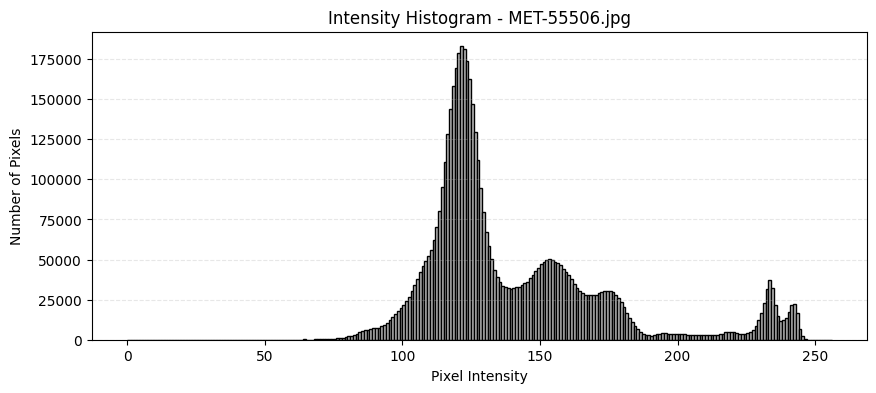

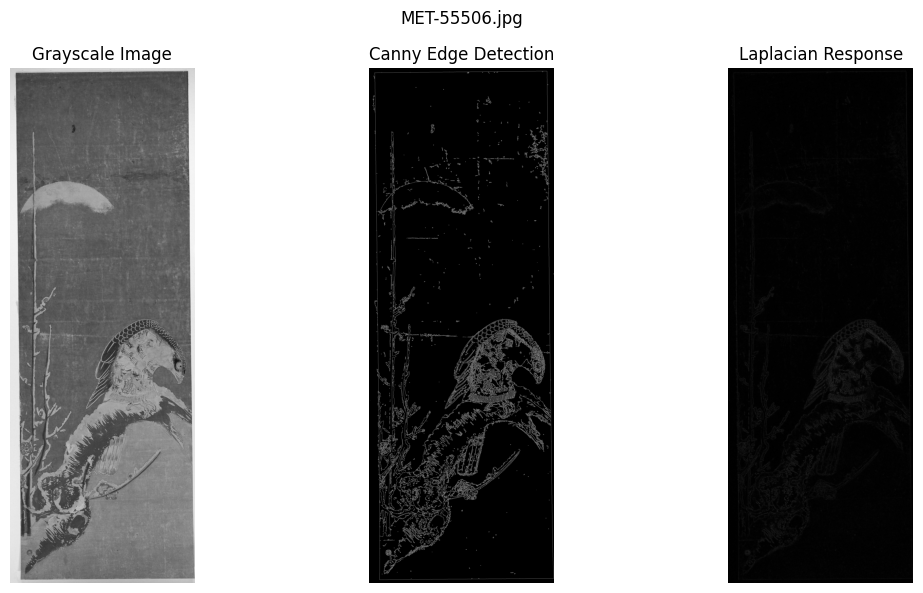

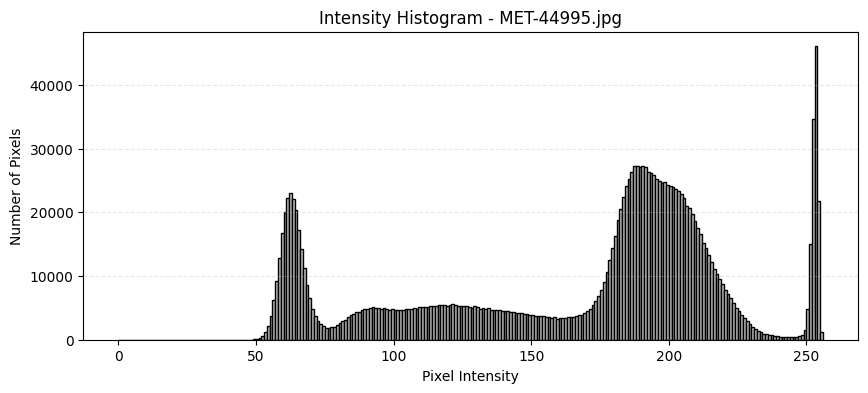

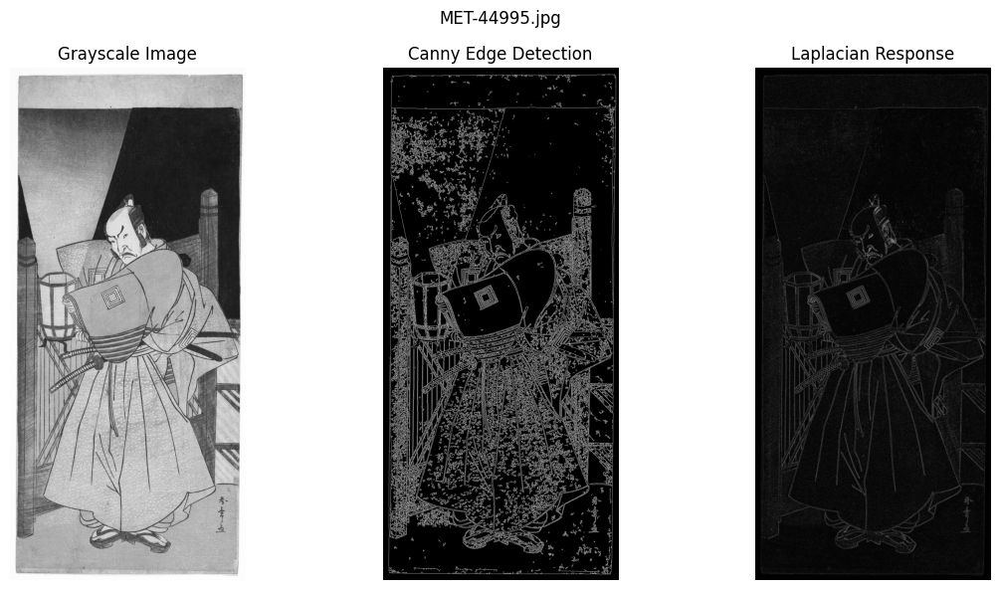

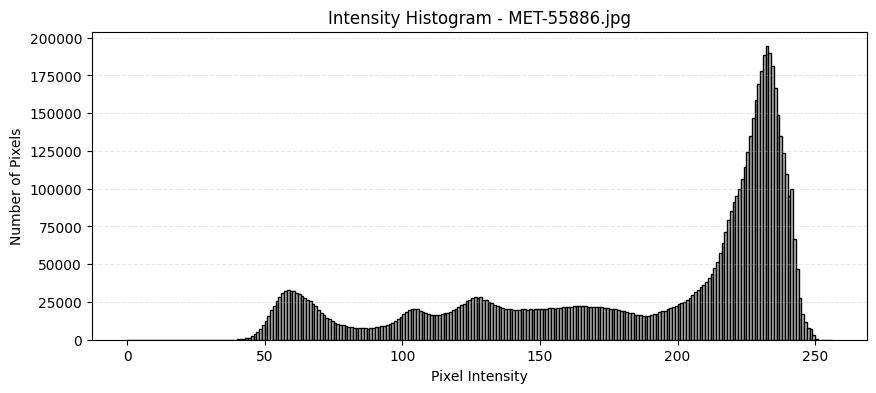

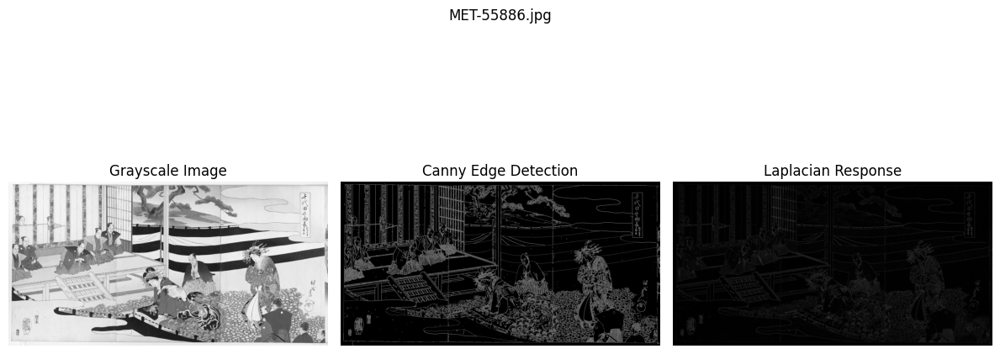

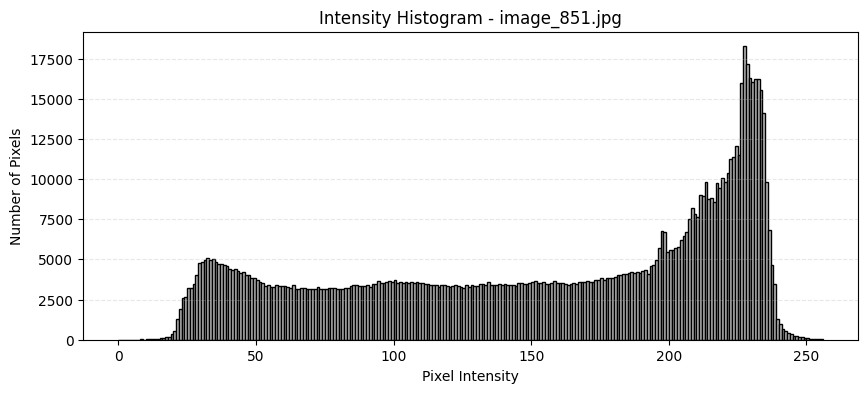

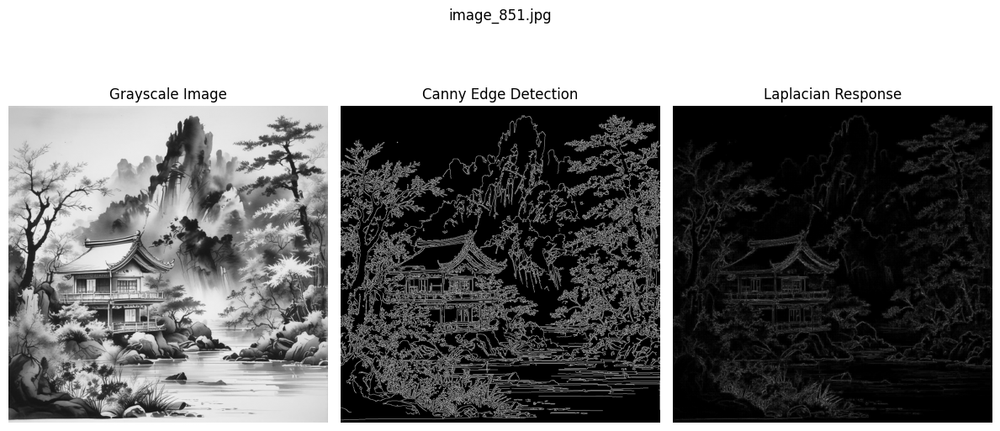

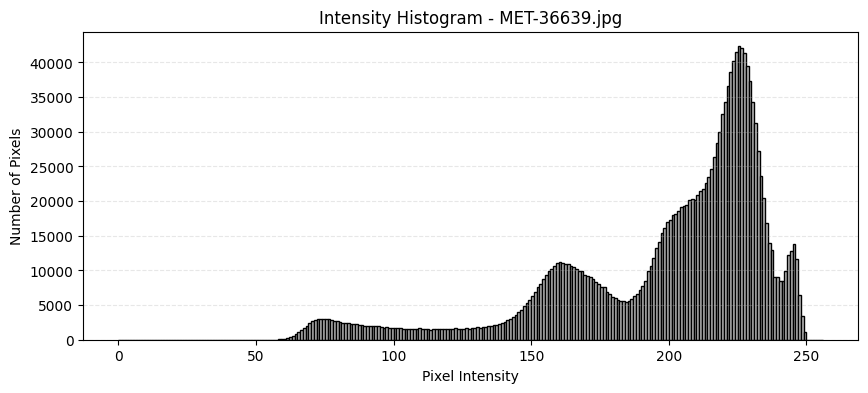

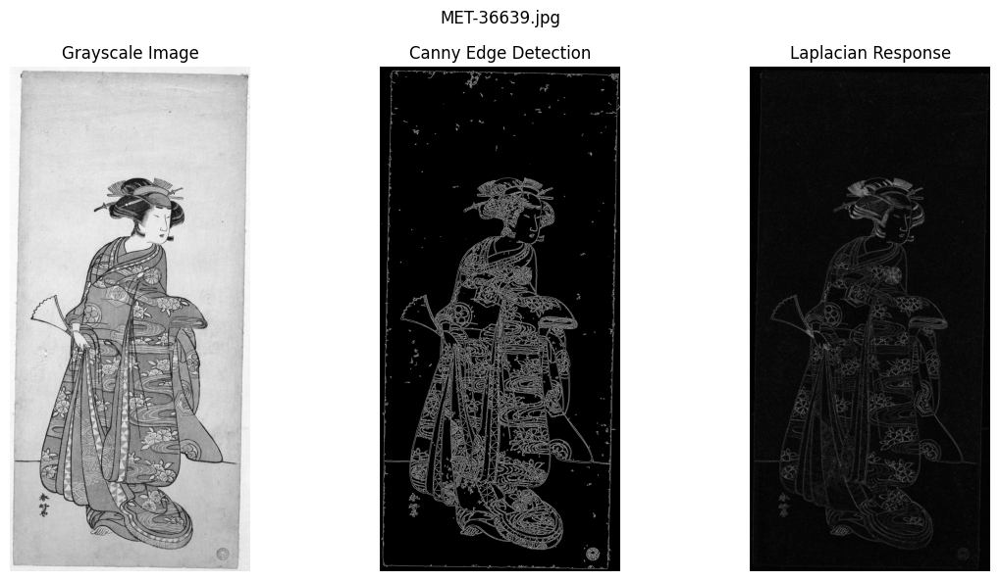

✅ Noise analysis completed for the selected images.


In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# ==========================
# Folder Dataset Jepang
# ==========================

input_folder = japan_extract

# ==========================
# Cari seluruh gambar
# ==========================

image_files = []

for root, dirs, files in os.walk(input_folder):

    # Abaikan folder metadata Mac
    dirs[:] = [d for d in dirs if d != "__MACOSX"]

    for file in files:

        # Abaikan file metadata Mac
        if file.startswith("._"):
            continue

        if file.lower().endswith((".png", ".jpg", ".jpeg")):
            image_files.append(os.path.join(root, file))

print(f"Jumlah gambar ditemukan: {len(image_files)}")

# ==========================
# Analisis 5 gambar pertama
# ==========================

num_images_to_analyze = min(5, len(image_files))

for image_path in image_files[:num_images_to_analyze]:

    filename = os.path.basename(image_path)

    image = cv2.imread(image_path)

    if image is None:
        print(f"⚠️ Gagal membaca {filename}")
        continue

    # Konversi ke grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Edge Detection (Canny)
    edges = cv2.Canny(gray_image, 50, 150)

    # Laplacian
    laplacian = cv2.Laplacian(gray_image, cv2.CV_64F)

    # ==========================
    # Histogram Intensitas
    # ==========================

    plt.figure(figsize=(10,4))

    plt.hist(
        gray_image.ravel(),
        bins=256,
        range=[0,256],
        color="#BDBDBD",
        edgecolor="black"
    )

    plt.title(f"Intensity Histogram - {filename}")
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Number of Pixels")

    plt.grid(axis="y", linestyle="--", alpha=0.3)

    plt.show()

    # ==========================
    # Visualisasi
    # ==========================

    plt.figure(figsize=(12,6))

    plt.subplot(1,3,1)
    plt.imshow(gray_image, cmap="gray")
    plt.title("Grayscale Image")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(edges, cmap="gray")
    plt.title("Canny Edge Detection")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(np.abs(laplacian), cmap="gray")
    plt.title("Laplacian Response")
    plt.axis("off")

    plt.suptitle(filename)

    plt.tight_layout()

    plt.show()

print("✅ Noise analysis completed for the selected images.")

In [ ]:
def enhance_contrast(image):
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=1.8, tileGridSize=(8, 8))
    l_clahe = clahe.apply(l)
    lab_clahe = cv2.merge((l_clahe, a, b))
    return cv2.cvtColor(lab_clahe, cv2.COLOR_LAB2BGR)


In [ ]:
import cv2
import numpy as np

def resize_and_pad(image, max_size=896):
    h, w = image.shape[:2]

    # 1️⃣ Jika gambar lebih besar dari max_size → perkecil dengan skala yang sesuai
    if max(h, w) > max_size:
        scale_factor = min(max_size / w, max_size / h)
        new_w = int(w * scale_factor)
        new_h = int(h * scale_factor)

    # 2️⃣ Jika gambar lebih kecil dari max_size, perkecil ke kelipatan 224 terdekat
    else:
        new_w = (w // 224) * 224 if w % 224 != 0 else w
        new_h = (h // 224) * 224 if h % 224 != 0 else h

    # **Pastikan tidak ada ukuran 0 akibat pembulatan ke bawah**
    new_w = max(new_w, 224)
    new_h = max(new_h, 224)

    # 3️⃣ Resize gambar dengan mempertahankan aspek rasio
    resized_image = cv2.resize(image, (new_w, new_h), interpolation=cv2.INTER_AREA)

    # 4️⃣ Pastikan width & height tetap kelipatan 224 dengan padding (jika perlu)
    target_w = ((new_w + 223) // 224) * 224  # Dibulatkan ke atas ke kelipatan 224
    target_h = ((new_h + 223) // 224) * 224  # Dibulatkan ke atas ke kelipatan 224

    # 5️⃣ Hitung jumlah padding yang dibutuhkan
    pad_w = target_w - new_w
    pad_h = target_h - new_h

    left = pad_w // 2
    right = pad_w - left
    top = pad_h // 2
    bottom = pad_h - top

    # 6️⃣ Tambahkan padding agar tetap proporsional
    padded_image = cv2.copyMakeBorder(resized_image, top, bottom, left, right, cv2.BORDER_CONSTANT, value=[0, 0, 0])

    return padded_image, (target_w, target_h)


In [ ]:
def normalize_image(image):
    return image / 255.0


In [ ]:
def preprocess_image(image_path):
    image = cv2.imread(image_path)  # Baca gambar
    enhanced = enhance_contrast(image)  # Tingkatkan kontras
    resized, new_size = resize_and_pad(enhanced)
    print(f"Ukuran sebelum: {enhanced.shape[:2]}, sesudah: {new_size}")
    normalized = normalize_image(resized)  # Normalisasi
    return normalized

In [ ]:
import os
import cv2
import numpy as np
import time
from tqdm import tqdm

# ===================================
# Folder Input (hasil extract)
# ===================================

input_folder = japan_extract

# ===================================
# Folder Output
# ===================================

output_folder = "/content/drive/MyDrive/Projek Riset Bu Shintami/Processed_Dataset_Positif_Jepang"

os.makedirs(output_folder, exist_ok=True)

# ===================================
# Cari seluruh gambar
# ===================================

image_files = []

for root, dirs, files in os.walk(input_folder):

    # Abaikan folder metadata Mac
    dirs[:] = [d for d in dirs if d != "__MACOSX"]

    for file in files:

        # Abaikan file metadata Mac
        if file.startswith("._"):
            continue

        if file.lower().endswith((".png", ".jpg", ".jpeg")):
            image_files.append(os.path.join(root, file))

print(f"🔄 Memproses {len(image_files)} gambar...")

# ===================================
# Proses Preprocessing
# ===================================

start_time = time.time()

for idx, image_path in enumerate(
        tqdm(
            image_files,
            desc="⚙️ Processing Images",
            unit="image"
        )):

    filename = os.path.basename(image_path)

    output_path = os.path.join(
        output_folder,
        filename
    )

    img_start = time.time()

    processed_image = preprocess_image(image_path)

    if processed_image is None:
        print(f"⚠️ Skipping {filename}")
        continue

    # Jika preprocess menghasilkan float [0,1]
    if processed_image.dtype != np.uint8:
        processed_image = (
            processed_image * 255
        ).astype(np.uint8)

    cv2.imwrite(
        output_path,
        processed_image
    )

    img_time = time.time() - img_start

    if (idx + 1) % 10 == 0:
        print(
            f"✅ {idx+1}/{len(image_files)} "
            f"- {filename} "
            f"({img_time:.2f} s)"
        )

# ===================================
# Ringkasan
# ===================================

total_time = time.time() - start_time

print("\n========================================")
print(f"Images Processed : {len(image_files)}")
print(f"Total Time       : {total_time:.2f} seconds")
print(f"Average Time     : {total_time/len(image_files):.2f} seconds/image")
print("========================================")

🔄 Memproses 5290 gambar...


⚙️ Processing Images:   0%|          | 1/5290 [00:00<51:01,  1.73image/s]

Ukuran sebelum: (3906, 1403), sesudah: (448, 896)
Ukuran sebelum: (1958, 900), sesudah: (448, 896)


⚙️ Processing Images:   0%|          | 3/5290 [00:01<34:51,  2.53image/s]

Ukuran sebelum: (1895, 3702), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   0%|          | 5/5290 [00:01<26:18,  3.35image/s]

Ukuran sebelum: (1927, 917), sesudah: (448, 896)
Ukuran sebelum: (3002, 4000), sesudah: (896, 672)


⚙️ Processing Images:   0%|          | 6/5290 [00:02<42:40,  2.06image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   0%|          | 7/5290 [00:02<38:46,  2.27image/s]

Ukuran sebelum: (1256, 1956), sesudah: (896, 672)


⚙️ Processing Images:   0%|          | 9/5290 [00:03<32:20,  2.72image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:   0%|          | 10/5290 [00:03<29:17,  3.00image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 10/5290 - image_900.jpg (0.25 s)
Ukuran sebelum: (2852, 3708), sesudah: (896, 896)


⚙️ Processing Images:   0%|          | 12/5290 [00:04<38:51,  2.26image/s]

Ukuran sebelum: (1919, 1335), sesudah: (672, 896)
Ukuran sebelum: (2566, 3420), sesudah: (896, 672)


⚙️ Processing Images:   0%|          | 14/5290 [00:05<38:43,  2.27image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:   0%|          | 15/5290 [00:06<39:10,  2.24image/s]

Ukuran sebelum: (3929, 1903), sesudah: (448, 896)


⚙️ Processing Images:   0%|          | 16/5290 [00:06<40:23,  2.18image/s]

Ukuran sebelum: (3911, 1851), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   0%|          | 18/5290 [00:07<32:39,  2.69image/s]

Ukuran sebelum: (2694, 3906), sesudah: (896, 672)


⚙️ Processing Images:   0%|          | 19/5290 [00:07<36:49,  2.39image/s]

Ukuran sebelum: (3769, 3407), sesudah: (896, 896)
Ukuran sebelum: (900, 573), sesudah: (672, 896)
✅ 20/5290 - MET-36688.jpg (0.07 s)


⚙️ Processing Images:   0%|          | 21/5290 [00:08<34:19,  2.56image/s]

Ukuran sebelum: (2668, 3969), sesudah: (896, 672)


⚙️ Processing Images:   0%|          | 22/5290 [00:09<39:32,  2.22image/s]

Ukuran sebelum: (3860, 2755), sesudah: (672, 896)


⚙️ Processing Images:   0%|          | 23/5290 [00:09<36:39,  2.39image/s]

Ukuran sebelum: (3879, 1387), sesudah: (448, 896)


⚙️ Processing Images:   0%|          | 24/5290 [00:10<43:40,  2.01image/s]

Ukuran sebelum: (2856, 3849), sesudah: (896, 672)


⚙️ Processing Images:   0%|          | 25/5290 [00:10<36:30,  2.40image/s]

Ukuran sebelum: (2000, 1358), sesudah: (672, 896)


⚙️ Processing Images:   0%|          | 26/5290 [00:10<35:15,  2.49image/s]

Ukuran sebelum: (1419, 1930), sesudah: (896, 672)


⚙️ Processing Images:   1%|          | 28/5290 [00:11<29:51,  2.94image/s]

Ukuran sebelum: (3158, 2769), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   1%|          | 29/5290 [00:12<39:06,  2.24image/s]

Ukuran sebelum: (3765, 3376), sesudah: (896, 896)


⚙️ Processing Images:   1%|          | 30/5290 [00:12<44:05,  1.99image/s]

Ukuran sebelum: (2591, 3889), sesudah: (896, 672)
✅ 30/5290 - MET-37274.jpg (0.64 s)


⚙️ Processing Images:   1%|          | 31/5290 [00:13<41:16,  2.12image/s]

Ukuran sebelum: (2585, 3867), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   1%|          | 33/5290 [00:13<31:39,  2.77image/s]

Ukuran sebelum: (3935, 2658), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   1%|          | 35/5290 [00:14<26:43,  3.28image/s]

Ukuran sebelum: (4000, 2325), sesudah: (672, 896)


⚙️ Processing Images:   1%|          | 36/5290 [00:14<29:09,  3.00image/s]

Ukuran sebelum: (2632, 4000), sesudah: (896, 672)
Ukuran sebelum: (2000, 802), sesudah: (448, 896)


⚙️ Processing Images:   1%|          | 38/5290 [00:15<25:24,  3.45image/s]

Ukuran sebelum: (2473, 3860), sesudah: (896, 672)


⚙️ Processing Images:   1%|          | 39/5290 [00:15<29:25,  2.97image/s]

Ukuran sebelum: (3832, 3464), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 40/5290 - image_346.jpg (0.06 s)


⚙️ Processing Images:   1%|          | 41/5290 [00:16<26:05,  3.35image/s]

Ukuran sebelum: (2775, 3926), sesudah: (896, 672)


⚙️ Processing Images:   1%|          | 42/5290 [00:16<28:38,  3.05image/s]

Ukuran sebelum: (2794, 3835), sesudah: (896, 672)


⚙️ Processing Images:   1%|          | 43/5290 [00:16<26:27,  3.30image/s]

Ukuran sebelum: (1320, 1942), sesudah: (896, 672)


⚙️ Processing Images:   1%|          | 44/5290 [00:17<28:47,  3.04image/s]

Ukuran sebelum: (2664, 3924), sesudah: (896, 672)


⚙️ Processing Images:   1%|          | 46/5290 [00:17<26:37,  3.28image/s]

Ukuran sebelum: (2942, 4000), sesudah: (896, 672)
Ukuran sebelum: (1790, 1572), sesudah: (896, 896)


⚙️ Processing Images:   1%|          | 47/5290 [00:18<29:38,  2.95image/s]

Ukuran sebelum: (3929, 2759), sesudah: (672, 896)


⚙️ Processing Images:   1%|          | 48/5290 [00:18<29:46,  2.93image/s]

Ukuran sebelum: (2029, 3934), sesudah: (896, 672)
Ukuran sebelum: (4000, 3250), sesudah: (896, 896)


⚙️ Processing Images:   1%|          | 50/5290 [00:20<47:19,  1.85image/s]

Ukuran sebelum: (3917, 2695), sesudah: (672, 896)
✅ 50/5290 - MET-36544.jpg (0.63 s)


⚙️ Processing Images:   1%|          | 51/5290 [00:20<39:41,  2.20image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   1%|          | 52/5290 [00:20<40:26,  2.16image/s]

Ukuran sebelum: (2048, 3863), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   1%|          | 53/5290 [00:20<34:58,  2.50image/s]

Ukuran sebelum: (3857, 2845), sesudah: (672, 896)


⚙️ Processing Images:   1%|          | 55/5290 [00:22<42:26,  2.06image/s]

Ukuran sebelum: (1361, 2000), sesudah: (896, 672)


⚙️ Processing Images:   1%|          | 56/5290 [00:22<48:01,  1.82image/s]

Ukuran sebelum: (3898, 2826), sesudah: (672, 896)
Ukuran sebelum: (3848, 2865), sesudah: (672, 896)


⚙️ Processing Images:   1%|          | 58/5290 [00:24<51:06,  1.71image/s]  

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:   1%|          | 59/5290 [00:25<56:59,  1.53image/s]

Ukuran sebelum: (4000, 2301), sesudah: (672, 896)


⚙️ Processing Images:   1%|          | 60/5290 [00:25<54:29,  1.60image/s]

Ukuran sebelum: (1203, 1912), sesudah: (896, 672)
✅ 60/5290 - MET-37198.jpg (0.56 s)


⚙️ Processing Images:   1%|          | 61/5290 [00:26<59:40,  1.46image/s]

Ukuran sebelum: (3880, 1894), sesudah: (448, 896)


⚙️ Processing Images:   1%|          | 62/5290 [00:27<1:05:42,  1.33image/s]

Ukuran sebelum: (2788, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   1%|          | 64/5290 [00:28<50:49,  1.71image/s]

Ukuran sebelum: (3889, 1856), sesudah: (448, 896)


⚙️ Processing Images:   1%|          | 65/5290 [00:28<54:39,  1.59image/s]

Ukuran sebelum: (2672, 3873), sesudah: (896, 672)


⚙️ Processing Images:   1%|          | 66/5290 [00:29<44:33,  1.95image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   1%|▏         | 67/5290 [00:29<38:39,  2.25image/s]

Ukuran sebelum: (3901, 1782), sesudah: (448, 896)


⚙️ Processing Images:   1%|▏         | 68/5290 [00:29<39:00,  2.23image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:   1%|▏         | 69/5290 [00:30<38:40,  2.25image/s]

Ukuran sebelum: (3807, 2644), sesudah: (672, 896)


⚙️ Processing Images:   1%|▏         | 70/5290 [00:30<39:02,  2.23image/s]

Ukuran sebelum: (3031, 3871), sesudah: (896, 896)
✅ 70/5290 - MET-55688.jpg (0.46 s)


⚙️ Processing Images:   1%|▏         | 71/5290 [00:31<34:59,  2.49image/s]

Ukuran sebelum: (3915, 1892), sesudah: (448, 896)


⚙️ Processing Images:   1%|▏         | 72/5290 [00:31<40:39,  2.14image/s]

Ukuran sebelum: (4000, 3557), sesudah: (896, 896)


⚙️ Processing Images:   1%|▏         | 73/5290 [00:31<35:11,  2.47image/s]

Ukuran sebelum: (4000, 1044), sesudah: (448, 896)


⚙️ Processing Images:   1%|▏         | 75/5290 [00:32<31:51,  2.73image/s]

Ukuran sebelum: (2909, 3825), sesudah: (896, 896)
Ukuran sebelum: (1323, 1957), sesudah: (896, 672)


⚙️ Processing Images:   1%|▏         | 77/5290 [00:32<21:38,  4.01image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (3957, 750), sesudah: (224, 896)


⚙️ Processing Images:   1%|▏         | 78/5290 [00:33<20:36,  4.21image/s]

Ukuran sebelum: (1836, 1692), sesudah: (896, 896)


⚙️ Processing Images:   1%|▏         | 79/5290 [00:33<23:38,  3.67image/s]

Ukuran sebelum: (2455, 3862), sesudah: (896, 672)


⚙️ Processing Images:   2%|▏         | 80/5290 [00:33<26:35,  3.27image/s]

Ukuran sebelum: (2616, 3846), sesudah: (896, 672)
✅ 80/5290 - MET-45293.jpg (0.40 s)


⚙️ Processing Images:   2%|▏         | 81/5290 [00:34<31:35,  2.75image/s]

Ukuran sebelum: (3214, 4000), sesudah: (896, 896)
Ukuran sebelum: (2346, 1846), sesudah: (896, 896)


⚙️ Processing Images:   2%|▏         | 84/5290 [00:34<17:08,  5.06image/s]

Ukuran sebelum: (900, 378), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   2%|▏         | 85/5290 [00:34<18:56,  4.58image/s]

Ukuran sebelum: (3853, 1756), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   2%|▏         | 87/5290 [00:35<21:07,  4.11image/s]

Ukuran sebelum: (4000, 2974), sesudah: (672, 896)
Ukuran sebelum: (3852, 1339), sesudah: (448, 896)


⚙️ Processing Images:   2%|▏         | 88/5290 [00:35<20:03,  4.32image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:   2%|▏         | 90/5290 [00:36<18:04,  4.80image/s]

Ukuran sebelum: (3903, 1845), sesudah: (448, 896)
✅ 90/5290 - MET-37138.jpg (0.28 s)


⚙️ Processing Images:   2%|▏         | 91/5290 [00:36<19:37,  4.42image/s]

Ukuran sebelum: (3745, 1899), sesudah: (672, 896)


⚙️ Processing Images:   2%|▏         | 92/5290 [00:36<21:12,  4.09image/s]

Ukuran sebelum: (1993, 3952), sesudah: (896, 672)


⚙️ Processing Images:   2%|▏         | 93/5290 [00:37<29:38,  2.92image/s]

Ukuran sebelum: (3882, 4000), sesudah: (896, 896)


⚙️ Processing Images:   2%|▏         | 95/5290 [00:37<27:47,  3.11image/s]

Ukuran sebelum: (3065, 4000), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   2%|▏         | 96/5290 [00:38<36:53,  2.35image/s]

Ukuran sebelum: (2678, 3861), sesudah: (896, 672)


⚙️ Processing Images:   2%|▏         | 97/5290 [00:39<34:43,  2.49image/s]

Ukuran sebelum: (2307, 1853), sesudah: (896, 896)


⚙️ Processing Images:   2%|▏         | 99/5290 [00:39<30:41,  2.82image/s]

Ukuran sebelum: (2472, 3880), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:   2%|▏         | 100/5290 [00:40<29:44,  2.91image/s]

Ukuran sebelum: (2424, 1823), sesudah: (896, 896)
✅ 100/5290 - MET-57200.jpg (0.32 s)


⚙️ Processing Images:   2%|▏         | 102/5290 [00:40<28:24,  3.04image/s]

Ukuran sebelum: (2712, 3872), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   2%|▏         | 103/5290 [00:41<36:20,  2.38image/s]

Ukuran sebelum: (2821, 3810), sesudah: (896, 672)


⚙️ Processing Images:   2%|▏         | 104/5290 [00:41<36:11,  2.39image/s]

Ukuran sebelum: (3873, 1762), sesudah: (448, 896)


⚙️ Processing Images:   2%|▏         | 105/5290 [00:42<32:20,  2.67image/s]

Ukuran sebelum: (2000, 1590), sesudah: (896, 896)


⚙️ Processing Images:   2%|▏         | 106/5290 [00:42<37:51,  2.28image/s]

Ukuran sebelum: (3239, 3669), sesudah: (896, 896)


⚙️ Processing Images:   2%|▏         | 107/5290 [00:43<37:24,  2.31image/s]

Ukuran sebelum: (3924, 2786), sesudah: (672, 896)


⚙️ Processing Images:   2%|▏         | 108/5290 [00:43<39:06,  2.21image/s]

Ukuran sebelum: (4000, 3151), sesudah: (896, 896)


⚙️ Processing Images:   2%|▏         | 109/5290 [00:43<33:22,  2.59image/s]

Ukuran sebelum: (1269, 1943), sesudah: (896, 672)


⚙️ Processing Images:   2%|▏         | 110/5290 [00:44<45:12,  1.91image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
✅ 110/5290 - MET-78725.jpg (0.84 s)


⚙️ Processing Images:   2%|▏         | 111/5290 [00:45<41:50,  2.06image/s]

Ukuran sebelum: (2683, 3860), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   2%|▏         | 113/5290 [00:45<34:01,  2.54image/s]

Ukuran sebelum: (2895, 3888), sesudah: (896, 672)


⚙️ Processing Images:   2%|▏         | 114/5290 [00:46<33:58,  2.54image/s]

Ukuran sebelum: (3831, 2757), sesudah: (672, 896)
Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:   2%|▏         | 116/5290 [00:47<45:35,  1.89image/s]

Ukuran sebelum: (2174, 3874), sesudah: (896, 672)
Ukuran sebelum: (1880, 1408), sesudah: (672, 896)


⚙️ Processing Images:   2%|▏         | 118/5290 [00:48<44:15,  1.95image/s]

Ukuran sebelum: (3915, 1879), sesudah: (448, 896)


⚙️ Processing Images:   2%|▏         | 119/5290 [00:48<44:06,  1.95image/s]

Ukuran sebelum: (3911, 1866), sesudah: (448, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:   2%|▏         | 120/5290 [00:49<36:48,  2.34image/s]

✅ 120/5290 - image_956.jpg (0.22 s)


⚙️ Processing Images:   2%|▏         | 121/5290 [00:49<41:08,  2.09image/s]

Ukuran sebelum: (2597, 3851), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   2%|▏         | 123/5290 [00:50<37:18,  2.31image/s]

Ukuran sebelum: (3832, 1839), sesudah: (448, 896)


⚙️ Processing Images:   2%|▏         | 124/5290 [00:51<43:10,  1.99image/s]

Ukuran sebelum: (2608, 3838), sesudah: (896, 672)


⚙️ Processing Images:   2%|▏         | 125/5290 [00:51<43:25,  1.98image/s]

Ukuran sebelum: (1964, 4000), sesudah: (896, 448)


⚙️ Processing Images:   2%|▏         | 126/5290 [00:52<53:39,  1.60image/s]

Ukuran sebelum: (3278, 4000), sesudah: (896, 896)


⚙️ Processing Images:   2%|▏         | 127/5290 [00:53<1:03:29,  1.36image/s]

Ukuran sebelum: (3226, 4000), sesudah: (896, 896)


⚙️ Processing Images:   2%|▏         | 129/5290 [00:54<47:26,  1.81image/s]  

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   2%|▏         | 130/5290 [00:54<37:38,  2.28image/s]

Ukuran sebelum: (1923, 917), sesudah: (448, 896)
✅ 130/5290 - MET-56002.jpg (0.17 s)


⚙️ Processing Images:   2%|▏         | 131/5290 [00:55<44:30,  1.93image/s]

Ukuran sebelum: (3924, 2828), sesudah: (672, 896)


⚙️ Processing Images:   2%|▏         | 132/5290 [00:55<48:21,  1.78image/s]

Ukuran sebelum: (2686, 3863), sesudah: (896, 672)


⚙️ Processing Images:   3%|▎         | 133/5290 [00:56<45:19,  1.90image/s]

Ukuran sebelum: (3885, 1829), sesudah: (448, 896)


⚙️ Processing Images:   3%|▎         | 134/5290 [00:57<48:15,  1.78image/s]

Ukuran sebelum: (3862, 2723), sesudah: (672, 896)
Ukuran sebelum: (1080, 2000), sesudah: (896, 672)


⚙️ Processing Images:   3%|▎         | 138/5290 [00:57<22:47,  3.77image/s]

Ukuran sebelum: (2650, 3801), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   3%|▎         | 140/5290 [00:58<21:45,  3.95image/s]

Ukuran sebelum: (2784, 3675), sesudah: (896, 896)
✅ 140/5290 - MET-57559.jpg (0.40 s)


⚙️ Processing Images:   3%|▎         | 141/5290 [00:58<24:23,  3.52image/s]

Ukuran sebelum: (2471, 3941), sesudah: (896, 672)


⚙️ Processing Images:   3%|▎         | 142/5290 [00:59<28:24,  3.02image/s]

Ukuran sebelum: (3047, 4000), sesudah: (896, 896)


⚙️ Processing Images:   3%|▎         | 145/5290 [00:59<19:59,  4.29image/s]

Ukuran sebelum: (3844, 2616), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   3%|▎         | 146/5290 [01:00<24:35,  3.49image/s]

Ukuran sebelum: (3838, 2829), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:   3%|▎         | 148/5290 [01:00<18:24,  4.66image/s]

Ukuran sebelum: (1262, 1940), sesudah: (896, 672)


⚙️ Processing Images:   3%|▎         | 149/5290 [01:00<23:51,  3.59image/s]

Ukuran sebelum: (2658, 3866), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 150/5290 - image_667.jpg (0.07 s)


⚙️ Processing Images:   3%|▎         | 151/5290 [01:01<19:57,  4.29image/s]

Ukuran sebelum: (3894, 1805), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   3%|▎         | 153/5290 [01:01<21:10,  4.04image/s]

Ukuran sebelum: (2627, 3841), sesudah: (896, 672)


⚙️ Processing Images:   3%|▎         | 155/5290 [01:02<20:14,  4.23image/s]

Ukuran sebelum: (3859, 1885), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   3%|▎         | 156/5290 [01:02<21:29,  3.98image/s]

Ukuran sebelum: (3867, 1397), sesudah: (448, 896)


⚙️ Processing Images:   3%|▎         | 159/5290 [01:03<19:40,  4.35image/s]

Ukuran sebelum: (3082, 3908), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:   3%|▎         | 161/5290 [01:03<14:35,  5.86image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 160/5290 - image_682.jpg (0.07 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:   3%|▎         | 163/5290 [01:03<12:00,  7.11image/s]

Ukuran sebelum: (1954, 952), sesudah: (448, 896)


⚙️ Processing Images:   3%|▎         | 164/5290 [01:04<17:32,  4.87image/s]

Ukuran sebelum: (4000, 3001), sesudah: (672, 896)


⚙️ Processing Images:   3%|▎         | 165/5290 [01:04<21:38,  3.95image/s]

Ukuran sebelum: (3737, 3021), sesudah: (896, 896)


⚙️ Processing Images:   3%|▎         | 166/5290 [01:04<24:40,  3.46image/s]

Ukuran sebelum: (2509, 3818), sesudah: (896, 672)


⚙️ Processing Images:   3%|▎         | 169/5290 [01:05<19:57,  4.28image/s]

Ukuran sebelum: (3787, 3461), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   3%|▎         | 170/5290 [01:05<19:13,  4.44image/s]

Ukuran sebelum: (1958, 2762), sesudah: (896, 672)
✅ 170/5290 - MET-57686.jpg (0.20 s)


⚙️ Processing Images:   3%|▎         | 171/5290 [01:06<23:34,  3.62image/s]

Ukuran sebelum: (3823, 2928), sesudah: (896, 896)


⚙️ Processing Images:   3%|▎         | 172/5290 [01:06<26:54,  3.17image/s]

Ukuran sebelum: (2860, 3884), sesudah: (896, 672)


⚙️ Processing Images:   3%|▎         | 173/5290 [01:07<30:11,  2.82image/s]

Ukuran sebelum: (4000, 2809), sesudah: (672, 896)
Ukuran sebelum: (1876, 914), sesudah: (448, 896)


⚙️ Processing Images:   3%|▎         | 176/5290 [01:07<21:59,  3.87image/s]

Ukuran sebelum: (3862, 1825), sesudah: (448, 896)
Ukuran sebelum: (1943, 945), sesudah: (448, 896)


⚙️ Processing Images:   3%|▎         | 178/5290 [01:08<27:36,  3.09image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   3%|▎         | 179/5290 [01:09<39:01,  2.18image/s]

Ukuran sebelum: (3822, 3324), sesudah: (896, 896)


⚙️ Processing Images:   3%|▎         | 180/5290 [01:09<35:54,  2.37image/s]

Ukuran sebelum: (1896, 1317), sesudah: (672, 896)
✅ 180/5290 - MET-58258.jpg (0.33 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   3%|▎         | 182/5290 [01:10<33:50,  2.52image/s]

Ukuran sebelum: (2678, 3863), sesudah: (896, 672)


⚙️ Processing Images:   3%|▎         | 183/5290 [01:11<38:30,  2.21image/s]

Ukuran sebelum: (2924, 3780), sesudah: (896, 896)


⚙️ Processing Images:   3%|▎         | 184/5290 [01:11<45:24,  1.87image/s]

Ukuran sebelum: (3026, 4000), sesudah: (896, 896)


⚙️ Processing Images:   3%|▎         | 185/5290 [01:12<43:55,  1.94image/s]

Ukuran sebelum: (2620, 3893), sesudah: (896, 672)


⚙️ Processing Images:   4%|▎         | 186/5290 [01:12<40:45,  2.09image/s]

Ukuran sebelum: (4000, 2379), sesudah: (672, 896)


⚙️ Processing Images:   4%|▎         | 187/5290 [01:12<34:51,  2.44image/s]

Ukuran sebelum: (1904, 1353), sesudah: (672, 896)


⚙️ Processing Images:   4%|▎         | 188/5290 [01:13<30:13,  2.81image/s]

Ukuran sebelum: (2112, 2816), sesudah: (896, 672)


⚙️ Processing Images:   4%|▎         | 189/5290 [01:13<31:30,  2.70image/s]

Ukuran sebelum: (4000, 2667), sesudah: (672, 896)


⚙️ Processing Images:   4%|▎         | 190/5290 [01:13<33:29,  2.54image/s]

Ukuran sebelum: (2885, 3840), sesudah: (896, 896)
✅ 190/5290 - MET-53978.jpg (0.45 s)


⚙️ Processing Images:   4%|▎         | 191/5290 [01:14<34:49,  2.44image/s]

Ukuran sebelum: (2876, 3887), sesudah: (896, 672)


⚙️ Processing Images:   4%|▎         | 193/5290 [01:14<27:07,  3.13image/s]

Ukuran sebelum: (3895, 2567), sesudah: (672, 896)
Ukuran sebelum: (3947, 778), sesudah: (224, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:   4%|▎         | 195/5290 [01:15<20:18,  4.18image/s]

Ukuran sebelum: (1908, 1335), sesudah: (672, 896)


⚙️ Processing Images:   4%|▎         | 196/5290 [01:15<21:38,  3.92image/s]

Ukuran sebelum: (3895, 1836), sesudah: (448, 896)


⚙️ Processing Images:   4%|▎         | 197/5290 [01:15<25:24,  3.34image/s]

Ukuran sebelum: (2840, 3877), sesudah: (896, 672)


⚙️ Processing Images:   4%|▎         | 198/5290 [01:16<27:43,  3.06image/s]

Ukuran sebelum: (3926, 2579), sesudah: (672, 896)


⚙️ Processing Images:   4%|▍         | 200/5290 [01:16<25:09,  3.37image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
Ukuran sebelum: (1888, 1280), sesudah: (672, 896)
✅ 200/5290 - MET-73474.jpg (0.15 s)


⚙️ Processing Images:   4%|▍         | 202/5290 [01:17<22:38,  3.75image/s]

Ukuran sebelum: (3833, 2707), sesudah: (672, 896)
Ukuran sebelum: (3955, 703), sesudah: (224, 896)


⚙️ Processing Images:   4%|▍         | 203/5290 [01:17<20:13,  4.19image/s]

Ukuran sebelum: (1162, 3918), sesudah: (896, 448)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:   4%|▍         | 205/5290 [01:18<20:04,  4.22image/s]

Ukuran sebelum: (2781, 3884), sesudah: (896, 672)


⚙️ Processing Images:   4%|▍         | 206/5290 [01:18<24:25,  3.47image/s]

Ukuran sebelum: (3761, 2921), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   4%|▍         | 208/5290 [01:18<19:48,  4.28image/s]

Ukuran sebelum: (1932, 1296), sesudah: (672, 896)


⚙️ Processing Images:   4%|▍         | 209/5290 [01:19<23:16,  3.64image/s]

Ukuran sebelum: (3877, 2664), sesudah: (672, 896)
Ukuran sebelum: (1314, 1931), sesudah: (896, 672)


⚙️ Processing Images:   4%|▍         | 210/5290 [01:19<30:29,  2.78image/s]

✅ 210/5290 - MET-36926.jpg (0.62 s)
Ukuran sebelum: (1924, 1340), sesudah: (672, 896)


⚙️ Processing Images:   4%|▍         | 211/5290 [01:20<32:50,  2.58image/s]

Ukuran sebelum: (3850, 3441), sesudah: (896, 896)


⚙️ Processing Images:   4%|▍         | 212/5290 [01:21<45:44,  1.85image/s]

Ukuran sebelum: (1303, 1900), sesudah: (896, 672)


⚙️ Processing Images:   4%|▍         | 214/5290 [01:22<46:25,  1.82image/s]

Ukuran sebelum: (4000, 2370), sesudah: (672, 896)


⚙️ Processing Images:   4%|▍         | 215/5290 [01:22<37:29,  2.26image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:   4%|▍         | 217/5290 [01:23<29:32,  2.86image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1293, 1897), sesudah: (896, 672)


⚙️ Processing Images:   4%|▍         | 219/5290 [01:23<29:05,  2.91image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1437, 1927), sesudah: (896, 672)


⚙️ Processing Images:   4%|▍         | 220/5290 [01:24<37:06,  2.28image/s]

✅ 220/5290 - MET-37126.jpg (0.66 s)


⚙️ Processing Images:   4%|▍         | 221/5290 [01:25<52:04,  1.62image/s]

Ukuran sebelum: (2805, 4000), sesudah: (896, 672)


⚙️ Processing Images:   4%|▍         | 222/5290 [01:25<43:39,  1.93image/s]

Ukuran sebelum: (3891, 770), sesudah: (224, 896)


⚙️ Processing Images:   4%|▍         | 223/5290 [01:26<55:33,  1.52image/s]

Ukuran sebelum: (3812, 2588), sesudah: (672, 896)


⚙️ Processing Images:   4%|▍         | 224/5290 [01:27<44:36,  1.89image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:   4%|▍         | 225/5290 [01:27<48:06,  1.76image/s]

Ukuran sebelum: (2560, 3838), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   4%|▍         | 227/5290 [01:28<39:20,  2.15image/s]

Ukuran sebelum: (3764, 1768), sesudah: (448, 896)


⚙️ Processing Images:   4%|▍         | 228/5290 [01:29<45:13,  1.87image/s]

Ukuran sebelum: (2701, 3950), sesudah: (896, 672)
Ukuran sebelum: (3829, 3484), sesudah: (896, 896)


⚙️ Processing Images:   4%|▍         | 230/5290 [01:30<53:56,  1.56image/s]

Ukuran sebelum: (2527, 3869), sesudah: (896, 672)
✅ 230/5290 - MET-37144.jpg (0.63 s)


⚙️ Processing Images:   4%|▍         | 231/5290 [01:30<43:21,  1.94image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   4%|▍         | 232/5290 [01:31<36:34,  2.30image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   4%|▍         | 233/5290 [01:31<42:28,  1.98image/s]

Ukuran sebelum: (3897, 2784), sesudah: (672, 896)


⚙️ Processing Images:   4%|▍         | 234/5290 [01:32<41:29,  2.03image/s]

Ukuran sebelum: (2853, 3861), sesudah: (896, 672)


⚙️ Processing Images:   4%|▍         | 235/5290 [01:32<38:24,  2.19image/s]

Ukuran sebelum: (3900, 2493), sesudah: (672, 896)


⚙️ Processing Images:   4%|▍         | 236/5290 [01:32<33:46,  2.49image/s]

Ukuran sebelum: (3892, 1854), sesudah: (448, 896)


⚙️ Processing Images:   4%|▍         | 238/5290 [01:33<28:31,  2.95image/s]

Ukuran sebelum: (2561, 3896), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   5%|▍         | 239/5290 [01:33<30:40,  2.74image/s]

Ukuran sebelum: (3871, 1854), sesudah: (448, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 240/5290 - image_627.jpg (0.08 s)


⚙️ Processing Images:   5%|▍         | 241/5290 [01:34<23:57,  3.51image/s]

Ukuran sebelum: (4000, 1737), sesudah: (448, 896)


⚙️ Processing Images:   5%|▍         | 243/5290 [01:34<24:32,  3.43image/s]

Ukuran sebelum: (3826, 3467), sesudah: (896, 896)
Ukuran sebelum: (1932, 1299), sesudah: (672, 896)


⚙️ Processing Images:   5%|▍         | 244/5290 [01:35<27:16,  3.08image/s]

Ukuran sebelum: (3846, 2758), sesudah: (672, 896)


⚙️ Processing Images:   5%|▍         | 245/5290 [01:35<29:13,  2.88image/s]

Ukuran sebelum: (2718, 3870), sesudah: (896, 672)


⚙️ Processing Images:   5%|▍         | 246/5290 [01:36<27:06,  3.10image/s]

Ukuran sebelum: (3835, 1763), sesudah: (448, 896)


⚙️ Processing Images:   5%|▍         | 247/5290 [01:36<29:32,  2.85image/s]

Ukuran sebelum: (3865, 2569), sesudah: (672, 896)


⚙️ Processing Images:   5%|▍         | 248/5290 [01:37<35:11,  2.39image/s]

Ukuran sebelum: (3002, 4000), sesudah: (896, 672)


⚙️ Processing Images:   5%|▍         | 249/5290 [01:37<44:29,  1.89image/s]

Ukuran sebelum: (3856, 3143), sesudah: (896, 896)


⚙️ Processing Images:   5%|▍         | 251/5290 [01:38<36:10,  2.32image/s]

Ukuran sebelum: (2559, 3859), sesudah: (896, 672)
✅ 250/5290 - MET-45317.jpg (0.57 s)
Ukuran sebelum: (1939, 937), sesudah: (448, 896)


⚙️ Processing Images:   5%|▍         | 253/5290 [01:39<32:06,  2.62image/s]

Ukuran sebelum: (3892, 2696), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:   5%|▍         | 254/5290 [01:40<39:19,  2.13image/s]

Ukuran sebelum: (2809, 3843), sesudah: (896, 672)


⚙️ Processing Images:   5%|▍         | 255/5290 [01:40<35:35,  2.36image/s]

Ukuran sebelum: (3877, 1304), sesudah: (448, 896)
Ukuran sebelum: (899, 368), sesudah: (448, 896)


⚙️ Processing Images:   5%|▍         | 257/5290 [01:41<33:22,  2.51image/s]

Ukuran sebelum: (2886, 3864), sesudah: (896, 672)


⚙️ Processing Images:   5%|▍         | 258/5290 [01:41<36:11,  2.32image/s]

Ukuran sebelum: (2653, 3809), sesudah: (896, 672)


⚙️ Processing Images:   5%|▍         | 259/5290 [01:42<35:52,  2.34image/s]

Ukuran sebelum: (2606, 3828), sesudah: (896, 672)


⚙️ Processing Images:   5%|▍         | 260/5290 [01:42<35:02,  2.39image/s]

Ukuran sebelum: (3923, 2620), sesudah: (672, 896)
✅ 260/5290 - MET-56935.jpg (0.39 s)


⚙️ Processing Images:   5%|▍         | 261/5290 [01:42<35:34,  2.36image/s]

Ukuran sebelum: (2714, 3839), sesudah: (896, 672)


⚙️ Processing Images:   5%|▍         | 262/5290 [01:43<37:05,  2.26image/s]

Ukuran sebelum: (4000, 3000), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   5%|▍         | 264/5290 [01:43<29:07,  2.88image/s]

Ukuran sebelum: (3870, 2667), sesudah: (672, 896)


⚙️ Processing Images:   5%|▌         | 265/5290 [01:44<30:40,  2.73image/s]

Ukuran sebelum: (4000, 2708), sesudah: (672, 896)


⚙️ Processing Images:   5%|▌         | 266/5290 [01:44<35:30,  2.36image/s]

Ukuran sebelum: (4000, 3545), sesudah: (896, 896)


⚙️ Processing Images:   5%|▌         | 267/5290 [01:45<39:10,  2.14image/s]

Ukuran sebelum: (4000, 3521), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   5%|▌         | 269/5290 [01:45<30:34,  2.74image/s]

Ukuran sebelum: (2832, 3823), sesudah: (896, 672)


⚙️ Processing Images:   5%|▌         | 270/5290 [01:46<31:36,  2.65image/s]

Ukuran sebelum: (2634, 3836), sesudah: (896, 672)
✅ 270/5290 - MET-36970.jpg (0.42 s)


⚙️ Processing Images:   5%|▌         | 271/5290 [01:46<33:00,  2.53image/s]

Ukuran sebelum: (3884, 3006), sesudah: (896, 896)


⚙️ Processing Images:   5%|▌         | 272/5290 [01:47<37:28,  2.23image/s]

Ukuran sebelum: (4000, 3596), sesudah: (896, 896)


⚙️ Processing Images:   5%|▌         | 274/5290 [01:47<29:59,  2.79image/s]

Ukuran sebelum: (4000, 2811), sesudah: (672, 896)
Ukuran sebelum: (1225, 1959), sesudah: (896, 672)


⚙️ Processing Images:   5%|▌         | 275/5290 [01:48<25:09,  3.32image/s]

Ukuran sebelum: (1358, 1980), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   5%|▌         | 277/5290 [01:48<17:58,  4.65image/s]

Ukuran sebelum: (1337, 1970), sesudah: (896, 672)


⚙️ Processing Images:   5%|▌         | 278/5290 [01:48<18:06,  4.61image/s]

Ukuran sebelum: (1896, 1332), sesudah: (672, 896)


⚙️ Processing Images:   5%|▌         | 281/5290 [01:48<14:10,  5.89image/s]

Ukuran sebelum: (2084, 3879), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 280/5290 - image_639.jpg (0.07 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:   5%|▌         | 282/5290 [01:49<19:21,  4.31image/s]

Ukuran sebelum: (2972, 3794), sesudah: (896, 896)


⚙️ Processing Images:   5%|▌         | 284/5290 [01:49<19:41,  4.24image/s]

Ukuran sebelum: (2942, 3817), sesudah: (896, 896)
Ukuran sebelum: (3945, 771), sesudah: (224, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   5%|▌         | 286/5290 [01:50<22:22,  3.73image/s]

Ukuran sebelum: (3801, 3633), sesudah: (896, 896)
Ukuran sebelum: (2610, 3887), sesudah: (896, 672)


⚙️ Processing Images:   5%|▌         | 288/5290 [01:51<33:54,  2.46image/s]

Ukuran sebelum: (3841, 1329), sesudah: (448, 896)
Ukuran sebelum: (1319, 1927), sesudah: (896, 672)


⚙️ Processing Images:   5%|▌         | 289/5290 [01:52<39:02,  2.14image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   5%|▌         | 290/5290 [01:52<34:59,  2.38image/s]

✅ 290/5290 - image_1152.jpg (0.29 s)


⚙️ Processing Images:   6%|▌         | 291/5290 [01:53<44:54,  1.86image/s]

Ukuran sebelum: (3799, 2538), sesudah: (672, 896)
Ukuran sebelum: (3946, 2751), sesudah: (672, 896)


⚙️ Processing Images:   6%|▌         | 292/5290 [01:54<56:05,  1.49image/s]

Ukuran sebelum: (2409, 1808), sesudah: (672, 896)


⚙️ Processing Images:   6%|▌         | 294/5290 [01:56<57:34,  1.45image/s]

Ukuran sebelum: (2355, 3909), sesudah: (896, 672)
Ukuran sebelum: (773, 760), sesudah: (672, 672)


⚙️ Processing Images:   6%|▌         | 296/5290 [01:56<49:17,  1.69image/s]

Ukuran sebelum: (2242, 4000), sesudah: (896, 672)


⚙️ Processing Images:   6%|▌         | 297/5290 [01:57<53:46,  1.55image/s]

Ukuran sebelum: (3047, 4000), sesudah: (896, 896)
Ukuran sebelum: (2803, 3817), sesudah: (896, 672)


⚙️ Processing Images:   6%|▌         | 299/5290 [01:58<53:13,  1.56image/s]

Ukuran sebelum: (2139, 3814), sesudah: (896, 672)


⚙️ Processing Images:   6%|▌         | 300/5290 [01:59<47:51,  1.74image/s]

Ukuran sebelum: (1224, 1921), sesudah: (896, 672)
✅ 300/5290 - MET-37203.jpg (0.42 s)


⚙️ Processing Images:   6%|▌         | 301/5290 [01:59<38:40,  2.15image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   6%|▌         | 302/5290 [01:59<33:32,  2.48image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   6%|▌         | 303/5290 [02:00<40:37,  2.05image/s]

Ukuran sebelum: (2681, 3880), sesudah: (896, 672)
Ukuran sebelum: (3741, 3372), sesudah: (896, 896)


⚙️ Processing Images:   6%|▌         | 304/5290 [02:01<50:14,  1.65image/s]

Ukuran sebelum: (3834, 3527), sesudah: (896, 896)


⚙️ Processing Images:   6%|▌         | 307/5290 [02:02<35:45,  2.32image/s]

Ukuran sebelum: (2000, 1816), sesudah: (896, 896)
Ukuran sebelum: (1535, 2000), sesudah: (896, 896)


⚙️ Processing Images:   6%|▌         | 310/5290 [02:03<21:54,  3.79image/s]

Ukuran sebelum: (3806, 2676), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (2000, 738), sesudah: (448, 896)
✅ 310/5290 - MET-36729.jpg (0.08 s)


⚙️ Processing Images:   6%|▌         | 311/5290 [02:03<25:04,  3.31image/s]

Ukuran sebelum: (3916, 2687), sesudah: (672, 896)


⚙️ Processing Images:   6%|▌         | 313/5290 [02:04<21:37,  3.84image/s]

Ukuran sebelum: (1908, 1372), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:   6%|▌         | 315/5290 [02:04<23:15,  3.56image/s]

Ukuran sebelum: (2773, 4000), sesudah: (896, 672)
Ukuran sebelum: (1954, 1328), sesudah: (672, 896)


⚙️ Processing Images:   6%|▌         | 317/5290 [02:04<15:36,  5.31image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1958, 679), sesudah: (448, 896)


⚙️ Processing Images:   6%|▌         | 319/5290 [02:05<13:39,  6.06image/s]

Ukuran sebelum: (1914, 1309), sesudah: (672, 896)
Ukuran sebelum: (1467, 1435), sesudah: (896, 896)


⚙️ Processing Images:   6%|▌         | 320/5290 [02:05<19:22,  4.27image/s]

Ukuran sebelum: (3789, 2911), sesudah: (896, 896)
✅ 320/5290 - MET-54694.jpg (0.42 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   6%|▌         | 322/5290 [02:05<14:37,  5.66image/s]

Ukuran sebelum: (1257, 1905), sesudah: (896, 672)
Ukuran sebelum: (1910, 924), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   6%|▌         | 326/5290 [02:06<15:19,  5.40image/s]

Ukuran sebelum: (2665, 3847), sesudah: (896, 672)
Ukuran sebelum: (1299, 1940), sesudah: (896, 672)


⚙️ Processing Images:   6%|▌         | 328/5290 [02:07<20:15,  4.08image/s]

Ukuran sebelum: (3444, 3042), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:   6%|▌         | 329/5290 [02:07<19:30,  4.24image/s]

Ukuran sebelum: (1935, 1299), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 330/5290 - image_317.jpg (0.10 s)


⚙️ Processing Images:   6%|▋         | 331/5290 [02:07<16:36,  4.98image/s]

Ukuran sebelum: (1717, 2073), sesudah: (896, 896)
Ukuran sebelum: (1225, 1919), sesudah: (896, 672)


⚙️ Processing Images:   6%|▋         | 333/5290 [02:08<28:53,  2.86image/s]

Ukuran sebelum: (2911, 4000), sesudah: (896, 672)


⚙️ Processing Images:   6%|▋         | 334/5290 [02:09<35:12,  2.35image/s]

Ukuran sebelum: (2593, 3857), sesudah: (896, 672)


⚙️ Processing Images:   6%|▋         | 336/5290 [02:10<28:56,  2.85image/s]

Ukuran sebelum: (2001, 4000), sesudah: (896, 448)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:   6%|▋         | 338/5290 [02:10<30:17,  2.73image/s]

Ukuran sebelum: (2527, 3845), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   6%|▋         | 340/5290 [02:11<29:38,  2.78image/s]

Ukuran sebelum: (2544, 3848), sesudah: (896, 672)
✅ 340/5290 - MET-37021.jpg (0.61 s)


⚙️ Processing Images:   6%|▋         | 341/5290 [02:12<33:26,  2.47image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:   6%|▋         | 342/5290 [02:12<31:04,  2.65image/s]

Ukuran sebelum: (4000, 1982), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   7%|▋         | 344/5290 [02:12<23:33,  3.50image/s]

Ukuran sebelum: (1920, 1276), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:   7%|▋         | 346/5290 [02:13<23:06,  3.57image/s]

Ukuran sebelum: (2905, 3891), sesudah: (896, 672)


⚙️ Processing Images:   7%|▋         | 347/5290 [02:13<28:11,  2.92image/s]

Ukuran sebelum: (3163, 4000), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1312, 1924), sesudah: (896, 672)


⚙️ Processing Images:   7%|▋         | 351/5290 [02:14<18:10,  4.53image/s]

Ukuran sebelum: (1890, 3683), sesudah: (896, 672)
✅ 350/5290 - MET-55883.jpg (0.26 s)
Ukuran sebelum: (1012, 2000), sesudah: (896, 672)


⚙️ Processing Images:   7%|▋         | 353/5290 [02:14<18:39,  4.41image/s]

Ukuran sebelum: (2592, 3815), sesudah: (896, 672)
Ukuran sebelum: (1930, 899), sesudah: (448, 896)


⚙️ Processing Images:   7%|▋         | 354/5290 [02:15<23:23,  3.52image/s]

Ukuran sebelum: (2847, 4000), sesudah: (896, 672)


⚙️ Processing Images:   7%|▋         | 355/5290 [02:15<26:31,  3.10image/s]

Ukuran sebelum: (3810, 2719), sesudah: (672, 896)


⚙️ Processing Images:   7%|▋         | 356/5290 [02:16<29:36,  2.78image/s]

Ukuran sebelum: (3900, 2957), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   7%|▋         | 358/5290 [02:16<25:27,  3.23image/s]

Ukuran sebelum: (3741, 3010), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   7%|▋         | 360/5290 [02:17<25:04,  3.28image/s]

Ukuran sebelum: (3800, 3450), sesudah: (896, 896)
✅ 360/5290 - MET-54822.jpg (0.52 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:   7%|▋         | 363/5290 [02:17<19:51,  4.13image/s]

Ukuran sebelum: (2618, 3828), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   7%|▋         | 364/5290 [02:18<23:47,  3.45image/s]

Ukuran sebelum: (2815, 3474), sesudah: (896, 896)


⚙️ Processing Images:   7%|▋         | 365/5290 [02:18<22:44,  3.61image/s]

Ukuran sebelum: (4000, 1591), sesudah: (448, 896)


⚙️ Processing Images:   7%|▋         | 366/5290 [02:18<21:14,  3.86image/s]

Ukuran sebelum: (4000, 1424), sesudah: (448, 896)


⚙️ Processing Images:   7%|▋         | 367/5290 [02:19<25:02,  3.28image/s]

Ukuran sebelum: (3561, 3156), sesudah: (896, 896)


⚙️ Processing Images:   7%|▋         | 368/5290 [02:19<25:52,  3.17image/s]

Ukuran sebelum: (2199, 3924), sesudah: (896, 672)


⚙️ Processing Images:   7%|▋         | 369/5290 [02:20<30:52,  2.66image/s]

Ukuran sebelum: (3846, 3356), sesudah: (896, 896)


⚙️ Processing Images:   7%|▋         | 370/5290 [02:20<31:32,  2.60image/s]

Ukuran sebelum: (3868, 2607), sesudah: (672, 896)
✅ 370/5290 - MET-56035.jpg (0.40 s)


⚙️ Processing Images:   7%|▋         | 371/5290 [02:20<30:28,  2.69image/s]

Ukuran sebelum: (4000, 2314), sesudah: (672, 896)


⚙️ Processing Images:   7%|▋         | 372/5290 [02:20<26:33,  3.09image/s]

Ukuran sebelum: (3882, 1327), sesudah: (448, 896)


⚙️ Processing Images:   7%|▋         | 373/5290 [02:21<26:18,  3.11image/s]

Ukuran sebelum: (2021, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   7%|▋         | 376/5290 [02:22<22:28,  3.64image/s]

Ukuran sebelum: (2826, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:   7%|▋         | 379/5290 [02:22<21:28,  3.81image/s]

Ukuran sebelum: (2636, 3859), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:   7%|▋         | 380/5290 [02:23<18:14,  4.49image/s]

✅ 380/5290 - image_462.jpg (0.10 s)
Ukuran sebelum: (2698, 3922), sesudah: (896, 672)


⚙️ Processing Images:   7%|▋         | 382/5290 [02:24<33:29,  2.44image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   7%|▋         | 383/5290 [02:24<31:04,  2.63image/s]

Ukuran sebelum: (3877, 757), sesudah: (224, 896)


⚙️ Processing Images:   7%|▋         | 384/5290 [02:25<47:27,  1.72image/s]

Ukuran sebelum: (3035, 4000), sesudah: (896, 896)
Ukuran sebelum: (4000, 3621), sesudah: (896, 896)


⚙️ Processing Images:   7%|▋         | 386/5290 [02:27<49:46,  1.64image/s]  

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (3815, 4000), sesudah: (896, 896)


⚙️ Processing Images:   7%|▋         | 388/5290 [02:28<54:13,  1.51image/s]

Ukuran sebelum: (1967, 3920), sesudah: (896, 672)


⚙️ Processing Images:   7%|▋         | 389/5290 [02:29<54:23,  1.50image/s]

Ukuran sebelum: (3859, 2552), sesudah: (672, 896)


⚙️ Processing Images:   7%|▋         | 390/5290 [02:30<55:54,  1.46image/s]

Ukuran sebelum: (3788, 2881), sesudah: (896, 896)
✅ 390/5290 - MET-54638.jpg (0.73 s)


⚙️ Processing Images:   7%|▋         | 391/5290 [02:30<55:41,  1.47image/s]

Ukuran sebelum: (2454, 3845), sesudah: (896, 672)
Ukuran sebelum: (4000, 3618), sesudah: (896, 896)


⚙️ Processing Images:   7%|▋         | 393/5290 [02:32<49:52,  1.64image/s]  

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   7%|▋         | 394/5290 [02:32<50:54,  1.60image/s]

Ukuran sebelum: (3852, 2638), sesudah: (672, 896)


⚙️ Processing Images:   7%|▋         | 395/5290 [02:32<40:14,  2.03image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (778, 840), sesudah: (672, 672)


⚙️ Processing Images:   8%|▊         | 397/5290 [02:33<33:18,  2.45image/s]

Ukuran sebelum: (3848, 2796), sesudah: (672, 896)


⚙️ Processing Images:   8%|▊         | 399/5290 [02:33<24:09,  3.37image/s]

Ukuran sebelum: (1464, 1908), sesudah: (896, 896)
Ukuran sebelum: (1778, 1279), sesudah: (672, 896)


⚙️ Processing Images:   8%|▊         | 401/5290 [02:34<23:59,  3.40image/s]

Ukuran sebelum: (2831, 3867), sesudah: (896, 672)
✅ 400/5290 - MET-56505.jpg (0.55 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   8%|▊         | 402/5290 [02:35<29:20,  2.78image/s]

Ukuran sebelum: (3850, 2632), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   8%|▊         | 404/5290 [02:35<19:57,  4.08image/s]

Ukuran sebelum: (1400, 1959), sesudah: (896, 672)


⚙️ Processing Images:   8%|▊         | 405/5290 [02:35<23:59,  3.39image/s]

Ukuran sebelum: (2701, 3932), sesudah: (896, 672)


⚙️ Processing Images:   8%|▊         | 408/5290 [02:36<17:42,  4.59image/s]

Ukuran sebelum: (2891, 3827), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:   8%|▊         | 410/5290 [02:36<20:45,  3.92image/s]

Ukuran sebelum: (2847, 3907), sesudah: (896, 672)
✅ 410/5290 - MET-55161.jpg (0.56 s)


⚙️ Processing Images:   8%|▊         | 411/5290 [02:37<23:12,  3.50image/s]

Ukuran sebelum: (4000, 1866), sesudah: (448, 896)


⚙️ Processing Images:   8%|▊         | 412/5290 [02:37<22:30,  3.61image/s]

Ukuran sebelum: (1527, 2000), sesudah: (896, 896)


⚙️ Processing Images:   8%|▊         | 414/5290 [02:38<24:19,  3.34image/s]

Ukuran sebelum: (3883, 2674), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:   8%|▊         | 416/5290 [02:38<23:52,  3.40image/s]

Ukuran sebelum: (2022, 4000), sesudah: (896, 672)


⚙️ Processing Images:   8%|▊         | 417/5290 [02:39<28:06,  2.89image/s]

Ukuran sebelum: (1963, 3855), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:   8%|▊         | 419/5290 [02:40<32:29,  2.50image/s]

Ukuran sebelum: (4000, 3187), sesudah: (896, 896)


⚙️ Processing Images:   8%|▊         | 420/5290 [02:40<30:09,  2.69image/s]

Ukuran sebelum: (1543, 2000), sesudah: (896, 896)
✅ 420/5290 - MET-56716.jpg (0.27 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   8%|▊         | 423/5290 [02:41<21:10,  3.83image/s]

Ukuran sebelum: (1339, 1945), sesudah: (896, 672)
Ukuran sebelum: (1932, 926), sesudah: (448, 896)


⚙️ Processing Images:   8%|▊         | 424/5290 [02:41<27:39,  2.93image/s]

Ukuran sebelum: (3894, 2721), sesudah: (672, 896)


⚙️ Processing Images:   8%|▊         | 425/5290 [02:42<33:22,  2.43image/s]

Ukuran sebelum: (3935, 3640), sesudah: (896, 896)


⚙️ Processing Images:   8%|▊         | 426/5290 [02:42<33:07,  2.45image/s]

Ukuran sebelum: (3864, 2656), sesudah: (672, 896)
Ukuran sebelum: (1900, 861), sesudah: (448, 896)


⚙️ Processing Images:   8%|▊         | 428/5290 [02:43<27:09,  2.98image/s]

Ukuran sebelum: (2574, 3944), sesudah: (896, 672)


⚙️ Processing Images:   8%|▊         | 429/5290 [02:43<30:47,  2.63image/s]

Ukuran sebelum: (3811, 3380), sesudah: (896, 896)


⚙️ Processing Images:   8%|▊         | 430/5290 [02:43<27:13,  2.98image/s]

Ukuran sebelum: (1290, 1888), sesudah: (896, 672)
✅ 430/5290 - MET-36946.jpg (0.20 s)


⚙️ Processing Images:   8%|▊         | 431/5290 [02:44<28:43,  2.82image/s]

Ukuran sebelum: (3981, 2723), sesudah: (672, 896)


⚙️ Processing Images:   8%|▊         | 432/5290 [02:44<30:38,  2.64image/s]

Ukuran sebelum: (3867, 2939), sesudah: (896, 896)


⚙️ Processing Images:   8%|▊         | 433/5290 [02:45<28:34,  2.83image/s]

Ukuran sebelum: (3893, 1851), sesudah: (448, 896)


⚙️ Processing Images:   8%|▊         | 434/5290 [02:45<31:47,  2.55image/s]

Ukuran sebelum: (2968, 4000), sesudah: (896, 672)


⚙️ Processing Images:   8%|▊         | 435/5290 [02:45<31:26,  2.57image/s]

Ukuran sebelum: (3806, 2562), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:   8%|▊         | 438/5290 [02:46<22:22,  3.61image/s]

Ukuran sebelum: (3880, 2911), sesudah: (672, 896)
Ukuran sebelum: (3931, 751), sesudah: (224, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   8%|▊         | 441/5290 [02:47<16:36,  4.87image/s]

Ukuran sebelum: (1896, 3855), sesudah: (896, 448)
✅ 440/5290 - MET-53990.jpg (0.26 s)
Ukuran sebelum: (992, 2000), sesudah: (896, 448)


⚙️ Processing Images:   8%|▊         | 442/5290 [02:47<26:04,  3.10image/s]

Ukuran sebelum: (3865, 4000), sesudah: (896, 896)
Ukuran sebelum: (1913, 1690), sesudah: (896, 896)


⚙️ Processing Images:   8%|▊         | 443/5290 [02:47<22:59,  3.51image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:   8%|▊         | 445/5290 [02:48<21:23,  3.78image/s]

Ukuran sebelum: (3875, 2751), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   8%|▊         | 447/5290 [02:48<20:28,  3.94image/s]

Ukuran sebelum: (3874, 2779), sesudah: (672, 896)


⚙️ Processing Images:   8%|▊         | 448/5290 [02:49<22:37,  3.57image/s]

Ukuran sebelum: (2549, 3848), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1949, 884), sesudah: (448, 896)


⚙️ Processing Images:   9%|▊         | 450/5290 [02:49<16:54,  4.77image/s]

✅ 450/5290 - MET-56983.jpg (0.11 s)


⚙️ Processing Images:   9%|▊         | 451/5290 [02:49<20:59,  3.84image/s]

Ukuran sebelum: (2940, 3828), sesudah: (896, 896)


⚙️ Processing Images:   9%|▊         | 452/5290 [02:50<26:02,  3.10image/s]

Ukuran sebelum: (3807, 3496), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   9%|▊         | 454/5290 [02:50<20:34,  3.92image/s]

Ukuran sebelum: (3899, 1403), sesudah: (448, 896)


⚙️ Processing Images:   9%|▊         | 455/5290 [02:51<23:49,  3.38image/s]

Ukuran sebelum: (3739, 3058), sesudah: (896, 896)


⚙️ Processing Images:   9%|▊         | 456/5290 [02:51<30:01,  2.68image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:   9%|▊         | 457/5290 [02:52<30:07,  2.67image/s]

Ukuran sebelum: (1381, 1933), sesudah: (896, 672)


⚙️ Processing Images:   9%|▊         | 458/5290 [02:52<37:08,  2.17image/s]

Ukuran sebelum: (2840, 3797), sesudah: (896, 672)
Ukuran sebelum: (1931, 1320), sesudah: (672, 896)


⚙️ Processing Images:   9%|▊         | 459/5290 [02:53<42:20,  1.90image/s]

Ukuran sebelum: (3453, 3204), sesudah: (896, 896)


⚙️ Processing Images:   9%|▊         | 460/5290 [02:54<53:44,  1.50image/s]

✅ 460/5290 - MET-54356.jpg (1.02 s)
Ukuran sebelum: (2801, 3764), sesudah: (896, 672)


⚙️ Processing Images:   9%|▊         | 462/5290 [02:55<50:57,  1.58image/s]  

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:   9%|▉         | 463/5290 [02:56<42:47,  1.88image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:   9%|▉         | 464/5290 [02:56<38:32,  2.09image/s]

Ukuran sebelum: (1888, 1343), sesudah: (672, 896)


⚙️ Processing Images:   9%|▉         | 465/5290 [02:56<30:35,  2.63image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   9%|▉         | 467/5290 [02:57<34:32,  2.33image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:   9%|▉         | 468/5290 [02:57<29:39,  2.71image/s]

Ukuran sebelum: (2000, 922), sesudah: (448, 896)


⚙️ Processing Images:   9%|▉         | 469/5290 [02:58<36:21,  2.21image/s]

Ukuran sebelum: (3860, 2569), sesudah: (672, 896)


⚙️ Processing Images:   9%|▉         | 470/5290 [02:58<31:03,  2.59image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 470/5290 - image_793.jpg (0.23 s)


⚙️ Processing Images:   9%|▉         | 471/5290 [02:58<26:34,  3.02image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:   9%|▉         | 472/5290 [02:59<31:17,  2.57image/s]

Ukuran sebelum: (1986, 3939), sesudah: (896, 672)


⚙️ Processing Images:   9%|▉         | 473/5290 [02:59<27:21,  2.93image/s]

Ukuran sebelum: (3893, 756), sesudah: (224, 896)


⚙️ Processing Images:   9%|▉         | 474/5290 [03:00<34:14,  2.34image/s]

Ukuran sebelum: (2548, 3795), sesudah: (896, 672)


⚙️ Processing Images:   9%|▉         | 475/5290 [03:00<33:15,  2.41image/s]

Ukuran sebelum: (2343, 1884), sesudah: (896, 896)


⚙️ Processing Images:   9%|▉         | 476/5290 [03:00<28:04,  2.86image/s]

Ukuran sebelum: (3899, 722), sesudah: (224, 896)


⚙️ Processing Images:   9%|▉         | 477/5290 [03:01<36:12,  2.22image/s]

Ukuran sebelum: (2590, 3826), sesudah: (896, 672)


⚙️ Processing Images:   9%|▉         | 478/5290 [03:01<34:30,  2.32image/s]

Ukuran sebelum: (1844, 3909), sesudah: (896, 448)


⚙️ Processing Images:   9%|▉         | 479/5290 [03:02<31:30,  2.55image/s]

Ukuran sebelum: (1957, 3903), sesudah: (896, 672)


⚙️ Processing Images:   9%|▉         | 480/5290 [03:02<32:49,  2.44image/s]

Ukuran sebelum: (3835, 2662), sesudah: (672, 896)
✅ 480/5290 - MET-54874.jpg (0.45 s)


⚙️ Processing Images:   9%|▉         | 481/5290 [03:02<29:29,  2.72image/s]

Ukuran sebelum: (4000, 1855), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   9%|▉         | 483/5290 [03:03<25:00,  3.20image/s]

Ukuran sebelum: (3818, 2623), sesudah: (672, 896)


⚙️ Processing Images:   9%|▉         | 484/5290 [03:03<26:43,  3.00image/s]

Ukuran sebelum: (3849, 2546), sesudah: (672, 896)


⚙️ Processing Images:   9%|▉         | 485/5290 [03:04<27:51,  2.87image/s]

Ukuran sebelum: (2579, 3874), sesudah: (896, 672)


⚙️ Processing Images:   9%|▉         | 486/5290 [03:04<30:34,  2.62image/s]

Ukuran sebelum: (3920, 3015), sesudah: (896, 896)


⚙️ Processing Images:   9%|▉         | 487/5290 [03:05<34:27,  2.32image/s]

Ukuran sebelum: (2625, 3893), sesudah: (896, 672)


⚙️ Processing Images:   9%|▉         | 488/5290 [03:05<38:32,  2.08image/s]

Ukuran sebelum: (3863, 2954), sesudah: (896, 896)


⚙️ Processing Images:   9%|▉         | 489/5290 [03:06<36:59,  2.16image/s]

Ukuran sebelum: (2796, 3808), sesudah: (896, 672)
Ukuran sebelum: (2292, 720), sesudah: (448, 896)
✅ 490/5290 - MET-57294.jpg (0.09 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   9%|▉         | 493/5290 [03:07<25:31,  3.13image/s]

Ukuran sebelum: (2812, 3843), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:   9%|▉         | 494/5290 [03:08<35:03,  2.28image/s]

Ukuran sebelum: (2940, 3919), sesudah: (896, 672)


⚙️ Processing Images:   9%|▉         | 495/5290 [03:08<31:55,  2.50image/s]

Ukuran sebelum: (2402, 1811), sesudah: (896, 896)


⚙️ Processing Images:   9%|▉         | 496/5290 [03:08<37:46,  2.12image/s]

Ukuran sebelum: (2591, 3856), sesudah: (896, 672)


⚙️ Processing Images:   9%|▉         | 497/5290 [03:09<42:08,  1.90image/s]

Ukuran sebelum: (2668, 3900), sesudah: (896, 672)


⚙️ Processing Images:   9%|▉         | 498/5290 [03:10<50:23,  1.58image/s]

Ukuran sebelum: (4000, 3622), sesudah: (896, 896)


⚙️ Processing Images:   9%|▉         | 499/5290 [03:10<45:39,  1.75image/s]

Ukuran sebelum: (3874, 1882), sesudah: (448, 896)


⚙️ Processing Images:   9%|▉         | 500/5290 [03:11<37:49,  2.11image/s]

Ukuran sebelum: (1651, 2000), sesudah: (896, 896)
✅ 500/5290 - MET-40340.jpg (0.24 s)


⚙️ Processing Images:   9%|▉         | 501/5290 [03:11<38:13,  2.09image/s]

Ukuran sebelum: (2933, 3892), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  10%|▉         | 505/5290 [03:12<20:26,  3.90image/s]

Ukuran sebelum: (3841, 2937), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  10%|▉         | 507/5290 [03:12<20:54,  3.81image/s]

Ukuran sebelum: (3771, 3264), sesudah: (896, 896)


⚙️ Processing Images:  10%|▉         | 508/5290 [03:13<23:47,  3.35image/s]

Ukuran sebelum: (3949, 2764), sesudah: (672, 896)


⚙️ Processing Images:  10%|▉         | 509/5290 [03:13<26:09,  3.05image/s]

Ukuran sebelum: (2876, 3795), sesudah: (896, 896)


⚙️ Processing Images:  10%|▉         | 510/5290 [03:14<28:58,  2.75image/s]

Ukuran sebelum: (3845, 2926), sesudah: (896, 896)
✅ 510/5290 - MET-54735.jpg (0.47 s)


⚙️ Processing Images:  10%|▉         | 511/5290 [03:14<27:10,  2.93image/s]

Ukuran sebelum: (3824, 1785), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  10%|▉         | 513/5290 [03:14<23:21,  3.41image/s]

Ukuran sebelum: (2535, 3786), sesudah: (896, 672)


⚙️ Processing Images:  10%|▉         | 514/5290 [03:15<25:28,  3.12image/s]

Ukuran sebelum: (2607, 3858), sesudah: (896, 672)


⚙️ Processing Images:  10%|▉         | 517/5290 [03:15<18:09,  4.38image/s]

Ukuran sebelum: (2511, 3887), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  10%|▉         | 518/5290 [03:16<20:43,  3.84image/s]

Ukuran sebelum: (4000, 2322), sesudah: (672, 896)


⚙️ Processing Images:  10%|▉         | 521/5290 [03:16<16:51,  4.71image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 520/5290 - image_433.jpg (0.07 s)
Ukuran sebelum: (1962, 915), sesudah: (448, 896)


⚙️ Processing Images:  10%|▉         | 523/5290 [03:17<17:01,  4.66image/s]

Ukuran sebelum: (3926, 1854), sesudah: (448, 896)
Ukuran sebelum: (2000, 1554), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  10%|▉         | 525/5290 [03:17<17:24,  4.56image/s]

Ukuran sebelum: (2630, 3764), sesudah: (896, 672)


⚙️ Processing Images:  10%|▉         | 527/5290 [03:18<16:10,  4.91image/s]

Ukuran sebelum: (1882, 3878), sesudah: (896, 448)
Ukuran sebelum: (1926, 921), sesudah: (448, 896)


⚙️ Processing Images:  10%|▉         | 528/5290 [03:18<20:22,  3.90image/s]

Ukuran sebelum: (2665, 3865), sesudah: (896, 672)
Ukuran sebelum: (1618, 2000), sesudah: (896, 896)


⚙️ Processing Images:  10%|█         | 529/5290 [03:18<18:53,  4.20image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 530/5290 - image_664.jpg (0.07 s)


⚙️ Processing Images:  10%|█         | 531/5290 [03:19<19:01,  4.17image/s]

Ukuran sebelum: (2581, 3842), sesudah: (896, 672)


⚙️ Processing Images:  10%|█         | 534/5290 [03:19<16:29,  4.80image/s]

Ukuran sebelum: (3002, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  10%|█         | 537/5290 [03:20<15:30,  5.11image/s]

Ukuran sebelum: (2913, 3916), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1907, 940), sesudah: (448, 896)


⚙️ Processing Images:  10%|█         | 538/5290 [03:21<19:49,  4.00image/s]

Ukuran sebelum: (3746, 2894), sesudah: (896, 896)


⚙️ Processing Images:  10%|█         | 540/5290 [03:21<21:08,  3.74image/s]

Ukuran sebelum: (2912, 3848), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 540/5290 - image_159.jpg (0.11 s)


⚙️ Processing Images:  10%|█         | 541/5290 [03:21<18:36,  4.25image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  10%|█         | 542/5290 [03:22<26:58,  2.93image/s]

Ukuran sebelum: (2566, 3841), sesudah: (896, 672)


⚙️ Processing Images:  10%|█         | 543/5290 [03:23<34:33,  2.29image/s]

Ukuran sebelum: (2860, 3836), sesudah: (896, 672)


⚙️ Processing Images:  10%|█         | 545/5290 [03:23<23:59,  3.30image/s]

Ukuran sebelum: (2932, 1384), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  10%|█         | 546/5290 [03:24<34:21,  2.30image/s]

Ukuran sebelum: (3810, 2943), sesudah: (896, 896)


⚙️ Processing Images:  10%|█         | 547/5290 [03:24<38:48,  2.04image/s]

Ukuran sebelum: (3841, 2631), sesudah: (672, 896)


⚙️ Processing Images:  10%|█         | 548/5290 [03:25<36:42,  2.15image/s]

Ukuran sebelum: (3929, 1850), sesudah: (448, 896)


⚙️ Processing Images:  10%|█         | 549/5290 [03:25<38:40,  2.04image/s]

Ukuran sebelum: (2076, 3879), sesudah: (896, 672)


⚙️ Processing Images:  10%|█         | 550/5290 [03:26<39:35,  2.00image/s]

Ukuran sebelum: (3860, 2650), sesudah: (672, 896)
✅ 550/5290 - MET-55433.jpg (0.53 s)


⚙️ Processing Images:  10%|█         | 551/5290 [03:26<39:33,  2.00image/s]

Ukuran sebelum: (2684, 3756), sesudah: (896, 672)


⚙️ Processing Images:  10%|█         | 552/5290 [03:27<36:52,  2.14image/s]

Ukuran sebelum: (3861, 2552), sesudah: (672, 896)


⚙️ Processing Images:  10%|█         | 553/5290 [03:27<35:24,  2.23image/s]

Ukuran sebelum: (2583, 3867), sesudah: (896, 672)


⚙️ Processing Images:  10%|█         | 554/5290 [03:28<34:12,  2.31image/s]

Ukuran sebelum: (2517, 3808), sesudah: (896, 672)


⚙️ Processing Images:  11%|█         | 557/5290 [03:28<18:23,  4.29image/s]

Ukuran sebelum: (1920, 1328), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  11%|█         | 561/5290 [03:28<12:13,  6.45image/s]

Ukuran sebelum: (1908, 1356), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 560/5290 - image_361.jpg (0.09 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1908, 1306), sesudah: (672, 896)


⚙️ Processing Images:  11%|█         | 563/5290 [03:30<26:09,  3.01image/s]

Ukuran sebelum: (2695, 4000), sesudah: (896, 672)


⚙️ Processing Images:  11%|█         | 564/5290 [03:30<23:30,  3.35image/s]

Ukuran sebelum: (2000, 728), sesudah: (448, 896)
Ukuran sebelum: (2821, 3726), sesudah: (896, 896)


⚙️ Processing Images:  11%|█         | 566/5290 [03:31<28:47,  2.73image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  11%|█         | 567/5290 [03:31<25:59,  3.03image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  11%|█         | 568/5290 [03:32<38:33,  2.04image/s]

Ukuran sebelum: (3839, 2588), sesudah: (672, 896)


⚙️ Processing Images:  11%|█         | 569/5290 [03:33<42:43,  1.84image/s]

Ukuran sebelum: (3849, 2625), sesudah: (672, 896)


⚙️ Processing Images:  11%|█         | 570/5290 [03:33<33:02,  2.38image/s]

Ukuran sebelum: (1949, 376), sesudah: (224, 896)
✅ 570/5290 - MET-55472.jpg (0.12 s)


⚙️ Processing Images:  11%|█         | 571/5290 [03:33<35:13,  2.23image/s]

Ukuran sebelum: (1950, 4000), sesudah: (896, 448)


⚙️ Processing Images:  11%|█         | 572/5290 [03:34<39:59,  1.97image/s]

Ukuran sebelum: (2619, 3862), sesudah: (896, 672)


⚙️ Processing Images:  11%|█         | 573/5290 [03:35<43:33,  1.80image/s]

Ukuran sebelum: (3839, 2656), sesudah: (672, 896)


⚙️ Processing Images:  11%|█         | 574/5290 [03:35<45:36,  1.72image/s]

Ukuran sebelum: (3856, 2599), sesudah: (672, 896)


⚙️ Processing Images:  11%|█         | 575/5290 [03:35<37:40,  2.09image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  11%|█         | 576/5290 [03:36<43:02,  1.83image/s]

Ukuran sebelum: (2452, 3829), sesudah: (896, 672)
Ukuran sebelum: (4000, 3479), sesudah: (896, 896)


⚙️ Processing Images:  11%|█         | 577/5290 [03:38<1:05:55,  1.19image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  11%|█         | 578/5290 [03:38<52:50,  1.49image/s]  

Ukuran sebelum: (3845, 1976), sesudah: (672, 896)


⚙️ Processing Images:  11%|█         | 579/5290 [03:39<58:25,  1.34image/s]

Ukuran sebelum: (3806, 2931), sesudah: (896, 896)


⚙️ Processing Images:  11%|█         | 580/5290 [03:40<1:13:30,  1.07image/s]

✅ 580/5290 - MET-54645.jpg (1.38 s)


⚙️ Processing Images:  11%|█         | 581/5290 [03:41<1:17:22,  1.01image/s]

Ukuran sebelum: (3847, 2779), sesudah: (672, 896)
Ukuran sebelum: (1932, 1364), sesudah: (672, 896)


⚙️ Processing Images:  11%|█         | 583/5290 [03:42<51:20,  1.53image/s]  

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  11%|█         | 584/5290 [03:43<52:53,  1.48image/s]

Ukuran sebelum: (3884, 2820), sesudah: (672, 896)


⚙️ Processing Images:  11%|█         | 585/5290 [03:43<43:05,  1.82image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  11%|█         | 586/5290 [03:43<35:01,  2.24image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1477, 1950), sesudah: (896, 896)


⚙️ Processing Images:  11%|█         | 588/5290 [03:44<30:38,  2.56image/s]

Ukuran sebelum: (1300, 1918), sesudah: (896, 672)


⚙️ Processing Images:  11%|█         | 589/5290 [03:44<27:27,  2.85image/s]

Ukuran sebelum: (1460, 1908), sesudah: (896, 896)


⚙️ Processing Images:  11%|█         | 590/5290 [03:45<28:55,  2.71image/s]

Ukuran sebelum: (2638, 3857), sesudah: (896, 672)
✅ 590/5290 - MET-56913.jpg (0.41 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  11%|█         | 592/5290 [03:45<19:21,  4.05image/s]

Ukuran sebelum: (1305, 1918), sesudah: (896, 672)


⚙️ Processing Images:  11%|█         | 593/5290 [03:45<20:08,  3.89image/s]

Ukuran sebelum: (3888, 1949), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  11%|█         | 595/5290 [03:46<21:19,  3.67image/s]

Ukuran sebelum: (3115, 4000), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  11%|█▏        | 597/5290 [03:46<16:44,  4.67image/s]

Ukuran sebelum: (1851, 1566), sesudah: (896, 896)


⚙️ Processing Images:  11%|█▏        | 598/5290 [03:46<17:42,  4.41image/s]

Ukuran sebelum: (1907, 3885), sesudah: (896, 448)


⚙️ Processing Images:  11%|█▏        | 599/5290 [03:46<19:09,  4.08image/s]

Ukuran sebelum: (1929, 3829), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 600/5290 - image_206.jpg (0.07 s)


⚙️ Processing Images:  11%|█▏        | 601/5290 [03:47<15:17,  5.11image/s]

Ukuran sebelum: (1804, 1613), sesudah: (896, 896)


⚙️ Processing Images:  11%|█▏        | 602/5290 [03:47<15:49,  4.93image/s]

Ukuran sebelum: (1384, 1876), sesudah: (896, 672)


⚙️ Processing Images:  11%|█▏        | 603/5290 [03:48<24:38,  3.17image/s]

Ukuran sebelum: (3822, 4000), sesudah: (896, 896)


⚙️ Processing Images:  11%|█▏        | 604/5290 [03:48<28:23,  2.75image/s]

Ukuran sebelum: (3253, 4000), sesudah: (896, 896)


⚙️ Processing Images:  11%|█▏        | 605/5290 [03:48<26:52,  2.91image/s]

Ukuran sebelum: (1963, 3839), sesudah: (896, 672)


⚙️ Processing Images:  11%|█▏        | 606/5290 [03:49<24:42,  3.16image/s]

Ukuran sebelum: (1916, 1256), sesudah: (672, 896)


⚙️ Processing Images:  11%|█▏        | 608/5290 [03:49<22:17,  3.50image/s]

Ukuran sebelum: (2572, 3850), sesudah: (896, 672)
Ukuran sebelum: (2000, 1563), sesudah: (896, 896)


⚙️ Processing Images:  12%|█▏        | 609/5290 [03:50<25:14,  3.09image/s]

Ukuran sebelum: (2602, 3843), sesudah: (896, 672)


⚙️ Processing Images:  12%|█▏        | 612/5290 [03:50<17:23,  4.48image/s]

Ukuran sebelum: (3859, 2610), sesudah: (672, 896)
✅ 610/5290 - MET-36536.jpg (0.41 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  12%|█▏        | 614/5290 [03:50<12:56,  6.02image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  12%|█▏        | 616/5290 [03:51<15:11,  5.13image/s]

Ukuran sebelum: (2979, 3640), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  12%|█▏        | 618/5290 [03:51<17:29,  4.45image/s]

Ukuran sebelum: (3901, 2686), sesudah: (672, 896)


⚙️ Processing Images:  12%|█▏        | 619/5290 [03:52<28:35,  2.72image/s]

Ukuran sebelum: (3826, 3446), sesudah: (896, 896)


⚙️ Processing Images:  12%|█▏        | 621/5290 [03:53<22:16,  3.49image/s]

Ukuran sebelum: (1297, 1919), sesudah: (896, 672)
✅ 620/5290 - MET-50916.jpg (0.25 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  12%|█▏        | 622/5290 [03:53<24:32,  3.17image/s]

Ukuran sebelum: (3827, 1779), sesudah: (448, 896)


⚙️ Processing Images:  12%|█▏        | 623/5290 [03:54<32:05,  2.42image/s]

Ukuran sebelum: (2658, 3886), sesudah: (896, 672)


⚙️ Processing Images:  12%|█▏        | 624/5290 [03:54<34:11,  2.27image/s]

Ukuran sebelum: (3957, 1982), sesudah: (448, 896)


⚙️ Processing Images:  12%|█▏        | 625/5290 [03:55<41:02,  1.89image/s]

Ukuran sebelum: (3788, 2926), sesudah: (896, 896)


⚙️ Processing Images:  12%|█▏        | 626/5290 [03:56<44:21,  1.75image/s]

Ukuran sebelum: (2682, 3875), sesudah: (896, 672)


⚙️ Processing Images:  12%|█▏        | 627/5290 [03:56<44:28,  1.75image/s]

Ukuran sebelum: (2536, 3347), sesudah: (896, 896)


⚙️ Processing Images:  12%|█▏        | 629/5290 [03:57<33:04,  2.35image/s]

Ukuran sebelum: (3966, 2738), sesudah: (672, 896)
Ukuran sebelum: (4000, 1043), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 630/5290 - image_974.jpg (0.08 s)


⚙️ Processing Images:  12%|█▏        | 631/5290 [03:58<30:11,  2.57image/s]

Ukuran sebelum: (4000, 3387), sesudah: (896, 896)


⚙️ Processing Images:  12%|█▏        | 632/5290 [03:58<31:10,  2.49image/s]

Ukuran sebelum: (4000, 2728), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  12%|█▏        | 634/5290 [03:59<26:30,  2.93image/s]

Ukuran sebelum: (3831, 2842), sesudah: (672, 896)
Ukuran sebelum: (1678, 2000), sesudah: (896, 896)


⚙️ Processing Images:  12%|█▏        | 637/5290 [03:59<16:20,  4.74image/s]

Ukuran sebelum: (915, 630), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  12%|█▏        | 639/5290 [03:59<17:17,  4.48image/s]

Ukuran sebelum: (2596, 3915), sesudah: (896, 672)


⚙️ Processing Images:  12%|█▏        | 641/5290 [04:00<18:10,  4.26image/s]

Ukuran sebelum: (2841, 3814), sesudah: (896, 672)
✅ 640/5290 - MET-54906.jpg (0.42 s)
Ukuran sebelum: (1934, 1339), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  12%|█▏        | 643/5290 [04:00<18:48,  4.12image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  12%|█▏        | 644/5290 [04:01<22:01,  3.51image/s]

Ukuran sebelum: (3855, 2680), sesudah: (672, 896)


⚙️ Processing Images:  12%|█▏        | 645/5290 [04:01<24:20,  3.18image/s]

Ukuran sebelum: (2560, 3871), sesudah: (896, 672)


⚙️ Processing Images:  12%|█▏        | 646/5290 [04:02<24:34,  3.15image/s]

Ukuran sebelum: (1464, 1900), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  12%|█▏        | 648/5290 [04:02<17:48,  4.34image/s]

Ukuran sebelum: (1287, 1924), sesudah: (896, 672)


⚙️ Processing Images:  12%|█▏        | 649/5290 [04:02<21:27,  3.60image/s]

Ukuran sebelum: (3928, 2737), sesudah: (672, 896)


⚙️ Processing Images:  12%|█▏        | 650/5290 [04:03<24:50,  3.11image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
✅ 650/5290 - MET-78639.jpg (0.45 s)


⚙️ Processing Images:  12%|█▏        | 651/5290 [04:03<29:05,  2.66image/s]

Ukuran sebelum: (4000, 3208), sesudah: (896, 896)


⚙️ Processing Images:  12%|█▏        | 652/5290 [04:03<25:59,  2.97image/s]

Ukuran sebelum: (1236, 1942), sesudah: (896, 672)


⚙️ Processing Images:  12%|█▏        | 653/5290 [04:04<27:13,  2.84image/s]

Ukuran sebelum: (2477, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  12%|█▏        | 655/5290 [04:04<18:58,  4.07image/s]

Ukuran sebelum: (1964, 1355), sesudah: (672, 896)


⚙️ Processing Images:  12%|█▏        | 656/5290 [04:05<23:47,  3.25image/s]

Ukuran sebelum: (3109, 4000), sesudah: (896, 896)


⚙️ Processing Images:  12%|█▏        | 658/5290 [04:05<22:59,  3.36image/s]

Ukuran sebelum: (2946, 3813), sesudah: (896, 896)
Ukuran sebelum: (1830, 1610), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1900, 1321), sesudah: (672, 896)


⚙️ Processing Images:  12%|█▏        | 660/5290 [04:06<29:08,  2.65image/s]

✅ 660/5290 - MET-57986.jpg (0.89 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  13%|█▎        | 662/5290 [04:07<27:38,  2.79image/s]

Ukuran sebelum: (1965, 926), sesudah: (448, 896)


⚙️ Processing Images:  13%|█▎        | 663/5290 [04:07<23:46,  3.24image/s]

Ukuran sebelum: (579, 639), sesudah: (448, 448)


⚙️ Processing Images:  13%|█▎        | 664/5290 [04:07<22:15,  3.47image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (2736, 4000), sesudah: (896, 672)


⚙️ Processing Images:  13%|█▎        | 666/5290 [04:09<34:13,  2.25image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  13%|█▎        | 667/5290 [04:09<33:31,  2.30image/s]

Ukuran sebelum: (3852, 2913), sesudah: (896, 896)


⚙️ Processing Images:  13%|█▎        | 668/5290 [04:10<52:59,  1.45image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  13%|█▎        | 670/5290 [04:11<45:52,  1.68image/s]

Ukuran sebelum: (1965, 3861), sesudah: (896, 672)
✅ 670/5290 - MET-56995.jpg (0.64 s)


⚙️ Processing Images:  13%|█▎        | 671/5290 [04:12<48:13,  1.60image/s]

Ukuran sebelum: (2660, 3927), sesudah: (896, 672)


⚙️ Processing Images:  13%|█▎        | 672/5290 [04:13<50:41,  1.52image/s]

Ukuran sebelum: (4000, 2782), sesudah: (672, 896)
Ukuran sebelum: (3902, 2654), sesudah: (672, 896)


⚙️ Processing Images:  13%|█▎        | 674/5290 [04:14<44:10,  1.74image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (4000, 3601), sesudah: (896, 896)


⚙️ Processing Images:  13%|█▎        | 676/5290 [04:15<47:35,  1.62image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  13%|█▎        | 677/5290 [04:16<48:55,  1.57image/s]

Ukuran sebelum: (2589, 3867), sesudah: (896, 672)
Ukuran sebelum: (3891, 2831), sesudah: (672, 896)


⚙️ Processing Images:  13%|█▎        | 679/5290 [04:17<47:45,  1.61image/s]

Ukuran sebelum: (2021, 3964), sesudah: (896, 672)


⚙️ Processing Images:  13%|█▎        | 680/5290 [04:18<44:33,  1.72image/s]

Ukuran sebelum: (3898, 1769), sesudah: (448, 896)
✅ 680/5290 - MET-55311.jpg (0.48 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  13%|█▎        | 682/5290 [04:18<30:59,  2.48image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  13%|█▎        | 683/5290 [04:19<37:13,  2.06image/s]

Ukuran sebelum: (2692, 3867), sesudah: (896, 672)


⚙️ Processing Images:  13%|█▎        | 684/5290 [04:19<31:03,  2.47image/s]

Ukuran sebelum: (1917, 821), sesudah: (448, 896)


⚙️ Processing Images:  13%|█▎        | 685/5290 [04:19<27:08,  2.83image/s]

Ukuran sebelum: (1961, 942), sesudah: (448, 896)


⚙️ Processing Images:  13%|█▎        | 686/5290 [04:19<23:50,  3.22image/s]

Ukuran sebelum: (3939, 725), sesudah: (224, 896)


⚙️ Processing Images:  13%|█▎        | 687/5290 [04:20<32:07,  2.39image/s]

Ukuran sebelum: (4000, 2747), sesudah: (672, 896)


⚙️ Processing Images:  13%|█▎        | 688/5290 [04:21<38:18,  2.00image/s]

Ukuran sebelum: (2647, 3859), sesudah: (896, 672)


⚙️ Processing Images:  13%|█▎        | 689/5290 [04:22<46:32,  1.65image/s]

Ukuran sebelum: (2660, 3940), sesudah: (896, 672)


⚙️ Processing Images:  13%|█▎        | 690/5290 [04:23<56:20,  1.36image/s]

Ukuran sebelum: (4000, 2747), sesudah: (672, 896)
✅ 690/5290 - MET-73627.jpg (1.03 s)


⚙️ Processing Images:  13%|█▎        | 691/5290 [04:23<42:58,  1.78image/s]

Ukuran sebelum: (899, 388), sesudah: (448, 896)


⚙️ Processing Images:  13%|█▎        | 692/5290 [04:24<48:16,  1.59image/s]

Ukuran sebelum: (2863, 3826), sesudah: (896, 672)


⚙️ Processing Images:  13%|█▎        | 693/5290 [04:24<45:40,  1.68image/s]

Ukuran sebelum: (2184, 3885), sesudah: (896, 672)


⚙️ Processing Images:  13%|█▎        | 694/5290 [04:25<47:02,  1.63image/s]

Ukuran sebelum: (2529, 3837), sesudah: (896, 672)


⚙️ Processing Images:  13%|█▎        | 696/5290 [04:25<30:53,  2.48image/s]

Ukuran sebelum: (3839, 1415), sesudah: (448, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  13%|█▎        | 697/5290 [04:26<37:34,  2.04image/s]

Ukuran sebelum: (2734, 3980), sesudah: (896, 672)
Ukuran sebelum: (1916, 1328), sesudah: (672, 896)


⚙️ Processing Images:  13%|█▎        | 699/5290 [04:27<32:49,  2.33image/s]

Ukuran sebelum: (4000, 3035), sesudah: (896, 896)
Ukuran sebelum: (574, 1200), sesudah: (896, 448)
✅ 700/5290 - MET-36077.jpg (0.06 s)


⚙️ Processing Images:  13%|█▎        | 702/5290 [04:27<22:35,  3.39image/s]

Ukuran sebelum: (2658, 3879), sesudah: (896, 672)
Ukuran sebelum: (2000, 1339), sesudah: (672, 896)


⚙️ Processing Images:  13%|█▎        | 704/5290 [04:27<16:19,  4.68image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (3904, 611), sesudah: (224, 896)


⚙️ Processing Images:  13%|█▎        | 705/5290 [04:28<20:40,  3.70image/s]

Ukuran sebelum: (2980, 4000), sesudah: (896, 672)


⚙️ Processing Images:  13%|█▎        | 706/5290 [04:28<24:15,  3.15image/s]

Ukuran sebelum: (2997, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  13%|█▎        | 708/5290 [04:29<17:40,  4.32image/s]

Ukuran sebelum: (1347, 1948), sesudah: (896, 672)


⚙️ Processing Images:  13%|█▎        | 709/5290 [04:29<21:13,  3.60image/s]

Ukuran sebelum: (2848, 3905), sesudah: (896, 672)


⚙️ Processing Images:  13%|█▎        | 710/5290 [04:29<21:21,  3.57image/s]

Ukuran sebelum: (1939, 3821), sesudah: (896, 672)
✅ 710/5290 - MET-54427.jpg (0.28 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  13%|█▎        | 712/5290 [04:30<17:14,  4.43image/s]

Ukuran sebelum: (1395, 1921), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  13%|█▎        | 714/5290 [04:30<16:02,  4.76image/s]

Ukuran sebelum: (4000, 1731), sesudah: (448, 896)
Ukuran sebelum: (1948, 393), sesudah: (224, 896)


⚙️ Processing Images:  14%|█▎        | 717/5290 [04:31<15:44,  4.84image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
Ukuran sebelum: (1906, 1308), sesudah: (672, 896)


⚙️ Processing Images:  14%|█▎        | 718/5290 [04:31<18:42,  4.07image/s]

Ukuran sebelum: (2535, 3843), sesudah: (896, 672)


⚙️ Processing Images:  14%|█▎        | 720/5290 [04:31<16:10,  4.71image/s]

Ukuran sebelum: (1331, 4000), sesudah: (896, 448)
Ukuran sebelum: (1333, 2000), sesudah: (896, 672)
✅ 720/5290 - MET-73644.jpg (0.14 s)


⚙️ Processing Images:  14%|█▎        | 721/5290 [04:32<18:25,  4.13image/s]

Ukuran sebelum: (2105, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  14%|█▎        | 723/5290 [04:32<19:37,  3.88image/s]

Ukuran sebelum: (3088, 4000), sesudah: (896, 896)


⚙️ Processing Images:  14%|█▎        | 724/5290 [04:33<21:56,  3.47image/s]

Ukuran sebelum: (2569, 3833), sesudah: (896, 672)
Ukuran sebelum: (1925, 721), sesudah: (448, 896)


⚙️ Processing Images:  14%|█▎        | 726/5290 [04:33<22:49,  3.33image/s]

Ukuran sebelum: (2742, 4000), sesudah: (896, 672)


⚙️ Processing Images:  14%|█▎        | 727/5290 [04:34<25:17,  3.01image/s]

Ukuran sebelum: (2797, 3895), sesudah: (896, 672)


⚙️ Processing Images:  14%|█▍        | 728/5290 [04:34<28:42,  2.65image/s]

Ukuran sebelum: (4000, 3211), sesudah: (896, 896)


⚙️ Processing Images:  14%|█▍        | 729/5290 [04:35<37:47,  2.01image/s]

Ukuran sebelum: (4000, 3580), sesudah: (896, 896)


⚙️ Processing Images:  14%|█▍        | 730/5290 [04:36<42:31,  1.79image/s]

Ukuran sebelum: (3952, 2817), sesudah: (672, 896)
✅ 730/5290 - MET-57992.jpg (0.73 s)


⚙️ Processing Images:  14%|█▍        | 731/5290 [04:37<54:04,  1.41image/s]

Ukuran sebelum: (4000, 3492), sesudah: (896, 896)


⚙️ Processing Images:  14%|█▍        | 732/5290 [04:38<1:02:29,  1.22image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  14%|█▍        | 733/5290 [04:39<1:06:21,  1.14image/s]

Ukuran sebelum: (3892, 2671), sesudah: (672, 896)


⚙️ Processing Images:  14%|█▍        | 734/5290 [04:39<51:57,  1.46image/s]  

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  14%|█▍        | 736/5290 [04:40<41:09,  1.84image/s]

Ukuran sebelum: (1920, 1300), sesudah: (672, 896)


⚙️ Processing Images:  14%|█▍        | 737/5290 [04:40<35:05,  2.16image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  14%|█▍        | 738/5290 [04:41<46:52,  1.62image/s]

Ukuran sebelum: (4000, 2765), sesudah: (672, 896)


⚙️ Processing Images:  14%|█▍        | 739/5290 [04:42<45:08,  1.68image/s]

Ukuran sebelum: (3903, 1849), sesudah: (448, 896)


⚙️ Processing Images:  14%|█▍        | 740/5290 [04:43<51:49,  1.46image/s]

Ukuran sebelum: (4000, 3492), sesudah: (896, 896)
✅ 740/5290 - MET-56422.jpg (0.89 s)


⚙️ Processing Images:  14%|█▍        | 741/5290 [04:43<43:21,  1.75image/s]

Ukuran sebelum: (1444, 1884), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  14%|█▍        | 744/5290 [04:44<26:29,  2.86image/s]

Ukuran sebelum: (3884, 2630), sesudah: (672, 896)
Ukuran sebelum: (1920, 908), sesudah: (448, 896)


⚙️ Processing Images:  14%|█▍        | 745/5290 [04:44<25:14,  3.00image/s]

Ukuran sebelum: (3859, 1775), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  14%|█▍        | 747/5290 [04:44<22:51,  3.31image/s]

Ukuran sebelum: (2945, 3881), sesudah: (896, 896)


⚙️ Processing Images:  14%|█▍        | 748/5290 [04:45<27:01,  2.80image/s]

Ukuran sebelum: (4000, 2998), sesudah: (672, 896)


⚙️ Processing Images:  14%|█▍        | 749/5290 [04:45<24:43,  3.06image/s]

Ukuran sebelum: (2112, 2816), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 750/5290 - image_779.jpg (0.08 s)


⚙️ Processing Images:  14%|█▍        | 751/5290 [04:46<21:37,  3.50image/s]

Ukuran sebelum: (3921, 2576), sesudah: (672, 896)


⚙️ Processing Images:  14%|█▍        | 753/5290 [04:46<20:49,  3.63image/s]

Ukuran sebelum: (2542, 3811), sesudah: (896, 672)
Ukuran sebelum: (1327, 2000), sesudah: (896, 672)


⚙️ Processing Images:  14%|█▍        | 754/5290 [04:46<19:05,  3.96image/s]

Ukuran sebelum: (1651, 2000), sesudah: (896, 896)


⚙️ Processing Images:  14%|█▍        | 755/5290 [04:47<24:52,  3.04image/s]

Ukuran sebelum: (3766, 3408), sesudah: (896, 896)


⚙️ Processing Images:  14%|█▍        | 756/5290 [04:48<31:40,  2.39image/s]

Ukuran sebelum: (4000, 3633), sesudah: (896, 896)


⚙️ Processing Images:  14%|█▍        | 757/5290 [04:48<32:52,  2.30image/s]

Ukuran sebelum: (3959, 2672), sesudah: (672, 896)


⚙️ Processing Images:  14%|█▍        | 758/5290 [04:49<37:26,  2.02image/s]

Ukuran sebelum: (2965, 3868), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  14%|█▍        | 760/5290 [04:49<31:38,  2.39image/s]

Ukuran sebelum: (3734, 2811), sesudah: (896, 896)
✅ 760/5290 - MET-54734.jpg (0.56 s)


⚙️ Processing Images:  14%|█▍        | 761/5290 [04:50<32:42,  2.31image/s]

Ukuran sebelum: (3036, 4000), sesudah: (896, 896)


⚙️ Processing Images:  14%|█▍        | 762/5290 [04:50<34:17,  2.20image/s]

Ukuran sebelum: (3806, 3334), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  14%|█▍        | 764/5290 [04:51<24:03,  3.13image/s]

Ukuran sebelum: (4000, 1452), sesudah: (448, 896)


⚙️ Processing Images:  14%|█▍        | 765/5290 [04:51<25:23,  2.97image/s]

Ukuran sebelum: (3774, 2778), sesudah: (672, 896)


⚙️ Processing Images:  14%|█▍        | 767/5290 [04:52<23:21,  3.23image/s]

Ukuran sebelum: (3854, 2881), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  15%|█▍        | 768/5290 [04:52<19:22,  3.89image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  15%|█▍        | 770/5290 [04:52<19:41,  3.83image/s]

Ukuran sebelum: (3854, 1896), sesudah: (448, 896)
✅ 770/5290 - MET-45052.jpg (0.44 s)
Ukuran sebelum: (697, 645), sesudah: (448, 672)


⚙️ Processing Images:  15%|█▍        | 772/5290 [04:53<20:15,  3.72image/s]

Ukuran sebelum: (3413, 2428), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  15%|█▍        | 774/5290 [04:54<24:31,  3.07image/s]

Ukuran sebelum: (3795, 3363), sesudah: (896, 896)


⚙️ Processing Images:  15%|█▍        | 775/5290 [04:55<32:06,  2.34image/s]

Ukuran sebelum: (3964, 3470), sesudah: (896, 896)


⚙️ Processing Images:  15%|█▍        | 776/5290 [04:55<37:09,  2.02image/s]

Ukuran sebelum: (3002, 4000), sesudah: (896, 672)


⚙️ Processing Images:  15%|█▍        | 777/5290 [04:56<45:34,  1.65image/s]

Ukuran sebelum: (3756, 4000), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  15%|█▍        | 779/5290 [04:57<34:04,  2.21image/s]

Ukuran sebelum: (1949, 3888), sesudah: (896, 672)


⚙️ Processing Images:  15%|█▍        | 780/5290 [04:57<33:15,  2.26image/s]

Ukuran sebelum: (3855, 2633), sesudah: (672, 896)
✅ 780/5290 - MET-51091.jpg (0.40 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  15%|█▍        | 782/5290 [04:58<27:39,  2.72image/s]

Ukuran sebelum: (3926, 2626), sesudah: (672, 896)


⚙️ Processing Images:  15%|█▍        | 784/5290 [04:58<22:31,  3.34image/s]

Ukuran sebelum: (3915, 1869), sesudah: (448, 896)
Ukuran sebelum: (3896, 659), sesudah: (224, 896)


⚙️ Processing Images:  15%|█▍        | 786/5290 [04:59<19:04,  3.93image/s]

Ukuran sebelum: (3857, 1847), sesudah: (448, 896)
Ukuran sebelum: (1020, 2000), sesudah: (896, 672)


⚙️ Processing Images:  15%|█▍        | 787/5290 [04:59<20:14,  3.71image/s]

Ukuran sebelum: (3926, 1964), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  15%|█▍        | 789/5290 [04:59<20:12,  3.71image/s]

Ukuran sebelum: (3004, 3907), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 790/5290 - image_480.jpg (0.07 s)


⚙️ Processing Images:  15%|█▍        | 791/5290 [05:00<20:48,  3.60image/s]

Ukuran sebelum: (3002, 4000), sesudah: (896, 672)


⚙️ Processing Images:  15%|█▍        | 792/5290 [05:00<19:44,  3.80image/s]

Ukuran sebelum: (1287, 1929), sesudah: (896, 672)


⚙️ Processing Images:  15%|█▍        | 793/5290 [05:01<24:08,  3.10image/s]

Ukuran sebelum: (3797, 3332), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  15%|█▌        | 795/5290 [05:01<21:52,  3.42image/s]

Ukuran sebelum: (2802, 3872), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  15%|█▌        | 797/5290 [05:02<20:37,  3.63image/s]

Ukuran sebelum: (3806, 2764), sesudah: (672, 896)


⚙️ Processing Images:  15%|█▌        | 798/5290 [05:02<20:48,  3.60image/s]

Ukuran sebelum: (1836, 3704), sesudah: (896, 448)


⚙️ Processing Images:  15%|█▌        | 800/5290 [05:02<18:41,  4.00image/s]

Ukuran sebelum: (3801, 1770), sesudah: (448, 896)
Ukuran sebelum: (2000, 1391), sesudah: (672, 896)
✅ 800/5290 - MET-56750.jpg (0.16 s)


⚙️ Processing Images:  15%|█▌        | 801/5290 [05:03<22:52,  3.27image/s]

Ukuran sebelum: (4000, 2883), sesudah: (672, 896)


⚙️ Processing Images:  15%|█▌        | 802/5290 [05:03<23:41,  3.16image/s]

Ukuran sebelum: (2189, 3968), sesudah: (896, 672)


⚙️ Processing Images:  15%|█▌        | 803/5290 [05:03<22:19,  3.35image/s]

Ukuran sebelum: (1928, 1329), sesudah: (672, 896)


⚙️ Processing Images:  15%|█▌        | 804/5290 [05:04<25:07,  2.98image/s]

Ukuran sebelum: (3867, 2632), sesudah: (672, 896)


⚙️ Processing Images:  15%|█▌        | 805/5290 [05:04<30:32,  2.45image/s]

Ukuran sebelum: (3806, 3514), sesudah: (896, 896)


⚙️ Processing Images:  15%|█▌        | 806/5290 [05:05<31:06,  2.40image/s]

Ukuran sebelum: (2679, 3931), sesudah: (896, 672)


⚙️ Processing Images:  15%|█▌        | 807/5290 [05:05<32:07,  2.33image/s]

Ukuran sebelum: (2788, 4000), sesudah: (896, 672)
Ukuran sebelum: (1911, 1291), sesudah: (672, 896)


⚙️ Processing Images:  15%|█▌        | 809/5290 [05:07<40:49,  1.83image/s]

Ukuran sebelum: (2763, 3860), sesudah: (896, 672)


⚙️ Processing Images:  15%|█▌        | 810/5290 [05:07<44:43,  1.67image/s]

Ukuran sebelum: (2030, 3884), sesudah: (896, 672)
✅ 810/5290 - MET-55920.jpg (0.72 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  15%|█▌        | 812/5290 [05:08<37:09,  2.01image/s]

Ukuran sebelum: (3915, 1146), sesudah: (448, 896)


⚙️ Processing Images:  15%|█▌        | 813/5290 [05:09<44:11,  1.69image/s]

Ukuran sebelum: (3792, 2910), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  15%|█▌        | 815/5290 [05:10<34:33,  2.16image/s]

Ukuran sebelum: (1888, 1261), sesudah: (672, 896)
Ukuran sebelum: (2871, 3816), sesudah: (896, 896)


⚙️ Processing Images:  15%|█▌        | 817/5290 [05:11<39:58,  1.86image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  15%|█▌        | 818/5290 [05:12<51:13,  1.45image/s]

Ukuran sebelum: (3785, 3399), sesudah: (896, 896)


⚙️ Processing Images:  15%|█▌        | 819/5290 [05:12<40:44,  1.83image/s]

Ukuran sebelum: (3892, 760), sesudah: (224, 896)


⚙️ Processing Images:  16%|█▌        | 820/5290 [05:13<36:53,  2.02image/s]

Ukuran sebelum: (1206, 1915), sesudah: (896, 672)
✅ 820/5290 - MET-37063.jpg (0.37 s)


⚙️ Processing Images:  16%|█▌        | 821/5290 [05:13<37:03,  2.01image/s]

Ukuran sebelum: (1919, 4000), sesudah: (896, 448)


⚙️ Processing Images:  16%|█▌        | 822/5290 [05:13<32:02,  2.32image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (3811, 3471), sesudah: (896, 896)


⚙️ Processing Images:  16%|█▌        | 824/5290 [05:15<33:55,  2.19image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (3793, 3424), sesudah: (896, 896)


⚙️ Processing Images:  16%|█▌        | 826/5290 [05:16<41:54,  1.78image/s]

Ukuran sebelum: (2072, 4000), sesudah: (896, 672)


⚙️ Processing Images:  16%|█▌        | 827/5290 [05:16<40:30,  1.84image/s]

Ukuran sebelum: (3832, 2537), sesudah: (672, 896)


⚙️ Processing Images:  16%|█▌        | 828/5290 [05:17<42:40,  1.74image/s]

Ukuran sebelum: (2942, 3860), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  16%|█▌        | 830/5290 [05:18<32:51,  2.26image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
✅ 830/5290 - MET-78616.jpg (0.48 s)


⚙️ Processing Images:  16%|█▌        | 831/5290 [05:18<34:05,  2.18image/s]

Ukuran sebelum: (3140, 4000), sesudah: (896, 896)


⚙️ Processing Images:  16%|█▌        | 834/5290 [05:19<21:45,  3.41image/s]

Ukuran sebelum: (4000, 2753), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  16%|█▌        | 835/5290 [05:19<19:23,  3.83image/s]

Ukuran sebelum: (3930, 779), sesudah: (224, 896)


⚙️ Processing Images:  16%|█▌        | 836/5290 [05:19<18:03,  4.11image/s]

Ukuran sebelum: (2000, 1367), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1228, 1963), sesudah: (896, 672)


⚙️ Processing Images:  16%|█▌        | 841/5290 [05:20<13:05,  5.66image/s]

Ukuran sebelum: (4000, 3001), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 840/5290 - image_536.jpg (0.07 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  16%|█▌        | 842/5290 [05:20<13:56,  5.32image/s]

Ukuran sebelum: (1915, 1321), sesudah: (672, 896)


⚙️ Processing Images:  16%|█▌        | 843/5290 [05:21<17:17,  4.29image/s]

Ukuran sebelum: (2620, 3899), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  16%|█▌        | 845/5290 [05:21<18:16,  4.05image/s]

Ukuran sebelum: (2890, 3819), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  16%|█▌        | 847/5290 [05:22<20:10,  3.67image/s]

Ukuran sebelum: (4000, 3471), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  16%|█▌        | 849/5290 [05:22<18:57,  3.91image/s]

Ukuran sebelum: (1887, 3683), sesudah: (896, 672)


⚙️ Processing Images:  16%|█▌        | 850/5290 [05:23<25:44,  2.88image/s]

Ukuran sebelum: (3104, 4000), sesudah: (896, 896)
✅ 850/5290 - MET-36988.jpg (0.72 s)


⚙️ Processing Images:  16%|█▌        | 851/5290 [05:23<27:02,  2.74image/s]

Ukuran sebelum: (3881, 1771), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  16%|█▌        | 853/5290 [05:24<24:04,  3.07image/s]

Ukuran sebelum: (1849, 3927), sesudah: (896, 448)


⚙️ Processing Images:  16%|█▌        | 854/5290 [05:25<30:06,  2.46image/s]

Ukuran sebelum: (2846, 3800), sesudah: (896, 672)


⚙️ Processing Images:  16%|█▌        | 855/5290 [05:25<33:54,  2.18image/s]

Ukuran sebelum: (2936, 4000), sesudah: (896, 672)


⚙️ Processing Images:  16%|█▌        | 857/5290 [05:26<25:36,  2.88image/s]

Ukuran sebelum: (1309, 1912), sesudah: (896, 672)
Ukuran sebelum: (1949, 929), sesudah: (448, 896)


⚙️ Processing Images:  16%|█▋        | 860/5290 [05:27<22:13,  3.32image/s]

Ukuran sebelum: (3799, 3485), sesudah: (896, 896)
Ukuran sebelum: (925, 339), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 860/5290 - image_180.jpg (0.08 s)


⚙️ Processing Images:  16%|█▋        | 862/5290 [05:27<22:28,  3.28image/s]

Ukuran sebelum: (4000, 2606), sesudah: (672, 896)
Ukuran sebelum: (1954, 1331), sesudah: (672, 896)


⚙️ Processing Images:  16%|█▋        | 863/5290 [05:27<19:47,  3.73image/s]

Ukuran sebelum: (1583, 2000), sesudah: (896, 896)


⚙️ Processing Images:  16%|█▋        | 864/5290 [05:28<22:41,  3.25image/s]

Ukuran sebelum: (3870, 2705), sesudah: (672, 896)


⚙️ Processing Images:  16%|█▋        | 865/5290 [05:28<25:23,  2.90image/s]

Ukuran sebelum: (4000, 2530), sesudah: (672, 896)
Ukuran sebelum: (1912, 888), sesudah: (448, 896)


⚙️ Processing Images:  16%|█▋        | 867/5290 [05:29<24:07,  3.06image/s]

Ukuran sebelum: (3877, 2643), sesudah: (672, 896)


⚙️ Processing Images:  16%|█▋        | 868/5290 [05:29<29:23,  2.51image/s]

Ukuran sebelum: (3867, 3533), sesudah: (896, 896)


⚙️ Processing Images:  16%|█▋        | 870/5290 [05:30<20:42,  3.56image/s]

Ukuran sebelum: (1453, 3847), sesudah: (896, 448)
Ukuran sebelum: (1246, 1681), sesudah: (896, 672)
✅ 870/5290 - MET-57657.jpg (0.13 s)


⚙️ Processing Images:  16%|█▋        | 872/5290 [05:30<18:42,  3.94image/s]

Ukuran sebelum: (2481, 3794), sesudah: (896, 672)
Ukuran sebelum: (1944, 898), sesudah: (448, 896)


⚙️ Processing Images:  17%|█▋        | 873/5290 [05:31<21:20,  3.45image/s]

Ukuran sebelum: (2461, 3873), sesudah: (896, 672)


⚙️ Processing Images:  17%|█▋        | 874/5290 [05:31<28:11,  2.61image/s]

Ukuran sebelum: (3958, 3618), sesudah: (896, 896)


⚙️ Processing Images:  17%|█▋        | 875/5290 [05:32<26:32,  2.77image/s]

Ukuran sebelum: (1942, 4000), sesudah: (896, 448)


⚙️ Processing Images:  17%|█▋        | 876/5290 [05:32<25:16,  2.91image/s]

Ukuran sebelum: (2006, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  17%|█▋        | 878/5290 [05:32<21:53,  3.36image/s]

Ukuran sebelum: (3824, 2742), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (3337, 4000), sesudah: (896, 896)


⚙️ Processing Images:  17%|█▋        | 880/5290 [05:33<27:43,  2.65image/s]

✅ 880/5290 - MET-40341.jpg (0.92 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  17%|█▋        | 881/5290 [05:34<25:10,  2.92image/s]

Ukuran sebelum: (1706, 1215), sesudah: (672, 896)


⚙️ Processing Images:  17%|█▋        | 883/5290 [05:35<35:17,  2.08image/s]

Ukuran sebelum: (4000, 2968), sesudah: (672, 896)


⚙️ Processing Images:  17%|█▋        | 884/5290 [05:36<40:55,  1.79image/s]

Ukuran sebelum: (2949, 4000), sesudah: (896, 672)


⚙️ Processing Images:  17%|█▋        | 885/5290 [05:36<34:23,  2.13image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  17%|█▋        | 886/5290 [05:36<29:43,  2.47image/s]

Ukuran sebelum: (1930, 901), sesudah: (448, 896)


⚙️ Processing Images:  17%|█▋        | 887/5290 [05:37<36:58,  1.98image/s]

Ukuran sebelum: (2950, 4000), sesudah: (896, 672)
Ukuran sebelum: (3850, 2550), sesudah: (672, 896)


⚙️ Processing Images:  17%|█▋        | 889/5290 [05:39<54:31,  1.35image/s]

Ukuran sebelum: (3850, 2758), sesudah: (672, 896)


⚙️ Processing Images:  17%|█▋        | 890/5290 [05:40<56:49,  1.29image/s]

Ukuran sebelum: (2594, 3898), sesudah: (896, 672)
✅ 890/5290 - MET-55222.jpg (0.85 s)


⚙️ Processing Images:  17%|█▋        | 891/5290 [05:40<45:38,  1.61image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  17%|█▋        | 892/5290 [05:40<39:47,  1.84image/s]

Ukuran sebelum: (1690, 1203), sesudah: (672, 896)


⚙️ Processing Images:  17%|█▋        | 893/5290 [05:41<44:14,  1.66image/s]

Ukuran sebelum: (3864, 3000), sesudah: (896, 896)


⚙️ Processing Images:  17%|█▋        | 894/5290 [05:42<45:39,  1.60image/s]

Ukuran sebelum: (3822, 2930), sesudah: (896, 896)


⚙️ Processing Images:  17%|█▋        | 895/5290 [05:42<46:38,  1.57image/s]

Ukuran sebelum: (2840, 4000), sesudah: (896, 672)


⚙️ Processing Images:  17%|█▋        | 896/5290 [05:43<43:27,  1.68image/s]

Ukuran sebelum: (4000, 3000), sesudah: (672, 896)


⚙️ Processing Images:  17%|█▋        | 897/5290 [05:43<41:42,  1.76image/s]

Ukuran sebelum: (3816, 3285), sesudah: (896, 896)


⚙️ Processing Images:  17%|█▋        | 898/5290 [05:44<40:51,  1.79image/s]

Ukuran sebelum: (3836, 3464), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  17%|█▋        | 900/5290 [05:44<31:35,  2.32image/s]

Ukuran sebelum: (3796, 3327), sesudah: (896, 896)
✅ 900/5290 - MET-55067.jpg (0.49 s)


⚙️ Processing Images:  17%|█▋        | 901/5290 [05:45<31:20,  2.33image/s]

Ukuran sebelum: (2843, 3840), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  17%|█▋        | 903/5290 [05:45<22:54,  3.19image/s]

Ukuran sebelum: (2393, 1905), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  17%|█▋        | 905/5290 [05:45<19:00,  3.85image/s]

Ukuran sebelum: (3892, 1827), sesudah: (448, 896)


⚙️ Processing Images:  17%|█▋        | 907/5290 [05:46<17:41,  4.13image/s]

Ukuran sebelum: (2966, 2500), sesudah: (896, 896)
Ukuran sebelum: (1342, 1956), sesudah: (896, 672)


⚙️ Processing Images:  17%|█▋        | 908/5290 [05:46<15:43,  4.64image/s]

Ukuran sebelum: (3911, 717), sesudah: (224, 896)


⚙️ Processing Images:  17%|█▋        | 909/5290 [05:47<21:07,  3.46image/s]

Ukuran sebelum: (3712, 2498), sesudah: (672, 896)


⚙️ Processing Images:  17%|█▋        | 911/5290 [05:47<19:28,  3.75image/s]

Ukuran sebelum: (3788, 2748), sesudah: (672, 896)
✅ 910/5290 - MET-55806.jpg (0.41 s)
Ukuran sebelum: (1963, 916), sesudah: (448, 896)


⚙️ Processing Images:  17%|█▋        | 912/5290 [05:47<16:10,  4.51image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  17%|█▋        | 913/5290 [05:48<23:22,  3.12image/s]

Ukuran sebelum: (3846, 2680), sesudah: (672, 896)


⚙️ Processing Images:  17%|█▋        | 916/5290 [05:49<18:58,  3.84image/s]

Ukuran sebelum: (4000, 2901), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  17%|█▋        | 917/5290 [05:49<16:46,  4.35image/s]

Ukuran sebelum: (1960, 720), sesudah: (448, 896)


⚙️ Processing Images:  17%|█▋        | 918/5290 [05:49<20:35,  3.54image/s]

Ukuran sebelum: (3898, 2935), sesudah: (896, 896)


⚙️ Processing Images:  17%|█▋        | 919/5290 [05:54<1:58:35,  1.63s/image]

Ukuran sebelum: (5559, 17397), sesudah: (896, 448)


⚙️ Processing Images:  17%|█▋        | 920/5290 [05:55<1:41:29,  1.39s/image]

Ukuran sebelum: (3265, 4000), sesudah: (896, 896)
✅ 920/5290 - MET-46497.jpg (0.79 s)


⚙️ Processing Images:  17%|█▋        | 921/5290 [05:56<1:25:52,  1.18s/image]

Ukuran sebelum: (3888, 2542), sesudah: (672, 896)


⚙️ Processing Images:  17%|█▋        | 923/5290 [05:56<51:30,  1.41image/s]  

Ukuran sebelum: (1863, 3686), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  17%|█▋        | 924/5290 [05:57<46:34,  1.56image/s]

Ukuran sebelum: (3861, 1950), sesudah: (672, 896)


⚙️ Processing Images:  17%|█▋        | 925/5290 [05:57<41:35,  1.75image/s]

Ukuran sebelum: (1953, 3845), sesudah: (896, 672)


⚙️ Processing Images:  18%|█▊        | 928/5290 [05:58<22:57,  3.17image/s]

Ukuran sebelum: (2525, 3869), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  18%|█▊        | 929/5290 [05:58<27:01,  2.69image/s]

Ukuran sebelum: (3772, 3417), sesudah: (896, 896)


⚙️ Processing Images:  18%|█▊        | 930/5290 [05:59<24:09,  3.01image/s]

Ukuran sebelum: (3907, 1392), sesudah: (448, 896)
✅ 930/5290 - MET-36736.jpg (0.22 s)


⚙️ Processing Images:  18%|█▊        | 931/5290 [05:59<23:34,  3.08image/s]

Ukuran sebelum: (3835, 1871), sesudah: (448, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  18%|█▊        | 933/5290 [05:59<21:41,  3.35image/s]

Ukuran sebelum: (3975, 2813), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  18%|█▊        | 935/5290 [06:00<20:58,  3.46image/s]

Ukuran sebelum: (2919, 3834), sesudah: (896, 896)


⚙️ Processing Images:  18%|█▊        | 936/5290 [06:00<23:28,  3.09image/s]

Ukuran sebelum: (2847, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  18%|█▊        | 938/5290 [06:01<20:58,  3.46image/s]

Ukuran sebelum: (2649, 3870), sesudah: (896, 672)
Ukuran sebelum: (1918, 1300), sesudah: (672, 896)


⚙️ Processing Images:  18%|█▊        | 940/5290 [06:01<21:22,  3.39image/s]

Ukuran sebelum: (3822, 2661), sesudah: (672, 896)
✅ 940/5290 - MET-58233.jpg (0.39 s)


⚙️ Processing Images:  18%|█▊        | 941/5290 [06:02<23:43,  3.06image/s]

Ukuran sebelum: (2819, 3863), sesudah: (896, 672)


⚙️ Processing Images:  18%|█▊        | 942/5290 [06:02<25:33,  2.84image/s]

Ukuran sebelum: (3853, 2528), sesudah: (672, 896)


⚙️ Processing Images:  18%|█▊        | 943/5290 [06:03<26:42,  2.71image/s]

Ukuran sebelum: (2605, 3898), sesudah: (896, 672)


⚙️ Processing Images:  18%|█▊        | 944/5290 [06:03<28:28,  2.54image/s]

Ukuran sebelum: (4000, 2729), sesudah: (672, 896)


⚙️ Processing Images:  18%|█▊        | 945/5290 [06:03<27:49,  2.60image/s]

Ukuran sebelum: (4000, 2353), sesudah: (672, 896)


⚙️ Processing Images:  18%|█▊        | 946/5290 [06:04<29:44,  2.43image/s]

Ukuran sebelum: (3541, 3156), sesudah: (896, 896)


⚙️ Processing Images:  18%|█▊        | 947/5290 [06:04<29:42,  2.44image/s]

Ukuran sebelum: (3183, 3158), sesudah: (896, 896)


⚙️ Processing Images:  18%|█▊        | 948/5290 [06:05<27:29,  2.63image/s]

Ukuran sebelum: (1979, 3912), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  18%|█▊        | 950/5290 [06:05<24:37,  2.94image/s]

Ukuran sebelum: (3749, 3286), sesudah: (896, 896)
✅ 950/5290 - MET-54353.jpg (0.49 s)


⚙️ Processing Images:  18%|█▊        | 951/5290 [06:06<27:49,  2.60image/s]

Ukuran sebelum: (3800, 3409), sesudah: (896, 896)


⚙️ Processing Images:  18%|█▊        | 952/5290 [06:06<25:02,  2.89image/s]

Ukuran sebelum: (1540, 3898), sesudah: (896, 448)


⚙️ Processing Images:  18%|█▊        | 953/5290 [06:06<25:11,  2.87image/s]

Ukuran sebelum: (3382, 2403), sesudah: (672, 896)


⚙️ Processing Images:  18%|█▊        | 954/5290 [06:07<27:17,  2.65image/s]

Ukuran sebelum: (3529, 3142), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  18%|█▊        | 956/5290 [06:07<26:27,  2.73image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  18%|█▊        | 957/5290 [06:08<34:03,  2.12image/s]

Ukuran sebelum: (3516, 3222), sesudah: (896, 896)
Ukuran sebelum: (1125, 1530), sesudah: (896, 672)


⚙️ Processing Images:  18%|█▊        | 959/5290 [06:09<24:56,  2.89image/s]

Ukuran sebelum: (1958, 929), sesudah: (448, 896)


⚙️ Processing Images:  18%|█▊        | 960/5290 [06:09<31:28,  2.29image/s]

Ukuran sebelum: (2567, 3813), sesudah: (896, 672)
✅ 960/5290 - MET-36523.jpg (0.67 s)


⚙️ Processing Images:  18%|█▊        | 962/5290 [06:10<25:53,  2.79image/s]

Ukuran sebelum: (3858, 1810), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  18%|█▊        | 964/5290 [06:10<17:44,  4.06image/s]

Ukuran sebelum: (2280, 720), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (3068, 4000), sesudah: (896, 896)


⚙️ Processing Images:  18%|█▊        | 966/5290 [06:12<37:16,  1.93image/s]

Ukuran sebelum: (922, 2000), sesudah: (896, 448)


⚙️ Processing Images:  18%|█▊        | 967/5290 [06:12<31:58,  2.25image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  18%|█▊        | 968/5290 [06:13<28:23,  2.54image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  18%|█▊        | 969/5290 [06:13<23:20,  3.09image/s]

Ukuran sebelum: (1956, 400), sesudah: (224, 896)
Ukuran sebelum: (1948, 909), sesudah: (448, 896)


⚙️ Processing Images:  18%|█▊        | 970/5290 [06:13<21:30,  3.35image/s]

✅ 970/5290 - MET-45036.jpg (0.24 s)
Ukuran sebelum: (3915, 2628), sesudah: (672, 896)


⚙️ Processing Images:  18%|█▊        | 972/5290 [06:14<36:22,  1.98image/s]

Ukuran sebelum: (3755, 2865), sesudah: (896, 896)


⚙️ Processing Images:  18%|█▊        | 973/5290 [06:15<30:34,  2.35image/s]

Ukuran sebelum: (1921, 953), sesudah: (448, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  18%|█▊        | 974/5290 [06:15<26:22,  2.73image/s]

Ukuran sebelum: (2873, 3881), sesudah: (896, 672)


⚙️ Processing Images:  18%|█▊        | 976/5290 [06:16<35:08,  2.05image/s]

Ukuran sebelum: (1956, 4000), sesudah: (896, 448)


⚙️ Processing Images:  18%|█▊        | 977/5290 [06:16<32:25,  2.22image/s]

Ukuran sebelum: (1376, 1897), sesudah: (896, 672)


⚙️ Processing Images:  18%|█▊        | 978/5290 [06:17<28:29,  2.52image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  19%|█▊        | 979/5290 [06:17<25:18,  2.84image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  19%|█▊        | 980/5290 [06:17<27:03,  2.66image/s]

Ukuran sebelum: (2936, 2372), sesudah: (896, 896)
✅ 980/5290 - MET-45788.jpg (0.43 s)
Ukuran sebelum: (2000, 1814), sesudah: (896, 896)


⚙️ Processing Images:  19%|█▊        | 981/5290 [06:18<29:01,  2.47image/s]

Ukuran sebelum: (3848, 3533), sesudah: (896, 896)


⚙️ Processing Images:  19%|█▊        | 983/5290 [06:19<36:18,  1.98image/s]

Ukuran sebelum: (2583, 2090), sesudah: (896, 896)


⚙️ Processing Images:  19%|█▊        | 984/5290 [06:19<30:36,  2.34image/s]

Ukuran sebelum: (1932, 700), sesudah: (448, 896)


⚙️ Processing Images:  19%|█▊        | 985/5290 [06:20<31:12,  2.30image/s]

Ukuran sebelum: (3946, 1853), sesudah: (448, 896)
Ukuran sebelum: (2817, 3487), sesudah: (896, 896)


⚙️ Processing Images:  19%|█▊        | 987/5290 [06:21<38:20,  1.87image/s]

Ukuran sebelum: (3881, 1807), sesudah: (448, 896)


⚙️ Processing Images:  19%|█▊        | 988/5290 [06:22<37:06,  1.93image/s]

Ukuran sebelum: (1932, 3899), sesudah: (896, 448)


⚙️ Processing Images:  19%|█▊        | 989/5290 [06:22<43:01,  1.67image/s]

Ukuran sebelum: (2961, 3982), sesudah: (896, 672)


⚙️ Processing Images:  19%|█▊        | 990/5290 [06:23<36:55,  1.94image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 990/5290 - image_868.jpg (0.31 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  19%|█▉        | 992/5290 [06:23<29:52,  2.40image/s]

Ukuran sebelum: (3917, 889), sesudah: (224, 896)
Ukuran sebelum: (2954, 3879), sesudah: (896, 896)


⚙️ Processing Images:  19%|█▉        | 993/5290 [06:25<52:18,  1.37image/s]

Ukuran sebelum: (2717, 3843), sesudah: (896, 672)


⚙️ Processing Images:  19%|█▉        | 994/5290 [06:26<1:04:42,  1.11image/s]

Ukuran sebelum: (2778, 3813), sesudah: (896, 672)


⚙️ Processing Images:  19%|█▉        | 996/5290 [06:28<55:01,  1.30image/s]  

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  19%|█▉        | 997/5290 [06:28<54:10,  1.32image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  19%|█▉        | 998/5290 [06:29<41:57,  1.70image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  19%|█▉        | 1001/5290 [06:29<23:36,  3.03image/s]

Ukuran sebelum: (1369, 1892), sesudah: (896, 672)
✅ 1000/5290 - MET-36570.jpg (0.25 s)
Ukuran sebelum: (1395, 1947), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  19%|█▉        | 1004/5290 [06:30<19:59,  3.57image/s]

Ukuran sebelum: (3002, 4000), sesudah: (896, 672)
Ukuran sebelum: (1219, 1937), sesudah: (896, 672)
Ukuran sebelum: (1960, 350), sesudah: (224, 896)


⚙️ Processing Images:  19%|█▉        | 1006/5290 [06:30<19:10,  3.72image/s]

Ukuran sebelum: (3760, 2901), sesudah: (896, 896)


⚙️ Processing Images:  19%|█▉        | 1007/5290 [06:31<21:43,  3.29image/s]

Ukuran sebelum: (2589, 3845), sesudah: (896, 672)


⚙️ Processing Images:  19%|█▉        | 1008/5290 [06:31<23:33,  3.03image/s]

Ukuran sebelum: (2670, 3882), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  19%|█▉        | 1010/5290 [06:32<21:06,  3.38image/s]

Ukuran sebelum: (3873, 2687), sesudah: (672, 896)
✅ 1010/5290 - MET-54884.jpg (0.42 s)


⚙️ Processing Images:  19%|█▉        | 1011/5290 [06:32<24:11,  2.95image/s]

Ukuran sebelum: (3403, 4000), sesudah: (896, 896)


⚙️ Processing Images:  19%|█▉        | 1012/5290 [06:33<25:01,  2.85image/s]

Ukuran sebelum: (3924, 2655), sesudah: (672, 896)


⚙️ Processing Images:  19%|█▉        | 1014/5290 [06:33<24:38,  2.89image/s]

Ukuran sebelum: (4000, 3662), sesudah: (896, 896)
Ukuran sebelum: (2000, 1379), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  19%|█▉        | 1016/5290 [06:34<21:38,  3.29image/s]

Ukuran sebelum: (2554, 3831), sesudah: (896, 672)


⚙️ Processing Images:  19%|█▉        | 1017/5290 [06:34<24:22,  2.92image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  19%|█▉        | 1018/5290 [06:35<25:18,  2.81image/s]

Ukuran sebelum: (2566, 3853), sesudah: (896, 672)


⚙️ Processing Images:  19%|█▉        | 1019/5290 [06:35<25:07,  2.83image/s]

Ukuran sebelum: (2459, 3220), sesudah: (896, 896)


⚙️ Processing Images:  19%|█▉        | 1021/5290 [06:35<19:42,  3.61image/s]

Ukuran sebelum: (1903, 3708), sesudah: (896, 672)
✅ 1020/5290 - MET-55887.jpg (0.30 s)
Ukuran sebelum: (2000, 1041), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  19%|█▉        | 1023/5290 [06:36<14:28,  4.91image/s]

Ukuran sebelum: (1360, 2000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  19%|█▉        | 1025/5290 [06:36<15:49,  4.49image/s]

Ukuran sebelum: (3946, 2686), sesudah: (672, 896)


⚙️ Processing Images:  19%|█▉        | 1026/5290 [06:36<17:25,  4.08image/s]

Ukuran sebelum: (2043, 3896), sesudah: (896, 672)


⚙️ Processing Images:  19%|█▉        | 1028/5290 [06:37<17:42,  4.01image/s]

Ukuran sebelum: (2699, 3817), sesudah: (896, 672)
Ukuran sebelum: (3923, 711), sesudah: (224, 896)


⚙️ Processing Images:  19%|█▉        | 1030/5290 [06:37<12:26,  5.70image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 1030/5290 - image_195.jpg (0.06 s)


⚙️ Processing Images:  19%|█▉        | 1031/5290 [06:38<17:57,  3.95image/s]

Ukuran sebelum: (3842, 2666), sesudah: (672, 896)


⚙️ Processing Images:  20%|█▉        | 1032/5290 [06:38<26:12,  2.71image/s]

Ukuran sebelum: (3523, 3113), sesudah: (896, 896)


⚙️ Processing Images:  20%|█▉        | 1033/5290 [06:39<33:03,  2.15image/s]

Ukuran sebelum: (3028, 4000), sesudah: (896, 896)


⚙️ Processing Images:  20%|█▉        | 1034/5290 [06:40<37:05,  1.91image/s]

Ukuran sebelum: (3790, 2883), sesudah: (896, 896)


⚙️ Processing Images:  20%|█▉        | 1036/5290 [06:41<31:28,  2.25image/s]

Ukuran sebelum: (3856, 2622), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  20%|█▉        | 1037/5290 [06:42<40:09,  1.76image/s]

Ukuran sebelum: (3940, 3437), sesudah: (896, 896)


⚙️ Processing Images:  20%|█▉        | 1038/5290 [06:42<42:02,  1.69image/s]

Ukuran sebelum: (3798, 2836), sesudah: (672, 896)


⚙️ Processing Images:  20%|█▉        | 1039/5290 [06:43<41:41,  1.70image/s]

Ukuran sebelum: (2552, 3909), sesudah: (896, 672)


⚙️ Processing Images:  20%|█▉        | 1041/5290 [06:43<29:03,  2.44image/s]

Ukuran sebelum: (1971, 3897), sesudah: (896, 672)
✅ 1040/5290 - MET-45281.jpg (0.34 s)
Ukuran sebelum: (1500, 2000), sesudah: (896, 672)


⚙️ Processing Images:  20%|█▉        | 1042/5290 [06:43<22:34,  3.14image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  20%|█▉        | 1044/5290 [06:44<20:55,  3.38image/s]

Ukuran sebelum: (2936, 3902), sesudah: (896, 896)


⚙️ Processing Images:  20%|█▉        | 1045/5290 [06:44<21:12,  3.34image/s]

Ukuran sebelum: (2089, 3800), sesudah: (896, 672)


⚙️ Processing Images:  20%|█▉        | 1046/5290 [06:45<23:28,  3.01image/s]

Ukuran sebelum: (3791, 2642), sesudah: (672, 896)


⚙️ Processing Images:  20%|█▉        | 1047/5290 [06:45<24:41,  2.86image/s]

Ukuran sebelum: (2585, 3871), sesudah: (896, 672)


⚙️ Processing Images:  20%|█▉        | 1048/5290 [06:45<26:47,  2.64image/s]

Ukuran sebelum: (3922, 2624), sesudah: (672, 896)


⚙️ Processing Images:  20%|█▉        | 1049/5290 [06:46<36:34,  1.93image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
Ukuran sebelum: (1939, 1359), sesudah: (672, 896)


⚙️ Processing Images:  20%|█▉        | 1050/5290 [06:47<34:26,  2.05image/s]

✅ 1050/5290 - MET-55019.jpg (0.41 s)


⚙️ Processing Images:  20%|█▉        | 1051/5290 [06:47<38:14,  1.85image/s]

Ukuran sebelum: (3852, 2662), sesudah: (672, 896)
Ukuran sebelum: (3434, 3028), sesudah: (896, 896)


⚙️ Processing Images:  20%|█▉        | 1053/5290 [06:48<36:24,  1.94image/s]

Ukuran sebelum: (1326, 1937), sesudah: (896, 672)


⚙️ Processing Images:  20%|█▉        | 1054/5290 [06:49<30:57,  2.28image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (3858, 2630), sesudah: (672, 896)


⚙️ Processing Images:  20%|█▉        | 1056/5290 [06:50<30:17,  2.33image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  20%|█▉        | 1057/5290 [06:50<34:35,  2.04image/s]

Ukuran sebelum: (3795, 2478), sesudah: (672, 896)


⚙️ Processing Images:  20%|██        | 1058/5290 [06:51<38:13,  1.84image/s]

Ukuran sebelum: (2580, 3803), sesudah: (896, 672)


⚙️ Processing Images:  20%|██        | 1059/5290 [06:51<36:44,  1.92image/s]

Ukuran sebelum: (3758, 1706), sesudah: (448, 896)


⚙️ Processing Images:  20%|██        | 1060/5290 [06:52<36:26,  1.93image/s]

Ukuran sebelum: (1934, 3894), sesudah: (896, 448)
✅ 1060/5290 - MET-55211.jpg (0.51 s)


⚙️ Processing Images:  20%|██        | 1061/5290 [06:52<34:18,  2.05image/s]

Ukuran sebelum: (4000, 1517), sesudah: (448, 896)
Ukuran sebelum: (3782, 2583), sesudah: (672, 896)


⚙️ Processing Images:  20%|██        | 1063/5290 [06:54<53:18,  1.32image/s]

Ukuran sebelum: (3868, 2644), sesudah: (672, 896)
Ukuran sebelum: (3034, 3912), sesudah: (896, 896)


⚙️ Processing Images:  20%|██        | 1065/5290 [06:56<1:00:43,  1.16image/s]

Ukuran sebelum: (3866, 2641), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  20%|██        | 1067/5290 [06:58<54:29,  1.29image/s]

Ukuran sebelum: (2612, 3841), sesudah: (896, 672)


⚙️ Processing Images:  20%|██        | 1068/5290 [06:58<44:05,  1.60image/s]

Ukuran sebelum: (1933, 929), sesudah: (448, 896)


⚙️ Processing Images:  20%|██        | 1069/5290 [06:58<37:05,  1.90image/s]

Ukuran sebelum: (3977, 791), sesudah: (224, 896)
Ukuran sebelum: (3808, 3520), sesudah: (896, 896)


⚙️ Processing Images:  20%|██        | 1070/5290 [06:59<44:37,  1.58image/s]

✅ 1070/5290 - MET-54147.jpg (0.88 s)


⚙️ Processing Images:  20%|██        | 1071/5290 [07:00<45:42,  1.54image/s]

Ukuran sebelum: (2701, 3893), sesudah: (896, 672)


⚙️ Processing Images:  20%|██        | 1072/5290 [07:00<37:36,  1.87image/s]

Ukuran sebelum: (1892, 1280), sesudah: (672, 896)


⚙️ Processing Images:  20%|██        | 1073/5290 [07:00<33:15,  2.11image/s]

Ukuran sebelum: (1924, 872), sesudah: (448, 896)


⚙️ Processing Images:  20%|██        | 1076/5290 [07:01<16:42,  4.20image/s]

Ukuran sebelum: (1209, 1918), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  20%|██        | 1078/5290 [07:01<14:50,  4.73image/s]

Ukuran sebelum: (1908, 1340), sesudah: (672, 896)
Ukuran sebelum: (1684, 1203), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  20%|██        | 1080/5290 [07:02<16:23,  4.28image/s]

Ukuran sebelum: (2798, 3828), sesudah: (896, 672)
✅ 1080/5290 - MET-55066.jpg (0.45 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  20%|██        | 1082/5290 [07:02<18:09,  3.86image/s]

Ukuran sebelum: (4000, 2998), sesudah: (672, 896)


⚙️ Processing Images:  20%|██        | 1083/5290 [07:02<18:30,  3.79image/s]

Ukuran sebelum: (3921, 1762), sesudah: (448, 896)


⚙️ Processing Images:  21%|██        | 1085/5290 [07:03<17:25,  4.02image/s]

Ukuran sebelum: (2607, 3847), sesudah: (896, 672)
Ukuran sebelum: (1969, 967), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  21%|██        | 1087/5290 [07:03<12:26,  5.63image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  21%|██        | 1088/5290 [07:04<16:29,  4.25image/s]

Ukuran sebelum: (3950, 2668), sesudah: (672, 896)


⚙️ Processing Images:  21%|██        | 1089/5290 [07:04<19:24,  3.61image/s]

Ukuran sebelum: (3832, 2584), sesudah: (672, 896)


⚙️ Processing Images:  21%|██        | 1090/5290 [07:04<23:17,  3.01image/s]

Ukuran sebelum: (3792, 3278), sesudah: (896, 896)
✅ 1090/5290 - MET-54032.jpg (0.49 s)


⚙️ Processing Images:  21%|██        | 1091/5290 [07:05<23:37,  2.96image/s]

Ukuran sebelum: (2315, 3742), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  21%|██        | 1094/5290 [07:05<18:32,  3.77image/s]

Ukuran sebelum: (2743, 3979), sesudah: (896, 672)
Ukuran sebelum: (1304, 1917), sesudah: (896, 672)


⚙️ Processing Images:  21%|██        | 1095/5290 [07:06<21:33,  3.24image/s]

Ukuran sebelum: (2614, 3854), sesudah: (896, 672)


⚙️ Processing Images:  21%|██        | 1096/5290 [07:06<21:28,  3.26image/s]

Ukuran sebelum: (3834, 1863), sesudah: (448, 896)


⚙️ Processing Images:  21%|██        | 1097/5290 [07:06<19:44,  3.54image/s]

Ukuran sebelum: (1852, 1232), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  21%|██        | 1099/5290 [07:07<20:16,  3.44image/s]

Ukuran sebelum: (3778, 3372), sesudah: (896, 896)


⚙️ Processing Images:  21%|██        | 1100/5290 [07:08<23:16,  3.00image/s]

Ukuran sebelum: (3074, 4000), sesudah: (896, 896)
✅ 1100/5290 - MET-57844.jpg (0.47 s)


⚙️ Processing Images:  21%|██        | 1102/5290 [07:08<19:19,  3.61image/s]

Ukuran sebelum: (3880, 1908), sesudah: (448, 896)
Ukuran sebelum: (3868, 723), sesudah: (224, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  21%|██        | 1104/5290 [07:08<16:15,  4.29image/s]

Ukuran sebelum: (1964, 902), sesudah: (448, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  21%|██        | 1106/5290 [07:09<20:11,  3.45image/s]

Ukuran sebelum: (3941, 2707), sesudah: (672, 896)


⚙️ Processing Images:  21%|██        | 1107/5290 [07:10<22:22,  3.12image/s]

Ukuran sebelum: (1981, 3906), sesudah: (896, 672)


⚙️ Processing Images:  21%|██        | 1108/5290 [07:10<29:13,  2.39image/s]

Ukuran sebelum: (3593, 3212), sesudah: (896, 896)


⚙️ Processing Images:  21%|██        | 1109/5290 [07:11<35:02,  1.99image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  21%|██        | 1110/5290 [07:12<41:36,  1.67image/s]

Ukuran sebelum: (2861, 3959), sesudah: (896, 672)
✅ 1110/5290 - MET-54707.jpg (0.86 s)


⚙️ Processing Images:  21%|██        | 1112/5290 [07:13<32:50,  2.12image/s]

Ukuran sebelum: (2662, 3949), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  21%|██        | 1113/5290 [07:13<35:06,  1.98image/s]

Ukuran sebelum: (3843, 2614), sesudah: (672, 896)


⚙️ Processing Images:  21%|██        | 1114/5290 [07:14<33:44,  2.06image/s]

Ukuran sebelum: (4000, 2756), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  21%|██        | 1116/5290 [07:14<26:01,  2.67image/s]

Ukuran sebelum: (2560, 3826), sesudah: (896, 672)


⚙️ Processing Images:  21%|██        | 1117/5290 [07:15<30:16,  2.30image/s]

Ukuran sebelum: (3171, 3878), sesudah: (896, 896)


⚙️ Processing Images:  21%|██        | 1118/5290 [07:15<30:20,  2.29image/s]

Ukuran sebelum: (3825, 2753), sesudah: (672, 896)


⚙️ Processing Images:  21%|██        | 1119/5290 [07:16<32:16,  2.15image/s]

Ukuran sebelum: (4000, 3493), sesudah: (896, 896)
Ukuran sebelum: (2621, 3924), sesudah: (896, 672)


⚙️ Processing Images:  21%|██        | 1120/5290 [07:17<40:04,  1.73image/s]

✅ 1120/5290 - MET-55448.jpg (0.87 s)
Ukuran sebelum: (2846, 3805), sesudah: (896, 672)


⚙️ Processing Images:  21%|██        | 1122/5290 [07:18<44:58,  1.54image/s]

Ukuran sebelum: (3922, 2777), sesudah: (672, 896)
Ukuran sebelum: (3836, 2721), sesudah: (672, 896)


⚙️ Processing Images:  21%|██        | 1124/5290 [07:19<38:12,  1.82image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  21%|██▏       | 1125/5290 [07:20<37:52,  1.83image/s]

Ukuran sebelum: (2085, 4000), sesudah: (896, 672)


⚙️ Processing Images:  21%|██▏       | 1126/5290 [07:20<41:56,  1.65image/s]

Ukuran sebelum: (2818, 3907), sesudah: (896, 672)


⚙️ Processing Images:  21%|██▏       | 1127/5290 [07:21<39:17,  1.77image/s]

Ukuran sebelum: (1895, 3685), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  21%|██▏       | 1129/5290 [07:22<40:31,  1.71image/s]

Ukuran sebelum: (3065, 4000), sesudah: (896, 896)


⚙️ Processing Images:  21%|██▏       | 1130/5290 [07:22<33:37,  2.06image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 1130/5290 - image_404.jpg (0.25 s)


⚙️ Processing Images:  21%|██▏       | 1131/5290 [07:22<28:40,  2.42image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  21%|██▏       | 1132/5290 [07:23<28:26,  2.44image/s]

Ukuran sebelum: (1481, 1934), sesudah: (896, 896)


⚙️ Processing Images:  21%|██▏       | 1133/5290 [07:24<41:02,  1.69image/s]

Ukuran sebelum: (3816, 3392), sesudah: (896, 896)
Ukuran sebelum: (2838, 3648), sesudah: (896, 896)


⚙️ Processing Images:  21%|██▏       | 1135/5290 [07:25<46:27,  1.49image/s]

Ukuran sebelum: (3897, 1366), sesudah: (448, 896)
Ukuran sebelum: (2041, 4000), sesudah: (896, 672)


⚙️ Processing Images:  21%|██▏       | 1137/5290 [07:27<49:19,  1.40image/s]

Ukuran sebelum: (2628, 3847), sesudah: (896, 672)


⚙️ Processing Images:  22%|██▏       | 1138/5290 [07:27<43:51,  1.58image/s]

Ukuran sebelum: (3844, 1893), sesudah: (448, 896)


⚙️ Processing Images:  22%|██▏       | 1139/5290 [07:28<43:32,  1.59image/s]

Ukuran sebelum: (2634, 3912), sesudah: (896, 672)


⚙️ Processing Images:  22%|██▏       | 1142/5290 [07:29<25:32,  2.71image/s]

Ukuran sebelum: (3002, 4000), sesudah: (896, 672)
✅ 1140/5290 - MET-77898.jpg (0.60 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  22%|██▏       | 1143/5290 [07:29<25:11,  2.74image/s]

Ukuran sebelum: (2250, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  22%|██▏       | 1145/5290 [07:30<22:54,  3.02image/s]

Ukuran sebelum: (3076, 4000), sesudah: (896, 896)


⚙️ Processing Images:  22%|██▏       | 1146/5290 [07:30<24:21,  2.84image/s]

Ukuran sebelum: (3865, 2672), sesudah: (672, 896)


⚙️ Processing Images:  22%|██▏       | 1147/5290 [07:31<28:29,  2.42image/s]

Ukuran sebelum: (3851, 2886), sesudah: (672, 896)


⚙️ Processing Images:  22%|██▏       | 1148/5290 [07:31<30:50,  2.24image/s]

Ukuran sebelum: (3839, 2528), sesudah: (672, 896)


⚙️ Processing Images:  22%|██▏       | 1149/5290 [07:32<33:53,  2.04image/s]

Ukuran sebelum: (3844, 2747), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 1150/5290 - image_1050.jpg (0.09 s)


⚙️ Processing Images:  22%|██▏       | 1151/5290 [07:32<27:45,  2.49image/s]

Ukuran sebelum: (3962, 2708), sesudah: (672, 896)


⚙️ Processing Images:  22%|██▏       | 1152/5290 [07:33<24:54,  2.77image/s]

Ukuran sebelum: (4000, 1401), sesudah: (448, 896)


⚙️ Processing Images:  22%|██▏       | 1153/5290 [07:33<25:41,  2.68image/s]

Ukuran sebelum: (3943, 2657), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  22%|██▏       | 1155/5290 [07:34<22:06,  3.12image/s]

Ukuran sebelum: (2593, 3825), sesudah: (896, 672)


⚙️ Processing Images:  22%|██▏       | 1156/5290 [07:34<22:25,  3.07image/s]

Ukuran sebelum: (2065, 3981), sesudah: (896, 672)


⚙️ Processing Images:  22%|██▏       | 1157/5290 [07:34<23:28,  2.93image/s]

Ukuran sebelum: (4000, 2403), sesudah: (672, 896)


⚙️ Processing Images:  22%|██▏       | 1158/5290 [07:35<26:51,  2.56image/s]

Ukuran sebelum: (3845, 3586), sesudah: (896, 896)


⚙️ Processing Images:  22%|██▏       | 1159/5290 [07:35<27:20,  2.52image/s]

Ukuran sebelum: (2788, 3931), sesudah: (896, 672)


⚙️ Processing Images:  22%|██▏       | 1160/5290 [07:36<25:43,  2.68image/s]

Ukuran sebelum: (3897, 1862), sesudah: (448, 896)
✅ 1160/5290 - MET-57066.jpg (0.31 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  22%|██▏       | 1162/5290 [07:36<19:51,  3.46image/s]

Ukuran sebelum: (3898, 1839), sesudah: (448, 896)


⚙️ Processing Images:  22%|██▏       | 1163/5290 [07:36<21:30,  3.20image/s]

Ukuran sebelum: (2423, 3840), sesudah: (896, 672)


⚙️ Processing Images:  22%|██▏       | 1164/5290 [07:37<22:59,  2.99image/s]

Ukuran sebelum: (2479, 3906), sesudah: (896, 672)


⚙️ Processing Images:  22%|██▏       | 1165/5290 [07:37<22:42,  3.03image/s]

Ukuran sebelum: (3932, 1968), sesudah: (448, 896)


⚙️ Processing Images:  22%|██▏       | 1167/5290 [07:38<20:06,  3.42image/s]

Ukuran sebelum: (4000, 2678), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  22%|██▏       | 1168/5290 [07:38<22:38,  3.03image/s]

Ukuran sebelum: (3884, 2609), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  22%|██▏       | 1170/5290 [07:39<21:16,  3.23image/s]

Ukuran sebelum: (3838, 2737), sesudah: (672, 896)
✅ 1170/5290 - MET-45075.jpg (0.49 s)


⚙️ Processing Images:  22%|██▏       | 1171/5290 [07:39<26:08,  2.63image/s]

Ukuran sebelum: (2595, 3698), sesudah: (896, 672)


⚙️ Processing Images:  22%|██▏       | 1172/5290 [07:39<23:15,  2.95image/s]

Ukuran sebelum: (1920, 1215), sesudah: (672, 896)


⚙️ Processing Images:  22%|██▏       | 1174/5290 [07:40<25:38,  2.68image/s]

Ukuran sebelum: (3808, 3370), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  22%|██▏       | 1175/5290 [07:41<30:51,  2.22image/s]

Ukuran sebelum: (3896, 2632), sesudah: (672, 896)


⚙️ Processing Images:  22%|██▏       | 1176/5290 [07:42<35:17,  1.94image/s]

Ukuran sebelum: (3854, 2808), sesudah: (672, 896)


⚙️ Processing Images:  22%|██▏       | 1178/5290 [07:42<29:34,  2.32image/s]

Ukuran sebelum: (3876, 2929), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  22%|██▏       | 1179/5290 [07:43<30:06,  2.28image/s]

Ukuran sebelum: (3884, 1779), sesudah: (448, 896)


⚙️ Processing Images:  22%|██▏       | 1180/5290 [07:44<34:24,  1.99image/s]

Ukuran sebelum: (2800, 3921), sesudah: (896, 672)
✅ 1180/5290 - MET-56428.jpg (0.65 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  22%|██▏       | 1182/5290 [07:44<27:48,  2.46image/s]

Ukuran sebelum: (3120, 4000), sesudah: (896, 896)


⚙️ Processing Images:  22%|██▏       | 1185/5290 [07:45<18:22,  3.72image/s]

Ukuran sebelum: (3858, 2634), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  22%|██▏       | 1186/5290 [07:45<22:25,  3.05image/s]

Ukuran sebelum: (3137, 4000), sesudah: (896, 896)


⚙️ Processing Images:  22%|██▏       | 1187/5290 [07:46<24:55,  2.74image/s]

Ukuran sebelum: (4000, 2937), sesudah: (672, 896)


⚙️ Processing Images:  22%|██▏       | 1189/5290 [07:46<23:15,  2.94image/s]

Ukuran sebelum: (3823, 3392), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  22%|██▏       | 1190/5290 [07:47<24:56,  2.74image/s]

Ukuran sebelum: (2782, 3911), sesudah: (896, 672)
✅ 1190/5290 - MET-37110.jpg (0.43 s)


⚙️ Processing Images:  23%|██▎       | 1191/5290 [07:47<26:15,  2.60image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  23%|██▎       | 1192/5290 [07:48<27:28,  2.49image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  23%|██▎       | 1193/5290 [07:48<28:08,  2.43image/s]

Ukuran sebelum: (3843, 2713), sesudah: (672, 896)


⚙️ Processing Images:  23%|██▎       | 1195/5290 [07:49<21:23,  3.19image/s]

Ukuran sebelum: (2996, 2497), sesudah: (896, 896)
Ukuran sebelum: (1329, 1930), sesudah: (896, 672)


⚙️ Processing Images:  23%|██▎       | 1196/5290 [07:49<20:48,  3.28image/s]

Ukuran sebelum: (1892, 3685), sesudah: (896, 672)


⚙️ Processing Images:  23%|██▎       | 1198/5290 [07:50<21:33,  3.16image/s]

Ukuran sebelum: (3595, 4000), sesudah: (896, 896)
Ukuran sebelum: (1942, 1272), sesudah: (672, 896)


⚙️ Processing Images:  23%|██▎       | 1200/5290 [07:50<17:43,  3.85image/s]

Ukuran sebelum: (1933, 3880), sesudah: (896, 448)
Ukuran sebelum: (1361, 1970), sesudah: (896, 672)
✅ 1200/5290 - MET-36485.jpg (0.15 s)


⚙️ Processing Images:  23%|██▎       | 1201/5290 [07:51<20:31,  3.32image/s]

Ukuran sebelum: (3856, 2588), sesudah: (672, 896)


⚙️ Processing Images:  23%|██▎       | 1202/5290 [07:51<22:44,  3.00image/s]

Ukuran sebelum: (2603, 3925), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  23%|██▎       | 1204/5290 [07:51<17:18,  3.93image/s]

Ukuran sebelum: (1916, 1319), sesudah: (672, 896)


⚙️ Processing Images:  23%|██▎       | 1205/5290 [07:51<16:56,  4.02image/s]

Ukuran sebelum: (1884, 1349), sesudah: (672, 896)


⚙️ Processing Images:  23%|██▎       | 1206/5290 [07:52<22:04,  3.08image/s]

Ukuran sebelum: (3002, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  23%|██▎       | 1209/5290 [07:52<13:55,  4.89image/s]

Ukuran sebelum: (1340, 1948), sesudah: (896, 672)
Ukuran sebelum: (1271, 1884), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  23%|██▎       | 1211/5290 [07:53<10:45,  6.32image/s]

✅ 1210/5290 - image_365.jpg (0.08 s)
Ukuran sebelum: (1937, 920), sesudah: (448, 896)
Ukuran sebelum: (3186, 4000), sesudah: (896, 896)


⚙️ Processing Images:  23%|██▎       | 1213/5290 [07:54<22:57,  2.96image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  23%|██▎       | 1214/5290 [07:55<34:27,  1.97image/s]

Ukuran sebelum: (3854, 2601), sesudah: (672, 896)


⚙️ Processing Images:  23%|██▎       | 1215/5290 [07:55<30:15,  2.24image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  23%|██▎       | 1216/5290 [07:56<34:41,  1.96image/s]

Ukuran sebelum: (1836, 3688), sesudah: (896, 448)
Ukuran sebelum: (3892, 2903), sesudah: (672, 896)


⚙️ Processing Images:  23%|██▎       | 1218/5290 [07:57<39:31,  1.72image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  23%|██▎       | 1219/5290 [07:58<41:39,  1.63image/s]

Ukuran sebelum: (1939, 3888), sesudah: (896, 448)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  23%|██▎       | 1220/5290 [07:58<35:12,  1.93image/s]

✅ 1220/5290 - image_468.jpg (0.29 s)


⚙️ Processing Images:  23%|██▎       | 1221/5290 [07:59<41:14,  1.64image/s]

Ukuran sebelum: (3722, 2719), sesudah: (672, 896)


⚙️ Processing Images:  23%|██▎       | 1222/5290 [08:00<38:07,  1.78image/s]

Ukuran sebelum: (3758, 1754), sesudah: (448, 896)
Ukuran sebelum: (3767, 2873), sesudah: (896, 896)


⚙️ Processing Images:  23%|██▎       | 1224/5290 [08:01<39:41,  1.71image/s]

Ukuran sebelum: (1275, 1912), sesudah: (896, 672)


⚙️ Processing Images:  23%|██▎       | 1225/5290 [08:01<36:45,  1.84image/s]

Ukuran sebelum: (3752, 1795), sesudah: (448, 896)


⚙️ Processing Images:  23%|██▎       | 1226/5290 [08:02<40:45,  1.66image/s]

Ukuran sebelum: (2845, 3829), sesudah: (896, 672)


⚙️ Processing Images:  23%|██▎       | 1227/5290 [08:03<44:01,  1.54image/s]

Ukuran sebelum: (3739, 3047), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  23%|██▎       | 1229/5290 [08:03<30:54,  2.19image/s]

Ukuran sebelum: (1961, 939), sesudah: (448, 896)


⚙️ Processing Images:  23%|██▎       | 1230/5290 [08:04<34:08,  1.98image/s]

Ukuran sebelum: (3814, 2554), sesudah: (672, 896)
✅ 1230/5290 - MET-58234.jpg (0.61 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  23%|██▎       | 1232/5290 [08:04<25:14,  2.68image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  23%|██▎       | 1233/5290 [08:05<33:04,  2.04image/s]

Ukuran sebelum: (4000, 2880), sesudah: (672, 896)


⚙️ Processing Images:  23%|██▎       | 1234/5290 [08:06<33:01,  2.05image/s]

Ukuran sebelum: (1906, 3899), sesudah: (896, 448)


⚙️ Processing Images:  23%|██▎       | 1235/5290 [08:06<37:03,  1.82image/s]

Ukuran sebelum: (2579, 3876), sesudah: (896, 672)


⚙️ Processing Images:  23%|██▎       | 1236/5290 [08:07<30:55,  2.18image/s]

Ukuran sebelum: (1958, 852), sesudah: (448, 896)


⚙️ Processing Images:  23%|██▎       | 1237/5290 [08:07<31:29,  2.15image/s]

Ukuran sebelum: (3885, 1812), sesudah: (448, 896)


⚙️ Processing Images:  23%|██▎       | 1238/5290 [08:07<26:39,  2.53image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  23%|██▎       | 1239/5290 [08:08<24:09,  2.79image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  23%|██▎       | 1240/5290 [08:08<30:57,  2.18image/s]

Ukuran sebelum: (3840, 2624), sesudah: (672, 896)
✅ 1240/5290 - MET-56689.jpg (0.69 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  23%|██▎       | 1241/5290 [08:09<27:28,  2.46image/s]

Ukuran sebelum: (3565, 3219), sesudah: (896, 896)


⚙️ Processing Images:  23%|██▎       | 1243/5290 [08:11<1:01:24,  1.10image/s]

Ukuran sebelum: (3022, 4000), sesudah: (896, 896)


⚙️ Processing Images:  24%|██▎       | 1244/5290 [08:12<46:44,  1.44image/s]  

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  24%|██▎       | 1245/5290 [08:13<53:33,  1.26image/s]

Ukuran sebelum: (2995, 3912), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  24%|██▎       | 1247/5290 [08:14<48:50,  1.38image/s]

Ukuran sebelum: (3038, 4000), sesudah: (896, 896)


⚙️ Processing Images:  24%|██▎       | 1248/5290 [08:14<46:32,  1.45image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
Ukuran sebelum: (1419, 2000), sesudah: (896, 672)


⚙️ Processing Images:  24%|██▎       | 1250/5290 [08:15<35:08,  1.92image/s]

Ukuran sebelum: (3567, 3196), sesudah: (896, 896)
✅ 1250/5290 - MET-54404.jpg (0.47 s)


⚙️ Processing Images:  24%|██▎       | 1251/5290 [08:15<33:50,  1.99image/s]

Ukuran sebelum: (3786, 2870), sesudah: (896, 896)


⚙️ Processing Images:  24%|██▎       | 1252/5290 [08:16<30:25,  2.21image/s]

Ukuran sebelum: (1926, 4000), sesudah: (896, 448)


⚙️ Processing Images:  24%|██▎       | 1253/5290 [08:16<31:39,  2.13image/s]

Ukuran sebelum: (3132, 4000), sesudah: (896, 896)


⚙️ Processing Images:  24%|██▎       | 1254/5290 [08:17<32:18,  2.08image/s]

Ukuran sebelum: (3723, 3328), sesudah: (896, 896)


⚙️ Processing Images:  24%|██▎       | 1255/5290 [08:17<31:10,  2.16image/s]

Ukuran sebelum: (3855, 2663), sesudah: (672, 896)


⚙️ Processing Images:  24%|██▎       | 1256/5290 [08:18<31:27,  2.14image/s]

Ukuran sebelum: (2859, 4000), sesudah: (896, 672)


⚙️ Processing Images:  24%|██▍       | 1257/5290 [08:18<32:52,  2.04image/s]

Ukuran sebelum: (3810, 3614), sesudah: (896, 896)


⚙️ Processing Images:  24%|██▍       | 1258/5290 [08:19<28:34,  2.35image/s]

Ukuran sebelum: (1691, 3867), sesudah: (896, 448)


⚙️ Processing Images:  24%|██▍       | 1259/5290 [08:19<28:40,  2.34image/s]

Ukuran sebelum: (3880, 2588), sesudah: (672, 896)


⚙️ Processing Images:  24%|██▍       | 1260/5290 [08:19<29:34,  2.27image/s]

Ukuran sebelum: (2980, 3887), sesudah: (896, 896)
✅ 1260/5290 - MET-54990.jpg (0.47 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  24%|██▍       | 1262/5290 [08:20<25:11,  2.67image/s]

Ukuran sebelum: (4000, 2997), sesudah: (672, 896)


⚙️ Processing Images:  24%|██▍       | 1263/5290 [08:20<25:42,  2.61image/s]

Ukuran sebelum: (3884, 2646), sesudah: (672, 896)


⚙️ Processing Images:  24%|██▍       | 1264/5290 [08:21<27:02,  2.48image/s]

Ukuran sebelum: (2917, 3892), sesudah: (896, 672)


⚙️ Processing Images:  24%|██▍       | 1265/5290 [08:21<27:24,  2.45image/s]

Ukuran sebelum: (2803, 3790), sesudah: (896, 672)


⚙️ Processing Images:  24%|██▍       | 1266/5290 [08:22<31:12,  2.15image/s]

Ukuran sebelum: (4000, 3523), sesudah: (896, 896)


⚙️ Processing Images:  24%|██▍       | 1267/5290 [08:22<30:46,  2.18image/s]

Ukuran sebelum: (2694, 3867), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  24%|██▍       | 1270/5290 [08:23<20:20,  3.29image/s]

Ukuran sebelum: (2715, 3855), sesudah: (896, 672)
Ukuran sebelum: (1979, 914), sesudah: (448, 896)
✅ 1270/5290 - MET-56013.jpg (0.12 s)


⚙️ Processing Images:  24%|██▍       | 1271/5290 [08:23<22:03,  3.04image/s]

Ukuran sebelum: (3817, 2592), sesudah: (672, 896)


⚙️ Processing Images:  24%|██▍       | 1272/5290 [08:24<27:11,  2.46image/s]

Ukuran sebelum: (4000, 3612), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  24%|██▍       | 1274/5290 [08:25<25:13,  2.65image/s]

Ukuran sebelum: (3828, 2515), sesudah: (672, 896)


⚙️ Processing Images:  24%|██▍       | 1275/5290 [08:25<28:25,  2.35image/s]

Ukuran sebelum: (3859, 2488), sesudah: (672, 896)


⚙️ Processing Images:  24%|██▍       | 1277/5290 [08:26<26:14,  2.55image/s]

Ukuran sebelum: (3900, 2676), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  24%|██▍       | 1278/5290 [08:27<27:35,  2.42image/s]

Ukuran sebelum: (1857, 3717), sesudah: (896, 448)
Ukuran sebelum: (2057, 4000), sesudah: (896, 672)


⚙️ Processing Images:  24%|██▍       | 1279/5290 [08:28<43:19,  1.54image/s]

Ukuran sebelum: (2546, 3813), sesudah: (896, 672)


⚙️ Processing Images:  24%|██▍       | 1280/5290 [08:29<49:30,  1.35image/s]

✅ 1280/5290 - MET-55077.jpg (0.97 s)


⚙️ Processing Images:  24%|██▍       | 1281/5290 [08:30<49:10,  1.36image/s]

Ukuran sebelum: (2634, 3816), sesudah: (896, 672)


⚙️ Processing Images:  24%|██▍       | 1282/5290 [08:30<39:44,  1.68image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  24%|██▍       | 1283/5290 [08:30<32:57,  2.03image/s]

Ukuran sebelum: (1956, 877), sesudah: (448, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  24%|██▍       | 1285/5290 [08:31<29:23,  2.27image/s]

Ukuran sebelum: (3885, 1817), sesudah: (448, 896)


⚙️ Processing Images:  24%|██▍       | 1286/5290 [08:31<33:43,  1.98image/s]

Ukuran sebelum: (2468, 3865), sesudah: (896, 672)


⚙️ Processing Images:  24%|██▍       | 1287/5290 [08:32<31:22,  2.13image/s]

Ukuran sebelum: (1475, 4000), sesudah: (896, 448)


⚙️ Processing Images:  24%|██▍       | 1288/5290 [08:32<31:38,  2.11image/s]

Ukuran sebelum: (3803, 1883), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  24%|██▍       | 1290/5290 [08:33<23:06,  2.88image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 1290/5290 - image_602.jpg (0.20 s)
Ukuran sebelum: (3657, 3404), sesudah: (896, 896)


⚙️ Processing Images:  24%|██▍       | 1292/5290 [08:34<33:41,  1.98image/s]

Ukuran sebelum: (1894, 3932), sesudah: (896, 448)


⚙️ Processing Images:  24%|██▍       | 1293/5290 [08:35<36:23,  1.83image/s]

Ukuran sebelum: (2667, 4000), sesudah: (896, 672)


⚙️ Processing Images:  24%|██▍       | 1294/5290 [08:35<32:44,  2.03image/s]

Ukuran sebelum: (1936, 1316), sesudah: (672, 896)


⚙️ Processing Images:  24%|██▍       | 1295/5290 [08:35<28:00,  2.38image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  25%|██▍       | 1297/5290 [08:36<27:03,  2.46image/s]

Ukuran sebelum: (3843, 1804), sesudah: (448, 896)


⚙️ Processing Images:  25%|██▍       | 1298/5290 [08:37<28:24,  2.34image/s]

Ukuran sebelum: (3853, 1787), sesudah: (448, 896)


⚙️ Processing Images:  25%|██▍       | 1299/5290 [08:37<31:22,  2.12image/s]

Ukuran sebelum: (1933, 3909), sesudah: (896, 448)


⚙️ Processing Images:  25%|██▍       | 1300/5290 [08:39<48:47,  1.36image/s]

Ukuran sebelum: (3204, 4590), sesudah: (896, 672)
✅ 1300/5290 - MET-45769.jpg (1.34 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  25%|██▍       | 1302/5290 [08:39<39:57,  1.66image/s]

Ukuran sebelum: (3884, 1987), sesudah: (672, 896)


⚙️ Processing Images:  25%|██▍       | 1303/5290 [08:40<45:15,  1.47image/s]

Ukuran sebelum: (2491, 3852), sesudah: (896, 672)


⚙️ Processing Images:  25%|██▍       | 1304/5290 [08:41<48:22,  1.37image/s]

Ukuran sebelum: (3935, 2902), sesudah: (672, 896)


⚙️ Processing Images:  25%|██▍       | 1305/5290 [08:42<47:03,  1.41image/s]

Ukuran sebelum: (3813, 2786), sesudah: (672, 896)


⚙️ Processing Images:  25%|██▍       | 1307/5290 [08:43<35:59,  1.84image/s]

Ukuran sebelum: (3612, 3194), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  25%|██▍       | 1308/5290 [08:43<38:56,  1.70image/s]

Ukuran sebelum: (2953, 3878), sesudah: (896, 896)


⚙️ Processing Images:  25%|██▍       | 1309/5290 [08:44<38:15,  1.73image/s]

Ukuran sebelum: (1868, 1331), sesudah: (672, 896)


⚙️ Processing Images:  25%|██▍       | 1310/5290 [08:44<35:10,  1.89image/s]

Ukuran sebelum: (1434, 1892), sesudah: (896, 896)
✅ 1310/5290 - MET-55603.jpg (0.42 s)


⚙️ Processing Images:  25%|██▍       | 1311/5290 [08:45<42:26,  1.56image/s]

Ukuran sebelum: (3018, 4000), sesudah: (896, 896)


⚙️ Processing Images:  25%|██▍       | 1312/5290 [08:46<39:41,  1.67image/s]

Ukuran sebelum: (3900, 2946), sesudah: (896, 896)


⚙️ Processing Images:  25%|██▍       | 1313/5290 [08:46<36:03,  1.84image/s]

Ukuran sebelum: (2536, 3877), sesudah: (896, 672)


⚙️ Processing Images:  25%|██▍       | 1314/5290 [08:47<34:11,  1.94image/s]

Ukuran sebelum: (3907, 2651), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  25%|██▍       | 1316/5290 [08:47<27:24,  2.42image/s]

Ukuran sebelum: (3820, 3382), sesudah: (896, 896)


⚙️ Processing Images:  25%|██▍       | 1317/5290 [08:48<27:30,  2.41image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  25%|██▍       | 1319/5290 [08:48<24:46,  2.67image/s]

Ukuran sebelum: (3198, 3917), sesudah: (896, 896)
Ukuran sebelum: (1762, 1194), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 1320/5290 - image_754.jpg (0.09 s)


⚙️ Processing Images:  25%|██▍       | 1321/5290 [08:49<20:53,  3.17image/s]

Ukuran sebelum: (2613, 3804), sesudah: (896, 672)


⚙️ Processing Images:  25%|██▍       | 1322/5290 [08:49<23:34,  2.80image/s]

Ukuran sebelum: (3568, 3176), sesudah: (896, 896)


⚙️ Processing Images:  25%|██▌       | 1324/5290 [08:50<22:18,  2.96image/s]

Ukuran sebelum: (3275, 4000), sesudah: (896, 896)
Ukuran sebelum: (2000, 1272), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  25%|██▌       | 1328/5290 [08:51<13:18,  4.96image/s]

Ukuran sebelum: (1964, 4000), sesudah: (896, 448)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  25%|██▌       | 1329/5290 [08:51<14:37,  4.51image/s]

Ukuran sebelum: (2963, 2290), sesudah: (896, 896)


⚙️ Processing Images:  25%|██▌       | 1330/5290 [08:51<17:21,  3.80image/s]

Ukuran sebelum: (2417, 3827), sesudah: (896, 672)
✅ 1330/5290 - MET-56518.jpg (0.40 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  25%|██▌       | 1332/5290 [08:52<17:23,  3.79image/s]

Ukuran sebelum: (2879, 3746), sesudah: (896, 896)


⚙️ Processing Images:  25%|██▌       | 1333/5290 [08:52<18:35,  3.55image/s]

Ukuran sebelum: (2044, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  25%|██▌       | 1335/5290 [08:53<18:42,  3.52image/s]

Ukuran sebelum: (3024, 3831), sesudah: (896, 896)


⚙️ Processing Images:  25%|██▌       | 1336/5290 [08:53<20:49,  3.17image/s]

Ukuran sebelum: (3881, 2681), sesudah: (672, 896)


⚙️ Processing Images:  25%|██▌       | 1337/5290 [08:54<22:42,  2.90image/s]

Ukuran sebelum: (3841, 2845), sesudah: (672, 896)


⚙️ Processing Images:  25%|██▌       | 1339/5290 [08:54<20:31,  3.21image/s]

Ukuran sebelum: (3823, 2945), sesudah: (896, 896)
Ukuran sebelum: (1958, 914), sesudah: (448, 896)


⚙️ Processing Images:  25%|██▌       | 1340/5290 [08:55<25:34,  2.57image/s]

Ukuran sebelum: (2970, 4000), sesudah: (896, 672)
✅ 1340/5290 - MET-57855.jpg (0.59 s)


⚙️ Processing Images:  25%|██▌       | 1341/5290 [08:55<24:55,  2.64image/s]

Ukuran sebelum: (2522, 1985), sesudah: (896, 896)


⚙️ Processing Images:  25%|██▌       | 1343/5290 [08:56<23:59,  2.74image/s]

Ukuran sebelum: (3787, 2628), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  25%|██▌       | 1344/5290 [08:56<22:06,  2.97image/s]

Ukuran sebelum: (1492, 2000), sesudah: (896, 672)


⚙️ Processing Images:  25%|██▌       | 1345/5290 [08:57<30:25,  2.16image/s]

Ukuran sebelum: (2747, 3936), sesudah: (896, 672)


⚙️ Processing Images:  25%|██▌       | 1347/5290 [08:58<25:47,  2.55image/s]

Ukuran sebelum: (2745, 3648), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  25%|██▌       | 1348/5290 [08:58<21:22,  3.07image/s]

Ukuran sebelum: (1937, 880), sesudah: (448, 896)
Ukuran sebelum: (2976, 3921), sesudah: (896, 896)


⚙️ Processing Images:  26%|██▌       | 1349/5290 [08:59<41:59,  1.56image/s]

Ukuran sebelum: (2807, 3893), sesudah: (896, 672)


⚙️ Processing Images:  26%|██▌       | 1350/5290 [09:00<46:26,  1.41image/s]

✅ 1350/5290 - MET-36585.jpg (0.86 s)
Ukuran sebelum: (1391, 2000), sesudah: (896, 672)


⚙️ Processing Images:  26%|██▌       | 1351/5290 [09:00<39:27,  1.66image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  26%|██▌       | 1352/5290 [09:01<33:27,  1.96image/s]

Ukuran sebelum: (4000, 3527), sesudah: (896, 896)


⚙️ Processing Images:  26%|██▌       | 1353/5290 [09:02<43:21,  1.51image/s]

Ukuran sebelum: (4000, 3566), sesudah: (896, 896)


⚙️ Processing Images:  26%|██▌       | 1354/5290 [09:03<49:20,  1.33image/s]

Ukuran sebelum: (3771, 3327), sesudah: (896, 896)


⚙️ Processing Images:  26%|██▌       | 1356/5290 [09:04<48:40,  1.35image/s]

Ukuran sebelum: (3839, 2593), sesudah: (672, 896)


⚙️ Processing Images:  26%|██▌       | 1357/5290 [09:05<43:32,  1.51image/s]

Ukuran sebelum: (3842, 1791), sesudah: (448, 896)


⚙️ Processing Images:  26%|██▌       | 1358/5290 [09:05<41:01,  1.60image/s]

Ukuran sebelum: (1964, 3974), sesudah: (896, 448)


⚙️ Processing Images:  26%|██▌       | 1359/5290 [09:06<35:01,  1.87image/s]

Ukuran sebelum: (1099, 2000), sesudah: (896, 672)


⚙️ Processing Images:  26%|██▌       | 1360/5290 [09:06<29:02,  2.26image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 1360/5290 - image_241.jpg (0.23 s)


⚙️ Processing Images:  26%|██▌       | 1361/5290 [09:06<30:15,  2.16image/s]

Ukuran sebelum: (3838, 1925), sesudah: (672, 896)
Ukuran sebelum: (1941, 1337), sesudah: (672, 896)


⚙️ Processing Images:  26%|██▌       | 1363/5290 [09:07<24:59,  2.62image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  26%|██▌       | 1364/5290 [09:07<23:31,  2.78image/s]

Ukuran sebelum: (1889, 1292), sesudah: (672, 896)


⚙️ Processing Images:  26%|██▌       | 1365/5290 [09:08<30:17,  2.16image/s]

Ukuran sebelum: (2824, 3829), sesudah: (896, 672)


⚙️ Processing Images:  26%|██▌       | 1366/5290 [09:08<28:38,  2.28image/s]

Ukuran sebelum: (1917, 4000), sesudah: (896, 448)


⚙️ Processing Images:  26%|██▌       | 1368/5290 [09:09<22:39,  2.89image/s]

Ukuran sebelum: (2578, 3919), sesudah: (896, 672)
Ukuran sebelum: (1292, 1933), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  26%|██▌       | 1370/5290 [09:10<21:30,  3.04image/s]

Ukuran sebelum: (3796, 3423), sesudah: (896, 896)
✅ 1370/5290 - MET-53985.jpg (0.53 s)


⚙️ Processing Images:  26%|██▌       | 1372/5290 [09:10<22:43,  2.87image/s]

Ukuran sebelum: (3002, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  26%|██▌       | 1373/5290 [09:11<26:47,  2.44image/s]

Ukuran sebelum: (3398, 2683), sesudah: (896, 896)


⚙️ Processing Images:  26%|██▌       | 1374/5290 [09:11<26:14,  2.49image/s]

Ukuran sebelum: (1867, 3821), sesudah: (896, 448)
Ukuran sebelum: (1960, 950), sesudah: (448, 896)


⚙️ Processing Images:  26%|██▌       | 1377/5290 [09:12<16:21,  3.99image/s]

Ukuran sebelum: (1257, 1959), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  26%|██▌       | 1378/5290 [09:12<14:40,  4.44image/s]

Ukuran sebelum: (948, 1912), sesudah: (896, 448)


⚙️ Processing Images:  26%|██▌       | 1379/5290 [09:12<19:56,  3.27image/s]

Ukuran sebelum: (3869, 1872), sesudah: (448, 896)


⚙️ Processing Images:  26%|██▌       | 1381/5290 [09:13<17:29,  3.72image/s]

Ukuran sebelum: (3928, 1767), sesudah: (448, 896)
✅ 1380/5290 - MET-56066.jpg (0.37 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  26%|██▌       | 1382/5290 [09:13<19:41,  3.31image/s]

Ukuran sebelum: (1884, 1348), sesudah: (672, 896)


⚙️ Processing Images:  26%|██▌       | 1383/5290 [09:14<25:49,  2.52image/s]

Ukuran sebelum: (4000, 2747), sesudah: (672, 896)


⚙️ Processing Images:  26%|██▌       | 1384/5290 [09:15<32:37,  2.00image/s]

Ukuran sebelum: (2906, 3903), sesudah: (896, 672)
Ukuran sebelum: (1320, 1924), sesudah: (896, 672)


⚙️ Processing Images:  26%|██▌       | 1386/5290 [09:15<22:33,  2.88image/s]

Ukuran sebelum: (1941, 1350), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  26%|██▌       | 1388/5290 [09:16<20:48,  3.12image/s]

Ukuran sebelum: (3064, 4000), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  26%|██▋       | 1390/5290 [09:16<16:32,  3.93image/s]

Ukuran sebelum: (3915, 1613), sesudah: (448, 896)
✅ 1390/5290 - MET-54977.jpg (0.24 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  26%|██▋       | 1394/5290 [09:17<13:16,  4.89image/s]

Ukuran sebelum: (3859, 3441), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  26%|██▋       | 1395/5290 [09:17<16:03,  4.04image/s]

Ukuran sebelum: (4000, 2755), sesudah: (672, 896)


⚙️ Processing Images:  26%|██▋       | 1396/5290 [09:18<19:02,  3.41image/s]

Ukuran sebelum: (3828, 2788), sesudah: (672, 896)
Ukuran sebelum: (1962, 394), sesudah: (224, 896)


⚙️ Processing Images:  26%|██▋       | 1398/5290 [09:18<17:19,  3.74image/s]

Ukuran sebelum: (2631, 3866), sesudah: (896, 672)


⚙️ Processing Images:  26%|██▋       | 1399/5290 [09:19<19:37,  3.31image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  26%|██▋       | 1400/5290 [09:19<18:42,  3.47image/s]

Ukuran sebelum: (1472, 3876), sesudah: (896, 448)
✅ 1400/5290 - MET-54206.jpg (0.24 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  27%|██▋       | 1402/5290 [09:20<21:13,  3.05image/s]

Ukuran sebelum: (4000, 3595), sesudah: (896, 896)


⚙️ Processing Images:  27%|██▋       | 1403/5290 [09:20<25:49,  2.51image/s]

Ukuran sebelum: (2905, 3864), sesudah: (896, 896)


⚙️ Processing Images:  27%|██▋       | 1404/5290 [09:21<26:35,  2.44image/s]

Ukuran sebelum: (1978, 3962), sesudah: (896, 448)
Ukuran sebelum: (1259, 1855), sesudah: (896, 672)


⚙️ Processing Images:  27%|██▋       | 1406/5290 [09:21<20:58,  3.09image/s]

Ukuran sebelum: (3840, 1698), sesudah: (448, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  27%|██▋       | 1409/5290 [09:22<16:46,  3.86image/s]

Ukuran sebelum: (2893, 3727), sesudah: (896, 896)
Ukuran sebelum: (1938, 1298), sesudah: (672, 896)


⚙️ Processing Images:  27%|██▋       | 1411/5290 [09:22<11:59,  5.39image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 1410/5290 - image_1095.jpg (0.09 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  27%|██▋       | 1412/5290 [09:22<17:20,  3.73image/s]

Ukuran sebelum: (3768, 3356), sesudah: (896, 896)


⚙️ Processing Images:  27%|██▋       | 1413/5290 [09:23<18:01,  3.59image/s]

Ukuran sebelum: (1926, 4000), sesudah: (896, 448)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  27%|██▋       | 1416/5290 [09:23<15:26,  4.18image/s]

Ukuran sebelum: (2789, 3821), sesudah: (896, 672)
Ukuran sebelum: (1319, 1966), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  27%|██▋       | 1418/5290 [09:24<14:06,  4.57image/s]

Ukuran sebelum: (3850, 1831), sesudah: (448, 896)


⚙️ Processing Images:  27%|██▋       | 1419/5290 [09:24<16:27,  3.92image/s]

Ukuran sebelum: (2632, 3562), sesudah: (896, 672)


⚙️ Processing Images:  27%|██▋       | 1420/5290 [09:25<17:40,  3.65image/s]

Ukuran sebelum: (2021, 3879), sesudah: (896, 672)
✅ 1420/5290 - MET-73512.jpg (0.33 s)


⚙️ Processing Images:  27%|██▋       | 1421/5290 [09:25<20:20,  3.17image/s]

Ukuran sebelum: (3856, 2774), sesudah: (672, 896)


⚙️ Processing Images:  27%|██▋       | 1422/5290 [09:25<23:20,  2.76image/s]

Ukuran sebelum: (3828, 2637), sesudah: (672, 896)


⚙️ Processing Images:  27%|██▋       | 1423/5290 [09:26<29:29,  2.19image/s]

Ukuran sebelum: (3837, 2945), sesudah: (896, 896)


⚙️ Processing Images:  27%|██▋       | 1424/5290 [09:27<38:02,  1.69image/s]

Ukuran sebelum: (3786, 3485), sesudah: (896, 896)


⚙️ Processing Images:  27%|██▋       | 1425/5290 [09:27<31:32,  2.04image/s]

Ukuran sebelum: (1230, 1955), sesudah: (896, 672)


⚙️ Processing Images:  27%|██▋       | 1428/5290 [09:28<21:56,  2.93image/s]

Ukuran sebelum: (3074, 4000), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (248, 925), sesudah: (896, 448)


⚙️ Processing Images:  27%|██▋       | 1430/5290 [09:29<16:40,  3.86image/s]

Ukuran sebelum: (1964, 1342), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 1430/5290 - image_374.jpg (0.10 s)


⚙️ Processing Images:  27%|██▋       | 1431/5290 [09:29<23:32,  2.73image/s]

Ukuran sebelum: (3870, 2661), sesudah: (672, 896)


⚙️ Processing Images:  27%|██▋       | 1432/5290 [09:30<24:53,  2.58image/s]

Ukuran sebelum: (3871, 1831), sesudah: (448, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  27%|██▋       | 1434/5290 [09:30<23:56,  2.68image/s]

Ukuran sebelum: (3865, 2598), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  27%|██▋       | 1436/5290 [09:31<20:47,  3.09image/s]

Ukuran sebelum: (2598, 3864), sesudah: (896, 672)


⚙️ Processing Images:  27%|██▋       | 1437/5290 [09:31<23:51,  2.69image/s]

Ukuran sebelum: (3748, 3476), sesudah: (896, 896)


⚙️ Processing Images:  27%|██▋       | 1438/5290 [09:32<24:43,  2.60image/s]

Ukuran sebelum: (3831, 2909), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  27%|██▋       | 1440/5290 [09:32<21:06,  3.04image/s]

Ukuran sebelum: (2607, 3871), sesudah: (896, 672)
✅ 1440/5290 - MET-36517.jpg (0.41 s)


⚙️ Processing Images:  27%|██▋       | 1441/5290 [09:33<22:15,  2.88image/s]

Ukuran sebelum: (2673, 3821), sesudah: (896, 672)


⚙️ Processing Images:  27%|██▋       | 1443/5290 [09:33<20:37,  3.11image/s]

Ukuran sebelum: (4000, 3002), sesudah: (672, 896)
Ukuran sebelum: (1929, 935), sesudah: (448, 896)
Ukuran sebelum: (1957, 385), sesudah: (224, 896)


⚙️ Processing Images:  27%|██▋       | 1445/5290 [09:34<18:06,  3.54image/s]

Ukuran sebelum: (3809, 2660), sesudah: (672, 896)


⚙️ Processing Images:  27%|██▋       | 1446/5290 [09:34<18:03,  3.55image/s]

Ukuran sebelum: (3836, 1797), sesudah: (448, 896)


⚙️ Processing Images:  27%|██▋       | 1447/5290 [09:35<21:24,  2.99image/s]

Ukuran sebelum: (3685, 3115), sesudah: (896, 896)


⚙️ Processing Images:  27%|██▋       | 1448/5290 [09:35<25:30,  2.51image/s]

Ukuran sebelum: (3817, 3516), sesudah: (896, 896)


⚙️ Processing Images:  27%|██▋       | 1449/5290 [09:36<26:57,  2.37image/s]

Ukuran sebelum: (2946, 3848), sesudah: (896, 896)
Ukuran sebelum: (4000, 3632), sesudah: (896, 896)


⚙️ Processing Images:  27%|██▋       | 1450/5290 [09:37<41:22,  1.55image/s]

✅ 1450/5290 - MET-54533.jpg (1.22 s)
Ukuran sebelum: (3905, 2627), sesudah: (672, 896)


⚙️ Processing Images:  27%|██▋       | 1451/5290 [09:38<42:35,  1.50image/s]

Ukuran sebelum: (2930, 4000), sesudah: (896, 672)


⚙️ Processing Images:  27%|██▋       | 1452/5290 [09:38<44:49,  1.43image/s]

Ukuran sebelum: (3813, 2838), sesudah: (672, 896)


⚙️ Processing Images:  27%|██▋       | 1454/5290 [09:40<49:44,  1.29image/s]

Ukuran sebelum: (4000, 3518), sesudah: (896, 896)
Ukuran sebelum: (2987, 4000), sesudah: (896, 672)


⚙️ Processing Images:  28%|██▊       | 1456/5290 [09:42<56:30,  1.13image/s]

Ukuran sebelum: (3808, 2908), sesudah: (896, 896)


⚙️ Processing Images:  28%|██▊       | 1457/5290 [09:43<59:11,  1.08image/s]

Ukuran sebelum: (2597, 3874), sesudah: (896, 672)
Ukuran sebelum: (2590, 3829), sesudah: (896, 672)


⚙️ Processing Images:  28%|██▊       | 1459/5290 [09:44<48:50,  1.31image/s]  

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  28%|██▊       | 1460/5290 [09:45<38:57,  1.64image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 1460/5290 - image_115.jpg (0.25 s)


⚙️ Processing Images:  28%|██▊       | 1461/5290 [09:45<39:56,  1.60image/s]

Ukuran sebelum: (1893, 3697), sesudah: (896, 672)


⚙️ Processing Images:  28%|██▊       | 1462/5290 [09:46<43:13,  1.48image/s]

Ukuran sebelum: (3860, 2623), sesudah: (672, 896)


⚙️ Processing Images:  28%|██▊       | 1463/5290 [09:47<44:46,  1.42image/s]

Ukuran sebelum: (2933, 3891), sesudah: (896, 896)


⚙️ Processing Images:  28%|██▊       | 1464/5290 [09:47<40:24,  1.58image/s]

Ukuran sebelum: (1296, 1908), sesudah: (896, 672)
Ukuran sebelum: (1672, 1603), sesudah: (896, 896)


⚙️ Processing Images:  28%|██▊       | 1466/5290 [09:48<36:59,  1.72image/s]

Ukuran sebelum: (1913, 1340), sesudah: (672, 896)


⚙️ Processing Images:  28%|██▊       | 1467/5290 [09:49<41:42,  1.53image/s]

Ukuran sebelum: (3792, 3407), sesudah: (896, 896)


⚙️ Processing Images:  28%|██▊       | 1468/5290 [09:50<43:14,  1.47image/s]

Ukuran sebelum: (4000, 3035), sesudah: (896, 896)


⚙️ Processing Images:  28%|██▊       | 1469/5290 [09:50<35:19,  1.80image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  28%|██▊       | 1470/5290 [09:51<39:11,  1.62image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
✅ 1470/5290 - MET-78681.jpg (0.76 s)
Ukuran sebelum: (3719, 3159), sesudah: (896, 896)


⚙️ Processing Images:  28%|██▊       | 1472/5290 [09:52<38:39,  1.65image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1467, 1921), sesudah: (896, 896)


⚙️ Processing Images:  28%|██▊       | 1474/5290 [09:53<30:58,  2.05image/s]

Ukuran sebelum: (3898, 1346), sesudah: (448, 896)


⚙️ Processing Images:  28%|██▊       | 1475/5290 [09:54<33:09,  1.92image/s]

Ukuran sebelum: (3819, 3337), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  28%|██▊       | 1477/5290 [09:54<24:52,  2.55image/s]

Ukuran sebelum: (2590, 3805), sesudah: (896, 672)


⚙️ Processing Images:  28%|██▊       | 1479/5290 [09:55<21:19,  2.98image/s]

Ukuran sebelum: (3883, 2608), sesudah: (672, 896)
Ukuran sebelum: (1557, 2000), sesudah: (896, 896)


⚙️ Processing Images:  28%|██▊       | 1482/5290 [09:55<14:58,  4.24image/s]

Ukuran sebelum: (2743, 3783), sesudah: (896, 672)
✅ 1480/5290 - MET-54090.jpg (0.41 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  28%|██▊       | 1485/5290 [09:56<10:23,  6.10image/s]

Ukuran sebelum: (1060, 2000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  28%|██▊       | 1486/5290 [09:56<17:38,  3.59image/s]

Ukuran sebelum: (2590, 3841), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  28%|██▊       | 1488/5290 [09:57<22:08,  2.86image/s]

Ukuran sebelum: (3000, 4000), sesudah: (896, 672)


⚙️ Processing Images:  28%|██▊       | 1489/5290 [09:58<30:55,  2.05image/s]

Ukuran sebelum: (3949, 3554), sesudah: (896, 896)


⚙️ Processing Images:  28%|██▊       | 1490/5290 [09:59<34:56,  1.81image/s]

Ukuran sebelum: (4000, 2998), sesudah: (672, 896)
✅ 1490/5290 - MET-670925.jpg (0.75 s)


⚙️ Processing Images:  28%|██▊       | 1491/5290 [10:00<36:20,  1.74image/s]

Ukuran sebelum: (3868, 2783), sesudah: (672, 896)


⚙️ Processing Images:  28%|██▊       | 1492/5290 [10:00<38:21,  1.65image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  28%|██▊       | 1493/5290 [10:01<38:01,  1.66image/s]

Ukuran sebelum: (3931, 2697), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  28%|██▊       | 1495/5290 [10:01<25:24,  2.49image/s]

Ukuran sebelum: (1218, 1915), sesudah: (896, 672)


⚙️ Processing Images:  28%|██▊       | 1496/5290 [10:02<25:14,  2.51image/s]

Ukuran sebelum: (2425, 3881), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  28%|██▊       | 1499/5290 [10:02<17:49,  3.54image/s]

Ukuran sebelum: (1899, 3737), sesudah: (896, 672)
Ukuran sebelum: (2943, 1474), sesudah: (448, 896)


⚙️ Processing Images:  28%|██▊       | 1500/5290 [10:02<17:03,  3.70image/s]

Ukuran sebelum: (1427, 3873), sesudah: (896, 448)
✅ 1500/5290 - MET-55768.jpg (0.23 s)


⚙️ Processing Images:  28%|██▊       | 1501/5290 [10:03<17:46,  3.55image/s]

Ukuran sebelum: (3843, 1890), sesudah: (448, 896)


⚙️ Processing Images:  28%|██▊       | 1502/5290 [10:03<19:59,  3.16image/s]

Ukuran sebelum: (2496, 3902), sesudah: (896, 672)


⚙️ Processing Images:  28%|██▊       | 1503/5290 [10:03<18:28,  3.42image/s]

Ukuran sebelum: (1312, 1918), sesudah: (896, 672)


⚙️ Processing Images:  28%|██▊       | 1506/5290 [10:04<13:20,  4.72image/s]

Ukuran sebelum: (2871, 3174), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  29%|██▊       | 1508/5290 [10:04<11:18,  5.58image/s]

Ukuran sebelum: (1955, 1344), sesudah: (672, 896)
Ukuran sebelum: (992, 2000), sesudah: (896, 448)


⚙️ Processing Images:  29%|██▊       | 1509/5290 [10:04<10:48,  5.83image/s]

Ukuran sebelum: (1249, 1938), sesudah: (896, 672)


⚙️ Processing Images:  29%|██▊       | 1512/5290 [10:05<11:09,  5.64image/s]

Ukuran sebelum: (4000, 3001), sesudah: (672, 896)
✅ 1510/5290 - MET-45456.jpg (0.47 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  29%|██▊       | 1513/5290 [10:05<13:23,  4.70image/s]

Ukuran sebelum: (2034, 4000), sesudah: (896, 672)


⚙️ Processing Images:  29%|██▊       | 1514/5290 [10:06<13:53,  4.53image/s]

Ukuran sebelum: (1884, 1292), sesudah: (672, 896)


⚙️ Processing Images:  29%|██▊       | 1515/5290 [10:06<15:21,  4.10image/s]

Ukuran sebelum: (3936, 1915), sesudah: (448, 896)


⚙️ Processing Images:  29%|██▊       | 1517/5290 [10:06<13:30,  4.66image/s]

Ukuran sebelum: (2471, 1864), sesudah: (896, 896)
Ukuran sebelum: (3925, 800), sesudah: (224, 896)


⚙️ Processing Images:  29%|██▊       | 1519/5290 [10:06<09:40,  6.50image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  29%|██▉       | 1521/5290 [10:07<12:19,  5.10image/s]

Ukuran sebelum: (2838, 3853), sesudah: (896, 672)
✅ 1520/5290 - MET-54385.jpg (0.43 s)
Ukuran sebelum: (991, 2000), sesudah: (896, 448)


⚙️ Processing Images:  29%|██▉       | 1522/5290 [10:07<16:24,  3.83image/s]

Ukuran sebelum: (4000, 2550), sesudah: (672, 896)


⚙️ Processing Images:  29%|██▉       | 1524/5290 [10:08<16:57,  3.70image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
Ukuran sebelum: (2000, 1584), sesudah: (896, 896)


⚙️ Processing Images:  29%|██▉       | 1525/5290 [10:08<20:17,  3.09image/s]

Ukuran sebelum: (2852, 3829), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  29%|██▉       | 1527/5290 [10:09<18:14,  3.44image/s]

Ukuran sebelum: (3916, 2714), sesudah: (672, 896)
Ukuran sebelum: (3880, 1514), sesudah: (448, 896)


⚙️ Processing Images:  29%|██▉       | 1529/5290 [10:10<21:47,  2.88image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  29%|██▉       | 1530/5290 [10:10<19:49,  3.16image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 1530/5290 - image_717.jpg (0.23 s)


⚙️ Processing Images:  29%|██▉       | 1531/5290 [10:11<23:02,  2.72image/s]

Ukuran sebelum: (1895, 3686), sesudah: (896, 672)


⚙️ Processing Images:  29%|██▉       | 1532/5290 [10:11<20:14,  3.09image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  29%|██▉       | 1533/5290 [10:11<20:51,  3.00image/s]

Ukuran sebelum: (1929, 882), sesudah: (448, 896)


⚙️ Processing Images:  29%|██▉       | 1534/5290 [10:11<19:51,  3.15image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  29%|██▉       | 1535/5290 [10:13<37:01,  1.69image/s]

Ukuran sebelum: (3775, 3357), sesudah: (896, 896)


⚙️ Processing Images:  29%|██▉       | 1536/5290 [10:14<46:28,  1.35image/s]

Ukuran sebelum: (3919, 2681), sesudah: (672, 896)


⚙️ Processing Images:  29%|██▉       | 1537/5290 [10:15<45:41,  1.37image/s]

Ukuran sebelum: (3854, 1838), sesudah: (448, 896)


⚙️ Processing Images:  29%|██▉       | 1538/5290 [10:16<51:29,  1.21image/s]

Ukuran sebelum: (2921, 3881), sesudah: (896, 896)


⚙️ Processing Images:  29%|██▉       | 1539/5290 [10:16<42:31,  1.47image/s]

Ukuran sebelum: (897, 1933), sesudah: (896, 448)
Ukuran sebelum: (3838, 2777), sesudah: (672, 896)


⚙️ Processing Images:  29%|██▉       | 1540/5290 [10:17<44:50,  1.39image/s]

✅ 1540/5290 - MET-58207.jpg (0.80 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  29%|██▉       | 1542/5290 [10:17<29:33,  2.11image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  29%|██▉       | 1543/5290 [10:18<33:33,  1.86image/s]

Ukuran sebelum: (3876, 2728), sesudah: (672, 896)


⚙️ Processing Images:  29%|██▉       | 1544/5290 [10:18<32:44,  1.91image/s]

Ukuran sebelum: (1898, 3696), sesudah: (896, 672)


⚙️ Processing Images:  29%|██▉       | 1545/5290 [10:19<27:35,  2.26image/s]

Ukuran sebelum: (3941, 859), sesudah: (224, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  29%|██▉       | 1546/5290 [10:19<25:06,  2.49image/s]

Ukuran sebelum: (2874, 3807), sesudah: (896, 896)


⚙️ Processing Images:  29%|██▉       | 1547/5290 [10:20<31:41,  1.97image/s]

Ukuran sebelum: (1932, 1376), sesudah: (672, 896)


⚙️ Processing Images:  29%|██▉       | 1548/5290 [10:20<32:00,  1.95image/s]

Ukuran sebelum: (2936, 2660), sesudah: (896, 896)


⚙️ Processing Images:  29%|██▉       | 1550/5290 [10:22<38:14,  1.63image/s]

Ukuran sebelum: (3162, 3603), sesudah: (896, 896)
✅ 1550/5290 - MET-670542.jpg (0.76 s)
Ukuran sebelum: (1940, 1311), sesudah: (672, 896)


⚙️ Processing Images:  29%|██▉       | 1552/5290 [10:22<29:22,  2.12image/s]

Ukuran sebelum: (1050, 2000), sesudah: (896, 672)


⚙️ Processing Images:  29%|██▉       | 1553/5290 [10:23<28:00,  2.22image/s]

Ukuran sebelum: (2428, 3917), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  29%|██▉       | 1555/5290 [10:23<21:12,  2.93image/s]

Ukuran sebelum: (3878, 1834), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  29%|██▉       | 1557/5290 [10:23<15:34,  3.99image/s]

Ukuran sebelum: (3834, 951), sesudah: (224, 896)


⚙️ Processing Images:  29%|██▉       | 1558/5290 [10:24<16:40,  3.73image/s]

Ukuran sebelum: (2393, 3197), sesudah: (896, 672)


⚙️ Processing Images:  29%|██▉       | 1559/5290 [10:24<21:18,  2.92image/s]

Ukuran sebelum: (3002, 4000), sesudah: (896, 672)


⚙️ Processing Images:  30%|██▉       | 1561/5290 [10:25<17:24,  3.57image/s]

Ukuran sebelum: (3747, 1741), sesudah: (448, 896)
✅ 1560/5290 - MET-37385.jpg (0.26 s)
Ukuran sebelum: (1447, 1902), sesudah: (896, 896)


⚙️ Processing Images:  30%|██▉       | 1562/5290 [10:25<19:06,  3.25image/s]

Ukuran sebelum: (2454, 3840), sesudah: (896, 672)


⚙️ Processing Images:  30%|██▉       | 1563/5290 [10:25<19:12,  3.23image/s]

Ukuran sebelum: (3843, 1805), sesudah: (448, 896)


⚙️ Processing Images:  30%|██▉       | 1564/5290 [10:26<18:42,  3.32image/s]

Ukuran sebelum: (1831, 3690), sesudah: (896, 448)


⚙️ Processing Images:  30%|██▉       | 1565/5290 [10:26<23:30,  2.64image/s]

Ukuran sebelum: (3674, 3177), sesudah: (896, 896)


⚙️ Processing Images:  30%|██▉       | 1566/5290 [10:27<26:57,  2.30image/s]

Ukuran sebelum: (1863, 3729), sesudah: (896, 448)


⚙️ Processing Images:  30%|██▉       | 1567/5290 [10:28<41:49,  1.48image/s]

Ukuran sebelum: (3052, 3931), sesudah: (896, 896)


⚙️ Processing Images:  30%|██▉       | 1568/5290 [10:29<49:27,  1.25image/s]

Ukuran sebelum: (3433, 3199), sesudah: (896, 896)


⚙️ Processing Images:  30%|██▉       | 1569/5290 [10:30<43:41,  1.42image/s]

Ukuran sebelum: (3914, 1809), sesudah: (448, 896)


⚙️ Processing Images:  30%|██▉       | 1571/5290 [10:30<27:21,  2.27image/s]

Ukuran sebelum: (2969, 1683), sesudah: (672, 896)
✅ 1570/5290 - MET-45229.jpg (0.30 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  30%|██▉       | 1572/5290 [10:30<27:35,  2.25image/s]

Ukuran sebelum: (1825, 3771), sesudah: (896, 448)


⚙️ Processing Images:  30%|██▉       | 1574/5290 [10:31<22:21,  2.77image/s]

Ukuran sebelum: (1959, 4000), sesudah: (896, 448)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  30%|██▉       | 1575/5290 [10:31<17:38,  3.51image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  30%|██▉       | 1576/5290 [10:32<19:56,  3.10image/s]

Ukuran sebelum: (2245, 4000), sesudah: (896, 672)


⚙️ Processing Images:  30%|██▉       | 1578/5290 [10:32<17:52,  3.46image/s]

Ukuran sebelum: (2652, 3893), sesudah: (896, 672)
Ukuran sebelum: (957, 1934), sesudah: (896, 448)


⚙️ Processing Images:  30%|██▉       | 1579/5290 [10:32<16:28,  3.75image/s]

Ukuran sebelum: (1776, 1647), sesudah: (896, 896)


⚙️ Processing Images:  30%|██▉       | 1580/5290 [10:33<20:40,  2.99image/s]

Ukuran sebelum: (2906, 3955), sesudah: (896, 672)
✅ 1580/5290 - MET-55684.jpg (0.49 s)


⚙️ Processing Images:  30%|██▉       | 1581/5290 [10:33<18:32,  3.33image/s]

Ukuran sebelum: (2400, 1899), sesudah: (896, 896)


⚙️ Processing Images:  30%|██▉       | 1583/5290 [10:34<17:41,  3.49image/s]

Ukuran sebelum: (2878, 3808), sesudah: (896, 896)
Ukuran sebelum: (1962, 941), sesudah: (448, 896)


⚙️ Processing Images:  30%|██▉       | 1584/5290 [10:34<15:02,  4.11image/s]

Ukuran sebelum: (1354, 1964), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  30%|██▉       | 1586/5290 [10:34<12:11,  5.07image/s]

Ukuran sebelum: (3891, 1394), sesudah: (448, 896)


⚙️ Processing Images:  30%|███       | 1589/5290 [10:35<10:36,  5.82image/s]

Ukuran sebelum: (2186, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  30%|███       | 1590/5290 [10:35<14:28,  4.26image/s]

Ukuran sebelum: (2734, 4000), sesudah: (896, 672)
✅ 1590/5290 - MET-36504.jpg (0.45 s)


⚙️ Processing Images:  30%|███       | 1591/5290 [10:36<17:42,  3.48image/s]

Ukuran sebelum: (2889, 3785), sesudah: (896, 896)


⚙️ Processing Images:  30%|███       | 1592/5290 [10:36<20:42,  2.98image/s]

Ukuran sebelum: (3937, 2763), sesudah: (672, 896)


⚙️ Processing Images:  30%|███       | 1593/5290 [10:36<22:29,  2.74image/s]

Ukuran sebelum: (2639, 3858), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  30%|███       | 1595/5290 [10:37<20:24,  3.02image/s]

Ukuran sebelum: (3796, 3112), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  30%|███       | 1597/5290 [10:37<15:23,  4.00image/s]

Ukuran sebelum: (2000, 724), sesudah: (448, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  30%|███       | 1600/5290 [10:38<12:13,  5.03image/s]

Ukuran sebelum: (1341, 1919), sesudah: (896, 672)
Ukuran sebelum: (1146, 3905), sesudah: (896, 448)
✅ 1600/5290 - MET-53979.jpg (0.18 s)


⚙️ Processing Images:  30%|███       | 1601/5290 [10:38<17:18,  3.55image/s]

Ukuran sebelum: (3065, 4000), sesudah: (896, 896)


⚙️ Processing Images:  30%|███       | 1602/5290 [10:39<17:38,  3.48image/s]

Ukuran sebelum: (3950, 1769), sesudah: (448, 896)


⚙️ Processing Images:  30%|███       | 1605/5290 [10:39<13:46,  4.46image/s]

Ukuran sebelum: (2667, 3881), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  30%|███       | 1608/5290 [10:40<12:17,  4.99image/s]

Ukuran sebelum: (3797, 2802), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  30%|███       | 1611/5290 [10:40<11:10,  5.49image/s]

Ukuran sebelum: (2657, 3830), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 1610/5290 - image_302.jpg (0.07 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (463, 334), sesudah: (224, 448)


⚙️ Processing Images:  30%|███       | 1613/5290 [10:41<08:22,  7.32image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (3186, 4000), sesudah: (896, 896)


⚙️ Processing Images:  31%|███       | 1615/5290 [10:41<15:03,  4.07image/s]

Ukuran sebelum: (1820, 3669), sesudah: (896, 448)


⚙️ Processing Images:  31%|███       | 1616/5290 [10:42<20:14,  3.03image/s]

Ukuran sebelum: (3941, 2648), sesudah: (672, 896)


⚙️ Processing Images:  31%|███       | 1617/5290 [10:43<21:52,  2.80image/s]

Ukuran sebelum: (3859, 1809), sesudah: (448, 896)


⚙️ Processing Images:  31%|███       | 1618/5290 [10:43<28:10,  2.17image/s]

Ukuran sebelum: (3823, 2898), sesudah: (896, 896)


⚙️ Processing Images:  31%|███       | 1619/5290 [10:44<24:29,  2.50image/s]

Ukuran sebelum: (1941, 1345), sesudah: (672, 896)


⚙️ Processing Images:  31%|███       | 1620/5290 [10:44<22:24,  2.73image/s]

Ukuran sebelum: (1467, 2000), sesudah: (896, 672)
✅ 1620/5290 - MET-54446.jpg (0.27 s)
Ukuran sebelum: (2963, 3887), sesudah: (896, 896)


⚙️ Processing Images:  31%|███       | 1622/5290 [10:46<40:31,  1.51image/s]

Ukuran sebelum: (3864, 1343), sesudah: (448, 896)
Ukuran sebelum: (2672, 3901), sesudah: (896, 672)


⚙️ Processing Images:  31%|███       | 1624/5290 [10:48<42:37,  1.43image/s]

Ukuran sebelum: (3876, 2635), sesudah: (672, 896)


⚙️ Processing Images:  31%|███       | 1625/5290 [10:48<35:23,  1.73image/s]

Ukuran sebelum: (1220, 1930), sesudah: (896, 672)


⚙️ Processing Images:  31%|███       | 1626/5290 [10:49<37:44,  1.62image/s]

Ukuran sebelum: (2814, 3950), sesudah: (896, 672)


⚙️ Processing Images:  31%|███       | 1627/5290 [10:49<30:45,  1.98image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  31%|███       | 1628/5290 [10:50<35:00,  1.74image/s]

Ukuran sebelum: (3881, 2942), sesudah: (896, 896)


⚙️ Processing Images:  31%|███       | 1629/5290 [10:50<31:00,  1.97image/s]

Ukuran sebelum: (1331, 1908), sesudah: (896, 672)


⚙️ Processing Images:  31%|███       | 1630/5290 [10:51<33:35,  1.82image/s]

Ukuran sebelum: (2569, 3875), sesudah: (896, 672)
✅ 1630/5290 - MET-56904.jpg (0.65 s)


⚙️ Processing Images:  31%|███       | 1631/5290 [10:51<27:13,  2.24image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  31%|███       | 1632/5290 [10:51<22:20,  2.73image/s]

Ukuran sebelum: (1957, 490), sesudah: (224, 896)


⚙️ Processing Images:  31%|███       | 1633/5290 [10:52<27:45,  2.20image/s]

Ukuran sebelum: (2508, 3831), sesudah: (896, 672)


⚙️ Processing Images:  31%|███       | 1634/5290 [10:52<28:00,  2.18image/s]

Ukuran sebelum: (3869, 1842), sesudah: (448, 896)
Ukuran sebelum: (3827, 3438), sesudah: (896, 896)


⚙️ Processing Images:  31%|███       | 1636/5290 [10:53<31:31,  1.93image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  31%|███       | 1637/5290 [10:54<26:05,  2.33image/s]

Ukuran sebelum: (3971, 734), sesudah: (224, 896)
Ukuran sebelum: (4000, 3620), sesudah: (896, 896)


⚙️ Processing Images:  31%|███       | 1639/5290 [10:55<34:04,  1.79image/s]

Ukuran sebelum: (1924, 1348), sesudah: (672, 896)


⚙️ Processing Images:  31%|███       | 1640/5290 [10:56<37:26,  1.62image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
✅ 1640/5290 - MET-78770.jpg (0.74 s)


⚙️ Processing Images:  31%|███       | 1641/5290 [10:56<35:22,  1.72image/s]

Ukuran sebelum: (3859, 1836), sesudah: (448, 896)
Ukuran sebelum: (1299, 1698), sesudah: (896, 896)


⚙️ Processing Images:  31%|███       | 1643/5290 [10:57<29:29,  2.06image/s]

Ukuran sebelum: (1003, 1935), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  31%|███       | 1645/5290 [10:58<37:21,  1.63image/s]

Ukuran sebelum: (2573, 3855), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  31%|███       | 1647/5290 [10:59<28:04,  2.16image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  31%|███       | 1648/5290 [10:59<24:24,  2.49image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  31%|███       | 1649/5290 [11:00<30:24,  2.00image/s]

Ukuran sebelum: (2587, 3856), sesudah: (896, 672)


⚙️ Processing Images:  31%|███       | 1650/5290 [11:01<30:14,  2.01image/s]

Ukuran sebelum: (2003, 4000), sesudah: (896, 448)
✅ 1650/5290 - MET-54846.jpg (0.49 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  31%|███       | 1653/5290 [11:01<17:42,  3.42image/s]

Ukuran sebelum: (1475, 1947), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  31%|███▏      | 1654/5290 [11:01<15:22,  3.94image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  31%|███▏      | 1655/5290 [11:02<21:44,  2.79image/s]

Ukuran sebelum: (4000, 3338), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  31%|███▏      | 1657/5290 [11:02<19:48,  3.06image/s]

Ukuran sebelum: (3205, 4000), sesudah: (896, 896)


⚙️ Processing Images:  31%|███▏      | 1659/5290 [11:03<16:49,  3.60image/s]

Ukuran sebelum: (3903, 1838), sesudah: (448, 896)
Ukuran sebelum: (1216, 1942), sesudah: (896, 672)


⚙️ Processing Images:  31%|███▏      | 1660/5290 [11:03<15:20,  3.94image/s]

Ukuran sebelum: (2000, 1598), sesudah: (896, 896)
✅ 1660/5290 - MET-55208.jpg (0.19 s)


⚙️ Processing Images:  31%|███▏      | 1661/5290 [11:04<19:27,  3.11image/s]

Ukuran sebelum: (3053, 4000), sesudah: (896, 896)


⚙️ Processing Images:  31%|███▏      | 1663/5290 [11:04<16:39,  3.63image/s]

Ukuran sebelum: (3863, 1736), sesudah: (448, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  31%|███▏      | 1665/5290 [11:05<19:09,  3.15image/s]

Ukuran sebelum: (2988, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  32%|███▏      | 1667/5290 [11:06<20:16,  2.98image/s]

Ukuran sebelum: (4000, 3114), sesudah: (896, 896)
Ukuran sebelum: (1242, 1949), sesudah: (896, 672)


⚙️ Processing Images:  32%|███▏      | 1669/5290 [11:06<13:18,  4.54image/s]

Ukuran sebelum: (1924, 894), sesudah: (448, 896)
Ukuran sebelum: (909, 1840), sesudah: (896, 448)


⚙️ Processing Images:  32%|███▏      | 1670/5290 [11:06<16:46,  3.60image/s]

Ukuran sebelum: (3838, 2650), sesudah: (672, 896)
✅ 1670/5290 - MET-55042.jpg (0.41 s)


⚙️ Processing Images:  32%|███▏      | 1671/5290 [11:07<19:41,  3.06image/s]

Ukuran sebelum: (3710, 2821), sesudah: (896, 896)


⚙️ Processing Images:  32%|███▏      | 1672/5290 [11:07<21:40,  2.78image/s]

Ukuran sebelum: (2634, 4000), sesudah: (896, 672)


⚙️ Processing Images:  32%|███▏      | 1673/5290 [11:08<25:29,  2.37image/s]

Ukuran sebelum: (3795, 3404), sesudah: (896, 896)


⚙️ Processing Images:  32%|███▏      | 1674/5290 [11:08<28:24,  2.12image/s]

Ukuran sebelum: (3912, 3437), sesudah: (896, 896)


⚙️ Processing Images:  32%|███▏      | 1675/5290 [11:09<24:47,  2.43image/s]

Ukuran sebelum: (1367, 1920), sesudah: (896, 672)


⚙️ Processing Images:  32%|███▏      | 1677/5290 [11:09<18:52,  3.19image/s]

Ukuran sebelum: (2516, 3837), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  32%|███▏      | 1678/5290 [11:10<21:56,  2.74image/s]

Ukuran sebelum: (3520, 3226), sesudah: (896, 896)


⚙️ Processing Images:  32%|███▏      | 1680/5290 [11:10<17:52,  3.37image/s]

Ukuran sebelum: (2080, 4000), sesudah: (896, 672)
Ukuran sebelum: (2000, 1389), sesudah: (672, 896)
✅ 1680/5290 - MET-37047.jpg (0.16 s)


⚙️ Processing Images:  32%|███▏      | 1681/5290 [11:10<19:41,  3.05image/s]

Ukuran sebelum: (3787, 2524), sesudah: (672, 896)


⚙️ Processing Images:  32%|███▏      | 1682/5290 [11:11<22:00,  2.73image/s]

Ukuran sebelum: (2815, 3789), sesudah: (896, 672)


⚙️ Processing Images:  32%|███▏      | 1683/5290 [11:11<25:19,  2.37image/s]

Ukuran sebelum: (3782, 3305), sesudah: (896, 896)
Ukuran sebelum: (599, 900), sesudah: (896, 672)


⚙️ Processing Images:  32%|███▏      | 1685/5290 [11:12<24:15,  2.48image/s]

Ukuran sebelum: (4000, 2810), sesudah: (672, 896)


⚙️ Processing Images:  32%|███▏      | 1686/5290 [11:13<28:08,  2.14image/s]

Ukuran sebelum: (2637, 3855), sesudah: (896, 672)


⚙️ Processing Images:  32%|███▏      | 1687/5290 [11:14<32:52,  1.83image/s]

Ukuran sebelum: (3869, 2840), sesudah: (672, 896)


⚙️ Processing Images:  32%|███▏      | 1688/5290 [11:14<34:49,  1.72image/s]

Ukuran sebelum: (3896, 2631), sesudah: (672, 896)


⚙️ Processing Images:  32%|███▏      | 1689/5290 [11:15<36:47,  1.63image/s]

Ukuran sebelum: (2833, 3878), sesudah: (896, 672)
Ukuran sebelum: (1946, 895), sesudah: (448, 896)


⚙️ Processing Images:  32%|███▏      | 1690/5290 [11:15<28:57,  2.07image/s]

✅ 1690/5290 - MET-55308.jpg (0.15 s)


⚙️ Processing Images:  32%|███▏      | 1691/5290 [11:16<29:10,  2.06image/s]

Ukuran sebelum: (3774, 2077), sesudah: (672, 896)


⚙️ Processing Images:  32%|███▏      | 1692/5290 [11:16<28:42,  2.09image/s]

Ukuran sebelum: (3907, 1830), sesudah: (448, 896)


⚙️ Processing Images:  32%|███▏      | 1693/5290 [11:17<28:54,  2.07image/s]

Ukuran sebelum: (3917, 1855), sesudah: (448, 896)


⚙️ Processing Images:  32%|███▏      | 1694/5290 [11:17<26:21,  2.27image/s]

Ukuran sebelum: (3945, 1816), sesudah: (448, 896)


⚙️ Processing Images:  32%|███▏      | 1695/5290 [11:17<23:32,  2.54image/s]

Ukuran sebelum: (1372, 1924), sesudah: (896, 672)


⚙️ Processing Images:  32%|███▏      | 1696/5290 [11:18<24:35,  2.44image/s]

Ukuran sebelum: (2793, 3807), sesudah: (896, 672)


⚙️ Processing Images:  32%|███▏      | 1698/5290 [11:18<18:54,  3.17image/s]

Ukuran sebelum: (2348, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  32%|███▏      | 1699/5290 [11:19<21:50,  2.74image/s]

Ukuran sebelum: (2862, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  32%|███▏      | 1700/5290 [11:19<27:45,  2.16image/s]

✅ 1700/5290 - image_700.jpg (0.69 s)
Ukuran sebelum: (4000, 3085), sesudah: (896, 896)


⚙️ Processing Images:  32%|███▏      | 1702/5290 [11:21<39:14,  1.52image/s]

Ukuran sebelum: (3104, 4000), sesudah: (896, 896)


⚙️ Processing Images:  32%|███▏      | 1703/5290 [11:21<31:49,  1.88image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  32%|███▏      | 1704/5290 [11:22<33:59,  1.76image/s]

Ukuran sebelum: (3807, 2737), sesudah: (672, 896)


⚙️ Processing Images:  32%|███▏      | 1705/5290 [11:22<28:03,  2.13image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  32%|███▏      | 1706/5290 [11:23<28:41,  2.08image/s]

Ukuran sebelum: (1882, 3691), sesudah: (896, 672)
Ukuran sebelum: (570, 871), sesudah: (672, 448)


⚙️ Processing Images:  32%|███▏      | 1708/5290 [11:23<19:42,  3.03image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  32%|███▏      | 1709/5290 [11:23<17:43,  3.37image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1923, 1359), sesudah: (672, 896)


⚙️ Processing Images:  32%|███▏      | 1710/5290 [11:24<21:07,  2.82image/s]

✅ 1710/5290 - MET-37178.jpg (0.49 s)


⚙️ Processing Images:  32%|███▏      | 1711/5290 [11:25<28:23,  2.10image/s]

Ukuran sebelum: (4000, 2947), sesudah: (672, 896)


⚙️ Processing Images:  32%|███▏      | 1712/5290 [11:25<23:28,  2.54image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  32%|███▏      | 1714/5290 [11:25<18:27,  3.23image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  32%|███▏      | 1715/5290 [11:26<26:17,  2.27image/s]

Ukuran sebelum: (2873, 3864), sesudah: (896, 672)


⚙️ Processing Images:  32%|███▏      | 1716/5290 [11:26<23:30,  2.53image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  32%|███▏      | 1717/5290 [11:27<23:40,  2.51image/s]

Ukuran sebelum: (2000, 1449), sesudah: (672, 896)


⚙️ Processing Images:  32%|███▏      | 1718/5290 [11:27<28:05,  2.12image/s]

Ukuran sebelum: (4000, 1873), sesudah: (448, 896)
Ukuran sebelum: (2948, 3907), sesudah: (896, 896)


⚙️ Processing Images:  33%|███▎      | 1720/5290 [11:29<31:45,  1.87image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 1720/5290 - image_1041.jpg (0.22 s)
Ukuran sebelum: (3798, 3494), sesudah: (896, 896)


⚙️ Processing Images:  33%|███▎      | 1722/5290 [11:31<42:59,  1.38image/s]

Ukuran sebelum: (3925, 1833), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  33%|███▎      | 1723/5290 [11:31<36:42,  1.62image/s]

Ukuran sebelum: (3684, 2832), sesudah: (896, 896)


⚙️ Processing Images:  33%|███▎      | 1725/5290 [11:33<47:21,  1.25image/s]

Ukuran sebelum: (4000, 3479), sesudah: (896, 896)


⚙️ Processing Images:  33%|███▎      | 1726/5290 [11:33<42:36,  1.39image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  33%|███▎      | 1727/5290 [11:34<35:39,  1.67image/s]

Ukuran sebelum: (2059, 4000), sesudah: (896, 672)


⚙️ Processing Images:  33%|███▎      | 1728/5290 [11:34<32:29,  1.83image/s]

Ukuran sebelum: (2621, 3810), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  33%|███▎      | 1730/5290 [11:35<24:22,  2.43image/s]

Ukuran sebelum: (2598, 3845), sesudah: (896, 672)
✅ 1730/5290 - MET-55579.jpg (0.42 s)
Ukuran sebelum: (1881, 908), sesudah: (448, 896)


⚙️ Processing Images:  33%|███▎      | 1732/5290 [11:35<19:02,  3.11image/s]

Ukuran sebelum: (3876, 1813), sesudah: (448, 896)


⚙️ Processing Images:  33%|███▎      | 1733/5290 [11:35<19:42,  3.01image/s]

Ukuran sebelum: (2250, 4000), sesudah: (896, 672)


⚙️ Processing Images:  33%|███▎      | 1734/5290 [11:36<18:51,  3.14image/s]

Ukuran sebelum: (3834, 1673), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  33%|███▎      | 1736/5290 [11:36<17:43,  3.34image/s]

Ukuran sebelum: (3456, 3209), sesudah: (896, 896)


⚙️ Processing Images:  33%|███▎      | 1737/5290 [11:37<19:55,  2.97image/s]

Ukuran sebelum: (3805, 2892), sesudah: (896, 896)


⚙️ Processing Images:  33%|███▎      | 1738/5290 [11:37<20:50,  2.84image/s]

Ukuran sebelum: (3796, 1745), sesudah: (448, 896)


⚙️ Processing Images:  33%|███▎      | 1740/5290 [11:38<20:25,  2.90image/s]

Ukuran sebelum: (3935, 2858), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 1740/5290 - image_172.jpg (0.10 s)


⚙️ Processing Images:  33%|███▎      | 1741/5290 [11:38<16:59,  3.48image/s]

Ukuran sebelum: (1960, 882), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  33%|███▎      | 1743/5290 [11:39<16:20,  3.62image/s]

Ukuran sebelum: (2612, 3825), sesudah: (896, 672)


⚙️ Processing Images:  33%|███▎      | 1744/5290 [11:39<18:21,  3.22image/s]

Ukuran sebelum: (2659, 3890), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  33%|███▎      | 1746/5290 [11:39<17:02,  3.47image/s]

Ukuran sebelum: (2553, 3850), sesudah: (896, 672)


⚙️ Processing Images:  33%|███▎      | 1749/5290 [11:40<12:53,  4.58image/s]

Ukuran sebelum: (2903, 2637), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  33%|███▎      | 1750/5290 [11:40<16:14,  3.63image/s]

Ukuran sebelum: (3857, 2803), sesudah: (672, 896)
✅ 1750/5290 - MET-45241.jpg (0.48 s)


⚙️ Processing Images:  33%|███▎      | 1751/5290 [11:41<20:15,  2.91image/s]

Ukuran sebelum: (3850, 3486), sesudah: (896, 896)


⚙️ Processing Images:  33%|███▎      | 1752/5290 [11:41<21:21,  2.76image/s]

Ukuran sebelum: (3804, 2528), sesudah: (672, 896)


⚙️ Processing Images:  33%|███▎      | 1755/5290 [11:42<13:24,  4.39image/s]

Ukuran sebelum: (1897, 3925), sesudah: (896, 448)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  33%|███▎      | 1756/5290 [11:42<16:40,  3.53image/s]

Ukuran sebelum: (3878, 2624), sesudah: (672, 896)


⚙️ Processing Images:  33%|███▎      | 1757/5290 [11:43<15:46,  3.73image/s]

Ukuran sebelum: (1305, 1911), sesudah: (896, 672)


⚙️ Processing Images:  33%|███▎      | 1758/5290 [11:43<21:54,  2.69image/s]

Ukuran sebelum: (3940, 2729), sesudah: (672, 896)


⚙️ Processing Images:  33%|███▎      | 1760/5290 [11:44<22:41,  2.59image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 1760/5290 - image_593.jpg (0.11 s)


⚙️ Processing Images:  33%|███▎      | 1761/5290 [11:44<18:06,  3.25image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  33%|███▎      | 1762/5290 [11:45<27:26,  2.14image/s]

Ukuran sebelum: (3826, 2574), sesudah: (672, 896)


⚙️ Processing Images:  33%|███▎      | 1764/5290 [11:46<24:29,  2.40image/s]

Ukuran sebelum: (3826, 2773), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (3011, 4000), sesudah: (896, 896)


⚙️ Processing Images:  33%|███▎      | 1766/5290 [11:48<43:11,  1.36image/s]

Ukuran sebelum: (2689, 3830), sesudah: (896, 672)


⚙️ Processing Images:  33%|███▎      | 1767/5290 [11:49<42:47,  1.37image/s]

Ukuran sebelum: (4000, 2846), sesudah: (672, 896)
Ukuran sebelum: (3801, 3360), sesudah: (896, 896)


⚙️ Processing Images:  33%|███▎      | 1768/5290 [11:50<46:08,  1.27image/s]

Ukuran sebelum: (3648, 3188), sesudah: (896, 896)


⚙️ Processing Images:  33%|███▎      | 1770/5290 [11:51<42:49,  1.37image/s]

Ukuran sebelum: (1967, 3901), sesudah: (896, 672)
✅ 1770/5290 - MET-55338.jpg (0.57 s)


⚙️ Processing Images:  33%|███▎      | 1771/5290 [11:52<42:45,  1.37image/s]

Ukuran sebelum: (3802, 2734), sesudah: (672, 896)


⚙️ Processing Images:  33%|███▎      | 1772/5290 [11:52<33:55,  1.73image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  34%|███▎      | 1773/5290 [11:53<37:54,  1.55image/s]

Ukuran sebelum: (3002, 4000), sesudah: (896, 672)


⚙️ Processing Images:  34%|███▎      | 1774/5290 [11:53<29:53,  1.96image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  34%|███▎      | 1775/5290 [11:54<28:44,  2.04image/s]

Ukuran sebelum: (3880, 1809), sesudah: (448, 896)


⚙️ Processing Images:  34%|███▎      | 1776/5290 [11:54<25:29,  2.30image/s]

Ukuran sebelum: (1831, 3675), sesudah: (896, 448)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  34%|███▎      | 1779/5290 [11:55<19:22,  3.02image/s]

Ukuran sebelum: (3827, 3458), sesudah: (896, 896)
Ukuran sebelum: (1437, 1925), sesudah: (896, 672)


⚙️ Processing Images:  34%|███▎      | 1781/5290 [11:55<16:59,  3.44image/s]

Ukuran sebelum: (2945, 3836), sesudah: (896, 896)
✅ 1780/5290 - MET-49928.jpg (0.43 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  34%|███▎      | 1782/5290 [11:56<18:38,  3.14image/s]

Ukuran sebelum: (2592, 3847), sesudah: (896, 672)


⚙️ Processing Images:  34%|███▎      | 1783/5290 [11:56<21:21,  2.74image/s]

Ukuran sebelum: (2952, 3883), sesudah: (896, 896)


⚙️ Processing Images:  34%|███▎      | 1785/5290 [11:57<19:23,  3.01image/s]

Ukuran sebelum: (3743, 3471), sesudah: (896, 896)
Ukuran sebelum: (1960, 961), sesudah: (448, 896)


⚙️ Processing Images:  34%|███▍      | 1786/5290 [11:57<16:09,  3.61image/s]

Ukuran sebelum: (4000, 814), sesudah: (224, 896)


⚙️ Processing Images:  34%|███▍      | 1789/5290 [11:58<13:15,  4.40image/s]

Ukuran sebelum: (3748, 3364), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  34%|███▍      | 1791/5290 [11:58<12:02,  4.84image/s]

Ukuran sebelum: (1450, 3851), sesudah: (896, 448)
✅ 1790/5290 - MET-54428.jpg (0.29 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  34%|███▍      | 1792/5290 [11:59<18:35,  3.14image/s]

Ukuran sebelum: (2486, 3777), sesudah: (896, 672)


⚙️ Processing Images:  34%|███▍      | 1793/5290 [11:59<20:23,  2.86image/s]

Ukuran sebelum: (3852, 1778), sesudah: (448, 896)


⚙️ Processing Images:  34%|███▍      | 1794/5290 [12:00<25:24,  2.29image/s]

Ukuran sebelum: (2463, 3895), sesudah: (896, 672)


⚙️ Processing Images:  34%|███▍      | 1796/5290 [12:00<19:40,  2.96image/s]

Ukuran sebelum: (3928, 1868), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  34%|███▍      | 1797/5290 [12:01<28:26,  2.05image/s]

Ukuran sebelum: (4000, 3000), sesudah: (672, 896)


⚙️ Processing Images:  34%|███▍      | 1798/5290 [12:02<26:17,  2.21image/s]

Ukuran sebelum: (1937, 2698), sesudah: (896, 672)


⚙️ Processing Images:  34%|███▍      | 1799/5290 [12:02<29:55,  1.94image/s]

Ukuran sebelum: (3833, 2714), sesudah: (672, 896)


⚙️ Processing Images:  34%|███▍      | 1800/5290 [12:03<32:06,  1.81image/s]

Ukuran sebelum: (3891, 2604), sesudah: (672, 896)
✅ 1800/5290 - MET-53681.jpg (0.64 s)


⚙️ Processing Images:  34%|███▍      | 1801/5290 [12:03<28:56,  2.01image/s]

Ukuran sebelum: (1889, 4000), sesudah: (896, 448)


⚙️ Processing Images:  34%|███▍      | 1802/5290 [12:04<28:44,  2.02image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  34%|███▍      | 1803/5290 [12:04<29:35,  1.96image/s]

Ukuran sebelum: (3830, 3353), sesudah: (896, 896)


⚙️ Processing Images:  34%|███▍      | 1804/5290 [12:05<28:58,  2.00image/s]

Ukuran sebelum: (2980, 3842), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1967, 932), sesudah: (448, 896)


⚙️ Processing Images:  34%|███▍      | 1808/5290 [12:05<16:37,  3.49image/s]

Ukuran sebelum: (2809, 3823), sesudah: (896, 672)
Ukuran sebelum: (1931, 896), sesudah: (448, 896)


⚙️ Processing Images:  34%|███▍      | 1809/5290 [12:06<17:32,  3.31image/s]

Ukuran sebelum: (2334, 3486), sesudah: (896, 672)


⚙️ Processing Images:  34%|███▍      | 1811/5290 [12:06<15:36,  3.72image/s]

Ukuran sebelum: (1960, 4000), sesudah: (896, 448)
✅ 1810/5290 - MET-73569.jpg (0.34 s)
Ukuran sebelum: (1355, 1969), sesudah: (896, 672)


⚙️ Processing Images:  34%|███▍      | 1813/5290 [12:07<13:32,  4.28image/s]

Ukuran sebelum: (3884, 1848), sesudah: (448, 896)
Ukuran sebelum: (1928, 926), sesudah: (448, 896)


⚙️ Processing Images:  34%|███▍      | 1814/5290 [12:07<16:54,  3.43image/s]

Ukuran sebelum: (3823, 2720), sesudah: (672, 896)


⚙️ Processing Images:  34%|███▍      | 1815/5290 [12:07<16:43,  3.46image/s]

Ukuran sebelum: (1445, 1908), sesudah: (896, 896)


⚙️ Processing Images:  34%|███▍      | 1816/5290 [12:08<19:53,  2.91image/s]

Ukuran sebelum: (4000, 2884), sesudah: (672, 896)


⚙️ Processing Images:  34%|███▍      | 1817/5290 [12:08<23:04,  2.51image/s]

Ukuran sebelum: (3620, 3150), sesudah: (896, 896)


⚙️ Processing Images:  34%|███▍      | 1818/5290 [12:09<25:13,  2.29image/s]

Ukuran sebelum: (3002, 4000), sesudah: (896, 672)


⚙️ Processing Images:  34%|███▍      | 1820/5290 [12:09<18:25,  3.14image/s]

Ukuran sebelum: (1210, 1930), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 1820/5290 - image_190.jpg (0.13 s)


⚙️ Processing Images:  34%|███▍      | 1822/5290 [12:10<18:10,  3.18image/s]

Ukuran sebelum: (3832, 2519), sesudah: (672, 896)
Ukuran sebelum: (2000, 1044), sesudah: (672, 896)


⚙️ Processing Images:  34%|███▍      | 1823/5290 [12:11<22:07,  2.61image/s]

Ukuran sebelum: (3002, 4000), sesudah: (896, 672)


⚙️ Processing Images:  34%|███▍      | 1824/5290 [12:11<25:15,  2.29image/s]

Ukuran sebelum: (3755, 3351), sesudah: (896, 896)


⚙️ Processing Images:  34%|███▍      | 1825/5290 [12:12<25:48,  2.24image/s]

Ukuran sebelum: (3788, 2892), sesudah: (896, 896)


⚙️ Processing Images:  35%|███▍      | 1826/5290 [12:12<25:24,  2.27image/s]

Ukuran sebelum: (2560, 3876), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  35%|███▍      | 1829/5290 [12:13<17:14,  3.34image/s]

Ukuran sebelum: (2847, 3814), sesudah: (896, 672)
Ukuran sebelum: (1883, 895), sesudah: (448, 896)


⚙️ Processing Images:  35%|███▍      | 1830/5290 [12:13<20:44,  2.78image/s]

Ukuran sebelum: (3940, 2605), sesudah: (672, 896)
✅ 1830/5290 - MET-56048.jpg (0.53 s)


⚙️ Processing Images:  35%|███▍      | 1832/5290 [12:14<16:49,  3.43image/s]

Ukuran sebelum: (1458, 4000), sesudah: (896, 448)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  35%|███▍      | 1833/5290 [12:14<18:52,  3.05image/s]

Ukuran sebelum: (3911, 1871), sesudah: (448, 896)


⚙️ Processing Images:  35%|███▍      | 1834/5290 [12:15<22:10,  2.60image/s]

Ukuran sebelum: (3847, 1985), sesudah: (672, 896)


⚙️ Processing Images:  35%|███▍      | 1835/5290 [12:16<31:47,  1.81image/s]

Ukuran sebelum: (3830, 3450), sesudah: (896, 896)


⚙️ Processing Images:  35%|███▍      | 1836/5290 [12:16<35:15,  1.63image/s]

Ukuran sebelum: (3781, 3291), sesudah: (896, 896)


⚙️ Processing Images:  35%|███▍      | 1837/5290 [12:17<36:36,  1.57image/s]

Ukuran sebelum: (2863, 3957), sesudah: (896, 672)


⚙️ Processing Images:  35%|███▍      | 1838/5290 [12:18<39:34,  1.45image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  35%|███▍      | 1839/5290 [12:19<38:25,  1.50image/s]

Ukuran sebelum: (2692, 3846), sesudah: (896, 672)
Ukuran sebelum: (3754, 3509), sesudah: (896, 896)


⚙️ Processing Images:  35%|███▍      | 1840/5290 [12:20<47:12,  1.22image/s]

✅ 1840/5290 - MET-37382.jpg (1.18 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  35%|███▍      | 1842/5290 [12:21<36:57,  1.56image/s]

Ukuran sebelum: (2553, 3909), sesudah: (896, 672)


⚙️ Processing Images:  35%|███▍      | 1843/5290 [12:21<37:12,  1.54image/s]

Ukuran sebelum: (3912, 2576), sesudah: (672, 896)


⚙️ Processing Images:  35%|███▍      | 1844/5290 [12:22<33:38,  1.71image/s]

Ukuran sebelum: (3804, 1774), sesudah: (448, 896)


⚙️ Processing Images:  35%|███▍      | 1845/5290 [12:22<29:35,  1.94image/s]

Ukuran sebelum: (4000, 1288), sesudah: (448, 896)


⚙️ Processing Images:  35%|███▍      | 1846/5290 [12:23<30:32,  1.88image/s]

Ukuran sebelum: (2054, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  35%|███▍      | 1848/5290 [12:23<22:43,  2.52image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  35%|███▍      | 1849/5290 [12:24<29:05,  1.97image/s]

Ukuran sebelum: (3811, 2878), sesudah: (896, 896)


⚙️ Processing Images:  35%|███▍      | 1850/5290 [12:24<24:41,  2.32image/s]

Ukuran sebelum: (1960, 972), sesudah: (448, 896)
✅ 1850/5290 - MET-36684.jpg (0.25 s)


⚙️ Processing Images:  35%|███▍      | 1851/5290 [12:25<28:39,  2.00image/s]

Ukuran sebelum: (2616, 3823), sesudah: (896, 672)


⚙️ Processing Images:  35%|███▌      | 1852/5290 [12:25<29:30,  1.94image/s]

Ukuran sebelum: (2019, 4000), sesudah: (896, 672)


⚙️ Processing Images:  35%|███▌      | 1853/5290 [12:26<33:52,  1.69image/s]

Ukuran sebelum: (3938, 2844), sesudah: (672, 896)


⚙️ Processing Images:  35%|███▌      | 1854/5290 [12:27<35:55,  1.59image/s]

Ukuran sebelum: (3727, 2752), sesudah: (672, 896)


⚙️ Processing Images:  35%|███▌      | 1855/5290 [12:27<31:40,  1.81image/s]

Ukuran sebelum: (1563, 2000), sesudah: (896, 896)


⚙️ Processing Images:  35%|███▌      | 1856/5290 [12:28<32:47,  1.75image/s]

Ukuran sebelum: (3788, 2607), sesudah: (672, 896)


⚙️ Processing Images:  35%|███▌      | 1857/5290 [12:29<35:59,  1.59image/s]

Ukuran sebelum: (3833, 2934), sesudah: (896, 896)


⚙️ Processing Images:  35%|███▌      | 1858/5290 [12:29<37:37,  1.52image/s]

Ukuran sebelum: (3887, 1823), sesudah: (448, 896)


⚙️ Processing Images:  35%|███▌      | 1859/5290 [12:30<43:42,  1.31image/s]

Ukuran sebelum: (2962, 3899), sesudah: (896, 896)


⚙️ Processing Images:  35%|███▌      | 1860/5290 [12:30<32:37,  1.75image/s]

Ukuran sebelum: (2048, 576), sesudah: (448, 896)
✅ 1860/5290 - MET-57244.jpg (0.12 s)


⚙️ Processing Images:  35%|███▌      | 1861/5290 [12:31<32:39,  1.75image/s]

Ukuran sebelum: (2515, 3705), sesudah: (896, 672)


⚙️ Processing Images:  35%|███▌      | 1863/5290 [12:32<24:15,  2.36image/s]

Ukuran sebelum: (2075, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  35%|███▌      | 1865/5290 [12:33<22:09,  2.58image/s]

Ukuran sebelum: (3846, 2568), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  35%|███▌      | 1867/5290 [12:33<14:46,  3.86image/s]

Ukuran sebelum: (1965, 953), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  35%|███▌      | 1868/5290 [12:33<14:41,  3.88image/s]

Ukuran sebelum: (2000, 1328), sesudah: (672, 896)


⚙️ Processing Images:  35%|███▌      | 1869/5290 [12:34<21:58,  2.59image/s]

Ukuran sebelum: (2856, 3830), sesudah: (896, 672)


⚙️ Processing Images:  35%|███▌      | 1870/5290 [12:34<19:26,  2.93image/s]

Ukuran sebelum: (1354, 2000), sesudah: (896, 672)
✅ 1870/5290 - MET-37320.jpg (0.23 s)


⚙️ Processing Images:  35%|███▌      | 1871/5290 [12:34<18:33,  3.07image/s]

Ukuran sebelum: (3923, 1759), sesudah: (448, 896)


⚙️ Processing Images:  35%|███▌      | 1872/5290 [12:35<21:11,  2.69image/s]

Ukuran sebelum: (2866, 3504), sesudah: (896, 896)


⚙️ Processing Images:  35%|███▌      | 1873/5290 [12:35<22:00,  2.59image/s]

Ukuran sebelum: (2610, 3863), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  35%|███▌      | 1875/5290 [12:36<19:30,  2.92image/s]

Ukuran sebelum: (2850, 4000), sesudah: (896, 672)


⚙️ Processing Images:  35%|███▌      | 1877/5290 [12:37<19:30,  2.92image/s]

Ukuran sebelum: (4000, 3701), sesudah: (896, 896)
Ukuran sebelum: (1118, 2000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (2000, 1543), sesudah: (896, 896)


⚙️ Processing Images:  36%|███▌      | 1880/5290 [12:37<16:35,  3.43image/s]

Ukuran sebelum: (3794, 2567), sesudah: (672, 896)
✅ 1880/5290 - MET-45218.jpg (0.41 s)


⚙️ Processing Images:  36%|███▌      | 1881/5290 [12:38<16:50,  3.37image/s]

Ukuran sebelum: (3875, 1827), sesudah: (448, 896)


⚙️ Processing Images:  36%|███▌      | 1882/5290 [12:38<15:34,  3.65image/s]

Ukuran sebelum: (1086, 1927), sesudah: (896, 672)


⚙️ Processing Images:  36%|███▌      | 1883/5290 [12:38<17:58,  3.16image/s]

Ukuran sebelum: (2496, 3902), sesudah: (896, 672)


⚙️ Processing Images:  36%|███▌      | 1884/5290 [12:39<19:26,  2.92image/s]

Ukuran sebelum: (2524, 3821), sesudah: (896, 672)


⚙️ Processing Images:  36%|███▌      | 1885/5290 [12:39<21:07,  2.69image/s]

Ukuran sebelum: (3853, 2686), sesudah: (672, 896)


⚙️ Processing Images:  36%|███▌      | 1886/5290 [12:39<19:05,  2.97image/s]

Ukuran sebelum: (1928, 1352), sesudah: (672, 896)


⚙️ Processing Images:  36%|███▌      | 1889/5290 [12:40<11:36,  4.88image/s]

Ukuran sebelum: (1416, 4000), sesudah: (896, 448)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (633, 2000), sesudah: (896, 448)
✅ 1890/5290 - MET-57228.jpg (0.10 s)


⚙️ Processing Images:  36%|███▌      | 1891/5290 [12:40<13:07,  4.32image/s]

Ukuran sebelum: (3775, 2564), sesudah: (672, 896)


⚙️ Processing Images:  36%|███▌      | 1892/5290 [12:40<13:16,  4.27image/s]

Ukuran sebelum: (3933, 946), sesudah: (224, 896)


⚙️ Processing Images:  36%|███▌      | 1893/5290 [12:41<19:04,  2.97image/s]

Ukuran sebelum: (3476, 3398), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  36%|███▌      | 1895/5290 [12:42<17:03,  3.32image/s]

Ukuran sebelum: (3751, 2875), sesudah: (896, 896)


⚙️ Processing Images:  36%|███▌      | 1896/5290 [12:42<18:55,  2.99image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  36%|███▌      | 1898/5290 [12:43<16:39,  3.39image/s]

Ukuran sebelum: (3898, 2638), sesudah: (672, 896)
Ukuran sebelum: (901, 2000), sesudah: (896, 448)


⚙️ Processing Images:  36%|███▌      | 1899/5290 [12:43<20:53,  2.70image/s]

Ukuran sebelum: (3804, 3468), sesudah: (896, 896)


⚙️ Processing Images:  36%|███▌      | 1900/5290 [12:44<21:52,  2.58image/s]

Ukuran sebelum: (3832, 2841), sesudah: (672, 896)
✅ 1900/5290 - MET-56792.jpg (0.43 s)


⚙️ Processing Images:  36%|███▌      | 1901/5290 [12:44<22:40,  2.49image/s]

Ukuran sebelum: (3853, 2743), sesudah: (672, 896)


⚙️ Processing Images:  36%|███▌      | 1902/5290 [12:45<25:59,  2.17image/s]

Ukuran sebelum: (3849, 2777), sesudah: (672, 896)


⚙️ Processing Images:  36%|███▌      | 1903/5290 [12:45<22:31,  2.51image/s]

Ukuran sebelum: (3924, 960), sesudah: (224, 896)


⚙️ Processing Images:  36%|███▌      | 1904/5290 [12:46<26:36,  2.12image/s]

Ukuran sebelum: (2651, 3883), sesudah: (896, 672)


⚙️ Processing Images:  36%|███▌      | 1905/5290 [12:46<26:29,  2.13image/s]

Ukuran sebelum: (1942, 3893), sesudah: (896, 448)


⚙️ Processing Images:  36%|███▌      | 1907/5290 [12:47<21:02,  2.68image/s]

Ukuran sebelum: (3934, 1900), sesudah: (448, 896)
Ukuran sebelum: (966, 1885), sesudah: (896, 672)


⚙️ Processing Images:  36%|███▌      | 1909/5290 [12:47<18:13,  3.09image/s]

Ukuran sebelum: (3845, 1914), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  36%|███▌      | 1910/5290 [12:47<14:50,  3.79image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 1910/5290 - image_1086.jpg (0.12 s)


⚙️ Processing Images:  36%|███▌      | 1911/5290 [12:48<23:45,  2.37image/s]

Ukuran sebelum: (2935, 3873), sesudah: (896, 896)


⚙️ Processing Images:  36%|███▌      | 1912/5290 [12:48<20:25,  2.76image/s]

Ukuran sebelum: (2000, 1405), sesudah: (672, 896)


⚙️ Processing Images:  36%|███▌      | 1913/5290 [12:49<26:45,  2.10image/s]

Ukuran sebelum: (4000, 3000), sesudah: (672, 896)


⚙️ Processing Images:  36%|███▌      | 1914/5290 [12:50<25:08,  2.24image/s]

Ukuran sebelum: (3851, 1825), sesudah: (448, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  36%|███▌      | 1916/5290 [12:50<20:19,  2.77image/s]

Ukuran sebelum: (3882, 2772), sesudah: (672, 896)


⚙️ Processing Images:  36%|███▌      | 1917/5290 [12:50<19:05,  2.95image/s]

Ukuran sebelum: (1884, 1332), sesudah: (672, 896)


⚙️ Processing Images:  36%|███▋      | 1918/5290 [12:51<17:55,  3.13image/s]

Ukuran sebelum: (1912, 1303), sesudah: (672, 896)


⚙️ Processing Images:  36%|███▋      | 1919/5290 [12:51<19:35,  2.87image/s]

Ukuran sebelum: (2701, 3845), sesudah: (896, 672)


⚙️ Processing Images:  36%|███▋      | 1920/5290 [12:51<19:48,  2.84image/s]

Ukuran sebelum: (3942, 2013), sesudah: (672, 896)
✅ 1920/5290 - MET-55771.jpg (0.36 s)
Ukuran sebelum: (3811, 2818), sesudah: (672, 896)


⚙️ Processing Images:  36%|███▋      | 1921/5290 [12:52<28:08,  2.00image/s]

Ukuran sebelum: (1350, 2000), sesudah: (896, 672)


⚙️ Processing Images:  36%|███▋      | 1922/5290 [12:53<25:47,  2.18image/s]

Ukuran sebelum: (2729, 3873), sesudah: (896, 672)


⚙️ Processing Images:  36%|███▋      | 1924/5290 [12:54<29:49,  1.88image/s]

Ukuran sebelum: (3848, 1845), sesudah: (448, 896)


⚙️ Processing Images:  36%|███▋      | 1925/5290 [12:54<25:14,  2.22image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  36%|███▋      | 1926/5290 [12:55<28:22,  1.98image/s]

Ukuran sebelum: (3816, 2523), sesudah: (672, 896)


⚙️ Processing Images:  36%|███▋      | 1927/5290 [12:55<26:27,  2.12image/s]

Ukuran sebelum: (3902, 1444), sesudah: (448, 896)


⚙️ Processing Images:  36%|███▋      | 1928/5290 [12:56<30:39,  1.83image/s]

Ukuran sebelum: (3745, 2883), sesudah: (896, 896)
Ukuran sebelum: (3790, 3279), sesudah: (896, 896)


⚙️ Processing Images:  36%|███▋      | 1930/5290 [12:57<33:46,  1.66image/s]

Ukuran sebelum: (3886, 1742), sesudah: (448, 896)
✅ 1930/5290 - MET-55809.jpg (0.48 s)


⚙️ Processing Images:  37%|███▋      | 1931/5290 [12:58<34:52,  1.61image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  37%|███▋      | 1932/5290 [12:58<29:37,  1.89image/s]

Ukuran sebelum: (1283, 1926), sesudah: (896, 672)


⚙️ Processing Images:  37%|███▋      | 1933/5290 [12:59<32:53,  1.70image/s]

Ukuran sebelum: (3810, 2646), sesudah: (672, 896)


⚙️ Processing Images:  37%|███▋      | 1934/5290 [12:59<27:17,  2.05image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (3836, 2870), sesudah: (672, 896)


⚙️ Processing Images:  37%|███▋      | 1936/5290 [13:01<30:45,  1.82image/s]

Ukuran sebelum: (1311, 1920), sesudah: (896, 672)


⚙️ Processing Images:  37%|███▋      | 1937/5290 [13:01<26:15,  2.13image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  37%|███▋      | 1938/5290 [13:01<28:23,  1.97image/s]

Ukuran sebelum: (1293, 1923), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  37%|███▋      | 1940/5290 [13:03<36:32,  1.53image/s]

Ukuran sebelum: (4000, 3637), sesudah: (896, 896)
✅ 1940/5290 - MET-54725.jpg (1.12 s)


⚙️ Processing Images:  37%|███▋      | 1941/5290 [13:04<40:55,  1.36image/s]

Ukuran sebelum: (4000, 3449), sesudah: (896, 896)


⚙️ Processing Images:  37%|███▋      | 1943/5290 [13:04<29:23,  1.90image/s]

Ukuran sebelum: (2552, 3826), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  37%|███▋      | 1945/5290 [13:05<20:58,  2.66image/s]

Ukuran sebelum: (1996, 4000), sesudah: (896, 448)
Ukuran sebelum: (3864, 734), sesudah: (224, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  37%|███▋      | 1949/5290 [13:06<11:55,  4.67image/s]

Ukuran sebelum: (2099, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  37%|███▋      | 1950/5290 [13:06<15:37,  3.56image/s]

Ukuran sebelum: (4000, 3068), sesudah: (896, 896)
✅ 1950/5290 - MET-54670.jpg (0.51 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  37%|███▋      | 1954/5290 [13:07<12:20,  4.51image/s]

Ukuran sebelum: (4000, 3547), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  37%|███▋      | 1956/5290 [13:07<09:26,  5.88image/s]

Ukuran sebelum: (1959, 378), sesudah: (224, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  37%|███▋      | 1957/5290 [13:07<10:47,  5.14image/s]

Ukuran sebelum: (3875, 1867), sesudah: (448, 896)


⚙️ Processing Images:  37%|███▋      | 1958/5290 [13:08<14:49,  3.75image/s]

Ukuran sebelum: (3047, 4000), sesudah: (896, 896)


⚙️ Processing Images:  37%|███▋      | 1960/5290 [13:08<13:03,  4.25image/s]

Ukuran sebelum: (3853, 1819), sesudah: (448, 896)
Ukuran sebelum: (2662, 1025), sesudah: (448, 896)
✅ 1960/5290 - MET-57315.jpg (0.11 s)


⚙️ Processing Images:  37%|███▋      | 1961/5290 [13:09<18:19,  3.03image/s]

Ukuran sebelum: (4000, 3540), sesudah: (896, 896)


⚙️ Processing Images:  37%|███▋      | 1962/5290 [13:09<16:40,  3.32image/s]

Ukuran sebelum: (1218, 1921), sesudah: (896, 672)


⚙️ Processing Images:  37%|███▋      | 1963/5290 [13:10<21:34,  2.57image/s]

Ukuran sebelum: (3928, 3651), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  37%|███▋      | 1965/5290 [13:10<14:43,  3.76image/s]

Ukuran sebelum: (1931, 1299), sesudah: (672, 896)


⚙️ Processing Images:  37%|███▋      | 1966/5290 [13:10<16:59,  3.26image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  37%|███▋      | 1967/5290 [13:11<18:34,  2.98image/s]

Ukuran sebelum: (2572, 3843), sesudah: (896, 672)


⚙️ Processing Images:  37%|███▋      | 1968/5290 [13:11<19:33,  2.83image/s]

Ukuran sebelum: (2481, 3812), sesudah: (896, 672)


⚙️ Processing Images:  37%|███▋      | 1970/5290 [13:12<16:27,  3.36image/s]

Ukuran sebelum: (2712, 3948), sesudah: (896, 672)
Ukuran sebelum: (1932, 888), sesudah: (448, 896)
✅ 1970/5290 - MET-56063.jpg (0.10 s)


⚙️ Processing Images:  37%|███▋      | 1971/5290 [13:12<15:32,  3.56image/s]

Ukuran sebelum: (3864, 1325), sesudah: (448, 896)


⚙️ Processing Images:  37%|███▋      | 1972/5290 [13:12<17:13,  3.21image/s]

Ukuran sebelum: (3796, 2566), sesudah: (672, 896)


⚙️ Processing Images:  37%|███▋      | 1973/5290 [13:13<20:01,  2.76image/s]

Ukuran sebelum: (3796, 2783), sesudah: (672, 896)


⚙️ Processing Images:  37%|███▋      | 1975/5290 [13:13<16:08,  3.42image/s]

Ukuran sebelum: (2189, 3974), sesudah: (896, 672)
Ukuran sebelum: (1967, 910), sesudah: (448, 896)


⚙️ Processing Images:  37%|███▋      | 1978/5290 [13:14<10:51,  5.08image/s]

Ukuran sebelum: (3916, 1857), sesudah: (448, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  37%|███▋      | 1979/5290 [13:14<10:35,  5.21image/s]

Ukuran sebelum: (1258, 1957), sesudah: (896, 672)


⚙️ Processing Images:  37%|███▋      | 1980/5290 [13:14<11:14,  4.90image/s]

Ukuran sebelum: (1495, 3843), sesudah: (896, 448)
✅ 1980/5290 - MET-54315.jpg (0.24 s)


⚙️ Processing Images:  37%|███▋      | 1981/5290 [13:15<18:09,  3.04image/s]

Ukuran sebelum: (4000, 3497), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  37%|███▋      | 1983/5290 [13:16<29:23,  1.87image/s]

Ukuran sebelum: (4000, 2866), sesudah: (672, 896)


⚙️ Processing Images:  38%|███▊      | 1984/5290 [13:17<39:43,  1.39image/s]

Ukuran sebelum: (3189, 4000), sesudah: (896, 896)


⚙️ Processing Images:  38%|███▊      | 1985/5290 [13:18<35:01,  1.57image/s]

Ukuran sebelum: (3886, 1744), sesudah: (448, 896)


⚙️ Processing Images:  38%|███▊      | 1986/5290 [13:18<34:34,  1.59image/s]

Ukuran sebelum: (2694, 3934), sesudah: (896, 672)


⚙️ Processing Images:  38%|███▊      | 1988/5290 [13:19<22:07,  2.49image/s]

Ukuran sebelum: (1889, 1525), sesudah: (896, 896)
Ukuran sebelum: (1939, 683), sesudah: (448, 896)


⚙️ Processing Images:  38%|███▊      | 1989/5290 [13:19<17:19,  3.18image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  38%|███▊      | 1991/5290 [13:20<17:43,  3.10image/s]

Ukuran sebelum: (2489, 3865), sesudah: (896, 672)
✅ 1990/5290 - MET-55587.jpg (0.62 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  38%|███▊      | 1993/5290 [13:20<14:20,  3.83image/s]

Ukuran sebelum: (1297, 1897), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  38%|███▊      | 1994/5290 [13:20<11:51,  4.63image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  38%|███▊      | 1995/5290 [13:21<17:57,  3.06image/s]

Ukuran sebelum: (3004, 4000), sesudah: (896, 672)


⚙️ Processing Images:  38%|███▊      | 1996/5290 [13:21<21:09,  2.60image/s]

Ukuran sebelum: (3002, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  38%|███▊      | 1998/5290 [13:22<18:52,  2.91image/s]

Ukuran sebelum: (4000, 3038), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  38%|███▊      | 2000/5290 [13:22<16:53,  3.25image/s]

Ukuran sebelum: (2811, 3827), sesudah: (896, 672)
✅ 2000/5290 - MET-55372.jpg (0.43 s)


⚙️ Processing Images:  38%|███▊      | 2003/5290 [13:23<12:36,  4.34image/s]

Ukuran sebelum: (2603, 3842), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  38%|███▊      | 2004/5290 [13:23<13:36,  4.03image/s]

Ukuran sebelum: (3216, 2324), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  38%|███▊      | 2006/5290 [13:24<11:52,  4.61image/s]

Ukuran sebelum: (2000, 1422), sesudah: (672, 896)


⚙️ Processing Images:  38%|███▊      | 2007/5290 [13:24<15:03,  3.64image/s]

Ukuran sebelum: (3068, 4000), sesudah: (896, 896)


⚙️ Processing Images:  38%|███▊      | 2008/5290 [13:25<17:35,  3.11image/s]

Ukuran sebelum: (2786, 3856), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  38%|███▊      | 2010/5290 [13:25<15:38,  3.50image/s]

Ukuran sebelum: (2628, 3868), sesudah: (896, 672)
✅ 2010/5290 - MET-56242.jpg (0.39 s)


⚙️ Processing Images:  38%|███▊      | 2011/5290 [13:25<17:00,  3.21image/s]

Ukuran sebelum: (2528, 3877), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  38%|███▊      | 2013/5290 [13:26<14:47,  3.69image/s]

Ukuran sebelum: (3815, 1887), sesudah: (448, 896)
Ukuran sebelum: (3083, 4000), sesudah: (896, 896)


⚙️ Processing Images:  38%|███▊      | 2014/5290 [13:27<24:09,  2.26image/s]

Ukuran sebelum: (2000, 1383), sesudah: (672, 896)


⚙️ Processing Images:  38%|███▊      | 2016/5290 [13:28<20:27,  2.67image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  38%|███▊      | 2017/5290 [13:28<26:09,  2.09image/s]

Ukuran sebelum: (2976, 3913), sesudah: (896, 896)
Ukuran sebelum: (1260, 1900), sesudah: (896, 672)


⚙️ Processing Images:  38%|███▊      | 2019/5290 [13:29<28:52,  1.89image/s]

Ukuran sebelum: (2421, 3885), sesudah: (896, 672)


⚙️ Processing Images:  38%|███▊      | 2020/5290 [13:30<32:20,  1.69image/s]

Ukuran sebelum: (3881, 2728), sesudah: (672, 896)
✅ 2020/5290 - MET-54573.jpg (0.75 s)
Ukuran sebelum: (2000, 1792), sesudah: (896, 896)


⚙️ Processing Images:  38%|███▊      | 2022/5290 [13:32<41:07,  1.32image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  38%|███▊      | 2023/5290 [13:33<44:56,  1.21image/s]

Ukuran sebelum: (2779, 3944), sesudah: (896, 672)


⚙️ Processing Images:  38%|███▊      | 2024/5290 [13:34<46:56,  1.16image/s]

Ukuran sebelum: (2581, 3896), sesudah: (896, 672)


⚙️ Processing Images:  38%|███▊      | 2025/5290 [13:34<37:47,  1.44image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  38%|███▊      | 2027/5290 [13:36<38:30,  1.41image/s]

Ukuran sebelum: (3873, 2644), sesudah: (672, 896)


⚙️ Processing Images:  38%|███▊      | 2028/5290 [13:36<30:01,  1.81image/s]

Ukuran sebelum: (1942, 370), sesudah: (224, 896)


⚙️ Processing Images:  38%|███▊      | 2029/5290 [13:36<29:03,  1.87image/s]

Ukuran sebelum: (3851, 1735), sesudah: (448, 896)


⚙️ Processing Images:  38%|███▊      | 2030/5290 [13:37<28:13,  1.93image/s]

Ukuran sebelum: (3828, 1775), sesudah: (448, 896)
✅ 2030/5290 - MET-37153.jpg (0.48 s)


⚙️ Processing Images:  38%|███▊      | 2031/5290 [13:37<27:56,  1.94image/s]

Ukuran sebelum: (1696, 4000), sesudah: (896, 448)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  38%|███▊      | 2033/5290 [13:38<27:36,  1.97image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  38%|███▊      | 2034/5290 [13:38<25:16,  2.15image/s]

Ukuran sebelum: (1295, 1904), sesudah: (896, 672)


⚙️ Processing Images:  38%|███▊      | 2035/5290 [13:39<30:03,  1.81image/s]

Ukuran sebelum: (2864, 3849), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  39%|███▊      | 2037/5290 [13:41<34:36,  1.57image/s]

Ukuran sebelum: (4000, 3397), sesudah: (896, 896)


⚙️ Processing Images:  39%|███▊      | 2038/5290 [13:41<31:32,  1.72image/s]

Ukuran sebelum: (2655, 3860), sesudah: (896, 672)


⚙️ Processing Images:  39%|███▊      | 2040/5290 [13:42<22:05,  2.45image/s]

Ukuran sebelum: (3851, 2797), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 2040/5290 - image_821.jpg (0.10 s)


⚙️ Processing Images:  39%|███▊      | 2041/5290 [13:42<20:55,  2.59image/s]

Ukuran sebelum: (3902, 1980), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  39%|███▊      | 2043/5290 [13:42<16:08,  3.35image/s]

Ukuran sebelum: (3900, 1906), sesudah: (448, 896)


⚙️ Processing Images:  39%|███▊      | 2044/5290 [13:43<18:36,  2.91image/s]

Ukuran sebelum: (3866, 2624), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  39%|███▊      | 2047/5290 [13:43<12:41,  4.26image/s]

Ukuran sebelum: (2458, 1855), sesudah: (896, 896)
Ukuran sebelum: (1251, 1956), sesudah: (896, 672)


⚙️ Processing Images:  39%|███▊      | 2049/5290 [13:44<12:59,  4.16image/s]

Ukuran sebelum: (2582, 3866), sesudah: (896, 672)
Ukuran sebelum: (4000, 753), sesudah: (224, 896)
Ukuran sebelum: (767, 544), sesudah: (448, 672)


⚙️ Processing Images:  39%|███▉      | 2051/5290 [13:44<10:12,  5.29image/s]

✅ 2050/5290 - MET-73574.jpg (0.05 s)
Ukuran sebelum: (1578, 2000), sesudah: (896, 896)


⚙️ Processing Images:  39%|███▉      | 2052/5290 [13:44<11:07,  4.85image/s]

Ukuran sebelum: (1756, 2932), sesudah: (896, 672)


⚙️ Processing Images:  39%|███▉      | 2053/5290 [13:45<12:18,  4.39image/s]

Ukuran sebelum: (1916, 3869), sesudah: (896, 448)


⚙️ Processing Images:  39%|███▉      | 2054/5290 [13:45<14:42,  3.67image/s]

Ukuran sebelum: (3762, 2476), sesudah: (672, 896)


⚙️ Processing Images:  39%|███▉      | 2055/5290 [13:45<15:27,  3.49image/s]

Ukuran sebelum: (2013, 3904), sesudah: (896, 672)


⚙️ Processing Images:  39%|███▉      | 2056/5290 [13:46<18:25,  2.93image/s]

Ukuran sebelum: (2945, 4000), sesudah: (896, 672)


⚙️ Processing Images:  39%|███▉      | 2057/5290 [13:46<19:13,  2.80image/s]

Ukuran sebelum: (3883, 1860), sesudah: (448, 896)


⚙️ Processing Images:  39%|███▉      | 2059/5290 [13:47<20:31,  2.62image/s]

Ukuran sebelum: (3767, 3396), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  39%|███▉      | 2060/5290 [13:47<18:41,  2.88image/s]

Ukuran sebelum: (2000, 1583), sesudah: (896, 896)
✅ 2060/5290 - MET-45029.jpg (0.26 s)


⚙️ Processing Images:  39%|███▉      | 2061/5290 [13:48<26:45,  2.01image/s]

Ukuran sebelum: (4000, 2997), sesudah: (672, 896)


⚙️ Processing Images:  39%|███▉      | 2063/5290 [13:49<23:50,  2.26image/s]

Ukuran sebelum: (3563, 3178), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  39%|███▉      | 2064/5290 [13:49<18:37,  2.89image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  39%|███▉      | 2065/5290 [13:50<24:03,  2.23image/s]

Ukuran sebelum: (3812, 2946), sesudah: (896, 896)


⚙️ Processing Images:  39%|███▉      | 2066/5290 [13:51<27:38,  1.94image/s]

Ukuran sebelum: (3781, 2765), sesudah: (672, 896)


⚙️ Processing Images:  39%|███▉      | 2067/5290 [13:51<32:10,  1.67image/s]

Ukuran sebelum: (3777, 3358), sesudah: (896, 896)


⚙️ Processing Images:  39%|███▉      | 2068/5290 [13:52<26:06,  2.06image/s]

Ukuran sebelum: (1222, 1909), sesudah: (896, 672)


⚙️ Processing Images:  39%|███▉      | 2069/5290 [13:52<24:24,  2.20image/s]

Ukuran sebelum: (4000, 2406), sesudah: (672, 896)


⚙️ Processing Images:  39%|███▉      | 2070/5290 [13:52<24:42,  2.17image/s]

Ukuran sebelum: (3862, 2794), sesudah: (672, 896)
✅ 2070/5290 - MET-54575.jpg (0.47 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  39%|███▉      | 2072/5290 [13:53<19:21,  2.77image/s]

Ukuran sebelum: (2586, 3872), sesudah: (896, 672)


⚙️ Processing Images:  39%|███▉      | 2073/5290 [13:53<18:45,  2.86image/s]

Ukuran sebelum: (3871, 1828), sesudah: (448, 896)


⚙️ Processing Images:  39%|███▉      | 2074/5290 [13:54<20:29,  2.62image/s]

Ukuran sebelum: (4000, 2737), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  39%|███▉      | 2076/5290 [13:55<21:11,  2.53image/s]

Ukuran sebelum: (3459, 4000), sesudah: (896, 896)


⚙️ Processing Images:  39%|███▉      | 2077/5290 [13:55<21:49,  2.45image/s]

Ukuran sebelum: (3779, 2883), sesudah: (896, 896)


⚙️ Processing Images:  39%|███▉      | 2078/5290 [13:55<22:25,  2.39image/s]

Ukuran sebelum: (2824, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  39%|███▉      | 2080/5290 [13:56<16:32,  3.23image/s]

Ukuran sebelum: (1904, 1324), sesudah: (672, 896)
✅ 2080/5290 - MET-58072.jpg (0.24 s)


⚙️ Processing Images:  39%|███▉      | 2081/5290 [13:56<17:59,  2.97image/s]

Ukuran sebelum: (3879, 2755), sesudah: (672, 896)


⚙️ Processing Images:  39%|███▉      | 2082/5290 [13:56<17:00,  3.14image/s]

Ukuran sebelum: (1278, 1909), sesudah: (896, 672)


⚙️ Processing Images:  39%|███▉      | 2083/5290 [13:57<18:23,  2.91image/s]

Ukuran sebelum: (3797, 2717), sesudah: (672, 896)


⚙️ Processing Images:  39%|███▉      | 2084/5290 [13:57<17:38,  3.03image/s]

Ukuran sebelum: (3901, 1843), sesudah: (448, 896)


⚙️ Processing Images:  39%|███▉      | 2085/5290 [13:58<19:19,  2.76image/s]

Ukuran sebelum: (2590, 3842), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  39%|███▉      | 2087/5290 [13:58<13:45,  3.88image/s]

Ukuran sebelum: (1872, 1292), sesudah: (672, 896)


⚙️ Processing Images:  39%|███▉      | 2088/5290 [13:58<15:45,  3.39image/s]

Ukuran sebelum: (2533, 3816), sesudah: (896, 672)


⚙️ Processing Images:  40%|███▉      | 2090/5290 [13:59<12:55,  4.13image/s]

Ukuran sebelum: (1302, 1924), sesudah: (896, 672)
Ukuran sebelum: (1920, 660), sesudah: (448, 896)
✅ 2090/5290 - MET-36734.jpg (0.13 s)


⚙️ Processing Images:  40%|███▉      | 2092/5290 [13:59<14:11,  3.76image/s]

Ukuran sebelum: (3860, 2906), sesudah: (896, 896)
Ukuran sebelum: (1382, 1935), sesudah: (896, 672)


⚙️ Processing Images:  40%|███▉      | 2093/5290 [14:00<15:50,  3.36image/s]

Ukuran sebelum: (2212, 3965), sesudah: (896, 672)


⚙️ Processing Images:  40%|███▉      | 2095/5290 [14:00<15:01,  3.54image/s]

Ukuran sebelum: (3039, 3853), sesudah: (896, 896)
Ukuran sebelum: (1992, 931), sesudah: (448, 896)


⚙️ Processing Images:  40%|███▉      | 2097/5290 [14:01<13:19,  3.99image/s]

Ukuran sebelum: (3819, 1844), sesudah: (448, 896)
Ukuran sebelum: (2000, 1192), sesudah: (672, 896)


⚙️ Processing Images:  40%|███▉      | 2098/5290 [14:01<14:43,  3.61image/s]

Ukuran sebelum: (4009, 2000), sesudah: (448, 896)


⚙️ Processing Images:  40%|███▉      | 2099/5290 [14:02<19:26,  2.74image/s]

Ukuran sebelum: (3856, 2887), sesudah: (672, 896)


⚙️ Processing Images:  40%|███▉      | 2100/5290 [14:02<23:30,  2.26image/s]

Ukuran sebelum: (2723, 3953), sesudah: (896, 672)
✅ 2100/5290 - MET-39655.jpg (0.62 s)


⚙️ Processing Images:  40%|███▉      | 2101/5290 [14:03<27:08,  1.96image/s]

Ukuran sebelum: (2638, 3873), sesudah: (896, 672)


⚙️ Processing Images:  40%|███▉      | 2103/5290 [14:04<22:18,  2.38image/s]

Ukuran sebelum: (2406, 3844), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  40%|███▉      | 2104/5290 [14:04<17:45,  2.99image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  40%|███▉      | 2106/5290 [14:05<20:12,  2.63image/s]

Ukuran sebelum: (3002, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  40%|███▉      | 2107/5290 [14:05<25:19,  2.09image/s]

Ukuran sebelum: (3998, 2896), sesudah: (672, 896)


⚙️ Processing Images:  40%|███▉      | 2108/5290 [14:06<29:17,  1.81image/s]

Ukuran sebelum: (3925, 2670), sesudah: (672, 896)


⚙️ Processing Images:  40%|███▉      | 2109/5290 [14:07<30:51,  1.72image/s]

Ukuran sebelum: (3315, 3159), sesudah: (896, 896)


⚙️ Processing Images:  40%|███▉      | 2110/5290 [14:07<27:15,  1.94image/s]

Ukuran sebelum: (2077, 3812), sesudah: (896, 672)
✅ 2110/5290 - MET-54193.jpg (0.36 s)


⚙️ Processing Images:  40%|███▉      | 2112/5290 [14:08<20:55,  2.53image/s]

Ukuran sebelum: (4000, 2646), sesudah: (672, 896)
Ukuran sebelum: (1934, 1373), sesudah: (672, 896)


⚙️ Processing Images:  40%|███▉      | 2113/5290 [14:08<17:10,  3.08image/s]

Ukuran sebelum: (1122, 2000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  40%|███▉      | 2115/5290 [14:09<15:47,  3.35image/s]

Ukuran sebelum: (3959, 2747), sesudah: (672, 896)


⚙️ Processing Images:  40%|████      | 2116/5290 [14:09<15:01,  3.52image/s]

Ukuran sebelum: (1888, 1336), sesudah: (672, 896)


⚙️ Processing Images:  40%|████      | 2117/5290 [14:09<19:00,  2.78image/s]

Ukuran sebelum: (3778, 3460), sesudah: (896, 896)


⚙️ Processing Images:  40%|████      | 2118/5290 [14:10<18:29,  2.86image/s]

Ukuran sebelum: (1961, 3990), sesudah: (896, 448)


⚙️ Processing Images:  40%|████      | 2119/5290 [14:10<16:55,  3.12image/s]

Ukuran sebelum: (1300, 1918), sesudah: (896, 672)


⚙️ Processing Images:  40%|████      | 2120/5290 [14:10<20:46,  2.54image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
✅ 2120/5290 - MET-78628.jpg (0.57 s)


⚙️ Processing Images:  40%|████      | 2122/5290 [14:11<16:12,  3.26image/s]

Ukuran sebelum: (3550, 2587), sesudah: (672, 896)
Ukuran sebelum: (1980, 980), sesudah: (448, 896)


⚙️ Processing Images:  40%|████      | 2124/5290 [14:12<14:29,  3.64image/s]

Ukuran sebelum: (3329, 3256), sesudah: (896, 896)
Ukuran sebelum: (1976, 916), sesudah: (448, 896)


⚙️ Processing Images:  40%|████      | 2125/5290 [14:12<11:46,  4.48image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  40%|████      | 2126/5290 [14:12<13:35,  3.88image/s]

Ukuran sebelum: (3803, 2016), sesudah: (672, 896)


⚙️ Processing Images:  40%|████      | 2127/5290 [14:12<15:35,  3.38image/s]

Ukuran sebelum: (2334, 3876), sesudah: (896, 672)


⚙️ Processing Images:  40%|████      | 2128/5290 [14:13<17:37,  2.99image/s]

Ukuran sebelum: (3853, 2590), sesudah: (672, 896)


⚙️ Processing Images:  40%|████      | 2130/5290 [14:14<17:30,  3.01image/s]

Ukuran sebelum: (3847, 3431), sesudah: (896, 896)
Ukuran sebelum: (1904, 900), sesudah: (448, 896)
✅ 2130/5290 - MET-36920.jpg (0.13 s)


⚙️ Processing Images:  40%|████      | 2132/5290 [14:14<11:22,  4.63image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  40%|████      | 2133/5290 [14:14<14:27,  3.64image/s]

Ukuran sebelum: (2862, 4000), sesudah: (896, 672)


⚙️ Processing Images:  40%|████      | 2136/5290 [14:15<10:06,  5.20image/s]

Ukuran sebelum: (1920, 1448), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  40%|████      | 2137/5290 [14:15<12:50,  4.09image/s]

Ukuran sebelum: (2637, 3936), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  40%|████      | 2139/5290 [14:15<11:49,  4.44image/s]

Ukuran sebelum: (2000, 3859), sesudah: (896, 672)


⚙️ Processing Images:  40%|████      | 2140/5290 [14:16<14:48,  3.54image/s]

Ukuran sebelum: (2831, 4000), sesudah: (896, 672)
✅ 2140/5290 - MET-36701.jpg (0.48 s)


⚙️ Processing Images:  40%|████      | 2141/5290 [14:16<17:54,  2.93image/s]

Ukuran sebelum: (3782, 3388), sesudah: (896, 896)


⚙️ Processing Images:  40%|████      | 2142/5290 [14:17<22:13,  2.36image/s]

Ukuran sebelum: (3849, 3517), sesudah: (896, 896)
Ukuran sebelum: (973, 1934), sesudah: (896, 672)


⚙️ Processing Images:  41%|████      | 2144/5290 [14:18<18:22,  2.85image/s]

Ukuran sebelum: (1931, 1265), sesudah: (672, 896)


⚙️ Processing Images:  41%|████      | 2145/5290 [14:18<23:34,  2.22image/s]

Ukuran sebelum: (3903, 2633), sesudah: (672, 896)


⚙️ Processing Images:  41%|████      | 2147/5290 [14:19<19:51,  2.64image/s]

Ukuran sebelum: (2574, 3816), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  41%|████      | 2148/5290 [14:20<25:27,  2.06image/s]

Ukuran sebelum: (3113, 4000), sesudah: (896, 896)


⚙️ Processing Images:  41%|████      | 2149/5290 [14:20<22:13,  2.36image/s]

Ukuran sebelum: (1006, 1943), sesudah: (896, 672)


⚙️ Processing Images:  41%|████      | 2150/5290 [14:21<26:32,  1.97image/s]

Ukuran sebelum: (3836, 2830), sesudah: (672, 896)
✅ 2150/5290 - MET-56743.jpg (0.70 s)


⚙️ Processing Images:  41%|████      | 2152/5290 [14:21<19:08,  2.73image/s]

Ukuran sebelum: (1873, 3667), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  41%|████      | 2154/5290 [14:22<14:51,  3.52image/s]

Ukuran sebelum: (1900, 1004), sesudah: (672, 896)


⚙️ Processing Images:  41%|████      | 2155/5290 [14:22<20:37,  2.53image/s]

Ukuran sebelum: (3862, 2645), sesudah: (672, 896)


⚙️ Processing Images:  41%|████      | 2156/5290 [14:22<17:35,  2.97image/s]

Ukuran sebelum: (1717, 2000), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  41%|████      | 2158/5290 [14:23<15:59,  3.27image/s]

Ukuran sebelum: (2947, 3971), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  41%|████      | 2160/5290 [14:24<15:02,  3.47image/s]

Ukuran sebelum: (3778, 2896), sesudah: (896, 896)
✅ 2160/5290 - MET-54631.jpg (0.44 s)


⚙️ Processing Images:  41%|████      | 2161/5290 [14:24<16:51,  3.09image/s]

Ukuran sebelum: (3896, 2800), sesudah: (672, 896)


⚙️ Processing Images:  41%|████      | 2162/5290 [14:24<19:00,  2.74image/s]

Ukuran sebelum: (3905, 2864), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  41%|████      | 2166/5290 [14:25<10:19,  5.04image/s]

Ukuran sebelum: (1922, 1286), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  41%|████      | 2167/5290 [14:25<11:32,  4.51image/s]

Ukuran sebelum: (3904, 1902), sesudah: (448, 896)


⚙️ Processing Images:  41%|████      | 2168/5290 [14:26<14:14,  3.65image/s]

Ukuran sebelum: (2761, 3791), sesudah: (896, 672)


⚙️ Processing Images:  41%|████      | 2169/5290 [14:26<15:46,  3.30image/s]

Ukuran sebelum: (2351, 3909), sesudah: (896, 672)


⚙️ Processing Images:  41%|████      | 2170/5290 [14:26<17:21,  3.00image/s]

Ukuran sebelum: (2546, 3822), sesudah: (896, 672)
✅ 2170/5290 - MET-56919.jpg (0.42 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  41%|████      | 2174/5290 [14:27<09:14,  5.62image/s]

Ukuran sebelum: (1323, 1921), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  41%|████      | 2175/5290 [14:27<10:30,  4.94image/s]

Ukuran sebelum: (3854, 1831), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  41%|████      | 2178/5290 [14:28<11:16,  4.60image/s]

Ukuran sebelum: (3815, 3431), sesudah: (896, 896)
Ukuran sebelum: (1937, 937), sesudah: (448, 896)


⚙️ Processing Images:  41%|████      | 2179/5290 [14:28<12:09,  4.26image/s]

Ukuran sebelum: (3895, 1886), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 2180/5290 - image_971.jpg (0.08 s)


⚙️ Processing Images:  41%|████      | 2181/5290 [14:29<12:39,  4.09image/s]

Ukuran sebelum: (3675, 2821), sesudah: (896, 896)


⚙️ Processing Images:  41%|████▏     | 2183/5290 [14:29<13:24,  3.86image/s]

Ukuran sebelum: (3941, 2933), sesudah: (672, 896)
Ukuran sebelum: (1948, 1339), sesudah: (672, 896)


⚙️ Processing Images:  41%|████▏     | 2184/5290 [14:30<16:01,  3.23image/s]

Ukuran sebelum: (3896, 2859), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  41%|████▏     | 2186/5290 [14:30<11:50,  4.37image/s]

Ukuran sebelum: (1941, 1336), sesudah: (672, 896)


⚙️ Processing Images:  41%|████▏     | 2187/5290 [14:30<14:23,  3.60image/s]

Ukuran sebelum: (3814, 2849), sesudah: (672, 896)


⚙️ Processing Images:  41%|████▏     | 2188/5290 [14:31<16:21,  3.16image/s]

Ukuran sebelum: (2756, 3819), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  41%|████▏     | 2190/5290 [14:31<14:12,  3.63image/s]

Ukuran sebelum: (3851, 2357), sesudah: (672, 896)
✅ 2190/5290 - MET-37103.jpg (0.35 s)


⚙️ Processing Images:  41%|████▏     | 2192/5290 [14:32<14:58,  3.45image/s]

Ukuran sebelum: (3222, 4000), sesudah: (896, 896)
Ukuran sebelum: (1139, 2000), sesudah: (896, 672)


⚙️ Processing Images:  41%|████▏     | 2193/5290 [14:33<19:53,  2.60image/s]

Ukuran sebelum: (3823, 3401), sesudah: (896, 896)


⚙️ Processing Images:  41%|████▏     | 2194/5290 [14:33<17:32,  2.94image/s]

Ukuran sebelum: (3906, 765), sesudah: (224, 896)


⚙️ Processing Images:  42%|████▏     | 2196/5290 [14:33<15:50,  3.26image/s]

Ukuran sebelum: (2035, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  42%|████▏     | 2198/5290 [14:34<11:18,  4.55image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  42%|████▏     | 2200/5290 [14:35<14:27,  3.56image/s]

Ukuran sebelum: (3864, 2588), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 2200/5290 - image_845.jpg (0.12 s)


⚙️ Processing Images:  42%|████▏     | 2201/5290 [14:35<13:41,  3.76image/s]

Ukuran sebelum: (1809, 1200), sesudah: (672, 896)


⚙️ Processing Images:  42%|████▏     | 2202/5290 [14:35<16:53,  3.05image/s]

Ukuran sebelum: (3914, 1819), sesudah: (448, 896)


⚙️ Processing Images:  42%|████▏     | 2203/5290 [14:36<23:47,  2.16image/s]

Ukuran sebelum: (3882, 2779), sesudah: (672, 896)


⚙️ Processing Images:  42%|████▏     | 2204/5290 [14:37<27:39,  1.86image/s]

Ukuran sebelum: (2772, 4000), sesudah: (896, 672)


⚙️ Processing Images:  42%|████▏     | 2205/5290 [14:37<26:32,  1.94image/s]

Ukuran sebelum: (1854, 3705), sesudah: (896, 448)


⚙️ Processing Images:  42%|████▏     | 2206/5290 [14:38<29:26,  1.75image/s]

Ukuran sebelum: (4000, 2837), sesudah: (672, 896)


⚙️ Processing Images:  42%|████▏     | 2207/5290 [14:38<25:09,  2.04image/s]

Ukuran sebelum: (3882, 1758), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  42%|████▏     | 2210/5290 [14:38<13:23,  3.84image/s]

Ukuran sebelum: (3917, 769), sesudah: (224, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 2210/5290 - image_894.jpg (0.10 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  42%|████▏     | 2212/5290 [14:39<13:32,  3.79image/s]

Ukuran sebelum: (3848, 2793), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  42%|████▏     | 2214/5290 [14:40<13:54,  3.68image/s]

Ukuran sebelum: (3697, 3186), sesudah: (896, 896)


⚙️ Processing Images:  42%|████▏     | 2215/5290 [14:40<15:29,  3.31image/s]

Ukuran sebelum: (3866, 2622), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  42%|████▏     | 2218/5290 [14:40<11:29,  4.46image/s]

Ukuran sebelum: (2308, 1821), sesudah: (896, 896)
Ukuran sebelum: (1977, 1388), sesudah: (672, 896)


⚙️ Processing Images:  42%|████▏     | 2219/5290 [14:41<12:12,  4.19image/s]

Ukuran sebelum: (3823, 1766), sesudah: (448, 896)


⚙️ Processing Images:  42%|████▏     | 2220/5290 [14:41<15:10,  3.37image/s]

Ukuran sebelum: (4000, 2740), sesudah: (672, 896)
✅ 2220/5290 - MET-73441.jpg (0.47 s)


⚙️ Processing Images:  42%|████▏     | 2221/5290 [14:42<17:13,  2.97image/s]

Ukuran sebelum: (3000, 3908), sesudah: (896, 896)


⚙️ Processing Images:  42%|████▏     | 2222/5290 [14:42<16:25,  3.11image/s]

Ukuran sebelum: (1839, 3681), sesudah: (896, 448)


⚙️ Processing Images:  42%|████▏     | 2223/5290 [14:42<19:30,  2.62image/s]

Ukuran sebelum: (3053, 4000), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  42%|████▏     | 2225/5290 [14:43<16:38,  3.07image/s]

Ukuran sebelum: (2688, 4000), sesudah: (896, 672)
Ukuran sebelum: (571, 1145), sesudah: (896, 448)


⚙️ Processing Images:  42%|████▏     | 2227/5290 [14:43<13:46,  3.70image/s]

Ukuran sebelum: (3851, 1868), sesudah: (448, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  42%|████▏     | 2229/5290 [14:44<13:18,  3.83image/s]

Ukuran sebelum: (2613, 3877), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 2230/5290 - image_286.jpg (0.07 s)


⚙️ Processing Images:  42%|████▏     | 2232/5290 [14:44<10:22,  4.91image/s]

Ukuran sebelum: (1510, 2345), sesudah: (896, 672)
Ukuran sebelum: (990, 1966), sesudah: (896, 672)


⚙️ Processing Images:  42%|████▏     | 2233/5290 [14:45<11:52,  4.29image/s]

Ukuran sebelum: (1938, 3873), sesudah: (896, 448)


⚙️ Processing Images:  42%|████▏     | 2236/5290 [14:45<08:34,  5.94image/s]

Ukuran sebelum: (3807, 1351), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  42%|████▏     | 2238/5290 [14:45<06:52,  7.40image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  42%|████▏     | 2239/5290 [14:46<09:51,  5.16image/s]

Ukuran sebelum: (2615, 3801), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 2240/5290 - image_230.jpg (0.10 s)


⚙️ Processing Images:  42%|████▏     | 2241/5290 [14:46<10:08,  5.01image/s]

Ukuran sebelum: (1958, 3872), sesudah: (896, 672)


⚙️ Processing Images:  42%|████▏     | 2242/5290 [14:46<12:50,  3.96image/s]

Ukuran sebelum: (3892, 2560), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  42%|████▏     | 2244/5290 [14:47<12:36,  4.03image/s]

Ukuran sebelum: (3891, 2595), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  42%|████▏     | 2246/5290 [14:47<11:33,  4.39image/s]

Ukuran sebelum: (3863, 1812), sesudah: (448, 896)


⚙️ Processing Images:  42%|████▏     | 2247/5290 [14:48<12:16,  4.13image/s]

Ukuran sebelum: (1829, 3695), sesudah: (896, 448)


⚙️ Processing Images:  42%|████▏     | 2248/5290 [14:48<12:57,  3.91image/s]

Ukuran sebelum: (1908, 1323), sesudah: (672, 896)


⚙️ Processing Images:  43%|████▎     | 2249/5290 [14:48<15:23,  3.29image/s]

Ukuran sebelum: (3865, 1912), sesudah: (448, 896)


⚙️ Processing Images:  43%|████▎     | 2250/5290 [14:49<21:45,  2.33image/s]

Ukuran sebelum: (3882, 2876), sesudah: (672, 896)
✅ 2250/5290 - MET-55936.jpg (0.79 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  43%|████▎     | 2252/5290 [14:50<18:35,  2.72image/s]

Ukuran sebelum: (1887, 3699), sesudah: (896, 672)


⚙️ Processing Images:  43%|████▎     | 2253/5290 [14:50<23:14,  2.18image/s]

Ukuran sebelum: (4000, 2787), sesudah: (672, 896)


⚙️ Processing Images:  43%|████▎     | 2255/5290 [14:51<20:39,  2.45image/s]

Ukuran sebelum: (2579, 3911), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  43%|████▎     | 2257/5290 [14:51<13:26,  3.76image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  43%|████▎     | 2258/5290 [14:52<11:08,  4.53image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  43%|████▎     | 2259/5290 [14:52<18:29,  2.73image/s]

Ukuran sebelum: (3795, 2844), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 2260/5290 - image_204.jpg (0.10 s)


⚙️ Processing Images:  43%|████▎     | 2262/5290 [14:53<14:20,  3.52image/s]

Ukuran sebelum: (3826, 1863), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  43%|████▎     | 2263/5290 [14:54<17:19,  2.91image/s]

Ukuran sebelum: (3809, 2578), sesudah: (672, 896)


⚙️ Processing Images:  43%|████▎     | 2264/5290 [14:54<20:29,  2.46image/s]

Ukuran sebelum: (3839, 3460), sesudah: (896, 896)


⚙️ Processing Images:  43%|████▎     | 2265/5290 [14:55<21:40,  2.33image/s]

Ukuran sebelum: (3591, 3292), sesudah: (896, 896)


⚙️ Processing Images:  43%|████▎     | 2267/5290 [14:55<18:20,  2.75image/s]

Ukuran sebelum: (3005, 3870), sesudah: (896, 896)
Ukuran sebelum: (3853, 722), sesudah: (224, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  43%|████▎     | 2269/5290 [14:56<15:10,  3.32image/s]

Ukuran sebelum: (3925, 2310), sesudah: (672, 896)


⚙️ Processing Images:  43%|████▎     | 2270/5290 [14:56<17:34,  2.86image/s]

Ukuran sebelum: (3637, 3308), sesudah: (896, 896)
✅ 2270/5290 - MET-54523.jpg (0.50 s)


⚙️ Processing Images:  43%|████▎     | 2271/5290 [14:56<16:01,  3.14image/s]

Ukuran sebelum: (2420, 1911), sesudah: (896, 896)


⚙️ Processing Images:  43%|████▎     | 2272/5290 [14:57<14:11,  3.55image/s]

Ukuran sebelum: (1398, 2000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  43%|████▎     | 2274/5290 [14:57<10:36,  4.74image/s]

Ukuran sebelum: (2000, 1340), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  43%|████▎     | 2276/5290 [14:57<11:24,  4.40image/s]

Ukuran sebelum: (3877, 2626), sesudah: (672, 896)
Ukuran sebelum: (2279, 721), sesudah: (448, 896)


⚙️ Processing Images:  43%|████▎     | 2279/5290 [14:58<08:50,  5.67image/s]

Ukuran sebelum: (2000, 1399), sesudah: (672, 896)
Ukuran sebelum: (948, 1941), sesudah: (896, 448)


⚙️ Processing Images:  43%|████▎     | 2280/5290 [14:58<13:28,  3.72image/s]

Ukuran sebelum: (3800, 3465), sesudah: (896, 896)
✅ 2280/5290 - MET-54086.jpg (0.59 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  43%|████▎     | 2282/5290 [14:59<11:55,  4.21image/s]

Ukuran sebelum: (3857, 1966), sesudah: (672, 896)


⚙️ Processing Images:  43%|████▎     | 2285/5290 [14:59<10:50,  4.62image/s]

Ukuran sebelum: (3781, 3392), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  43%|████▎     | 2287/5290 [15:00<09:47,  5.11image/s]

Ukuran sebelum: (1916, 869), sesudah: (448, 896)
Ukuran sebelum: (1916, 1264), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  43%|████▎     | 2291/5290 [15:00<08:25,  5.93image/s]

Ukuran sebelum: (3851, 2559), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 2290/5290 - image_1000.jpg (0.09 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  43%|████▎     | 2292/5290 [15:01<09:36,  5.20image/s]

Ukuran sebelum: (1425, 1928), sesudah: (896, 672)


⚙️ Processing Images:  43%|████▎     | 2293/5290 [15:01<12:22,  4.03image/s]

Ukuran sebelum: (4000, 2676), sesudah: (672, 896)


⚙️ Processing Images:  43%|████▎     | 2294/5290 [15:01<13:03,  3.82image/s]

Ukuran sebelum: (3916, 1745), sesudah: (448, 896)


⚙️ Processing Images:  43%|████▎     | 2295/5290 [15:02<15:37,  3.19image/s]

Ukuran sebelum: (3020, 3859), sesudah: (896, 896)


⚙️ Processing Images:  43%|████▎     | 2297/5290 [15:02<14:24,  3.46image/s]

Ukuran sebelum: (2594, 3865), sesudah: (896, 672)
Ukuran sebelum: (1244, 1968), sesudah: (896, 672)


⚙️ Processing Images:  43%|████▎     | 2299/5290 [15:03<09:48,  5.09image/s]

Ukuran sebelum: (1928, 675), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 2300/5290 - image_761.jpg (0.08 s)


⚙️ Processing Images:  43%|████▎     | 2301/5290 [15:03<11:20,  4.39image/s]

Ukuran sebelum: (2780, 3937), sesudah: (896, 672)


⚙️ Processing Images:  44%|████▎     | 2302/5290 [15:04<15:35,  3.20image/s]

Ukuran sebelum: (3855, 2698), sesudah: (672, 896)


⚙️ Processing Images:  44%|████▎     | 2303/5290 [15:05<21:24,  2.33image/s]

Ukuran sebelum: (3832, 2933), sesudah: (896, 896)
Ukuran sebelum: (2184, 1080), sesudah: (448, 896)


⚙️ Processing Images:  44%|████▎     | 2305/5290 [15:05<23:02,  2.16image/s]

Ukuran sebelum: (3868, 2817), sesudah: (672, 896)


⚙️ Processing Images:  44%|████▎     | 2306/5290 [15:06<25:22,  1.96image/s]

Ukuran sebelum: (3844, 2716), sesudah: (672, 896)


⚙️ Processing Images:  44%|████▎     | 2307/5290 [15:07<24:50,  2.00image/s]

Ukuran sebelum: (1945, 3913), sesudah: (896, 448)


⚙️ Processing Images:  44%|████▎     | 2308/5290 [15:07<27:23,  1.81image/s]

Ukuran sebelum: (3845, 2581), sesudah: (672, 896)


⚙️ Processing Images:  44%|████▎     | 2309/5290 [15:08<23:16,  2.14image/s]

Ukuran sebelum: (1401, 2000), sesudah: (896, 672)


⚙️ Processing Images:  44%|████▎     | 2310/5290 [15:08<23:01,  2.16image/s]

Ukuran sebelum: (1888, 3765), sesudah: (896, 672)
✅ 2310/5290 - MET-55858.jpg (0.45 s)


⚙️ Processing Images:  44%|████▎     | 2311/5290 [15:09<26:24,  1.88image/s]

Ukuran sebelum: (2700, 3748), sesudah: (896, 672)


⚙️ Processing Images:  44%|████▎     | 2312/5290 [15:09<22:27,  2.21image/s]

Ukuran sebelum: (1312, 1921), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  44%|████▎     | 2314/5290 [15:09<14:56,  3.32image/s]

Ukuran sebelum: (1860, 1268), sesudah: (672, 896)


⚙️ Processing Images:  44%|████▍     | 2315/5290 [15:10<16:57,  2.93image/s]

Ukuran sebelum: (3791, 2847), sesudah: (672, 896)


⚙️ Processing Images:  44%|████▍     | 2316/5290 [15:10<17:07,  2.90image/s]

Ukuran sebelum: (3900, 1906), sesudah: (448, 896)


⚙️ Processing Images:  44%|████▍     | 2317/5290 [15:10<18:44,  2.64image/s]

Ukuran sebelum: (4000, 2979), sesudah: (672, 896)


⚙️ Processing Images:  44%|████▍     | 2318/5290 [15:11<22:05,  2.24image/s]

Ukuran sebelum: (3819, 3506), sesudah: (896, 896)


⚙️ Processing Images:  44%|████▍     | 2319/5290 [15:11<20:57,  2.36image/s]

Ukuran sebelum: (2038, 4000), sesudah: (896, 672)


⚙️ Processing Images:  44%|████▍     | 2320/5290 [15:12<22:50,  2.17image/s]

Ukuran sebelum: (3850, 3527), sesudah: (896, 896)
✅ 2320/5290 - MET-54044.jpg (0.55 s)


⚙️ Processing Images:  44%|████▍     | 2321/5290 [15:13<23:43,  2.09image/s]

Ukuran sebelum: (4000, 3002), sesudah: (672, 896)


⚙️ Processing Images:  44%|████▍     | 2323/5290 [15:13<17:58,  2.75image/s]

Ukuran sebelum: (2717, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  44%|████▍     | 2324/5290 [15:13<14:30,  3.41image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  44%|████▍     | 2329/5290 [15:14<08:16,  5.97image/s]

Ukuran sebelum: (1892, 3686), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1884, 837), sesudah: (448, 896)


⚙️ Processing Images:  44%|████▍     | 2330/5290 [15:15<13:29,  3.66image/s]

Ukuran sebelum: (4000, 3563), sesudah: (896, 896)
✅ 2330/5290 - MET-54509.jpg (0.63 s)


⚙️ Processing Images:  44%|████▍     | 2331/5290 [15:15<15:31,  3.18image/s]

Ukuran sebelum: (2846, 3802), sesudah: (896, 672)


⚙️ Processing Images:  44%|████▍     | 2332/5290 [15:15<17:43,  2.78image/s]

Ukuran sebelum: (2955, 3805), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  44%|████▍     | 2334/5290 [15:16<13:14,  3.72image/s]

Ukuran sebelum: (1284, 1891), sesudah: (896, 672)


⚙️ Processing Images:  44%|████▍     | 2335/5290 [15:16<15:12,  3.24image/s]

Ukuran sebelum: (3876, 2622), sesudah: (672, 896)


⚙️ Processing Images:  44%|████▍     | 2336/5290 [15:17<17:12,  2.86image/s]

Ukuran sebelum: (2831, 3939), sesudah: (896, 672)


⚙️ Processing Images:  44%|████▍     | 2337/5290 [15:17<16:20,  3.01image/s]

Ukuran sebelum: (3896, 1686), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  44%|████▍     | 2339/5290 [15:17<12:51,  3.82image/s]

Ukuran sebelum: (1290, 1927), sesudah: (896, 672)


⚙️ Processing Images:  44%|████▍     | 2342/5290 [15:18<09:43,  5.05image/s]

Ukuran sebelum: (2040, 4000), sesudah: (896, 672)
✅ 2340/5290 - MET-73691.jpg (0.34 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  44%|████▍     | 2343/5290 [15:18<11:38,  4.22image/s]

Ukuran sebelum: (4000, 2386), sesudah: (672, 896)


⚙️ Processing Images:  44%|████▍     | 2344/5290 [15:19<13:55,  3.53image/s]

Ukuran sebelum: (2735, 3766), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  44%|████▍     | 2346/5290 [15:19<15:19,  3.20image/s]

Ukuran sebelum: (2994, 3706), sesudah: (896, 896)


⚙️ Processing Images:  44%|████▍     | 2347/5290 [15:20<17:01,  2.88image/s]

Ukuran sebelum: (3833, 1822), sesudah: (448, 896)


⚙️ Processing Images:  44%|████▍     | 2348/5290 [15:20<21:42,  2.26image/s]

Ukuran sebelum: (2873, 3899), sesudah: (896, 672)


⚙️ Processing Images:  44%|████▍     | 2349/5290 [15:21<27:39,  1.77image/s]

Ukuran sebelum: (3739, 3322), sesudah: (896, 896)


⚙️ Processing Images:  44%|████▍     | 2350/5290 [15:22<29:13,  1.68image/s]

Ukuran sebelum: (3866, 2608), sesudah: (672, 896)
✅ 2350/5290 - MET-55486.jpg (0.68 s)


⚙️ Processing Images:  44%|████▍     | 2351/5290 [15:23<30:03,  1.63image/s]

Ukuran sebelum: (3872, 2585), sesudah: (672, 896)


⚙️ Processing Images:  44%|████▍     | 2352/5290 [15:23<31:28,  1.56image/s]

Ukuran sebelum: (2920, 3919), sesudah: (896, 672)


⚙️ Processing Images:  44%|████▍     | 2353/5290 [15:24<25:30,  1.92image/s]

Ukuran sebelum: (1218, 1925), sesudah: (896, 672)


⚙️ Processing Images:  44%|████▍     | 2354/5290 [15:24<26:48,  1.83image/s]

Ukuran sebelum: (3790, 3477), sesudah: (896, 896)


⚙️ Processing Images:  45%|████▍     | 2355/5290 [15:25<25:03,  1.95image/s]

Ukuran sebelum: (2919, 3834), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  45%|████▍     | 2358/5290 [15:25<14:48,  3.30image/s]

Ukuran sebelum: (3893, 1390), sesudah: (448, 896)
Ukuran sebelum: (1228, 1985), sesudah: (896, 672)


⚙️ Processing Images:  45%|████▍     | 2359/5290 [15:26<16:28,  2.97image/s]

Ukuran sebelum: (2711, 3918), sesudah: (896, 672)


⚙️ Processing Images:  45%|████▍     | 2360/5290 [15:26<17:43,  2.76image/s]

Ukuran sebelum: (3900, 2578), sesudah: (672, 896)
✅ 2360/5290 - MET-55421.jpg (0.43 s)


⚙️ Processing Images:  45%|████▍     | 2361/5290 [15:26<17:30,  2.79image/s]

Ukuran sebelum: (2467, 3174), sesudah: (896, 896)


⚙️ Processing Images:  45%|████▍     | 2364/5290 [15:27<12:06,  4.03image/s]

Ukuran sebelum: (4000, 2786), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  45%|████▍     | 2365/5290 [15:27<12:00,  4.06image/s]

Ukuran sebelum: (1300, 1918), sesudah: (896, 672)


⚙️ Processing Images:  45%|████▍     | 2366/5290 [15:28<14:28,  3.37image/s]

Ukuran sebelum: (3875, 2624), sesudah: (672, 896)


⚙️ Processing Images:  45%|████▍     | 2367/5290 [15:28<14:33,  3.34image/s]

Ukuran sebelum: (3707, 1793), sesudah: (448, 896)


⚙️ Processing Images:  45%|████▍     | 2368/5290 [15:29<17:50,  2.73image/s]

Ukuran sebelum: (3214, 4000), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  45%|████▍     | 2370/5290 [15:29<14:22,  3.39image/s]

Ukuran sebelum: (4000, 2160), sesudah: (672, 896)
✅ 2370/5290 - MET-78139.jpg (0.32 s)


⚙️ Processing Images:  45%|████▍     | 2371/5290 [15:29<16:12,  3.00image/s]

Ukuran sebelum: (3847, 2808), sesudah: (672, 896)


⚙️ Processing Images:  45%|████▍     | 2372/5290 [15:30<17:34,  2.77image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  45%|████▍     | 2373/5290 [15:30<16:56,  2.87image/s]

Ukuran sebelum: (3874, 1836), sesudah: (448, 896)


⚙️ Processing Images:  45%|████▍     | 2374/5290 [15:30<16:08,  3.01image/s]

Ukuran sebelum: (3838, 1801), sesudah: (448, 896)


⚙️ Processing Images:  45%|████▍     | 2375/5290 [15:31<17:56,  2.71image/s]

Ukuran sebelum: (3881, 2596), sesudah: (672, 896)
Ukuran sebelum: (1924, 936), sesudah: (448, 896)


⚙️ Processing Images:  45%|████▍     | 2377/5290 [15:31<15:01,  3.23image/s]

Ukuran sebelum: (1893, 3675), sesudah: (896, 672)


⚙️ Processing Images:  45%|████▍     | 2378/5290 [15:32<16:17,  2.98image/s]

Ukuran sebelum: (2538, 3841), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  45%|████▌     | 2382/5290 [15:32<08:11,  5.91image/s]

Ukuran sebelum: (1924, 928), sesudah: (448, 896)
✅ 2380/5290 - MET-37163.jpg (0.12 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  45%|████▌     | 2383/5290 [15:33<10:54,  4.44image/s]

Ukuran sebelum: (3838, 2682), sesudah: (672, 896)


⚙️ Processing Images:  45%|████▌     | 2384/5290 [15:33<13:22,  3.62image/s]

Ukuran sebelum: (2582, 3875), sesudah: (896, 672)


⚙️ Processing Images:  45%|████▌     | 2386/5290 [15:33<11:54,  4.06image/s]

Ukuran sebelum: (4000, 1812), sesudah: (448, 896)
Ukuran sebelum: (3913, 736), sesudah: (224, 896)


⚙️ Processing Images:  45%|████▌     | 2387/5290 [15:34<10:17,  4.70image/s]

Ukuran sebelum: (1903, 880), sesudah: (448, 896)


⚙️ Processing Images:  45%|████▌     | 2388/5290 [15:34<15:43,  3.08image/s]

Ukuran sebelum: (3943, 2817), sesudah: (672, 896)


⚙️ Processing Images:  45%|████▌     | 2389/5290 [15:34<14:32,  3.33image/s]

Ukuran sebelum: (1442, 1592), sesudah: (896, 896)


⚙️ Processing Images:  45%|████▌     | 2391/5290 [15:35<15:48,  3.06image/s]

Ukuran sebelum: (3682, 2750), sesudah: (672, 896)
✅ 2390/5290 - MET-53608.jpg (0.66 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  45%|████▌     | 2393/5290 [15:36<13:08,  3.67image/s]

Ukuran sebelum: (1916, 1320), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  45%|████▌     | 2394/5290 [15:36<18:45,  2.57image/s]

Ukuran sebelum: (2771, 4000), sesudah: (896, 672)


⚙️ Processing Images:  45%|████▌     | 2395/5290 [15:37<23:05,  2.09image/s]

Ukuran sebelum: (3997, 2715), sesudah: (672, 896)


⚙️ Processing Images:  45%|████▌     | 2396/5290 [15:37<20:23,  2.37image/s]

Ukuran sebelum: (1794, 1606), sesudah: (896, 896)


⚙️ Processing Images:  45%|████▌     | 2398/5290 [15:38<18:14,  2.64image/s]

Ukuran sebelum: (2763, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  45%|████▌     | 2399/5290 [15:39<23:05,  2.09image/s]

Ukuran sebelum: (3049, 3811), sesudah: (896, 896)
Ukuran sebelum: (1964, 367), sesudah: (224, 896)
✅ 2400/5290 - MET-55947.jpg (0.07 s)


⚙️ Processing Images:  45%|████▌     | 2401/5290 [15:39<18:35,  2.59image/s]

Ukuran sebelum: (2801, 3888), sesudah: (896, 672)


⚙️ Processing Images:  45%|████▌     | 2402/5290 [15:40<19:53,  2.42image/s]

Ukuran sebelum: (3741, 3008), sesudah: (896, 896)


⚙️ Processing Images:  45%|████▌     | 2403/5290 [15:40<17:36,  2.73image/s]

Ukuran sebelum: (3870, 1382), sesudah: (448, 896)


⚙️ Processing Images:  45%|████▌     | 2404/5290 [15:41<20:07,  2.39image/s]

Ukuran sebelum: (4000, 3464), sesudah: (896, 896)


⚙️ Processing Images:  45%|████▌     | 2405/5290 [15:41<21:42,  2.21image/s]

Ukuran sebelum: (3214, 4000), sesudah: (896, 896)


⚙️ Processing Images:  45%|████▌     | 2406/5290 [15:42<20:14,  2.37image/s]

Ukuran sebelum: (3774, 2099), sesudah: (672, 896)


⚙️ Processing Images:  46%|████▌     | 2407/5290 [15:42<20:17,  2.37image/s]

Ukuran sebelum: (2554, 3856), sesudah: (896, 672)


⚙️ Processing Images:  46%|████▌     | 2408/5290 [15:42<21:08,  2.27image/s]

Ukuran sebelum: (3514, 3146), sesudah: (896, 896)


⚙️ Processing Images:  46%|████▌     | 2409/5290 [15:43<21:09,  2.27image/s]

Ukuran sebelum: (3901, 2763), sesudah: (672, 896)


⚙️ Processing Images:  46%|████▌     | 2410/5290 [15:43<21:03,  2.28image/s]

Ukuran sebelum: (2527, 3841), sesudah: (896, 672)
✅ 2410/5290 - MET-55642.jpg (0.43 s)


⚙️ Processing Images:  46%|████▌     | 2411/5290 [15:44<21:11,  2.26image/s]

Ukuran sebelum: (3800, 2834), sesudah: (672, 896)


⚙️ Processing Images:  46%|████▌     | 2412/5290 [15:44<21:18,  2.25image/s]

Ukuran sebelum: (4000, 2759), sesudah: (672, 896)


⚙️ Processing Images:  46%|████▌     | 2413/5290 [15:45<21:45,  2.20image/s]

Ukuran sebelum: (3781, 2987), sesudah: (896, 896)


⚙️ Processing Images:  46%|████▌     | 2414/5290 [15:45<21:09,  2.27image/s]

Ukuran sebelum: (2582, 3770), sesudah: (896, 672)


⚙️ Processing Images:  46%|████▌     | 2415/5290 [15:46<20:49,  2.30image/s]

Ukuran sebelum: (2644, 3867), sesudah: (896, 672)


⚙️ Processing Images:  46%|████▌     | 2416/5290 [15:46<20:24,  2.35image/s]

Ukuran sebelum: (2540, 3831), sesudah: (896, 672)


⚙️ Processing Images:  46%|████▌     | 2417/5290 [15:46<21:31,  2.23image/s]

Ukuran sebelum: (3756, 2891), sesudah: (896, 896)


⚙️ Processing Images:  46%|████▌     | 2418/5290 [15:47<19:30,  2.45image/s]

Ukuran sebelum: (3907, 1862), sesudah: (448, 896)


⚙️ Processing Images:  46%|████▌     | 2419/5290 [15:47<18:36,  2.57image/s]

Ukuran sebelum: (2003, 4000), sesudah: (896, 448)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 2420/5290 - image_448.jpg (0.08 s)


⚙️ Processing Images:  46%|████▌     | 2421/5290 [15:48<14:35,  3.28image/s]

Ukuran sebelum: (3831, 1957), sesudah: (672, 896)


⚙️ Processing Images:  46%|████▌     | 2422/5290 [15:48<19:01,  2.51image/s]

Ukuran sebelum: (3719, 4000), sesudah: (896, 896)


⚙️ Processing Images:  46%|████▌     | 2423/5290 [15:49<18:03,  2.65image/s]

Ukuran sebelum: (3868, 1840), sesudah: (448, 896)


⚙️ Processing Images:  46%|████▌     | 2425/5290 [15:49<15:30,  3.08image/s]

Ukuran sebelum: (2982, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  46%|████▌     | 2427/5290 [15:50<15:18,  3.12image/s]

Ukuran sebelum: (2716, 3882), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  46%|████▌     | 2428/5290 [15:50<14:12,  3.36image/s]

Ukuran sebelum: (1791, 1310), sesudah: (672, 896)


⚙️ Processing Images:  46%|████▌     | 2429/5290 [15:50<14:34,  3.27image/s]

Ukuran sebelum: (2374, 1879), sesudah: (896, 896)


⚙️ Processing Images:  46%|████▌     | 2430/5290 [15:51<20:03,  2.38image/s]

Ukuran sebelum: (2963, 3881), sesudah: (896, 896)
✅ 2430/5290 - MET-55668.jpg (0.69 s)


⚙️ Processing Images:  46%|████▌     | 2432/5290 [15:52<17:46,  2.68image/s]

Ukuran sebelum: (1935, 3879), sesudah: (896, 448)
Ukuran sebelum: (1956, 938), sesudah: (448, 896)


⚙️ Processing Images:  46%|████▌     | 2433/5290 [15:52<14:46,  3.22image/s]

Ukuran sebelum: (1909, 883), sesudah: (448, 896)


⚙️ Processing Images:  46%|████▌     | 2434/5290 [15:53<20:27,  2.33image/s]

Ukuran sebelum: (2586, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  46%|████▌     | 2436/5290 [15:53<16:56,  2.81image/s]

Ukuran sebelum: (1903, 3884), sesudah: (896, 448)


⚙️ Processing Images:  46%|████▌     | 2437/5290 [15:54<18:00,  2.64image/s]

Ukuran sebelum: (3881, 1777), sesudah: (448, 896)
Ukuran sebelum: (1224, 1634), sesudah: (896, 672)


⚙️ Processing Images:  46%|████▌     | 2439/5290 [15:54<17:24,  2.73image/s]

Ukuran sebelum: (1873, 3693), sesudah: (896, 672)


⚙️ Processing Images:  46%|████▌     | 2440/5290 [15:55<18:40,  2.54image/s]

Ukuran sebelum: (2636, 3868), sesudah: (896, 672)
✅ 2440/5290 - MET-55442.jpg (0.46 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  46%|████▌     | 2442/5290 [15:55<15:52,  2.99image/s]

Ukuran sebelum: (3815, 2955), sesudah: (896, 896)


⚙️ Processing Images:  46%|████▌     | 2443/5290 [15:56<16:09,  2.94image/s]

Ukuran sebelum: (2052, 4000), sesudah: (896, 672)


⚙️ Processing Images:  46%|████▌     | 2444/5290 [15:56<15:53,  2.99image/s]

Ukuran sebelum: (3846, 1865), sesudah: (448, 896)


⚙️ Processing Images:  46%|████▌     | 2445/5290 [15:57<17:40,  2.68image/s]

Ukuran sebelum: (3866, 2870), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  46%|████▋     | 2447/5290 [15:57<15:42,  3.02image/s]

Ukuran sebelum: (3823, 2904), sesudah: (896, 896)


⚙️ Processing Images:  46%|████▋     | 2448/5290 [15:58<16:55,  2.80image/s]

Ukuran sebelum: (2667, 4000), sesudah: (896, 672)


⚙️ Processing Images:  46%|████▋     | 2449/5290 [15:58<17:51,  2.65image/s]

Ukuran sebelum: (3858, 2656), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 2450/5290 - image_338.jpg (0.09 s)


⚙️ Processing Images:  46%|████▋     | 2451/5290 [15:58<15:44,  3.01image/s]

Ukuran sebelum: (2901, 3825), sesudah: (896, 896)


⚙️ Processing Images:  46%|████▋     | 2454/5290 [15:59<10:37,  4.45image/s]

Ukuran sebelum: (1904, 3759), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  46%|████▋     | 2455/5290 [15:59<10:10,  4.64image/s]

Ukuran sebelum: (1904, 1340), sesudah: (672, 896)


⚙️ Processing Images:  46%|████▋     | 2456/5290 [16:00<12:54,  3.66image/s]

Ukuran sebelum: (2729, 3946), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  46%|████▋     | 2458/5290 [16:00<12:32,  3.76image/s]

Ukuran sebelum: (2844, 3797), sesudah: (896, 672)


⚙️ Processing Images:  47%|████▋     | 2461/5290 [16:01<11:36,  4.06image/s]

Ukuran sebelum: (3824, 4000), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 2460/5290 - image_935.jpg (0.08 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  47%|████▋     | 2462/5290 [16:01<14:48,  3.18image/s]

Ukuran sebelum: (3830, 3402), sesudah: (896, 896)
Ukuran sebelum: (1080, 2000), sesudah: (896, 672)


⚙️ Processing Images:  47%|████▋     | 2464/5290 [16:02<12:00,  3.92image/s]

Ukuran sebelum: (1274, 1824), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  47%|████▋     | 2466/5290 [16:02<09:37,  4.89image/s]

Ukuran sebelum: (2000, 1366), sesudah: (672, 896)


⚙️ Processing Images:  47%|████▋     | 2467/5290 [16:03<12:31,  3.76image/s]

Ukuran sebelum: (2924, 3887), sesudah: (896, 896)


⚙️ Processing Images:  47%|████▋     | 2468/5290 [16:03<14:10,  3.32image/s]

Ukuran sebelum: (2656, 3853), sesudah: (896, 672)


⚙️ Processing Images:  47%|████▋     | 2469/5290 [16:03<15:45,  2.98image/s]

Ukuran sebelum: (3816, 2718), sesudah: (672, 896)


⚙️ Processing Images:  47%|████▋     | 2471/5290 [16:04<13:39,  3.44image/s]

Ukuran sebelum: (4000, 2350), sesudah: (672, 896)
✅ 2470/5290 - MET-56978.jpg (0.39 s)
Ukuran sebelum: (1313, 1926), sesudah: (896, 672)


⚙️ Processing Images:  47%|████▋     | 2472/5290 [16:04<15:27,  3.04image/s]

Ukuran sebelum: (2546, 3829), sesudah: (896, 672)


⚙️ Processing Images:  47%|████▋     | 2473/5290 [16:05<14:28,  3.24image/s]

Ukuran sebelum: (2000, 1795), sesudah: (896, 896)


⚙️ Processing Images:  47%|████▋     | 2474/5290 [16:05<18:54,  2.48image/s]

Ukuran sebelum: (2601, 3921), sesudah: (896, 672)


⚙️ Processing Images:  47%|████▋     | 2475/5290 [16:06<21:53,  2.14image/s]

Ukuran sebelum: (2607, 3801), sesudah: (896, 672)


⚙️ Processing Images:  47%|████▋     | 2476/5290 [16:06<23:42,  1.98image/s]

Ukuran sebelum: (3878, 2674), sesudah: (672, 896)


⚙️ Processing Images:  47%|████▋     | 2477/5290 [16:07<19:48,  2.37image/s]

Ukuran sebelum: (1921, 1291), sesudah: (672, 896)


⚙️ Processing Images:  47%|████▋     | 2478/5290 [16:08<27:42,  1.69image/s]

Ukuran sebelum: (4000, 3614), sesudah: (896, 896)


⚙️ Processing Images:  47%|████▋     | 2479/5290 [16:09<31:11,  1.50image/s]

Ukuran sebelum: (3002, 4000), sesudah: (896, 672)


⚙️ Processing Images:  47%|████▋     | 2480/5290 [16:09<31:24,  1.49image/s]

Ukuran sebelum: (3876, 2897), sesudah: (672, 896)
✅ 2480/5290 - MET-45067.jpg (0.68 s)


⚙️ Processing Images:  47%|████▋     | 2481/5290 [16:10<30:48,  1.52image/s]

Ukuran sebelum: (3868, 2540), sesudah: (672, 896)


⚙️ Processing Images:  47%|████▋     | 2482/5290 [16:10<27:21,  1.71image/s]

Ukuran sebelum: (2634, 3830), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  47%|████▋     | 2485/5290 [16:11<14:52,  3.14image/s]

Ukuran sebelum: (1896, 1304), sesudah: (672, 896)
Ukuran sebelum: (1288, 1601), sesudah: (896, 896)


⚙️ Processing Images:  47%|████▋     | 2487/5290 [16:11<13:13,  3.53image/s]

Ukuran sebelum: (2174, 3874), sesudah: (896, 672)
Ukuran sebelum: (1924, 1293), sesudah: (672, 896)


⚙️ Processing Images:  47%|████▋     | 2489/5290 [16:11<09:52,  4.73image/s]

Ukuran sebelum: (1945, 906), sesudah: (448, 896)
Ukuran sebelum: (1254, 1947), sesudah: (896, 672)


⚙️ Processing Images:  47%|████▋     | 2490/5290 [16:12<14:00,  3.33image/s]

Ukuran sebelum: (4000, 3001), sesudah: (672, 896)
✅ 2490/5290 - MET-45787.jpg (0.52 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  47%|████▋     | 2492/5290 [16:12<11:46,  3.96image/s]

Ukuran sebelum: (3923, 1847), sesudah: (448, 896)


⚙️ Processing Images:  47%|████▋     | 2493/5290 [16:13<14:26,  3.23image/s]

Ukuran sebelum: (4000, 2754), sesudah: (672, 896)


⚙️ Processing Images:  47%|████▋     | 2495/5290 [16:13<13:40,  3.41image/s]

Ukuran sebelum: (3861, 2644), sesudah: (672, 896)
Ukuran sebelum: (1356, 1968), sesudah: (896, 672)


⚙️ Processing Images:  47%|████▋     | 2496/5290 [16:14<15:14,  3.05image/s]

Ukuran sebelum: (2515, 3817), sesudah: (896, 672)


⚙️ Processing Images:  47%|████▋     | 2497/5290 [16:14<17:45,  2.62image/s]

Ukuran sebelum: (3088, 4000), sesudah: (896, 896)


⚙️ Processing Images:  47%|████▋     | 2498/5290 [16:15<17:00,  2.74image/s]

Ukuran sebelum: (3859, 1995), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  47%|████▋     | 2502/5290 [16:15<08:13,  5.65image/s]

✅ 2500/5290 - image_472.jpg (0.09 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  47%|████▋     | 2503/5290 [16:15<11:13,  4.14image/s]

Ukuran sebelum: (3765, 2872), sesudah: (896, 896)


⚙️ Processing Images:  47%|████▋     | 2506/5290 [16:16<09:56,  4.67image/s]

Ukuran sebelum: (3092, 4000), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  47%|████▋     | 2507/5290 [16:17<11:22,  4.08image/s]

Ukuran sebelum: (2208, 3860), sesudah: (896, 672)


⚙️ Processing Images:  47%|████▋     | 2508/5290 [16:17<11:22,  4.08image/s]

Ukuran sebelum: (3917, 1499), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  47%|████▋     | 2510/5290 [16:17<11:37,  3.99image/s]

Ukuran sebelum: (3886, 2821), sesudah: (672, 896)
✅ 2510/5290 - MET-56417.jpg (0.43 s)


⚙️ Processing Images:  47%|████▋     | 2511/5290 [16:18<14:48,  3.13image/s]

Ukuran sebelum: (3785, 3403), sesudah: (896, 896)


⚙️ Processing Images:  48%|████▊     | 2513/5290 [16:18<12:57,  3.57image/s]

Ukuran sebelum: (2558, 3898), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  48%|████▊     | 2514/5290 [16:19<15:40,  2.95image/s]

Ukuran sebelum: (3052, 4000), sesudah: (896, 896)


⚙️ Processing Images:  48%|████▊     | 2516/5290 [16:19<13:29,  3.43image/s]

Ukuran sebelum: (2698, 3867), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  48%|████▊     | 2519/5290 [16:20<10:41,  4.32image/s]

Ukuran sebelum: (2247, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  48%|████▊     | 2520/5290 [16:21<17:51,  2.58image/s]

Ukuran sebelum: (4000, 2995), sesudah: (672, 896)
✅ 2520/5290 - MET-37015.jpg (0.83 s)


⚙️ Processing Images:  48%|████▊     | 2521/5290 [16:22<24:03,  1.92image/s]

Ukuran sebelum: (3002, 4000), sesudah: (896, 672)


⚙️ Processing Images:  48%|████▊     | 2523/5290 [16:22<16:19,  2.82image/s]

Ukuran sebelum: (2000, 997), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  48%|████▊     | 2524/5290 [16:23<21:05,  2.19image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  48%|████▊     | 2525/5290 [16:23<23:45,  1.94image/s]

Ukuran sebelum: (3818, 2604), sesudah: (672, 896)


⚙️ Processing Images:  48%|████▊     | 2526/5290 [16:24<25:20,  1.82image/s]

Ukuran sebelum: (3915, 2717), sesudah: (672, 896)


⚙️ Processing Images:  48%|████▊     | 2527/5290 [16:25<27:09,  1.70image/s]

Ukuran sebelum: (2858, 3853), sesudah: (896, 672)


⚙️ Processing Images:  48%|████▊     | 2528/5290 [16:25<24:28,  1.88image/s]

Ukuran sebelum: (1916, 1455), sesudah: (896, 896)


⚙️ Processing Images:  48%|████▊     | 2529/5290 [16:25<21:02,  2.19image/s]

Ukuran sebelum: (1916, 1388), sesudah: (672, 896)


⚙️ Processing Images:  48%|████▊     | 2530/5290 [16:26<21:45,  2.11image/s]

Ukuran sebelum: (2640, 3792), sesudah: (896, 672)
✅ 2530/5290 - MET-37311.jpg (0.51 s)


⚙️ Processing Images:  48%|████▊     | 2531/5290 [16:26<21:06,  2.18image/s]

Ukuran sebelum: (3844, 2636), sesudah: (672, 896)


⚙️ Processing Images:  48%|████▊     | 2532/5290 [16:27<18:26,  2.49image/s]

Ukuran sebelum: (3887, 1375), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  48%|████▊     | 2534/5290 [16:27<15:02,  3.05image/s]

Ukuran sebelum: (2414, 3856), sesudah: (896, 672)


⚙️ Processing Images:  48%|████▊     | 2535/5290 [16:28<16:39,  2.76image/s]

Ukuran sebelum: (2907, 3835), sesudah: (896, 896)


⚙️ Processing Images:  48%|████▊     | 2536/5290 [16:28<16:16,  2.82image/s]

Ukuran sebelum: (1847, 3872), sesudah: (896, 448)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  48%|████▊     | 2538/5290 [16:28<14:08,  3.24image/s]

Ukuran sebelum: (2582, 3837), sesudah: (896, 672)


⚙️ Processing Images:  48%|████▊     | 2539/5290 [16:29<13:40,  3.35image/s]

Ukuran sebelum: (1916, 1315), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 2540/5290 - image_95.jpg (0.09 s)


⚙️ Processing Images:  48%|████▊     | 2541/5290 [16:29<13:04,  3.50image/s]

Ukuran sebelum: (3913, 2850), sesudah: (672, 896)


⚙️ Processing Images:  48%|████▊     | 2542/5290 [16:30<14:38,  3.13image/s]

Ukuran sebelum: (2640, 3883), sesudah: (896, 672)


⚙️ Processing Images:  48%|████▊     | 2543/5290 [16:30<14:23,  3.18image/s]

Ukuran sebelum: (3832, 1752), sesudah: (448, 896)


⚙️ Processing Images:  48%|████▊     | 2544/5290 [16:30<14:56,  3.06image/s]

Ukuran sebelum: (3852, 2107), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  48%|████▊     | 2547/5290 [16:31<10:17,  4.44image/s]

Ukuran sebelum: (1841, 3707), sesudah: (896, 448)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  48%|████▊     | 2549/5290 [16:31<10:45,  4.25image/s]

Ukuran sebelum: (2844, 3796), sesudah: (896, 672)


⚙️ Processing Images:  48%|████▊     | 2551/5290 [16:32<12:33,  3.64image/s]

Ukuran sebelum: (4000, 3511), sesudah: (896, 896)
✅ 2550/5290 - MET-54790.jpg (0.62 s)
Ukuran sebelum: (4000, 837), sesudah: (224, 896)


⚙️ Processing Images:  48%|████▊     | 2552/5290 [16:33<15:22,  2.97image/s]

Ukuran sebelum: (3186, 4000), sesudah: (896, 896)


⚙️ Processing Images:  48%|████▊     | 2553/5290 [16:33<15:28,  2.95image/s]

Ukuran sebelum: (3887, 1955), sesudah: (672, 896)


⚙️ Processing Images:  48%|████▊     | 2554/5290 [16:33<17:43,  2.57image/s]

Ukuran sebelum: (4000, 3049), sesudah: (896, 896)


⚙️ Processing Images:  48%|████▊     | 2555/5290 [16:34<17:39,  2.58image/s]

Ukuran sebelum: (2433, 3871), sesudah: (896, 672)


⚙️ Processing Images:  48%|████▊     | 2556/5290 [16:34<18:19,  2.49image/s]

Ukuran sebelum: (2721, 3919), sesudah: (896, 672)


⚙️ Processing Images:  48%|████▊     | 2557/5290 [16:35<18:52,  2.41image/s]

Ukuran sebelum: (3849, 2771), sesudah: (672, 896)


⚙️ Processing Images:  48%|████▊     | 2558/5290 [16:35<17:47,  2.56image/s]

Ukuran sebelum: (3959, 1952), sesudah: (448, 896)


⚙️ Processing Images:  48%|████▊     | 2559/5290 [16:35<17:25,  2.61image/s]

Ukuran sebelum: (3873, 1873), sesudah: (448, 896)


⚙️ Processing Images:  48%|████▊     | 2560/5290 [16:36<19:58,  2.28image/s]

Ukuran sebelum: (1991, 4000), sesudah: (896, 448)
✅ 2560/5290 - MET-73458.jpg (0.57 s)


⚙️ Processing Images:  48%|████▊     | 2561/5290 [16:36<17:42,  2.57image/s]

Ukuran sebelum: (2000, 1571), sesudah: (896, 896)


⚙️ Processing Images:  48%|████▊     | 2562/5290 [16:37<18:50,  2.41image/s]

Ukuran sebelum: (1972, 4000), sesudah: (896, 448)


⚙️ Processing Images:  48%|████▊     | 2563/5290 [16:37<19:41,  2.31image/s]

Ukuran sebelum: (1860, 3657), sesudah: (896, 672)


⚙️ Processing Images:  48%|████▊     | 2564/5290 [16:38<23:09,  1.96image/s]

Ukuran sebelum: (3824, 2783), sesudah: (672, 896)


⚙️ Processing Images:  48%|████▊     | 2565/5290 [16:39<29:31,  1.54image/s]

Ukuran sebelum: (3826, 3439), sesudah: (896, 896)


⚙️ Processing Images:  49%|████▊     | 2566/5290 [16:40<30:35,  1.48image/s]

Ukuran sebelum: (2969, 3915), sesudah: (896, 896)


⚙️ Processing Images:  49%|████▊     | 2567/5290 [16:40<30:17,  1.50image/s]

Ukuran sebelum: (2853, 3918), sesudah: (896, 672)


⚙️ Processing Images:  49%|████▊     | 2569/5290 [16:41<20:25,  2.22image/s]

Ukuran sebelum: (3853, 1733), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  49%|████▊     | 2570/5290 [16:41<19:51,  2.28image/s]

Ukuran sebelum: (3883, 2635), sesudah: (672, 896)
✅ 2570/5290 - MET-73519.jpg (0.41 s)


⚙️ Processing Images:  49%|████▊     | 2571/5290 [16:42<20:15,  2.24image/s]

Ukuran sebelum: (3899, 2833), sesudah: (672, 896)


⚙️ Processing Images:  49%|████▊     | 2573/5290 [16:42<14:27,  3.13image/s]

Ukuran sebelum: (1916, 1328), sesudah: (672, 896)
Ukuran sebelum: (1943, 1304), sesudah: (672, 896)


⚙️ Processing Images:  49%|████▊     | 2574/5290 [16:42<14:39,  3.09image/s]

Ukuran sebelum: (2026, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  49%|████▊     | 2576/5290 [16:43<10:23,  4.36image/s]

Ukuran sebelum: (1207, 1905), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  49%|████▊     | 2578/5290 [16:43<11:01,  4.10image/s]

Ukuran sebelum: (3922, 2827), sesudah: (672, 896)
Ukuran sebelum: (2000, 1587), sesudah: (896, 896)


⚙️ Processing Images:  49%|████▉     | 2580/5290 [16:44<11:31,  3.92image/s]

Ukuran sebelum: (3938, 1943), sesudah: (448, 896)
✅ 2580/5290 - MET-36917.jpg (0.32 s)


⚙️ Processing Images:  49%|████▉     | 2582/5290 [16:44<10:52,  4.15image/s]

Ukuran sebelum: (1884, 1336), sesudah: (672, 896)
Ukuran sebelum: (1451, 1897), sesudah: (896, 896)


⚙️ Processing Images:  49%|████▉     | 2583/5290 [16:45<15:13,  2.96image/s]

Ukuran sebelum: (3318, 3889), sesudah: (896, 896)


⚙️ Processing Images:  49%|████▉     | 2584/5290 [16:45<16:55,  2.66image/s]

Ukuran sebelum: (2659, 3459), sesudah: (896, 896)


⚙️ Processing Images:  49%|████▉     | 2585/5290 [16:45<16:04,  2.80image/s]

Ukuran sebelum: (3855, 1915), sesudah: (448, 896)


⚙️ Processing Images:  49%|████▉     | 2586/5290 [16:46<16:58,  2.66image/s]

Ukuran sebelum: (2500, 3861), sesudah: (896, 672)


⚙️ Processing Images:  49%|████▉     | 2587/5290 [16:46<17:01,  2.64image/s]

Ukuran sebelum: (2568, 3774), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  49%|████▉     | 2589/5290 [16:47<14:38,  3.08image/s]

Ukuran sebelum: (3837, 2632), sesudah: (672, 896)


⚙️ Processing Images:  49%|████▉     | 2591/5290 [16:47<14:00,  3.21image/s]

Ukuran sebelum: (3002, 4000), sesudah: (896, 672)
✅ 2590/5290 - MET-77882.jpg (0.53 s)
Ukuran sebelum: (3919, 749), sesudah: (224, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (2896, 1444), sesudah: (448, 896)


⚙️ Processing Images:  49%|████▉     | 2594/5290 [16:48<12:33,  3.58image/s]

Ukuran sebelum: (3925, 2644), sesudah: (672, 896)


⚙️ Processing Images:  49%|████▉     | 2595/5290 [16:49<14:24,  3.12image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  49%|████▉     | 2597/5290 [16:49<11:43,  3.83image/s]

Ukuran sebelum: (3852, 1297), sesudah: (448, 896)
Ukuran sebelum: (1235, 2000), sesudah: (896, 672)


⚙️ Processing Images:  49%|████▉     | 2598/5290 [16:49<13:23,  3.35image/s]

Ukuran sebelum: (3863, 2551), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  49%|████▉     | 2600/5290 [16:50<12:40,  3.54image/s]

Ukuran sebelum: (3883, 2578), sesudah: (672, 896)
✅ 2600/5290 - MET-58268.jpg (0.44 s)


⚙️ Processing Images:  49%|████▉     | 2601/5290 [16:50<13:09,  3.41image/s]

Ukuran sebelum: (2029, 3883), sesudah: (896, 672)


⚙️ Processing Images:  49%|████▉     | 2602/5290 [16:51<15:40,  2.86image/s]

Ukuran sebelum: (2950, 3821), sesudah: (896, 896)


⚙️ Processing Images:  49%|████▉     | 2603/5290 [16:51<19:08,  2.34image/s]

Ukuran sebelum: (3794, 2601), sesudah: (672, 896)


⚙️ Processing Images:  49%|████▉     | 2605/5290 [16:52<15:44,  2.84image/s]

Ukuran sebelum: (3899, 1828), sesudah: (448, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  49%|████▉     | 2606/5290 [16:52<12:41,  3.52image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  49%|████▉     | 2607/5290 [16:53<14:34,  3.07image/s]

Ukuran sebelum: (1904, 1334), sesudah: (672, 896)


⚙️ Processing Images:  49%|████▉     | 2608/5290 [16:53<16:01,  2.79image/s]

Ukuran sebelum: (3819, 1758), sesudah: (448, 896)


⚙️ Processing Images:  49%|████▉     | 2609/5290 [16:53<15:55,  2.80image/s]

Ukuran sebelum: (1212, 1939), sesudah: (896, 672)


⚙️ Processing Images:  49%|████▉     | 2611/5290 [16:54<13:10,  3.39image/s]

Ukuran sebelum: (1888, 1372), sesudah: (672, 896)
✅ 2610/5290 - MET-58011.jpg (0.41 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  49%|████▉     | 2612/5290 [16:55<21:39,  2.06image/s]

Ukuran sebelum: (2504, 3786), sesudah: (896, 672)


⚙️ Processing Images:  49%|████▉     | 2613/5290 [16:55<20:07,  2.22image/s]

Ukuran sebelum: (2414, 2103), sesudah: (896, 896)


⚙️ Processing Images:  49%|████▉     | 2614/5290 [16:56<22:37,  1.97image/s]

Ukuran sebelum: (3590, 2707), sesudah: (896, 896)


⚙️ Processing Images:  49%|████▉     | 2615/5290 [16:56<24:04,  1.85image/s]

Ukuran sebelum: (3921, 2630), sesudah: (672, 896)


⚙️ Processing Images:  49%|████▉     | 2616/5290 [16:57<22:23,  1.99image/s]

Ukuran sebelum: (3854, 2592), sesudah: (672, 896)


⚙️ Processing Images:  49%|████▉     | 2617/5290 [16:57<23:06,  1.93image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  49%|████▉     | 2618/5290 [16:58<21:08,  2.11image/s]

Ukuran sebelum: (2436, 3223), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  50%|████▉     | 2620/5290 [16:58<15:33,  2.86image/s]

Ukuran sebelum: (2623, 3278), sesudah: (896, 896)
✅ 2620/5290 - MET-57329.jpg (0.33 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  50%|████▉     | 2622/5290 [16:59<12:50,  3.46image/s]

Ukuran sebelum: (1905, 3872), sesudah: (896, 448)


⚙️ Processing Images:  50%|████▉     | 2623/5290 [16:59<14:07,  3.15image/s]

Ukuran sebelum: (3716, 2698), sesudah: (672, 896)


⚙️ Processing Images:  50%|████▉     | 2624/5290 [17:00<16:06,  2.76image/s]

Ukuran sebelum: (3824, 2909), sesudah: (896, 896)


⚙️ Processing Images:  50%|████▉     | 2626/5290 [17:00<12:11,  3.64image/s]

Ukuran sebelum: (2476, 1865), sesudah: (896, 896)
Ukuran sebelum: (1015, 1946), sesudah: (896, 672)


⚙️ Processing Images:  50%|████▉     | 2627/5290 [17:00<14:04,  3.15image/s]

Ukuran sebelum: (2716, 3857), sesudah: (896, 672)


⚙️ Processing Images:  50%|████▉     | 2629/5290 [17:01<12:15,  3.62image/s]

Ukuran sebelum: (4000, 2325), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  50%|████▉     | 2632/5290 [17:01<08:22,  5.29image/s]

Ukuran sebelum: (3871, 1890), sesudah: (448, 896)
✅ 2630/5290 - MET-55700.jpg (0.30 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  50%|████▉     | 2633/5290 [17:02<10:42,  4.13image/s]

Ukuran sebelum: (2611, 3818), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  50%|████▉     | 2635/5290 [17:02<10:45,  4.11image/s]

Ukuran sebelum: (2614, 3889), sesudah: (896, 672)


⚙️ Processing Images:  50%|████▉     | 2637/5290 [17:03<10:42,  4.13image/s]

Ukuran sebelum: (3763, 2685), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  50%|████▉     | 2638/5290 [17:03<13:15,  3.33image/s]

Ukuran sebelum: (2881, 3845), sesudah: (896, 672)


⚙️ Processing Images:  50%|████▉     | 2639/5290 [17:04<16:05,  2.75image/s]

Ukuran sebelum: (3027, 4000), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 2640/5290 - image_612.jpg (0.09 s)


⚙️ Processing Images:  50%|████▉     | 2641/5290 [17:04<13:59,  3.15image/s]

Ukuran sebelum: (3805, 2866), sesudah: (896, 896)


⚙️ Processing Images:  50%|████▉     | 2642/5290 [17:05<15:07,  2.92image/s]

Ukuran sebelum: (2562, 3823), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  50%|█████     | 2645/5290 [17:05<12:35,  3.50image/s]

Ukuran sebelum: (3560, 3168), sesudah: (896, 896)
Ukuran sebelum: (3921, 898), sesudah: (224, 896)


⚙️ Processing Images:  50%|█████     | 2646/5290 [17:06<13:43,  3.21image/s]

Ukuran sebelum: (4000, 2382), sesudah: (672, 896)


⚙️ Processing Images:  50%|█████     | 2648/5290 [17:06<12:48,  3.44image/s]

Ukuran sebelum: (3939, 2840), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  50%|█████     | 2649/5290 [17:07<14:37,  3.01image/s]

Ukuran sebelum: (3803, 1843), sesudah: (448, 896)


⚙️ Processing Images:  50%|█████     | 2650/5290 [17:08<19:29,  2.26image/s]

Ukuran sebelum: (3888, 2816), sesudah: (672, 896)
✅ 2650/5290 - MET-42563.jpg (0.72 s)


⚙️ Processing Images:  50%|█████     | 2652/5290 [17:08<15:07,  2.91image/s]

Ukuran sebelum: (3956, 1841), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  50%|█████     | 2654/5290 [17:09<16:23,  2.68image/s]

Ukuran sebelum: (4000, 2325), sesudah: (672, 896)


⚙️ Processing Images:  50%|█████     | 2655/5290 [17:09<16:47,  2.62image/s]

Ukuran sebelum: (3824, 1828), sesudah: (448, 896)


⚙️ Processing Images:  50%|█████     | 2656/5290 [17:10<18:04,  2.43image/s]

Ukuran sebelum: (3898, 1961), sesudah: (672, 896)


⚙️ Processing Images:  50%|█████     | 2657/5290 [17:10<21:26,  2.05image/s]

Ukuran sebelum: (2779, 3882), sesudah: (896, 672)


⚙️ Processing Images:  50%|█████     | 2659/5290 [17:11<15:12,  2.88image/s]

Ukuran sebelum: (1363, 1933), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  50%|█████     | 2660/5290 [17:12<19:50,  2.21image/s]

Ukuran sebelum: (3850, 2756), sesudah: (672, 896)
✅ 2660/5290 - MET-58059.jpg (0.70 s)


⚙️ Processing Images:  50%|█████     | 2661/5290 [17:12<21:09,  2.07image/s]

Ukuran sebelum: (3828, 2902), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  50%|█████     | 2663/5290 [17:12<13:54,  3.15image/s]

Ukuran sebelum: (1227, 1904), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  50%|█████     | 2667/5290 [17:13<08:44,  5.00image/s]

Ukuran sebelum: (4000, 1663), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  50%|█████     | 2668/5290 [17:13<08:26,  5.17image/s]

Ukuran sebelum: (1209, 1937), sesudah: (896, 672)


⚙️ Processing Images:  50%|█████     | 2669/5290 [17:13<09:48,  4.45image/s]

Ukuran sebelum: (1903, 3884), sesudah: (896, 448)


⚙️ Processing Images:  50%|█████     | 2670/5290 [17:14<12:26,  3.51image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
✅ 2670/5290 - MET-78610.jpg (0.47 s)


⚙️ Processing Images:  50%|█████     | 2671/5290 [17:14<14:26,  3.02image/s]

Ukuran sebelum: (4000, 2786), sesudah: (672, 896)


⚙️ Processing Images:  51%|█████     | 2672/5290 [17:15<16:37,  2.62image/s]

Ukuran sebelum: (3829, 2944), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  51%|█████     | 2674/5290 [17:15<15:07,  2.88image/s]

Ukuran sebelum: (2919, 3637), sesudah: (896, 896)


⚙️ Processing Images:  51%|█████     | 2675/5290 [17:16<16:37,  2.62image/s]

Ukuran sebelum: (3029, 3907), sesudah: (896, 896)


⚙️ Processing Images:  51%|█████     | 2676/5290 [17:16<17:16,  2.52image/s]

Ukuran sebelum: (3883, 2650), sesudah: (672, 896)


⚙️ Processing Images:  51%|█████     | 2677/5290 [17:17<17:36,  2.47image/s]

Ukuran sebelum: (2674, 3925), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  51%|█████     | 2680/5290 [17:17<12:17,  3.54image/s]

Ukuran sebelum: (3867, 2639), sesudah: (672, 896)
Ukuran sebelum: (1909, 886), sesudah: (448, 896)
✅ 2680/5290 - MET-36750.jpg (0.11 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  51%|█████     | 2682/5290 [17:18<11:57,  3.64image/s]

Ukuran sebelum: (3809, 2610), sesudah: (672, 896)


⚙️ Processing Images:  51%|█████     | 2683/5290 [17:18<13:16,  3.27image/s]

Ukuran sebelum: (2458, 3772), sesudah: (896, 672)
Ukuran sebelum: (1665, 2000), sesudah: (896, 896)


⚙️ Processing Images:  51%|█████     | 2685/5290 [17:19<13:47,  3.15image/s]

Ukuran sebelum: (3896, 2613), sesudah: (672, 896)


⚙️ Processing Images:  51%|█████     | 2686/5290 [17:19<15:01,  2.89image/s]

Ukuran sebelum: (2574, 3844), sesudah: (896, 672)


⚙️ Processing Images:  51%|█████     | 2687/5290 [17:20<17:31,  2.48image/s]

Ukuran sebelum: (3031, 4000), sesudah: (896, 896)


⚙️ Processing Images:  51%|█████     | 2688/5290 [17:20<16:19,  2.66image/s]

Ukuran sebelum: (3864, 1815), sesudah: (448, 896)


⚙️ Processing Images:  51%|█████     | 2691/5290 [17:21<11:07,  3.89image/s]

Ukuran sebelum: (3808, 2721), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 2690/5290 - image_972.jpg (0.09 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  51%|█████     | 2693/5290 [17:21<08:56,  4.84image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1933, 1435), sesudah: (672, 896)


⚙️ Processing Images:  51%|█████     | 2695/5290 [17:22<09:52,  4.38image/s]

Ukuran sebelum: (2384, 3924), sesudah: (896, 672)
Ukuran sebelum: (1908, 902), sesudah: (448, 896)


⚙️ Processing Images:  51%|█████     | 2696/5290 [17:23<16:24,  2.63image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  51%|█████     | 2697/5290 [17:23<17:06,  2.53image/s]

Ukuran sebelum: (3906, 1902), sesudah: (448, 896)


⚙️ Processing Images:  51%|█████     | 2698/5290 [17:24<21:41,  1.99image/s]

Ukuran sebelum: (4000, 3001), sesudah: (672, 896)


⚙️ Processing Images:  51%|█████     | 2699/5290 [17:24<20:29,  2.11image/s]

Ukuran sebelum: (3863, 1782), sesudah: (448, 896)


⚙️ Processing Images:  51%|█████     | 2701/5290 [17:25<17:22,  2.48image/s]

Ukuran sebelum: (3811, 2556), sesudah: (672, 896)
✅ 2700/5290 - MET-54377.jpg (0.63 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  51%|█████     | 2702/5290 [17:25<19:17,  2.24image/s]

Ukuran sebelum: (2526, 3803), sesudah: (896, 672)


⚙️ Processing Images:  51%|█████     | 2703/5290 [17:26<16:32,  2.61image/s]

Ukuran sebelum: (1236, 1931), sesudah: (896, 672)


⚙️ Processing Images:  51%|█████     | 2704/5290 [17:26<20:41,  2.08image/s]

Ukuran sebelum: (2818, 3859), sesudah: (896, 672)


⚙️ Processing Images:  51%|█████     | 2705/5290 [17:27<21:59,  1.96image/s]

Ukuran sebelum: (2516, 3834), sesudah: (896, 672)


⚙️ Processing Images:  51%|█████     | 2706/5290 [17:27<19:47,  2.18image/s]

Ukuran sebelum: (1302, 2000), sesudah: (896, 672)


⚙️ Processing Images:  51%|█████     | 2709/5290 [17:28<11:52,  3.62image/s]

Ukuran sebelum: (3812, 2579), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (570, 931), sesudah: (896, 672)


⚙️ Processing Images:  51%|█████     | 2710/5290 [17:28<12:31,  3.43image/s]

Ukuran sebelum: (1991, 3869), sesudah: (896, 672)
✅ 2710/5290 - MET-56843.jpg (0.34 s)


⚙️ Processing Images:  51%|█████     | 2711/5290 [17:29<14:12,  3.03image/s]

Ukuran sebelum: (3849, 2779), sesudah: (672, 896)
Ukuran sebelum: (1942, 396), sesudah: (224, 896)
Ukuran sebelum: (1892, 1292), sesudah: (672, 896)


⚙️ Processing Images:  51%|█████▏    | 2714/5290 [17:29<08:34,  5.01image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  51%|█████▏    | 2716/5290 [17:30<10:59,  3.90image/s]

Ukuran sebelum: (2882, 4000), sesudah: (896, 672)


⚙️ Processing Images:  51%|█████▏    | 2717/5290 [17:30<13:46,  3.11image/s]

Ukuran sebelum: (3101, 4000), sesudah: (896, 896)


⚙️ Processing Images:  51%|█████▏    | 2718/5290 [17:31<14:14,  3.01image/s]

Ukuran sebelum: (3863, 2151), sesudah: (672, 896)


⚙️ Processing Images:  51%|█████▏    | 2719/5290 [17:31<15:23,  2.78image/s]

Ukuran sebelum: (4000, 2687), sesudah: (672, 896)


⚙️ Processing Images:  51%|█████▏    | 2720/5290 [17:32<18:39,  2.30image/s]

Ukuran sebelum: (4000, 3545), sesudah: (896, 896)
✅ 2720/5290 - MET-54797.jpg (0.64 s)
Ukuran sebelum: (3911, 980), sesudah: (224, 896)


⚙️ Processing Images:  51%|█████▏    | 2722/5290 [17:32<12:56,  3.31image/s]

Ukuran sebelum: (1239, 1912), sesudah: (896, 672)


⚙️ Processing Images:  51%|█████▏    | 2723/5290 [17:33<16:46,  2.55image/s]

Ukuran sebelum: (4000, 3471), sesudah: (896, 896)


⚙️ Processing Images:  51%|█████▏    | 2724/5290 [17:33<15:08,  2.82image/s]

Ukuran sebelum: (2112, 2816), sesudah: (896, 672)


⚙️ Processing Images:  52%|█████▏    | 2727/5290 [17:33<10:02,  4.25image/s]

Ukuran sebelum: (3856, 2756), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  52%|█████▏    | 2730/5290 [17:34<08:06,  5.26image/s]

Ukuran sebelum: (2434, 3860), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1958, 397), sesudah: (224, 896)
✅ 2730/5290 - MET-55132.jpg (0.05 s)


⚙️ Processing Images:  52%|█████▏    | 2732/5290 [17:34<08:06,  5.25image/s]

Ukuran sebelum: (3871, 1779), sesudah: (448, 896)
Ukuran sebelum: (1308, 1630), sesudah: (896, 896)


⚙️ Processing Images:  52%|█████▏    | 2734/5290 [17:35<09:59,  4.26image/s]

Ukuran sebelum: (3813, 2746), sesudah: (672, 896)
Ukuran sebelum: (1892, 1304), sesudah: (672, 896)


⚙️ Processing Images:  52%|█████▏    | 2735/5290 [17:35<12:28,  3.41image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  52%|█████▏    | 2736/5290 [17:36<14:22,  2.96image/s]

Ukuran sebelum: (3839, 2656), sesudah: (672, 896)


⚙️ Processing Images:  52%|█████▏    | 2737/5290 [17:36<15:38,  2.72image/s]

Ukuran sebelum: (2626, 3950), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  52%|█████▏    | 2739/5290 [17:37<13:20,  3.19image/s]

Ukuran sebelum: (2640, 3783), sesudah: (896, 672)


⚙️ Processing Images:  52%|█████▏    | 2740/5290 [17:37<14:19,  2.97image/s]

Ukuran sebelum: (2612, 3870), sesudah: (896, 672)
✅ 2740/5290 - MET-55741.jpg (0.41 s)


⚙️ Processing Images:  52%|█████▏    | 2741/5290 [17:38<15:23,  2.76image/s]

Ukuran sebelum: (3913, 1856), sesudah: (448, 896)


⚙️ Processing Images:  52%|█████▏    | 2742/5290 [17:38<19:52,  2.14image/s]

Ukuran sebelum: (2829, 3435), sesudah: (896, 896)


⚙️ Processing Images:  52%|█████▏    | 2744/5290 [17:39<18:29,  2.29image/s]

Ukuran sebelum: (3830, 2970), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  52%|█████▏    | 2745/5290 [17:40<18:55,  2.24image/s]

Ukuran sebelum: (3942, 1846), sesudah: (448, 896)


⚙️ Processing Images:  52%|█████▏    | 2747/5290 [17:40<13:11,  3.21image/s]

Ukuran sebelum: (1290, 1950), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  52%|█████▏    | 2748/5290 [17:40<12:35,  3.36image/s]

Ukuran sebelum: (1276, 1931), sesudah: (896, 672)


⚙️ Processing Images:  52%|█████▏    | 2749/5290 [17:41<11:36,  3.65image/s]

Ukuran sebelum: (3924, 775), sesudah: (224, 896)


⚙️ Processing Images:  52%|█████▏    | 2751/5290 [17:42<13:44,  3.08image/s]

Ukuran sebelum: (3939, 2689), sesudah: (672, 896)
✅ 2750/5290 - MET-55712.jpg (0.73 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  52%|█████▏    | 2752/5290 [17:42<18:00,  2.35image/s]

Ukuran sebelum: (3855, 2658), sesudah: (672, 896)
Ukuran sebelum: (970, 1934), sesudah: (896, 672)


⚙️ Processing Images:  52%|█████▏    | 2754/5290 [17:43<17:44,  2.38image/s]

Ukuran sebelum: (3863, 2599), sesudah: (672, 896)


⚙️ Processing Images:  52%|█████▏    | 2755/5290 [17:43<15:54,  2.66image/s]

Ukuran sebelum: (1900, 1371), sesudah: (672, 896)


⚙️ Processing Images:  52%|█████▏    | 2756/5290 [17:44<18:49,  2.24image/s]

Ukuran sebelum: (3815, 3532), sesudah: (896, 896)


⚙️ Processing Images:  52%|█████▏    | 2757/5290 [17:44<16:30,  2.56image/s]

Ukuran sebelum: (1900, 1344), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  52%|█████▏    | 2759/5290 [17:45<14:33,  2.90image/s]

Ukuran sebelum: (3083, 4000), sesudah: (896, 896)


⚙️ Processing Images:  52%|█████▏    | 2760/5290 [17:45<15:58,  2.64image/s]

Ukuran sebelum: (2983, 4000), sesudah: (896, 672)
✅ 2760/5290 - MET-54451.jpg (0.48 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  52%|█████▏    | 2762/5290 [17:45<11:38,  3.62image/s]

Ukuran sebelum: (2000, 1362), sesudah: (672, 896)


⚙️ Processing Images:  52%|█████▏    | 2763/5290 [17:46<11:32,  3.65image/s]

Ukuran sebelum: (1892, 1356), sesudah: (672, 896)


⚙️ Processing Images:  52%|█████▏    | 2764/5290 [17:46<12:56,  3.25image/s]

Ukuran sebelum: (3932, 2388), sesudah: (672, 896)


⚙️ Processing Images:  52%|█████▏    | 2765/5290 [17:47<14:30,  2.90image/s]

Ukuran sebelum: (2702, 3973), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  52%|█████▏    | 2767/5290 [17:47<12:30,  3.36image/s]

Ukuran sebelum: (2206, 4000), sesudah: (896, 672)


⚙️ Processing Images:  52%|█████▏    | 2768/5290 [17:47<14:22,  2.92image/s]

Ukuran sebelum: (3832, 2854), sesudah: (672, 896)


⚙️ Processing Images:  52%|█████▏    | 2769/5290 [17:48<15:27,  2.72image/s]

Ukuran sebelum: (2719, 3855), sesudah: (896, 672)


⚙️ Processing Images:  52%|█████▏    | 2770/5290 [17:48<16:50,  2.49image/s]

Ukuran sebelum: (3913, 2814), sesudah: (672, 896)
✅ 2770/5290 - MET-58019.jpg (0.49 s)


⚙️ Processing Images:  52%|█████▏    | 2771/5290 [17:49<19:12,  2.19image/s]

Ukuran sebelum: (3905, 3567), sesudah: (896, 896)


⚙️ Processing Images:  52%|█████▏    | 2772/5290 [17:49<19:01,  2.21image/s]

Ukuran sebelum: (2790, 3954), sesudah: (896, 672)


⚙️ Processing Images:  52%|█████▏    | 2773/5290 [17:50<16:54,  2.48image/s]

Ukuran sebelum: (3880, 1806), sesudah: (448, 896)


⚙️ Processing Images:  52%|█████▏    | 2774/5290 [17:50<17:17,  2.42image/s]

Ukuran sebelum: (3821, 2624), sesudah: (672, 896)


⚙️ Processing Images:  52%|█████▏    | 2775/5290 [17:51<17:41,  2.37image/s]

Ukuran sebelum: (3852, 2652), sesudah: (672, 896)


⚙️ Processing Images:  52%|█████▏    | 2776/5290 [17:51<18:36,  2.25image/s]

Ukuran sebelum: (4000, 2730), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  53%|█████▎    | 2778/5290 [17:52<13:42,  3.05image/s]

Ukuran sebelum: (3853, 1756), sesudah: (448, 896)


⚙️ Processing Images:  53%|█████▎    | 2779/5290 [17:52<13:41,  3.06image/s]

Ukuran sebelum: (3924, 1792), sesudah: (448, 896)
Ukuran sebelum: (1912, 1430), sesudah: (672, 896)


⚙️ Processing Images:  53%|█████▎    | 2780/5290 [17:52<12:08,  3.45image/s]

✅ 2780/5290 - MET-54577.jpg (0.18 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  53%|█████▎    | 2782/5290 [17:53<11:47,  3.55image/s]

Ukuran sebelum: (2667, 4000), sesudah: (896, 672)


⚙️ Processing Images:  53%|█████▎    | 2784/5290 [17:53<12:27,  3.35image/s]

Ukuran sebelum: (3865, 2822), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  53%|█████▎    | 2785/5290 [17:53<10:49,  3.86image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  53%|█████▎    | 2786/5290 [17:54<16:39,  2.51image/s]

Ukuran sebelum: (2950, 3889), sesudah: (896, 896)


⚙️ Processing Images:  53%|█████▎    | 2787/5290 [17:54<15:07,  2.76image/s]

Ukuran sebelum: (1908, 880), sesudah: (448, 896)


⚙️ Processing Images:  53%|█████▎    | 2788/5290 [17:55<14:37,  2.85image/s]

Ukuran sebelum: (1557, 2000), sesudah: (896, 896)


⚙️ Processing Images:  53%|█████▎    | 2789/5290 [17:56<23:05,  1.80image/s]

Ukuran sebelum: (3926, 3539), sesudah: (896, 896)


⚙️ Processing Images:  53%|█████▎    | 2791/5290 [17:57<19:58,  2.09image/s]

Ukuran sebelum: (2924, 3948), sesudah: (896, 672)
✅ 2790/5290 - MET-36472.jpg (0.79 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  53%|█████▎    | 2793/5290 [17:58<16:41,  2.49image/s]

Ukuran sebelum: (3851, 2615), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  53%|█████▎    | 2794/5290 [17:58<13:50,  3.00image/s]

Ukuran sebelum: (976, 1918), sesudah: (896, 672)


⚙️ Processing Images:  53%|█████▎    | 2795/5290 [17:58<14:26,  2.88image/s]

Ukuran sebelum: (1275, 1942), sesudah: (896, 672)


⚙️ Processing Images:  53%|█████▎    | 2796/5290 [17:58<15:04,  2.76image/s]

Ukuran sebelum: (1856, 3712), sesudah: (896, 448)


⚙️ Processing Images:  53%|█████▎    | 2797/5290 [17:59<16:02,  2.59image/s]

Ukuran sebelum: (2797, 3798), sesudah: (896, 672)


⚙️ Processing Images:  53%|█████▎    | 2798/5290 [17:59<18:27,  2.25image/s]

Ukuran sebelum: (3846, 3445), sesudah: (896, 896)


⚙️ Processing Images:  53%|█████▎    | 2799/5290 [18:00<17:07,  2.42image/s]

Ukuran sebelum: (3819, 2015), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 2800/5290 - image_999.jpg (0.09 s)


⚙️ Processing Images:  53%|█████▎    | 2801/5290 [18:00<13:02,  3.18image/s]

Ukuran sebelum: (3827, 1772), sesudah: (448, 896)


⚙️ Processing Images:  53%|█████▎    | 2803/5290 [18:01<11:52,  3.49image/s]

Ukuran sebelum: (1974, 3944), sesudah: (896, 448)
Ukuran sebelum: (1904, 1272), sesudah: (672, 896)


⚙️ Processing Images:  53%|█████▎    | 2804/5290 [18:01<09:47,  4.23image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (2378, 1883), sesudah: (896, 896)


⚙️ Processing Images:  53%|█████▎    | 2807/5290 [18:01<07:22,  5.62image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (2000, 1384), sesudah: (672, 896)


⚙️ Processing Images:  53%|█████▎    | 2808/5290 [18:01<06:41,  6.18image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  53%|█████▎    | 2810/5290 [18:02<08:50,  4.68image/s]

Ukuran sebelum: (3837, 2685), sesudah: (672, 896)
Ukuran sebelum: (1286, 1936), sesudah: (896, 672)
✅ 2810/5290 - MET-37256.jpg (0.16 s)


⚙️ Processing Images:  53%|█████▎    | 2811/5290 [18:02<11:27,  3.60image/s]

Ukuran sebelum: (3904, 2610), sesudah: (672, 896)


⚙️ Processing Images:  53%|█████▎    | 2812/5290 [18:03<13:30,  3.06image/s]

Ukuran sebelum: (3892, 2803), sesudah: (672, 896)


⚙️ Processing Images:  53%|█████▎    | 2813/5290 [18:03<12:24,  3.33image/s]

Ukuran sebelum: (1255, 1933), sesudah: (896, 672)


⚙️ Processing Images:  53%|█████▎    | 2814/5290 [18:04<14:21,  2.87image/s]

Ukuran sebelum: (2802, 3663), sesudah: (896, 896)


⚙️ Processing Images:  53%|█████▎    | 2815/5290 [18:04<17:07,  2.41image/s]

Ukuran sebelum: (3816, 3389), sesudah: (896, 896)


⚙️ Processing Images:  53%|█████▎    | 2816/5290 [18:05<16:03,  2.57image/s]

Ukuran sebelum: (3882, 1836), sesudah: (448, 896)


⚙️ Processing Images:  53%|█████▎    | 2817/5290 [18:05<18:15,  2.26image/s]

Ukuran sebelum: (3817, 3440), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  53%|█████▎    | 2819/5290 [18:06<14:40,  2.81image/s]

Ukuran sebelum: (2547, 3837), sesudah: (896, 672)


⚙️ Processing Images:  53%|█████▎    | 2820/5290 [18:06<15:37,  2.64image/s]

Ukuran sebelum: (3903, 2641), sesudah: (672, 896)
✅ 2820/5290 - MET-55096.jpg (0.45 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  53%|█████▎    | 2822/5290 [18:07<13:39,  3.01image/s]

Ukuran sebelum: (3867, 2686), sesudah: (672, 896)
Ukuran sebelum: (3982, 1013), sesudah: (448, 896)


⚙️ Processing Images:  53%|█████▎    | 2824/5290 [18:07<16:21,  2.51image/s]

Ukuran sebelum: (3925, 4000), sesudah: (896, 896)


⚙️ Processing Images:  53%|█████▎    | 2825/5290 [18:08<14:51,  2.77image/s]

Ukuran sebelum: (1308, 1921), sesudah: (896, 672)


⚙️ Processing Images:  53%|█████▎    | 2826/5290 [18:08<16:18,  2.52image/s]

Ukuran sebelum: (2960, 3812), sesudah: (896, 896)


⚙️ Processing Images:  53%|█████▎    | 2827/5290 [18:09<17:56,  2.29image/s]

Ukuran sebelum: (2635, 4000), sesudah: (896, 672)


⚙️ Processing Images:  53%|█████▎    | 2828/5290 [18:10<24:18,  1.69image/s]

Ukuran sebelum: (3002, 4000), sesudah: (896, 672)


⚙️ Processing Images:  53%|█████▎    | 2830/5290 [18:10<17:33,  2.34image/s]

Ukuran sebelum: (3835, 1824), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 2830/5290 - image_125.jpg (0.12 s)


⚙️ Processing Images:  54%|█████▎    | 2832/5290 [18:11<15:46,  2.60image/s]

Ukuran sebelum: (2614, 3852), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  54%|█████▎    | 2834/5290 [18:12<14:01,  2.92image/s]

Ukuran sebelum: (3869, 2587), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  54%|█████▎    | 2835/5290 [18:12<11:29,  3.56image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  54%|█████▎    | 2836/5290 [18:13<16:47,  2.44image/s]

Ukuran sebelum: (3829, 2783), sesudah: (672, 896)


⚙️ Processing Images:  54%|█████▎    | 2837/5290 [18:13<19:48,  2.06image/s]

Ukuran sebelum: (3840, 2660), sesudah: (672, 896)


⚙️ Processing Images:  54%|█████▎    | 2838/5290 [18:14<23:43,  1.72image/s]

Ukuran sebelum: (3800, 3498), sesudah: (896, 896)


⚙️ Processing Images:  54%|█████▎    | 2839/5290 [18:15<21:55,  1.86image/s]

Ukuran sebelum: (2715, 3902), sesudah: (896, 672)


⚙️ Processing Images:  54%|█████▎    | 2840/5290 [18:15<21:50,  1.87image/s]

Ukuran sebelum: (3799, 2893), sesudah: (896, 896)
✅ 2840/5290 - MET-54621.jpg (0.53 s)
Ukuran sebelum: (1945, 1337), sesudah: (672, 896)


⚙️ Processing Images:  54%|█████▎    | 2842/5290 [18:16<17:01,  2.40image/s]

Ukuran sebelum: (2730, 4000), sesudah: (896, 672)


⚙️ Processing Images:  54%|█████▎    | 2843/5290 [18:16<15:00,  2.72image/s]

Ukuran sebelum: (1260, 1915), sesudah: (896, 672)


⚙️ Processing Images:  54%|█████▍    | 2844/5290 [18:16<14:34,  2.80image/s]

Ukuran sebelum: (3828, 1812), sesudah: (448, 896)


⚙️ Processing Images:  54%|█████▍    | 2845/5290 [18:17<17:16,  2.36image/s]

Ukuran sebelum: (3795, 3449), sesudah: (896, 896)


⚙️ Processing Images:  54%|█████▍    | 2846/5290 [18:17<15:39,  2.60image/s]

Ukuran sebelum: (1445, 1896), sesudah: (896, 896)


⚙️ Processing Images:  54%|█████▍    | 2847/5290 [18:18<16:41,  2.44image/s]

Ukuran sebelum: (2854, 3834), sesudah: (896, 672)


⚙️ Processing Images:  54%|█████▍    | 2848/5290 [18:18<17:54,  2.27image/s]

Ukuran sebelum: (3023, 4000), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  54%|█████▍    | 2850/5290 [18:18<13:30,  3.01image/s]

Ukuran sebelum: (2012, 3883), sesudah: (896, 672)
✅ 2850/5290 - MET-37342.jpg (0.33 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  54%|█████▍    | 2852/5290 [18:19<10:07,  4.01image/s]

Ukuran sebelum: (1928, 1306), sesudah: (672, 896)


⚙️ Processing Images:  54%|█████▍    | 2853/5290 [18:19<13:21,  3.04image/s]

Ukuran sebelum: (4000, 3511), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  54%|█████▍    | 2855/5290 [18:20<11:17,  3.59image/s]

Ukuran sebelum: (4000, 1955), sesudah: (448, 896)


⚙️ Processing Images:  54%|█████▍    | 2856/5290 [18:20<12:40,  3.20image/s]

Ukuran sebelum: (2551, 3865), sesudah: (896, 672)


⚙️ Processing Images:  54%|█████▍    | 2857/5290 [18:21<14:33,  2.79image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  54%|█████▍    | 2858/5290 [18:21<15:51,  2.56image/s]

Ukuran sebelum: (2880, 3864), sesudah: (896, 672)


⚙️ Processing Images:  54%|█████▍    | 2859/5290 [18:22<16:37,  2.44image/s]

Ukuran sebelum: (4000, 2658), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 2860/5290 - image_556.jpg (0.08 s)


⚙️ Processing Images:  54%|█████▍    | 2861/5290 [18:22<12:03,  3.36image/s]

Ukuran sebelum: (1914, 2501), sesudah: (896, 896)


⚙️ Processing Images:  54%|█████▍    | 2862/5290 [18:22<13:56,  2.90image/s]

Ukuran sebelum: (4000, 2918), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  54%|█████▍    | 2865/5290 [18:23<12:04,  3.35image/s]

Ukuran sebelum: (3722, 3654), sesudah: (896, 896)
Ukuran sebelum: (1339, 1914), sesudah: (896, 672)


⚙️ Processing Images:  54%|█████▍    | 2866/5290 [18:24<12:59,  3.11image/s]

Ukuran sebelum: (3774, 2521), sesudah: (672, 896)


⚙️ Processing Images:  54%|█████▍    | 2867/5290 [18:25<19:16,  2.10image/s]

Ukuran sebelum: (3661, 4000), sesudah: (896, 896)


⚙️ Processing Images:  54%|█████▍    | 2868/5290 [18:25<23:40,  1.71image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  54%|█████▍    | 2869/5290 [18:26<22:28,  1.80image/s]

Ukuran sebelum: (3951, 1687), sesudah: (448, 896)


⚙️ Processing Images:  54%|█████▍    | 2871/5290 [18:26<15:44,  2.56image/s]

Ukuran sebelum: (1314, 1912), sesudah: (896, 672)
✅ 2870/5290 - MET-36968.jpg (0.33 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  54%|█████▍    | 2872/5290 [18:27<16:56,  2.38image/s]

Ukuran sebelum: (3858, 1734), sesudah: (448, 896)


⚙️ Processing Images:  54%|█████▍    | 2873/5290 [18:28<21:24,  1.88image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  54%|█████▍    | 2875/5290 [18:28<16:02,  2.51image/s]

Ukuran sebelum: (3869, 1823), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  54%|█████▍    | 2876/5290 [18:29<20:21,  1.98image/s]

Ukuran sebelum: (2852, 3591), sesudah: (896, 896)


⚙️ Processing Images:  54%|█████▍    | 2877/5290 [18:30<22:06,  1.82image/s]

Ukuran sebelum: (3799, 3327), sesudah: (896, 896)


⚙️ Processing Images:  54%|█████▍    | 2880/5290 [18:30<13:05,  3.07image/s]

Ukuran sebelum: (3880, 2911), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 2880/5290 - image_561.jpg (0.07 s)


⚙️ Processing Images:  54%|█████▍    | 2881/5290 [18:31<11:13,  3.58image/s]

Ukuran sebelum: (1952, 918), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  54%|█████▍    | 2883/5290 [18:31<12:33,  3.19image/s]

Ukuran sebelum: (3673, 4000), sesudah: (896, 896)


⚙️ Processing Images:  55%|█████▍    | 2884/5290 [18:32<13:37,  2.94image/s]

Ukuran sebelum: (2563, 3858), sesudah: (896, 672)


⚙️ Processing Images:  55%|█████▍    | 2885/5290 [18:32<12:24,  3.23image/s]

Ukuran sebelum: (2000, 1774), sesudah: (896, 896)


⚙️ Processing Images:  55%|█████▍    | 2886/5290 [18:32<14:54,  2.69image/s]

Ukuran sebelum: (2973, 3697), sesudah: (896, 896)


⚙️ Processing Images:  55%|█████▍    | 2887/5290 [18:33<15:42,  2.55image/s]

Ukuran sebelum: (4000, 2735), sesudah: (672, 896)


⚙️ Processing Images:  55%|█████▍    | 2888/5290 [18:33<16:46,  2.39image/s]

Ukuran sebelum: (3879, 2746), sesudah: (672, 896)


⚙️ Processing Images:  55%|█████▍    | 2889/5290 [18:34<16:46,  2.39image/s]

Ukuran sebelum: (3953, 2594), sesudah: (672, 896)


⚙️ Processing Images:  55%|█████▍    | 2891/5290 [18:34<14:28,  2.76image/s]

Ukuran sebelum: (4000, 2831), sesudah: (672, 896)
✅ 2890/5290 - MET-56045.jpg (0.49 s)
Ukuran sebelum: (1583, 2000), sesudah: (896, 896)


⚙️ Processing Images:  55%|█████▍    | 2892/5290 [18:35<14:58,  2.67image/s]

Ukuran sebelum: (2640, 3767), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  55%|█████▍    | 2894/5290 [18:35<14:03,  2.84image/s]

Ukuran sebelum: (3705, 3523), sesudah: (896, 896)
Ukuran sebelum: (1624, 2000), sesudah: (896, 896)


⚙️ Processing Images:  55%|█████▍    | 2895/5290 [18:36<12:35,  3.17image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  55%|█████▍    | 2897/5290 [18:36<11:57,  3.33image/s]

Ukuran sebelum: (3722, 2933), sesudah: (896, 896)


⚙️ Processing Images:  55%|█████▍    | 2899/5290 [18:37<11:26,  3.48image/s]

Ukuran sebelum: (2824, 3811), sesudah: (896, 672)
Ukuran sebelum: (3884, 750), sesudah: (224, 896)


⚙️ Processing Images:  55%|█████▍    | 2900/5290 [18:37<12:26,  3.20image/s]

Ukuran sebelum: (2403, 3847), sesudah: (896, 672)
✅ 2900/5290 - MET-37225.jpg (0.38 s)


⚙️ Processing Images:  55%|█████▍    | 2901/5290 [18:38<16:18,  2.44image/s]

Ukuran sebelum: (4000, 3539), sesudah: (896, 896)


⚙️ Processing Images:  55%|█████▍    | 2902/5290 [18:38<14:08,  2.81image/s]

Ukuran sebelum: (1272, 3972), sesudah: (896, 448)


⚙️ Processing Images:  55%|█████▍    | 2904/5290 [18:39<13:33,  2.93image/s]

Ukuran sebelum: (3002, 4000), sesudah: (896, 672)
Ukuran sebelum: (2000, 1428), sesudah: (672, 896)


⚙️ Processing Images:  55%|█████▍    | 2905/5290 [18:39<16:30,  2.41image/s]

Ukuran sebelum: (3798, 3446), sesudah: (896, 896)
Ukuran sebelum: (1281, 1885), sesudah: (896, 672)


⚙️ Processing Images:  55%|█████▍    | 2907/5290 [18:40<16:25,  2.42image/s]

Ukuran sebelum: (2390, 3844), sesudah: (896, 672)


⚙️ Processing Images:  55%|█████▍    | 2908/5290 [18:41<20:55,  1.90image/s]

Ukuran sebelum: (3002, 3902), sesudah: (896, 896)


⚙️ Processing Images:  55%|█████▍    | 2909/5290 [18:41<18:11,  2.18image/s]

Ukuran sebelum: (2000, 1772), sesudah: (896, 896)


⚙️ Processing Images:  55%|█████▌    | 2910/5290 [18:42<20:52,  1.90image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
✅ 2910/5290 - MET-78800.jpg (0.68 s)


⚙️ Processing Images:  55%|█████▌    | 2911/5290 [18:43<23:18,  1.70image/s]

Ukuran sebelum: (3489, 3197), sesudah: (896, 896)


⚙️ Processing Images:  55%|█████▌    | 2913/5290 [18:44<18:32,  2.14image/s]

Ukuran sebelum: (2596, 3871), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  55%|█████▌    | 2915/5290 [18:44<17:12,  2.30image/s]

Ukuran sebelum: (3788, 3385), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  55%|█████▌    | 2916/5290 [18:45<18:56,  2.09image/s]

Ukuran sebelum: (2675, 3442), sesudah: (896, 896)


⚙️ Processing Images:  55%|█████▌    | 2917/5290 [18:46<19:37,  2.02image/s]

Ukuran sebelum: (3088, 4000), sesudah: (896, 896)


⚙️ Processing Images:  55%|█████▌    | 2918/5290 [18:46<19:02,  2.08image/s]

Ukuran sebelum: (2502, 3941), sesudah: (896, 672)


⚙️ Processing Images:  55%|█████▌    | 2919/5290 [18:46<16:00,  2.47image/s]

Ukuran sebelum: (3866, 1360), sesudah: (448, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 2920/5290 - image_946.jpg (0.09 s)


⚙️ Processing Images:  55%|█████▌    | 2921/5290 [18:47<12:01,  3.28image/s]

Ukuran sebelum: (3893, 1904), sesudah: (448, 896)


⚙️ Processing Images:  55%|█████▌    | 2923/5290 [18:47<12:03,  3.27image/s]

Ukuran sebelum: (3002, 4000), sesudah: (896, 672)
Ukuran sebelum: (2000, 1278), sesudah: (672, 896)


⚙️ Processing Images:  55%|█████▌    | 2924/5290 [18:48<13:07,  3.01image/s]

Ukuran sebelum: (3849, 2625), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  55%|█████▌    | 2926/5290 [18:48<10:42,  3.68image/s]

Ukuran sebelum: (3870, 1689), sesudah: (448, 896)


⚙️ Processing Images:  55%|█████▌    | 2927/5290 [18:49<12:13,  3.22image/s]

Ukuran sebelum: (3880, 2623), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  55%|█████▌    | 2931/5290 [18:49<07:20,  5.35image/s]

Ukuran sebelum: (1924, 1359), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 2930/5290 - image_728.jpg (0.09 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  55%|█████▌    | 2932/5290 [18:49<06:43,  5.84image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  55%|█████▌    | 2933/5290 [18:50<09:34,  4.10image/s]

Ukuran sebelum: (3002, 4000), sesudah: (896, 672)


⚙️ Processing Images:  55%|█████▌    | 2934/5290 [18:50<11:32,  3.40image/s]

Ukuran sebelum: (2667, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  56%|█████▌    | 2936/5290 [18:51<11:12,  3.50image/s]

Ukuran sebelum: (3895, 2705), sesudah: (672, 896)


⚙️ Processing Images:  56%|█████▌    | 2938/5290 [18:51<11:15,  3.48image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
Ukuran sebelum: (1110, 2000), sesudah: (896, 672)


⚙️ Processing Images:  56%|█████▌    | 2939/5290 [18:52<13:23,  2.93image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  56%|█████▌    | 2940/5290 [18:52<15:27,  2.53image/s]

Ukuran sebelum: (4000, 2997), sesudah: (672, 896)
✅ 2940/5290 - MET-754545.jpg (0.54 s)


⚙️ Processing Images:  56%|█████▌    | 2941/5290 [18:53<16:12,  2.42image/s]

Ukuran sebelum: (2828, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  56%|█████▌    | 2943/5290 [18:53<13:06,  2.99image/s]

Ukuran sebelum: (3868, 2563), sesudah: (672, 896)


⚙️ Processing Images:  56%|█████▌    | 2944/5290 [18:54<15:24,  2.54image/s]

Ukuran sebelum: (3234, 4000), sesudah: (896, 896)


⚙️ Processing Images:  56%|█████▌    | 2945/5290 [18:54<14:21,  2.72image/s]

Ukuran sebelum: (3821, 1823), sesudah: (448, 896)


⚙️ Processing Images:  56%|█████▌    | 2947/5290 [18:55<12:13,  3.19image/s]

Ukuran sebelum: (3902, 2611), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  56%|█████▌    | 2948/5290 [18:55<14:22,  2.72image/s]

Ukuran sebelum: (3825, 2953), sesudah: (896, 896)


⚙️ Processing Images:  56%|█████▌    | 2949/5290 [18:56<17:29,  2.23image/s]

Ukuran sebelum: (3895, 2745), sesudah: (672, 896)


⚙️ Processing Images:  56%|█████▌    | 2950/5290 [18:56<16:45,  2.33image/s]

Ukuran sebelum: (1884, 1353), sesudah: (672, 896)
✅ 2950/5290 - MET-58014.jpg (0.38 s)


⚙️ Processing Images:  56%|█████▌    | 2951/5290 [18:57<19:02,  2.05image/s]

Ukuran sebelum: (2606, 3839), sesudah: (896, 672)


⚙️ Processing Images:  56%|█████▌    | 2952/5290 [18:58<22:44,  1.71image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  56%|█████▌    | 2953/5290 [18:58<19:07,  2.04image/s]

Ukuran sebelum: (3976, 835), sesudah: (224, 896)


⚙️ Processing Images:  56%|█████▌    | 2954/5290 [18:59<20:38,  1.89image/s]

Ukuran sebelum: (4000, 2307), sesudah: (672, 896)


⚙️ Processing Images:  56%|█████▌    | 2955/5290 [18:59<21:46,  1.79image/s]

Ukuran sebelum: (2587, 3844), sesudah: (896, 672)


⚙️ Processing Images:  56%|█████▌    | 2956/5290 [18:59<18:26,  2.11image/s]

Ukuran sebelum: (1944, 1281), sesudah: (672, 896)


⚙️ Processing Images:  56%|█████▌    | 2957/5290 [19:00<18:48,  2.07image/s]

Ukuran sebelum: (1973, 3873), sesudah: (896, 672)


⚙️ Processing Images:  56%|█████▌    | 2958/5290 [19:01<21:12,  1.83image/s]

Ukuran sebelum: (2647, 3868), sesudah: (896, 672)


⚙️ Processing Images:  56%|█████▌    | 2959/5290 [19:01<21:31,  1.80image/s]

Ukuran sebelum: (2639, 3863), sesudah: (896, 672)


⚙️ Processing Images:  56%|█████▌    | 2960/5290 [19:02<21:35,  1.80image/s]

Ukuran sebelum: (3002, 4000), sesudah: (896, 672)
✅ 2960/5290 - MET-671038.jpg (0.56 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  56%|█████▌    | 2962/5290 [19:02<16:10,  2.40image/s]

Ukuran sebelum: (2599, 3863), sesudah: (896, 672)


⚙️ Processing Images:  56%|█████▌    | 2964/5290 [19:03<12:11,  3.18image/s]

Ukuran sebelum: (3892, 1880), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  56%|█████▌    | 2965/5290 [19:03<12:08,  3.19image/s]

Ukuran sebelum: (3880, 1814), sesudah: (448, 896)


⚙️ Processing Images:  56%|█████▌    | 2966/5290 [19:03<11:34,  3.35image/s]

Ukuran sebelum: (1459, 3930), sesudah: (896, 448)


⚙️ Processing Images:  56%|█████▌    | 2967/5290 [19:04<11:31,  3.36image/s]

Ukuran sebelum: (3828, 1802), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  56%|█████▌    | 2969/5290 [19:04<11:32,  3.35image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 2970/5290 - image_100.jpg (0.09 s)


⚙️ Processing Images:  56%|█████▌    | 2971/5290 [19:05<11:48,  3.27image/s]

Ukuran sebelum: (4000, 3334), sesudah: (896, 896)


⚙️ Processing Images:  56%|█████▌    | 2974/5290 [19:05<09:06,  4.24image/s]

Ukuran sebelum: (2682, 3875), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  56%|█████▌    | 2975/5290 [19:06<10:46,  3.58image/s]

Ukuran sebelum: (3870, 2733), sesudah: (672, 896)


⚙️ Processing Images:  56%|█████▋    | 2976/5290 [19:06<12:56,  2.98image/s]

Ukuran sebelum: (3077, 3911), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  56%|█████▋    | 2978/5290 [19:07<11:48,  3.26image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  56%|█████▋    | 2979/5290 [19:07<14:51,  2.59image/s]

Ukuran sebelum: (3806, 4000), sesudah: (896, 896)


⚙️ Processing Images:  56%|█████▋    | 2981/5290 [19:08<13:05,  2.94image/s]

Ukuran sebelum: (3847, 2771), sesudah: (672, 896)
✅ 2980/5290 - MET-58060.jpg (0.45 s)
Ukuran sebelum: (1933, 1336), sesudah: (672, 896)


⚙️ Processing Images:  56%|█████▋    | 2982/5290 [19:08<12:55,  2.98image/s]

Ukuran sebelum: (3908, 1777), sesudah: (448, 896)


⚙️ Processing Images:  56%|█████▋    | 2983/5290 [19:09<14:34,  2.64image/s]

Ukuran sebelum: (3458, 3108), sesudah: (896, 896)


⚙️ Processing Images:  56%|█████▋    | 2984/5290 [19:09<15:21,  2.50image/s]

Ukuran sebelum: (4000, 2726), sesudah: (672, 896)


⚙️ Processing Images:  56%|█████▋    | 2986/5290 [19:10<11:40,  3.29image/s]

Ukuran sebelum: (1356, 2000), sesudah: (896, 672)
Ukuran sebelum: (1929, 1306), sesudah: (672, 896)


⚙️ Processing Images:  56%|█████▋    | 2987/5290 [19:10<12:12,  3.14image/s]

Ukuran sebelum: (2047, 3853), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  57%|█████▋    | 2989/5290 [19:10<08:37,  4.45image/s]

Ukuran sebelum: (3873, 715), sesudah: (224, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 2990/5290 - image_1190.jpg (0.09 s)


⚙️ Processing Images:  57%|█████▋    | 2991/5290 [19:11<08:09,  4.69image/s]

Ukuran sebelum: (3913, 1868), sesudah: (448, 896)


⚙️ Processing Images:  57%|█████▋    | 2992/5290 [19:11<09:56,  3.85image/s]

Ukuran sebelum: (3941, 2011), sesudah: (672, 896)


⚙️ Processing Images:  57%|█████▋    | 2994/5290 [19:12<12:39,  3.02image/s]

Ukuran sebelum: (3719, 3332), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  57%|█████▋    | 2996/5290 [19:13<12:51,  2.97image/s]

Ukuran sebelum: (3853, 2552), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  57%|█████▋    | 2998/5290 [19:14<12:15,  3.12image/s]

Ukuran sebelum: (2508, 3869), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  57%|█████▋    | 2999/5290 [19:14<16:24,  2.33image/s]

Ukuran sebelum: (2829, 3531), sesudah: (896, 896)
Ukuran sebelum: (569, 807), sesudah: (672, 448)
✅ 3000/5290 - MET-57566.jpg (0.07 s)


⚙️ Processing Images:  57%|█████▋    | 3001/5290 [19:15<15:59,  2.39image/s]

Ukuran sebelum: (2831, 4000), sesudah: (896, 672)


⚙️ Processing Images:  57%|█████▋    | 3002/5290 [19:16<19:51,  1.92image/s]

Ukuran sebelum: (3841, 3430), sesudah: (896, 896)


⚙️ Processing Images:  57%|█████▋    | 3003/5290 [19:17<19:41,  1.94image/s]

Ukuran sebelum: (3978, 1954), sesudah: (448, 896)


⚙️ Processing Images:  57%|█████▋    | 3004/5290 [19:17<19:24,  1.96image/s]

Ukuran sebelum: (2689, 3879), sesudah: (896, 672)


⚙️ Processing Images:  57%|█████▋    | 3005/5290 [19:17<16:29,  2.31image/s]

Ukuran sebelum: (3854, 1331), sesudah: (448, 896)


⚙️ Processing Images:  57%|█████▋    | 3006/5290 [19:18<16:36,  2.29image/s]

Ukuran sebelum: (3738, 2750), sesudah: (672, 896)


⚙️ Processing Images:  57%|█████▋    | 3007/5290 [19:18<14:35,  2.61image/s]

Ukuran sebelum: (1258, 1909), sesudah: (896, 672)


⚙️ Processing Images:  57%|█████▋    | 3008/5290 [19:18<15:07,  2.52image/s]

Ukuran sebelum: (3855, 2650), sesudah: (672, 896)


⚙️ Processing Images:  57%|█████▋    | 3009/5290 [19:19<14:33,  2.61image/s]

Ukuran sebelum: (3902, 1925), sesudah: (448, 896)


⚙️ Processing Images:  57%|█████▋    | 3010/5290 [19:19<15:45,  2.41image/s]

Ukuran sebelum: (3797, 2584), sesudah: (672, 896)
✅ 3010/5290 - MET-53781.jpg (0.49 s)


⚙️ Processing Images:  57%|█████▋    | 3011/5290 [19:19<13:53,  2.73image/s]

Ukuran sebelum: (1876, 1336), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  57%|█████▋    | 3013/5290 [19:20<12:28,  3.04image/s]

Ukuran sebelum: (3655, 3162), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  57%|█████▋    | 3015/5290 [19:21<11:20,  3.34image/s]

Ukuran sebelum: (2659, 3822), sesudah: (896, 672)


⚙️ Processing Images:  57%|█████▋    | 3016/5290 [19:21<12:36,  3.01image/s]

Ukuran sebelum: (2776, 4000), sesudah: (896, 672)


⚙️ Processing Images:  57%|█████▋    | 3017/5290 [19:21<14:09,  2.68image/s]

Ukuran sebelum: (2927, 3858), sesudah: (896, 896)


⚙️ Processing Images:  57%|█████▋    | 3018/5290 [19:22<15:07,  2.50image/s]

Ukuran sebelum: (2867, 3910), sesudah: (896, 672)


⚙️ Processing Images:  57%|█████▋    | 3019/5290 [19:22<15:50,  2.39image/s]

Ukuran sebelum: (3884, 2786), sesudah: (672, 896)


⚙️ Processing Images:  57%|█████▋    | 3020/5290 [19:23<15:49,  2.39image/s]

Ukuran sebelum: (3814, 2548), sesudah: (672, 896)
✅ 3020/5290 - MET-55434.jpg (0.42 s)


⚙️ Processing Images:  57%|█████▋    | 3022/5290 [19:23<11:56,  3.16image/s]

Ukuran sebelum: (1833, 3691), sesudah: (896, 448)
Ukuran sebelum: (1900, 1283), sesudah: (672, 896)


⚙️ Processing Images:  57%|█████▋    | 3024/5290 [19:23<08:12,  4.60image/s]

Ukuran sebelum: (574, 839), sesudah: (672, 448)
Ukuran sebelum: (1325, 1941), sesudah: (896, 672)


⚙️ Processing Images:  57%|█████▋    | 3025/5290 [19:24<10:17,  3.67image/s]

Ukuran sebelum: (2763, 3911), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  57%|█████▋    | 3027/5290 [19:24<10:05,  3.74image/s]

Ukuran sebelum: (3845, 2600), sesudah: (672, 896)


⚙️ Processing Images:  57%|█████▋    | 3030/5290 [19:25<07:59,  4.71image/s]

Ukuran sebelum: (3838, 2547), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 3030/5290 - image_469.jpg (0.07 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  57%|█████▋    | 3032/5290 [19:25<07:51,  4.79image/s]

Ukuran sebelum: (1953, 1413), sesudah: (672, 896)


⚙️ Processing Images:  57%|█████▋    | 3033/5290 [19:26<08:18,  4.53image/s]

Ukuran sebelum: (1380, 1932), sesudah: (896, 672)


⚙️ Processing Images:  57%|█████▋    | 3034/5290 [19:26<10:15,  3.67image/s]

Ukuran sebelum: (3904, 2594), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  57%|█████▋    | 3036/5290 [19:27<09:57,  3.78image/s]

Ukuran sebelum: (3831, 2479), sesudah: (672, 896)


⚙️ Processing Images:  57%|█████▋    | 3038/5290 [19:28<11:40,  3.21image/s]

Ukuran sebelum: (2951, 3839), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  57%|█████▋    | 3039/5290 [19:28<13:38,  2.75image/s]

Ukuran sebelum: (3896, 1867), sesudah: (448, 896)


⚙️ Processing Images:  57%|█████▋    | 3040/5290 [19:29<16:19,  2.30image/s]

Ukuran sebelum: (2742, 3466), sesudah: (896, 896)
✅ 3040/5290 - MET-57650.jpg (0.63 s)


⚙️ Processing Images:  57%|█████▋    | 3041/5290 [19:29<17:06,  2.19image/s]

Ukuran sebelum: (3908, 2036), sesudah: (672, 896)


⚙️ Processing Images:  58%|█████▊    | 3042/5290 [19:30<17:06,  2.19image/s]

Ukuran sebelum: (1920, 1332), sesudah: (672, 896)
Ukuran sebelum: (1915, 875), sesudah: (448, 896)


⚙️ Processing Images:  58%|█████▊    | 3044/5290 [19:30<17:30,  2.14image/s]

Ukuran sebelum: (2667, 3863), sesudah: (896, 672)


⚙️ Processing Images:  58%|█████▊    | 3045/5290 [19:31<17:28,  2.14image/s]

Ukuran sebelum: (3885, 1858), sesudah: (448, 896)


⚙️ Processing Images:  58%|█████▊    | 3046/5290 [19:32<22:17,  1.68image/s]

Ukuran sebelum: (3002, 4000), sesudah: (896, 672)


⚙️ Processing Images:  58%|█████▊    | 3047/5290 [19:32<22:04,  1.69image/s]

Ukuran sebelum: (3914, 2914), sesudah: (672, 896)


⚙️ Processing Images:  58%|█████▊    | 3048/5290 [19:33<19:45,  1.89image/s]

Ukuran sebelum: (2105, 4000), sesudah: (896, 672)


⚙️ Processing Images:  58%|█████▊    | 3049/5290 [19:33<19:06,  1.95image/s]

Ukuran sebelum: (2710, 4000), sesudah: (896, 672)


⚙️ Processing Images:  58%|█████▊    | 3050/5290 [19:34<17:12,  2.17image/s]

Ukuran sebelum: (2004, 3954), sesudah: (896, 672)
✅ 3050/5290 - MET-73465.jpg (0.34 s)


⚙️ Processing Images:  58%|█████▊    | 3051/5290 [19:34<17:51,  2.09image/s]

Ukuran sebelum: (3665, 3324), sesudah: (896, 896)
Ukuran sebelum: (1810, 1810), sesudah: (896, 896)


⚙️ Processing Images:  58%|█████▊    | 3053/5290 [19:35<15:25,  2.42image/s]

Ukuran sebelum: (4000, 2797), sesudah: (672, 896)


⚙️ Processing Images:  58%|█████▊    | 3054/5290 [19:35<15:44,  2.37image/s]

Ukuran sebelum: (2662, 3896), sesudah: (896, 672)


⚙️ Processing Images:  58%|█████▊    | 3055/5290 [19:36<16:08,  2.31image/s]

Ukuran sebelum: (3842, 2817), sesudah: (672, 896)


⚙️ Processing Images:  58%|█████▊    | 3056/5290 [19:36<16:25,  2.27image/s]

Ukuran sebelum: (3839, 2788), sesudah: (672, 896)


⚙️ Processing Images:  58%|█████▊    | 3057/5290 [19:36<14:45,  2.52image/s]

Ukuran sebelum: (3832, 1766), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  58%|█████▊    | 3059/5290 [19:37<12:08,  3.06image/s]

Ukuran sebelum: (2510, 3863), sesudah: (896, 672)


⚙️ Processing Images:  58%|█████▊    | 3060/5290 [19:37<12:13,  3.04image/s]

Ukuran sebelum: (3947, 1865), sesudah: (448, 896)
✅ 3060/5290 - MET-36764.jpg (0.34 s)


⚙️ Processing Images:  58%|█████▊    | 3061/5290 [19:38<12:11,  3.05image/s]

Ukuran sebelum: (4000, 1770), sesudah: (448, 896)


⚙️ Processing Images:  58%|█████▊    | 3062/5290 [19:38<15:07,  2.46image/s]

Ukuran sebelum: (4000, 3350), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  58%|█████▊    | 3064/5290 [19:39<12:31,  2.96image/s]

Ukuran sebelum: (2809, 3831), sesudah: (896, 672)


⚙️ Processing Images:  58%|█████▊    | 3065/5290 [19:39<12:14,  3.03image/s]

Ukuran sebelum: (1836, 4000), sesudah: (896, 448)


⚙️ Processing Images:  58%|█████▊    | 3066/5290 [19:39<11:54,  3.11image/s]

Ukuran sebelum: (1317, 1948), sesudah: (896, 672)


⚙️ Processing Images:  58%|█████▊    | 3067/5290 [19:40<14:10,  2.61image/s]

Ukuran sebelum: (3002, 4000), sesudah: (896, 672)


⚙️ Processing Images:  58%|█████▊    | 3069/5290 [19:40<11:01,  3.36image/s]

Ukuran sebelum: (1880, 1324), sesudah: (672, 896)
Ukuran sebelum: (2000, 1415), sesudah: (672, 896)


⚙️ Processing Images:  58%|█████▊    | 3070/5290 [19:41<14:41,  2.52image/s]

Ukuran sebelum: (4000, 3565), sesudah: (896, 896)
✅ 3070/5290 - MET-54458.jpg (0.64 s)


⚙️ Processing Images:  58%|█████▊    | 3071/5290 [19:41<15:54,  2.33image/s]

Ukuran sebelum: (4000, 2804), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  58%|█████▊    | 3075/5290 [19:42<07:53,  4.68image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1920, 868), sesudah: (448, 896)


⚙️ Processing Images:  58%|█████▊    | 3076/5290 [19:42<09:21,  3.95image/s]

Ukuran sebelum: (3843, 2170), sesudah: (672, 896)


⚙️ Processing Images:  58%|█████▊    | 3078/5290 [19:43<10:44,  3.43image/s]

Ukuran sebelum: (2611, 3921), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  58%|█████▊    | 3079/5290 [19:43<11:43,  3.14image/s]

Ukuran sebelum: (1299, 1900), sesudah: (896, 672)


⚙️ Processing Images:  58%|█████▊    | 3080/5290 [19:44<16:14,  2.27image/s]

Ukuran sebelum: (3592, 3181), sesudah: (896, 896)
✅ 3080/5290 - MET-54351.jpg (0.76 s)


⚙️ Processing Images:  58%|█████▊    | 3082/5290 [19:45<12:08,  3.03image/s]

Ukuran sebelum: (1640, 2000), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  58%|█████▊    | 3083/5290 [19:45<10:26,  3.52image/s]

Ukuran sebelum: (2000, 891), sesudah: (448, 896)


⚙️ Processing Images:  58%|█████▊    | 3084/5290 [19:46<16:48,  2.19image/s]

Ukuran sebelum: (3790, 3278), sesudah: (896, 896)


⚙️ Processing Images:  58%|█████▊    | 3085/5290 [19:46<20:03,  1.83image/s]

Ukuran sebelum: (3115, 4000), sesudah: (896, 896)


⚙️ Processing Images:  58%|█████▊    | 3087/5290 [19:47<13:15,  2.77image/s]

Ukuran sebelum: (2000, 1414), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  58%|█████▊    | 3089/5290 [19:47<08:45,  4.19image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  58%|█████▊    | 3090/5290 [19:48<14:23,  2.55image/s]

Ukuran sebelum: (3004, 3903), sesudah: (896, 896)
✅ 3090/5290 - MET-55692.jpg (0.75 s)


⚙️ Processing Images:  58%|█████▊    | 3091/5290 [19:48<12:26,  2.95image/s]

Ukuran sebelum: (1606, 2000), sesudah: (896, 896)


⚙️ Processing Images:  58%|█████▊    | 3092/5290 [19:49<13:49,  2.65image/s]

Ukuran sebelum: (2745, 3815), sesudah: (896, 672)
Ukuran sebelum: (1311, 1935), sesudah: (896, 672)


⚙️ Processing Images:  59%|█████▊    | 3095/5290 [19:49<07:40,  4.77image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  59%|█████▊    | 3098/5290 [19:50<07:09,  5.11image/s]

Ukuran sebelum: (2994, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  59%|█████▊    | 3099/5290 [19:50<09:07,  4.00image/s]

Ukuran sebelum: (2536, 3849), sesudah: (896, 672)


⚙️ Processing Images:  59%|█████▊    | 3100/5290 [19:50<11:23,  3.20image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
✅ 3100/5290 - MET-78677.jpg (0.50 s)


⚙️ Processing Images:  59%|█████▊    | 3103/5290 [19:51<07:38,  4.77image/s]

Ukuran sebelum: (1424, 1904), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  59%|█████▊    | 3104/5290 [19:51<09:22,  3.88image/s]

Ukuran sebelum: (2600, 3864), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  59%|█████▊    | 3106/5290 [19:52<10:07,  3.59image/s]

Ukuran sebelum: (3177, 4000), sesudah: (896, 896)


⚙️ Processing Images:  59%|█████▊    | 3107/5290 [19:52<10:03,  3.62image/s]

Ukuran sebelum: (1916, 1321), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  59%|█████▉    | 3109/5290 [19:53<09:39,  3.77image/s]

Ukuran sebelum: (3846, 2586), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 3110/5290 - image_182.jpg (0.09 s)


⚙️ Processing Images:  59%|█████▉    | 3112/5290 [19:53<06:55,  5.25image/s]

Ukuran sebelum: (1230, 1971), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  59%|█████▉    | 3113/5290 [19:53<08:36,  4.21image/s]

Ukuran sebelum: (2548, 3821), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  59%|█████▉    | 3115/5290 [19:54<07:33,  4.79image/s]

Ukuran sebelum: (1293, 2000), sesudah: (896, 672)


⚙️ Processing Images:  59%|█████▉    | 3116/5290 [19:54<08:21,  4.33image/s]

Ukuran sebelum: (3862, 1792), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  59%|█████▉    | 3118/5290 [19:55<09:04,  3.99image/s]

Ukuran sebelum: (2887, 4000), sesudah: (896, 672)


⚙️ Processing Images:  59%|█████▉    | 3120/5290 [19:55<08:56,  4.04image/s]

Ukuran sebelum: (3836, 2662), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 3120/5290 - image_500.jpg (0.10 s)


⚙️ Processing Images:  59%|█████▉    | 3121/5290 [19:55<08:21,  4.33image/s]

Ukuran sebelum: (2000, 1447), sesudah: (672, 896)


⚙️ Processing Images:  59%|█████▉    | 3122/5290 [19:56<11:28,  3.15image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  59%|█████▉    | 3123/5290 [19:56<13:21,  2.70image/s]

Ukuran sebelum: (3914, 2836), sesudah: (672, 896)


⚙️ Processing Images:  59%|█████▉    | 3124/5290 [19:57<15:54,  2.27image/s]

Ukuran sebelum: (4000, 3309), sesudah: (896, 896)


⚙️ Processing Images:  59%|█████▉    | 3125/5290 [19:57<13:40,  2.64image/s]

Ukuran sebelum: (1245, 3913), sesudah: (896, 448)


⚙️ Processing Images:  59%|█████▉    | 3126/5290 [19:58<14:28,  2.49image/s]

Ukuran sebelum: (3533, 3189), sesudah: (896, 896)


⚙️ Processing Images:  59%|█████▉    | 3127/5290 [19:58<14:15,  2.53image/s]

Ukuran sebelum: (3919, 1884), sesudah: (448, 896)
Ukuran sebelum: (566, 900), sesudah: (896, 672)


⚙️ Processing Images:  59%|█████▉    | 3129/5290 [19:59<12:40,  2.84image/s]

Ukuran sebelum: (3957, 2099), sesudah: (672, 896)


⚙️ Processing Images:  59%|█████▉    | 3130/5290 [19:59<15:24,  2.34image/s]

Ukuran sebelum: (3722, 2891), sesudah: (896, 896)
✅ 3130/5290 - MET-55796.jpg (0.66 s)


⚙️ Processing Images:  59%|█████▉    | 3131/5290 [20:00<14:48,  2.43image/s]

Ukuran sebelum: (2383, 1815), sesudah: (896, 896)


⚙️ Processing Images:  59%|█████▉    | 3132/5290 [20:00<15:35,  2.31image/s]

Ukuran sebelum: (1870, 3714), sesudah: (896, 672)


⚙️ Processing Images:  59%|█████▉    | 3134/5290 [20:01<13:31,  2.66image/s]

Ukuran sebelum: (2540, 3925), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  59%|█████▉    | 3136/5290 [20:02<12:15,  2.93image/s]

Ukuran sebelum: (2540, 3864), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  59%|█████▉    | 3137/5290 [20:02<17:10,  2.09image/s]

Ukuran sebelum: (3765, 3317), sesudah: (896, 896)


⚙️ Processing Images:  59%|█████▉    | 3139/5290 [20:03<13:26,  2.67image/s]

Ukuran sebelum: (2250, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  59%|█████▉    | 3140/5290 [20:04<14:24,  2.49image/s]

Ukuran sebelum: (3822, 1802), sesudah: (448, 896)
✅ 3140/5290 - MET-56975.jpg (0.46 s)


⚙️ Processing Images:  59%|█████▉    | 3141/5290 [20:04<17:19,  2.07image/s]

Ukuran sebelum: (3751, 3199), sesudah: (896, 896)


⚙️ Processing Images:  59%|█████▉    | 3142/5290 [20:05<16:58,  2.11image/s]

Ukuran sebelum: (2757, 3904), sesudah: (896, 672)


⚙️ Processing Images:  59%|█████▉    | 3143/5290 [20:05<16:33,  2.16image/s]

Ukuran sebelum: (3833, 2474), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  59%|█████▉    | 3145/5290 [20:06<13:42,  2.61image/s]

Ukuran sebelum: (2985, 4000), sesudah: (896, 672)


⚙️ Processing Images:  59%|█████▉    | 3146/5290 [20:06<12:40,  2.82image/s]

Ukuran sebelum: (1458, 4000), sesudah: (896, 448)


⚙️ Processing Images:  59%|█████▉    | 3147/5290 [20:06<13:00,  2.75image/s]

Ukuran sebelum: (2283, 3998), sesudah: (896, 672)


⚙️ Processing Images:  60%|█████▉    | 3148/5290 [20:07<13:52,  2.57image/s]

Ukuran sebelum: (4000, 2728), sesudah: (672, 896)


⚙️ Processing Images:  60%|█████▉    | 3149/5290 [20:07<14:42,  2.43image/s]

Ukuran sebelum: (3871, 2773), sesudah: (672, 896)


⚙️ Processing Images:  60%|█████▉    | 3150/5290 [20:08<13:37,  2.62image/s]

Ukuran sebelum: (3884, 1762), sesudah: (448, 896)
✅ 3150/5290 - MET-55705.jpg (0.31 s)


⚙️ Processing Images:  60%|█████▉    | 3151/5290 [20:08<15:01,  2.37image/s]

Ukuran sebelum: (2831, 4000), sesudah: (896, 672)
Ukuran sebelum: (4000, 922), sesudah: (224, 896)


⚙️ Processing Images:  60%|█████▉    | 3153/5290 [20:09<13:33,  2.63image/s]

Ukuran sebelum: (3898, 2911), sesudah: (672, 896)


⚙️ Processing Images:  60%|█████▉    | 3154/5290 [20:09<14:26,  2.47image/s]

Ukuran sebelum: (3900, 2735), sesudah: (672, 896)


⚙️ Processing Images:  60%|█████▉    | 3155/5290 [20:10<15:06,  2.35image/s]

Ukuran sebelum: (2877, 3866), sesudah: (896, 672)


⚙️ Processing Images:  60%|█████▉    | 3156/5290 [20:10<15:27,  2.30image/s]

Ukuran sebelum: (3875, 2812), sesudah: (672, 896)


⚙️ Processing Images:  60%|█████▉    | 3157/5290 [20:11<15:52,  2.24image/s]

Ukuran sebelum: (3856, 2652), sesudah: (672, 896)


⚙️ Processing Images:  60%|█████▉    | 3159/5290 [20:11<12:43,  2.79image/s]

Ukuran sebelum: (2620, 3855), sesudah: (896, 672)
Ukuran sebelum: (1322, 1956), sesudah: (896, 672)


⚙️ Processing Images:  60%|█████▉    | 3160/5290 [20:12<14:08,  2.51image/s]

Ukuran sebelum: (2874, 3910), sesudah: (896, 672)
✅ 3160/5290 - MET-55759.jpg (0.49 s)


⚙️ Processing Images:  60%|█████▉    | 3161/5290 [20:12<14:23,  2.47image/s]

Ukuran sebelum: (3864, 2599), sesudah: (672, 896)


⚙️ Processing Images:  60%|█████▉    | 3162/5290 [20:13<15:57,  2.22image/s]

Ukuran sebelum: (4000, 2998), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  60%|█████▉    | 3164/5290 [20:13<11:54,  2.97image/s]

Ukuran sebelum: (1993, 3893), sesudah: (896, 672)


⚙️ Processing Images:  60%|█████▉    | 3165/5290 [20:13<12:25,  2.85image/s]

Ukuran sebelum: (1947, 4000), sesudah: (896, 448)
Ukuran sebelum: (1954, 387), sesudah: (224, 896)


⚙️ Processing Images:  60%|█████▉    | 3167/5290 [20:14<09:00,  3.93image/s]

Ukuran sebelum: (2000, 1434), sesudah: (672, 896)


⚙️ Processing Images:  60%|█████▉    | 3168/5290 [20:14<10:49,  3.27image/s]

Ukuran sebelum: (3843, 2589), sesudah: (672, 896)


⚙️ Processing Images:  60%|█████▉    | 3170/5290 [20:15<11:33,  3.06image/s]

Ukuran sebelum: (2667, 3898), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 3170/5290 - image_703.jpg (0.14 s)


⚙️ Processing Images:  60%|█████▉    | 3171/5290 [20:16<16:38,  2.12image/s]

Ukuran sebelum: (3188, 3943), sesudah: (896, 896)


⚙️ Processing Images:  60%|█████▉    | 3172/5290 [20:16<17:28,  2.02image/s]

Ukuran sebelum: (1918, 3860), sesudah: (896, 448)


⚙️ Processing Images:  60%|██████    | 3174/5290 [20:17<13:37,  2.59image/s]

Ukuran sebelum: (3810, 1797), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  60%|██████    | 3175/5290 [20:18<16:50,  2.09image/s]

Ukuran sebelum: (3847, 2863), sesudah: (672, 896)


⚙️ Processing Images:  60%|██████    | 3176/5290 [20:18<18:54,  1.86image/s]

Ukuran sebelum: (2809, 3837), sesudah: (896, 672)


⚙️ Processing Images:  60%|██████    | 3177/5290 [20:19<17:26,  2.02image/s]

Ukuran sebelum: (1843, 3707), sesudah: (896, 448)


⚙️ Processing Images:  60%|██████    | 3179/5290 [20:20<15:45,  2.23image/s]

Ukuran sebelum: (3043, 4000), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  60%|██████    | 3180/5290 [20:20<13:06,  2.68image/s]

Ukuran sebelum: (1311, 1943), sesudah: (896, 672)
✅ 3180/5290 - MET-45303.jpg (0.19 s)


⚙️ Processing Images:  60%|██████    | 3182/5290 [20:20<09:52,  3.56image/s]

Ukuran sebelum: (3864, 1790), sesudah: (448, 896)
Ukuran sebelum: (1937, 936), sesudah: (448, 896)


⚙️ Processing Images:  60%|██████    | 3183/5290 [20:20<08:24,  4.18image/s]

Ukuran sebelum: (1921, 901), sesudah: (448, 896)


⚙️ Processing Images:  60%|██████    | 3184/5290 [20:21<11:03,  3.17image/s]

Ukuran sebelum: (3900, 2789), sesudah: (672, 896)


⚙️ Processing Images:  60%|██████    | 3185/5290 [20:22<14:44,  2.38image/s]

Ukuran sebelum: (4000, 3584), sesudah: (896, 896)


⚙️ Processing Images:  60%|██████    | 3187/5290 [20:22<11:07,  3.15image/s]

Ukuran sebelum: (3877, 1766), sesudah: (448, 896)
Ukuran sebelum: (1917, 1293), sesudah: (672, 896)


⚙️ Processing Images:  60%|██████    | 3188/5290 [20:22<10:32,  3.32image/s]

Ukuran sebelum: (1240, 1936), sesudah: (896, 672)


⚙️ Processing Images:  60%|██████    | 3189/5290 [20:23<10:48,  3.24image/s]

Ukuran sebelum: (3865, 1988), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 3190/5290 - image_758.jpg (0.09 s)


⚙️ Processing Images:  60%|██████    | 3191/5290 [20:23<10:01,  3.49image/s]

Ukuran sebelum: (2615, 3925), sesudah: (896, 672)


⚙️ Processing Images:  60%|██████    | 3192/5290 [20:24<11:55,  2.93image/s]

Ukuran sebelum: (4000, 2554), sesudah: (672, 896)


⚙️ Processing Images:  60%|██████    | 3193/5290 [20:24<12:41,  2.75image/s]

Ukuran sebelum: (2475, 3863), sesudah: (896, 672)


⚙️ Processing Images:  60%|██████    | 3194/5290 [20:24<11:57,  2.92image/s]

Ukuran sebelum: (1920, 1360), sesudah: (672, 896)


⚙️ Processing Images:  60%|██████    | 3195/5290 [20:25<14:17,  2.44image/s]

Ukuran sebelum: (3002, 4000), sesudah: (896, 672)


⚙️ Processing Images:  60%|██████    | 3196/5290 [20:25<14:54,  2.34image/s]

Ukuran sebelum: (3799, 2967), sesudah: (896, 896)


⚙️ Processing Images:  60%|██████    | 3197/5290 [20:26<15:43,  2.22image/s]

Ukuran sebelum: (3609, 3183), sesudah: (896, 896)


⚙️ Processing Images:  60%|██████    | 3198/5290 [20:26<16:44,  2.08image/s]

Ukuran sebelum: (2538, 3857), sesudah: (896, 672)


⚙️ Processing Images:  60%|██████    | 3199/5290 [20:27<16:26,  2.12image/s]

Ukuran sebelum: (2683, 3916), sesudah: (896, 672)


⚙️ Processing Images:  61%|██████    | 3201/5290 [20:28<12:47,  2.72image/s]

Ukuran sebelum: (3874, 2547), sesudah: (672, 896)
✅ 3200/5290 - MET-55207.jpg (0.45 s)
Ukuran sebelum: (3923, 688), sesudah: (224, 896)


⚙️ Processing Images:  61%|██████    | 3202/5290 [20:28<10:06,  3.44image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1519, 2000), sesudah: (896, 896)


⚙️ Processing Images:  61%|██████    | 3204/5290 [20:28<11:31,  3.02image/s]

Ukuran sebelum: (2810, 4000), sesudah: (896, 672)


⚙️ Processing Images:  61%|██████    | 3205/5290 [20:29<12:54,  2.69image/s]

Ukuran sebelum: (2689, 3911), sesudah: (896, 672)


⚙️ Processing Images:  61%|██████    | 3206/5290 [20:29<13:51,  2.50image/s]

Ukuran sebelum: (3829, 2920), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  61%|██████    | 3208/5290 [20:30<11:45,  2.95image/s]

Ukuran sebelum: (2531, 3797), sesudah: (896, 672)


⚙️ Processing Images:  61%|██████    | 3209/5290 [20:30<12:26,  2.79image/s]

Ukuran sebelum: (3846, 1757), sesudah: (448, 896)


⚙️ Processing Images:  61%|██████    | 3211/5290 [20:31<13:08,  2.64image/s]

Ukuran sebelum: (4000, 2998), sesudah: (672, 896)
✅ 3210/5290 - MET-53446.jpg (0.82 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  61%|██████    | 3212/5290 [20:32<16:04,  2.15image/s]

Ukuran sebelum: (2697, 4000), sesudah: (896, 672)


⚙️ Processing Images:  61%|██████    | 3213/5290 [20:33<18:39,  1.86image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  61%|██████    | 3214/5290 [20:33<18:51,  1.83image/s]

Ukuran sebelum: (1946, 3904), sesudah: (896, 448)


⚙️ Processing Images:  61%|██████    | 3215/5290 [20:33<16:12,  2.13image/s]

Ukuran sebelum: (1400, 2000), sesudah: (896, 672)


⚙️ Processing Images:  61%|██████    | 3216/5290 [20:34<17:59,  1.92image/s]

Ukuran sebelum: (2408, 3788), sesudah: (896, 672)
Ukuran sebelum: (1922, 1316), sesudah: (672, 896)


⚙️ Processing Images:  61%|██████    | 3219/5290 [20:35<11:58,  2.88image/s]

Ukuran sebelum: (3809, 1819), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  61%|██████    | 3220/5290 [20:35<10:54,  3.16image/s]

Ukuran sebelum: (1927, 1324), sesudah: (672, 896)
✅ 3220/5290 - MET-56937.jpg (0.24 s)


⚙️ Processing Images:  61%|██████    | 3222/5290 [20:36<10:47,  3.19image/s]

Ukuran sebelum: (2794, 3870), sesudah: (896, 672)
Ukuran sebelum: (1980, 971), sesudah: (448, 896)


⚙️ Processing Images:  61%|██████    | 3224/5290 [20:36<10:31,  3.27image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
Ukuran sebelum: (1052, 2000), sesudah: (896, 672)


⚙️ Processing Images:  61%|██████    | 3226/5290 [20:37<09:27,  3.64image/s]

Ukuran sebelum: (2599, 3790), sesudah: (896, 672)
Ukuran sebelum: (1946, 902), sesudah: (448, 896)


⚙️ Processing Images:  61%|██████    | 3227/5290 [20:37<09:11,  3.74image/s]

Ukuran sebelum: (1912, 1294), sesudah: (672, 896)


⚙️ Processing Images:  61%|██████    | 3228/5290 [20:38<11:10,  3.07image/s]

Ukuran sebelum: (3811, 2752), sesudah: (672, 896)


⚙️ Processing Images:  61%|██████    | 3229/5290 [20:38<13:44,  2.50image/s]

Ukuran sebelum: (3608, 3254), sesudah: (896, 896)


⚙️ Processing Images:  61%|██████    | 3230/5290 [20:39<12:50,  2.67image/s]

Ukuran sebelum: (3840, 1878), sesudah: (448, 896)
✅ 3230/5290 - MET-56850.jpg (0.31 s)


⚙️ Processing Images:  61%|██████    | 3232/5290 [20:39<11:16,  3.04image/s]

Ukuran sebelum: (3822, 2741), sesudah: (672, 896)
Ukuran sebelum: (3966, 739), sesudah: (224, 896)


⚙️ Processing Images:  61%|██████    | 3233/5290 [20:40<11:12,  3.06image/s]

Ukuran sebelum: (3915, 1857), sesudah: (448, 896)


⚙️ Processing Images:  61%|██████    | 3234/5290 [20:40<12:45,  2.69image/s]

Ukuran sebelum: (2847, 3793), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  61%|██████    | 3236/5290 [20:40<08:42,  3.93image/s]

Ukuran sebelum: (1063, 2000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  61%|██████    | 3238/5290 [20:41<08:41,  3.93image/s]

Ukuran sebelum: (2567, 3868), sesudah: (896, 672)


⚙️ Processing Images:  61%|██████    | 3239/5290 [20:41<10:52,  3.14image/s]

Ukuran sebelum: (2998, 4000), sesudah: (896, 672)


⚙️ Processing Images:  61%|██████    | 3240/5290 [20:42<12:01,  2.84image/s]

Ukuran sebelum: (2644, 3859), sesudah: (896, 672)
✅ 3240/5290 - MET-55898.jpg (0.46 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  61%|██████▏   | 3242/5290 [20:42<09:19,  3.66image/s]

Ukuran sebelum: (1318, 1918), sesudah: (896, 672)


⚙️ Processing Images:  61%|██████▏   | 3243/5290 [20:43<10:26,  3.27image/s]

Ukuran sebelum: (2571, 3499), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  61%|██████▏   | 3245/5290 [20:43<10:03,  3.39image/s]

Ukuran sebelum: (3584, 3125), sesudah: (896, 896)


⚙️ Processing Images:  61%|██████▏   | 3247/5290 [20:44<09:39,  3.53image/s]

Ukuran sebelum: (4000, 2341), sesudah: (672, 896)
Ukuran sebelum: (1983, 1352), sesudah: (672, 896)


⚙️ Processing Images:  61%|██████▏   | 3248/5290 [20:44<11:12,  3.03image/s]

Ukuran sebelum: (3966, 2739), sesudah: (672, 896)


⚙️ Processing Images:  61%|██████▏   | 3249/5290 [20:45<12:33,  2.71image/s]

Ukuran sebelum: (3868, 2831), sesudah: (672, 896)


⚙️ Processing Images:  61%|██████▏   | 3250/5290 [20:45<13:52,  2.45image/s]

Ukuran sebelum: (4000, 3002), sesudah: (672, 896)
✅ 3250/5290 - MET-40494.jpg (0.51 s)


⚙️ Processing Images:  61%|██████▏   | 3251/5290 [20:46<14:48,  2.29image/s]

Ukuran sebelum: (2869, 3788), sesudah: (896, 896)
Ukuran sebelum: (1868, 1301), sesudah: (672, 896)


⚙️ Processing Images:  62%|██████▏   | 3254/5290 [20:47<11:48,  2.87image/s]

Ukuran sebelum: (3909, 2689), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  62%|██████▏   | 3256/5290 [20:47<07:59,  4.24image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  62%|██████▏   | 3257/5290 [20:47<08:47,  3.86image/s]

Ukuran sebelum: (4000, 1362), sesudah: (448, 896)


⚙️ Processing Images:  62%|██████▏   | 3258/5290 [20:48<12:56,  2.62image/s]

Ukuran sebelum: (3853, 2611), sesudah: (672, 896)


⚙️ Processing Images:  62%|██████▏   | 3259/5290 [20:49<17:46,  1.91image/s]

Ukuran sebelum: (4000, 2998), sesudah: (672, 896)


⚙️ Processing Images:  62%|██████▏   | 3260/5290 [20:49<15:08,  2.24image/s]

Ukuran sebelum: (1392, 1897), sesudah: (896, 672)
✅ 3260/5290 - MET-54905.jpg (0.26 s)


⚙️ Processing Images:  62%|██████▏   | 3261/5290 [20:49<15:56,  2.12image/s]

Ukuran sebelum: (1959, 3917), sesudah: (896, 448)


⚙️ Processing Images:  62%|██████▏   | 3263/5290 [20:50<10:46,  3.13image/s]

Ukuran sebelum: (1099, 1933), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  62%|██████▏   | 3264/5290 [20:50<08:59,  3.76image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  62%|██████▏   | 3265/5290 [20:50<08:41,  3.88image/s]

Ukuran sebelum: (1311, 1959), sesudah: (896, 672)


⚙️ Processing Images:  62%|██████▏   | 3266/5290 [20:51<13:03,  2.58image/s]

Ukuran sebelum: (3847, 2622), sesudah: (672, 896)


⚙️ Processing Images:  62%|██████▏   | 3267/5290 [20:52<16:42,  2.02image/s]

Ukuran sebelum: (3002, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  62%|██████▏   | 3269/5290 [20:52<14:01,  2.40image/s]

Ukuran sebelum: (3002, 4000), sesudah: (896, 672)


⚙️ Processing Images:  62%|██████▏   | 3270/5290 [20:53<12:31,  2.69image/s]

Ukuran sebelum: (1892, 1345), sesudah: (672, 896)
✅ 3270/5290 - MET-57995.jpg (0.24 s)


⚙️ Processing Images:  62%|██████▏   | 3271/5290 [20:53<13:06,  2.57image/s]

Ukuran sebelum: (3879, 2752), sesudah: (672, 896)


⚙️ Processing Images:  62%|██████▏   | 3272/5290 [20:53<13:18,  2.53image/s]

Ukuran sebelum: (2275, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  62%|██████▏   | 3274/5290 [20:54<11:01,  3.05image/s]

Ukuran sebelum: (2641, 3800), sesudah: (896, 672)


⚙️ Processing Images:  62%|██████▏   | 3275/5290 [20:54<12:06,  2.77image/s]

Ukuran sebelum: (3913, 2683), sesudah: (672, 896)


⚙️ Processing Images:  62%|██████▏   | 3276/5290 [20:55<13:58,  2.40image/s]

Ukuran sebelum: (3820, 3427), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  62%|██████▏   | 3278/5290 [20:55<10:06,  3.32image/s]

Ukuran sebelum: (1924, 851), sesudah: (448, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  62%|██████▏   | 3280/5290 [20:55<07:44,  4.33image/s]

Ukuran sebelum: (1222, 1949), sesudah: (896, 672)
✅ 3280/5290 - MET-37231.jpg (0.13 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  62%|██████▏   | 3282/5290 [20:56<07:29,  4.47image/s]

Ukuran sebelum: (3937, 2111), sesudah: (672, 896)


⚙️ Processing Images:  62%|██████▏   | 3284/5290 [20:56<08:23,  3.98image/s]

Ukuran sebelum: (3695, 3294), sesudah: (896, 896)
Ukuran sebelum: (1510, 1072), sesudah: (672, 896)


⚙️ Processing Images:  62%|██████▏   | 3285/5290 [20:57<09:33,  3.50image/s]

Ukuran sebelum: (3021, 3007), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  62%|██████▏   | 3287/5290 [20:58<10:15,  3.25image/s]

Ukuran sebelum: (3792, 3424), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  62%|██████▏   | 3289/5290 [20:58<07:52,  4.23image/s]

Ukuran sebelum: (1133, 1849), sesudah: (896, 672)


⚙️ Processing Images:  62%|██████▏   | 3290/5290 [20:58<08:23,  3.97image/s]

Ukuran sebelum: (1740, 1724), sesudah: (896, 896)
✅ 3290/5290 - MET-36478.jpg (0.31 s)


⚙️ Processing Images:  62%|██████▏   | 3291/5290 [20:59<10:26,  3.19image/s]

Ukuran sebelum: (2754, 3529), sesudah: (896, 896)


⚙️ Processing Images:  62%|██████▏   | 3292/5290 [20:59<11:23,  2.92image/s]

Ukuran sebelum: (2611, 3838), sesudah: (896, 672)


⚙️ Processing Images:  62%|██████▏   | 3293/5290 [21:00<12:38,  2.63image/s]

Ukuran sebelum: (2782, 3968), sesudah: (896, 672)


⚙️ Processing Images:  62%|██████▏   | 3294/5290 [21:00<13:11,  2.52image/s]

Ukuran sebelum: (3857, 2812), sesudah: (672, 896)


⚙️ Processing Images:  62%|██████▏   | 3295/5290 [21:00<13:27,  2.47image/s]

Ukuran sebelum: (3746, 2831), sesudah: (896, 896)


⚙️ Processing Images:  62%|██████▏   | 3296/5290 [21:01<14:19,  2.32image/s]

Ukuran sebelum: (2632, 3865), sesudah: (896, 672)


⚙️ Processing Images:  62%|██████▏   | 3297/5290 [21:01<13:15,  2.51image/s]

Ukuran sebelum: (4000, 1853), sesudah: (448, 896)


⚙️ Processing Images:  62%|██████▏   | 3298/5290 [21:02<14:20,  2.32image/s]

Ukuran sebelum: (2194, 4000), sesudah: (896, 672)


⚙️ Processing Images:  62%|██████▏   | 3299/5290 [21:02<16:06,  2.06image/s]

Ukuran sebelum: (3849, 2762), sesudah: (672, 896)


⚙️ Processing Images:  62%|██████▏   | 3300/5290 [21:03<16:29,  2.01image/s]

Ukuran sebelum: (3873, 1758), sesudah: (448, 896)
✅ 3300/5290 - MET-36767.jpg (0.52 s)


⚙️ Processing Images:  62%|██████▏   | 3301/5290 [21:04<20:32,  1.61image/s]

Ukuran sebelum: (4000, 3002), sesudah: (672, 896)


⚙️ Processing Images:  62%|██████▏   | 3303/5290 [21:05<16:25,  2.02image/s]

Ukuran sebelum: (2745, 3811), sesudah: (896, 672)
Ukuran sebelum: (1941, 947), sesudah: (448, 896)


⚙️ Processing Images:  62%|██████▏   | 3305/5290 [21:05<10:32,  3.14image/s]

Ukuran sebelum: (1938, 903), sesudah: (448, 896)
Ukuran sebelum: (468, 900), sesudah: (896, 672)


⚙️ Processing Images:  63%|██████▎   | 3307/5290 [21:06<10:54,  3.03image/s]

Ukuran sebelum: (2646, 3868), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  63%|██████▎   | 3308/5290 [21:07<18:25,  1.79image/s]

Ukuran sebelum: (4000, 3637), sesudah: (896, 896)


⚙️ Processing Images:  63%|██████▎   | 3309/5290 [21:07<15:13,  2.17image/s]

Ukuran sebelum: (1340, 1938), sesudah: (896, 672)


⚙️ Processing Images:  63%|██████▎   | 3310/5290 [21:08<15:07,  2.18image/s]

Ukuran sebelum: (3809, 2520), sesudah: (672, 896)
✅ 3310/5290 - MET-54019.jpg (0.45 s)


⚙️ Processing Images:  63%|██████▎   | 3312/5290 [21:08<11:49,  2.79image/s]

Ukuran sebelum: (2507, 3833), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  63%|██████▎   | 3313/5290 [21:08<09:23,  3.51image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1301, 1918), sesudah: (896, 672)


⚙️ Processing Images:  63%|██████▎   | 3315/5290 [21:08<06:46,  4.85image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  63%|██████▎   | 3316/5290 [21:09<10:57,  3.00image/s]

Ukuran sebelum: (3823, 3406), sesudah: (896, 896)


⚙️ Processing Images:  63%|██████▎   | 3317/5290 [21:10<11:54,  2.76image/s]

Ukuran sebelum: (3991, 2699), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  63%|██████▎   | 3319/5290 [21:10<09:17,  3.54image/s]

Ukuran sebelum: (2000, 1509), sesudah: (896, 896)


⚙️ Processing Images:  63%|██████▎   | 3320/5290 [21:10<09:01,  3.64image/s]

Ukuran sebelum: (3914, 1339), sesudah: (448, 896)
✅ 3320/5290 - MET-36733.jpg (0.25 s)


⚙️ Processing Images:  63%|██████▎   | 3321/5290 [21:11<10:20,  3.17image/s]

Ukuran sebelum: (2618, 3830), sesudah: (896, 672)


⚙️ Processing Images:  63%|██████▎   | 3322/5290 [21:11<11:30,  2.85image/s]

Ukuran sebelum: (3829, 2656), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  63%|██████▎   | 3324/5290 [21:11<09:15,  3.54image/s]

Ukuran sebelum: (3938, 1790), sesudah: (448, 896)


⚙️ Processing Images:  63%|██████▎   | 3325/5290 [21:12<10:50,  3.02image/s]

Ukuran sebelum: (2826, 3852), sesudah: (896, 672)


⚙️ Processing Images:  63%|██████▎   | 3327/5290 [21:12<08:46,  3.73image/s]

Ukuran sebelum: (3919, 1871), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  63%|██████▎   | 3328/5290 [21:13<10:24,  3.14image/s]

Ukuran sebelum: (3839, 2873), sesudah: (672, 896)


⚙️ Processing Images:  63%|██████▎   | 3329/5290 [21:13<11:10,  2.92image/s]

Ukuran sebelum: (2592, 3145), sesudah: (896, 896)


⚙️ Processing Images:  63%|██████▎   | 3330/5290 [21:14<11:25,  2.86image/s]

Ukuran sebelum: (1976, 4000), sesudah: (896, 448)
✅ 3330/5290 - MET-73494.jpg (0.37 s)


⚙️ Processing Images:  63%|██████▎   | 3331/5290 [21:14<12:40,  2.58image/s]

Ukuran sebelum: (2797, 3821), sesudah: (896, 672)


⚙️ Processing Images:  63%|██████▎   | 3332/5290 [21:15<13:28,  2.42image/s]

Ukuran sebelum: (2764, 3867), sesudah: (896, 672)


⚙️ Processing Images:  63%|██████▎   | 3333/5290 [21:15<12:33,  2.60image/s]

Ukuran sebelum: (1934, 3894), sesudah: (896, 448)


⚙️ Processing Images:  63%|██████▎   | 3335/5290 [21:15<10:37,  3.06image/s]

Ukuran sebelum: (3872, 2913), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  63%|██████▎   | 3338/5290 [21:16<07:00,  4.65image/s]

Ukuran sebelum: (3871, 1913), sesudah: (448, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1364, 914), sesudah: (672, 896)


⚙️ Processing Images:  63%|██████▎   | 3339/5290 [21:16<07:47,  4.17image/s]

Ukuran sebelum: (1844, 3683), sesudah: (896, 448)


⚙️ Processing Images:  63%|██████▎   | 3340/5290 [21:17<08:37,  3.77image/s]

Ukuran sebelum: (1860, 3721), sesudah: (896, 448)
✅ 3340/5290 - MET-55860.jpg (0.34 s)


⚙️ Processing Images:  63%|██████▎   | 3342/5290 [21:17<07:30,  4.32image/s]

Ukuran sebelum: (1970, 1340), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  63%|██████▎   | 3343/5290 [21:17<06:21,  5.10image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  63%|██████▎   | 3345/5290 [21:18<08:40,  3.74image/s]

Ukuran sebelum: (2886, 3540), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  63%|██████▎   | 3346/5290 [21:18<08:11,  3.96image/s]

Ukuran sebelum: (1257, 1927), sesudah: (896, 672)


⚙️ Processing Images:  63%|██████▎   | 3348/5290 [21:19<07:03,  4.58image/s]

Ukuran sebelum: (2340, 1758), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  63%|██████▎   | 3350/5290 [21:19<08:33,  3.78image/s]

Ukuran sebelum: (4000, 2286), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 3350/5290 - image_498.jpg (0.10 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  63%|██████▎   | 3353/5290 [21:20<05:50,  5.53image/s]

Ukuran sebelum: (1293, 1894), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  63%|██████▎   | 3354/5290 [21:20<11:44,  2.75image/s]

Ukuran sebelum: (2940, 3794), sesudah: (896, 896)


⚙️ Processing Images:  63%|██████▎   | 3355/5290 [21:21<13:28,  2.39image/s]

Ukuran sebelum: (3868, 1804), sesudah: (448, 896)


⚙️ Processing Images:  63%|██████▎   | 3356/5290 [21:21<12:41,  2.54image/s]

Ukuran sebelum: (1336, 1912), sesudah: (896, 672)


⚙️ Processing Images:  63%|██████▎   | 3358/5290 [21:22<11:35,  2.78image/s]

Ukuran sebelum: (2673, 3849), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  63%|██████▎   | 3359/5290 [21:22<09:25,  3.41image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  64%|██████▎   | 3360/5290 [21:23<13:43,  2.34image/s]

Ukuran sebelum: (3742, 2986), sesudah: (896, 896)
✅ 3360/5290 - MET-54753.jpg (0.74 s)


⚙️ Processing Images:  64%|██████▎   | 3361/5290 [21:23<14:49,  2.17image/s]

Ukuran sebelum: (3889, 2656), sesudah: (672, 896)


⚙️ Processing Images:  64%|██████▎   | 3363/5290 [21:24<11:58,  2.68image/s]

Ukuran sebelum: (4000, 2998), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  64%|██████▎   | 3364/5290 [21:25<12:40,  2.53image/s]

Ukuran sebelum: (2628, 3839), sesudah: (896, 672)


⚙️ Processing Images:  64%|██████▎   | 3365/5290 [21:25<13:02,  2.46image/s]

Ukuran sebelum: (2661, 3844), sesudah: (896, 672)


⚙️ Processing Images:  64%|██████▎   | 3366/5290 [21:25<12:06,  2.65image/s]

Ukuran sebelum: (1900, 1332), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  64%|██████▎   | 3368/5290 [21:26<10:51,  2.95image/s]

Ukuran sebelum: (3090, 4000), sesudah: (896, 896)


⚙️ Processing Images:  64%|██████▎   | 3369/5290 [21:26<12:15,  2.61image/s]

Ukuran sebelum: (3489, 3094), sesudah: (896, 896)


⚙️ Processing Images:  64%|██████▎   | 3370/5290 [21:27<12:39,  2.53image/s]

Ukuran sebelum: (3881, 2623), sesudah: (672, 896)
✅ 3370/5290 - MET-56929.jpg (0.43 s)


⚙️ Processing Images:  64%|██████▎   | 3371/5290 [21:27<13:06,  2.44image/s]

Ukuran sebelum: (3888, 2497), sesudah: (672, 896)


⚙️ Processing Images:  64%|██████▎   | 3372/5290 [21:28<13:48,  2.31image/s]

Ukuran sebelum: (2890, 3874), sesudah: (896, 672)


⚙️ Processing Images:  64%|██████▍   | 3373/5290 [21:28<13:00,  2.46image/s]

Ukuran sebelum: (4000, 2100), sesudah: (672, 896)


⚙️ Processing Images:  64%|██████▍   | 3374/5290 [21:29<13:28,  2.37image/s]

Ukuran sebelum: (3859, 2597), sesudah: (672, 896)


⚙️ Processing Images:  64%|██████▍   | 3375/5290 [21:29<12:30,  2.55image/s]

Ukuran sebelum: (3868, 1491), sesudah: (448, 896)


⚙️ Processing Images:  64%|██████▍   | 3376/5290 [21:29<12:48,  2.49image/s]

Ukuran sebelum: (2570, 3843), sesudah: (896, 672)


⚙️ Processing Images:  64%|██████▍   | 3377/5290 [21:30<12:06,  2.63image/s]

Ukuran sebelum: (1872, 3744), sesudah: (896, 448)


⚙️ Processing Images:  64%|██████▍   | 3378/5290 [21:30<12:29,  2.55image/s]

Ukuran sebelum: (2441, 3793), sesudah: (896, 672)


⚙️ Processing Images:  64%|██████▍   | 3379/5290 [21:31<13:28,  2.36image/s]

Ukuran sebelum: (2719, 4000), sesudah: (896, 672)


⚙️ Processing Images:  64%|██████▍   | 3381/5290 [21:31<11:11,  2.84image/s]

Ukuran sebelum: (2932, 3867), sesudah: (896, 896)
✅ 3380/5290 - MET-55686.jpg (0.52 s)
Ukuran sebelum: (1896, 898), sesudah: (448, 896)


⚙️ Processing Images:  64%|██████▍   | 3382/5290 [21:31<09:43,  3.27image/s]

Ukuran sebelum: (2823, 1440), sesudah: (672, 896)


⚙️ Processing Images:  64%|██████▍   | 3383/5290 [21:32<10:53,  2.92image/s]

Ukuran sebelum: (2577, 3874), sesudah: (896, 672)


⚙️ Processing Images:  64%|██████▍   | 3384/5290 [21:32<11:58,  2.65image/s]

Ukuran sebelum: (2533, 3859), sesudah: (896, 672)


⚙️ Processing Images:  64%|██████▍   | 3385/5290 [21:33<13:33,  2.34image/s]

Ukuran sebelum: (3836, 2987), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  64%|██████▍   | 3387/5290 [21:33<10:06,  3.14image/s]

Ukuran sebelum: (3848, 1712), sesudah: (448, 896)


⚙️ Processing Images:  64%|██████▍   | 3389/5290 [21:34<12:28,  2.54image/s]

Ukuran sebelum: (3812, 3586), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  64%|██████▍   | 3390/5290 [21:35<15:02,  2.10image/s]

Ukuran sebelum: (2712, 4000), sesudah: (896, 672)
✅ 3390/5290 - MET-53920.jpg (0.69 s)


⚙️ Processing Images:  64%|██████▍   | 3392/5290 [21:35<09:59,  3.17image/s]

Ukuran sebelum: (985, 1941), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  64%|██████▍   | 3394/5290 [21:36<06:59,  4.52image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  64%|██████▍   | 3395/5290 [21:36<12:31,  2.52image/s]

Ukuran sebelum: (3809, 2927), sesudah: (896, 896)


⚙️ Processing Images:  64%|██████▍   | 3397/5290 [21:37<10:27,  3.02image/s]

Ukuran sebelum: (1879, 3672), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  64%|██████▍   | 3399/5290 [21:38<09:39,  3.26image/s]

Ukuran sebelum: (1991, 4000), sesudah: (896, 448)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  64%|██████▍   | 3400/5290 [21:39<14:54,  2.11image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
✅ 3400/5290 - MET-78698.jpg (0.86 s)


⚙️ Processing Images:  64%|██████▍   | 3401/5290 [21:39<15:40,  2.01image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
Ukuran sebelum: (1919, 631), sesudah: (448, 896)


⚙️ Processing Images:  64%|██████▍   | 3403/5290 [21:40<12:35,  2.50image/s]

Ukuran sebelum: (3541, 3169), sesudah: (896, 896)


⚙️ Processing Images:  64%|██████▍   | 3404/5290 [21:40<13:16,  2.37image/s]

Ukuran sebelum: (3722, 2988), sesudah: (896, 896)


⚙️ Processing Images:  64%|██████▍   | 3405/5290 [21:40<12:04,  2.60image/s]

Ukuran sebelum: (1919, 1384), sesudah: (672, 896)


⚙️ Processing Images:  64%|██████▍   | 3406/5290 [21:41<13:52,  2.26image/s]

Ukuran sebelum: (3871, 3501), sesudah: (896, 896)


⚙️ Processing Images:  64%|██████▍   | 3407/5290 [21:41<13:47,  2.27image/s]

Ukuran sebelum: (3851, 2589), sesudah: (672, 896)


⚙️ Processing Images:  64%|██████▍   | 3408/5290 [21:42<13:37,  2.30image/s]

Ukuran sebelum: (2531, 3889), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  64%|██████▍   | 3410/5290 [21:43<12:02,  2.60image/s]

Ukuran sebelum: (3831, 3410), sesudah: (896, 896)
✅ 3410/5290 - MET-54097.jpg (0.55 s)
Ukuran sebelum: (2000, 595), sesudah: (448, 896)


⚙️ Processing Images:  64%|██████▍   | 3412/5290 [21:43<10:34,  2.96image/s]

Ukuran sebelum: (2638, 3786), sesudah: (896, 672)


⚙️ Processing Images:  65%|██████▍   | 3413/5290 [21:44<11:33,  2.71image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  65%|██████▍   | 3415/5290 [21:44<10:45,  2.90image/s]

Ukuran sebelum: (3775, 3374), sesudah: (896, 896)
Ukuran sebelum: (3920, 807), sesudah: (224, 896)


⚙️ Processing Images:  65%|██████▍   | 3416/5290 [21:45<11:08,  2.80image/s]

Ukuran sebelum: (2384, 3782), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  65%|██████▍   | 3418/5290 [21:45<10:15,  3.04image/s]

Ukuran sebelum: (2972, 3865), sesudah: (896, 896)


⚙️ Processing Images:  65%|██████▍   | 3419/5290 [21:46<11:16,  2.77image/s]

Ukuran sebelum: (3828, 2754), sesudah: (672, 896)


⚙️ Processing Images:  65%|██████▍   | 3420/5290 [21:46<12:41,  2.45image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
✅ 3420/5290 - MET-78790.jpg (0.54 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  65%|██████▍   | 3422/5290 [21:46<08:59,  3.46image/s]

Ukuran sebelum: (1270, 1864), sesudah: (896, 672)


⚙️ Processing Images:  65%|██████▍   | 3423/5290 [21:47<10:27,  2.98image/s]

Ukuran sebelum: (2885, 3815), sesudah: (896, 896)


⚙️ Processing Images:  65%|██████▍   | 3424/5290 [21:47<11:51,  2.62image/s]

Ukuran sebelum: (3730, 3341), sesudah: (896, 896)


⚙️ Processing Images:  65%|██████▍   | 3425/5290 [21:48<11:12,  2.77image/s]

Ukuran sebelum: (3857, 1644), sesudah: (448, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  65%|██████▍   | 3428/5290 [21:48<08:05,  3.83image/s]

Ukuran sebelum: (2101, 4000), sesudah: (896, 672)
Ukuran sebelum: (1243, 1948), sesudah: (896, 672)


⚙️ Processing Images:  65%|██████▍   | 3429/5290 [21:49<08:30,  3.65image/s]

Ukuran sebelum: (3888, 1814), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 3430/5290 - image_1020.jpg (0.09 s)


⚙️ Processing Images:  65%|██████▍   | 3431/5290 [21:49<10:15,  3.02image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  65%|██████▍   | 3432/5290 [21:50<11:38,  2.66image/s]

Ukuran sebelum: (1968, 3852), sesudah: (896, 672)


⚙️ Processing Images:  65%|██████▍   | 3434/5290 [21:51<11:41,  2.65image/s]

Ukuran sebelum: (3918, 2693), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  65%|██████▍   | 3435/5290 [21:51<09:32,  3.24image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  65%|██████▍   | 3437/5290 [21:51<07:18,  4.23image/s]

Ukuran sebelum: (1929, 1313), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  65%|██████▍   | 3438/5290 [21:52<12:08,  2.54image/s]

Ukuran sebelum: (3878, 2897), sesudah: (672, 896)


⚙️ Processing Images:  65%|██████▌   | 3439/5290 [21:52<10:31,  2.93image/s]

Ukuran sebelum: (4000, 765), sesudah: (224, 896)


⚙️ Processing Images:  65%|██████▌   | 3440/5290 [21:53<09:53,  3.12image/s]

Ukuran sebelum: (1433, 1915), sesudah: (896, 672)
✅ 3440/5290 - MET-55165.jpg (0.27 s)


⚙️ Processing Images:  65%|██████▌   | 3441/5290 [21:53<13:09,  2.34image/s]

Ukuran sebelum: (3901, 2671), sesudah: (672, 896)


⚙️ Processing Images:  65%|██████▌   | 3442/5290 [21:54<14:45,  2.09image/s]

Ukuran sebelum: (2606, 3839), sesudah: (896, 672)


⚙️ Processing Images:  65%|██████▌   | 3444/5290 [21:55<12:15,  2.51image/s]

Ukuran sebelum: (2512, 3698), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  65%|██████▌   | 3447/5290 [21:55<09:50,  3.12image/s]

Ukuran sebelum: (3226, 4000), sesudah: (896, 896)
Ukuran sebelum: (1910, 1364), sesudah: (672, 896)


⚙️ Processing Images:  65%|██████▌   | 3448/5290 [21:56<10:44,  2.86image/s]

Ukuran sebelum: (2733, 3803), sesudah: (896, 672)


⚙️ Processing Images:  65%|██████▌   | 3449/5290 [21:56<10:38,  2.89image/s]

Ukuran sebelum: (3858, 1778), sesudah: (448, 896)


⚙️ Processing Images:  65%|██████▌   | 3450/5290 [21:57<11:46,  2.60image/s]

Ukuran sebelum: (2684, 3854), sesudah: (896, 672)
✅ 3450/5290 - MET-55905.jpg (0.48 s)


⚙️ Processing Images:  65%|██████▌   | 3451/5290 [21:57<12:20,  2.48image/s]

Ukuran sebelum: (2795, 3912), sesudah: (896, 672)


⚙️ Processing Images:  65%|██████▌   | 3452/5290 [21:58<14:39,  2.09image/s]

Ukuran sebelum: (3203, 4000), sesudah: (896, 896)


⚙️ Processing Images:  65%|██████▌   | 3455/5290 [21:58<09:12,  3.32image/s]

Ukuran sebelum: (3118, 4000), sesudah: (896, 896)
Ukuran sebelum: (2000, 533), sesudah: (448, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  65%|██████▌   | 3456/5290 [21:59<08:57,  3.41image/s]

Ukuran sebelum: (1818, 3666), sesudah: (896, 448)


⚙️ Processing Images:  65%|██████▌   | 3457/5290 [21:59<10:45,  2.84image/s]

Ukuran sebelum: (3882, 2868), sesudah: (672, 896)


⚙️ Processing Images:  65%|██████▌   | 3458/5290 [22:00<12:07,  2.52image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  65%|██████▌   | 3460/5290 [22:00<10:27,  2.92image/s]

Ukuran sebelum: (2726, 4000), sesudah: (896, 672)
✅ 3460/5290 - MET-53845.jpg (0.44 s)


⚙️ Processing Images:  65%|██████▌   | 3461/5290 [22:01<11:51,  2.57image/s]

Ukuran sebelum: (3185, 4000), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  65%|██████▌   | 3463/5290 [22:01<10:00,  3.04image/s]

Ukuran sebelum: (2549, 3808), sesudah: (896, 672)


⚙️ Processing Images:  65%|██████▌   | 3464/5290 [22:02<11:34,  2.63image/s]

Ukuran sebelum: (3002, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  66%|██████▌   | 3466/5290 [22:02<08:19,  3.65image/s]

Ukuran sebelum: (957, 1917), sesudah: (896, 448)


⚙️ Processing Images:  66%|██████▌   | 3467/5290 [22:03<09:23,  3.23image/s]

Ukuran sebelum: (2628, 3957), sesudah: (896, 672)


⚙️ Processing Images:  66%|██████▌   | 3468/5290 [22:03<10:23,  2.92image/s]

Ukuran sebelum: (3907, 2655), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  66%|██████▌   | 3470/5290 [22:03<09:12,  3.29image/s]

Ukuran sebelum: (3834, 2590), sesudah: (672, 896)
✅ 3470/5290 - MET-55043.jpg (0.41 s)


⚙️ Processing Images:  66%|██████▌   | 3471/5290 [22:04<11:02,  2.74image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  66%|██████▌   | 3472/5290 [22:04<10:04,  3.01image/s]

Ukuran sebelum: (1379, 3849), sesudah: (896, 448)


⚙️ Processing Images:  66%|██████▌   | 3473/5290 [22:05<11:27,  2.64image/s]

Ukuran sebelum: (3854, 2524), sesudah: (672, 896)


⚙️ Processing Images:  66%|██████▌   | 3474/5290 [22:06<14:14,  2.13image/s]

Ukuran sebelum: (4000, 2758), sesudah: (672, 896)


⚙️ Processing Images:  66%|██████▌   | 3475/5290 [22:06<15:39,  1.93image/s]

Ukuran sebelum: (3843, 2568), sesudah: (672, 896)


⚙️ Processing Images:  66%|██████▌   | 3477/5290 [22:07<13:09,  2.30image/s]

Ukuran sebelum: (3722, 2746), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  66%|██████▌   | 3478/5290 [22:08<15:10,  1.99image/s]

Ukuran sebelum: (3862, 2664), sesudah: (672, 896)


⚙️ Processing Images:  66%|██████▌   | 3480/5290 [22:08<12:46,  2.36image/s]

Ukuran sebelum: (3775, 2565), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 3480/5290 - image_1198.jpg (0.12 s)


⚙️ Processing Images:  66%|██████▌   | 3481/5290 [22:09<16:14,  1.86image/s]

Ukuran sebelum: (3028, 4000), sesudah: (896, 896)


⚙️ Processing Images:  66%|██████▌   | 3482/5290 [22:10<17:55,  1.68image/s]

Ukuran sebelum: (4000, 2998), sesudah: (672, 896)


⚙️ Processing Images:  66%|██████▌   | 3483/5290 [22:11<18:09,  1.66image/s]

Ukuran sebelum: (2788, 3845), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  66%|██████▌   | 3485/5290 [22:11<13:15,  2.27image/s]

Ukuran sebelum: (2584, 3785), sesudah: (896, 672)


⚙️ Processing Images:  66%|██████▌   | 3486/5290 [22:12<13:20,  2.25image/s]

Ukuran sebelum: (2722, 3813), sesudah: (896, 672)


⚙️ Processing Images:  66%|██████▌   | 3487/5290 [22:12<14:05,  2.13image/s]

Ukuran sebelum: (3115, 4000), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  66%|██████▌   | 3489/5290 [22:13<12:17,  2.44image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 3490/5290 - image_683.jpg (0.09 s)


⚙️ Processing Images:  66%|██████▌   | 3491/5290 [22:13<08:42,  3.44image/s]

Ukuran sebelum: (1947, 904), sesudah: (448, 896)


⚙️ Processing Images:  66%|██████▌   | 3492/5290 [22:14<10:44,  2.79image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  66%|██████▌   | 3493/5290 [22:14<11:25,  2.62image/s]

Ukuran sebelum: (2756, 4000), sesudah: (896, 672)


⚙️ Processing Images:  66%|██████▌   | 3494/5290 [22:14<11:55,  2.51image/s]

Ukuran sebelum: (2670, 3899), sesudah: (896, 672)


⚙️ Processing Images:  66%|██████▌   | 3495/5290 [22:15<11:02,  2.71image/s]

Ukuran sebelum: (1437, 1916), sesudah: (896, 672)


⚙️ Processing Images:  66%|██████▌   | 3496/5290 [22:15<11:38,  2.57image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  66%|██████▌   | 3498/5290 [22:16<10:29,  2.85image/s]

Ukuran sebelum: (3837, 2961), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  66%|██████▌   | 3501/5290 [22:16<08:12,  3.63image/s]

Ukuran sebelum: (3915, 2694), sesudah: (672, 896)
✅ 3500/5290 - MET-37366.jpg (0.42 s)
Ukuran sebelum: (1011, 2000), sesudah: (896, 672)


⚙️ Processing Images:  66%|██████▌   | 3502/5290 [22:17<09:30,  3.13image/s]

Ukuran sebelum: (2818, 3764), sesudah: (896, 672)


⚙️ Processing Images:  66%|██████▌   | 3503/5290 [22:17<10:16,  2.90image/s]

Ukuran sebelum: (2504, 3887), sesudah: (896, 672)


⚙️ Processing Images:  66%|██████▌   | 3504/5290 [22:18<11:16,  2.64image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  66%|██████▋   | 3505/5290 [22:18<10:05,  2.95image/s]

Ukuran sebelum: (3873, 1344), sesudah: (448, 896)


⚙️ Processing Images:  66%|██████▋   | 3506/5290 [22:18<09:16,  3.20image/s]

Ukuran sebelum: (4000, 1397), sesudah: (448, 896)


⚙️ Processing Images:  66%|██████▋   | 3509/5290 [22:19<07:01,  4.22image/s]

Ukuran sebelum: (3707, 3405), sesudah: (896, 896)
Ukuran sebelum: (554, 900), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  66%|██████▋   | 3510/5290 [22:19<08:24,  3.53image/s]

Ukuran sebelum: (2600, 3814), sesudah: (896, 672)
✅ 3510/5290 - MET-56210.jpg (0.43 s)


⚙️ Processing Images:  66%|██████▋   | 3511/5290 [22:20<08:44,  3.39image/s]

Ukuran sebelum: (1879, 3702), sesudah: (896, 672)
Ukuran sebelum: (3885, 1129), sesudah: (448, 896)


⚙️ Processing Images:  66%|██████▋   | 3514/5290 [22:20<07:27,  3.97image/s]

Ukuran sebelum: (3948, 1853), sesudah: (448, 896)
Ukuran sebelum: (2000, 1356), sesudah: (672, 896)


⚙️ Processing Images:  66%|██████▋   | 3515/5290 [22:21<06:20,  4.66image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  66%|██████▋   | 3516/5290 [22:21<08:32,  3.46image/s]

Ukuran sebelum: (3857, 1768), sesudah: (448, 896)


⚙️ Processing Images:  66%|██████▋   | 3517/5290 [22:22<13:56,  2.12image/s]

Ukuran sebelum: (3801, 3399), sesudah: (896, 896)


⚙️ Processing Images:  67%|██████▋   | 3518/5290 [22:23<16:51,  1.75image/s]

Ukuran sebelum: (3595, 3343), sesudah: (896, 896)


⚙️ Processing Images:  67%|██████▋   | 3520/5290 [22:24<14:24,  2.05image/s]

Ukuran sebelum: (3826, 2870), sesudah: (672, 896)
Ukuran sebelum: (1932, 917), sesudah: (448, 896)
✅ 3520/5290 - MET-36886.jpg (0.15 s)


⚙️ Processing Images:  67%|██████▋   | 3521/5290 [22:24<17:39,  1.67image/s]

Ukuran sebelum: (3783, 3316), sesudah: (896, 896)


⚙️ Processing Images:  67%|██████▋   | 3522/5290 [22:25<15:25,  1.91image/s]

Ukuran sebelum: (1233, 1941), sesudah: (896, 672)


⚙️ Processing Images:  67%|██████▋   | 3523/5290 [22:26<17:27,  1.69image/s]

Ukuran sebelum: (3545, 3158), sesudah: (896, 896)


⚙️ Processing Images:  67%|██████▋   | 3524/5290 [22:26<16:51,  1.75image/s]

Ukuran sebelum: (2582, 3863), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  67%|██████▋   | 3526/5290 [22:26<10:59,  2.67image/s]

Ukuran sebelum: (1895, 1719), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  67%|██████▋   | 3528/5290 [22:27<09:41,  3.03image/s]

Ukuran sebelum: (3933, 2544), sesudah: (672, 896)


⚙️ Processing Images:  67%|██████▋   | 3529/5290 [22:27<09:43,  3.02image/s]

Ukuran sebelum: (3916, 1829), sesudah: (448, 896)


⚙️ Processing Images:  67%|██████▋   | 3530/5290 [22:28<10:58,  2.67image/s]

Ukuran sebelum: (3622, 3181), sesudah: (896, 896)
✅ 3530/5290 - MET-54365.jpg (0.51 s)


⚙️ Processing Images:  67%|██████▋   | 3531/5290 [22:28<10:35,  2.77image/s]

Ukuran sebelum: (3881, 1849), sesudah: (448, 896)


⚙️ Processing Images:  67%|██████▋   | 3532/5290 [22:29<11:22,  2.58image/s]

Ukuran sebelum: (3854, 2764), sesudah: (672, 896)


⚙️ Processing Images:  67%|██████▋   | 3533/5290 [22:29<13:07,  2.23image/s]

Ukuran sebelum: (4000, 3510), sesudah: (896, 896)
Ukuran sebelum: (1344, 1932), sesudah: (896, 672)


⚙️ Processing Images:  67%|██████▋   | 3535/5290 [22:30<11:31,  2.54image/s]

Ukuran sebelum: (3914, 2766), sesudah: (672, 896)


⚙️ Processing Images:  67%|██████▋   | 3536/5290 [22:30<10:36,  2.75image/s]

Ukuran sebelum: (1408, 1936), sesudah: (896, 672)


⚙️ Processing Images:  67%|██████▋   | 3537/5290 [22:31<11:21,  2.57image/s]

Ukuran sebelum: (3881, 2637), sesudah: (672, 896)


⚙️ Processing Images:  67%|██████▋   | 3538/5290 [22:31<12:32,  2.33image/s]

Ukuran sebelum: (3076, 4000), sesudah: (896, 896)


⚙️ Processing Images:  67%|██████▋   | 3539/5290 [22:32<13:07,  2.22image/s]

Ukuran sebelum: (2774, 3862), sesudah: (896, 672)


⚙️ Processing Images:  67%|██████▋   | 3541/5290 [22:32<10:24,  2.80image/s]

Ukuran sebelum: (3878, 2583), sesudah: (672, 896)
✅ 3540/5290 - MET-55862.jpg (0.43 s)
Ukuran sebelum: (1274, 1937), sesudah: (896, 672)


⚙️ Processing Images:  67%|██████▋   | 3543/5290 [22:33<08:49,  3.30image/s]

Ukuran sebelum: (2558, 3811), sesudah: (896, 672)
Ukuran sebelum: (1018, 2000), sesudah: (896, 672)


⚙️ Processing Images:  67%|██████▋   | 3544/5290 [22:33<08:55,  3.26image/s]

Ukuran sebelum: (1887, 3699), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  67%|██████▋   | 3546/5290 [22:34<08:22,  3.47image/s]

Ukuran sebelum: (3950, 2739), sesudah: (672, 896)


⚙️ Processing Images:  67%|██████▋   | 3547/5290 [22:34<08:37,  3.37image/s]

Ukuran sebelum: (3856, 1867), sesudah: (448, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  67%|██████▋   | 3549/5290 [22:34<08:05,  3.59image/s]

Ukuran sebelum: (2663, 3865), sesudah: (896, 672)


⚙️ Processing Images:  67%|██████▋   | 3550/5290 [22:35<09:24,  3.08image/s]

Ukuran sebelum: (2867, 3829), sesudah: (896, 672)
✅ 3550/5290 - MET-55163.jpg (0.48 s)


⚙️ Processing Images:  67%|██████▋   | 3551/5290 [22:35<10:20,  2.80image/s]

Ukuran sebelum: (2814, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  67%|██████▋   | 3553/5290 [22:36<08:25,  3.43image/s]

Ukuran sebelum: (1876, 3691), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  67%|██████▋   | 3557/5290 [22:37<07:33,  3.82image/s]

Ukuran sebelum: (2592, 3840), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  67%|██████▋   | 3559/5290 [22:37<05:51,  4.92image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  67%|██████▋   | 3560/5290 [22:37<08:01,  3.60image/s]

Ukuran sebelum: (3898, 1763), sesudah: (448, 896)
✅ 3560/5290 - MET-55498.jpg (0.48 s)


⚙️ Processing Images:  67%|██████▋   | 3561/5290 [22:38<13:57,  2.06image/s]

Ukuran sebelum: (4000, 3398), sesudah: (896, 896)


⚙️ Processing Images:  67%|██████▋   | 3563/5290 [22:39<09:33,  3.01image/s]

Ukuran sebelum: (1303, 1947), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  67%|██████▋   | 3564/5290 [22:39<08:32,  3.37image/s]

Ukuran sebelum: (4000, 615), sesudah: (224, 896)


⚙️ Processing Images:  67%|██████▋   | 3565/5290 [22:40<12:03,  2.38image/s]

Ukuran sebelum: (3925, 2756), sesudah: (672, 896)


⚙️ Processing Images:  67%|██████▋   | 3566/5290 [22:40<14:20,  2.00image/s]

Ukuran sebelum: (2868, 3874), sesudah: (896, 672)


⚙️ Processing Images:  67%|██████▋   | 3567/5290 [22:41<13:43,  2.09image/s]

Ukuran sebelum: (1838, 3683), sesudah: (896, 448)


⚙️ Processing Images:  67%|██████▋   | 3568/5290 [22:42<16:42,  1.72image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  67%|██████▋   | 3569/5290 [22:42<15:24,  1.86image/s]

Ukuran sebelum: (2586, 3834), sesudah: (896, 672)


⚙️ Processing Images:  68%|██████▊   | 3571/5290 [22:43<11:22,  2.52image/s]

Ukuran sebelum: (2701, 3830), sesudah: (896, 672)
✅ 3570/5290 - MET-55897.jpg (0.46 s)
Ukuran sebelum: (1867, 867), sesudah: (448, 896)


⚙️ Processing Images:  68%|██████▊   | 3572/5290 [22:43<09:26,  3.03image/s]

Ukuran sebelum: (2000, 1053), sesudah: (672, 896)


⚙️ Processing Images:  68%|██████▊   | 3573/5290 [22:43<10:38,  2.69image/s]

Ukuran sebelum: (2645, 3866), sesudah: (896, 672)


⚙️ Processing Images:  68%|██████▊   | 3574/5290 [22:44<10:04,  2.84image/s]

Ukuran sebelum: (3885, 1825), sesudah: (448, 896)


⚙️ Processing Images:  68%|██████▊   | 3575/5290 [22:44<11:01,  2.59image/s]

Ukuran sebelum: (3891, 2694), sesudah: (672, 896)


⚙️ Processing Images:  68%|██████▊   | 3576/5290 [22:45<12:18,  2.32image/s]

Ukuran sebelum: (3013, 4000), sesudah: (896, 896)


⚙️ Processing Images:  68%|██████▊   | 3577/5290 [22:45<12:21,  2.31image/s]

Ukuran sebelum: (2567, 3811), sesudah: (896, 672)


⚙️ Processing Images:  68%|██████▊   | 3579/5290 [22:45<09:13,  3.09image/s]

Ukuran sebelum: (1383, 1897), sesudah: (896, 672)
Ukuran sebelum: (1880, 1299), sesudah: (672, 896)


⚙️ Processing Images:  68%|██████▊   | 3580/5290 [22:46<08:05,  3.52image/s]

Ukuran sebelum: (1969, 1326), sesudah: (672, 896)
✅ 3580/5290 - MET-55193.jpg (0.19 s)


⚙️ Processing Images:  68%|██████▊   | 3581/5290 [22:46<10:50,  2.63image/s]

Ukuran sebelum: (3806, 3397), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  68%|██████▊   | 3583/5290 [22:47<09:58,  2.85image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
Ukuran sebelum: (2000, 1401), sesudah: (672, 896)


⚙️ Processing Images:  68%|██████▊   | 3586/5290 [22:48<08:11,  3.47image/s]

Ukuran sebelum: (3947, 2666), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  68%|██████▊   | 3587/5290 [22:48<10:02,  2.83image/s]

Ukuran sebelum: (3140, 4000), sesudah: (896, 896)


⚙️ Processing Images:  68%|██████▊   | 3588/5290 [22:49<09:57,  2.85image/s]

Ukuran sebelum: (3907, 1875), sesudah: (448, 896)


⚙️ Processing Images:  68%|██████▊   | 3591/5290 [22:49<06:20,  4.47image/s]

Ukuran sebelum: (2012, 4000), sesudah: (896, 672)
Ukuran sebelum: (578, 900), sesudah: (896, 672)
✅ 3590/5290 - MET-44634.jpg (0.07 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  68%|██████▊   | 3592/5290 [22:49<05:54,  4.78image/s]

Ukuran sebelum: (1919, 1264), sesudah: (672, 896)


⚙️ Processing Images:  68%|██████▊   | 3593/5290 [22:50<07:34,  3.73image/s]

Ukuran sebelum: (2568, 3766), sesudah: (896, 672)
Ukuran sebelum: (1928, 907), sesudah: (448, 896)


⚙️ Processing Images:  68%|██████▊   | 3595/5290 [22:50<08:28,  3.33image/s]

Ukuran sebelum: (4000, 2510), sesudah: (672, 896)


⚙️ Processing Images:  68%|██████▊   | 3596/5290 [22:51<08:33,  3.30image/s]

Ukuran sebelum: (1859, 3720), sesudah: (896, 448)


⚙️ Processing Images:  68%|██████▊   | 3598/5290 [22:51<08:19,  3.39image/s]

Ukuran sebelum: (3653, 3259), sesudah: (896, 896)
Ukuran sebelum: (3895, 748), sesudah: (224, 896)


⚙️ Processing Images:  68%|██████▊   | 3599/5290 [22:51<07:18,  3.86image/s]

Ukuran sebelum: (1924, 1302), sesudah: (672, 896)


⚙️ Processing Images:  68%|██████▊   | 3600/5290 [22:52<08:20,  3.37image/s]

Ukuran sebelum: (3839, 1796), sesudah: (448, 896)
✅ 3600/5290 - MET-36751.jpg (0.38 s)


⚙️ Processing Images:  68%|██████▊   | 3601/5290 [22:52<09:33,  2.95image/s]

Ukuran sebelum: (1887, 3686), sesudah: (896, 672)


⚙️ Processing Images:  68%|██████▊   | 3602/5290 [22:53<13:01,  2.16image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
Ukuran sebelum: (1967, 936), sesudah: (448, 896)


⚙️ Processing Images:  68%|██████▊   | 3604/5290 [22:54<13:35,  2.07image/s]

Ukuran sebelum: (3861, 2855), sesudah: (672, 896)


⚙️ Processing Images:  68%|██████▊   | 3605/5290 [22:55<17:12,  1.63image/s]

Ukuran sebelum: (3799, 3437), sesudah: (896, 896)


⚙️ Processing Images:  68%|██████▊   | 3606/5290 [22:56<19:14,  1.46image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  68%|██████▊   | 3607/5290 [22:57<21:21,  1.31image/s]

Ukuran sebelum: (3834, 3385), sesudah: (896, 896)


⚙️ Processing Images:  68%|██████▊   | 3608/5290 [22:57<16:32,  1.69image/s]

Ukuran sebelum: (2000, 1067), sesudah: (672, 896)


⚙️ Processing Images:  68%|██████▊   | 3609/5290 [22:57<14:04,  1.99image/s]

Ukuran sebelum: (1466, 1910), sesudah: (896, 896)


⚙️ Processing Images:  68%|██████▊   | 3610/5290 [22:57<12:22,  2.26image/s]

Ukuran sebelum: (3749, 1779), sesudah: (448, 896)
✅ 3610/5290 - MET-37328.jpg (0.30 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  68%|██████▊   | 3614/5290 [22:58<06:14,  4.48image/s]

Ukuran sebelum: (1896, 3755), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (628, 796), sesudah: (672, 448)


⚙️ Processing Images:  68%|██████▊   | 3615/5290 [22:58<05:47,  4.82image/s]

Ukuran sebelum: (1934, 904), sesudah: (448, 896)


⚙️ Processing Images:  68%|██████▊   | 3616/5290 [22:58<07:23,  3.78image/s]

Ukuran sebelum: (3825, 2766), sesudah: (672, 896)


⚙️ Processing Images:  68%|██████▊   | 3617/5290 [22:59<09:15,  3.01image/s]

Ukuran sebelum: (2901, 3867), sesudah: (896, 672)


⚙️ Processing Images:  68%|██████▊   | 3618/5290 [22:59<08:44,  3.19image/s]

Ukuran sebelum: (1320, 1950), sesudah: (896, 672)


⚙️ Processing Images:  68%|██████▊   | 3619/5290 [23:00<10:56,  2.55image/s]

Ukuran sebelum: (4000, 3226), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 3620/5290 - image_61.jpg (0.09 s)


⚙️ Processing Images:  68%|██████▊   | 3621/5290 [23:00<09:09,  3.04image/s]

Ukuran sebelum: (3878, 2553), sesudah: (672, 896)


⚙️ Processing Images:  68%|██████▊   | 3622/5290 [23:01<09:50,  2.83image/s]

Ukuran sebelum: (2604, 3857), sesudah: (896, 672)


⚙️ Processing Images:  68%|██████▊   | 3623/5290 [23:01<09:37,  2.89image/s]

Ukuran sebelum: (1832, 3676), sesudah: (896, 448)


⚙️ Processing Images:  69%|██████▊   | 3624/5290 [23:01<08:59,  3.09image/s]

Ukuran sebelum: (3008, 2000), sesudah: (672, 896)


⚙️ Processing Images:  69%|██████▊   | 3625/5290 [23:02<09:35,  2.89image/s]

Ukuran sebelum: (3872, 2532), sesudah: (672, 896)


⚙️ Processing Images:  69%|██████▊   | 3626/5290 [23:02<10:37,  2.61image/s]

Ukuran sebelum: (2771, 3777), sesudah: (896, 672)


⚙️ Processing Images:  69%|██████▊   | 3627/5290 [23:03<10:16,  2.70image/s]

Ukuran sebelum: (3913, 1936), sesudah: (448, 896)


⚙️ Processing Images:  69%|██████▊   | 3629/5290 [23:03<08:34,  3.23image/s]

Ukuran sebelum: (2667, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  69%|██████▊   | 3632/5290 [23:04<05:26,  5.07image/s]

Ukuran sebelum: (4000, 1514), sesudah: (448, 896)
✅ 3630/5290 - MET-815478.jpg (0.27 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  69%|██████▊   | 3634/5290 [23:04<06:23,  4.32image/s]

Ukuran sebelum: (3847, 2948), sesudah: (896, 896)
Ukuran sebelum: (1932, 935), sesudah: (448, 896)


⚙️ Processing Images:  69%|██████▊   | 3635/5290 [23:05<09:16,  2.97image/s]

Ukuran sebelum: (4000, 3410), sesudah: (896, 896)


⚙️ Processing Images:  69%|██████▊   | 3636/5290 [23:05<10:15,  2.69image/s]

Ukuran sebelum: (2806, 4000), sesudah: (896, 672)


⚙️ Processing Images:  69%|██████▉   | 3637/5290 [23:06<09:24,  2.93image/s]

Ukuran sebelum: (1404, 1906), sesudah: (896, 672)


⚙️ Processing Images:  69%|██████▉   | 3638/5290 [23:06<10:29,  2.63image/s]

Ukuran sebelum: (2816, 3843), sesudah: (896, 672)


⚙️ Processing Images:  69%|██████▉   | 3639/5290 [23:07<11:43,  2.35image/s]

Ukuran sebelum: (3843, 2917), sesudah: (896, 896)


⚙️ Processing Images:  69%|██████▉   | 3641/5290 [23:08<11:19,  2.43image/s]

Ukuran sebelum: (4000, 3972), sesudah: (896, 896)
✅ 3640/5290 - MET-47519.jpg (0.82 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  69%|██████▉   | 3643/5290 [23:08<11:15,  2.44image/s]

Ukuran sebelum: (3031, 4000), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  69%|██████▉   | 3644/5290 [23:09<14:24,  1.90image/s]

Ukuran sebelum: (4000, 2998), sesudah: (672, 896)


⚙️ Processing Images:  69%|██████▉   | 3645/5290 [23:10<14:34,  1.88image/s]

Ukuran sebelum: (2023, 3986), sesudah: (896, 672)


⚙️ Processing Images:  69%|██████▉   | 3646/5290 [23:10<15:47,  1.73image/s]

Ukuran sebelum: (2718, 4000), sesudah: (896, 672)


⚙️ Processing Images:  69%|██████▉   | 3648/5290 [23:11<13:05,  2.09image/s]

Ukuran sebelum: (3067, 4000), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  69%|██████▉   | 3649/5290 [23:12<14:14,  1.92image/s]

Ukuran sebelum: (3835, 2812), sesudah: (672, 896)


⚙️ Processing Images:  69%|██████▉   | 3651/5290 [23:13<10:37,  2.57image/s]

Ukuran sebelum: (3834, 1715), sesudah: (448, 896)
✅ 3650/5290 - MET-37175.jpg (0.45 s)
Ukuran sebelum: (2279, 721), sesudah: (448, 896)


⚙️ Processing Images:  69%|██████▉   | 3652/5290 [23:13<10:53,  2.51image/s]

Ukuran sebelum: (2535, 3875), sesudah: (896, 672)


⚙️ Processing Images:  69%|██████▉   | 3653/5290 [23:13<09:58,  2.73image/s]

Ukuran sebelum: (3812, 1628), sesudah: (448, 896)


⚙️ Processing Images:  69%|██████▉   | 3654/5290 [23:14<09:25,  2.89image/s]

Ukuran sebelum: (3808, 1754), sesudah: (448, 896)


⚙️ Processing Images:  69%|██████▉   | 3655/5290 [23:14<11:09,  2.44image/s]

Ukuran sebelum: (4000, 3000), sesudah: (672, 896)


⚙️ Processing Images:  69%|██████▉   | 3656/5290 [23:15<11:16,  2.42image/s]

Ukuran sebelum: (2431, 3871), sesudah: (896, 672)


⚙️ Processing Images:  69%|██████▉   | 3658/5290 [23:15<08:14,  3.30image/s]

Ukuran sebelum: (3908, 1875), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  69%|██████▉   | 3660/5290 [23:15<05:35,  4.86image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 3660/5290 - image_253.jpg (0.08 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  69%|██████▉   | 3662/5290 [23:16<06:32,  4.15image/s]

Ukuran sebelum: (3053, 4000), sesudah: (896, 896)


⚙️ Processing Images:  69%|██████▉   | 3663/5290 [23:16<07:47,  3.48image/s]

Ukuran sebelum: (2668, 3883), sesudah: (896, 672)


⚙️ Processing Images:  69%|██████▉   | 3664/5290 [23:17<09:34,  2.83image/s]

Ukuran sebelum: (3827, 3389), sesudah: (896, 896)


⚙️ Processing Images:  69%|██████▉   | 3665/5290 [23:17<09:22,  2.89image/s]

Ukuran sebelum: (4847, 1602), sesudah: (448, 896)


⚙️ Processing Images:  69%|██████▉   | 3666/5290 [23:18<10:20,  2.62image/s]

Ukuran sebelum: (3942, 2632), sesudah: (672, 896)


⚙️ Processing Images:  69%|██████▉   | 3667/5290 [23:18<10:40,  2.53image/s]

Ukuran sebelum: (4000, 2312), sesudah: (672, 896)


⚙️ Processing Images:  69%|██████▉   | 3668/5290 [23:19<11:34,  2.34image/s]

Ukuran sebelum: (2769, 4000), sesudah: (896, 672)


⚙️ Processing Images:  69%|██████▉   | 3669/5290 [23:19<11:34,  2.33image/s]

Ukuran sebelum: (3853, 2592), sesudah: (672, 896)


⚙️ Processing Images:  69%|██████▉   | 3670/5290 [23:19<12:24,  2.18image/s]

Ukuran sebelum: (3928, 2636), sesudah: (672, 896)
✅ 3670/5290 - MET-56931.jpg (0.53 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  69%|██████▉   | 3672/5290 [23:20<09:48,  2.75image/s]

Ukuran sebelum: (2501, 3838), sesudah: (896, 672)


⚙️ Processing Images:  69%|██████▉   | 3673/5290 [23:21<11:36,  2.32image/s]

Ukuran sebelum: (3479, 4000), sesudah: (896, 896)


⚙️ Processing Images:  69%|██████▉   | 3674/5290 [23:21<10:42,  2.51image/s]

Ukuran sebelum: (3863, 1759), sesudah: (448, 896)


⚙️ Processing Images:  69%|██████▉   | 3675/5290 [23:21<10:48,  2.49image/s]

Ukuran sebelum: (2547, 3800), sesudah: (896, 672)


⚙️ Processing Images:  69%|██████▉   | 3676/5290 [23:22<10:59,  2.45image/s]

Ukuran sebelum: (3864, 2565), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  70%|██████▉   | 3678/5290 [23:22<08:04,  3.33image/s]

Ukuran sebelum: (1303, 1933), sesudah: (896, 672)


⚙️ Processing Images:  70%|██████▉   | 3679/5290 [23:22<07:41,  3.49image/s]

Ukuran sebelum: (1269, 1906), sesudah: (896, 672)


⚙️ Processing Images:  70%|██████▉   | 3680/5290 [23:23<09:59,  2.69image/s]

Ukuran sebelum: (2744, 3802), sesudah: (896, 672)
✅ 3680/5290 - MET-51994.jpg (0.62 s)


⚙️ Processing Images:  70%|██████▉   | 3681/5290 [23:24<12:34,  2.13image/s]

Ukuran sebelum: (2677, 3948), sesudah: (896, 672)
Ukuran sebelum: (1958, 355), sesudah: (224, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  70%|██████▉   | 3684/5290 [23:24<08:16,  3.24image/s]

Ukuran sebelum: (3839, 1358), sesudah: (448, 896)


⚙️ Processing Images:  70%|██████▉   | 3685/5290 [23:25<10:53,  2.46image/s]

Ukuran sebelum: (3978, 2752), sesudah: (672, 896)


⚙️ Processing Images:  70%|██████▉   | 3686/5290 [23:26<12:49,  2.08image/s]

Ukuran sebelum: (3885, 2695), sesudah: (672, 896)


⚙️ Processing Images:  70%|██████▉   | 3688/5290 [23:26<10:12,  2.62image/s]

Ukuran sebelum: (3960, 1851), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  70%|██████▉   | 3689/5290 [23:26<08:06,  3.29image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  70%|██████▉   | 3690/5290 [23:27<11:36,  2.30image/s]

Ukuran sebelum: (4000, 3068), sesudah: (896, 896)
✅ 3690/5290 - MET-55647.jpg (0.75 s)
Ukuran sebelum: (1961, 940), sesudah: (448, 896)


⚙️ Processing Images:  70%|██████▉   | 3693/5290 [23:28<09:22,  2.84image/s]

Ukuran sebelum: (2669, 3907), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  70%|██████▉   | 3694/5290 [23:29<10:35,  2.51image/s]

Ukuran sebelum: (3821, 2804), sesudah: (672, 896)


⚙️ Processing Images:  70%|██████▉   | 3695/5290 [23:29<11:56,  2.23image/s]

Ukuran sebelum: (3028, 4000), sesudah: (896, 896)
Ukuran sebelum: (1580, 2000), sesudah: (896, 896)


⚙️ Processing Images:  70%|██████▉   | 3697/5290 [23:30<08:52,  2.99image/s]

Ukuran sebelum: (1928, 1331), sesudah: (672, 896)


⚙️ Processing Images:  70%|██████▉   | 3698/5290 [23:30<10:23,  2.55image/s]

Ukuran sebelum: (2657, 4000), sesudah: (896, 672)


⚙️ Processing Images:  70%|██████▉   | 3699/5290 [23:30<10:43,  2.47image/s]

Ukuran sebelum: (2667, 4000), sesudah: (896, 672)


⚙️ Processing Images:  70%|██████▉   | 3701/5290 [23:31<08:37,  3.07image/s]

Ukuran sebelum: (2643, 4000), sesudah: (896, 672)
✅ 3700/5290 - MET-57787.jpg (0.45 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  70%|███████   | 3704/5290 [23:32<06:32,  4.04image/s]

Ukuran sebelum: (3919, 2682), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  70%|███████   | 3705/5290 [23:32<08:21,  3.16image/s]

Ukuran sebelum: (3499, 3226), sesudah: (896, 896)


⚙️ Processing Images:  70%|███████   | 3706/5290 [23:32<08:15,  3.20image/s]

Ukuran sebelum: (1841, 3717), sesudah: (896, 448)


⚙️ Processing Images:  70%|███████   | 3708/5290 [23:33<07:22,  3.57image/s]

Ukuran sebelum: (3861, 1939), sesudah: (672, 896)
Ukuran sebelum: (1431, 2000), sesudah: (896, 672)
Ukuran sebelum: (925, 333), sesudah: (448, 896)


⚙️ Processing Images:  70%|███████   | 3710/5290 [23:34<07:34,  3.47image/s]

Ukuran sebelum: (3002, 4000), sesudah: (896, 672)
✅ 3710/5290 - MET-77903.jpg (0.55 s)


⚙️ Processing Images:  70%|███████   | 3711/5290 [23:34<08:36,  3.06image/s]

Ukuran sebelum: (3262, 3266), sesudah: (896, 896)


⚙️ Processing Images:  70%|███████   | 3712/5290 [23:35<10:26,  2.52image/s]

Ukuran sebelum: (3919, 3448), sesudah: (896, 896)


⚙️ Processing Images:  70%|███████   | 3713/5290 [23:35<10:42,  2.45image/s]

Ukuran sebelum: (2596, 3844), sesudah: (896, 672)


⚙️ Processing Images:  70%|███████   | 3714/5290 [23:36<11:31,  2.28image/s]

Ukuran sebelum: (3061, 4000), sesudah: (896, 896)


⚙️ Processing Images:  70%|███████   | 3715/5290 [23:36<11:49,  2.22image/s]

Ukuran sebelum: (2941, 3917), sesudah: (896, 672)


⚙️ Processing Images:  70%|███████   | 3716/5290 [23:37<12:07,  2.16image/s]

Ukuran sebelum: (3923, 2811), sesudah: (672, 896)


⚙️ Processing Images:  70%|███████   | 3717/5290 [23:37<11:05,  2.36image/s]

Ukuran sebelum: (3849, 1851), sesudah: (448, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  70%|███████   | 3719/5290 [23:38<09:37,  2.72image/s]

Ukuran sebelum: (3008, 4000), sesudah: (896, 896)


⚙️ Processing Images:  70%|███████   | 3720/5290 [23:38<09:47,  2.67image/s]

Ukuran sebelum: (3771, 2388), sesudah: (672, 896)
✅ 3720/5290 - MET-54529.jpg (0.39 s)


⚙️ Processing Images:  70%|███████   | 3721/5290 [23:38<10:41,  2.44image/s]

Ukuran sebelum: (3787, 2731), sesudah: (672, 896)


⚙️ Processing Images:  70%|███████   | 3722/5290 [23:39<14:31,  1.80image/s]

Ukuran sebelum: (3366, 4000), sesudah: (896, 896)


⚙️ Processing Images:  70%|███████   | 3724/5290 [23:40<10:39,  2.45image/s]

Ukuran sebelum: (1888, 1357), sesudah: (672, 896)
Ukuran sebelum: (1933, 880), sesudah: (448, 896)


⚙️ Processing Images:  70%|███████   | 3725/5290 [23:40<11:56,  2.18image/s]

Ukuran sebelum: (2153, 3906), sesudah: (896, 672)
Ukuran sebelum: (2000, 977), sesudah: (448, 896)


⚙️ Processing Images:  70%|███████   | 3727/5290 [23:41<07:57,  3.27image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  70%|███████   | 3729/5290 [23:41<07:43,  3.36image/s]

Ukuran sebelum: (3875, 2109), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  71%|███████   | 3730/5290 [23:42<10:30,  2.48image/s]

Ukuran sebelum: (3780, 2582), sesudah: (672, 896)
✅ 3730/5290 - MET-53904.jpg (0.65 s)


⚙️ Processing Images:  71%|███████   | 3731/5290 [23:43<11:10,  2.32image/s]

Ukuran sebelum: (3911, 1997), sesudah: (672, 896)


⚙️ Processing Images:  71%|███████   | 3733/5290 [23:43<10:29,  2.47image/s]

Ukuran sebelum: (3838, 3025), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  71%|███████   | 3734/5290 [23:44<11:14,  2.31image/s]

Ukuran sebelum: (3857, 1910), sesudah: (448, 896)


⚙️ Processing Images:  71%|███████   | 3735/5290 [23:44<11:41,  2.22image/s]

Ukuran sebelum: (2841, 3850), sesudah: (896, 672)


⚙️ Processing Images:  71%|███████   | 3736/5290 [23:45<12:19,  2.10image/s]

Ukuran sebelum: (3029, 4000), sesudah: (896, 896)


⚙️ Processing Images:  71%|███████   | 3738/5290 [23:45<09:02,  2.86image/s]

Ukuran sebelum: (3844, 1849), sesudah: (448, 896)
Ukuran sebelum: (1965, 1306), sesudah: (672, 896)


⚙️ Processing Images:  71%|███████   | 3739/5290 [23:46<08:42,  2.97image/s]

Ukuran sebelum: (3805, 1853), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 3740/5290 - image_998.jpg (0.09 s)


⚙️ Processing Images:  71%|███████   | 3741/5290 [23:46<06:14,  4.13image/s]

Ukuran sebelum: (1932, 1300), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  71%|███████   | 3743/5290 [23:46<05:51,  4.40image/s]

Ukuran sebelum: (1978, 4000), sesudah: (896, 448)


⚙️ Processing Images:  71%|███████   | 3744/5290 [23:47<05:54,  4.37image/s]

Ukuran sebelum: (3842, 1401), sesudah: (448, 896)


⚙️ Processing Images:  71%|███████   | 3745/5290 [23:47<07:10,  3.59image/s]

Ukuran sebelum: (2489, 3920), sesudah: (896, 672)


⚙️ Processing Images:  71%|███████   | 3746/5290 [23:48<08:20,  3.09image/s]

Ukuran sebelum: (2806, 4000), sesudah: (896, 672)


⚙️ Processing Images:  71%|███████   | 3747/5290 [23:48<08:19,  3.09image/s]

Ukuran sebelum: (4000, 1835), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  71%|███████   | 3749/5290 [23:48<06:22,  4.03image/s]

Ukuran sebelum: (1860, 1285), sesudah: (672, 896)


⚙️ Processing Images:  71%|███████   | 3750/5290 [23:49<07:34,  3.39image/s]

Ukuran sebelum: (3848, 2649), sesudah: (672, 896)
✅ 3750/5290 - MET-56033.jpg (0.44 s)


⚙️ Processing Images:  71%|███████   | 3752/5290 [23:49<06:54,  3.71image/s]

Ukuran sebelum: (2631, 3843), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  71%|███████   | 3753/5290 [23:50<08:32,  3.00image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  71%|███████   | 3756/5290 [23:50<07:03,  3.62image/s]

Ukuran sebelum: (3799, 3462), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  71%|███████   | 3757/5290 [23:51<07:36,  3.36image/s]

Ukuran sebelum: (3880, 1976), sesudah: (672, 896)


⚙️ Processing Images:  71%|███████   | 3758/5290 [23:51<09:05,  2.81image/s]

Ukuran sebelum: (2939, 3926), sesudah: (896, 672)


⚙️ Processing Images:  71%|███████   | 3759/5290 [23:52<09:30,  2.68image/s]

Ukuran sebelum: (2495, 3822), sesudah: (896, 672)


⚙️ Processing Images:  71%|███████   | 3760/5290 [23:52<09:09,  2.78image/s]

Ukuran sebelum: (3858, 1871), sesudah: (448, 896)
✅ 3760/5290 - MET-56499.jpg (0.32 s)


⚙️ Processing Images:  71%|███████   | 3762/5290 [23:53<07:36,  3.35image/s]

Ukuran sebelum: (3916, 1829), sesudah: (448, 896)
Ukuran sebelum: (1304, 1935), sesudah: (896, 672)


⚙️ Processing Images:  71%|███████   | 3763/5290 [23:53<06:18,  4.04image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  71%|███████   | 3765/5290 [23:53<05:02,  5.04image/s]

Ukuran sebelum: (1920, 1255), sesudah: (672, 896)
Ukuran sebelum: (2879, 1499), sesudah: (672, 896)


⚙️ Processing Images:  71%|███████   | 3768/5290 [23:53<03:50,  6.61image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  71%|███████   | 3769/5290 [23:54<05:40,  4.47image/s]

Ukuran sebelum: (2818, 3857), sesudah: (896, 672)


⚙️ Processing Images:  71%|███████▏  | 3770/5290 [23:54<07:44,  3.27image/s]

Ukuran sebelum: (2535, 3871), sesudah: (896, 672)
✅ 3770/5290 - MET-55574.jpg (0.55 s)


⚙️ Processing Images:  71%|███████▏  | 3771/5290 [23:55<07:47,  3.25image/s]

Ukuran sebelum: (2380, 1873), sesudah: (896, 896)


⚙️ Processing Images:  71%|███████▏  | 3772/5290 [23:55<08:05,  3.13image/s]

Ukuran sebelum: (1207, 1924), sesudah: (896, 672)


⚙️ Processing Images:  71%|███████▏  | 3774/5290 [23:56<09:49,  2.57image/s]

Ukuran sebelum: (3811, 3501), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (606, 796), sesudah: (672, 448)


⚙️ Processing Images:  71%|███████▏  | 3776/5290 [23:57<10:31,  2.40image/s]

Ukuran sebelum: (3869, 2999), sesudah: (896, 896)


⚙️ Processing Images:  71%|███████▏  | 3777/5290 [23:58<12:18,  2.05image/s]

Ukuran sebelum: (2610, 3824), sesudah: (896, 672)


⚙️ Processing Images:  71%|███████▏  | 3779/5290 [23:58<10:10,  2.47image/s]

Ukuran sebelum: (3887, 2156), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  71%|███████▏  | 3780/5290 [23:59<08:11,  3.07image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 3780/5290 - image_733.jpg (0.12 s)


⚙️ Processing Images:  71%|███████▏  | 3781/5290 [23:59<10:26,  2.41image/s]

Ukuran sebelum: (2711, 3770), sesudah: (896, 672)


⚙️ Processing Images:  71%|███████▏  | 3782/5290 [23:59<09:32,  2.63image/s]

Ukuran sebelum: (1967, 1396), sesudah: (672, 896)


⚙️ Processing Images:  72%|███████▏  | 3783/5290 [24:00<12:29,  2.01image/s]

Ukuran sebelum: (3337, 4000), sesudah: (896, 896)


⚙️ Processing Images:  72%|███████▏  | 3784/5290 [24:01<13:00,  1.93image/s]

Ukuran sebelum: (3890, 3478), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  72%|███████▏  | 3786/5290 [24:01<10:04,  2.49image/s]

Ukuran sebelum: (2654, 3888), sesudah: (896, 672)


⚙️ Processing Images:  72%|███████▏  | 3787/5290 [24:02<10:25,  2.40image/s]

Ukuran sebelum: (2800, 4000), sesudah: (896, 672)


⚙️ Processing Images:  72%|███████▏  | 3788/5290 [24:02<11:58,  2.09image/s]

Ukuran sebelum: (3754, 4000), sesudah: (896, 896)


⚙️ Processing Images:  72%|███████▏  | 3789/5290 [24:03<11:41,  2.14image/s]

Ukuran sebelum: (4000, 2616), sesudah: (672, 896)


⚙️ Processing Images:  72%|███████▏  | 3790/5290 [24:03<12:18,  2.03image/s]

Ukuran sebelum: (2750, 4000), sesudah: (896, 672)
✅ 3790/5290 - MET-57540.jpg (0.56 s)


⚙️ Processing Images:  72%|███████▏  | 3792/5290 [24:04<08:38,  2.89image/s]

Ukuran sebelum: (3755, 1803), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  72%|███████▏  | 3793/5290 [24:04<08:35,  2.90image/s]

Ukuran sebelum: (2259, 3101), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  72%|███████▏  | 3795/5290 [24:05<07:50,  3.18image/s]

Ukuran sebelum: (2696, 3483), sesudah: (896, 896)


⚙️ Processing Images:  72%|███████▏  | 3796/5290 [24:05<09:15,  2.69image/s]

Ukuran sebelum: (3781, 3383), sesudah: (896, 896)


⚙️ Processing Images:  72%|███████▏  | 3797/5290 [24:06<09:41,  2.57image/s]

Ukuran sebelum: (3888, 2643), sesudah: (672, 896)


⚙️ Processing Images:  72%|███████▏  | 3798/5290 [24:06<10:02,  2.48image/s]

Ukuran sebelum: (3000, 3304), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  72%|███████▏  | 3800/5290 [24:07<08:25,  2.95image/s]

Ukuran sebelum: (3865, 2705), sesudah: (672, 896)
✅ 3800/5290 - MET-45019.jpg (0.42 s)


⚙️ Processing Images:  72%|███████▏  | 3802/5290 [24:07<07:40,  3.23image/s]

Ukuran sebelum: (2665, 3866), sesudah: (896, 672)
Ukuran sebelum: (1038, 2000), sesudah: (896, 672)


⚙️ Processing Images:  72%|███████▏  | 3803/5290 [24:08<07:39,  3.24image/s]

Ukuran sebelum: (3868, 1817), sesudah: (448, 896)


⚙️ Processing Images:  72%|███████▏  | 3804/5290 [24:08<08:33,  2.89image/s]

Ukuran sebelum: (4000, 2384), sesudah: (672, 896)


⚙️ Processing Images:  72%|███████▏  | 3805/5290 [24:09<09:14,  2.68image/s]

Ukuran sebelum: (2620, 3864), sesudah: (896, 672)


⚙️ Processing Images:  72%|███████▏  | 3806/5290 [24:09<10:02,  2.46image/s]

Ukuran sebelum: (2791, 4000), sesudah: (896, 672)


⚙️ Processing Images:  72%|███████▏  | 3807/5290 [24:09<10:35,  2.33image/s]

Ukuran sebelum: (4000, 3001), sesudah: (672, 896)


⚙️ Processing Images:  72%|███████▏  | 3808/5290 [24:10<11:45,  2.10image/s]

Ukuran sebelum: (3806, 3399), sesudah: (896, 896)


⚙️ Processing Images:  72%|███████▏  | 3809/5290 [24:11<11:53,  2.07image/s]

Ukuran sebelum: (2275, 3390), sesudah: (896, 672)
Ukuran sebelum: (1961, 932), sesudah: (448, 896)


⚙️ Processing Images:  72%|███████▏  | 3810/5290 [24:11<09:39,  2.56image/s]

✅ 3810/5290 - MET-36870.jpg (0.17 s)


⚙️ Processing Images:  72%|███████▏  | 3812/5290 [24:12<09:16,  2.65image/s]

Ukuran sebelum: (4000, 2779), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  72%|███████▏  | 3813/5290 [24:12<07:25,  3.32image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  72%|███████▏  | 3814/5290 [24:12<10:35,  2.32image/s]

Ukuran sebelum: (2809, 3891), sesudah: (896, 672)


⚙️ Processing Images:  72%|███████▏  | 3816/5290 [24:13<09:31,  2.58image/s]

Ukuran sebelum: (3821, 2575), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  72%|███████▏  | 3817/5290 [24:14<11:33,  2.12image/s]

Ukuran sebelum: (2709, 3966), sesudah: (896, 672)


⚙️ Processing Images:  72%|███████▏  | 3818/5290 [24:14<12:24,  1.98image/s]

Ukuran sebelum: (3820, 2562), sesudah: (672, 896)


⚙️ Processing Images:  72%|███████▏  | 3819/5290 [24:15<14:29,  1.69image/s]

Ukuran sebelum: (3817, 2831), sesudah: (672, 896)


⚙️ Processing Images:  72%|███████▏  | 3821/5290 [24:16<10:33,  2.32image/s]

Ukuran sebelum: (4000, 2367), sesudah: (672, 896)
✅ 3820/5290 - MET-37014.jpg (0.53 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  72%|███████▏  | 3824/5290 [24:17<07:18,  3.34image/s]

Ukuran sebelum: (3217, 4000), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  72%|███████▏  | 3825/5290 [24:17<07:26,  3.28image/s]

Ukuran sebelum: (4000, 1907), sesudah: (448, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  72%|███████▏  | 3828/5290 [24:17<05:05,  4.78image/s]

Ukuran sebelum: (1924, 1411), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  72%|███████▏  | 3829/5290 [24:18<05:45,  4.23image/s]

Ukuran sebelum: (3901, 1859), sesudah: (448, 896)


⚙️ Processing Images:  72%|███████▏  | 3830/5290 [24:18<07:36,  3.20image/s]

Ukuran sebelum: (3888, 2878), sesudah: (672, 896)
✅ 3830/5290 - MET-58199.jpg (0.53 s)


⚙️ Processing Images:  72%|███████▏  | 3831/5290 [24:19<08:29,  2.86image/s]

Ukuran sebelum: (2667, 4000), sesudah: (896, 672)


⚙️ Processing Images:  72%|███████▏  | 3832/5290 [24:19<09:21,  2.60image/s]

Ukuran sebelum: (3872, 2887), sesudah: (672, 896)


⚙️ Processing Images:  72%|███████▏  | 3833/5290 [24:20<09:40,  2.51image/s]

Ukuran sebelum: (3848, 2595), sesudah: (672, 896)


⚙️ Processing Images:  72%|███████▏  | 3834/5290 [24:20<09:24,  2.58image/s]

Ukuran sebelum: (1970, 4000), sesudah: (896, 448)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  73%|███████▎  | 3836/5290 [24:20<08:03,  3.01image/s]

Ukuran sebelum: (3888, 2750), sesudah: (672, 896)


⚙️ Processing Images:  73%|███████▎  | 3838/5290 [24:21<07:34,  3.19image/s]

Ukuran sebelum: (4000, 3008), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  73%|███████▎  | 3839/5290 [24:21<06:38,  3.64image/s]

Ukuran sebelum: (1962, 958), sesudah: (448, 896)


⚙️ Processing Images:  73%|███████▎  | 3840/5290 [24:22<07:32,  3.20image/s]

Ukuran sebelum: (3849, 2593), sesudah: (672, 896)
✅ 3840/5290 - MET-55150.jpg (0.41 s)


⚙️ Processing Images:  73%|███████▎  | 3841/5290 [24:22<07:37,  3.17image/s]

Ukuran sebelum: (3829, 1772), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  73%|███████▎  | 3843/5290 [24:23<07:06,  3.40image/s]

Ukuran sebelum: (2871, 3803), sesudah: (896, 896)


⚙️ Processing Images:  73%|███████▎  | 3844/5290 [24:23<07:27,  3.23image/s]

Ukuran sebelum: (1989, 3883), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  73%|███████▎  | 3846/5290 [24:23<06:55,  3.48image/s]

Ukuran sebelum: (2514, 3890), sesudah: (896, 672)


⚙️ Processing Images:  73%|███████▎  | 3847/5290 [24:24<09:01,  2.66image/s]

Ukuran sebelum: (3892, 3723), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  73%|███████▎  | 3850/5290 [24:25<06:33,  3.66image/s]

Ukuran sebelum: (3895, 1790), sesudah: (448, 896)
Ukuran sebelum: (1226, 1943), sesudah: (896, 672)
✅ 3850/5290 - MET-37245.jpg (0.14 s)


⚙️ Processing Images:  73%|███████▎  | 3851/5290 [24:25<07:27,  3.22image/s]

Ukuran sebelum: (2748, 3841), sesudah: (896, 672)


⚙️ Processing Images:  73%|███████▎  | 3852/5290 [24:25<07:49,  3.06image/s]

Ukuran sebelum: (3929, 2059), sesudah: (672, 896)


⚙️ Processing Images:  73%|███████▎  | 3853/5290 [24:26<09:21,  2.56image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  73%|███████▎  | 3854/5290 [24:26<09:05,  2.63image/s]

Ukuran sebelum: (3886, 1299), sesudah: (448, 896)


⚙️ Processing Images:  73%|███████▎  | 3855/5290 [24:27<11:10,  2.14image/s]

Ukuran sebelum: (2816, 3787), sesudah: (896, 672)


⚙️ Processing Images:  73%|███████▎  | 3856/5290 [24:28<14:04,  1.70image/s]

Ukuran sebelum: (3841, 3450), sesudah: (896, 896)


⚙️ Processing Images:  73%|███████▎  | 3857/5290 [24:29<14:14,  1.68image/s]

Ukuran sebelum: (2602, 3823), sesudah: (896, 672)


⚙️ Processing Images:  73%|███████▎  | 3858/5290 [24:29<13:56,  1.71image/s]

Ukuran sebelum: (2479, 3811), sesudah: (896, 672)


⚙️ Processing Images:  73%|███████▎  | 3860/5290 [24:30<11:28,  2.08image/s]

Ukuran sebelum: (2912, 3883), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 3860/5290 - image_38.jpg (0.12 s)


⚙️ Processing Images:  73%|███████▎  | 3862/5290 [24:31<08:40,  2.74image/s]

Ukuran sebelum: (1854, 3714), sesudah: (896, 448)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  73%|███████▎  | 3863/5290 [24:31<11:35,  2.05image/s]

Ukuran sebelum: (4000, 3001), sesudah: (672, 896)


⚙️ Processing Images:  73%|███████▎  | 3864/5290 [24:32<11:24,  2.08image/s]

Ukuran sebelum: (3735, 2943), sesudah: (896, 896)


⚙️ Processing Images:  73%|███████▎  | 3865/5290 [24:32<11:24,  2.08image/s]

Ukuran sebelum: (2866, 3794), sesudah: (896, 896)


⚙️ Processing Images:  73%|███████▎  | 3866/5290 [24:33<11:11,  2.12image/s]

Ukuran sebelum: (3935, 2803), sesudah: (672, 896)


⚙️ Processing Images:  73%|███████▎  | 3867/5290 [24:33<11:14,  2.11image/s]

Ukuran sebelum: (2750, 3889), sesudah: (896, 672)


⚙️ Processing Images:  73%|███████▎  | 3868/5290 [24:34<11:46,  2.01image/s]

Ukuran sebelum: (3785, 3379), sesudah: (896, 896)


⚙️ Processing Images:  73%|███████▎  | 3870/5290 [24:34<08:51,  2.67image/s]

Ukuran sebelum: (2469, 3907), sesudah: (896, 672)
Ukuran sebelum: (1919, 1315), sesudah: (672, 896)
✅ 3870/5290 - MET-56026.jpg (0.15 s)


⚙️ Processing Images:  73%|███████▎  | 3871/5290 [24:35<09:09,  2.58image/s]

Ukuran sebelum: (2586, 3840), sesudah: (896, 672)


⚙️ Processing Images:  73%|███████▎  | 3872/5290 [24:35<10:36,  2.23image/s]

Ukuran sebelum: (3802, 3465), sesudah: (896, 896)


⚙️ Processing Images:  73%|███████▎  | 3873/5290 [24:36<10:12,  2.31image/s]

Ukuran sebelum: (3778, 2617), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  73%|███████▎  | 3876/5290 [24:36<07:08,  3.30image/s]

Ukuran sebelum: (2940, 3802), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  73%|███████▎  | 3877/5290 [24:37<08:00,  2.94image/s]

Ukuran sebelum: (2840, 3812), sesudah: (896, 672)


⚙️ Processing Images:  73%|███████▎  | 3878/5290 [24:37<08:55,  2.63image/s]

Ukuran sebelum: (2847, 3875), sesudah: (896, 672)


⚙️ Processing Images:  73%|███████▎  | 3879/5290 [24:38<07:49,  3.01image/s]

Ukuran sebelum: (1704, 1568), sesudah: (896, 896)


⚙️ Processing Images:  73%|███████▎  | 3880/5290 [24:38<08:40,  2.71image/s]

Ukuran sebelum: (3891, 2641), sesudah: (672, 896)
✅ 3880/5290 - MET-56411.jpg (0.46 s)
Ukuran sebelum: (2000, 1368), sesudah: (672, 896)


⚙️ Processing Images:  73%|███████▎  | 3882/5290 [24:38<06:20,  3.70image/s]

Ukuran sebelum: (843, 2000), sesudah: (896, 448)


⚙️ Processing Images:  73%|███████▎  | 3883/5290 [24:39<06:00,  3.91image/s]

Ukuran sebelum: (1326, 1903), sesudah: (896, 672)


⚙️ Processing Images:  73%|███████▎  | 3884/5290 [24:39<06:21,  3.69image/s]

Ukuran sebelum: (3863, 1788), sesudah: (448, 896)


⚙️ Processing Images:  73%|███████▎  | 3886/5290 [24:40<06:17,  3.71image/s]

Ukuran sebelum: (3552, 3148), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  73%|███████▎  | 3888/5290 [24:40<06:14,  3.74image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  74%|███████▎  | 3890/5290 [24:41<06:04,  3.84image/s]

Ukuran sebelum: (2498, 3839), sesudah: (896, 672)
✅ 3890/5290 - MET-36506.jpg (0.41 s)


⚙️ Processing Images:  74%|███████▎  | 3891/5290 [24:41<07:19,  3.18image/s]

Ukuran sebelum: (2936, 3902), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  74%|███████▎  | 3893/5290 [24:41<05:37,  4.14image/s]

Ukuran sebelum: (1902, 1292), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  74%|███████▎  | 3895/5290 [24:42<05:28,  4.25image/s]

Ukuran sebelum: (1876, 3832), sesudah: (896, 448)
Ukuran sebelum: (1932, 880), sesudah: (448, 896)


⚙️ Processing Images:  74%|███████▎  | 3898/5290 [24:42<04:46,  4.86image/s]

Ukuran sebelum: (2000, 1538), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  74%|███████▎  | 3899/5290 [24:43<05:24,  4.28image/s]

Ukuran sebelum: (2000, 1504), sesudah: (896, 896)


⚙️ Processing Images:  74%|███████▎  | 3900/5290 [24:43<07:56,  2.92image/s]

Ukuran sebelum: (2760, 3649), sesudah: (896, 896)
✅ 3900/5290 - MET-54919.jpg (0.64 s)


⚙️ Processing Images:  74%|███████▎  | 3901/5290 [24:44<08:42,  2.66image/s]

Ukuran sebelum: (3910, 1877), sesudah: (448, 896)


⚙️ Processing Images:  74%|███████▍  | 3902/5290 [24:44<09:20,  2.48image/s]

Ukuran sebelum: (3887, 1790), sesudah: (448, 896)


⚙️ Processing Images:  74%|███████▍  | 3903/5290 [24:45<10:52,  2.12image/s]

Ukuran sebelum: (3542, 2661), sesudah: (896, 896)
Ukuran sebelum: (1950, 352), sesudah: (224, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  74%|███████▍  | 3906/5290 [24:45<06:04,  3.79image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  74%|███████▍  | 3908/5290 [24:46<07:14,  3.18image/s]

Ukuran sebelum: (3882, 2785), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  74%|███████▍  | 3910/5290 [24:47<07:35,  3.03image/s]

Ukuran sebelum: (2695, 3928), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 3910/5290 - image_1052.jpg (0.10 s)


⚙️ Processing Images:  74%|███████▍  | 3911/5290 [24:47<06:14,  3.68image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  74%|███████▍  | 3913/5290 [24:48<06:14,  3.68image/s]

Ukuran sebelum: (3903, 1788), sesudah: (448, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  74%|███████▍  | 3914/5290 [24:48<05:06,  4.49image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  74%|███████▍  | 3915/5290 [24:48<07:00,  3.27image/s]

Ukuran sebelum: (4000, 2783), sesudah: (672, 896)


⚙️ Processing Images:  74%|███████▍  | 3916/5290 [24:49<09:12,  2.49image/s]

Ukuran sebelum: (3840, 3513), sesudah: (896, 896)


⚙️ Processing Images:  74%|███████▍  | 3917/5290 [24:49<10:02,  2.28image/s]

Ukuran sebelum: (3806, 2951), sesudah: (896, 896)


⚙️ Processing Images:  74%|███████▍  | 3920/5290 [24:50<06:22,  3.58image/s]

Ukuran sebelum: (3844, 2815), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 3920/5290 - image_1138.jpg (0.07 s)


⚙️ Processing Images:  74%|███████▍  | 3921/5290 [24:50<06:37,  3.44image/s]

Ukuran sebelum: (3881, 1768), sesudah: (448, 896)


⚙️ Processing Images:  74%|███████▍  | 3924/5290 [24:51<05:16,  4.32image/s]

Ukuran sebelum: (2916, 3879), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  74%|███████▍  | 3925/5290 [24:51<06:29,  3.50image/s]

Ukuran sebelum: (3770, 2837), sesudah: (896, 896)


⚙️ Processing Images:  74%|███████▍  | 3926/5290 [24:52<08:44,  2.60image/s]

Ukuran sebelum: (3999, 4000), sesudah: (896, 896)


⚙️ Processing Images:  74%|███████▍  | 3927/5290 [24:52<08:40,  2.62image/s]

Ukuran sebelum: (2298, 3451), sesudah: (896, 672)


⚙️ Processing Images:  74%|███████▍  | 3930/5290 [24:53<06:25,  3.53image/s]

Ukuran sebelum: (3549, 4000), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 3930/5290 - image_554.jpg (0.06 s)


⚙️ Processing Images:  74%|███████▍  | 3933/5290 [24:54<04:07,  5.48image/s]

Ukuran sebelum: (3881, 746), sesudah: (224, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  74%|███████▍  | 3934/5290 [24:54<06:03,  3.73image/s]

Ukuran sebelum: (3941, 3475), sesudah: (896, 896)


⚙️ Processing Images:  74%|███████▍  | 3935/5290 [24:55<07:16,  3.10image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  74%|███████▍  | 3937/5290 [24:55<06:49,  3.30image/s]

Ukuran sebelum: (3834, 2902), sesudah: (896, 896)
Ukuran sebelum: (1920, 669), sesudah: (448, 896)


⚙️ Processing Images:  74%|███████▍  | 3938/5290 [24:55<05:35,  4.03image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  74%|███████▍  | 3939/5290 [24:56<06:26,  3.50image/s]

Ukuran sebelum: (2236, 3846), sesudah: (896, 672)


⚙️ Processing Images:  74%|███████▍  | 3940/5290 [24:56<06:33,  3.43image/s]

Ukuran sebelum: (1839, 3697), sesudah: (896, 448)
✅ 3940/5290 - MET-55825.jpg (0.30 s)


⚙️ Processing Images:  74%|███████▍  | 3941/5290 [24:56<07:19,  3.07image/s]

Ukuran sebelum: (2553, 3492), sesudah: (896, 672)


⚙️ Processing Images:  75%|███████▍  | 3942/5290 [24:57<08:09,  2.75image/s]

Ukuran sebelum: (2578, 3876), sesudah: (896, 672)
Ukuran sebelum: (1864, 1269), sesudah: (672, 896)


⚙️ Processing Images:  75%|███████▍  | 3944/5290 [24:58<07:49,  2.87image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  75%|███████▍  | 3945/5290 [24:58<10:07,  2.21image/s]

Ukuran sebelum: (3817, 2767), sesudah: (672, 896)


⚙️ Processing Images:  75%|███████▍  | 3946/5290 [24:59<11:52,  1.89image/s]

Ukuran sebelum: (3921, 2680), sesudah: (672, 896)


⚙️ Processing Images:  75%|███████▍  | 3947/5290 [24:59<10:02,  2.23image/s]

Ukuran sebelum: (2000, 1377), sesudah: (672, 896)


⚙️ Processing Images:  75%|███████▍  | 3948/5290 [25:00<11:40,  1.92image/s]

Ukuran sebelum: (2523, 3849), sesudah: (896, 672)


⚙️ Processing Images:  75%|███████▍  | 3949/5290 [25:01<14:06,  1.58image/s]

Ukuran sebelum: (3002, 4000), sesudah: (896, 672)


⚙️ Processing Images:  75%|███████▍  | 3951/5290 [25:02<11:26,  1.95image/s]

Ukuran sebelum: (3690, 3141), sesudah: (896, 896)
✅ 3950/5290 - MET-54387.jpg (0.80 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  75%|███████▍  | 3953/5290 [25:02<09:26,  2.36image/s]

Ukuran sebelum: (2897, 3811), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  75%|███████▍  | 3954/5290 [25:03<10:57,  2.03image/s]

Ukuran sebelum: (3722, 2714), sesudah: (672, 896)


⚙️ Processing Images:  75%|███████▍  | 3955/5290 [25:04<11:01,  2.02image/s]

Ukuran sebelum: (2617, 3796), sesudah: (896, 672)


⚙️ Processing Images:  75%|███████▍  | 3956/5290 [25:04<11:03,  2.01image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  75%|███████▍  | 3957/5290 [25:04<09:08,  2.43image/s]

Ukuran sebelum: (2395, 1806), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  75%|███████▍  | 3960/5290 [25:05<06:11,  3.58image/s]

Ukuran sebelum: (3801, 2619), sesudah: (672, 896)
Ukuran sebelum: (1923, 887), sesudah: (448, 896)
✅ 3960/5290 - MET-36778.jpg (0.11 s)


⚙️ Processing Images:  75%|███████▍  | 3961/5290 [25:05<05:43,  3.86image/s]

Ukuran sebelum: (1591, 2000), sesudah: (896, 896)
Ukuran sebelum: (1547, 2000), sesudah: (896, 896)


⚙️ Processing Images:  75%|███████▍  | 3963/5290 [25:05<04:35,  4.82image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  75%|███████▍  | 3965/5290 [25:06<04:45,  4.64image/s]

Ukuran sebelum: (1928, 3872), sesudah: (896, 448)
Ukuran sebelum: (1033, 2000), sesudah: (896, 672)


⚙️ Processing Images:  75%|███████▍  | 3967/5290 [25:06<03:27,  6.38image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  75%|███████▌  | 3968/5290 [25:07<04:57,  4.44image/s]

Ukuran sebelum: (3840, 2659), sesudah: (672, 896)


⚙️ Processing Images:  75%|███████▌  | 3969/5290 [25:07<06:23,  3.44image/s]

Ukuran sebelum: (2891, 3849), sesudah: (896, 672)


⚙️ Processing Images:  75%|███████▌  | 3971/5290 [25:07<05:40,  3.88image/s]

Ukuran sebelum: (2021, 4000), sesudah: (896, 672)
✅ 3970/5290 - MET-73445.jpg (0.37 s)
Ukuran sebelum: (1879, 899), sesudah: (448, 896)


⚙️ Processing Images:  75%|███████▌  | 3972/5290 [25:08<04:40,  4.69image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  75%|███████▌  | 3974/5290 [25:08<04:41,  4.68image/s]

Ukuran sebelum: (2056, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  75%|███████▌  | 3975/5290 [25:08<05:28,  4.01image/s]

Ukuran sebelum: (3872, 1841), sesudah: (448, 896)


⚙️ Processing Images:  75%|███████▌  | 3976/5290 [25:09<07:15,  3.02image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  75%|███████▌  | 3977/5290 [25:09<07:19,  2.99image/s]

Ukuran sebelum: (1977, 4000), sesudah: (896, 448)


⚙️ Processing Images:  75%|███████▌  | 3978/5290 [25:10<07:59,  2.73image/s]

Ukuran sebelum: (3628, 2572), sesudah: (672, 896)
Ukuran sebelum: (621, 900), sesudah: (896, 672)


⚙️ Processing Images:  75%|███████▌  | 3980/5290 [25:10<06:06,  3.58image/s]

Ukuran sebelum: (3843, 1862), sesudah: (448, 896)
✅ 3980/5290 - MET-56811.jpg (0.29 s)


⚙️ Processing Images:  75%|███████▌  | 3981/5290 [25:10<06:32,  3.34image/s]

Ukuran sebelum: (2010, 3926), sesudah: (896, 672)


⚙️ Processing Images:  75%|███████▌  | 3982/5290 [25:11<07:53,  2.76image/s]

Ukuran sebelum: (3186, 3848), sesudah: (896, 896)


⚙️ Processing Images:  75%|███████▌  | 3983/5290 [25:11<07:17,  2.98image/s]

Ukuran sebelum: (3858, 1361), sesudah: (448, 896)


⚙️ Processing Images:  75%|███████▌  | 3984/5290 [25:12<07:12,  3.02image/s]

Ukuran sebelum: (3872, 1818), sesudah: (448, 896)


⚙️ Processing Images:  75%|███████▌  | 3985/5290 [25:12<08:27,  2.57image/s]

Ukuran sebelum: (3180, 4000), sesudah: (896, 896)


⚙️ Processing Images:  75%|███████▌  | 3986/5290 [25:13<09:11,  2.37image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  75%|███████▌  | 3988/5290 [25:13<07:50,  2.77image/s]

Ukuran sebelum: (3815, 2964), sesudah: (896, 896)
Ukuran sebelum: (2000, 1733), sesudah: (896, 896)


⚙️ Processing Images:  75%|███████▌  | 3989/5290 [25:13<06:11,  3.50image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1332, 1927), sesudah: (896, 672)


⚙️ Processing Images:  75%|███████▌  | 3990/5290 [25:14<05:37,  3.85image/s]

✅ 3990/5290 - MET-57047.jpg (0.20 s)


⚙️ Processing Images:  75%|███████▌  | 3991/5290 [25:14<05:47,  3.74image/s]

Ukuran sebelum: (2000, 1396), sesudah: (672, 896)


⚙️ Processing Images:  75%|███████▌  | 3992/5290 [25:14<08:23,  2.58image/s]

Ukuran sebelum: (2851, 3553), sesudah: (896, 896)


⚙️ Processing Images:  75%|███████▌  | 3993/5290 [25:15<10:11,  2.12image/s]

Ukuran sebelum: (3838, 2755), sesudah: (672, 896)


⚙️ Processing Images:  76%|███████▌  | 3994/5290 [25:16<13:26,  1.61image/s]

Ukuran sebelum: (4000, 3461), sesudah: (896, 896)


⚙️ Processing Images:  76%|███████▌  | 3995/5290 [25:16<11:00,  1.96image/s]

Ukuran sebelum: (3942, 753), sesudah: (224, 896)


⚙️ Processing Images:  76%|███████▌  | 3997/5290 [25:17<07:26,  2.89image/s]

Ukuran sebelum: (1548, 2000), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  76%|███████▌  | 3998/5290 [25:17<09:29,  2.27image/s]

Ukuran sebelum: (3763, 2805), sesudah: (672, 896)


⚙️ Processing Images:  76%|███████▌  | 3999/5290 [25:18<10:47,  1.99image/s]

Ukuran sebelum: (3887, 2726), sesudah: (672, 896)


⚙️ Processing Images:  76%|███████▌  | 4000/5290 [25:19<11:50,  1.81image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
✅ 4000/5290 - MET-78659.jpg (0.67 s)


⚙️ Processing Images:  76%|███████▌  | 4001/5290 [25:19<10:58,  1.96image/s]

Ukuran sebelum: (2000, 1424), sesudah: (672, 896)


⚙️ Processing Images:  76%|███████▌  | 4002/5290 [25:20<10:23,  2.07image/s]

Ukuran sebelum: (3867, 2431), sesudah: (672, 896)


⚙️ Processing Images:  76%|███████▌  | 4005/5290 [25:20<06:14,  3.43image/s]

Ukuran sebelum: (3819, 2699), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1962, 333), sesudah: (224, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  76%|███████▌  | 4007/5290 [25:21<06:11,  3.45image/s]

Ukuran sebelum: (2935, 3910), sesudah: (896, 672)


⚙️ Processing Images:  76%|███████▌  | 4008/5290 [25:21<06:11,  3.45image/s]

Ukuran sebelum: (1813, 3948), sesudah: (896, 448)
Ukuran sebelum: (1943, 394), sesudah: (224, 896)


⚙️ Processing Images:  76%|███████▌  | 4010/5290 [25:22<05:56,  3.59image/s]

Ukuran sebelum: (3906, 2618), sesudah: (672, 896)
✅ 4010/5290 - MET-58265.jpg (0.44 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  76%|███████▌  | 4014/5290 [25:22<04:40,  4.54image/s]

Ukuran sebelum: (3852, 2584), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  76%|███████▌  | 4015/5290 [25:23<05:47,  3.67image/s]

Ukuran sebelum: (3901, 2645), sesudah: (672, 896)


⚙️ Processing Images:  76%|███████▌  | 4016/5290 [25:23<06:42,  3.17image/s]

Ukuran sebelum: (2637, 3841), sesudah: (896, 672)


⚙️ Processing Images:  76%|███████▌  | 4017/5290 [25:24<07:44,  2.74image/s]

Ukuran sebelum: (2858, 3929), sesudah: (896, 672)
Ukuran sebelum: (1739, 2000), sesudah: (896, 896)


⚙️ Processing Images:  76%|███████▌  | 4019/5290 [25:24<08:00,  2.65image/s]

Ukuran sebelum: (3609, 3213), sesudah: (896, 896)


⚙️ Processing Images:  76%|███████▌  | 4020/5290 [25:25<09:09,  2.31image/s]

Ukuran sebelum: (3778, 3377), sesudah: (896, 896)
✅ 4020/5290 - MET-54999.jpg (0.57 s)


⚙️ Processing Images:  76%|███████▌  | 4021/5290 [25:26<10:28,  2.02image/s]

Ukuran sebelum: (3966, 3521), sesudah: (896, 896)


⚙️ Processing Images:  76%|███████▌  | 4022/5290 [25:26<09:50,  2.15image/s]

Ukuran sebelum: (2506, 3853), sesudah: (896, 672)


⚙️ Processing Images:  76%|███████▌  | 4024/5290 [25:27<07:31,  2.80image/s]

Ukuran sebelum: (2570, 3852), sesudah: (896, 672)
Ukuran sebelum: (923, 1910), sesudah: (896, 448)


⚙️ Processing Images:  76%|███████▌  | 4025/5290 [25:27<07:33,  2.79image/s]

Ukuran sebelum: (3533, 2443), sesudah: (672, 896)


⚙️ Processing Images:  76%|███████▌  | 4026/5290 [25:27<07:56,  2.65image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  76%|███████▌  | 4027/5290 [25:28<08:25,  2.50image/s]

Ukuran sebelum: (2623, 3894), sesudah: (896, 672)


⚙️ Processing Images:  76%|███████▌  | 4028/5290 [25:28<08:52,  2.37image/s]

Ukuran sebelum: (3471, 3078), sesudah: (896, 896)


⚙️ Processing Images:  76%|███████▌  | 4029/5290 [25:29<09:05,  2.31image/s]

Ukuran sebelum: (2561, 3825), sesudah: (896, 672)


⚙️ Processing Images:  76%|███████▌  | 4031/5290 [25:29<07:21,  2.85image/s]

Ukuran sebelum: (3878, 2633), sesudah: (672, 896)
✅ 4030/5290 - MET-56793.jpg (0.50 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  76%|███████▌  | 4032/5290 [25:30<09:19,  2.25image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  76%|███████▌  | 4033/5290 [25:30<09:17,  2.25image/s]

Ukuran sebelum: (3886, 1864), sesudah: (448, 896)


⚙️ Processing Images:  76%|███████▋  | 4034/5290 [25:31<11:05,  1.89image/s]

Ukuran sebelum: (3857, 2911), sesudah: (896, 896)


⚙️ Processing Images:  76%|███████▋  | 4036/5290 [25:32<09:33,  2.19image/s]

Ukuran sebelum: (4000, 2692), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  76%|███████▋  | 4037/5290 [25:32<07:46,  2.69image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  76%|███████▋  | 4038/5290 [25:33<07:09,  2.91image/s]

Ukuran sebelum: (1908, 1494), sesudah: (896, 896)


⚙️ Processing Images:  76%|███████▋  | 4040/5290 [25:33<07:40,  2.71image/s]

Ukuran sebelum: (4000, 2744), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 4040/5290 - image_729.jpg (0.11 s)


⚙️ Processing Images:  76%|███████▋  | 4042/5290 [25:34<05:42,  3.64image/s]

Ukuran sebelum: (1941, 1276), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  76%|███████▋  | 4043/5290 [25:34<04:48,  4.33image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  76%|███████▋  | 4045/5290 [25:35<06:14,  3.33image/s]

Ukuran sebelum: (3790, 2731), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  76%|███████▋  | 4046/5290 [25:36<09:33,  2.17image/s]

Ukuran sebelum: (4000, 3561), sesudah: (896, 896)


⚙️ Processing Images:  77%|███████▋  | 4047/5290 [25:36<09:15,  2.24image/s]

Ukuran sebelum: (2564, 3827), sesudah: (896, 672)


⚙️ Processing Images:  77%|███████▋  | 4048/5290 [25:37<09:33,  2.16image/s]

Ukuran sebelum: (3872, 2781), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  77%|███████▋  | 4050/5290 [25:37<06:17,  3.29image/s]

Ukuran sebelum: (2000, 1240), sesudah: (672, 896)
✅ 4050/5290 - MET-45053.jpg (0.15 s)


⚙️ Processing Images:  77%|███████▋  | 4051/5290 [25:37<07:08,  2.89image/s]

Ukuran sebelum: (4000, 2762), sesudah: (672, 896)


⚙️ Processing Images:  77%|███████▋  | 4053/5290 [25:38<05:32,  3.72image/s]

Ukuran sebelum: (1545, 3964), sesudah: (896, 448)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  77%|███████▋  | 4054/5290 [25:38<06:52,  3.00image/s]

Ukuran sebelum: (4000, 3002), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  77%|███████▋  | 4056/5290 [25:39<05:51,  3.52image/s]

Ukuran sebelum: (3900, 1924), sesudah: (448, 896)


⚙️ Processing Images:  77%|███████▋  | 4057/5290 [25:39<06:41,  3.07image/s]

Ukuran sebelum: (3911, 2600), sesudah: (672, 896)


⚙️ Processing Images:  77%|███████▋  | 4059/5290 [25:40<05:57,  3.44image/s]

Ukuran sebelum: (2612, 3884), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  77%|███████▋  | 4061/5290 [25:40<05:39,  3.62image/s]

Ukuran sebelum: (2890, 3754), sesudah: (896, 896)
✅ 4060/5290 - MET-54042.jpg (0.45 s)
Ukuran sebelum: (1896, 900), sesudah: (448, 896)


⚙️ Processing Images:  77%|███████▋  | 4063/5290 [25:41<04:34,  4.47image/s]

Ukuran sebelum: (1305, 2000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  77%|███████▋  | 4064/5290 [25:41<06:36,  3.09image/s]

Ukuran sebelum: (3806, 3438), sesudah: (896, 896)


⚙️ Processing Images:  77%|███████▋  | 4065/5290 [25:42<07:16,  2.81image/s]

Ukuran sebelum: (2472, 3879), sesudah: (896, 672)


⚙️ Processing Images:  77%|███████▋  | 4066/5290 [25:42<08:05,  2.52image/s]

Ukuran sebelum: (2997, 3955), sesudah: (896, 896)


⚙️ Processing Images:  77%|███████▋  | 4068/5290 [25:43<06:41,  3.05image/s]

Ukuran sebelum: (2638, 3881), sesudah: (896, 672)
Ukuran sebelum: (1955, 982), sesudah: (672, 896)


⚙️ Processing Images:  77%|███████▋  | 4071/5290 [25:43<03:38,  5.58image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 4070/5290 - image_1013.jpg (0.10 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  77%|███████▋  | 4072/5290 [25:43<05:03,  4.02image/s]

Ukuran sebelum: (3790, 2872), sesudah: (896, 896)
Ukuran sebelum: (667, 1957), sesudah: (896, 448)


⚙️ Processing Images:  77%|███████▋  | 4074/5290 [25:44<03:52,  5.23image/s]

Ukuran sebelum: (1949, 930), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  77%|███████▋  | 4076/5290 [25:44<03:54,  5.18image/s]

Ukuran sebelum: (3879, 1836), sesudah: (448, 896)


⚙️ Processing Images:  77%|███████▋  | 4077/5290 [25:44<04:57,  4.08image/s]

Ukuran sebelum: (2690, 3849), sesudah: (896, 672)


⚙️ Processing Images:  77%|███████▋  | 4079/5290 [25:45<05:12,  3.88image/s]

Ukuran sebelum: (2926, 3799), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  77%|███████▋  | 4081/5290 [25:46<05:16,  3.82image/s]

Ukuran sebelum: (2613, 3802), sesudah: (896, 672)
✅ 4080/5290 - MET-37034.jpg (0.45 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  77%|███████▋  | 4082/5290 [25:46<06:59,  2.88image/s]

Ukuran sebelum: (2572, 3865), sesudah: (896, 672)


⚙️ Processing Images:  77%|███████▋  | 4084/5290 [25:47<08:03,  2.50image/s]

Ukuran sebelum: (3745, 3537), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  77%|███████▋  | 4085/5290 [25:47<06:24,  3.14image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  77%|███████▋  | 4086/5290 [25:48<08:14,  2.43image/s]

Ukuran sebelum: (3722, 2569), sesudah: (672, 896)


⚙️ Processing Images:  77%|███████▋  | 4087/5290 [25:49<09:02,  2.22image/s]

Ukuran sebelum: (1903, 3884), sesudah: (896, 448)


⚙️ Processing Images:  77%|███████▋  | 4088/5290 [25:49<07:41,  2.60image/s]

Ukuran sebelum: (1934, 897), sesudah: (448, 896)


⚙️ Processing Images:  77%|███████▋  | 4090/5290 [25:50<07:37,  2.62image/s]

Ukuran sebelum: (2784, 3778), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 4090/5290 - image_391.jpg (0.13 s)


⚙️ Processing Images:  77%|███████▋  | 4091/5290 [25:50<07:27,  2.68image/s]

Ukuran sebelum: (1904, 1340), sesudah: (672, 896)


⚙️ Processing Images:  77%|███████▋  | 4092/5290 [25:50<07:59,  2.50image/s]

Ukuran sebelum: (3860, 1922), sesudah: (448, 896)


⚙️ Processing Images:  77%|███████▋  | 4094/5290 [25:51<06:09,  3.24image/s]

Ukuran sebelum: (1242, 1888), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  77%|███████▋  | 4095/5290 [25:52<08:04,  2.47image/s]

Ukuran sebelum: (2827, 3853), sesudah: (896, 672)


⚙️ Processing Images:  77%|███████▋  | 4096/5290 [25:52<07:32,  2.64image/s]

Ukuran sebelum: (3884, 1808), sesudah: (448, 896)


⚙️ Processing Images:  77%|███████▋  | 4097/5290 [25:52<07:54,  2.51image/s]

Ukuran sebelum: (2590, 3846), sesudah: (896, 672)


⚙️ Processing Images:  77%|███████▋  | 4098/5290 [25:53<08:09,  2.43image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
Ukuran sebelum: (1396, 2000), sesudah: (896, 672)


⚙️ Processing Images:  78%|███████▊  | 4100/5290 [25:53<05:21,  3.71image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 4100/5290 - image_215.jpg (0.10 s)


⚙️ Processing Images:  78%|███████▊  | 4101/5290 [25:54<06:38,  2.99image/s]

Ukuran sebelum: (2819, 3801), sesudah: (896, 672)


⚙️ Processing Images:  78%|███████▊  | 4102/5290 [25:54<06:29,  3.05image/s]

Ukuran sebelum: (3867, 1758), sesudah: (448, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  78%|███████▊  | 4104/5290 [25:54<06:10,  3.20image/s]

Ukuran sebelum: (3843, 2901), sesudah: (896, 896)


⚙️ Processing Images:  78%|███████▊  | 4105/5290 [25:55<05:45,  3.43image/s]

Ukuran sebelum: (1296, 1921), sesudah: (896, 672)


⚙️ Processing Images:  78%|███████▊  | 4106/5290 [25:55<06:46,  2.91image/s]

Ukuran sebelum: (3722, 2860), sesudah: (896, 896)


⚙️ Processing Images:  78%|███████▊  | 4107/5290 [25:56<07:58,  2.47image/s]

Ukuran sebelum: (3070, 4000), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  78%|███████▊  | 4109/5290 [25:56<06:48,  2.89image/s]

Ukuran sebelum: (2740, 4000), sesudah: (896, 672)


⚙️ Processing Images:  78%|███████▊  | 4110/5290 [25:57<07:41,  2.56image/s]

Ukuran sebelum: (3894, 2930), sesudah: (896, 896)
✅ 4110/5290 - MET-54585.jpg (0.53 s)


⚙️ Processing Images:  78%|███████▊  | 4111/5290 [25:57<07:21,  2.67image/s]

Ukuran sebelum: (1905, 3897), sesudah: (896, 448)


⚙️ Processing Images:  78%|███████▊  | 4112/5290 [25:58<07:53,  2.49image/s]

Ukuran sebelum: (3838, 2603), sesudah: (672, 896)


⚙️ Processing Images:  78%|███████▊  | 4113/5290 [25:58<08:12,  2.39image/s]

Ukuran sebelum: (3873, 2701), sesudah: (672, 896)


⚙️ Processing Images:  78%|███████▊  | 4114/5290 [25:59<09:09,  2.14image/s]

Ukuran sebelum: (3801, 3280), sesudah: (896, 896)


⚙️ Processing Images:  78%|███████▊  | 4115/5290 [25:59<08:49,  2.22image/s]

Ukuran sebelum: (4000, 2324), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  78%|███████▊  | 4117/5290 [26:00<07:49,  2.50image/s]

Ukuran sebelum: (3002, 4000), sesudah: (896, 672)


⚙️ Processing Images:  78%|███████▊  | 4118/5290 [26:00<08:05,  2.41image/s]

Ukuran sebelum: (3863, 2630), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  78%|███████▊  | 4120/5290 [26:00<05:25,  3.59image/s]

✅ 4120/5290 - image_10.jpg (0.07 s)


⚙️ Processing Images:  78%|███████▊  | 4122/5290 [26:01<06:06,  3.19image/s]

Ukuran sebelum: (4000, 3555), sesudah: (896, 896)
Ukuran sebelum: (2000, 1385), sesudah: (672, 896)


⚙️ Processing Images:  78%|███████▊  | 4123/5290 [26:01<05:18,  3.67image/s]

Ukuran sebelum: (1914, 1003), sesudah: (672, 896)


⚙️ Processing Images:  78%|███████▊  | 4125/5290 [26:02<05:03,  3.84image/s]

Ukuran sebelum: (3722, 1875), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  78%|███████▊  | 4127/5290 [26:02<05:11,  3.73image/s]

Ukuran sebelum: (1944, 3949), sesudah: (896, 448)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  78%|███████▊  | 4128/5290 [26:03<07:38,  2.53image/s]

Ukuran sebelum: (4000, 2737), sesudah: (672, 896)


⚙️ Processing Images:  78%|███████▊  | 4129/5290 [26:04<08:59,  2.15image/s]

Ukuran sebelum: (2479, 3876), sesudah: (896, 672)


⚙️ Processing Images:  78%|███████▊  | 4131/5290 [26:04<06:41,  2.88image/s]

Ukuran sebelum: (1908, 1272), sesudah: (672, 896)
✅ 4130/5290 - MET-639380.jpg (0.36 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  78%|███████▊  | 4133/5290 [26:05<04:58,  3.88image/s]

Ukuran sebelum: (1938, 1259), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  78%|███████▊  | 4134/5290 [26:05<04:13,  4.55image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  78%|███████▊  | 4136/5290 [26:06<06:43,  2.86image/s]

Ukuran sebelum: (3849, 3406), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  78%|███████▊  | 4137/5290 [26:06<05:27,  3.52image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (905, 2000), sesudah: (896, 448)


⚙️ Processing Images:  78%|███████▊  | 4139/5290 [26:07<06:48,  2.82image/s]

Ukuran sebelum: (2452, 3881), sesudah: (896, 672)


⚙️ Processing Images:  78%|███████▊  | 4140/5290 [26:07<07:41,  2.49image/s]

Ukuran sebelum: (1918, 3860), sesudah: (896, 448)
✅ 4140/5290 - MET-55492.jpg (0.51 s)


⚙️ Processing Images:  78%|███████▊  | 4142/5290 [26:08<06:33,  2.92image/s]

Ukuran sebelum: (3880, 2912), sesudah: (672, 896)
Ukuran sebelum: (1928, 908), sesudah: (448, 896)


⚙️ Processing Images:  78%|███████▊  | 4143/5290 [26:09<07:59,  2.39image/s]

Ukuran sebelum: (3826, 3463), sesudah: (896, 896)


⚙️ Processing Images:  78%|███████▊  | 4144/5290 [26:09<07:15,  2.63image/s]

Ukuran sebelum: (3832, 1749), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  78%|███████▊  | 4146/5290 [26:10<06:51,  2.78image/s]

Ukuran sebelum: (3837, 3485), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  78%|███████▊  | 4148/5290 [26:10<05:59,  3.18image/s]

Ukuran sebelum: (2631, 3864), sesudah: (896, 672)


⚙️ Processing Images:  78%|███████▊  | 4149/5290 [26:10<05:58,  3.18image/s]

Ukuran sebelum: (1472, 1912), sesudah: (896, 896)


⚙️ Processing Images:  78%|███████▊  | 4150/5290 [26:11<06:36,  2.88image/s]

Ukuran sebelum: (4000, 2689), sesudah: (672, 896)
✅ 4150/5290 - MET-55437.jpg (0.45 s)


⚙️ Processing Images:  78%|███████▊  | 4151/5290 [26:11<07:25,  2.56image/s]

Ukuran sebelum: (3724, 3249), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  79%|███████▊  | 4153/5290 [26:12<05:31,  3.43image/s]

Ukuran sebelum: (1839, 1731), sesudah: (896, 896)


⚙️ Processing Images:  79%|███████▊  | 4155/5290 [26:12<04:53,  3.87image/s]

Ukuran sebelum: (1956, 3966), sesudah: (896, 448)
Ukuran sebelum: (3890, 730), sesudah: (224, 896)


⚙️ Processing Images:  79%|███████▊  | 4156/5290 [26:13<06:41,  2.82image/s]

Ukuran sebelum: (3808, 3510), sesudah: (896, 896)


⚙️ Processing Images:  79%|███████▊  | 4158/5290 [26:13<05:19,  3.54image/s]

Ukuran sebelum: (3746, 1844), sesudah: (448, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  79%|███████▊  | 4160/5290 [26:14<04:25,  4.26image/s]

Ukuran sebelum: (1278, 1897), sesudah: (896, 672)
Ukuran sebelum: (3885, 744), sesudah: (224, 896)
✅ 4160/5290 - MET-36613.jpg (0.14 s)


⚙️ Processing Images:  79%|███████▊  | 4161/5290 [26:14<04:56,  3.81image/s]

Ukuran sebelum: (1877, 3702), sesudah: (896, 672)


⚙️ Processing Images:  79%|███████▊  | 4162/5290 [26:14<05:58,  3.15image/s]

Ukuran sebelum: (2670, 3865), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  79%|███████▊  | 4165/5290 [26:15<04:51,  3.86image/s]

Ukuran sebelum: (2610, 3926), sesudah: (896, 672)
Ukuran sebelum: (1915, 1296), sesudah: (672, 896)


⚙️ Processing Images:  79%|███████▉  | 4167/5290 [26:15<03:34,  5.24image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  79%|███████▉  | 4170/5290 [26:16<03:53,  4.80image/s]

Ukuran sebelum: (2941, 3845), sesudah: (896, 896)
Ukuran sebelum: (1244, 1933), sesudah: (896, 672)
✅ 4170/5290 - MET-37228.jpg (0.16 s)


⚙️ Processing Images:  79%|███████▉  | 4171/5290 [26:16<04:52,  3.83image/s]

Ukuran sebelum: (2784, 3753), sesudah: (896, 672)


⚙️ Processing Images:  79%|███████▉  | 4172/5290 [26:17<05:36,  3.32image/s]

Ukuran sebelum: (2533, 3860), sesudah: (896, 672)


⚙️ Processing Images:  79%|███████▉  | 4173/5290 [26:17<06:23,  2.91image/s]

Ukuran sebelum: (3881, 2634), sesudah: (672, 896)


⚙️ Processing Images:  79%|███████▉  | 4175/5290 [26:18<05:50,  3.18image/s]

Ukuran sebelum: (2607, 3830), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  79%|███████▉  | 4176/5290 [26:19<07:59,  2.32image/s]

Ukuran sebelum: (3863, 2725), sesudah: (672, 896)


⚙️ Processing Images:  79%|███████▉  | 4178/5290 [26:19<07:30,  2.47image/s]

Ukuran sebelum: (3841, 2674), sesudah: (672, 896)
Ukuran sebelum: (1927, 910), sesudah: (448, 896)


⚙️ Processing Images:  79%|███████▉  | 4179/5290 [26:20<07:57,  2.33image/s]

Ukuran sebelum: (3876, 1903), sesudah: (448, 896)


⚙️ Processing Images:  79%|███████▉  | 4180/5290 [26:20<08:59,  2.06image/s]

Ukuran sebelum: (2624, 3860), sesudah: (896, 672)
✅ 4180/5290 - MET-56495.jpg (0.62 s)


⚙️ Processing Images:  79%|███████▉  | 4182/5290 [26:21<07:49,  2.36image/s]

Ukuran sebelum: (3832, 2764), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  79%|███████▉  | 4183/5290 [26:22<09:22,  1.97image/s]

Ukuran sebelum: (3822, 2717), sesudah: (672, 896)


⚙️ Processing Images:  79%|███████▉  | 4185/5290 [26:23<07:05,  2.60image/s]

Ukuran sebelum: (2030, 3980), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  79%|███████▉  | 4186/5290 [26:23<06:08,  3.00image/s]

Ukuran sebelum: (2000, 1072), sesudah: (672, 896)


⚙️ Processing Images:  79%|███████▉  | 4187/5290 [26:24<08:07,  2.26image/s]

Ukuran sebelum: (3832, 2874), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  79%|███████▉  | 4189/5290 [26:24<05:22,  3.41image/s]

Ukuran sebelum: (1328, 1923), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 4190/5290 - image_58.jpg (0.09 s)


⚙️ Processing Images:  79%|███████▉  | 4191/5290 [26:24<04:13,  4.34image/s]

Ukuran sebelum: (1822, 1591), sesudah: (896, 896)


⚙️ Processing Images:  79%|███████▉  | 4192/5290 [26:25<05:24,  3.39image/s]

Ukuran sebelum: (4000, 3002), sesudah: (672, 896)


⚙️ Processing Images:  79%|███████▉  | 4194/5290 [26:25<04:33,  4.01image/s]

Ukuran sebelum: (3722, 1853), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  79%|███████▉  | 4196/5290 [26:25<04:00,  4.56image/s]

Ukuran sebelum: (3846, 1774), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  79%|███████▉  | 4197/5290 [26:26<05:16,  3.45image/s]

Ukuran sebelum: (2868, 3882), sesudah: (896, 672)


⚙️ Processing Images:  79%|███████▉  | 4199/5290 [26:27<05:12,  3.49image/s]

Ukuran sebelum: (3192, 4000), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  79%|███████▉  | 4200/5290 [26:27<06:14,  2.91image/s]

Ukuran sebelum: (2823, 4000), sesudah: (896, 672)
✅ 4200/5290 - MET-73398.jpg (0.48 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  79%|███████▉  | 4202/5290 [26:27<05:20,  3.40image/s]

Ukuran sebelum: (2319, 3964), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  79%|███████▉  | 4204/5290 [26:28<05:06,  3.54image/s]

Ukuran sebelum: (3870, 2571), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  80%|███████▉  | 4206/5290 [26:28<04:49,  3.75image/s]

Ukuran sebelum: (4000, 2338), sesudah: (672, 896)
Ukuran sebelum: (2000, 1556), sesudah: (896, 896)


⚙️ Processing Images:  80%|███████▉  | 4208/5290 [26:29<04:16,  4.23image/s]

Ukuran sebelum: (1969, 1343), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  80%|███████▉  | 4211/5290 [26:30<04:18,  4.17image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
✅ 4210/5290 - MET-78598.jpg (0.53 s)
Ukuran sebelum: (1810, 1289), sesudah: (672, 896)


⚙️ Processing Images:  80%|███████▉  | 4212/5290 [26:30<04:19,  4.15image/s]

Ukuran sebelum: (1215, 1900), sesudah: (896, 672)


⚙️ Processing Images:  80%|███████▉  | 4214/5290 [26:30<04:40,  3.84image/s]

Ukuran sebelum: (4000, 2843), sesudah: (672, 896)
Ukuran sebelum: (3931, 742), sesudah: (224, 896)


⚙️ Processing Images:  80%|███████▉  | 4216/5290 [26:31<04:31,  3.95image/s]

Ukuran sebelum: (3478, 3097), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  80%|███████▉  | 4217/5290 [26:32<06:04,  2.95image/s]

Ukuran sebelum: (4000, 2998), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  80%|███████▉  | 4219/5290 [26:32<05:38,  3.16image/s]

Ukuran sebelum: (2921, 3978), sesudah: (896, 672)


⚙️ Processing Images:  80%|███████▉  | 4220/5290 [26:32<05:36,  3.18image/s]

Ukuran sebelum: (3828, 1767), sesudah: (448, 896)
✅ 4220/5290 - MET-56868.jpg (0.31 s)


⚙️ Processing Images:  80%|███████▉  | 4221/5290 [26:33<06:55,  2.57image/s]

Ukuran sebelum: (3832, 3428), sesudah: (896, 896)


⚙️ Processing Images:  80%|███████▉  | 4222/5290 [26:33<06:44,  2.64image/s]

Ukuran sebelum: (1895, 3867), sesudah: (896, 448)


⚙️ Processing Images:  80%|███████▉  | 4223/5290 [26:34<08:27,  2.10image/s]

Ukuran sebelum: (3881, 2602), sesudah: (672, 896)


⚙️ Processing Images:  80%|███████▉  | 4225/5290 [26:35<07:19,  2.42image/s]

Ukuran sebelum: (4000, 2770), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  80%|███████▉  | 4226/5290 [26:36<08:28,  2.09image/s]

Ukuran sebelum: (3917, 2707), sesudah: (672, 896)


⚙️ Processing Images:  80%|███████▉  | 4227/5290 [26:36<10:30,  1.68image/s]

Ukuran sebelum: (3000, 4000), sesudah: (896, 672)


⚙️ Processing Images:  80%|███████▉  | 4228/5290 [26:37<10:56,  1.62image/s]

Ukuran sebelum: (2935, 3774), sesudah: (896, 896)


⚙️ Processing Images:  80%|███████▉  | 4229/5290 [26:38<11:18,  1.56image/s]

Ukuran sebelum: (2826, 3828), sesudah: (896, 672)


⚙️ Processing Images:  80%|███████▉  | 4230/5290 [26:38<09:22,  1.88image/s]

Ukuran sebelum: (2000, 1571), sesudah: (896, 896)
✅ 4230/5290 - MET-55525.jpg (0.27 s)


⚙️ Processing Images:  80%|████████  | 4232/5290 [26:39<07:54,  2.23image/s]

Ukuran sebelum: (3806, 2555), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  80%|████████  | 4233/5290 [26:39<06:48,  2.59image/s]

Ukuran sebelum: (1828, 1245), sesudah: (672, 896)


⚙️ Processing Images:  80%|████████  | 4235/5290 [26:40<06:00,  2.93image/s]

Ukuran sebelum: (2439, 3881), sesudah: (896, 672)
Ukuran sebelum: (1308, 1930), sesudah: (896, 672)


⚙️ Processing Images:  80%|████████  | 4237/5290 [26:40<04:08,  4.23image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1949, 1271), sesudah: (672, 896)


⚙️ Processing Images:  80%|████████  | 4238/5290 [26:40<03:25,  5.11image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  80%|████████  | 4239/5290 [26:41<05:40,  3.09image/s]

Ukuran sebelum: (3927, 3465), sesudah: (896, 896)


⚙️ Processing Images:  80%|████████  | 4240/5290 [26:41<06:24,  2.73image/s]

Ukuran sebelum: (2862, 4000), sesudah: (896, 672)
✅ 4240/5290 - MET-73641.jpg (0.46 s)


⚙️ Processing Images:  80%|████████  | 4242/5290 [26:42<05:21,  3.26image/s]

Ukuran sebelum: (4000, 2747), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  80%|████████  | 4243/5290 [26:42<06:01,  2.90image/s]

Ukuran sebelum: (2691, 3892), sesudah: (896, 672)


⚙️ Processing Images:  80%|████████  | 4244/5290 [26:43<06:03,  2.87image/s]

Ukuran sebelum: (2302, 3325), sesudah: (896, 672)


⚙️ Processing Images:  80%|████████  | 4245/5290 [26:43<06:36,  2.64image/s]

Ukuran sebelum: (3913, 2627), sesudah: (672, 896)


⚙️ Processing Images:  80%|████████  | 4246/5290 [26:44<07:57,  2.19image/s]

Ukuran sebelum: (3543, 4000), sesudah: (896, 896)


⚙️ Processing Images:  80%|████████  | 4247/5290 [26:44<08:29,  2.05image/s]

Ukuran sebelum: (3825, 2613), sesudah: (672, 896)


⚙️ Processing Images:  80%|████████  | 4249/5290 [26:45<07:07,  2.43image/s]

Ukuran sebelum: (3829, 3399), sesudah: (896, 896)
Ukuran sebelum: (1531, 2000), sesudah: (896, 896)


⚙️ Processing Images:  80%|████████  | 4250/5290 [26:45<07:19,  2.36image/s]

Ukuran sebelum: (4000, 2773), sesudah: (672, 896)
✅ 4250/5290 - MET-73613.jpg (0.45 s)


⚙️ Processing Images:  80%|████████  | 4251/5290 [26:46<07:53,  2.20image/s]

Ukuran sebelum: (4000, 3005), sesudah: (896, 896)


⚙️ Processing Images:  80%|████████  | 4252/5290 [26:46<07:23,  2.34image/s]

Ukuran sebelum: (2092, 3883), sesudah: (896, 672)


⚙️ Processing Images:  80%|████████  | 4253/5290 [26:47<08:10,  2.11image/s]

Ukuran sebelum: (3002, 4000), sesudah: (896, 672)


⚙️ Processing Images:  80%|████████  | 4254/5290 [26:47<08:21,  2.06image/s]

Ukuran sebelum: (2923, 3854), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  80%|████████  | 4256/5290 [26:48<05:42,  3.02image/s]

Ukuran sebelum: (3802, 1322), sesudah: (448, 896)


⚙️ Processing Images:  80%|████████  | 4257/5290 [26:48<06:53,  2.50image/s]

Ukuran sebelum: (4000, 3498), sesudah: (896, 896)
Ukuran sebelum: (1952, 896), sesudah: (448, 896)


⚙️ Processing Images:  81%|████████  | 4260/5290 [26:49<05:19,  3.22image/s]

Ukuran sebelum: (2982, 3923), sesudah: (896, 896)
Ukuran sebelum: (1292, 1914), sesudah: (896, 672)
✅ 4260/5290 - MET-56137.jpg (0.16 s)


⚙️ Processing Images:  81%|████████  | 4262/5290 [26:50<04:24,  3.89image/s]

Ukuran sebelum: (1348, 1926), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  81%|████████  | 4263/5290 [26:50<06:44,  2.54image/s]

Ukuran sebelum: (4000, 2739), sesudah: (672, 896)


⚙️ Processing Images:  81%|████████  | 4265/5290 [26:51<05:42,  2.99image/s]

Ukuran sebelum: (3855, 1855), sesudah: (448, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  81%|████████  | 4266/5290 [26:51<04:56,  3.45image/s]

Ukuran sebelum: (1951, 904), sesudah: (448, 896)


⚙️ Processing Images:  81%|████████  | 4267/5290 [26:52<06:50,  2.49image/s]

Ukuran sebelum: (2703, 3952), sesudah: (896, 672)


⚙️ Processing Images:  81%|████████  | 4268/5290 [26:52<08:15,  2.06image/s]

Ukuran sebelum: (2616, 3806), sesudah: (896, 672)


⚙️ Processing Images:  81%|████████  | 4269/5290 [26:53<07:39,  2.22image/s]

Ukuran sebelum: (1284, 2000), sesudah: (896, 672)


⚙️ Processing Images:  81%|████████  | 4270/5290 [26:54<09:55,  1.71image/s]

Ukuran sebelum: (3818, 3441), sesudah: (896, 896)
✅ 4270/5290 - MET-54950.jpg (0.89 s)


⚙️ Processing Images:  81%|████████  | 4271/5290 [26:54<09:19,  1.82image/s]

Ukuran sebelum: (3956, 1868), sesudah: (448, 896)


⚙️ Processing Images:  81%|████████  | 4272/5290 [26:55<10:03,  1.69image/s]

Ukuran sebelum: (2541, 3834), sesudah: (896, 672)


⚙️ Processing Images:  81%|████████  | 4275/5290 [26:55<04:57,  3.41image/s]

Ukuran sebelum: (1322, 1943), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  81%|████████  | 4276/5290 [26:56<05:48,  2.91image/s]

Ukuran sebelum: (2861, 3911), sesudah: (896, 672)


⚙️ Processing Images:  81%|████████  | 4277/5290 [26:56<06:20,  2.66image/s]

Ukuran sebelum: (2866, 3782), sesudah: (896, 896)


⚙️ Processing Images:  81%|████████  | 4278/5290 [26:57<06:41,  2.52image/s]

Ukuran sebelum: (3922, 2620), sesudah: (672, 896)


⚙️ Processing Images:  81%|████████  | 4279/5290 [26:57<07:07,  2.37image/s]

Ukuran sebelum: (4000, 2759), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 4280/5290 - image_607.jpg (0.09 s)


⚙️ Processing Images:  81%|████████  | 4282/5290 [26:58<04:47,  3.51image/s]

Ukuran sebelum: (3889, 1799), sesudah: (448, 896)
Ukuran sebelum: (2000, 1267), sesudah: (672, 896)


⚙️ Processing Images:  81%|████████  | 4283/5290 [26:58<05:33,  3.02image/s]

Ukuran sebelum: (2779, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  81%|████████  | 4286/5290 [26:59<04:15,  3.92image/s]

Ukuran sebelum: (3846, 2631), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  81%|████████  | 4287/5290 [26:59<04:51,  3.44image/s]

Ukuran sebelum: (2508, 3825), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  81%|████████  | 4291/5290 [27:00<03:00,  5.52image/s]

Ukuran sebelum: (1896, 1378), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 4290/5290 - image_379.jpg (0.09 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  81%|████████  | 4292/5290 [27:00<04:11,  3.97image/s]

Ukuran sebelum: (2720, 3949), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  81%|████████  | 4295/5290 [27:01<03:44,  4.43image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  81%|████████  | 4296/5290 [27:01<04:22,  3.79image/s]

Ukuran sebelum: (4000, 2331), sesudah: (672, 896)


⚙️ Processing Images:  81%|████████  | 4297/5290 [27:02<05:35,  2.96image/s]

Ukuran sebelum: (3002, 4000), sesudah: (896, 672)


⚙️ Processing Images:  81%|████████  | 4298/5290 [27:02<06:18,  2.62image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  81%|████████▏ | 4299/5290 [27:03<06:00,  2.75image/s]

Ukuran sebelum: (3839, 1822), sesudah: (448, 896)


⚙️ Processing Images:  81%|████████▏ | 4300/5290 [27:03<06:55,  2.38image/s]

Ukuran sebelum: (3190, 4000), sesudah: (896, 896)
✅ 4300/5290 - MET-36998.jpg (0.56 s)


⚙️ Processing Images:  81%|████████▏ | 4301/5290 [27:04<07:04,  2.33image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  81%|████████▏ | 4302/5290 [27:04<07:09,  2.30image/s]

Ukuran sebelum: (2496, 3865), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  81%|████████▏ | 4306/5290 [27:05<04:06,  3.99image/s]

Ukuran sebelum: (4000, 2736), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  81%|████████▏ | 4308/5290 [27:05<04:15,  3.84image/s]

Ukuran sebelum: (3853, 2576), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  81%|████████▏ | 4309/5290 [27:06<06:34,  2.49image/s]

Ukuran sebelum: (3026, 3847), sesudah: (896, 896)
Ukuran sebelum: (1094, 2000), sesudah: (896, 672)


⚙️ Processing Images:  81%|████████▏ | 4310/5290 [27:06<05:42,  2.86image/s]

✅ 4310/5290 - MET-37388.jpg (0.20 s)


⚙️ Processing Images:  81%|████████▏ | 4311/5290 [27:07<06:59,  2.33image/s]

Ukuran sebelum: (2629, 3851), sesudah: (896, 672)


⚙️ Processing Images:  82%|████████▏ | 4312/5290 [27:08<07:10,  2.27image/s]

Ukuran sebelum: (1816, 4000), sesudah: (896, 448)


⚙️ Processing Images:  82%|████████▏ | 4313/5290 [27:08<08:16,  1.97image/s]

Ukuran sebelum: (3818, 2735), sesudah: (672, 896)


⚙️ Processing Images:  82%|████████▏ | 4314/5290 [27:09<08:25,  1.93image/s]

Ukuran sebelum: (2562, 3723), sesudah: (896, 672)


⚙️ Processing Images:  82%|████████▏ | 4315/5290 [27:10<10:05,  1.61image/s]

Ukuran sebelum: (3774, 3260), sesudah: (896, 896)


⚙️ Processing Images:  82%|████████▏ | 4316/5290 [27:11<11:14,  1.44image/s]

Ukuran sebelum: (3801, 3371), sesudah: (896, 896)


⚙️ Processing Images:  82%|████████▏ | 4317/5290 [27:11<11:14,  1.44image/s]

Ukuran sebelum: (4000, 3125), sesudah: (896, 896)


⚙️ Processing Images:  82%|████████▏ | 4318/5290 [27:12<10:34,  1.53image/s]

Ukuran sebelum: (3777, 3340), sesudah: (896, 896)


⚙️ Processing Images:  82%|████████▏ | 4320/5290 [27:12<07:31,  2.15image/s]

Ukuran sebelum: (4000, 3224), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 4320/5290 - image_509.jpg (0.10 s)


⚙️ Processing Images:  82%|████████▏ | 4321/5290 [27:13<06:42,  2.41image/s]

Ukuran sebelum: (2112, 2816), sesudah: (896, 672)


⚙️ Processing Images:  82%|████████▏ | 4322/5290 [27:13<06:59,  2.31image/s]

Ukuran sebelum: (4000, 3000), sesudah: (672, 896)


⚙️ Processing Images:  82%|████████▏ | 4323/5290 [27:14<06:59,  2.31image/s]

Ukuran sebelum: (2540, 3842), sesudah: (896, 672)


⚙️ Processing Images:  82%|████████▏ | 4324/5290 [27:14<06:25,  2.51image/s]

Ukuran sebelum: (3823, 1745), sesudah: (448, 896)


⚙️ Processing Images:  82%|████████▏ | 4325/5290 [27:14<05:44,  2.80image/s]

Ukuran sebelum: (1884, 1416), sesudah: (896, 896)


⚙️ Processing Images:  82%|████████▏ | 4327/5290 [27:15<04:50,  3.31image/s]

Ukuran sebelum: (3862, 2766), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  82%|████████▏ | 4328/5290 [27:15<04:49,  3.32image/s]

Ukuran sebelum: (3921, 1792), sesudah: (448, 896)


⚙️ Processing Images:  82%|████████▏ | 4330/5290 [27:16<04:11,  3.82image/s]

Ukuran sebelum: (4000, 2184), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 4330/5290 - image_265.jpg (0.10 s)


⚙️ Processing Images:  82%|████████▏ | 4331/5290 [27:16<04:55,  3.25image/s]

Ukuran sebelum: (2592, 3811), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  82%|████████▏ | 4333/5290 [27:16<03:32,  4.49image/s]

Ukuran sebelum: (1929, 1303), sesudah: (672, 896)


⚙️ Processing Images:  82%|████████▏ | 4334/5290 [27:17<04:23,  3.62image/s]

Ukuran sebelum: (3871, 2658), sesudah: (672, 896)


⚙️ Processing Images:  82%|████████▏ | 4337/5290 [27:17<03:09,  5.02image/s]

Ukuran sebelum: (2922, 2372), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1909, 657), sesudah: (448, 896)


⚙️ Processing Images:  82%|████████▏ | 4339/5290 [27:17<02:47,  5.68image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1341, 1950), sesudah: (896, 672)


⚙️ Processing Images:  82%|████████▏ | 4340/5290 [27:18<03:12,  4.92image/s]

Ukuran sebelum: (3885, 1666), sesudah: (448, 896)
✅ 4340/5290 - MET-45041.jpg (0.28 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  82%|████████▏ | 4342/5290 [27:18<03:53,  4.06image/s]

Ukuran sebelum: (3872, 3133), sesudah: (896, 896)


⚙️ Processing Images:  82%|████████▏ | 4343/5290 [27:19<04:59,  3.16image/s]

Ukuran sebelum: (3172, 4000), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  82%|████████▏ | 4345/5290 [27:19<04:54,  3.21image/s]

Ukuran sebelum: (3677, 3280), sesudah: (896, 896)


⚙️ Processing Images:  82%|████████▏ | 4347/5290 [27:20<04:44,  3.31image/s]

Ukuran sebelum: (2989, 3833), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  82%|████████▏ | 4348/5290 [27:20<04:21,  3.60image/s]

Ukuran sebelum: (4000, 790), sesudah: (224, 896)


⚙️ Processing Images:  82%|████████▏ | 4349/5290 [27:21<04:16,  3.67image/s]

Ukuran sebelum: (1912, 1292), sesudah: (672, 896)


⚙️ Processing Images:  82%|████████▏ | 4350/5290 [27:21<05:16,  2.97image/s]

Ukuran sebelum: (3640, 2460), sesudah: (672, 896)
✅ 4350/5290 - MET-789146.jpg (0.50 s)


⚙️ Processing Images:  82%|████████▏ | 4351/5290 [27:22<07:36,  2.06image/s]

Ukuran sebelum: (3833, 3461), sesudah: (896, 896)


⚙️ Processing Images:  82%|████████▏ | 4352/5290 [27:23<08:25,  1.85image/s]

Ukuran sebelum: (3833, 2656), sesudah: (672, 896)


⚙️ Processing Images:  82%|████████▏ | 4353/5290 [27:23<08:27,  1.85image/s]

Ukuran sebelum: (2020, 4000), sesudah: (896, 672)


⚙️ Processing Images:  82%|████████▏ | 4354/5290 [27:24<09:29,  1.64image/s]

Ukuran sebelum: (3868, 2931), sesudah: (896, 896)


⚙️ Processing Images:  82%|████████▏ | 4355/5290 [27:25<10:06,  1.54image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  82%|████████▏ | 4356/5290 [27:25<09:47,  1.59image/s]

Ukuran sebelum: (2622, 3828), sesudah: (896, 672)


⚙️ Processing Images:  82%|████████▏ | 4357/5290 [27:26<10:05,  1.54image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  82%|████████▏ | 4358/5290 [27:27<10:17,  1.51image/s]

Ukuran sebelum: (3787, 3359), sesudah: (896, 896)


⚙️ Processing Images:  82%|████████▏ | 4359/5290 [27:27<09:26,  1.64image/s]

Ukuran sebelum: (3584, 3181), sesudah: (896, 896)


⚙️ Processing Images:  82%|████████▏ | 4360/5290 [27:27<08:01,  1.93image/s]

Ukuran sebelum: (3919, 1876), sesudah: (448, 896)
✅ 4360/5290 - MET-55588.jpg (0.31 s)
Ukuran sebelum: (1932, 1342), sesudah: (672, 896)


⚙️ Processing Images:  82%|████████▏ | 4362/5290 [27:28<05:57,  2.60image/s]

Ukuran sebelum: (1881, 3680), sesudah: (896, 672)


⚙️ Processing Images:  82%|████████▏ | 4363/5290 [27:28<06:38,  2.33image/s]

Ukuran sebelum: (3002, 4000), sesudah: (896, 672)


⚙️ Processing Images:  82%|████████▏ | 4364/5290 [27:29<06:21,  2.43image/s]

Ukuran sebelum: (2086, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  83%|████████▎ | 4366/5290 [27:29<05:07,  3.00image/s]

Ukuran sebelum: (2531, 3802), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  83%|████████▎ | 4369/5290 [27:30<03:26,  4.47image/s]

Ukuran sebelum: (4000, 1109), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  83%|████████▎ | 4370/5290 [27:30<03:00,  5.09image/s]

✅ 4370/5290 - image_69.jpg (0.11 s)


⚙️ Processing Images:  83%|████████▎ | 4371/5290 [27:30<04:14,  3.61image/s]

Ukuran sebelum: (3627, 3206), sesudah: (896, 896)


⚙️ Processing Images:  83%|████████▎ | 4372/5290 [27:31<04:03,  3.77image/s]

Ukuran sebelum: (1900, 1660), sesudah: (896, 896)


⚙️ Processing Images:  83%|████████▎ | 4373/5290 [27:31<05:23,  2.84image/s]

Ukuran sebelum: (3820, 3377), sesudah: (896, 896)


⚙️ Processing Images:  83%|████████▎ | 4376/5290 [27:32<03:23,  4.49image/s]

Ukuran sebelum: (4000, 1861), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  83%|████████▎ | 4377/5290 [27:32<04:12,  3.62image/s]

Ukuran sebelum: (2589, 3869), sesudah: (896, 672)


⚙️ Processing Images:  83%|████████▎ | 4378/5290 [27:33<05:06,  2.98image/s]

Ukuran sebelum: (3000, 4000), sesudah: (896, 672)


⚙️ Processing Images:  83%|████████▎ | 4379/5290 [27:33<05:29,  2.77image/s]

Ukuran sebelum: (3813, 2566), sesudah: (672, 896)


⚙️ Processing Images:  83%|████████▎ | 4380/5290 [27:33<05:16,  2.87image/s]

Ukuran sebelum: (3939, 1819), sesudah: (448, 896)
✅ 4380/5290 - MET-36893.jpg (0.31 s)


⚙️ Processing Images:  83%|████████▎ | 4381/5290 [27:34<06:22,  2.38image/s]

Ukuran sebelum: (3929, 3493), sesudah: (896, 896)


⚙️ Processing Images:  83%|████████▎ | 4382/5290 [27:34<06:29,  2.33image/s]

Ukuran sebelum: (2812, 3867), sesudah: (896, 672)


⚙️ Processing Images:  83%|████████▎ | 4384/5290 [27:35<05:22,  2.81image/s]

Ukuran sebelum: (3068, 4000), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  83%|████████▎ | 4385/5290 [27:35<05:29,  2.74image/s]

Ukuran sebelum: (1957, 3850), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  83%|████████▎ | 4388/5290 [27:36<03:44,  4.02image/s]

Ukuran sebelum: (1860, 3706), sesudah: (896, 672)
Ukuran sebelum: (2000, 839), sesudah: (448, 896)


⚙️ Processing Images:  83%|████████▎ | 4389/5290 [27:36<03:16,  4.58image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  83%|████████▎ | 4390/5290 [27:37<05:03,  2.97image/s]

Ukuran sebelum: (2778, 4000), sesudah: (896, 672)
✅ 4390/5290 - MET-45323.jpg (0.65 s)


⚙️ Processing Images:  83%|████████▎ | 4392/5290 [27:38<05:08,  2.91image/s]

Ukuran sebelum: (3853, 2531), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  83%|████████▎ | 4394/5290 [27:38<04:58,  3.00image/s]

Ukuran sebelum: (2612, 3821), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  83%|████████▎ | 4395/5290 [27:39<05:59,  2.49image/s]

Ukuran sebelum: (2049, 3826), sesudah: (896, 672)


⚙️ Processing Images:  83%|████████▎ | 4396/5290 [27:39<05:48,  2.57image/s]

Ukuran sebelum: (1812, 1579), sesudah: (896, 896)


⚙️ Processing Images:  83%|████████▎ | 4398/5290 [27:40<05:03,  2.94image/s]

Ukuran sebelum: (3946, 1828), sesudah: (448, 896)
Ukuran sebelum: (1948, 945), sesudah: (448, 896)


⚙️ Processing Images:  83%|████████▎ | 4399/5290 [27:40<05:56,  2.50image/s]

Ukuran sebelum: (3897, 1897), sesudah: (448, 896)


⚙️ Processing Images:  83%|████████▎ | 4400/5290 [27:41<05:22,  2.76image/s]

Ukuran sebelum: (1342, 1963), sesudah: (896, 672)
✅ 4400/5290 - MET-37069.jpg (0.27 s)


⚙️ Processing Images:  83%|████████▎ | 4401/5290 [27:41<07:05,  2.09image/s]

Ukuran sebelum: (2878, 3836), sesudah: (896, 672)


⚙️ Processing Images:  83%|████████▎ | 4403/5290 [27:42<06:02,  2.45image/s]

Ukuran sebelum: (3822, 2629), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  83%|████████▎ | 4405/5290 [27:43<05:45,  2.56image/s]

Ukuran sebelum: (2575, 3895), sesudah: (896, 672)
Ukuran sebelum: (1264, 1935), sesudah: (896, 672)


⚙️ Processing Images:  83%|████████▎ | 4406/5290 [27:43<04:51,  3.04image/s]

Ukuran sebelum: (1268, 1909), sesudah: (896, 672)


⚙️ Processing Images:  83%|████████▎ | 4408/5290 [27:44<04:04,  3.61image/s]

Ukuran sebelum: (4000, 2279), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  83%|████████▎ | 4411/5290 [27:44<03:22,  4.35image/s]

Ukuran sebelum: (3884, 2542), sesudah: (672, 896)
✅ 4410/5290 - MET-37282.jpg (0.42 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  83%|████████▎ | 4412/5290 [27:45<03:23,  4.32image/s]

Ukuran sebelum: (2000, 1792), sesudah: (896, 896)


⚙️ Processing Images:  83%|████████▎ | 4413/5290 [27:45<04:28,  3.27image/s]

Ukuran sebelum: (3848, 2700), sesudah: (672, 896)


⚙️ Processing Images:  83%|████████▎ | 4414/5290 [27:45<04:28,  3.27image/s]

Ukuran sebelum: (3793, 1758), sesudah: (448, 896)


⚙️ Processing Images:  83%|████████▎ | 4415/5290 [27:46<05:27,  2.67image/s]

Ukuran sebelum: (3796, 3144), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  83%|████████▎ | 4417/5290 [27:47<05:02,  2.89image/s]

Ukuran sebelum: (3817, 3254), sesudah: (896, 896)


⚙️ Processing Images:  84%|████████▎ | 4418/5290 [27:47<05:32,  2.62image/s]

Ukuran sebelum: (2890, 3775), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  84%|████████▎ | 4420/5290 [27:47<03:56,  3.68image/s]

Ukuran sebelum: (3915, 765), sesudah: (224, 896)
✅ 4420/5290 - MET-56883.jpg (0.14 s)


⚙️ Processing Images:  84%|████████▎ | 4421/5290 [27:48<04:30,  3.21image/s]

Ukuran sebelum: (2569, 3868), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  84%|████████▎ | 4424/5290 [27:48<03:53,  3.71image/s]

Ukuran sebelum: (3893, 2783), sesudah: (672, 896)
Ukuran sebelum: (1458, 2000), sesudah: (896, 672)


⚙️ Processing Images:  84%|████████▎ | 4425/5290 [27:49<03:21,  4.28image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  84%|████████▎ | 4426/5290 [27:49<04:40,  3.08image/s]

Ukuran sebelum: (3654, 3270), sesudah: (896, 896)


⚙️ Processing Images:  84%|████████▎ | 4428/5290 [27:50<04:13,  3.40image/s]

Ukuran sebelum: (3896, 2638), sesudah: (672, 896)
Ukuran sebelum: (1910, 910), sesudah: (448, 896)


⚙️ Processing Images:  84%|████████▎ | 4429/5290 [27:50<04:51,  2.95image/s]

Ukuran sebelum: (2346, 3918), sesudah: (896, 672)


⚙️ Processing Images:  84%|████████▍ | 4431/5290 [27:51<04:40,  3.07image/s]

Ukuran sebelum: (2891, 3891), sesudah: (896, 672)
✅ 4430/5290 - MET-56726.jpg (0.58 s)
Ukuran sebelum: (1974, 950), sesudah: (448, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  84%|████████▍ | 4433/5290 [27:51<04:27,  3.21image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  84%|████████▍ | 4435/5290 [27:52<04:03,  3.51image/s]

Ukuran sebelum: (2867, 3763), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  84%|████████▍ | 4436/5290 [27:52<04:41,  3.03image/s]

Ukuran sebelum: (3809, 2514), sesudah: (672, 896)


⚙️ Processing Images:  84%|████████▍ | 4438/5290 [27:53<04:15,  3.34image/s]

Ukuran sebelum: (2549, 3836), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  84%|████████▍ | 4439/5290 [27:54<05:18,  2.67image/s]

Ukuran sebelum: (3901, 2283), sesudah: (672, 896)


⚙️ Processing Images:  84%|████████▍ | 4440/5290 [27:54<04:56,  2.87image/s]

Ukuran sebelum: (1977, 1290), sesudah: (672, 896)
✅ 4440/5290 - MET-36623.jpg (0.28 s)


⚙️ Processing Images:  84%|████████▍ | 4442/5290 [27:55<05:18,  2.66image/s]

Ukuran sebelum: (2820, 3817), sesudah: (896, 672)
Ukuran sebelum: (1964, 913), sesudah: (448, 896)


⚙️ Processing Images:  84%|████████▍ | 4443/5290 [27:55<05:57,  2.37image/s]

Ukuran sebelum: (3836, 1935), sesudah: (672, 896)


⚙️ Processing Images:  84%|████████▍ | 4444/5290 [27:56<07:10,  1.97image/s]

Ukuran sebelum: (3785, 2713), sesudah: (672, 896)


⚙️ Processing Images:  84%|████████▍ | 4445/5290 [27:57<08:33,  1.65image/s]

Ukuran sebelum: (3827, 2954), sesudah: (896, 896)


⚙️ Processing Images:  84%|████████▍ | 4446/5290 [27:58<08:41,  1.62image/s]

Ukuran sebelum: (3830, 2578), sesudah: (672, 896)


⚙️ Processing Images:  84%|████████▍ | 4448/5290 [27:58<06:59,  2.01image/s]

Ukuran sebelum: (3565, 3198), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  84%|████████▍ | 4449/5290 [27:59<05:27,  2.57image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  84%|████████▍ | 4450/5290 [27:59<06:24,  2.18image/s]

Ukuran sebelum: (2581, 3848), sesudah: (896, 672)
✅ 4450/5290 - MET-54888.jpg (0.62 s)


⚙️ Processing Images:  84%|████████▍ | 4451/5290 [28:00<06:29,  2.15image/s]

Ukuran sebelum: (3900, 2693), sesudah: (672, 896)


⚙️ Processing Images:  84%|████████▍ | 4452/5290 [28:00<07:15,  1.92image/s]

Ukuran sebelum: (4000, 3505), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1954, 924), sesudah: (448, 896)


⚙️ Processing Images:  84%|████████▍ | 4455/5290 [28:01<04:01,  3.46image/s]

Ukuran sebelum: (1317, 1914), sesudah: (896, 672)


⚙️ Processing Images:  84%|████████▍ | 4456/5290 [28:01<04:36,  3.01image/s]

Ukuran sebelum: (3921, 2617), sesudah: (672, 896)


⚙️ Processing Images:  84%|████████▍ | 4457/5290 [28:02<05:04,  2.74image/s]

Ukuran sebelum: (3880, 2640), sesudah: (672, 896)


⚙️ Processing Images:  84%|████████▍ | 4458/5290 [28:02<05:02,  2.75image/s]

Ukuran sebelum: (1956, 3865), sesudah: (896, 672)


⚙️ Processing Images:  84%|████████▍ | 4459/5290 [28:02<05:50,  2.37image/s]

Ukuran sebelum: (4000, 3000), sesudah: (672, 896)
Ukuran sebelum: (575, 807), sesudah: (672, 448)
✅ 4460/5290 - MET-58940.jpg (0.06 s)


⚙️ Processing Images:  84%|████████▍ | 4461/5290 [28:03<05:25,  2.55image/s]

Ukuran sebelum: (3684, 4000), sesudah: (896, 896)


⚙️ Processing Images:  84%|████████▍ | 4463/5290 [28:04<04:43,  2.92image/s]

Ukuran sebelum: (2629, 3844), sesudah: (896, 672)
Ukuran sebelum: (2000, 1450), sesudah: (672, 896)


⚙️ Processing Images:  84%|████████▍ | 4464/5290 [28:04<05:08,  2.68image/s]

Ukuran sebelum: (3877, 2570), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  84%|████████▍ | 4467/5290 [28:05<03:53,  3.53image/s]

Ukuran sebelum: (3877, 2652), sesudah: (672, 896)
Ukuran sebelum: (1228, 1955), sesudah: (896, 672)


⚙️ Processing Images:  84%|████████▍ | 4470/5290 [28:06<03:16,  4.17image/s]

Ukuran sebelum: (3187, 4000), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 4470/5290 - image_88.jpg (0.07 s)


⚙️ Processing Images:  85%|████████▍ | 4472/5290 [28:06<03:24,  4.00image/s]

Ukuran sebelum: (3505, 3231), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  85%|████████▍ | 4474/5290 [28:06<02:28,  5.49image/s]

Ukuran sebelum: (743, 899), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  85%|████████▍ | 4475/5290 [28:07<02:30,  5.43image/s]

Ukuran sebelum: (1932, 1321), sesudah: (672, 896)


⚙️ Processing Images:  85%|████████▍ | 4476/5290 [28:07<03:28,  3.90image/s]

Ukuran sebelum: (3859, 2737), sesudah: (672, 896)


⚙️ Processing Images:  85%|████████▍ | 4477/5290 [28:07<03:32,  3.83image/s]

Ukuran sebelum: (3831, 1350), sesudah: (448, 896)


⚙️ Processing Images:  85%|████████▍ | 4478/5290 [28:08<04:47,  2.83image/s]

Ukuran sebelum: (4000, 3432), sesudah: (896, 896)


⚙️ Processing Images:  85%|████████▍ | 4479/5290 [28:09<05:29,  2.46image/s]

Ukuran sebelum: (3871, 2933), sesudah: (896, 896)


⚙️ Processing Images:  85%|████████▍ | 4480/5290 [28:09<05:14,  2.57image/s]

Ukuran sebelum: (1954, 3954), sesudah: (896, 448)
✅ 4480/5290 - MET-56670.jpg (0.34 s)


⚙️ Processing Images:  85%|████████▍ | 4481/5290 [28:10<06:53,  1.96image/s]

Ukuran sebelum: (4000, 3487), sesudah: (896, 896)


⚙️ Processing Images:  85%|████████▍ | 4482/5290 [28:11<08:15,  1.63image/s]

Ukuran sebelum: (4000, 3116), sesudah: (896, 896)


⚙️ Processing Images:  85%|████████▍ | 4483/5290 [28:11<08:30,  1.58image/s]

Ukuran sebelum: (2707, 4000), sesudah: (896, 672)


⚙️ Processing Images:  85%|████████▍ | 4484/5290 [28:12<07:51,  1.71image/s]

Ukuran sebelum: (3909, 1725), sesudah: (448, 896)


⚙️ Processing Images:  85%|████████▍ | 4486/5290 [28:12<05:07,  2.61image/s]

Ukuran sebelum: (1409, 1910), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  85%|████████▍ | 4487/5290 [28:12<04:19,  3.09image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  85%|████████▍ | 4488/5290 [28:13<05:43,  2.33image/s]

Ukuran sebelum: (3882, 2659), sesudah: (672, 896)


⚙️ Processing Images:  85%|████████▍ | 4489/5290 [28:13<05:05,  2.62image/s]

Ukuran sebelum: (1945, 1327), sesudah: (672, 896)


⚙️ Processing Images:  85%|████████▍ | 4490/5290 [28:14<06:23,  2.09image/s]

Ukuran sebelum: (3843, 2902), sesudah: (896, 896)
✅ 4490/5290 - MET-57032.jpg (0.71 s)


⚙️ Processing Images:  85%|████████▍ | 4491/5290 [28:15<07:36,  1.75image/s]

Ukuran sebelum: (3070, 4000), sesudah: (896, 896)


⚙️ Processing Images:  85%|████████▍ | 4492/5290 [28:15<07:58,  1.67image/s]

Ukuran sebelum: (2819, 3842), sesudah: (896, 672)


⚙️ Processing Images:  85%|████████▍ | 4493/5290 [28:16<07:45,  1.71image/s]

Ukuran sebelum: (4000, 2918), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1929, 914), sesudah: (448, 896)


⚙️ Processing Images:  85%|████████▍ | 4496/5290 [28:16<04:39,  2.84image/s]

Ukuran sebelum: (3940, 1898), sesudah: (448, 896)


⚙️ Processing Images:  85%|████████▌ | 4497/5290 [28:17<04:35,  2.87image/s]

Ukuran sebelum: (3856, 1745), sesudah: (448, 896)
Ukuran sebelum: (1416, 1908), sesudah: (896, 672)


⚙️ Processing Images:  85%|████████▌ | 4500/5290 [28:18<03:38,  3.62image/s]

Ukuran sebelum: (2584, 3911), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 4500/5290 - image_752.jpg (0.11 s)


⚙️ Processing Images:  85%|████████▌ | 4503/5290 [28:18<02:48,  4.66image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (437, 900), sesudah: (896, 448)


⚙️ Processing Images:  85%|████████▌ | 4506/5290 [28:19<02:39,  4.91image/s]

Ukuran sebelum: (3844, 2903), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  85%|████████▌ | 4507/5290 [28:19<03:55,  3.33image/s]

Ukuran sebelum: (4000, 3505), sesudah: (896, 896)


⚙️ Processing Images:  85%|████████▌ | 4508/5290 [28:20<04:00,  3.25image/s]

Ukuran sebelum: (3899, 1904), sesudah: (448, 896)


⚙️ Processing Images:  85%|████████▌ | 4509/5290 [28:20<04:47,  2.72image/s]

Ukuran sebelum: (2721, 3641), sesudah: (896, 672)


⚙️ Processing Images:  85%|████████▌ | 4510/5290 [28:21<05:09,  2.52image/s]

Ukuran sebelum: (2756, 3948), sesudah: (896, 672)
✅ 4510/5290 - MET-55902.jpg (0.48 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  85%|████████▌ | 4512/5290 [28:21<04:40,  2.77image/s]

Ukuran sebelum: (3770, 3253), sesudah: (896, 896)


⚙️ Processing Images:  85%|████████▌ | 4513/5290 [28:22<04:58,  2.60image/s]

Ukuran sebelum: (2767, 3796), sesudah: (896, 672)


⚙️ Processing Images:  85%|████████▌ | 4515/5290 [28:22<03:59,  3.23image/s]

Ukuran sebelum: (2005, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  85%|████████▌ | 4516/5290 [28:23<04:24,  2.92image/s]

Ukuran sebelum: (2633, 3869), sesudah: (896, 672)


⚙️ Processing Images:  85%|████████▌ | 4518/5290 [28:23<03:45,  3.43image/s]

Ukuran sebelum: (3833, 2733), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  85%|████████▌ | 4519/5290 [28:24<03:36,  3.55image/s]

Ukuran sebelum: (1236, 1945), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 4520/5290 - image_757.jpg (0.08 s)


⚙️ Processing Images:  85%|████████▌ | 4521/5290 [28:24<03:24,  3.77image/s]

Ukuran sebelum: (2578, 3769), sesudah: (896, 672)


⚙️ Processing Images:  85%|████████▌ | 4522/5290 [28:25<03:58,  3.22image/s]

Ukuran sebelum: (2634, 3876), sesudah: (896, 672)


⚙️ Processing Images:  86%|████████▌ | 4523/5290 [28:25<04:25,  2.89image/s]

Ukuran sebelum: (2700, 3891), sesudah: (896, 672)


⚙️ Processing Images:  86%|████████▌ | 4525/5290 [28:26<04:04,  3.13image/s]

Ukuran sebelum: (3850, 2719), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  86%|████████▌ | 4527/5290 [28:26<02:50,  4.48image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  86%|████████▌ | 4528/5290 [28:27<05:16,  2.41image/s]

Ukuran sebelum: (3172, 4000), sesudah: (896, 896)


⚙️ Processing Images:  86%|████████▌ | 4529/5290 [28:27<05:47,  2.19image/s]

Ukuran sebelum: (2424, 3827), sesudah: (896, 672)


⚙️ Processing Images:  86%|████████▌ | 4530/5290 [28:28<06:19,  2.00image/s]

Ukuran sebelum: (3719, 2526), sesudah: (672, 896)
✅ 4530/5290 - MET-45396.jpg (0.60 s)


⚙️ Processing Images:  86%|████████▌ | 4531/5290 [28:29<07:07,  1.78image/s]

Ukuran sebelum: (3953, 2655), sesudah: (672, 896)


⚙️ Processing Images:  86%|████████▌ | 4532/5290 [28:29<07:27,  1.69image/s]

Ukuran sebelum: (2620, 3865), sesudah: (896, 672)


⚙️ Processing Images:  86%|████████▌ | 4534/5290 [28:30<06:04,  2.08image/s]

Ukuran sebelum: (3108, 4000), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  86%|████████▌ | 4535/5290 [28:31<06:37,  1.90image/s]

Ukuran sebelum: (3821, 2543), sesudah: (672, 896)


⚙️ Processing Images:  86%|████████▌ | 4537/5290 [28:31<05:13,  2.40image/s]

Ukuran sebelum: (2947, 3052), sesudah: (896, 896)
Ukuran sebelum: (1977, 942), sesudah: (448, 896)


⚙️ Processing Images:  86%|████████▌ | 4539/5290 [28:32<03:27,  3.61image/s]

Ukuran sebelum: (1310, 1654), sesudah: (896, 896)
Ukuran sebelum: (1967, 949), sesudah: (448, 896)


⚙️ Processing Images:  86%|████████▌ | 4540/5290 [28:32<03:36,  3.47image/s]

Ukuran sebelum: (1470, 1888), sesudah: (896, 896)
✅ 4540/5290 - MET-36580.jpg (0.31 s)


⚙️ Processing Images:  86%|████████▌ | 4541/5290 [28:33<04:25,  2.83image/s]

Ukuran sebelum: (2893, 3935), sesudah: (896, 672)


⚙️ Processing Images:  86%|████████▌ | 4542/5290 [28:33<05:04,  2.46image/s]

Ukuran sebelum: (3020, 3999), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  86%|████████▌ | 4544/5290 [28:34<04:10,  2.98image/s]

Ukuran sebelum: (3957, 2651), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  86%|████████▌ | 4546/5290 [28:34<04:18,  2.88image/s]

Ukuran sebelum: (4000, 3717), sesudah: (896, 896)


⚙️ Processing Images:  86%|████████▌ | 4548/5290 [28:35<03:52,  3.19image/s]

Ukuran sebelum: (3893, 2686), sesudah: (672, 896)
Ukuran sebelum: (1884, 934), sesudah: (448, 896)


⚙️ Processing Images:  86%|████████▌ | 4550/5290 [28:35<02:49,  4.37image/s]

Ukuran sebelum: (1929, 922), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 4550/5290 - image_840.jpg (0.10 s)


⚙️ Processing Images:  86%|████████▌ | 4551/5290 [28:36<04:01,  3.06image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  86%|████████▌ | 4552/5290 [28:36<03:58,  3.09image/s]

Ukuran sebelum: (3855, 1789), sesudah: (448, 896)


⚙️ Processing Images:  86%|████████▌ | 4553/5290 [28:36<04:08,  2.97image/s]

Ukuran sebelum: (2875, 2457), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  86%|████████▌ | 4556/5290 [28:37<03:10,  3.86image/s]

Ukuran sebelum: (3791, 2879), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  86%|████████▌ | 4558/5290 [28:38<02:52,  4.24image/s]

Ukuran sebelum: (3857, 1797), sesudah: (448, 896)
Ukuran sebelum: (1955, 929), sesudah: (448, 896)


⚙️ Processing Images:  86%|████████▌ | 4559/5290 [28:38<02:29,  4.90image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  86%|████████▌ | 4560/5290 [28:38<03:28,  3.51image/s]

Ukuran sebelum: (2654, 3899), sesudah: (896, 672)
✅ 4560/5290 - MET-36951.jpg (0.49 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  86%|████████▌ | 4562/5290 [28:39<03:31,  3.43image/s]

Ukuran sebelum: (3605, 3177), sesudah: (896, 896)


⚙️ Processing Images:  86%|████████▋ | 4563/5290 [28:39<03:52,  3.12image/s]

Ukuran sebelum: (2590, 3858), sesudah: (896, 672)


⚙️ Processing Images:  86%|████████▋ | 4564/5290 [28:40<05:06,  2.37image/s]

Ukuran sebelum: (3294, 4000), sesudah: (896, 896)


⚙️ Processing Images:  86%|████████▋ | 4565/5290 [28:40<05:26,  2.22image/s]

Ukuran sebelum: (3616, 3217), sesudah: (896, 896)


⚙️ Processing Images:  86%|████████▋ | 4566/5290 [28:41<05:35,  2.16image/s]

Ukuran sebelum: (2947, 3849), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  86%|████████▋ | 4568/5290 [28:41<03:40,  3.28image/s]

Ukuran sebelum: (1936, 996), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  86%|████████▋ | 4570/5290 [28:42<03:19,  3.60image/s]

Ukuran sebelum: (1928, 1347), sesudah: (672, 896)
✅ 4570/5290 - MET-58030.jpg (0.37 s)


⚙️ Processing Images:  86%|████████▋ | 4571/5290 [28:42<04:37,  2.59image/s]

Ukuran sebelum: (3939, 2721), sesudah: (672, 896)


⚙️ Processing Images:  86%|████████▋ | 4573/5290 [28:44<05:02,  2.37image/s]

Ukuran sebelum: (3813, 3552), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  86%|████████▋ | 4574/5290 [28:44<04:51,  2.45image/s]

Ukuran sebelum: (1335, 1938), sesudah: (896, 672)


⚙️ Processing Images:  86%|████████▋ | 4575/5290 [28:45<05:39,  2.10image/s]

Ukuran sebelum: (4000, 2733), sesudah: (672, 896)


⚙️ Processing Images:  87%|████████▋ | 4576/5290 [28:45<04:56,  2.41image/s]

Ukuran sebelum: (1338, 1922), sesudah: (896, 672)


⚙️ Processing Images:  87%|████████▋ | 4577/5290 [28:46<06:27,  1.84image/s]

Ukuran sebelum: (3782, 3357), sesudah: (896, 896)


⚙️ Processing Images:  87%|████████▋ | 4579/5290 [28:46<05:07,  2.31image/s]

Ukuran sebelum: (3859, 2633), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  87%|████████▋ | 4580/5290 [28:47<04:04,  2.91image/s]

Ukuran sebelum: (1954, 685), sesudah: (448, 896)
✅ 4580/5290 - MET-56941.jpg (0.13 s)


⚙️ Processing Images:  87%|████████▋ | 4581/5290 [28:47<05:15,  2.25image/s]

Ukuran sebelum: (2620, 3849), sesudah: (896, 672)
Ukuran sebelum: (904, 1921), sesudah: (896, 448)


⚙️ Processing Images:  87%|████████▋ | 4583/5290 [28:48<04:25,  2.66image/s]

Ukuran sebelum: (2562, 3876), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  87%|████████▋ | 4585/5290 [28:48<03:55,  2.99image/s]

Ukuran sebelum: (2972, 3870), sesudah: (896, 896)


⚙️ Processing Images:  87%|████████▋ | 4586/5290 [28:49<03:53,  3.02image/s]

Ukuran sebelum: (3832, 1888), sesudah: (448, 896)


⚙️ Processing Images:  87%|████████▋ | 4587/5290 [28:49<04:13,  2.77image/s]

Ukuran sebelum: (3795, 2611), sesudah: (672, 896)


⚙️ Processing Images:  87%|████████▋ | 4588/5290 [28:50<04:36,  2.54image/s]

Ukuran sebelum: (3866, 2691), sesudah: (672, 896)


⚙️ Processing Images:  87%|████████▋ | 4589/5290 [28:50<04:31,  2.58image/s]

Ukuran sebelum: (2050, 4000), sesudah: (896, 672)


⚙️ Processing Images:  87%|████████▋ | 4590/5290 [28:51<05:17,  2.20image/s]

Ukuran sebelum: (3137, 4000), sesudah: (896, 896)
✅ 4590/5290 - MET-56157.jpg (0.62 s)


⚙️ Processing Images:  87%|████████▋ | 4591/5290 [28:51<05:00,  2.32image/s]

Ukuran sebelum: (2126, 4000), sesudah: (896, 672)
Ukuran sebelum: (1952, 1386), sesudah: (672, 896)


⚙️ Processing Images:  87%|████████▋ | 4593/5290 [28:52<05:08,  2.26image/s]

Ukuran sebelum: (4000, 3567), sesudah: (896, 896)


⚙️ Processing Images:  87%|████████▋ | 4594/5290 [28:52<04:42,  2.46image/s]

Ukuran sebelum: (4000, 1748), sesudah: (448, 896)


⚙️ Processing Images:  87%|████████▋ | 4595/5290 [28:53<05:11,  2.23image/s]

Ukuran sebelum: (3045, 4000), sesudah: (896, 896)


⚙️ Processing Images:  87%|████████▋ | 4596/5290 [28:53<05:17,  2.18image/s]

Ukuran sebelum: (3134, 3898), sesudah: (896, 896)


⚙️ Processing Images:  87%|████████▋ | 4599/5290 [28:54<02:59,  3.85image/s]

Ukuran sebelum: (3881, 1754), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  87%|████████▋ | 4601/5290 [28:54<02:11,  5.23image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 4600/5290 - image_1209.jpg (0.10 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  87%|████████▋ | 4604/5290 [28:55<02:19,  4.93image/s]

Ukuran sebelum: (3349, 3947), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  87%|████████▋ | 4605/5290 [28:55<02:59,  3.83image/s]

Ukuran sebelum: (3801, 2774), sesudah: (672, 896)


⚙️ Processing Images:  87%|████████▋ | 4607/5290 [28:56<03:06,  3.65image/s]

Ukuran sebelum: (3634, 3391), sesudah: (896, 896)
Ukuran sebelum: (1939, 884), sesudah: (448, 896)


⚙️ Processing Images:  87%|████████▋ | 4608/5290 [28:56<03:14,  3.50image/s]

Ukuran sebelum: (3895, 1812), sesudah: (448, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  87%|████████▋ | 4610/5290 [28:56<02:22,  4.76image/s]

Ukuran sebelum: (933, 1918), sesudah: (896, 448)
✅ 4610/5290 - MET-73490.jpg (0.13 s)


⚙️ Processing Images:  87%|████████▋ | 4611/5290 [28:57<03:09,  3.58image/s]

Ukuran sebelum: (3816, 2775), sesudah: (672, 896)


⚙️ Processing Images:  87%|████████▋ | 4612/5290 [28:57<03:18,  3.41image/s]

Ukuran sebelum: (3910, 1864), sesudah: (448, 896)


⚙️ Processing Images:  87%|████████▋ | 4613/5290 [28:58<04:25,  2.55image/s]

Ukuran sebelum: (2897, 3888), sesudah: (896, 672)


⚙️ Processing Images:  87%|████████▋ | 4614/5290 [28:58<05:20,  2.11image/s]

Ukuran sebelum: (3875, 2649), sesudah: (672, 896)


⚙️ Processing Images:  87%|████████▋ | 4616/5290 [28:59<03:51,  2.91image/s]

Ukuran sebelum: (1296, 1903), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  87%|████████▋ | 4618/5290 [28:59<02:39,  4.22image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  87%|████████▋ | 4619/5290 [29:00<03:20,  3.34image/s]

Ukuran sebelum: (1858, 3683), sesudah: (896, 672)


⚙️ Processing Images:  87%|████████▋ | 4620/5290 [29:00<05:15,  2.13image/s]

Ukuran sebelum: (3814, 3362), sesudah: (896, 896)
✅ 4620/5290 - MET-55070.jpg (0.87 s)


⚙️ Processing Images:  87%|████████▋ | 4621/5290 [29:01<05:46,  1.93image/s]

Ukuran sebelum: (2593, 3913), sesudah: (896, 672)


⚙️ Processing Images:  87%|████████▋ | 4623/5290 [29:02<04:38,  2.40image/s]

Ukuran sebelum: (2514, 3183), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  87%|████████▋ | 4624/5290 [29:02<04:03,  2.73image/s]

Ukuran sebelum: (1233, 1933), sesudah: (896, 672)


⚙️ Processing Images:  87%|████████▋ | 4625/5290 [29:03<05:11,  2.13image/s]

Ukuran sebelum: (3820, 2818), sesudah: (672, 896)


⚙️ Processing Images:  87%|████████▋ | 4626/5290 [29:03<05:02,  2.19image/s]

Ukuran sebelum: (3746, 1763), sesudah: (448, 896)


⚙️ Processing Images:  87%|████████▋ | 4627/5290 [29:04<04:54,  2.25image/s]

Ukuran sebelum: (3784, 2502), sesudah: (672, 896)


⚙️ Processing Images:  88%|████████▊ | 4629/5290 [29:04<04:04,  2.70image/s]

Ukuran sebelum: (3763, 3389), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 4630/5290 - image_59.jpg (0.09 s)


⚙️ Processing Images:  88%|████████▊ | 4631/5290 [29:05<03:38,  3.01image/s]

Ukuran sebelum: (3066, 4000), sesudah: (896, 896)
Ukuran sebelum: (1940, 1299), sesudah: (672, 896)


⚙️ Processing Images:  88%|████████▊ | 4633/5290 [29:05<03:40,  2.98image/s]

Ukuran sebelum: (2765, 3839), sesudah: (896, 672)


⚙️ Processing Images:  88%|████████▊ | 4634/5290 [29:06<04:25,  2.47image/s]

Ukuran sebelum: (3812, 3469), sesudah: (896, 896)


⚙️ Processing Images:  88%|████████▊ | 4636/5290 [29:07<03:38,  3.00image/s]

Ukuran sebelum: (4000, 2311), sesudah: (672, 896)
Ukuran sebelum: (2000, 1482), sesudah: (672, 896)


⚙️ Processing Images:  88%|████████▊ | 4638/5290 [29:07<02:24,  4.50image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  88%|████████▊ | 4639/5290 [29:07<03:03,  3.55image/s]

Ukuran sebelum: (3875, 2820), sesudah: (672, 896)


⚙️ Processing Images:  88%|████████▊ | 4640/5290 [29:08<03:30,  3.09image/s]

Ukuran sebelum: (2676, 3870), sesudah: (896, 672)
✅ 4640/5290 - MET-37086.jpg (0.44 s)


⚙️ Processing Images:  88%|████████▊ | 4641/5290 [29:08<03:33,  3.03image/s]

Ukuran sebelum: (1851, 3733), sesudah: (896, 448)


⚙️ Processing Images:  88%|████████▊ | 4642/5290 [29:09<03:57,  2.72image/s]

Ukuran sebelum: (2493, 3929), sesudah: (896, 672)


⚙️ Processing Images:  88%|████████▊ | 4643/5290 [29:09<04:07,  2.61image/s]

Ukuran sebelum: (3824, 2563), sesudah: (672, 896)


⚙️ Processing Images:  88%|████████▊ | 4644/5290 [29:09<03:42,  2.90image/s]

Ukuran sebelum: (3864, 1459), sesudah: (448, 896)


⚙️ Processing Images:  88%|████████▊ | 4645/5290 [29:10<04:18,  2.50image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  88%|████████▊ | 4646/5290 [29:10<04:10,  2.57image/s]

Ukuran sebelum: (2004, 3973), sesudah: (896, 672)


⚙️ Processing Images:  88%|████████▊ | 4647/5290 [29:11<04:22,  2.45image/s]

Ukuran sebelum: (2633, 3861), sesudah: (896, 672)


⚙️ Processing Images:  88%|████████▊ | 4648/5290 [29:11<04:35,  2.33image/s]

Ukuran sebelum: (3884, 2827), sesudah: (672, 896)


⚙️ Processing Images:  88%|████████▊ | 4649/5290 [29:11<04:43,  2.26image/s]

Ukuran sebelum: (3756, 2797), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 4650/5290 - image_1047.jpg (0.08 s)


⚙️ Processing Images:  88%|████████▊ | 4653/5290 [29:12<02:33,  4.14image/s]

Ukuran sebelum: (4000, 2331), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  88%|████████▊ | 4656/5290 [29:13<02:17,  4.61image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  88%|████████▊ | 4657/5290 [29:13<03:19,  3.17image/s]

Ukuran sebelum: (3657, 3404), sesudah: (896, 896)


⚙️ Processing Images:  88%|████████▊ | 4658/5290 [29:14<03:25,  3.07image/s]

Ukuran sebelum: (1504, 3979), sesudah: (896, 448)


⚙️ Processing Images:  88%|████████▊ | 4659/5290 [29:14<03:34,  2.94image/s]

Ukuran sebelum: (2500, 1887), sesudah: (896, 896)


⚙️ Processing Images:  88%|████████▊ | 4660/5290 [29:15<03:55,  2.67image/s]

Ukuran sebelum: (3904, 1911), sesudah: (448, 896)
✅ 4660/5290 - MET-36810.jpg (0.47 s)


⚙️ Processing Images:  88%|████████▊ | 4661/5290 [29:15<04:44,  2.21image/s]

Ukuran sebelum: (2661, 3923), sesudah: (896, 672)
Ukuran sebelum: (781, 900), sesudah: (896, 896)


⚙️ Processing Images:  88%|████████▊ | 4663/5290 [29:16<04:30,  2.32image/s]

Ukuran sebelum: (3846, 2886), sesudah: (672, 896)


⚙️ Processing Images:  88%|████████▊ | 4664/5290 [29:17<04:30,  2.32image/s]

Ukuran sebelum: (3797, 1800), sesudah: (448, 896)


⚙️ Processing Images:  88%|████████▊ | 4665/5290 [29:17<05:21,  1.94image/s]

Ukuran sebelum: (3774, 2776), sesudah: (672, 896)


⚙️ Processing Images:  88%|████████▊ | 4666/5290 [29:18<06:12,  1.67image/s]

Ukuran sebelum: (4000, 3002), sesudah: (672, 896)


⚙️ Processing Images:  88%|████████▊ | 4667/5290 [29:19<06:29,  1.60image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  88%|████████▊ | 4668/5290 [29:19<05:53,  1.76image/s]

Ukuran sebelum: (3939, 1975), sesudah: (672, 896)


⚙️ Processing Images:  88%|████████▊ | 4669/5290 [29:20<05:29,  1.88image/s]

Ukuran sebelum: (2538, 3860), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 4670/5290 - image_1155.jpg (0.09 s)


⚙️ Processing Images:  88%|████████▊ | 4672/5290 [29:20<02:57,  3.49image/s]

Ukuran sebelum: (3916, 908), sesudah: (224, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1971, 314), sesudah: (224, 896)


⚙️ Processing Images:  88%|████████▊ | 4674/5290 [29:20<02:20,  4.39image/s]

Ukuran sebelum: (1312, 1930), sesudah: (896, 672)


⚙️ Processing Images:  88%|████████▊ | 4675/5290 [29:21<02:31,  4.06image/s]

Ukuran sebelum: (1851, 3714), sesudah: (896, 448)


⚙️ Processing Images:  88%|████████▊ | 4676/5290 [29:21<03:22,  3.03image/s]

Ukuran sebelum: (4000, 3186), sesudah: (896, 896)


⚙️ Processing Images:  88%|████████▊ | 4677/5290 [29:22<03:44,  2.73image/s]

Ukuran sebelum: (3893, 2852), sesudah: (672, 896)


⚙️ Processing Images:  88%|████████▊ | 4678/5290 [29:22<04:01,  2.53image/s]

Ukuran sebelum: (2796, 3845), sesudah: (896, 672)


⚙️ Processing Images:  88%|████████▊ | 4679/5290 [29:23<04:23,  2.32image/s]

Ukuran sebelum: (2964, 3867), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 4680/5290 - image_727.jpg (0.09 s)


⚙️ Processing Images:  89%|████████▊ | 4682/5290 [29:23<02:46,  3.64image/s]

Ukuran sebelum: (3754, 1857), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  89%|████████▊ | 4684/5290 [29:24<02:46,  3.64image/s]

Ukuran sebelum: (2617, 3933), sesudah: (896, 672)
Ukuran sebelum: (1512, 2000), sesudah: (896, 896)


⚙️ Processing Images:  89%|████████▊ | 4685/5290 [29:24<03:05,  3.25image/s]

Ukuran sebelum: (2363, 3843), sesudah: (896, 672)
Ukuran sebelum: (900, 289), sesudah: (448, 896)


⚙️ Processing Images:  89%|████████▊ | 4688/5290 [29:25<02:16,  4.41image/s]

Ukuran sebelum: (3922, 1831), sesudah: (448, 896)
Ukuran sebelum: (2699, 1319), sesudah: (448, 896)


⚙️ Processing Images:  89%|████████▊ | 4689/5290 [29:25<02:59,  3.35image/s]

Ukuran sebelum: (3023, 4000), sesudah: (896, 896)


⚙️ Processing Images:  89%|████████▊ | 4690/5290 [29:26<03:30,  2.86image/s]

Ukuran sebelum: (2947, 3842), sesudah: (896, 896)
✅ 4690/5290 - MET-54971.jpg (0.49 s)


⚙️ Processing Images:  89%|████████▊ | 4691/5290 [29:26<03:43,  2.68image/s]

Ukuran sebelum: (2649, 3861), sesudah: (896, 672)


⚙️ Processing Images:  89%|████████▊ | 4692/5290 [29:27<04:06,  2.43image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  89%|████████▊ | 4693/5290 [29:27<04:14,  2.35image/s]

Ukuran sebelum: (2811, 3872), sesudah: (896, 672)


⚙️ Processing Images:  89%|████████▊ | 4694/5290 [29:28<04:19,  2.30image/s]

Ukuran sebelum: (3854, 2683), sesudah: (672, 896)


⚙️ Processing Images:  89%|████████▉ | 4695/5290 [29:28<03:54,  2.53image/s]

Ukuran sebelum: (1801, 3708), sesudah: (896, 448)


⚙️ Processing Images:  89%|████████▉ | 4696/5290 [29:28<04:09,  2.38image/s]

Ukuran sebelum: (2781, 3812), sesudah: (896, 672)


⚙️ Processing Images:  89%|████████▉ | 4697/5290 [29:29<04:15,  2.32image/s]

Ukuran sebelum: (3911, 2673), sesudah: (672, 896)


⚙️ Processing Images:  89%|████████▉ | 4698/5290 [29:30<05:13,  1.89image/s]

Ukuran sebelum: (3805, 3263), sesudah: (896, 896)


⚙️ Processing Images:  89%|████████▉ | 4699/5290 [29:30<05:40,  1.74image/s]

Ukuran sebelum: (2674, 3905), sesudah: (896, 672)


⚙️ Processing Images:  89%|████████▉ | 4700/5290 [29:31<06:01,  1.63image/s]

Ukuran sebelum: (3922, 2633), sesudah: (672, 896)
✅ 4700/5290 - MET-56109.jpg (0.70 s)


⚙️ Processing Images:  89%|████████▉ | 4702/5290 [29:32<04:37,  2.12image/s]

Ukuran sebelum: (2583, 3871), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  89%|████████▉ | 4703/5290 [29:32<03:57,  2.47image/s]

Ukuran sebelum: (1912, 920), sesudah: (448, 896)


⚙️ Processing Images:  89%|████████▉ | 4704/5290 [29:32<04:11,  2.33image/s]

Ukuran sebelum: (1976, 3975), sesudah: (896, 448)
Ukuran sebelum: (1069, 2000), sesudah: (896, 672)


⚙️ Processing Images:  89%|████████▉ | 4707/5290 [29:34<04:04,  2.39image/s]

Ukuran sebelum: (4000, 3531), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  89%|████████▉ | 4709/5290 [29:34<03:13,  3.00image/s]

Ukuran sebelum: (1896, 3726), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  89%|████████▉ | 4710/5290 [29:35<04:10,  2.31image/s]

Ukuran sebelum: (2808, 4000), sesudah: (896, 672)
✅ 4710/5290 - MET-40337.jpg (0.66 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  89%|████████▉ | 4712/5290 [29:36<03:27,  2.79image/s]

Ukuran sebelum: (3103, 3728), sesudah: (896, 896)


⚙️ Processing Images:  89%|████████▉ | 4713/5290 [29:36<03:18,  2.91image/s]

Ukuran sebelum: (3848, 1786), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  89%|████████▉ | 4716/5290 [29:36<02:33,  3.74image/s]

Ukuran sebelum: (3965, 2273), sesudah: (672, 896)
Ukuran sebelum: (1936, 873), sesudah: (448, 896)


⚙️ Processing Images:  89%|████████▉ | 4718/5290 [29:37<02:13,  4.29image/s]

Ukuran sebelum: (3830, 1737), sesudah: (448, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  89%|████████▉ | 4720/5290 [29:37<02:13,  4.28image/s]

Ukuran sebelum: (3890, 1853), sesudah: (448, 896)
✅ 4720/5290 - MET-55704.jpg (0.32 s)


⚙️ Processing Images:  89%|████████▉ | 4721/5290 [29:38<02:42,  3.50image/s]

Ukuran sebelum: (2523, 3710), sesudah: (896, 672)
Ukuran sebelum: (899, 377), sesudah: (448, 896)


⚙️ Processing Images:  89%|████████▉ | 4723/5290 [29:38<02:18,  4.09image/s]

Ukuran sebelum: (1878, 3955), sesudah: (896, 448)


⚙️ Processing Images:  89%|████████▉ | 4724/5290 [29:38<02:36,  3.62image/s]

Ukuran sebelum: (3878, 1753), sesudah: (448, 896)


⚙️ Processing Images:  89%|████████▉ | 4725/5290 [29:39<03:16,  2.87image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  89%|████████▉ | 4726/5290 [29:39<03:33,  2.64image/s]

Ukuran sebelum: (3829, 2756), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  89%|████████▉ | 4728/5290 [29:40<02:50,  3.30image/s]

Ukuran sebelum: (4000, 1878), sesudah: (448, 896)


⚙️ Processing Images:  89%|████████▉ | 4729/5290 [29:40<03:22,  2.77image/s]

Ukuran sebelum: (3836, 2931), sesudah: (896, 896)


⚙️ Processing Images:  89%|████████▉ | 4730/5290 [29:41<03:20,  2.79image/s]

Ukuran sebelum: (1851, 3858), sesudah: (896, 448)
✅ 4730/5290 - MET-55561.jpg (0.35 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1945, 940), sesudah: (448, 896)


⚙️ Processing Images:  89%|████████▉ | 4733/5290 [29:42<03:08,  2.95image/s]

Ukuran sebelum: (4000, 3590), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  90%|████████▉ | 4735/5290 [29:42<02:44,  3.38image/s]

Ukuran sebelum: (4000, 1863), sesudah: (448, 896)


⚙️ Processing Images:  90%|████████▉ | 4737/5290 [29:43<02:36,  3.53image/s]

Ukuran sebelum: (2638, 3830), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  90%|████████▉ | 4738/5290 [29:43<02:14,  4.10image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  90%|████████▉ | 4739/5290 [29:43<02:41,  3.41image/s]

Ukuran sebelum: (2687, 3835), sesudah: (896, 672)


⚙️ Processing Images:  90%|████████▉ | 4740/5290 [29:44<02:39,  3.45image/s]

Ukuran sebelum: (1928, 1292), sesudah: (672, 896)
✅ 4740/5290 - MET-37090.jpg (0.28 s)


⚙️ Processing Images:  90%|████████▉ | 4743/5290 [29:44<02:00,  4.55image/s]

Ukuran sebelum: (2603, 3874), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (863, 900), sesudah: (896, 896)


⚙️ Processing Images:  90%|████████▉ | 4744/5290 [29:45<02:27,  3.71image/s]

Ukuran sebelum: (2483, 3842), sesudah: (896, 672)


⚙️ Processing Images:  90%|████████▉ | 4745/5290 [29:45<02:32,  3.57image/s]

Ukuran sebelum: (1839, 3697), sesudah: (896, 448)


⚙️ Processing Images:  90%|████████▉ | 4746/5290 [29:46<03:47,  2.40image/s]

Ukuran sebelum: (2932, 4000), sesudah: (896, 672)


⚙️ Processing Images:  90%|████████▉ | 4747/5290 [29:46<04:17,  2.11image/s]

Ukuran sebelum: (3906, 2658), sesudah: (672, 896)


⚙️ Processing Images:  90%|████████▉ | 4748/5290 [29:47<04:50,  1.86image/s]

Ukuran sebelum: (3849, 2628), sesudah: (672, 896)


⚙️ Processing Images:  90%|████████▉ | 4749/5290 [29:48<05:16,  1.71image/s]

Ukuran sebelum: (3680, 2814), sesudah: (896, 896)


⚙️ Processing Images:  90%|████████▉ | 4750/5290 [29:48<05:16,  1.70image/s]

Ukuran sebelum: (2567, 3855), sesudah: (896, 672)
✅ 4750/5290 - MET-55279.jpg (0.59 s)


⚙️ Processing Images:  90%|████████▉ | 4751/5290 [29:49<05:40,  1.58image/s]

Ukuran sebelum: (3964, 2666), sesudah: (672, 896)


⚙️ Processing Images:  90%|████████▉ | 4753/5290 [29:50<04:22,  2.04image/s]

Ukuran sebelum: (3877, 2799), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  90%|████████▉ | 4754/5290 [29:50<04:41,  1.90image/s]

Ukuran sebelum: (4000, 2640), sesudah: (672, 896)


⚙️ Processing Images:  90%|████████▉ | 4755/5290 [29:51<05:04,  1.76image/s]

Ukuran sebelum: (3798, 3400), sesudah: (896, 896)


⚙️ Processing Images:  90%|████████▉ | 4757/5290 [29:52<03:39,  2.43image/s]

Ukuran sebelum: (2609, 3832), sesudah: (896, 672)
Ukuran sebelum: (1921, 949), sesudah: (448, 896)


⚙️ Processing Images:  90%|████████▉ | 4758/5290 [29:52<03:06,  2.85image/s]

Ukuran sebelum: (1980, 1728), sesudah: (896, 896)


⚙️ Processing Images:  90%|████████▉ | 4759/5290 [29:52<02:52,  3.08image/s]

Ukuran sebelum: (1249, 1900), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 4760/5290 - image_123.jpg (0.09 s)


⚙️ Processing Images:  90%|█████████ | 4761/5290 [29:53<02:34,  3.42image/s]

Ukuran sebelum: (3861, 2553), sesudah: (672, 896)


⚙️ Processing Images:  90%|█████████ | 4762/5290 [29:53<03:03,  2.88image/s]

Ukuran sebelum: (2938, 3856), sesudah: (896, 896)


⚙️ Processing Images:  90%|█████████ | 4763/5290 [29:53<02:57,  2.97image/s]

Ukuran sebelum: (3880, 1699), sesudah: (448, 896)


⚙️ Processing Images:  90%|█████████ | 4764/5290 [29:54<03:16,  2.67image/s]

Ukuran sebelum: (3859, 2649), sesudah: (672, 896)
Ukuran sebelum: (1932, 870), sesudah: (448, 896)


⚙️ Processing Images:  90%|█████████ | 4766/5290 [29:55<03:10,  2.75image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  90%|█████████ | 4768/5290 [29:55<02:22,  3.67image/s]

Ukuran sebelum: (1294, 1909), sesudah: (896, 672)
Ukuran sebelum: (1935, 923), sesudah: (448, 896)


⚙️ Processing Images:  90%|█████████ | 4769/5290 [29:55<02:50,  3.05image/s]

Ukuran sebelum: (3791, 2712), sesudah: (672, 896)


⚙️ Processing Images:  90%|█████████ | 4770/5290 [29:56<03:14,  2.67image/s]

Ukuran sebelum: (3887, 2823), sesudah: (672, 896)
✅ 4770/5290 - MET-58220.jpg (0.48 s)


⚙️ Processing Images:  90%|█████████ | 4771/5290 [29:56<03:37,  2.38image/s]

Ukuran sebelum: (2912, 3936), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  90%|█████████ | 4773/5290 [29:57<03:17,  2.62image/s]

Ukuran sebelum: (3858, 3433), sesudah: (896, 896)


⚙️ Processing Images:  90%|█████████ | 4774/5290 [29:58<03:32,  2.43image/s]

Ukuran sebelum: (2868, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  90%|█████████ | 4776/5290 [29:58<02:43,  3.15image/s]

Ukuran sebelum: (3890, 1783), sesudah: (448, 896)


⚙️ Processing Images:  90%|█████████ | 4777/5290 [29:59<03:13,  2.66image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  90%|█████████ | 4779/5290 [29:59<03:13,  2.64image/s]

Ukuran sebelum: (4000, 3936), sesudah: (896, 896)


⚙️ Processing Images:  90%|█████████ | 4780/5290 [30:00<03:24,  2.49image/s]

Ukuran sebelum: (3765, 2823), sesudah: (672, 896)
✅ 4780/5290 - MET-54618.jpg (0.48 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  90%|█████████ | 4782/5290 [30:00<02:55,  2.89image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  90%|█████████ | 4783/5290 [30:01<03:02,  2.77image/s]

Ukuran sebelum: (2023, 3898), sesudah: (896, 672)


⚙️ Processing Images:  90%|█████████ | 4784/5290 [30:01<03:25,  2.46image/s]

Ukuran sebelum: (2121, 3999), sesudah: (896, 672)


⚙️ Processing Images:  90%|█████████ | 4785/5290 [30:02<03:44,  2.25image/s]

Ukuran sebelum: (2026, 3883), sesudah: (896, 672)
Ukuran sebelum: (1339, 1953), sesudah: (896, 672)


⚙️ Processing Images:  90%|█████████ | 4787/5290 [30:02<02:56,  2.86image/s]

Ukuran sebelum: (2000, 1602), sesudah: (896, 896)
Ukuran sebelum: (1950, 961), sesudah: (448, 896)


⚙️ Processing Images:  91%|█████████ | 4789/5290 [30:03<02:04,  4.02image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  91%|█████████ | 4790/5290 [30:03<03:05,  2.70image/s]

Ukuran sebelum: (2631, 3878), sesudah: (896, 672)
✅ 4790/5290 - MET-45305.jpg (0.66 s)


⚙️ Processing Images:  91%|█████████ | 4792/5290 [30:04<03:03,  2.72image/s]

Ukuran sebelum: (2856, 3783), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  91%|█████████ | 4794/5290 [30:05<02:35,  3.18image/s]

Ukuran sebelum: (3870, 1827), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  91%|█████████ | 4795/5290 [30:05<03:22,  2.45image/s]

Ukuran sebelum: (2497, 3853), sesudah: (896, 672)


⚙️ Processing Images:  91%|█████████ | 4797/5290 [30:06<02:59,  2.75image/s]

Ukuran sebelum: (3837, 2527), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  91%|█████████ | 4798/5290 [30:06<02:26,  3.36image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  91%|█████████ | 4799/5290 [30:07<03:17,  2.48image/s]

Ukuran sebelum: (3834, 2720), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 4800/5290 - image_458.jpg (0.10 s)


⚙️ Processing Images:  91%|█████████ | 4801/5290 [30:07<02:55,  2.79image/s]

Ukuran sebelum: (3002, 4000), sesudah: (896, 672)


⚙️ Processing Images:  91%|█████████ | 4802/5290 [30:08<02:40,  3.04image/s]

Ukuran sebelum: (1302, 1918), sesudah: (896, 672)


⚙️ Processing Images:  91%|█████████ | 4803/5290 [30:08<02:56,  2.77image/s]

Ukuran sebelum: (3864, 2653), sesudah: (672, 896)


⚙️ Processing Images:  91%|█████████ | 4804/5290 [30:09<03:26,  2.36image/s]

Ukuran sebelum: (3002, 4000), sesudah: (896, 672)


⚙️ Processing Images:  91%|█████████ | 4805/5290 [30:09<03:28,  2.33image/s]

Ukuran sebelum: (2480, 3888), sesudah: (896, 672)


⚙️ Processing Images:  91%|█████████ | 4806/5290 [30:10<03:27,  2.33image/s]

Ukuran sebelum: (2505, 3921), sesudah: (896, 672)


⚙️ Processing Images:  91%|█████████ | 4807/5290 [30:10<03:30,  2.30image/s]

Ukuran sebelum: (2774, 3794), sesudah: (896, 672)


⚙️ Processing Images:  91%|█████████ | 4808/5290 [30:11<03:34,  2.25image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  91%|█████████ | 4810/5290 [30:11<03:01,  2.64image/s]

Ukuran sebelum: (4000, 3098), sesudah: (896, 896)
✅ 4810/5290 - MET-37315.jpg (0.50 s)


⚙️ Processing Images:  91%|█████████ | 4811/5290 [30:12<03:15,  2.44image/s]

Ukuran sebelum: (3016, 3911), sesudah: (896, 896)


⚙️ Processing Images:  91%|█████████ | 4812/5290 [30:12<03:01,  2.64image/s]

Ukuran sebelum: (1448, 1912), sesudah: (896, 896)


⚙️ Processing Images:  91%|█████████ | 4813/5290 [30:12<03:12,  2.48image/s]

Ukuran sebelum: (2720, 3676), sesudah: (896, 672)


⚙️ Processing Images:  91%|█████████ | 4814/5290 [30:13<02:56,  2.70image/s]

Ukuran sebelum: (3850, 1623), sesudah: (448, 896)


⚙️ Processing Images:  91%|█████████ | 4815/5290 [30:13<03:10,  2.49image/s]

Ukuran sebelum: (3828, 2753), sesudah: (672, 896)


⚙️ Processing Images:  91%|█████████ | 4817/5290 [30:14<02:43,  2.88image/s]

Ukuran sebelum: (3901, 2854), sesudah: (672, 896)
Ukuran sebelum: (787, 2000), sesudah: (896, 448)


⚙️ Processing Images:  91%|█████████ | 4819/5290 [30:14<01:52,  4.17image/s]

Ukuran sebelum: (1251, 1950), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  91%|█████████ | 4820/5290 [30:15<02:30,  3.12image/s]

Ukuran sebelum: (3857, 2801), sesudah: (672, 896)
✅ 4820/5290 - MET-56186.jpg (0.51 s)


⚙️ Processing Images:  91%|█████████ | 4821/5290 [30:15<02:49,  2.76image/s]

Ukuran sebelum: (2719, 3853), sesudah: (896, 672)


⚙️ Processing Images:  91%|█████████ | 4822/5290 [30:16<03:03,  2.55image/s]

Ukuran sebelum: (2628, 3810), sesudah: (896, 672)


⚙️ Processing Images:  91%|█████████ | 4824/5290 [30:16<02:24,  3.23image/s]

Ukuran sebelum: (2417, 3848), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  91%|█████████ | 4825/5290 [30:16<02:25,  3.19image/s]

Ukuran sebelum: (1991, 4000), sesudah: (896, 448)


⚙️ Processing Images:  91%|█████████ | 4826/5290 [30:17<02:58,  2.60image/s]

Ukuran sebelum: (3001, 4000), sesudah: (896, 672)


⚙️ Processing Images:  91%|█████████ | 4827/5290 [30:18<04:02,  1.91image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  91%|█████████▏| 4828/5290 [30:18<03:54,  1.97image/s]

Ukuran sebelum: (1934, 3894), sesudah: (896, 448)


⚙️ Processing Images:  91%|█████████▏| 4830/5290 [30:19<03:25,  2.24image/s]

Ukuran sebelum: (3962, 2860), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 4830/5290 - image_259.jpg (0.12 s)


⚙️ Processing Images:  91%|█████████▏| 4832/5290 [30:20<03:12,  2.38image/s]

Ukuran sebelum: (3900, 2811), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  91%|█████████▏| 4833/5290 [30:21<03:41,  2.06image/s]

Ukuran sebelum: (2592, 3813), sesudah: (896, 672)


⚙️ Processing Images:  91%|█████████▏| 4834/5290 [30:21<03:55,  1.93image/s]

Ukuran sebelum: (2210, 3944), sesudah: (896, 672)


⚙️ Processing Images:  91%|█████████▏| 4836/5290 [30:22<03:21,  2.25image/s]

Ukuran sebelum: (2656, 3854), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  91%|█████████▏| 4837/5290 [30:22<03:04,  2.45image/s]

Ukuran sebelum: (1819, 2611), sesudah: (896, 672)


⚙️ Processing Images:  91%|█████████▏| 4838/5290 [30:23<03:22,  2.24image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  92%|█████████▏| 4841/5290 [30:24<02:10,  3.44image/s]

Ukuran sebelum: (3887, 2911), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 4840/5290 - image_224.jpg (0.09 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  92%|█████████▏| 4842/5290 [30:24<02:08,  3.50image/s]

Ukuran sebelum: (3849, 1402), sesudah: (448, 896)


⚙️ Processing Images:  92%|█████████▏| 4843/5290 [30:24<02:26,  3.04image/s]

Ukuran sebelum: (3852, 2590), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  92%|█████████▏| 4845/5290 [30:25<02:06,  3.52image/s]

Ukuran sebelum: (2260, 3818), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  92%|█████████▏| 4847/5290 [30:25<02:04,  3.54image/s]

Ukuran sebelum: (3974, 2788), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  92%|█████████▏| 4849/5290 [30:26<02:02,  3.61image/s]

Ukuran sebelum: (2771, 4000), sesudah: (896, 672)


⚙️ Processing Images:  92%|█████████▏| 4851/5290 [30:26<01:54,  3.83image/s]

Ukuran sebelum: (3895, 1827), sesudah: (448, 896)
✅ 4850/5290 - MET-36835.jpg (0.33 s)
Ukuran sebelum: (1353, 1973), sesudah: (896, 672)


⚙️ Processing Images:  92%|█████████▏| 4852/5290 [30:27<01:44,  4.18image/s]

Ukuran sebelum: (3881, 797), sesudah: (224, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  92%|█████████▏| 4854/5290 [30:27<01:46,  4.10image/s]

Ukuran sebelum: (2656, 3815), sesudah: (896, 672)


⚙️ Processing Images:  92%|█████████▏| 4855/5290 [30:27<01:46,  4.08image/s]

Ukuran sebelum: (1908, 1229), sesudah: (672, 896)


⚙️ Processing Images:  92%|█████████▏| 4858/5290 [30:28<01:27,  4.92image/s]

Ukuran sebelum: (2502, 3955), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  92%|█████████▏| 4859/5290 [30:28<01:54,  3.75image/s]

Ukuran sebelum: (3805, 2784), sesudah: (672, 896)


⚙️ Processing Images:  92%|█████████▏| 4860/5290 [30:29<02:26,  2.94image/s]

Ukuran sebelum: (3765, 3444), sesudah: (896, 896)
✅ 4860/5290 - MET-54053.jpg (0.56 s)


⚙️ Processing Images:  92%|█████████▏| 4861/5290 [30:29<02:14,  3.18image/s]

Ukuran sebelum: (1233, 1900), sesudah: (896, 672)


⚙️ Processing Images:  92%|█████████▏| 4863/5290 [30:30<01:59,  3.58image/s]

Ukuran sebelum: (2574, 3944), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (574, 900), sesudah: (896, 672)


⚙️ Processing Images:  92%|█████████▏| 4865/5290 [30:30<02:10,  3.25image/s]

Ukuran sebelum: (3999, 3660), sesudah: (896, 896)


⚙️ Processing Images:  92%|█████████▏| 4866/5290 [30:31<02:38,  2.68image/s]

Ukuran sebelum: (3850, 3421), sesudah: (896, 896)


⚙️ Processing Images:  92%|█████████▏| 4867/5290 [30:32<02:49,  2.50image/s]

Ukuran sebelum: (3000, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  92%|█████████▏| 4869/5290 [30:32<02:23,  2.94image/s]

Ukuran sebelum: (3475, 3089), sesudah: (896, 896)


⚙️ Processing Images:  92%|█████████▏| 4870/5290 [30:33<02:49,  2.47image/s]

Ukuran sebelum: (4000, 3534), sesudah: (896, 896)
✅ 4870/5290 - MET-54812.jpg (0.62 s)


⚙️ Processing Images:  92%|█████████▏| 4871/5290 [30:33<03:20,  2.09image/s]

Ukuran sebelum: (3815, 2801), sesudah: (672, 896)


⚙️ Processing Images:  92%|█████████▏| 4872/5290 [30:34<03:41,  1.89image/s]

Ukuran sebelum: (3974, 2832), sesudah: (672, 896)


⚙️ Processing Images:  92%|█████████▏| 4873/5290 [30:35<03:58,  1.75image/s]

Ukuran sebelum: (2998, 4000), sesudah: (896, 672)


⚙️ Processing Images:  92%|█████████▏| 4875/5290 [30:35<02:53,  2.39image/s]

Ukuran sebelum: (3896, 1809), sesudah: (448, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  92%|█████████▏| 4876/5290 [30:36<02:32,  2.71image/s]

Ukuran sebelum: (1796, 1281), sesudah: (672, 896)
Ukuran sebelum: (900, 351), sesudah: (448, 896)


⚙️ Processing Images:  92%|█████████▏| 4879/5290 [30:36<02:06,  3.24image/s]

Ukuran sebelum: (3887, 2875), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  92%|█████████▏| 4880/5290 [30:37<02:24,  2.84image/s]

Ukuran sebelum: (3888, 1922), sesudah: (448, 896)
✅ 4880/5290 - MET-55239.jpg (0.48 s)


⚙️ Processing Images:  92%|█████████▏| 4881/5290 [30:38<03:00,  2.26image/s]

Ukuran sebelum: (2887, 3870), sesudah: (896, 672)


⚙️ Processing Images:  92%|█████████▏| 4882/5290 [30:38<02:38,  2.58image/s]

Ukuran sebelum: (1270, 1910), sesudah: (896, 672)


⚙️ Processing Images:  92%|█████████▏| 4883/5290 [30:39<03:17,  2.06image/s]

Ukuran sebelum: (2884, 3884), sesudah: (896, 672)


⚙️ Processing Images:  92%|█████████▏| 4884/5290 [30:39<02:50,  2.38image/s]

Ukuran sebelum: (1329, 1937), sesudah: (896, 672)


⚙️ Processing Images:  92%|█████████▏| 4885/5290 [30:39<03:09,  2.14image/s]

Ukuran sebelum: (3817, 2955), sesudah: (896, 896)


⚙️ Processing Images:  92%|█████████▏| 4886/5290 [30:40<03:11,  2.11image/s]

Ukuran sebelum: (3851, 2940), sesudah: (896, 896)


⚙️ Processing Images:  92%|█████████▏| 4888/5290 [30:41<02:36,  2.57image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  92%|█████████▏| 4889/5290 [30:41<02:48,  2.38image/s]

Ukuran sebelum: (3680, 3213), sesudah: (896, 896)


⚙️ Processing Images:  92%|█████████▏| 4892/5290 [30:42<01:54,  3.49image/s]

Ukuran sebelum: (3783, 3443), sesudah: (896, 896)
✅ 4890/5290 - MET-54923.jpg (0.58 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  93%|█████████▎| 4894/5290 [30:42<01:55,  3.43image/s]

Ukuran sebelum: (3634, 3164), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  93%|█████████▎| 4897/5290 [30:43<01:39,  3.96image/s]

Ukuran sebelum: (2586, 3866), sesudah: (896, 672)
Ukuran sebelum: (1294, 1899), sesudah: (896, 672)


⚙️ Processing Images:  93%|█████████▎| 4898/5290 [30:43<01:35,  4.12image/s]

Ukuran sebelum: (1514, 1963), sesudah: (896, 896)
Ukuran sebelum: (1837, 1648), sesudah: (896, 896)


⚙️ Processing Images:  93%|█████████▎| 4899/5290 [30:43<01:30,  4.34image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 4900/5290 - image_686.jpg (0.09 s)


⚙️ Processing Images:  93%|█████████▎| 4901/5290 [30:44<01:37,  4.00image/s]

Ukuran sebelum: (3000, 4000), sesudah: (896, 672)


⚙️ Processing Images:  93%|█████████▎| 4902/5290 [30:45<02:07,  3.03image/s]

Ukuran sebelum: (3809, 3425), sesudah: (896, 896)


⚙️ Processing Images:  93%|█████████▎| 4903/5290 [30:45<02:21,  2.73image/s]

Ukuran sebelum: (2863, 3957), sesudah: (896, 672)
Ukuran sebelum: (1958, 359), sesudah: (224, 896)


⚙️ Processing Images:  93%|█████████▎| 4905/5290 [30:46<02:18,  2.78image/s]

Ukuran sebelum: (4000, 3630), sesudah: (896, 896)


⚙️ Processing Images:  93%|█████████▎| 4906/5290 [30:46<02:25,  2.64image/s]

Ukuran sebelum: (2594, 3859), sesudah: (896, 672)


⚙️ Processing Images:  93%|█████████▎| 4907/5290 [30:47<02:17,  2.79image/s]

Ukuran sebelum: (1904, 1348), sesudah: (672, 896)


⚙️ Processing Images:  93%|█████████▎| 4908/5290 [30:47<02:14,  2.83image/s]

Ukuran sebelum: (2533, 2975), sesudah: (896, 896)


⚙️ Processing Images:  93%|█████████▎| 4911/5290 [30:48<01:36,  3.92image/s]

Ukuran sebelum: (2943, 3866), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 4910/5290 - image_1110.jpg (0.09 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  93%|█████████▎| 4912/5290 [30:48<01:53,  3.33image/s]

Ukuran sebelum: (2693, 3819), sesudah: (896, 672)


⚙️ Processing Images:  93%|█████████▎| 4913/5290 [30:48<02:02,  3.07image/s]

Ukuran sebelum: (4000, 2331), sesudah: (672, 896)


⚙️ Processing Images:  93%|█████████▎| 4914/5290 [30:49<02:23,  2.62image/s]

Ukuran sebelum: (3089, 4000), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  93%|█████████▎| 4916/5290 [30:50<02:11,  2.85image/s]

Ukuran sebelum: (3903, 2629), sesudah: (672, 896)


⚙️ Processing Images:  93%|█████████▎| 4917/5290 [30:50<02:10,  2.85image/s]

Ukuran sebelum: (1876, 1340), sesudah: (672, 896)


⚙️ Processing Images:  93%|█████████▎| 4919/5290 [30:51<02:26,  2.53image/s]

Ukuran sebelum: (3382, 3901), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  93%|█████████▎| 4920/5290 [30:51<02:28,  2.49image/s]

Ukuran sebelum: (1859, 3723), sesudah: (896, 448)
✅ 4920/5290 - MET-55837.jpg (0.42 s)


⚙️ Processing Images:  93%|█████████▎| 4921/5290 [30:52<02:37,  2.34image/s]

Ukuran sebelum: (1962, 4000), sesudah: (896, 448)


⚙️ Processing Images:  93%|█████████▎| 4922/5290 [30:52<03:00,  2.04image/s]

Ukuran sebelum: (2540, 3858), sesudah: (896, 672)


⚙️ Processing Images:  93%|█████████▎| 4923/5290 [30:53<02:31,  2.42image/s]

Ukuran sebelum: (1614, 2243), sesudah: (896, 672)


⚙️ Processing Images:  93%|█████████▎| 4925/5290 [30:53<01:48,  3.38image/s]

Ukuran sebelum: (1591, 2000), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  93%|█████████▎| 4927/5290 [30:54<02:00,  3.01image/s]

Ukuran sebelum: (3848, 2842), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  93%|█████████▎| 4929/5290 [30:54<01:34,  3.84image/s]

Ukuran sebelum: (986, 1950), sesudah: (896, 672)
Ukuran sebelum: (1949, 945), sesudah: (448, 896)


⚙️ Processing Images:  93%|█████████▎| 4930/5290 [30:55<01:29,  4.02image/s]

Ukuran sebelum: (1947, 1299), sesudah: (672, 896)
✅ 4930/5290 - MET-37368.jpg (0.22 s)


⚙️ Processing Images:  93%|█████████▎| 4931/5290 [30:55<02:15,  2.65image/s]

Ukuran sebelum: (2665, 3854), sesudah: (896, 672)


⚙️ Processing Images:  93%|█████████▎| 4932/5290 [30:56<02:16,  2.63image/s]

Ukuran sebelum: (1922, 3897), sesudah: (896, 448)


⚙️ Processing Images:  93%|█████████▎| 4933/5290 [30:56<02:40,  2.22image/s]

Ukuran sebelum: (3807, 3402), sesudah: (896, 896)


⚙️ Processing Images:  93%|█████████▎| 4934/5290 [30:57<02:41,  2.20image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  93%|█████████▎| 4936/5290 [30:57<01:46,  3.31image/s]

Ukuran sebelum: (1458, 1956), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  93%|█████████▎| 4938/5290 [30:57<01:42,  3.45image/s]

Ukuran sebelum: (4000, 2738), sesudah: (672, 896)


⚙️ Processing Images:  93%|█████████▎| 4939/5290 [30:58<01:53,  3.10image/s]

Ukuran sebelum: (2555, 3822), sesudah: (896, 672)
Ukuran sebelum: (2320, 1831), sesudah: (896, 896)


⚙️ Processing Images:  93%|█████████▎| 4941/5290 [30:58<01:26,  4.02image/s]

✅ 4940/5290 - MET-57219.jpg (0.21 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  93%|█████████▎| 4943/5290 [30:59<01:29,  3.88image/s]

Ukuran sebelum: (2052, 4000), sesudah: (896, 672)


⚙️ Processing Images:  93%|█████████▎| 4944/5290 [30:59<01:51,  3.10image/s]

Ukuran sebelum: (3856, 2904), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  93%|█████████▎| 4946/5290 [31:00<01:27,  3.94image/s]

Ukuran sebelum: (1311, 1918), sesudah: (896, 672)


⚙️ Processing Images:  94%|█████████▎| 4947/5290 [31:00<01:34,  3.65image/s]

Ukuran sebelum: (1951, 3881), sesudah: (896, 672)


⚙️ Processing Images:  94%|█████████▎| 4949/5290 [31:00<01:25,  3.99image/s]

Ukuran sebelum: (2041, 3961), sesudah: (896, 672)
Ukuran sebelum: (1933, 885), sesudah: (448, 896)


⚙️ Processing Images:  94%|█████████▎| 4951/5290 [31:01<01:20,  4.23image/s]

Ukuran sebelum: (3889, 1821), sesudah: (448, 896)
✅ 4950/5290 - MET-56608.jpg (0.33 s)
Ukuran sebelum: (1220, 1926), sesudah: (896, 672)


⚙️ Processing Images:  94%|█████████▎| 4952/5290 [31:01<01:23,  4.06image/s]

Ukuran sebelum: (1880, 1452), sesudah: (896, 896)


⚙️ Processing Images:  94%|█████████▎| 4953/5290 [31:01<01:25,  3.93image/s]

Ukuran sebelum: (1848, 1433), sesudah: (896, 896)


⚙️ Processing Images:  94%|█████████▎| 4956/5290 [31:02<01:13,  4.56image/s]

Ukuran sebelum: (3571, 3189), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  94%|█████████▎| 4958/5290 [31:02<00:55,  5.95image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  94%|█████████▎| 4959/5290 [31:02<00:53,  6.15image/s]

Ukuran sebelum: (4000, 679), sesudah: (224, 896)


⚙️ Processing Images:  94%|█████████▍| 4961/5290 [31:03<01:10,  4.68image/s]

Ukuran sebelum: (2629, 3844), sesudah: (896, 672)
✅ 4960/5290 - MET-37287.jpg (0.44 s)
Ukuran sebelum: (1500, 2000), sesudah: (896, 672)


⚙️ Processing Images:  94%|█████████▍| 4962/5290 [31:03<01:26,  3.81image/s]

Ukuran sebelum: (2164, 4000), sesudah: (896, 672)


⚙️ Processing Images:  94%|█████████▍| 4963/5290 [31:04<01:43,  3.15image/s]

Ukuran sebelum: (4000, 2473), sesudah: (672, 896)


⚙️ Processing Images:  94%|█████████▍| 4964/5290 [31:04<01:47,  3.04image/s]

Ukuran sebelum: (2071, 3924), sesudah: (896, 672)


⚙️ Processing Images:  94%|█████████▍| 4965/5290 [31:05<02:12,  2.45image/s]

Ukuran sebelum: (4000, 2998), sesudah: (672, 896)


⚙️ Processing Images:  94%|█████████▍| 4966/5290 [31:05<02:11,  2.46image/s]

Ukuran sebelum: (2479, 3856), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  94%|█████████▍| 4969/5290 [31:06<01:42,  3.13image/s]

Ukuran sebelum: (2817, 3850), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  94%|█████████▍| 4970/5290 [31:07<02:12,  2.42image/s]

Ukuran sebelum: (2571, 3798), sesudah: (896, 672)
✅ 4970/5290 - MET-56138.jpg (0.68 s)


⚙️ Processing Images:  94%|█████████▍| 4971/5290 [31:07<02:34,  2.07image/s]

Ukuran sebelum: (4000, 2707), sesudah: (672, 896)


⚙️ Processing Images:  94%|█████████▍| 4973/5290 [31:08<01:46,  2.97image/s]

Ukuran sebelum: (2000, 1209), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  94%|█████████▍| 4975/5290 [31:08<01:10,  4.45image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  94%|█████████▍| 4977/5290 [31:09<01:13,  4.27image/s]

Ukuran sebelum: (1359, 1915), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  94%|█████████▍| 4978/5290 [31:09<01:51,  2.80image/s]

Ukuran sebelum: (4000, 2270), sesudah: (672, 896)


⚙️ Processing Images:  94%|█████████▍| 4979/5290 [31:10<02:20,  2.22image/s]

Ukuran sebelum: (2635, 3871), sesudah: (896, 672)


⚙️ Processing Images:  94%|█████████▍| 4981/5290 [31:11<02:06,  2.44image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
✅ 4980/5290 - MET-78607.jpg (0.70 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  94%|█████████▍| 4982/5290 [31:12<02:42,  1.90image/s]

Ukuran sebelum: (3042, 3881), sesudah: (896, 896)


⚙️ Processing Images:  94%|█████████▍| 4983/5290 [31:12<02:21,  2.17image/s]

Ukuran sebelum: (1880, 3675), sesudah: (896, 672)
Ukuran sebelum: (2000, 715), sesudah: (448, 896)


⚙️ Processing Images:  94%|█████████▍| 4985/5290 [31:12<01:33,  3.27image/s]

Ukuran sebelum: (1312, 1935), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  94%|█████████▍| 4988/5290 [31:13<01:17,  3.88image/s]

Ukuran sebelum: (3890, 2828), sesudah: (672, 896)
Ukuran sebelum: (981, 1957), sesudah: (896, 672)


⚙️ Processing Images:  94%|█████████▍| 4989/5290 [31:13<01:33,  3.23image/s]

Ukuran sebelum: (2658, 3915), sesudah: (896, 672)


⚙️ Processing Images:  94%|█████████▍| 4991/5290 [31:14<01:32,  3.22image/s]

Ukuran sebelum: (3338, 4000), sesudah: (896, 896)
✅ 4990/5290 - MET-57014.jpg (0.60 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  94%|█████████▍| 4992/5290 [31:14<01:45,  2.83image/s]

Ukuran sebelum: (3897, 2841), sesudah: (672, 896)


⚙️ Processing Images:  94%|█████████▍| 4993/5290 [31:15<01:56,  2.55image/s]

Ukuran sebelum: (2916, 3903), sesudah: (896, 672)


⚙️ Processing Images:  94%|█████████▍| 4994/5290 [31:15<01:44,  2.84image/s]

Ukuran sebelum: (3856, 1373), sesudah: (448, 896)


⚙️ Processing Images:  94%|█████████▍| 4995/5290 [31:16<01:54,  2.58image/s]

Ukuran sebelum: (3868, 2771), sesudah: (672, 896)


⚙️ Processing Images:  94%|█████████▍| 4996/5290 [31:16<02:01,  2.42image/s]

Ukuran sebelum: (3876, 2726), sesudah: (672, 896)


⚙️ Processing Images:  94%|█████████▍| 4997/5290 [31:17<02:08,  2.27image/s]

Ukuran sebelum: (2894, 3847), sesudah: (896, 896)


⚙️ Processing Images:  94%|█████████▍| 4998/5290 [31:17<02:21,  2.06image/s]

Ukuran sebelum: (4000, 3437), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 5000/5290 - image_996.jpg (0.09 s)


⚙️ Processing Images:  95%|█████████▍| 5001/5290 [31:17<01:13,  3.95image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  95%|█████████▍| 5003/5290 [31:18<01:14,  3.86image/s]

Ukuran sebelum: (2615, 3822), sesudah: (896, 672)
Ukuran sebelum: (1377, 2000), sesudah: (896, 672)


⚙️ Processing Images:  95%|█████████▍| 5004/5290 [31:18<01:13,  3.88image/s]

Ukuran sebelum: (1302, 1900), sesudah: (896, 672)


⚙️ Processing Images:  95%|█████████▍| 5005/5290 [31:19<01:28,  3.22image/s]

Ukuran sebelum: (3842, 2635), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (3937, 747), sesudah: (224, 896)


⚙️ Processing Images:  95%|█████████▍| 5007/5290 [31:19<01:00,  4.66image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  95%|█████████▍| 5009/5290 [31:19<00:56,  5.01image/s]

Ukuran sebelum: (1876, 1337), sesudah: (672, 896)


⚙️ Processing Images:  95%|█████████▍| 5010/5290 [31:20<01:11,  3.94image/s]

Ukuran sebelum: (3857, 2655), sesudah: (672, 896)
✅ 5010/5290 - MET-45016.jpg (0.45 s)
Ukuran sebelum: (2000, 1374), sesudah: (672, 896)


⚙️ Processing Images:  95%|█████████▍| 5011/5290 [31:20<01:06,  4.23image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  95%|█████████▍| 5013/5290 [31:20<01:07,  4.12image/s]

Ukuran sebelum: (4000, 2427), sesudah: (672, 896)
Ukuran sebelum: (1326, 2000), sesudah: (896, 672)


⚙️ Processing Images:  95%|█████████▍| 5014/5290 [31:21<01:04,  4.31image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  95%|█████████▍| 5016/5290 [31:21<01:08,  4.02image/s]

Ukuran sebelum: (2811, 3770), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  95%|█████████▍| 5018/5290 [31:22<01:21,  3.32image/s]

Ukuran sebelum: (3115, 4000), sesudah: (896, 896)


⚙️ Processing Images:  95%|█████████▍| 5019/5290 [31:23<01:43,  2.63image/s]

Ukuran sebelum: (2525, 3858), sesudah: (896, 672)


⚙️ Processing Images:  95%|█████████▍| 5020/5290 [31:23<01:59,  2.26image/s]

Ukuran sebelum: (2672, 3905), sesudah: (896, 672)
✅ 5020/5290 - MET-37081.jpg (0.66 s)


⚙️ Processing Images:  95%|█████████▍| 5021/5290 [31:24<01:54,  2.34image/s]

Ukuran sebelum: (3886, 1348), sesudah: (448, 896)


⚙️ Processing Images:  95%|█████████▍| 5022/5290 [31:24<02:11,  2.05image/s]

Ukuran sebelum: (2734, 3820), sesudah: (896, 672)


⚙️ Processing Images:  95%|█████████▍| 5024/5290 [31:25<01:41,  2.61image/s]

Ukuran sebelum: (3911, 1836), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  95%|█████████▍| 5025/5290 [31:26<02:17,  1.93image/s]

Ukuran sebelum: (4000, 3347), sesudah: (896, 896)


⚙️ Processing Images:  95%|█████████▌| 5026/5290 [31:26<01:59,  2.21image/s]

Ukuran sebelum: (2317, 1831), sesudah: (896, 896)
Ukuran sebelum: (946, 1936), sesudah: (896, 448)


⚙️ Processing Images:  95%|█████████▌| 5028/5290 [31:27<01:54,  2.29image/s]

Ukuran sebelum: (2585, 3837), sesudah: (896, 672)


⚙️ Processing Images:  95%|█████████▌| 5029/5290 [31:28<02:09,  2.01image/s]

Ukuran sebelum: (3932, 2847), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 5030/5290 - image_699.jpg (0.09 s)


⚙️ Processing Images:  95%|█████████▌| 5031/5290 [31:28<01:39,  2.59image/s]

Ukuran sebelum: (2651, 3730), sesudah: (896, 672)


⚙️ Processing Images:  95%|█████████▌| 5032/5290 [31:28<01:44,  2.47image/s]

Ukuran sebelum: (3387, 3267), sesudah: (896, 896)


⚙️ Processing Images:  95%|█████████▌| 5033/5290 [31:29<01:32,  2.77image/s]

Ukuran sebelum: (1789, 2822), sesudah: (896, 672)


⚙️ Processing Images:  95%|█████████▌| 5034/5290 [31:29<01:27,  2.92image/s]

Ukuran sebelum: (1900, 1432), sesudah: (896, 896)


⚙️ Processing Images:  95%|█████████▌| 5035/5290 [31:30<01:43,  2.46image/s]

Ukuran sebelum: (3833, 3394), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1961, 946), sesudah: (448, 896)


⚙️ Processing Images:  95%|█████████▌| 5038/5290 [31:30<01:11,  3.55image/s]

Ukuran sebelum: (3952, 1831), sesudah: (448, 896)


⚙️ Processing Images:  95%|█████████▌| 5039/5290 [31:30<01:13,  3.42image/s]

Ukuran sebelum: (1884, 3694), sesudah: (896, 672)


⚙️ Processing Images:  95%|█████████▌| 5040/5290 [31:31<01:25,  2.91image/s]

Ukuran sebelum: (3593, 3185), sesudah: (896, 896)
✅ 5040/5290 - MET-54364.jpg (0.48 s)


⚙️ Processing Images:  95%|█████████▌| 5041/5290 [31:31<01:32,  2.70image/s]

Ukuran sebelum: (2556, 3880), sesudah: (896, 672)


⚙️ Processing Images:  95%|█████████▌| 5042/5290 [31:32<01:35,  2.60image/s]

Ukuran sebelum: (2574, 3836), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  95%|█████████▌| 5046/5290 [31:32<00:58,  4.19image/s]

Ukuran sebelum: (3512, 3131), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  95%|█████████▌| 5047/5290 [31:33<01:01,  3.93image/s]

Ukuran sebelum: (3911, 1822), sesudah: (448, 896)


⚙️ Processing Images:  95%|█████████▌| 5049/5290 [31:33<01:04,  3.74image/s]

Ukuran sebelum: (4000, 3002), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  95%|█████████▌| 5050/5290 [31:34<01:13,  3.26image/s]

Ukuran sebelum: (2558, 3375), sesudah: (896, 896)
✅ 5050/5290 - MET-40011.jpg (0.42 s)


⚙️ Processing Images:  95%|█████████▌| 5051/5290 [31:35<01:35,  2.50image/s]

Ukuran sebelum: (3992, 3591), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  96%|█████████▌| 5055/5290 [31:35<00:55,  4.27image/s]

Ukuran sebelum: (2580, 3858), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  96%|█████████▌| 5056/5290 [31:35<00:50,  4.64image/s]

Ukuran sebelum: (1914, 950), sesudah: (448, 896)


⚙️ Processing Images:  96%|█████████▌| 5057/5290 [31:36<01:04,  3.60image/s]

Ukuran sebelum: (2784, 3777), sesudah: (896, 672)


⚙️ Processing Images:  96%|█████████▌| 5058/5290 [31:36<01:16,  3.04image/s]

Ukuran sebelum: (4000, 2745), sesudah: (672, 896)


⚙️ Processing Images:  96%|█████████▌| 5059/5290 [31:37<01:16,  3.01image/s]

Ukuran sebelum: (3916, 1858), sesudah: (448, 896)


⚙️ Processing Images:  96%|█████████▌| 5060/5290 [31:37<01:24,  2.72image/s]

Ukuran sebelum: (3848, 2672), sesudah: (672, 896)
✅ 5060/5290 - MET-51996.jpg (0.46 s)


⚙️ Processing Images:  96%|█████████▌| 5061/5290 [31:38<01:36,  2.38image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  96%|█████████▌| 5062/5290 [31:38<01:36,  2.36image/s]

Ukuran sebelum: (3878, 1785), sesudah: (448, 896)


⚙️ Processing Images:  96%|█████████▌| 5064/5290 [31:39<01:31,  2.48image/s]

Ukuran sebelum: (3946, 2833), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  96%|█████████▌| 5066/5290 [31:40<01:23,  2.67image/s]

Ukuran sebelum: (2795, 3814), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  96%|█████████▌| 5067/5290 [31:41<01:49,  2.04image/s]

Ukuran sebelum: (4000, 3099), sesudah: (896, 896)


⚙️ Processing Images:  96%|█████████▌| 5068/5290 [31:41<01:32,  2.40image/s]

Ukuran sebelum: (1949, 867), sesudah: (448, 896)


⚙️ Processing Images:  96%|█████████▌| 5069/5290 [31:42<01:54,  1.93image/s]

Ukuran sebelum: (3902, 2787), sesudah: (672, 896)


⚙️ Processing Images:  96%|█████████▌| 5070/5290 [31:42<02:03,  1.78image/s]

Ukuran sebelum: (2831, 3846), sesudah: (896, 672)
✅ 5070/5290 - MET-54936.jpg (0.66 s)


⚙️ Processing Images:  96%|█████████▌| 5071/5290 [31:43<02:13,  1.64image/s]

Ukuran sebelum: (3827, 2908), sesudah: (896, 896)


⚙️ Processing Images:  96%|█████████▌| 5072/5290 [31:44<02:21,  1.54image/s]

Ukuran sebelum: (2993, 3957), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1931, 919), sesudah: (448, 896)


⚙️ Processing Images:  96%|█████████▌| 5075/5290 [31:44<01:14,  2.89image/s]

Ukuran sebelum: (1482, 2000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  96%|█████████▌| 5078/5290 [31:45<01:00,  3.52image/s]

Ukuran sebelum: (3815, 2586), sesudah: (672, 896)


⚙️ Processing Images:  96%|█████████▌| 5079/5290 [31:45<01:03,  3.35image/s]

Ukuran sebelum: (1943, 3875), sesudah: (896, 672)


⚙️ Processing Images:  96%|█████████▌| 5080/5290 [31:45<01:11,  2.92image/s]

Ukuran sebelum: (4000, 2735), sesudah: (672, 896)
✅ 5080/5290 - MET-73463.jpg (0.47 s)


⚙️ Processing Images:  96%|█████████▌| 5081/5290 [31:46<01:21,  2.56image/s]

Ukuran sebelum: (4000, 3001), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  96%|█████████▌| 5083/5290 [31:46<01:05,  3.18image/s]

Ukuran sebelum: (2054, 4000), sesudah: (896, 672)


⚙️ Processing Images:  96%|█████████▌| 5084/5290 [31:47<01:13,  2.81image/s]

Ukuran sebelum: (3947, 2869), sesudah: (672, 896)


⚙️ Processing Images:  96%|█████████▌| 5085/5290 [31:47<01:25,  2.41image/s]

Ukuran sebelum: (3834, 3372), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  96%|█████████▌| 5087/5290 [31:48<01:12,  2.81image/s]

Ukuran sebelum: (2923, 4000), sesudah: (896, 672)


⚙️ Processing Images:  96%|█████████▌| 5088/5290 [31:49<01:17,  2.61image/s]

Ukuran sebelum: (2843, 3750), sesudah: (896, 896)


⚙️ Processing Images:  96%|█████████▌| 5089/5290 [31:49<01:21,  2.48image/s]

Ukuran sebelum: (4000, 2730), sesudah: (672, 896)


⚙️ Processing Images:  96%|█████████▌| 5090/5290 [31:49<01:13,  2.72image/s]

Ukuran sebelum: (1977, 2816), sesudah: (896, 672)
✅ 5090/5290 - MET-57687.jpg (0.26 s)


⚙️ Processing Images:  96%|█████████▌| 5091/5290 [31:50<01:11,  2.78image/s]

Ukuran sebelum: (3894, 1807), sesudah: (448, 896)


⚙️ Processing Images:  96%|█████████▋| 5092/5290 [31:50<01:08,  2.89image/s]

Ukuran sebelum: (3839, 1779), sesudah: (448, 896)


⚙️ Processing Images:  96%|█████████▋| 5093/5290 [31:50<01:07,  2.91image/s]

Ukuran sebelum: (3891, 1874), sesudah: (448, 896)


⚙️ Processing Images:  96%|█████████▋| 5094/5290 [31:51<01:16,  2.57image/s]

Ukuran sebelum: (2858, 3859), sesudah: (896, 672)


⚙️ Processing Images:  96%|█████████▋| 5095/5290 [31:51<01:20,  2.42image/s]

Ukuran sebelum: (3834, 2749), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  96%|█████████▋| 5097/5290 [31:52<01:03,  3.05image/s]

Ukuran sebelum: (4000, 1944), sesudah: (448, 896)


⚙️ Processing Images:  96%|█████████▋| 5098/5290 [31:52<01:04,  2.96image/s]

Ukuran sebelum: (3915, 1871), sesudah: (448, 896)


⚙️ Processing Images:  96%|█████████▋| 5099/5290 [31:53<01:15,  2.54image/s]

Ukuran sebelum: (3784, 2905), sesudah: (896, 896)


⚙️ Processing Images:  96%|█████████▋| 5100/5290 [31:53<01:12,  2.63image/s]

Ukuran sebelum: (3789, 1866), sesudah: (448, 896)
✅ 5100/5290 - MET-36703.jpg (0.34 s)


⚙️ Processing Images:  96%|█████████▋| 5101/5290 [31:53<01:14,  2.55image/s]

Ukuran sebelum: (2224, 3876), sesudah: (896, 672)


⚙️ Processing Images:  96%|█████████▋| 5102/5290 [31:54<01:25,  2.20image/s]

Ukuran sebelum: (2224, 4000), sesudah: (896, 672)


⚙️ Processing Images:  96%|█████████▋| 5104/5290 [31:55<01:08,  2.73image/s]

Ukuran sebelum: (3887, 1874), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  97%|█████████▋| 5105/5290 [31:55<00:55,  3.34image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  97%|█████████▋| 5106/5290 [31:55<01:06,  2.76image/s]

Ukuran sebelum: (1854, 3718), sesudah: (896, 448)


⚙️ Processing Images:  97%|█████████▋| 5107/5290 [31:56<01:30,  2.03image/s]

Ukuran sebelum: (2826, 3689), sesudah: (896, 896)


⚙️ Processing Images:  97%|█████████▋| 5109/5290 [31:56<01:01,  2.94image/s]

Ukuran sebelum: (1884, 1292), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  97%|█████████▋| 5110/5290 [31:57<00:55,  3.21image/s]

Ukuran sebelum: (3884, 834), sesudah: (224, 896)
✅ 5110/5290 - MET-56878.jpg (0.24 s)


⚙️ Processing Images:  97%|█████████▋| 5111/5290 [31:57<01:18,  2.27image/s]

Ukuran sebelum: (3693, 2740), sesudah: (672, 896)


⚙️ Processing Images:  97%|█████████▋| 5112/5290 [31:58<01:08,  2.58image/s]

Ukuran sebelum: (1965, 1330), sesudah: (672, 896)


⚙️ Processing Images:  97%|█████████▋| 5113/5290 [31:58<01:07,  2.61image/s]

Ukuran sebelum: (2558, 1925), sesudah: (896, 896)


⚙️ Processing Images:  97%|█████████▋| 5114/5290 [31:58<01:09,  2.52image/s]

Ukuran sebelum: (1888, 3694), sesudah: (896, 672)


⚙️ Processing Images:  97%|█████████▋| 5115/5290 [31:59<01:21,  2.13image/s]

Ukuran sebelum: (2616, 3845), sesudah: (896, 672)


⚙️ Processing Images:  97%|█████████▋| 5117/5290 [32:00<01:07,  2.55image/s]

Ukuran sebelum: (2630, 3866), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  97%|█████████▋| 5118/5290 [32:00<01:03,  2.69image/s]

Ukuran sebelum: (3866, 1822), sesudah: (448, 896)


⚙️ Processing Images:  97%|█████████▋| 5119/5290 [32:01<01:11,  2.40image/s]

Ukuran sebelum: (3679, 2463), sesudah: (672, 896)


⚙️ Processing Images:  97%|█████████▋| 5120/5290 [32:01<01:27,  1.95image/s]

Ukuran sebelum: (3832, 4000), sesudah: (896, 896)
✅ 5120/5290 - MET-54344.jpg (0.74 s)


⚙️ Processing Images:  97%|█████████▋| 5121/5290 [32:02<01:14,  2.27image/s]

Ukuran sebelum: (2112, 2816), sesudah: (896, 672)


⚙️ Processing Images:  97%|█████████▋| 5122/5290 [32:02<01:02,  2.67image/s]

Ukuran sebelum: (1862, 2671), sesudah: (896, 672)


⚙️ Processing Images:  97%|█████████▋| 5123/5290 [32:02<01:06,  2.53image/s]

Ukuran sebelum: (3858, 2689), sesudah: (672, 896)


⚙️ Processing Images:  97%|█████████▋| 5124/5290 [32:03<01:08,  2.44image/s]

Ukuran sebelum: (3866, 2582), sesudah: (672, 896)
Ukuran sebelum: (1369, 2000), sesudah: (896, 672)


⚙️ Processing Images:  97%|█████████▋| 5127/5290 [32:03<00:38,  4.24image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1937, 1326), sesudah: (672, 896)


⚙️ Processing Images:  97%|█████████▋| 5128/5290 [32:03<00:32,  4.93image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  97%|█████████▋| 5129/5290 [32:04<00:44,  3.60image/s]

Ukuran sebelum: (2746, 3845), sesudah: (896, 672)


⚙️ Processing Images:  97%|█████████▋| 5130/5290 [32:04<00:50,  3.14image/s]

Ukuran sebelum: (4000, 2308), sesudah: (672, 896)
✅ 5130/5290 - MET-36641.jpg (0.41 s)


⚙️ Processing Images:  97%|█████████▋| 5131/5290 [32:05<01:03,  2.50image/s]

Ukuran sebelum: (3778, 3431), sesudah: (896, 896)


⚙️ Processing Images:  97%|█████████▋| 5132/5290 [32:05<01:01,  2.59image/s]

Ukuran sebelum: (3805, 2051), sesudah: (672, 896)


⚙️ Processing Images:  97%|█████████▋| 5133/5290 [32:06<01:04,  2.44image/s]

Ukuran sebelum: (3837, 2645), sesudah: (672, 896)


⚙️ Processing Images:  97%|█████████▋| 5134/5290 [32:06<01:07,  2.33image/s]

Ukuran sebelum: (3796, 2751), sesudah: (672, 896)


⚙️ Processing Images:  97%|█████████▋| 5135/5290 [32:07<01:06,  2.33image/s]

Ukuran sebelum: (2672, 3614), sesudah: (896, 672)


⚙️ Processing Images:  97%|█████████▋| 5137/5290 [32:07<00:47,  3.19image/s]

Ukuran sebelum: (3936, 1919), sesudah: (448, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  97%|█████████▋| 5140/5290 [32:08<00:33,  4.44image/s]

Ukuran sebelum: (3810, 2626), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 5140/5290 - image_933.jpg (0.07 s)


⚙️ Processing Images:  97%|█████████▋| 5142/5290 [32:08<00:38,  3.80image/s]

Ukuran sebelum: (3808, 3319), sesudah: (896, 896)
Ukuran sebelum: (3828, 717), sesudah: (224, 896)
Ukuran sebelum: (1937, 406), sesudah: (224, 896)


⚙️ Processing Images:  97%|█████████▋| 5145/5290 [32:09<00:30,  4.76image/s]

Ukuran sebelum: (3926, 1790), sesudah: (448, 896)
Ukuran sebelum: (1983, 903), sesudah: (448, 896)


⚙️ Processing Images:  97%|█████████▋| 5147/5290 [32:09<00:33,  4.21image/s]

Ukuran sebelum: (3912, 2587), sesudah: (672, 896)
Ukuran sebelum: (1321, 1922), sesudah: (896, 672)


⚙️ Processing Images:  97%|█████████▋| 5148/5290 [32:10<00:46,  3.05image/s]

Ukuran sebelum: (3492, 3310), sesudah: (896, 896)


⚙️ Processing Images:  97%|█████████▋| 5149/5290 [32:11<01:01,  2.28image/s]

Ukuran sebelum: (3847, 2942), sesudah: (896, 896)


⚙️ Processing Images:  97%|█████████▋| 5150/5290 [32:11<01:07,  2.06image/s]

Ukuran sebelum: (3895, 2671), sesudah: (672, 896)
✅ 5150/5290 - MET-55722.jpg (0.60 s)


⚙️ Processing Images:  97%|█████████▋| 5151/5290 [32:12<01:22,  1.69image/s]

Ukuran sebelum: (3031, 3762), sesudah: (896, 896)


⚙️ Processing Images:  97%|█████████▋| 5152/5290 [32:13<01:17,  1.78image/s]

Ukuran sebelum: (3951, 1839), sesudah: (448, 896)


⚙️ Processing Images:  97%|█████████▋| 5154/5290 [32:13<01:01,  2.20image/s]

Ukuran sebelum: (3970, 2739), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  97%|█████████▋| 5155/5290 [32:14<00:50,  2.67image/s]

Ukuran sebelum: (1932, 908), sesudah: (448, 896)


⚙️ Processing Images:  97%|█████████▋| 5156/5290 [32:14<00:46,  2.90image/s]

Ukuran sebelum: (1350, 1935), sesudah: (896, 672)


⚙️ Processing Images:  97%|█████████▋| 5157/5290 [32:15<00:57,  2.32image/s]

Ukuran sebelum: (2584, 3851), sesudah: (896, 672)


⚙️ Processing Images:  98%|█████████▊| 5158/5290 [32:15<00:56,  2.35image/s]

Ukuran sebelum: (1658, 3863), sesudah: (896, 448)


⚙️ Processing Images:  98%|█████████▊| 5159/5290 [32:15<00:49,  2.65image/s]

Ukuran sebelum: (1422, 1912), sesudah: (896, 672)


⚙️ Processing Images:  98%|█████████▊| 5160/5290 [32:15<00:44,  2.94image/s]

Ukuran sebelum: (1336, 1969), sesudah: (896, 672)
✅ 5160/5290 - MET-36492.jpg (0.25 s)


⚙️ Processing Images:  98%|█████████▊| 5161/5290 [32:16<00:49,  2.62image/s]

Ukuran sebelum: (3954, 1975), sesudah: (448, 896)


⚙️ Processing Images:  98%|█████████▊| 5162/5290 [32:16<00:51,  2.48image/s]

Ukuran sebelum: (3869, 2611), sesudah: (672, 896)


⚙️ Processing Images:  98%|█████████▊| 5165/5290 [32:17<00:32,  3.85image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  98%|█████████▊| 5167/5290 [32:18<00:32,  3.73image/s]

Ukuran sebelum: (2712, 3727), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  98%|█████████▊| 5171/5290 [32:18<00:23,  5.02image/s]

Ukuran sebelum: (2692, 3571), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 5170/5290 - image_178.jpg (0.10 s)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  98%|█████████▊| 5172/5290 [32:19<00:29,  4.00image/s]

Ukuran sebelum: (2433, 3786), sesudah: (896, 672)


⚙️ Processing Images:  98%|█████████▊| 5173/5290 [32:19<00:36,  3.18image/s]

Ukuran sebelum: (3645, 3252), sesudah: (896, 896)


⚙️ Processing Images:  98%|█████████▊| 5174/5290 [32:20<00:42,  2.72image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  98%|█████████▊| 5175/5290 [32:20<00:44,  2.56image/s]

Ukuran sebelum: (2675, 3868), sesudah: (896, 672)


⚙️ Processing Images:  98%|█████████▊| 5176/5290 [32:21<00:51,  2.22image/s]

Ukuran sebelum: (3798, 3407), sesudah: (896, 896)


⚙️ Processing Images:  98%|█████████▊| 5177/5290 [32:21<00:44,  2.55image/s]

Ukuran sebelum: (3895, 1371), sesudah: (448, 896)


⚙️ Processing Images:  98%|█████████▊| 5179/5290 [32:22<00:39,  2.81image/s]

Ukuran sebelum: (3002, 4000), sesudah: (896, 672)
Ukuran sebelum: (1245, 1926), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 5180/5290 - image_577.jpg (0.09 s)


⚙️ Processing Images:  98%|█████████▊| 5182/5290 [32:22<00:27,  3.96image/s]

Ukuran sebelum: (3895, 1833), sesudah: (448, 896)
Ukuran sebelum: (3898, 735), sesudah: (224, 896)


⚙️ Processing Images:  98%|█████████▊| 5183/5290 [32:22<00:23,  4.64image/s]

Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  98%|█████████▊| 5184/5290 [32:23<00:26,  3.97image/s]

Ukuran sebelum: (3830, 1823), sesudah: (448, 896)


⚙️ Processing Images:  98%|█████████▊| 5185/5290 [32:23<00:34,  3.06image/s]

Ukuran sebelum: (3887, 2888), sesudah: (672, 896)


⚙️ Processing Images:  98%|█████████▊| 5186/5290 [32:24<00:33,  3.11image/s]

Ukuran sebelum: (3890, 1795), sesudah: (448, 896)


⚙️ Processing Images:  98%|█████████▊| 5187/5290 [32:24<00:38,  2.67image/s]

Ukuran sebelum: (3906, 2737), sesudah: (672, 896)


⚙️ Processing Images:  98%|█████████▊| 5189/5290 [32:25<00:34,  2.97image/s]

Ukuran sebelum: (2856, 3673), sesudah: (896, 896)
Ukuran sebelum: (2103, 1029), sesudah: (448, 896)


⚙️ Processing Images:  98%|█████████▊| 5190/5290 [32:25<00:35,  2.80image/s]

Ukuran sebelum: (2555, 3833), sesudah: (896, 672)
✅ 5190/5290 - MET-56395.jpg (0.40 s)


⚙️ Processing Images:  98%|█████████▊| 5191/5290 [32:26<00:39,  2.51image/s]

Ukuran sebelum: (3023, 3813), sesudah: (896, 896)


⚙️ Processing Images:  98%|█████████▊| 5192/5290 [32:26<00:45,  2.15image/s]

Ukuran sebelum: (4000, 3071), sesudah: (896, 896)


⚙️ Processing Images:  98%|█████████▊| 5193/5290 [32:27<00:39,  2.44image/s]

Ukuran sebelum: (1318, 1976), sesudah: (896, 672)


⚙️ Processing Images:  98%|█████████▊| 5194/5290 [32:27<00:48,  1.97image/s]

Ukuran sebelum: (3853, 2794), sesudah: (672, 896)


⚙️ Processing Images:  98%|█████████▊| 5195/5290 [32:28<00:40,  2.37image/s]

Ukuran sebelum: (1957, 955), sesudah: (448, 896)


⚙️ Processing Images:  98%|█████████▊| 5197/5290 [32:28<00:36,  2.58image/s]

Ukuran sebelum: (3848, 2652), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  98%|█████████▊| 5198/5290 [32:28<00:28,  3.24image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  98%|█████████▊| 5199/5290 [32:29<00:33,  2.72image/s]

Ukuran sebelum: (3865, 1836), sesudah: (448, 896)


⚙️ Processing Images:  98%|█████████▊| 5200/5290 [32:30<00:43,  2.07image/s]

Ukuran sebelum: (2766, 4000), sesudah: (896, 672)
✅ 5200/5290 - MET-78802.jpg (0.75 s)


⚙️ Processing Images:  98%|█████████▊| 5201/5290 [32:30<00:50,  1.77image/s]

Ukuran sebelum: (3883, 2704), sesudah: (672, 896)


⚙️ Processing Images:  98%|█████████▊| 5202/5290 [32:31<00:44,  1.97image/s]

Ukuran sebelum: (1880, 1332), sesudah: (672, 896)


⚙️ Processing Images:  98%|█████████▊| 5203/5290 [32:32<00:49,  1.75image/s]

Ukuran sebelum: (3871, 2842), sesudah: (672, 896)


⚙️ Processing Images:  98%|█████████▊| 5205/5290 [32:32<00:32,  2.65image/s]

Ukuran sebelum: (1928, 1304), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  98%|█████████▊| 5207/5290 [32:33<00:26,  3.14image/s]

Ukuran sebelum: (2758, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  98%|█████████▊| 5209/5290 [32:33<00:22,  3.53image/s]

Ukuran sebelum: (2562, 3888), sesudah: (896, 672)


⚙️ Processing Images:  98%|█████████▊| 5210/5290 [32:34<00:28,  2.79image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)
✅ 5210/5290 - MET-78699.jpg (0.58 s)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  99%|█████████▊| 5213/5290 [32:34<00:20,  3.77image/s]

Ukuran sebelum: (3959, 1852), sesudah: (448, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  99%|█████████▊| 5215/5290 [32:35<00:20,  3.62image/s]

Ukuran sebelum: (2670, 4000), sesudah: (896, 672)


⚙️ Processing Images:  99%|█████████▊| 5216/5290 [32:35<00:23,  3.14image/s]

Ukuran sebelum: (3854, 2735), sesudah: (672, 896)


⚙️ Processing Images:  99%|█████████▊| 5217/5290 [32:36<00:26,  2.78image/s]

Ukuran sebelum: (2769, 3897), sesudah: (896, 672)


⚙️ Processing Images:  99%|█████████▊| 5218/5290 [32:36<00:26,  2.73image/s]

Ukuran sebelum: (2110, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  99%|█████████▊| 5220/5290 [32:37<00:23,  3.01image/s]

Ukuran sebelum: (2772, 3493), sesudah: (896, 896)
✅ 5220/5290 - MET-57796.jpg (0.48 s)


⚙️ Processing Images:  99%|█████████▊| 5221/5290 [32:37<00:26,  2.61image/s]

Ukuran sebelum: (3001, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  99%|█████████▊| 5223/5290 [32:38<00:20,  3.20image/s]

Ukuran sebelum: (3861, 1871), sesudah: (448, 896)


⚙️ Processing Images:  99%|█████████▉| 5224/5290 [32:38<00:23,  2.78image/s]

Ukuran sebelum: (2863, 3957), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  99%|█████████▉| 5227/5290 [32:39<00:17,  3.61image/s]

Ukuran sebelum: (3784, 2869), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  99%|█████████▉| 5228/5290 [32:39<00:19,  3.18image/s]

Ukuran sebelum: (3610, 2548), sesudah: (672, 896)


⚙️ Processing Images:  99%|█████████▉| 5230/5290 [32:40<00:17,  3.48image/s]

Ukuran sebelum: (2359, 3860), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
✅ 5230/5290 - image_1180.jpg (0.11 s)


⚙️ Processing Images:  99%|█████████▉| 5231/5290 [32:40<00:14,  4.05image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  99%|█████████▉| 5232/5290 [32:40<00:18,  3.10image/s]

Ukuran sebelum: (2865, 3504), sesudah: (896, 896)


⚙️ Processing Images:  99%|█████████▉| 5233/5290 [32:41<00:21,  2.67image/s]

Ukuran sebelum: (2925, 3871), sesudah: (896, 896)


⚙️ Processing Images:  99%|█████████▉| 5234/5290 [32:41<00:22,  2.53image/s]

Ukuran sebelum: (3884, 2631), sesudah: (672, 896)


⚙️ Processing Images:  99%|█████████▉| 5235/5290 [32:42<00:22,  2.45image/s]

Ukuran sebelum: (2639, 3853), sesudah: (896, 672)


⚙️ Processing Images:  99%|█████████▉| 5236/5290 [32:42<00:23,  2.33image/s]

Ukuran sebelum: (2273, 4000), sesudah: (896, 672)


⚙️ Processing Images:  99%|█████████▉| 5237/5290 [32:43<00:21,  2.43image/s]

Ukuran sebelum: (1294, 1932), sesudah: (896, 672)


⚙️ Processing Images:  99%|█████████▉| 5238/5290 [32:44<00:30,  1.69image/s]

Ukuran sebelum: (3809, 3437), sesudah: (896, 896)


⚙️ Processing Images:  99%|█████████▉| 5239/5290 [32:45<00:33,  1.50image/s]

Ukuran sebelum: (4000, 3446), sesudah: (896, 896)


⚙️ Processing Images:  99%|█████████▉| 5240/5290 [32:45<00:33,  1.49image/s]

Ukuran sebelum: (2662, 3921), sesudah: (896, 672)
✅ 5240/5290 - MET-56892.jpg (0.68 s)


⚙️ Processing Images:  99%|█████████▉| 5242/5290 [32:46<00:23,  2.03image/s]

Ukuran sebelum: (2598, 3818), sesudah: (896, 672)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  99%|█████████▉| 5243/5290 [32:47<00:25,  1.81image/s]

Ukuran sebelum: (2650, 3895), sesudah: (896, 672)


⚙️ Processing Images:  99%|█████████▉| 5244/5290 [32:47<00:26,  1.74image/s]

Ukuran sebelum: (3877, 2798), sesudah: (672, 896)


⚙️ Processing Images:  99%|█████████▉| 5245/5290 [32:48<00:27,  1.61image/s]

Ukuran sebelum: (3823, 2822), sesudah: (672, 896)


⚙️ Processing Images:  99%|█████████▉| 5247/5290 [32:49<00:18,  2.28image/s]

Ukuran sebelum: (3879, 2752), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  99%|█████████▉| 5249/5290 [32:49<00:14,  2.75image/s]

Ukuran sebelum: (3851, 2744), sesudah: (672, 896)


⚙️ Processing Images:  99%|█████████▉| 5251/5290 [32:50<00:13,  2.95image/s]

Ukuran sebelum: (3002, 4000), sesudah: (896, 672)
✅ 5250/5290 - MET-77893.jpg (0.56 s)
Ukuran sebelum: (983, 1929), sesudah: (896, 672)


⚙️ Processing Images:  99%|█████████▉| 5252/5290 [32:50<00:13,  2.73image/s]

Ukuran sebelum: (2634, 3871), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  99%|█████████▉| 5256/5290 [32:51<00:07,  4.62image/s]

Ukuran sebelum: (3831, 1937), sesudah: (672, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images:  99%|█████████▉| 5257/5290 [32:51<00:06,  5.22image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)


⚙️ Processing Images:  99%|█████████▉| 5259/5290 [32:52<00:07,  4.39image/s]

Ukuran sebelum: (3877, 2863), sesudah: (672, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 5260/5290 - image_841.jpg (0.08 s)


⚙️ Processing Images:  99%|█████████▉| 5261/5290 [32:52<00:07,  4.09image/s]

Ukuran sebelum: (3905, 2742), sesudah: (672, 896)


⚙️ Processing Images:  99%|█████████▉| 5262/5290 [32:52<00:06,  4.02image/s]

Ukuran sebelum: (1222, 1936), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images: 100%|█████████▉| 5264/5290 [32:53<00:05,  4.53image/s]

Ukuran sebelum: (1351, 1903), sesudah: (896, 672)


⚙️ Processing Images: 100%|█████████▉| 5265/5290 [32:53<00:07,  3.37image/s]

Ukuran sebelum: (3087, 4000), sesudah: (896, 896)


⚙️ Processing Images: 100%|█████████▉| 5266/5290 [32:54<00:07,  3.29image/s]

Ukuran sebelum: (3919, 1891), sesudah: (448, 896)


⚙️ Processing Images: 100%|█████████▉| 5267/5290 [32:54<00:08,  2.80image/s]

Ukuran sebelum: (2925, 4000), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images: 100%|█████████▉| 5269/5290 [32:55<00:06,  3.37image/s]

Ukuran sebelum: (2044, 3991), sesudah: (896, 672)


⚙️ Processing Images: 100%|█████████▉| 5270/5290 [32:55<00:06,  2.98image/s]

Ukuran sebelum: (2613, 3883), sesudah: (896, 672)
✅ 5270/5290 - MET-55742.jpg (0.46 s)


⚙️ Processing Images: 100%|█████████▉| 5271/5290 [32:56<00:07,  2.64image/s]

Ukuran sebelum: (3171, 3603), sesudah: (896, 896)


⚙️ Processing Images: 100%|█████████▉| 5273/5290 [32:56<00:05,  3.32image/s]

Ukuran sebelum: (1995, 3915), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images: 100%|█████████▉| 5275/5290 [32:56<00:03,  4.60image/s]

Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
Ukuran sebelum: (3888, 729), sesudah: (224, 896)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images: 100%|█████████▉| 5277/5290 [32:57<00:03,  4.25image/s]

Ukuran sebelum: (2618, 3880), sesudah: (896, 672)


⚙️ Processing Images: 100%|█████████▉| 5278/5290 [32:57<00:02,  4.32image/s]

Ukuran sebelum: (1720, 1600), sesudah: (896, 896)


⚙️ Processing Images: 100%|█████████▉| 5279/5290 [32:58<00:03,  3.28image/s]

Ukuran sebelum: (3879, 2920), sesudah: (896, 896)
Ukuran sebelum: (1024, 1024), sesudah: (896, 896)
✅ 5280/5290 - image_601.jpg (0.10 s)


⚙️ Processing Images: 100%|█████████▉| 5281/5290 [32:58<00:02,  3.39image/s]

Ukuran sebelum: (4000, 2706), sesudah: (672, 896)


⚙️ Processing Images: 100%|█████████▉| 5282/5290 [32:59<00:02,  2.77image/s]

Ukuran sebelum: (2643, 4000), sesudah: (896, 672)


⚙️ Processing Images: 100%|█████████▉| 5284/5290 [32:59<00:02,  2.93image/s]

Ukuran sebelum: (2237, 3878), sesudah: (896, 672)
Ukuran sebelum: (1024, 1032), sesudah: (896, 896)


⚙️ Processing Images: 100%|█████████▉| 5285/5290 [33:00<00:01,  2.92image/s]

Ukuran sebelum: (1928, 1274), sesudah: (672, 896)


⚙️ Processing Images: 100%|█████████▉| 5286/5290 [33:01<00:02,  1.85image/s]

Ukuran sebelum: (4000, 3722), sesudah: (896, 896)


⚙️ Processing Images: 100%|█████████▉| 5287/5290 [33:01<00:01,  1.91image/s]

Ukuran sebelum: (1971, 4000), sesudah: (896, 448)


⚙️ Processing Images: 100%|█████████▉| 5288/5290 [33:02<00:01,  1.99image/s]

Ukuran sebelum: (1895, 3691), sesudah: (896, 672)


⚙️ Processing Images: 100%|█████████▉| 5289/5290 [33:02<00:00,  1.78image/s]

Ukuran sebelum: (3530, 3165), sesudah: (896, 896)


⚙️ Processing Images: 100%|██████████| 5290/5290 [33:03<00:00,  2.67image/s]

Ukuran sebelum: (3878, 1885), sesudah: (448, 896)
✅ 5290/5290 - MET-56691.jpg (0.45 s)

Images Processed : 5290
Total Time       : 1983.39 seconds
Average Time     : 0.37 seconds/image


In [ ]:
folder_path = "/content/drive/MyDrive/Projek Riset Bu Shintami/Processed_Dataset_Positif_Jepang"

file_count = len([file for file in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, file))])

print(f"The folder '{folder_path}' contains {file_count} files.")


The folder '/content/drive/MyDrive/Projek Riset Bu Shintami/Processed_Dataset_Positif_Jepang' contains 5290 files.


In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
import time
from tqdm import tqdm

# =====================================
# Folder hasil preprocessing
# =====================================

INPUT_FOLDER = "/content/drive/MyDrive/Projek Riset Bu Shintami/Processed_Dataset_Positif_Jepang"

# =====================================
# Cari seluruh gambar
# =====================================

image_files = []

for root, dirs, files in os.walk(INPUT_FOLDER):

    dirs[:] = [d for d in dirs if d != "__MACOSX"]

    for file in files:

        if file.startswith("._"):
            continue

        if file.lower().endswith((".png", ".jpg", ".jpeg")):
            image_files.append(os.path.join(root, file))

print(f"🔄 Checking {len(image_files)} images...")

# =====================================
# Simpan ukuran gambar
# =====================================

image_sizes = {}

start_time = time.time()

for image_path in tqdm(
    image_files,
    desc="📷 Checking Image Size",
    unit="image"
):

    image = cv2.imread(image_path)

    if image is None:
        print(f"⚠️ Failed to read {os.path.basename(image_path)}")
        continue

    height, width = image.shape[:2]

    image_sizes[image_path] = (width, height)

total_time = time.time() - start_time

print(f"\n✅ Completed in {total_time:.2f} seconds.")

# =====================================
# Cari gambar terkecil & terbesar
# =====================================

smallest_image = min(
    image_sizes.items(),
    key=lambda x: x[1][0] * x[1][1]
)

largest_image = max(
    image_sizes.items(),
    key=lambda x: x[1][0] * x[1][1]
)

print("\n========== Dataset Summary ==========")
print(
    f"Smallest Image : "
    f"{os.path.basename(smallest_image[0])} "
    f"({smallest_image[1][0]}×{smallest_image[1][1]})"
)

print(
    f"Largest Image  : "
    f"{os.path.basename(largest_image[0])} "
    f"({largest_image[1][0]}×{largest_image[1][1]})"
)
print("=====================================")

# =====================================
# Fungsi visualisasi
# =====================================

def show_image(image_path, title):

    image = cv2.imread(image_path)

    image = cv2.cvtColor(
        image,
        cv2.COLOR_BGR2RGB
    )

    plt.imshow(image)

    plt.title(title)

    plt.axis("off")

# =====================================
# Visualisasi
# =====================================

plt.figure(figsize=(12,6))

plt.subplot(1,2,1)

show_image(
    smallest_image[0],
    f"Smallest\n{smallest_image[1][0]} × {smallest_image[1][1]}"
)

plt.subplot(1,2,2)

show_image(
    largest_image[0],
    f"Largest\n{largest_image[1][0]} × {largest_image[1][1]}"
)

plt.tight_layout()

plt.show()

🔄 Checking 5290 images...


📷 Checking Image Size:   1%|          | 53/5290 [05:58<9:49:42,  6.76s/image]


KeyboardInterrupt: 

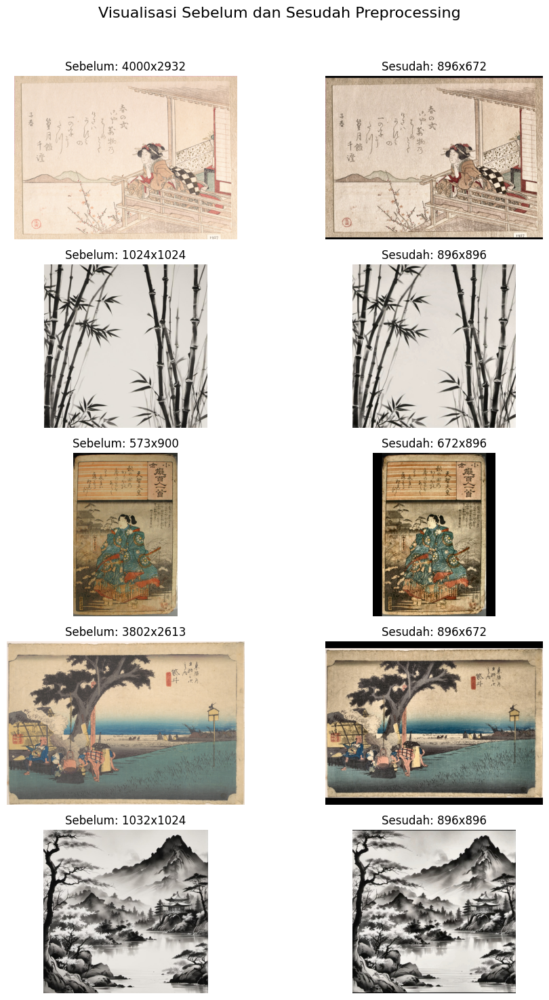

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Folder dataset asli dan hasil preprocessing
input_folder = "/content/Dataset_Positif_Jepang/dataset_positif"
output_folder = "/content/drive/MyDrive/Projek Riset Bu Shintami/Processed_Dataset_Positif_Jepang"

# Ambil 5 gambar acak dari folder input
all_images = [f for f in os.listdir(input_folder) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
selected_images = np.random.choice(all_images, 5, replace=False)  # Pilih 5 gambar acak

# Plot hasil sebelum dan sesudah preprocessing
fig, axes = plt.subplots(5, 2, figsize=(10, 15))

for i, filename in enumerate(selected_images):
    # Path gambar asli dan hasil preprocessing
    original_path = os.path.join(input_folder, filename)
    processed_path = os.path.join(output_folder, filename)

    # Baca gambar asli
    original_image = cv2.imread(original_path)
    original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)  # Konversi ke RGB agar warna benar
    original_size = original_image.shape[:2]  # (height, width)

    # Baca gambar hasil preprocessing
    processed_image = cv2.imread(processed_path)
    processed_image = cv2.cvtColor(processed_image, cv2.COLOR_BGR2RGB)  # Konversi ke RGB agar warna benar
    processed_size = processed_image.shape[:2]  # (height, width)

    # Tampilkan gambar asli
    axes[i, 0].imshow(original_image)
    axes[i, 0].set_title(f"Sebelum: {original_size[1]}x{original_size[0]}")
    axes[i, 0].axis("off")

    # Tampilkan gambar setelah preprocessing
    axes[i, 1].imshow(processed_image)
    axes[i, 1].set_title(f"Sesudah: {processed_size[1]}x{processed_size[0]}")
    axes[i, 1].axis("off")

plt.suptitle("Visualisasi Sebelum dan Sesudah Preprocessing", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Sesuaikan tata letak agar judul tidak tertindih
plt.show()


# Patch Detection


In [ ]:
import os
import cv2
import numpy as np
from tqdm import tqdm
import pandas as pd

# =====================================
# Konfigurasi
# =====================================

WINDOW_SIZE = (224, 224)
STRIDE = 224

COLOR_VARIATION_THRESHOLD = 20
EDGE_THRESHOLD = 1200
PADDING_BLACK_RATIO_THRESHOLD = 0.20

INPUT_FOLDER = "/content/drive/MyDrive/Projek Riset Bu Shintami/Processed_Dataset_Positif_Jepang"
OUTPUT_FOLDER = "/content/drive/MyDrive/Projek Riset Bu Shintami/Hasil_NoPadding/Patches_Dataset_Positif_Jepang"

os.makedirs(OUTPUT_FOLDER, exist_ok=True)

# =====================================
# Validasi Patch
# =====================================

def is_valid_patch(patch):

    gray_patch = cv2.cvtColor(
        patch,
        cv2.COLOR_BGR2GRAY
    )

    # 1. Black Padding Ratio
    black_ratio = np.mean(gray_patch < 10)

    if black_ratio > PADDING_BLACK_RATIO_THRESHOLD:
        return False

    # 2. Color Variation
    std_dev = np.std(gray_patch)

    if std_dev < COLOR_VARIATION_THRESHOLD:
        return False

    # 3. Edge Count
    edge_count = np.sum(
        cv2.Canny(gray_patch,50,150) > 0
    )

    if edge_count < EDGE_THRESHOLD:
        return False

    return True

# =====================================
# Patch Extraction
# =====================================

def extract_patches(image_path):

    image = cv2.imread(image_path)

    if image is None:
        print(f"⚠️ Failed to read {image_path}")
        return 0

    patches_saved = 0

    img_height,img_width = image.shape[:2]

    base_filename = os.path.splitext(
        os.path.basename(image_path)
    )[0]

    for y in range(
        0,
        img_height-WINDOW_SIZE[1]+1,
        STRIDE
    ):

        for x in range(
            0,
            img_width-WINDOW_SIZE[0]+1,
            STRIDE
        ):

            patch=image[
                y:y+WINDOW_SIZE[1],
                x:x+WINDOW_SIZE[0]
            ]

            if is_valid_patch(patch):

                patch_name=(
                    f"{base_filename}_x{x}_y{y}.png"
                )

                cv2.imwrite(
                    os.path.join(
                        OUTPUT_FOLDER,
                        patch_name
                    ),
                    patch
                )

                patches_saved += 1

    return patches_saved

# =====================================
# Cari seluruh gambar
# =====================================

image_paths=[]

for root,dirs,files in os.walk(INPUT_FOLDER):

    dirs[:] = [
        d for d in dirs
        if d != "__MACOSX"
    ]

    for file in files:

        if file.startswith("._"):
            continue

        if file.lower().endswith(
            (".png",".jpg",".jpeg")
        ):

            image_paths.append(
                os.path.join(root,file)
            )

print(f"Total Images : {len(image_paths)}")

# =====================================
# Proses seluruh gambar
# =====================================

patch_statistics = []

MAX_PATCH_PER_IMAGE = 16

total_valid_patches = 0

for img_path in tqdm(
    image_paths,
    desc="🛠️ Extracting Patches",
    unit="image"
):
    valid_patch = extract_patches(img_path)

    invalid_patch = MAX_PATCH_PER_IMAGE - valid_patch

    patch_statistics.append({
        "Image": os.path.basename(img_path),
        "Valid Patch": valid_patch,
        "Invalid Patch": invalid_patch,
        "Valid Ratio": valid_patch / MAX_PATCH_PER_IMAGE,
        "Invalid Ratio": invalid_patch / MAX_PATCH_PER_IMAGE
    })
    total_valid_patches += valid_patch

print()

print(f"Images       : {len(image_paths)}")
print(f"Total Patches: {total_valid_patches}")
print(f"Average      : {total_valid_patches/len(image_paths):.2f}")

# =====================================
# Simpan statistik
# =====================================

patch_df=pd.DataFrame(
    patch_statistics
)

patch_df.to_csv(
    "/content/drive/MyDrive/Projek Riset Bu Shintami/patch_statistics_positif.csv",
    index=False
)

print("✅ Patch statistics saved.")

Total Images : 5290


🛠️ Extracting Patches: 100%|██████████| 5290/5290 [20:01<00:00,  4.40image/s]


Images       : 5290


NameError: name 'total_patches' is not defined

In [ ]:
print(f"Images       : {len(image_paths)}")
print(f"Total Patches: {total_valid_patches}")
print(f"Average      : {total_valid_patches/len(image_paths):.2f}")

Images       : 5290
Total Patches: 55822
Average      : 10.55


In [ ]:
import pandas as pd

patch_df = pd.DataFrame(patch_statistics)

csv_path = "/content/drive/MyDrive/Projek Riset Bu Shintami/patch_statistics_positif.csv"

patch_df.to_csv(
    csv_path,
    index=False
)

print(f"✅ Patch statistics saved to\n{csv_path}")

# # kalo dc
# import pandas as pd

# patch_df = pd.read_csv(
#     "/content/drive/MyDrive/Projek Riset Bu Shintami/patch_statistics_positif.csv"
# )

✅ Patch statistics saved to
/content/drive/MyDrive/Projek Riset Bu Shintami/patch_statistics_positif.csv


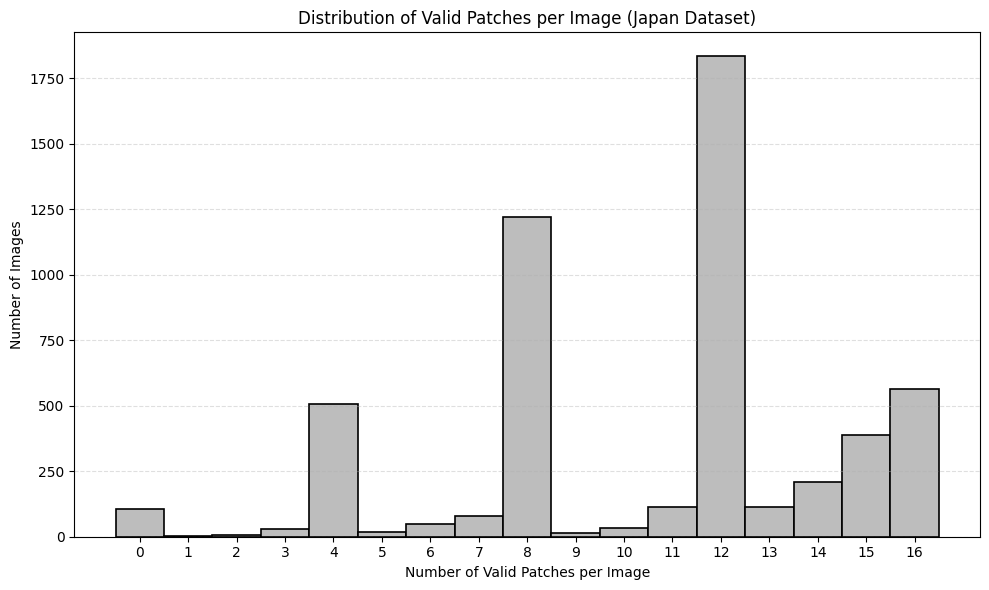

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(10,6))

bins = np.arange(
    patch_df["Valid Patch"].min(),
    patch_df["Valid Patch"].max()+2
)-0.5

plt.hist(
    patch_df["Valid Patch"],
    bins=bins,
    color="#BDBDBD",
    edgecolor="black",
    linewidth=1.2
)

plt.xticks(range(
    patch_df["Valid Patch"].min(),
    patch_df["Valid Patch"].max()+1
))

plt.xlabel("Number of Valid Patches per Image")
plt.ylabel("Number of Images")
plt.title("Distribution of Valid Patches per Image (Japan Dataset)")

plt.grid(axis="y", linestyle="--", alpha=0.4)

plt.tight_layout()

plt.show()

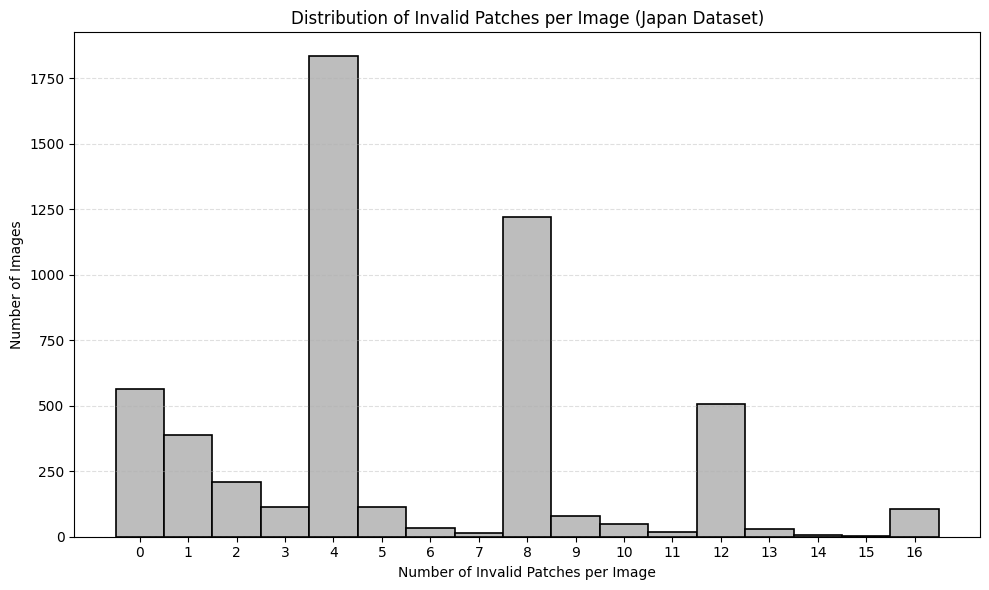

In [ ]:
plt.figure(figsize=(10,6))

bins = np.arange(
    patch_df["Invalid Patch"].min(),
    patch_df["Invalid Patch"].max()+2
)-0.5

plt.hist(
    patch_df["Invalid Patch"],
    bins=bins,
    color="#BDBDBD",
    edgecolor="black",
    linewidth=1.2
)

plt.xticks(range(
    patch_df["Invalid Patch"].min(),
    patch_df["Invalid Patch"].max()+1
))

plt.xlabel("Number of Invalid Patches per Image")
plt.ylabel("Number of Images")
plt.title("Distribution of Invalid Patches per Image (Japan Dataset)")

plt.grid(axis="y", linestyle="--", alpha=0.4)

plt.tight_layout()

plt.show()

In [ ]:
import os

# Definisikan path folder
processed_dataset_folder = "/content/drive/MyDrive/Projek Riset Bu Shintami/Processed_Dataset_Positif_Jepang"
patches_folder = "/content/drive/MyDrive/Projek Riset Bu Shintami/Hasil_NoPadding/Patches_Dataset_Positif_Jepang"

# Cek apakah folder tersedia
processed_dataset_exists = os.path.exists(processed_dataset_folder) and os.path.isdir(processed_dataset_folder)
patches_exists = os.path.exists(patches_folder) and os.path.isdir(patches_folder)  # Tambahkan ini sebelum digunakan

if processed_dataset_exists and patches_exists:
    # Ambil daftar gambar di processed_dataset_positif
    processed_files = [f for f in os.listdir(processed_dataset_folder) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

    # Ambil daftar patch yang sudah diekstrak
    patch_files = []

    for root, dirs, files in os.walk(patches_folder):
        dirs[:] = [d for d in dirs if d != "__MACOSX"]

        for file in files:
            if file.startswith("._"):
                continue
            if file.lower().endswith((".png",".jpg",".jpeg")):
                patch_files.append(file)

    # Hitung jumlah patch per gambar di dataset processed
    patch_count_per_image = {file: 0 for file in processed_files}

    for patch in patch_files:
        for img in processed_files:
            if img.split('.')[0] in patch:  # Cek apakah patch terkait dengan gambar asli
                patch_count_per_image[img] += 1

    # Tampilkan hasil analisis jumlah patch per gambar
    import pandas as pd
    patch_df = pd.DataFrame(list(patch_count_per_image.items()), columns=["Image", "Patch Count"])

    print(patch_df)

    # Cek apakah ada gambar yang tidak menghasilkan patch sama sekali
    no_patch_images = [img for img, count in patch_count_per_image.items() if count == 0]

    if no_patch_images:
        print("Gambar tanpa patch:", no_patch_images[:10])  # Tampilkan 10 gambar pertama yang tidak memiliki patch
else:
    print("Folder processed_dataset_positif atau patches_dataset_positif tidak ditemukan.")


               Image  Patch Count
0      image_583.jpg            0
1      MET-56979.jpg            0
2      image_797.jpg            0
3      MET-78633.jpg            0
4      image_167.jpg            0
...              ...          ...
5285   MET-55097.jpg           16
5286   MET-37036.jpg           12
5287   MET-48989.jpg            0
5288   MET-36972.jpg           12
5289  image_1152.jpg           15

[5290 rows x 2 columns]
Gambar tanpa patch: ['image_583.jpg', 'MET-56979.jpg', 'image_797.jpg', 'MET-78633.jpg', 'image_167.jpg', 'MET-36748.jpg', 'MET-77883.jpg', 'MET-78788.jpg', 'MET-57099.jpg', 'MET-36998.jpg']


In [ ]:
folder_path = "/content/drive/MyDrive/Projek Riset Bu Shintami/Hasil_NoPadding/Patches_Dataset_Positif_Jepang"

file_count = len([file for file in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, file))])

print(f"The folder '{folder_path}' contains {file_count} files.")


The folder 'Hasil_NoPadding/patches_dataset_positif_nopadding' contains 55822 files.


✅ Ditemukan 12 patch untuk MET-53786. Menampilkan...


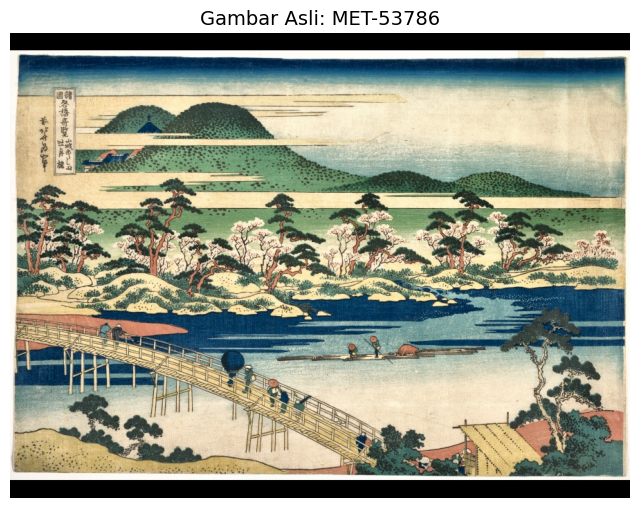

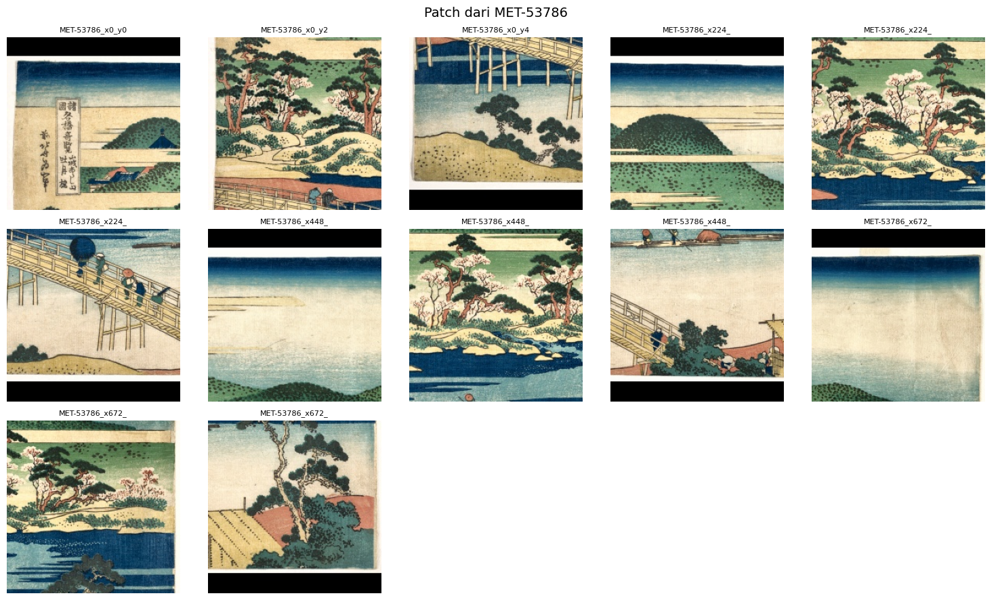

In [ ]:
import os
import cv2
import random
import matplotlib.pyplot as plt

# 🔹 Folder dataset hasil preprocessing
PATCH_FOLDER = "/content/drive/MyDrive/Projek Riset Bu Shintami/Hasil_NoPadding/Patches_Dataset_Positif_Jepang"
INPUT_FOLDER = "/content/drive/MyDrive/Projek Riset Bu Shintami/Processed_Dataset_Positif_Jepang"

# 🔹 Pilih gambar secara acak dari dataset
all_images = [f[:-4] for f in os.listdir(INPUT_FOLDER) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
selected_image = random.choice(all_images)  # Pilih satu gambar secara acak

# 🔹 Ambil semua patch yang terkait dengan gambar ini
patches = [f for f in os.listdir(PATCH_FOLDER) if selected_image in f]

print(f"✅ Ditemukan {len(patches)} patch untuk {selected_image}. Menampilkan...")

# 🔹 Tampilkan gambar asli
original_image_path = os.path.join(INPUT_FOLDER, selected_image + ".jpg")  # Sesuaikan ekstensi jika perlu
original_image = cv2.imread(original_image_path)
original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(8, 8))
plt.imshow(original_image)
plt.title(f"Gambar Asli: {selected_image}", fontsize=14)
plt.axis("off")
plt.show()

# 🔹 Tampilkan patch-patch yang diekstrak
num_patches = len(patches)
cols = 5  # Jumlah kolom dalam grid
rows = (num_patches // cols) + (num_patches % cols > 0)  # Hitung jumlah baris sesuai jumlah patch

fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 3))
fig.suptitle(f"Patch dari {selected_image}", fontsize=14)

for ax, patch_file in zip(axes.flatten(), patches):
    patch_path = os.path.join(PATCH_FOLDER, patch_file)
    patch_img = cv2.imread(patch_path)
    patch_img = cv2.cvtColor(patch_img, cv2.COLOR_BGR2RGB)
    ax.imshow(patch_img)
    ax.set_title(patch_file[:15], fontsize=8)
    ax.axis("off")

# 🔹 Hapus subplot kosong jika jumlah patch kurang dari jumlah grid
for ax in axes.flatten()[num_patches:]:
    ax.axis("off")

plt.tight_layout()
plt.show()


# Feature Extraction

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.models import Model

# ==== Load ResNet50 dan ambil layer penting ====
base_model = ResNet50(weights="imagenet", include_top=False)

# Pilih beberapa layer untuk visualisasi
layer_names = ["conv1_relu", "conv2_block3_out", "conv3_block4_out", "conv4_block6_out", "conv5_block3_out"]
layer_outputs = [base_model.get_layer(name).output for name in layer_names]
model = Model(inputs=base_model.input, outputs=layer_outputs)

# ==== Folder patch ====
PATCH_FOLDER = "/content/drive/MyDrive/Projek Riset Bu Shintami/Hasil_NoPadding/Patches_Dataset_Positif_Jepang"
IMAGE_SIZE = (224, 224)

# Ambil 5 gambar pertama
if os.path.exists(PATCH_FOLDER):
    patch_files = [f for f in os.listdir(PATCH_FOLDER) if f.lower().endswith(('.png', '.jpg', '.jpeg'))][:5]
else:
    patch_files = []

# Dictionary hasil
features_dict = {name: [] for name in layer_names}
image_names = []

# ==== Ekstraksi fitur ====
for patch in patch_files:
    patch_path = os.path.join(PATCH_FOLDER, patch)
    image = cv2.imread(patch_path)
    if image is None:
        print(f"⚠️ Gagal membaca gambar: {patch}")
        continue

    image_resized = cv2.resize(image, IMAGE_SIZE)
    input_tensor = np.expand_dims(image_resized, axis=0)
    input_tensor = preprocess_input(input_tensor)

    feature_maps = model.predict(input_tensor)

    for i, name in enumerate(layer_names):
        features_dict[name].append(feature_maps[i][0])  # Tanpa batch dimensi

    image_names.append(patch)

# ==== Visualisasi ====
for i, patch in enumerate(image_names):
    fig, axes = plt.subplots(1, 6, figsize=(22, 5))

    # Tampilkan gambar asli
    original_image = cv2.imread(os.path.join(PATCH_FOLDER, patch))
    original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
    axes[0].imshow(original_image)
    axes[0].set_title("Original Image")
    axes[0].axis("off")

    # Tampilkan feature maps dari setiap layer
    for j, name in enumerate(layer_names):
        fmap = np.mean(features_dict[name][i], axis=-1)  # Rata-rata channel
        axes[j + 1].imshow(fmap, cmap="viridis")
        axes[j + 1].set_title(name)
        axes[j + 1].axis("off")

    plt.tight_layout()
    plt.show()


Exception ignored in: <function _xla_gc_callback at 0x7fc362cb1bc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/jax/_src/lib/__init__.py", line 127, in _xla_gc_callback
KeyboardInterrupt: 
ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "/tmp/ipykernel_1457/2970030904.py", line 5, in <cell line: 0>
    from tensorflow.keras.applications import ResNet50
  File "/usr/local/lib/python3.12/dist-packages/tensorflow/__init__.py", line 468, in <module>
    importlib.import_module("keras.src.optimizers")
  File "/usr/lib/python3.12/importlib/__init__.py", line 90, in import_module
    return _bootstrap._gcd_import(name[level:], package, level)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/keras/__init__.py", line 7, in <module>
    from keras import _tf_keras as _tf_keras
  File "/usr/local/lib/python3.12/dist-packages/keras/_tf_keras/__init__.py", line 1, in <module>
    from keras._tf_keras import keras
  File "/usr/local/lib/python3.12/dist-packages/keras/_tf_

TypeError: object of type 'NoneType' has no len()

In [ ]:
import shutil
import os
import time

drive_patch_folder = "/content/drive/MyDrive/Projek Riset Bu Shintami/Patches_Dataset_Negatif_Cina"

local_patch_folder = "/content/Patches_Dataset_Negatif_Cina"

# Hapus folder lama jika ada
if os.path.exists(local_patch_folder):
    shutil.rmtree(local_patch_folder)

print("📦 Copying patches from Google Drive to local storage...")

start = time.time()

shutil.copytree(
    drive_patch_folder,
    local_patch_folder
)

print(f"✅ Finished in {time.time()-start:.2f} seconds")

In [ ]:
import os

count = 0

for _, _, files in os.walk("/content/Patches_Dataset_Negatif_Cina"):
    count += len(files)

print(count)

5643


In [ ]:
import os
import cv2
import numpy as np
import joblib
from tqdm import tqdm
from sklearn.decomposition import PCA
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D

# === Konfigurasi ===
IMAGE_SIZE = (224, 224)
# PATCH_SIZE = 224
# STRIDE = 224
# COLOR_STD_THRESHOLD = 20
# EDGE_THRESHOLD = 1200
BATCH_SIZE = 1024
N_COMPONENTS_PCA = 1024

# === Load model ResNet50 + GAP ===
base_model = ResNet50(weights="imagenet", include_top=False)
gap = GlobalAveragePooling2D()(base_model.output)
model = Model(inputs=base_model.input, outputs=gap)

positive_folder = "/content/drive/MyDrive/Projek Riset Bu Shintami/Hasil_NoPadding/Patches_Dataset_Positif_Jepang"
negative_folder = "/content/drive/MyDrive/Projek Riset Bu Shintami/Patches_Dataset_Negatif_Cina"
SAVE_FOLDER = "/content/drive/MyDrive/Projek Riset Bu Shintami/Hasil_NoPadding"

os.makedirs(SAVE_FOLDER, exist_ok=True)

# # === Load PCA yang sudah dilatih ===
# pca_model = joblib.load(
#     os.path.join(
#         SAVE_FOLDER,
#         "pca_1024_nopadding.pkl"
#     )
# )

# print("✅ PCA model berhasil dimuat.")

# === Fungsi patching ===
def get_patch_files(folder):
    patch_files = []
    for root, dirs, files in os.walk(folder):
        # Abaikan folder metadata Mac
        dirs[:] = [d for d in dirs if d != "__MACOSX"]

        for file in files:
            # Abaikan file metadata Mac
            if file.startswith("._"):
                continue
            if file.lower().endswith((".png", ".jpg", ".jpeg")):
                patch_files.append(
                    os.path.join(root, file)
                )
    return sorted(patch_files)

# def is_valid_patch(patch):
#     gray = cv2.cvtColor(patch, cv2.COLOR_RGB2GRAY)
#     std = np.std(gray)
#     edge = np.sum(cv2.Canny(gray, 50, 150) > 0)
#     return std >= COLOR_STD_THRESHOLD and edge >= EDGE_THRESHOLD

def extract_features(folder_path):
    patch_files = get_patch_files(folder_path)
    print(f"Found {len(patch_files)} patches")

    all_features = []
    all_names = []
    batch_images = []
    batch_names = []

    for idx, patch_path in enumerate(
        tqdm(
            patch_files,
            desc="Extracting Features",
            unit="patch"
        )
    ):
        image = cv2.imread(patch_path)

        if image is None:
            continue

        image = cv2.cvtColor(
            image,
            cv2.COLOR_BGR2RGB
        )
        image = cv2.resize(
            image,
            IMAGE_SIZE
        )
        image = preprocess_input(image)
        batch_images.append(image)
        batch_names.append(
            os.path.basename(patch_path)
        )
        if (
            len(batch_images) == BATCH_SIZE
            or
            idx == len(patch_files)-1
        ):
            batch_np = np.array(batch_images)
            features = model.predict(
                batch_np,
                verbose=0
            )
            all_features.extend(features)
            all_names.extend(batch_names)
            batch_images = []
            batch_names = []
    return np.array(all_features), all_names

# === Langkah 1: Ekstraksi + fit PCA dari dataset POSITIF ===
positive_folder = "/content/drive/MyDrive/Projek Riset Bu Shintami/Hasil_NoPadding/Patches_Dataset_Positif_Jepang"
features_pos, names_pos = extract_features(positive_folder)

print("🔧 Melatih PCA dari dataset positif...")
pca_model = PCA(n_components=N_COMPONENTS_PCA, random_state=42)
features_pos_pca = pca_model.fit_transform(features_pos)
joblib.dump(
    pca_model,
    os.path.join(
        SAVE_FOLDER,
        "pca_1024_nopadding.pkl"
    )
)
print("✅ PCA disimpan ke Hasil_NoPadding/pca_1024_nopadding.pkl")

joblib.dump(
    {
        "features": features_pos_pca,
        "image_names": names_pos
    },
    os.path.join(
        SAVE_FOLDER,
        "extracted_features_positif_resnet_pca_nopadding.pkl"
    )
)
print("✅ Fitur positif disimpan.")

# === Langkah 2: Ekstraksi + transform PCA dari dataset NEGATIF ===
negative_folder = "/content/Patches_Dataset_Negatif_Cina"
features_neg, names_neg = extract_features(negative_folder)
features_neg_pca = pca_model.transform(features_neg)

print(f"Feature shape sebelum PCA : {features_neg.shape}")
print(f"Feature shape sesudah PCA : {features_neg_pca.shape}")

joblib.dump(
    {
        "features": features_neg_pca,
        "image_names": names_neg
    },
    os.path.join(
        SAVE_FOLDER,
        "extracted_features_negatif_resnet_pca_nopadding.pkl"
    )
)
print("✅ Fitur negatif disimpan.")


Found 35053 patches


Extracting Features:  49%|████▉     | 17157/35053 [3:24:55<4:01:26,  1.24patch/s]

In [ ]:
import joblib

# Load hasil ekstraksi fitur
data = joblib.load("Hasil_NoPadding/extracted_features_positif_resnet_pca_nopadding.pkl")

# Cek struktur data
print("Keys dalam data:", data.keys())
print("Jumlah fitur:", len(data["features"]))
print("Dimensi fitur:", data["features"].shape)
print("Contoh nama file gambar:", data["image_names"][:5])


Keys dalam data: dict_keys(['features', 'image_names'])
Jumlah fitur: 55822
Dimensi fitur: (55822, 1024)
Contoh nama file gambar: ['MET-812250_x448_y448.png', 'MET-812250_x672_y0.png', 'MET-812250_x672_y224.png', 'MET-812250_x672_y448.png', 'MET-816214_x0_y0.png']


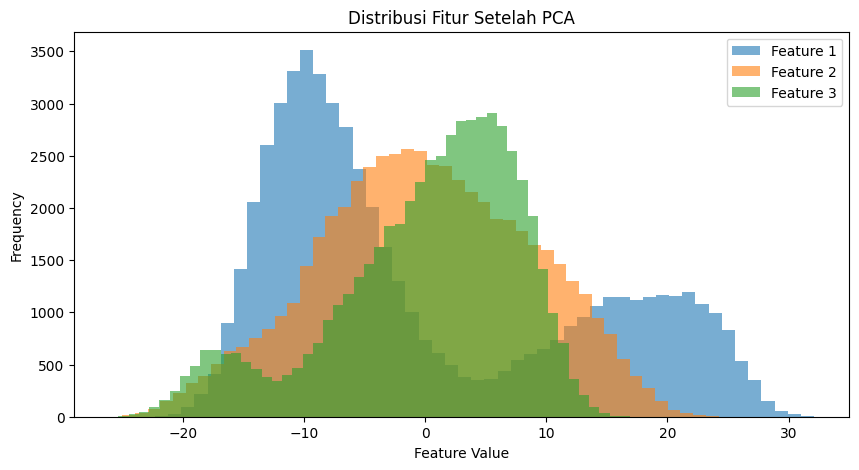

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Ambil fitur
features = data["features"]

# Plot histogram dari beberapa dimensi fitur
plt.figure(figsize=(10,5))
plt.hist(features[:, 0], bins=50, alpha=0.6, label="Feature 1")
plt.hist(features[:, 1], bins=50, alpha=0.6, label="Feature 2")
plt.hist(features[:, 2], bins=50, alpha=0.6, label="Feature 3")
plt.xlabel("Feature Value")
plt.ylabel("Frequency")
plt.title("Distribusi Fitur Setelah PCA")
plt.legend()
plt.show()


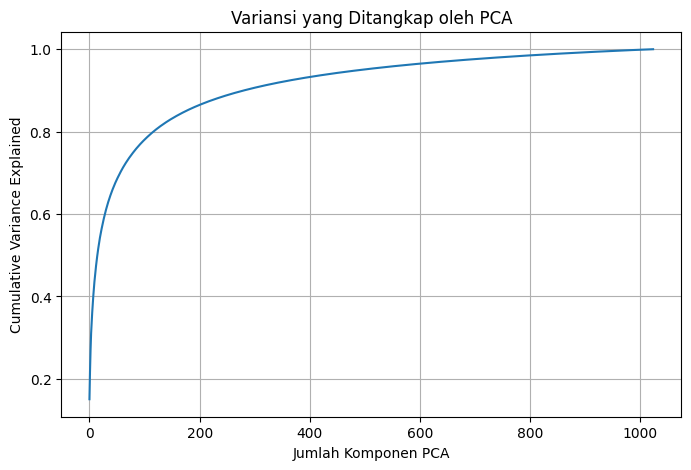

In [ ]:
import numpy as np

# Cek variansi yang ditangkap oleh PCA
explained_variance = np.var(features, axis=0)
explained_variance_ratio = explained_variance / np.sum(explained_variance)

# Plot variansi
plt.figure(figsize=(8,5))
plt.plot(np.cumsum(explained_variance_ratio))
plt.xlabel("Jumlah Komponen PCA")
plt.ylabel("Cumulative Variance Explained")
plt.title("Variansi yang Ditangkap oleh PCA")
plt.grid()
plt.show()


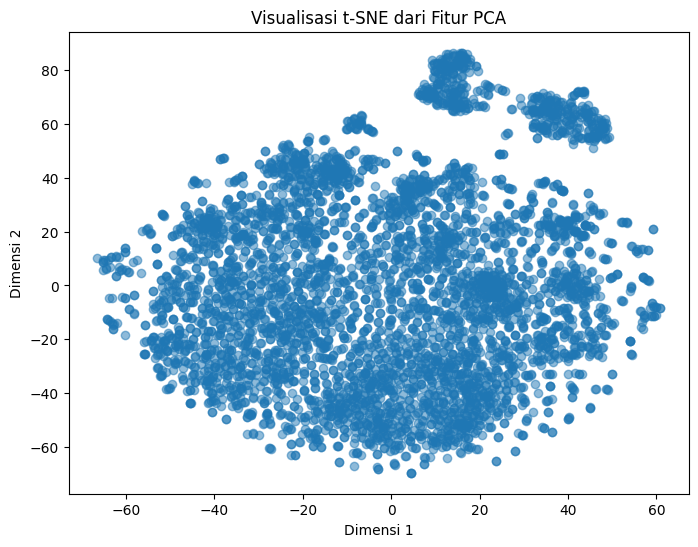

In [ ]:
from sklearn.manifold import TSNE

# Gunakan t-SNE untuk mereduksi dimensi ke 2D agar bisa divisualisasikan
tsne = TSNE(n_components=2, random_state=42)
features_2d = tsne.fit_transform(features[:5000])  # Ambil subset 5000 contoh untuk mempercepat

# Plot hasil t-SNE
plt.figure(figsize=(8,6))
plt.scatter(features_2d[:, 0], features_2d[:, 1], alpha=0.5)
plt.xlabel("Dimensi 1")
plt.ylabel("Dimensi 2")
plt.title("Visualisasi t-SNE dari Fitur PCA")
plt.show()


In [ ]:
import joblib

# Load hasil ekstraksi fitur
data = joblib.load("Hasil_NoPadding/extracted_features_negatif_resnet_pca_nopadding.pkl")

# Cek struktur data
print("Keys dalam data:", data.keys())
print("Jumlah fitur:", len(data["features"]))
print("Dimensi fitur:", data["features"].shape)
print("Contoh nama file gambar:", data["image_names"][:5])


Keys dalam data: dict_keys(['features', 'image_names'])
Jumlah fitur: 74779
Dimensi fitur: (74779, 1024)
Contoh nama file gambar: ['yuan_ti_hua_97_x224_y448.png', 'yuan_ti_hua_97_x224_y672.png', 'yuan_ti_hua_97_x448_y0.png', 'yuan_ti_hua_97_x448_y224.png', 'yuan_ti_hua_97_x448_y448.png']


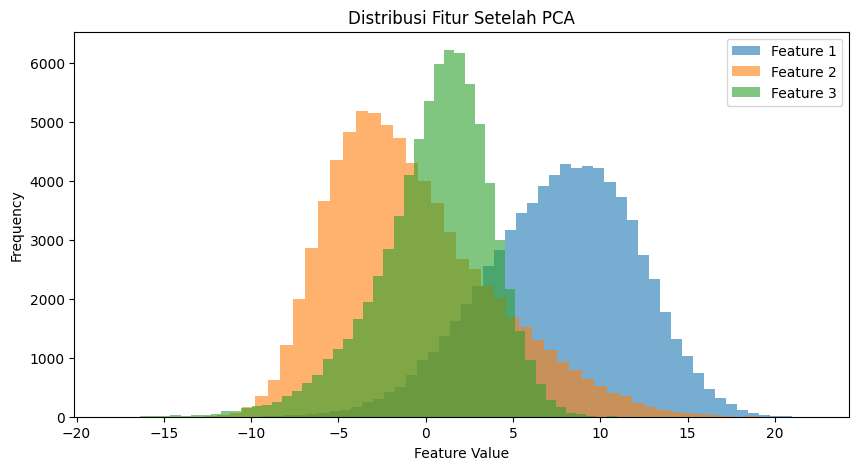

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Ambil fitur
features = data["features"]

# Plot histogram dari beberapa dimensi fitur
plt.figure(figsize=(10,5))
plt.hist(features[:, 0], bins=50, alpha=0.6, label="Feature 1")
plt.hist(features[:, 1], bins=50, alpha=0.6, label="Feature 2")
plt.hist(features[:, 2], bins=50, alpha=0.6, label="Feature 3")
plt.xlabel("Feature Value")
plt.ylabel("Frequency")
plt.title("Distribusi Fitur Setelah PCA")
plt.legend()
plt.show()


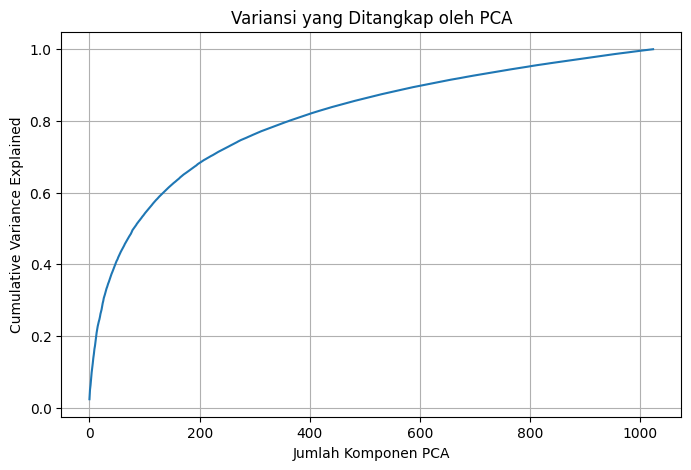

In [ ]:
import numpy as np

# Cek variansi yang ditangkap oleh PCA
explained_variance = np.var(features, axis=0)
explained_variance_ratio = explained_variance / np.sum(explained_variance)

# Plot variansi
plt.figure(figsize=(8,5))
plt.plot(np.cumsum(explained_variance_ratio))
plt.xlabel("Jumlah Komponen PCA")
plt.ylabel("Cumulative Variance Explained")
plt.title("Variansi yang Ditangkap oleh PCA")
plt.grid()
plt.show()


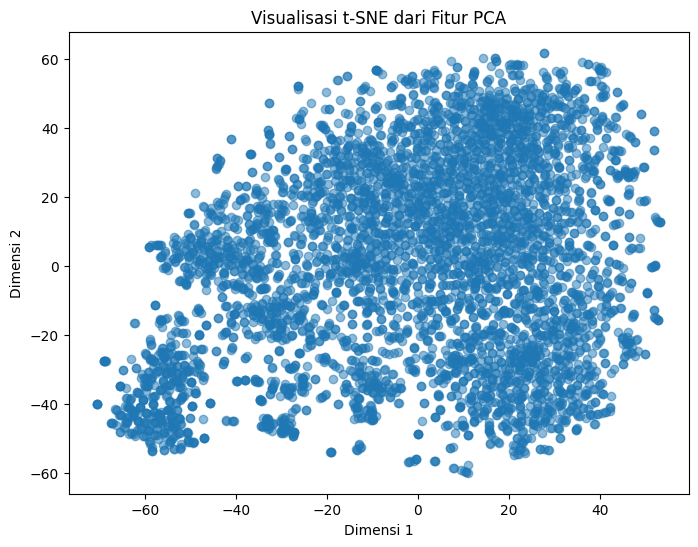

In [ ]:
from sklearn.manifold import TSNE

# Gunakan t-SNE untuk mereduksi dimensi ke 2D agar bisa divisualisasikan
tsne = TSNE(n_components=2, random_state=42)
features_2d = tsne.fit_transform(features[:5000])  # Ambil subset 5000 contoh untuk mempercepat

# Plot hasil t-SNE
plt.figure(figsize=(8,6))
plt.scatter(features_2d[:, 0], features_2d[:, 1], alpha=0.5)
plt.xlabel("Dimensi 1")
plt.ylabel("Dimensi 2")
plt.title("Visualisasi t-SNE dari Fitur PCA")
plt.show()


# Discriminative Clustering

In [ ]:
import numpy as np
import joblib
import os
import time
import umap
import warnings
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm
from sklearn.preprocessing import normalize, StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score

# Menekan warning deprecated
warnings.filterwarnings("ignore", category=FutureWarning)

def optimize_umap(features, n_neighbors=12, min_dist=0.0, n_components=100):
    print(f"\U0001F539 Running Optimized UMAP with n_neighbors={n_neighbors}, min_dist={min_dist}, n_components={n_components}...")
    reducer = umap.UMAP(
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        n_components=n_components,
        metric="cosine",
        random_state=42
    )
    return reducer.fit_transform(features)

def cosine_kmeans(features, n_clusters):
    print(f"\U0001F539 Running Cosine K-Means with {n_clusters} clusters...")
    features = normalize(features, norm="l2")  # Normalisasi sebelum clustering
    kmeans = KMeans(n_clusters=n_clusters, n_init=50, max_iter=500, random_state=42, init='k-means++')
    kmeans.fit(features)
    return kmeans.labels_

def evaluate_kmeans(features, n_clusters_range):
    best_score, best_k, best_labels = -1, None, None
    results = []

    for k in tqdm(n_clusters_range, desc="Evaluating K-Means"):
        cluster_labels = cosine_kmeans(features, k)
        sil_score = silhouette_score(features, cluster_labels, metric="cosine")
        results.append({'k': k, 'silhouette': sil_score})

        if sil_score > best_score:
            best_score, best_k, best_labels = sil_score, k, cluster_labels

    print("\n\U0001F539 Top 3 K values for Cosine K-Means:")
    for res in sorted(results, key=lambda x: x["silhouette"], reverse=True)[:3]:
        print(f"K={res['k']}: Silhouette={res['silhouette']:.3f}")

    return best_k, best_labels

def compare_features(original_features, reloaded_features, name="features"):
    if np.allclose(original_features, reloaded_features, atol=1e-6):
        print(f"✅ {name} sebelum dan sesudah penyimpanan identik!")
    else:
        print(f"⚠️ WARNING: {name} berubah setelah dimuat ulang dari pkl!")

def main():
    start_time = time.time()
    output_dir = "Hasil_NoPadding"
    os.makedirs(output_dir, exist_ok=True)

    print("\U0001F539 Loading dataset features...")
    data_positive = joblib.load("Hasil_NoPadding/extracted_features_positif_resnet_pca_nopadding.pkl")
    data_negative = joblib.load("Hasil_NoPadding/extracted_features_negatif_resnet_pca_nopadding.pkl")

    features_positive = np.array(data_positive["features"])
    features_negative = np.array(data_negative["features"])

    # **Ambil nama gambar jika tersedia dalam dataset**
    image_names_positive = data_positive.get("image_names", [])
    image_names_negative = data_negative.get("image_names", [])

    # **Gabungkan fitur dan nama gambar**
    print("\U0001F539 Combining and preparing features...")
    features = np.vstack([features_positive, features_negative])
    labels = np.concatenate([np.ones(len(features_positive)), np.zeros(len(features_negative))])
    image_names = image_names_positive + image_names_negative

    print("\U0001F539 Applying StandardScaler and L2 normalization...")
    features = StandardScaler().fit_transform(features)
    features = normalize(features, norm="l2")

    # **🔹 Cek atau buat PCA pertama (2048 → 1024)**
    PCA_1024_PATH = os.path.join(output_dir, "pca_1024.pkl")
    if os.path.exists(PCA_1024_PATH):
        print("✅ PCA_1024 found. Loading existing model...")
        pca_1024 = joblib.load(PCA_1024_PATH)
    else:
        print("🔄 Computing PCA (2048 → 1024)...")
        pca_1024 = PCA(n_components=1024, random_state=42)
        features_1024 = pca_1024.fit_transform(features)
        joblib.dump(pca_1024, PCA_1024_PATH)
        print(f"✅ PCA_1024 model saved at {PCA_1024_PATH}")

    # **Gunakan PCA 1024 untuk mendapatkan fitur**
    features_1024 = pca_1024.transform(features)

    # **🔹 Jalankan UMAP (1024 → 100) untuk clustering**
    features_umap_100 = optimize_umap(features_1024, n_neighbors=10, min_dist=0.0, n_components=100)

    print("\U0001F539 Running Cosine K-Means...")
    best_k, cluster_labels = evaluate_kmeans(features_umap_100, range(2, 10))
    print(f"✅ Optimal K found: {best_k}")

    # **🔹 Compute centroids menggunakan fitur 1024**
    print("\U0001F539 Computing final centroids using 1024D features...")
    centroids_1024 = []
    for i in range(best_k):
        cluster_members = features_1024[cluster_labels == i]
        centroid = np.mean(cluster_members, axis=0)
        centroids_1024.append(centroid)

    centroids_1024 = np.array(centroids_1024)

    # Debugging: Pastikan centroids benar-benar 1024D
    print(f"✅ Centroids shape (should be K x 1024): {centroids_1024.shape}")

    # **🔹 Simpan data clustering dengan fitur 1024 untuk centroid**
    clustering_data = {
        "features_1024": features_1024,
        "labels": labels,
        "cluster_labels": cluster_labels,
        "centroids": centroids_1024,
        "image_names": image_names
    }

    joblib.dump(clustering_data, os.path.join(output_dir, "discriminative_clustering_nopadding.pkl"))
    print("✅ Clustering data saved with centroids in 1024D!")

    # **Cek apakah data tersimpan dengan benar**
    loaded_data = joblib.load(os.path.join(output_dir, "discriminative_clustering_nopadding.pkl"))
    compare_features(features_1024, loaded_data["features_1024"], "features_1024")

    if "image_names" in loaded_data:
        print(f"✅ Image names successfully saved! ({len(loaded_data['image_names'])} images)")
    else:
        print("⚠️ WARNING: Image names were NOT saved properly!")

    print(f"✅ Discriminative Clustering complete! Total execution time: {time.time() - start_time:.2f}s")

if __name__ == "__main__":
    main()


🔹 Loading dataset features...
🔹 Combining and preparing features...
🔹 Applying StandardScaler and L2 normalization...
🔄 Computing PCA (2048 → 1024)...
✅ PCA_1024 model saved at Hasil_NoPadding/pca_1024.pkl
🔹 Running Optimized UMAP with n_neighbors=10, min_dist=0.0, n_components=100...


/Users/keysaanadea/Library/Python/3.9/lib/python/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


🔹 Running Cosine K-Means...


Evaluating K-Means:   0%|          | 0/8 [00:00<?, ?it/s]

🔹 Running Cosine K-Means with 2 clusters...


Evaluating K-Means:  12%|█▎        | 1/8 [01:56<13:36, 116.67s/it]

🔹 Running Cosine K-Means with 3 clusters...


Evaluating K-Means:  25%|██▌       | 2/8 [03:49<11:27, 114.59s/it]

🔹 Running Cosine K-Means with 4 clusters...


Evaluating K-Means:  38%|███▊      | 3/8 [05:44<09:32, 114.58s/it]

🔹 Running Cosine K-Means with 5 clusters...


Evaluating K-Means:  50%|█████     | 4/8 [07:42<07:43, 115.90s/it]

🔹 Running Cosine K-Means with 6 clusters...


Evaluating K-Means:  62%|██████▎   | 5/8 [09:41<05:50, 116.98s/it]

🔹 Running Cosine K-Means with 7 clusters...


Evaluating K-Means:  75%|███████▌  | 6/8 [11:46<03:59, 119.65s/it]

🔹 Running Cosine K-Means with 8 clusters...


Evaluating K-Means:  88%|████████▊ | 7/8 [13:47<02:00, 120.14s/it]

🔹 Running Cosine K-Means with 9 clusters...


Evaluating K-Means: 100%|██████████| 8/8 [15:49<00:00, 118.63s/it]



🔹 Top 3 K values for Cosine K-Means:
K=5: Silhouette=0.940
K=4: Silhouette=0.902
K=3: Silhouette=0.879
✅ Optimal K found: 5
🔹 Computing final centroids using 1024D features...
✅ Centroids shape (should be K x 1024): (5, 1024)
✅ Clustering data saved with centroids in 1024D!
✅ features_1024 sebelum dan sesudah penyimpanan identik!
✅ Image names successfully saved! (130601 images)
✅ Discriminative Clustering complete! Total execution time: 1253.57s


Struktur data clustering: ['features_1024', 'labels', 'cluster_labels', 'centroids', 'image_names']
✅ Data clustering sebelum filtering berhasil dimuat!
  - Jumlah features: 130601
  - Jumlah cluster_labels: 130601
  - Jumlah labels: 130601
  - Jumlah cluster unik: 5
  - Distribusi label: Negatif/China=74779, Positif/Jepang=55822

🔹 Ringkasan Cluster:
Cluster 0: Total=6531, Jepang=6531, China=0
Cluster 1: Total=37234, Jepang=37222, China=12
Cluster 2: Total=69761, Jepang=20, China=69741
Cluster 3: Total=12046, Jepang=12046, China=0
Cluster 4: Total=5029, Jepang=3, China=5026


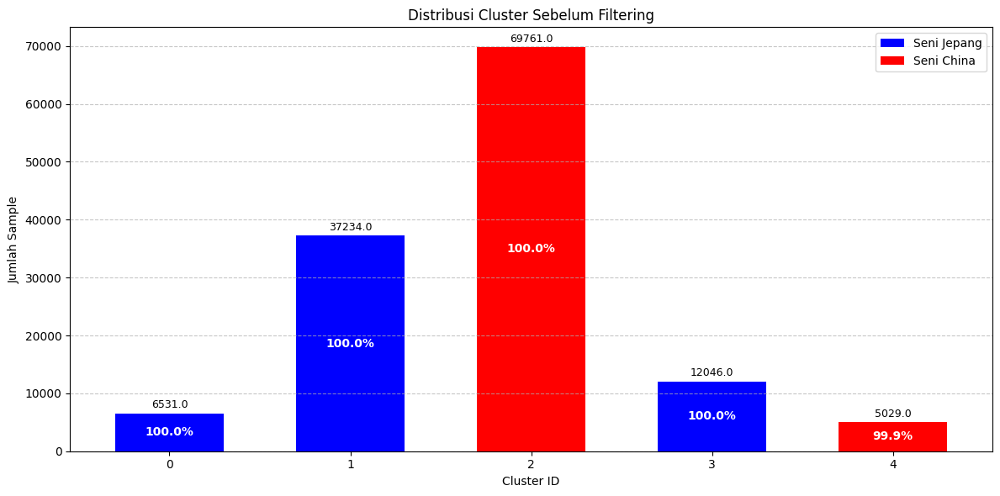


🔹 **Detail Komposisi Setiap Cluster:**
Cluster 0:
  - Total: 6531 fitur
  - Seni Jepang: 6531 fitur (100.00%)
  - Seni China: 0 fitur (0.00%)
  - Mayoritas: Seni Jepang (100.00%)

Cluster 1:
  - Total: 37234 fitur
  - Seni Jepang: 37222 fitur (99.97%)
  - Seni China: 12 fitur (0.03%)
  - Mayoritas: Seni Jepang (99.97%)

Cluster 2:
  - Total: 69761 fitur
  - Seni Jepang: 20 fitur (0.03%)
  - Seni China: 69741 fitur (99.97%)
  - Mayoritas: Seni China (99.97%)

Cluster 3:
  - Total: 12046 fitur
  - Seni Jepang: 12046 fitur (100.00%)
  - Seni China: 0 fitur (0.00%)
  - Mayoritas: Seni Jepang (100.00%)

Cluster 4:
  - Total: 5029 fitur
  - Seni Jepang: 3 fitur (0.06%)
  - Seni China: 5026 fitur (99.94%)
  - Mayoritas: Seni China (99.94%)



In [ ]:
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def load_clustering_results():
    """Memuat hasil clustering sebelum filtering dari file .pkl"""
    try:
        clustering_data = joblib.load("Hasil_NoPadding/discriminative_clustering_nopadding.pkl")

        # Cetak struktur data untuk debugging
        print("Struktur data clustering:", list(clustering_data.keys()))

        features_umap = clustering_data["features_1024"]
        cluster_labels = clustering_data["cluster_labels"]

        # Gunakan 'original_labels' bukan 'labels'
        if "labels" in clustering_data:
            labels = clustering_data["labels"]
        else:
            print("⚠️ PERINGATAN: Kunci 'labels' tidak ditemukan, mencoba dengan 'labels'...")
            if "labels" in clustering_data:
                labels = clustering_data["labels"]
            else:
                # Jika tidak ada kedua kunci tersebut, buat label dummy
                print("⚠️ PERINGATAN: Tidak dapat menemukan label asli, membuat label dummy...")
                # Asumsikan negatif/China (0) ada di awal, positif/Jepang (1) ada di akhir
                # Lihat distribusi cluster untuk menentukan pola yang tepat
                unique_clusters = np.unique(cluster_labels)
                labels = np.zeros(len(cluster_labels))
                for cluster in unique_clusters:
                    indices = np.where(cluster_labels == cluster)[0]
                    # Ini hanya asumsi, perlu disesuaikan
                    if cluster > 0:  # Contoh sederhana: cluster > 0 dianggap positif
                        labels[indices] = 1

        print("✅ Data clustering sebelum filtering berhasil dimuat!")
        print(f"  - Jumlah features: {len(features_umap)}")
        print(f"  - Jumlah cluster_labels: {len(cluster_labels)}")
        print(f"  - Jumlah labels: {len(labels)}")
        print(f"  - Jumlah cluster unik: {len(np.unique(cluster_labels))}")
        print(f"  - Distribusi label: Negatif/China={np.sum(labels==0)}, Positif/Jepang={np.sum(labels==1)}")

        return features_umap, cluster_labels, labels
    except FileNotFoundError:
        print("❌ ERROR: File clustering sebelum filtering tidak ditemukan!")
        return None, None, None
    except Exception as e:
        print(f"❌ ERROR: Terjadi kesalahan saat memuat data: {str(e)}")
        return None, None, None

def visualize_cluster_distribution(cluster_labels, labels, title):
    """Visualisasi distribusi jumlah sampel per cluster dengan batang stacked (bertumpuk)"""
    unique_clusters = np.unique(cluster_labels)
    cluster_summary = {}

    # Pastikan labels dan cluster_labels memiliki ukuran yang sama
    assert len(cluster_labels) == len(labels), "Ukuran cluster_labels dan labels tidak sama"

    for cluster in unique_clusters:
        indices = np.where(cluster_labels == cluster)[0]
        count_japan = np.sum(labels[indices] == 1)  # Seni Jepang
        count_china = np.sum(labels[indices] == 0)  # Seni China
        total = count_japan + count_china

        if total > 0:
            perc_japan = (count_japan / total) * 100
            perc_china = (count_china / total) * 100
        else:
            perc_japan, perc_china = 0, 0

        cluster_summary[cluster] = {
            "seni_jepang": count_japan,
            "seni_china": count_china,
            "total": total,
            "persentase_jepang": perc_japan,
            "persentase_china": perc_china
        }

    # Print ringkasan untuk debugging
    print("\n🔹 Ringkasan Cluster:")
    for cluster, stats in cluster_summary.items():
        print(f"Cluster {cluster}: Total={stats['total']}, Jepang={stats['seni_jepang']}, China={stats['seni_china']}")

    # Konversi ke DataFrame
    df_clusters = pd.DataFrame.from_dict(cluster_summary, orient='index')

    # **Plot batang bertumpuk (stacked bar chart)**
    fig, ax = plt.subplots(figsize=(12, 6))

    df_clusters[["seni_jepang", "seni_china"]].plot(kind='bar', stacked=True,
                                                   color=["blue", "red"], ax=ax, width=0.6)

    # **Label dan Layout**
    ax.set_xlabel("Cluster ID")
    ax.set_ylabel("Jumlah Sample")
    ax.set_title(title)
    ax.legend(["Seni Jepang", "Seni China"])
    ax.grid(axis='y', linestyle='--', alpha=0.7)

    # **Tambahkan angka di atas atau di dalam batang**
    for i, row in df_clusters.iterrows():
        # Hanya tampilkan persentase jika jumlahnya cukup untuk teks yang terlihat
        if row["seni_jepang"] > 100:
            ax.text(i, row["seni_jepang"] / 2, f"{row['persentase_jepang']:.1f}%",
                   ha="center", va="center", color="white", fontsize=10, fontweight="bold")

        if row["seni_china"] > 100:
            ax.text(i, row["seni_jepang"] + row["seni_china"] / 2, f"{row['persentase_china']:.1f}%",
                   ha="center", va="center", color="white", fontsize=10, fontweight="bold")

        # Tambahkan jumlah total di atas batang
        ax.text(i, row["total"] + 500, f"{row['total']}",
               ha="center", va="bottom", color="black", fontsize=9)

    # **Tampilkan Grafik**
    plt.xticks(rotation=0)
    plt.tight_layout()
    plt.savefig('cluster_distribution.png', dpi=300, bbox_inches='tight')
    plt.show()

    # **Print detail setiap cluster**
    print("\n🔹 **Detail Komposisi Setiap Cluster:**")
    for cluster, stats in cluster_summary.items():
        majority = "Seni Jepang" if stats['persentase_jepang'] > stats['persentase_china'] else "Seni China"
        majority_perc = max(stats['persentase_jepang'], stats['persentase_china'])

        print(f"Cluster {cluster}:")
        print(f"  - Total: {stats['total']} fitur")
        print(f"  - Seni Jepang: {stats['seni_jepang']} fitur ({stats['persentase_jepang']:.2f}%)")
        print(f"  - Seni China: {stats['seni_china']} fitur ({stats['persentase_china']:.2f}%)")
        print(f"  - Mayoritas: {majority} ({majority_perc:.2f}%)\n")

def main():
    """Fungsi utama untuk memuat data dan menampilkan visualisasi hasil clustering sebelum filtering."""
    features_umap, cluster_labels, labels = load_clustering_results()

    if features_umap is None or cluster_labels is None or labels is None:
        print("❌ Tidak dapat melanjutkan visualisasi karena data tidak tersedia.")
        return

    visualize_cluster_distribution(cluster_labels, labels, "Distribusi Cluster Sebelum Filtering")

if __name__ == "__main__":
    main()

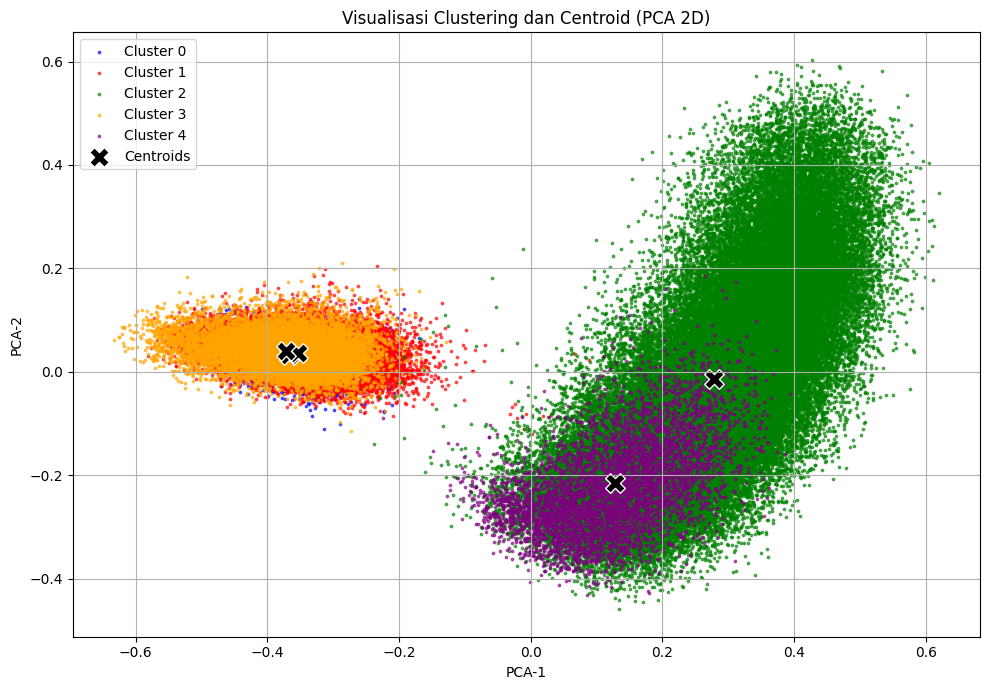

In [ ]:
import joblib
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# === Load hasil clustering ===
clustering = joblib.load("Hasil_NoPadding/discriminative_clustering_nopadding.pkl")
features = clustering["features_1024"]
cluster_labels = clustering["cluster_labels"]
centroids = clustering["centroids"]

# === Proyeksi ke 2D untuk visualisasi
pca_2d = PCA(n_components=2)
features_2d = pca_2d.fit_transform(features)
centroids_2d = pca_2d.transform(centroids)

# === Plotting
plt.figure(figsize=(10, 7))
colors = ['blue', 'red', 'green', 'orange', 'purple']
for cluster_id in np.unique(cluster_labels):
    idx = np.where(cluster_labels == cluster_id)[0]
    plt.scatter(features_2d[idx, 0], features_2d[idx, 1],
                s=3, label=f'Cluster {cluster_id}', alpha=0.6, color=colors[cluster_id])

# Tambahkan centroid
plt.scatter(centroids_2d[:, 0], centroids_2d[:, 1],
            color='black', marker='X', s=200, edgecolor='white', label='Centroids')

plt.title("Visualisasi Clustering dan Centroid (PCA 2D)")
plt.xlabel("PCA-1")
plt.ylabel("PCA-2")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


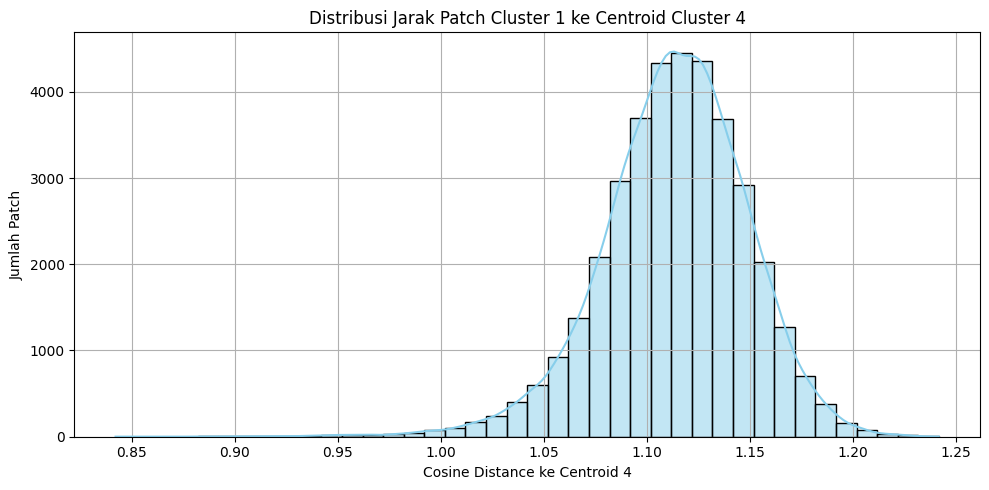

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from joblib import load
from sklearn.metrics.pairwise import cosine_distances

# === Load clustering data ===
clustering = load("Hasil_NoPadding/discriminative_clustering_nopadding.pkl")
features = clustering["features_1024"]
cluster_labels = clustering["cluster_labels"]
centroids = clustering["centroids"]

# === Konfigurasi cluster yang ingin dibandingkan ===
CLUSTER_A = 1  # Misal cluster 1
CLUSTER_B = 4  # Misal cluster 3

# Ambil fitur dari cluster A
idx_a = np.where(cluster_labels == CLUSTER_A)[0]
features_a = features[idx_a]

# Hitung jarak patch cluster A ke centroid cluster B
dists_a_to_b = cosine_distances(features_a, centroids[CLUSTER_B].reshape(1, -1)).flatten()

# Plot distribusi
plt.figure(figsize=(10, 5))
sns.histplot(dists_a_to_b, bins=40, kde=True, color="skyblue", edgecolor="black")
plt.title(f"Distribusi Jarak Patch Cluster {CLUSTER_A} ke Centroid Cluster {CLUSTER_B}")
plt.xlabel(f"Cosine Distance ke Centroid {CLUSTER_B}")
plt.ylabel("Jumlah Patch")
plt.grid(True)
plt.tight_layout()
plt.show()


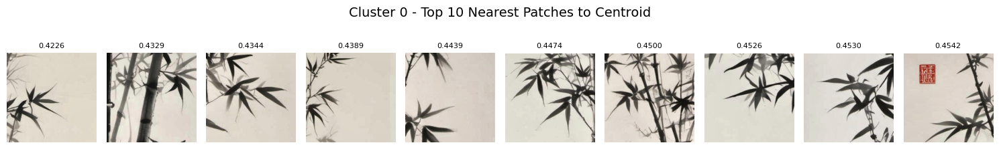

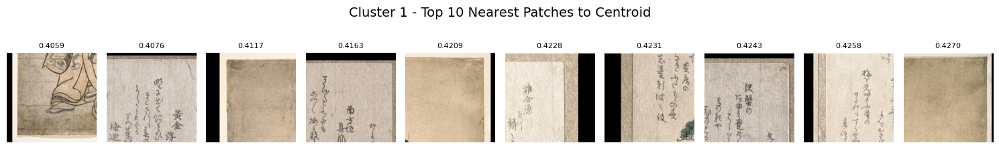

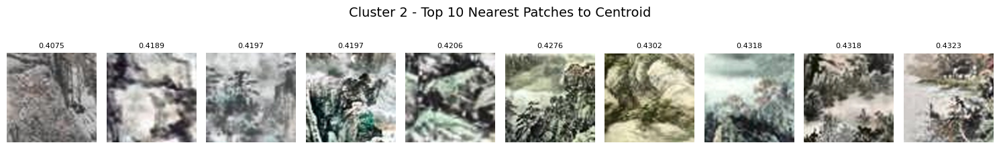

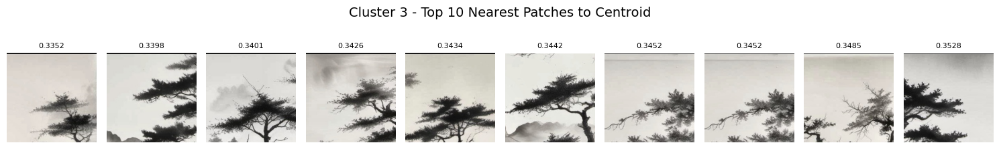

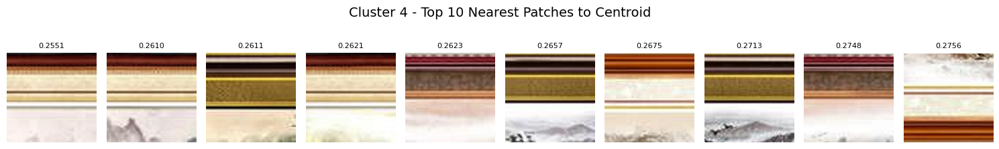

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from joblib import load
from sklearn.metrics.pairwise import cosine_distances

# === Load clustering data ===
data = load("Hasil_NoPadding/discriminative_clustering_nopadding.pkl")
features = data["features_1024"]
cluster_labels = data["cluster_labels"]
image_names = data["image_names"]
centroids = data["centroids"]

# === Path direktori patch ===
PATCH_DIR_POSITIF = "Hasil_NoPadding/patches_dataset_positif_NoPadding"
PATCH_DIR_NEGATIF = "patches_dataset_negatif"

def get_patch_path(name):
    negatif_keywords = ["guo_hua", "shui_mo", "shan_shui"]
    if any(key in name for key in negatif_keywords):
        return os.path.join(PATCH_DIR_NEGATIF, name)
    else:
        return os.path.join(PATCH_DIR_POSITIF, name)

# === Cluster yang ingin ditampilkan ===
CLUSTERS_TO_SHOW = [0, 1, 2, 3, 4]

# === Fungsi menampilkan Top K patch terdekat ke centroid dengan cosine distance ===
def show_top_k_patches_with_distances(features, cluster_labels, image_names, centroids, top_k=10):
    for cluster_id in CLUSTERS_TO_SHOW:
        idx = np.where(cluster_labels == cluster_id)[0]
        cluster_feats = features[idx]
        cluster_names = [image_names[i] for i in idx]

        # Hitung cosine distance terhadap centroid cluster ini
        dists = cosine_distances(cluster_feats, centroids[cluster_id].reshape(1, -1)).flatten()
        top_k_idx = np.argsort(dists)[:top_k]
        top_k_names = [cluster_names[i] for i in top_k_idx]
        top_k_dists = [dists[i] for i in top_k_idx]

        plt.figure(figsize=(15, 2.5))
        for i, (name, dist) in enumerate(zip(top_k_names, top_k_dists)):
            img_path = get_patch_path(name)
            img = cv2.imread(img_path)
            if img is not None:
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                plt.subplot(1, top_k, i + 1)
                plt.imshow(img)
                plt.title(f"{dist:.4f}", fontsize=8)
                plt.axis("off")
            else:
                print(f"⚠️ Tidak bisa baca file: {img_path}")
        plt.suptitle(f"Cluster {cluster_id} - Top {top_k} Nearest Patches to Centroid", fontsize=14)
        plt.tight_layout()
        plt.show()

# Jalankan fungsi
show_top_k_patches_with_distances(features, cluster_labels, image_names, centroids, top_k=10)


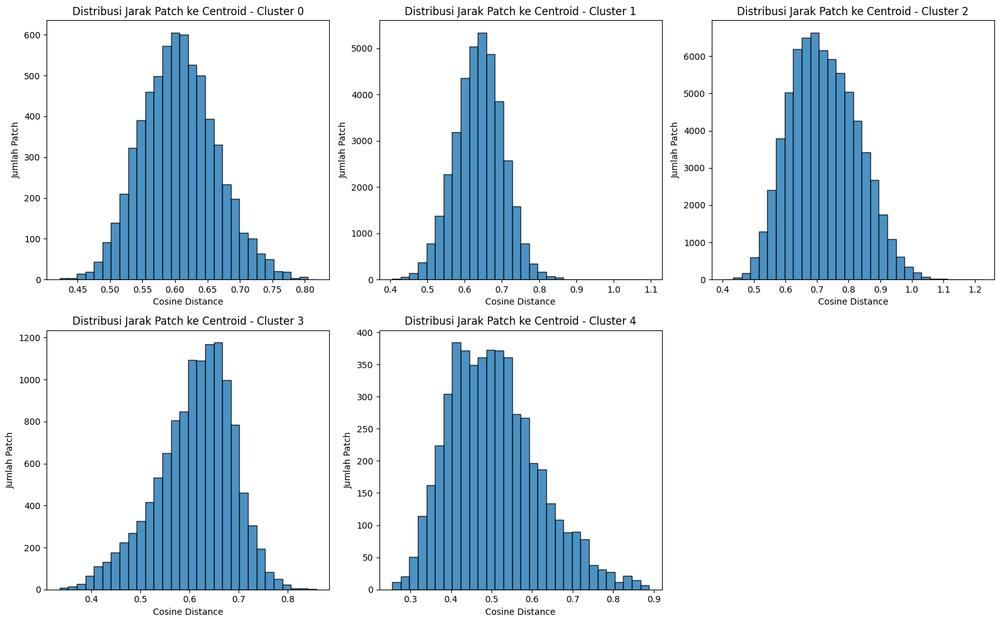

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from joblib import load
from sklearn.metrics.pairwise import cosine_distances

# === Load data clustering ===
data = load("Hasil_NoPadding/discriminative_clustering_nopadding.pkl")
features = data["features_1024"]
cluster_labels = data["cluster_labels"]
centroids = data["centroids"]

# === Konfigurasi ===
n_clusters = centroids.shape[0]

# === Buat subplot grid sesuai jumlah cluster ===
cols = 3
rows = (n_clusters + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(16, 10))
axes = axes.flatten()

# === Plot distribusi jarak ke centroid masing-masing cluster ===
for cluster_id in range(n_clusters):
    idx = np.where(cluster_labels == cluster_id)[0]
    cluster_feats = features[idx]
    dists = cosine_distances(cluster_feats, centroids[cluster_id].reshape(1, -1)).flatten()

    ax = axes[cluster_id]
    ax.hist(dists, bins=30, alpha=0.8, edgecolor="black")
    ax.set_title(f"Distribusi Jarak Patch ke Centroid - Cluster {cluster_id}")
    ax.set_xlabel("Cosine Distance")
    ax.set_ylabel("Jumlah Patch")

# === Sembunyikan subplot kosong jika ada ===
for i in range(n_clusters, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()


# PEMBUATAN MODEL

In [ ]:
import joblib
import numpy as np
import os
from sklearn.utils import resample
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from collections import Counter

# === Load hasil clustering (setelah filtering padding) ===
CLUSTERING_PATH = "Hasil_NoPadding/discriminative_clustering_nopadding.pkl"
clustering_results = joblib.load(CLUSTERING_PATH)

clusters = np.array(clustering_results["cluster_labels"])
features = np.array(clustering_results["features_1024"])
labels = np.array(clustering_results["labels"]).astype(int)

# === Ambil patch Jepang dari cluster 0, 1 (semua) dan cluster 3 (label 1 saja)
jepang_idx = np.where((clusters == 0) | (clusters == 1) | ((clusters == 3) & (labels == 1)))[0]
cina_idx = np.where((clusters == 2) | (clusters == 4))[0]


X_jepang = features[jepang_idx]
y_jepang = np.ones(len(X_jepang), dtype=int)
X_cina = features[cina_idx]
y_cina = np.zeros(len(X_cina), dtype=int)

# === Balancing
n_sample = min(len(X_jepang), len(X_cina))
X_jepang_bal = resample(X_jepang, replace=False, n_samples=n_sample, random_state=42)
X_cina_bal = resample(X_cina, replace=False, n_samples=n_sample, random_state=42)
y_jepang_bal = np.ones(n_sample, dtype=int)
y_cina_bal = np.zeros(n_sample, dtype=int)

# === Gabungkan & Split Train/Test
X_all = np.vstack([X_jepang_bal, X_cina_bal])
y_all = np.concatenate([y_jepang_bal, y_cina_bal])

print(f"📊 Total setelah balancing: {Counter(y_all)}")

# Split 80% train, 20% test
X_train, X_test, y_train, y_test = train_test_split(
    X_all, y_all, test_size=0.2, stratify=y_all, random_state=42
)

# === Training SVM
model = SVC(C=1.0, kernel="rbf", gamma="scale", probability=True, random_state=42)
model.fit(X_train, y_train)
print("✅ SVM selesai dilatih.")

# === Evaluasi di test set
y_pred = model.predict(X_test)
print("\n📈 Classification Report (Test Data):")
print(classification_report(y_test, y_pred, target_names=["Cina", "Jepang"]))

# === Simpan model & test set
os.makedirs("Hasil_NoPadding", exist_ok=True)
joblib.dump(model, "Hasil_NoPadding/svm_model_NoPadding.pkl")
joblib.dump(
    {"X_test": X_test, "y_test": y_test},
    "Hasil_NoPadding/svm_testset_NoPadding.pkl"
)
print("📁 Model dan test set berhasil disimpan.")


📊 Total setelah balancing: Counter({1: 55811, 0: 55811})
✅ SVM selesai dilatih.

📈 Classification Report (Test Data):
              precision    recall  f1-score   support

        Cina       1.00      1.00      1.00     11163
      Jepang       1.00      1.00      1.00     11162

    accuracy                           1.00     22325
   macro avg       1.00      1.00      1.00     22325
weighted avg       1.00      1.00      1.00     22325

📁 Model dan test set berhasil disimpan.


# Percobaan Alpha Beta

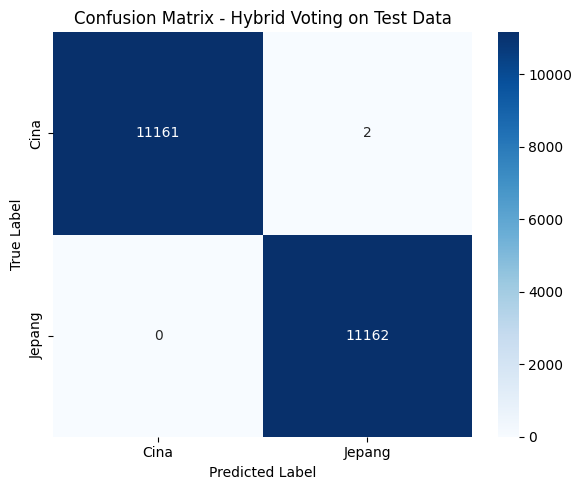


📊 Classification Report (Test Data - Hybrid Voting):
              precision    recall  f1-score      support
Cina           1.000000  0.999821   0.99991  11163.00000
Jepang         0.999821  1.000000   0.99991  11162.00000
accuracy       0.999910  0.999910   0.99991      0.99991
macro avg      0.999910  0.999910   0.99991  22325.00000
weighted avg   0.999910  0.999910   0.99991  22325.00000


In [ ]:
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import normalize
from sklearn.metrics.pairwise import cosine_distances

# ==== Load model, test set, dan clustering (SETELAH FILTERING) ====
svm_model = joblib.load("Hasil_NoPadding/svm_model_NoPadding.pkl")
test_data = joblib.load("Hasil_NoPadding/svm_testset_NoPadding.pkl")
clustering = joblib.load("Hasil_NoPadding/discriminative_clustering_nopadding.pkl")

X_test = test_data["X_test"]
y_test = test_data["y_test"]
centroids_norm = clustering["centroids"]

# ==== Konfigurasi baru ====
ALPHA = 0.44
BETA = 0.56
JEPANG_CLUSTERS = [0, 1, 3]  # klaster dominan Jepang
CINA_CLUSTERS = [2, 4]       # klaster dominan Cina

# ==== Fungsi Hybrid Voting: Perbandingan Jepang vs Cina ====
def hybrid_predict_feature(feat_norm):
    proba = svm_model.predict_proba(feat_norm)[0]
    dists = cosine_distances(feat_norm, centroids_norm)[0]

    japan_score = np.mean([1.0 / (dists[c] + 1e-8) for c in JEPANG_CLUSTERS])
    cina_score = np.mean([1.0 / (dists[c] + 1e-8) for c in CINA_CLUSTERS])

    # Versi baru: rasio langsung Jepang/Cina
    hybrid_score = ALPHA * (japan_score / (cina_score + 1e-8)) + BETA * proba[1]

    return 1 if hybrid_score > 0.5 else 0


# ==== Hybrid predict untuk semua X_test ====
predictions = []
for feat in X_test:
    feat_norm = normalize(feat.reshape(1, -1))
    pred = hybrid_predict_feature(feat_norm)
    predictions.append(pred)

# ==== Evaluation ====
report = classification_report(y_test, predictions, target_names=["Cina", "Jepang"], output_dict=True)
cm = confusion_matrix(y_test, predictions)

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Cina", "Jepang"], yticklabels=["Cina", "Jepang"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Hybrid Voting on Test Data")
plt.tight_layout()
plt.show()

print("\n📊 Classification Report (Test Data - Hybrid Voting):")
print(pd.DataFrame(report).T)

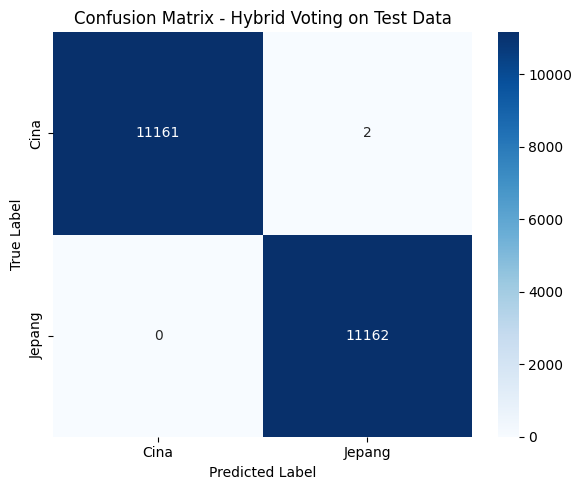


📊 Classification Report (Test Data - Hybrid Voting):
              precision    recall  f1-score      support
Cina           1.000000  0.999821   0.99991  11163.00000
Jepang         0.999821  1.000000   0.99991  11162.00000
accuracy       0.999910  0.999910   0.99991      0.99991
macro avg      0.999910  0.999910   0.99991  22325.00000
weighted avg   0.999910  0.999910   0.99991  22325.00000


In [ ]:
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import normalize
from sklearn.metrics.pairwise import cosine_distances

# ==== Load model, test set, dan clustering (SETELAH FILTERING) ====
svm_model = joblib.load("Hasil_NoPadding/svm_model_NoPadding.pkl")
test_data = joblib.load("Hasil_NoPadding/svm_testset_NoPadding.pkl")
clustering = joblib.load("Hasil_NoPadding/discriminative_clustering_nopadding.pkl")

X_test = test_data["X_test"]
y_test = test_data["y_test"]
centroids_norm = clustering["centroids"]

# ==== Konfigurasi baru ====
ALPHA = 0.43
BETA = 0.57
JEPANG_CLUSTERS = [0, 1, 3]  # klaster dominan Jepang
CINA_CLUSTERS = [2, 4]       # klaster dominan Cina

# ==== Fungsi Hybrid Voting: Perbandingan Jepang vs Cina ====
def hybrid_predict_feature(feat_norm):
    proba = svm_model.predict_proba(feat_norm)[0]
    dists = cosine_distances(feat_norm, centroids_norm)[0]

    japan_score = np.mean([1.0 / (dists[c] + 1e-8) for c in JEPANG_CLUSTERS])
    cina_score = np.mean([1.0 / (dists[c] + 1e-8) for c in CINA_CLUSTERS])

    # Versi baru: rasio langsung Jepang/Cina
    hybrid_score = ALPHA * (japan_score / (cina_score + 1e-8)) + BETA * proba[1]

    return 1 if hybrid_score > 0.5 else 0


# ==== Hybrid predict untuk semua X_test ====
predictions = []
for feat in X_test:
    feat_norm = normalize(feat.reshape(1, -1))
    pred = hybrid_predict_feature(feat_norm)
    predictions.append(pred)

# ==== Evaluation ====
report = classification_report(y_test, predictions, target_names=["Cina", "Jepang"], output_dict=True)
cm = confusion_matrix(y_test, predictions)

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Cina", "Jepang"], yticklabels=["Cina", "Jepang"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Hybrid Voting on Test Data")
plt.tight_layout()
plt.show()

print("\n📊 Classification Report (Test Data - Hybrid Voting):")
print(pd.DataFrame(report).T)

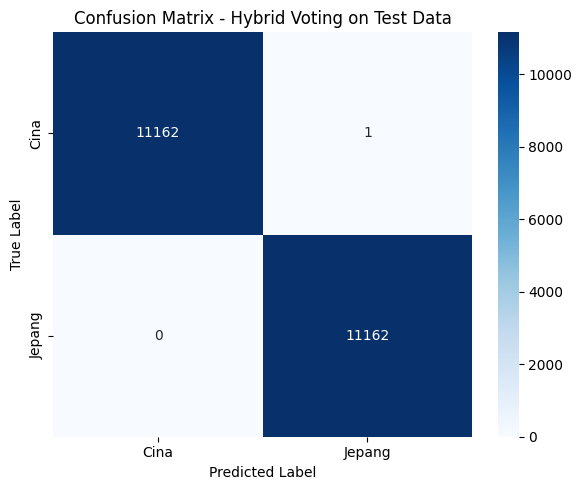


📊 Classification Report (Test Data - Hybrid Voting):
              precision    recall  f1-score       support
Cina           1.000000  0.999910  0.999955  11163.000000
Jepang         0.999910  1.000000  0.999955  11162.000000
accuracy       0.999955  0.999955  0.999955      0.999955
macro avg      0.999955  0.999955  0.999955  22325.000000
weighted avg   0.999955  0.999955  0.999955  22325.000000


In [ ]:
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import normalize
from sklearn.metrics.pairwise import cosine_distances

# ==== Load model, test set, dan clustering (SETELAH FILTERING) ====
svm_model = joblib.load("Hasil_NoPadding/svm_model_NoPadding.pkl")
test_data = joblib.load("Hasil_NoPadding/svm_testset_NoPadding.pkl")
clustering = joblib.load("Hasil_NoPadding/discriminative_clustering_nopadding.pkl")

X_test = test_data["X_test"]
y_test = test_data["y_test"]
centroids_norm = clustering["centroids"]

# ==== Konfigurasi baru ====
ALPHA = 0.42
BETA = 0.58
JEPANG_CLUSTERS = [0, 1, 3]  # klaster dominan Jepang
CINA_CLUSTERS = [2, 4]       # klaster dominan Cina

# ==== Fungsi Hybrid Voting: Perbandingan Jepang vs Cina ====
def hybrid_predict_feature(feat_norm):
    proba = svm_model.predict_proba(feat_norm)[0]
    dists = cosine_distances(feat_norm, centroids_norm)[0]

    japan_score = np.mean([1.0 / (dists[c] + 1e-8) for c in JEPANG_CLUSTERS])
    cina_score = np.mean([1.0 / (dists[c] + 1e-8) for c in CINA_CLUSTERS])

    # Versi baru: rasio langsung Jepang/Cina
    hybrid_score = ALPHA * (japan_score / (cina_score + 1e-8)) + BETA * proba[1]

    return 1 if hybrid_score > 0.5 else 0


# ==== Hybrid predict untuk semua X_test ====
predictions = []
for feat in X_test:
    feat_norm = normalize(feat.reshape(1, -1))
    pred = hybrid_predict_feature(feat_norm)
    predictions.append(pred)

# ==== Evaluation ====
report = classification_report(y_test, predictions, target_names=["Cina", "Jepang"], output_dict=True)
cm = confusion_matrix(y_test, predictions)

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Cina", "Jepang"], yticklabels=["Cina", "Jepang"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Hybrid Voting on Test Data")
plt.tight_layout()
plt.show()

print("\n📊 Classification Report (Test Data - Hybrid Voting):")
print(pd.DataFrame(report).T)

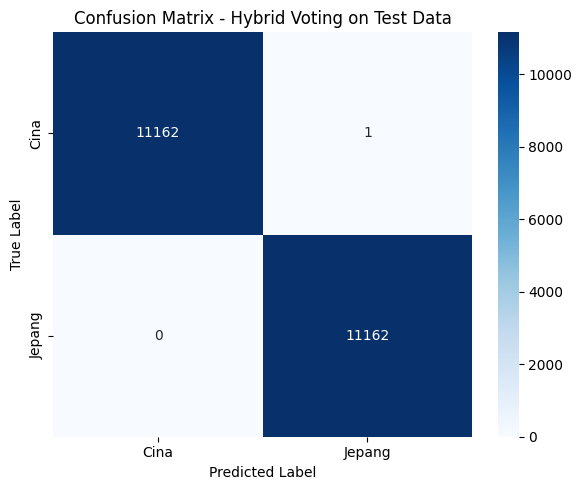


📊 Classification Report (Test Data - Hybrid Voting):
              precision    recall  f1-score       support
Cina           1.000000  0.999910  0.999955  11163.000000
Jepang         0.999910  1.000000  0.999955  11162.000000
accuracy       0.999955  0.999955  0.999955      0.999955
macro avg      0.999955  0.999955  0.999955  22325.000000
weighted avg   0.999955  0.999955  0.999955  22325.000000


In [ ]:
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import normalize
from sklearn.metrics.pairwise import cosine_distances

# ==== Load model, test set, dan clustering (SETELAH FILTERING) ====
svm_model = joblib.load("Hasil_NoPadding/svm_model_NoPadding.pkl")
test_data = joblib.load("Hasil_NoPadding/svm_testset_NoPadding.pkl")
clustering = joblib.load("Hasil_NoPadding/discriminative_clustering_nopadding.pkl")

X_test = test_data["X_test"]
y_test = test_data["y_test"]
centroids_norm = clustering["centroids"]

# ==== Konfigurasi baru ====
ALPHA = 0.41
BETA = 0.59
JEPANG_CLUSTERS = [0, 1, 3]  # klaster dominan Jepang
CINA_CLUSTERS = [2, 4]       # klaster dominan Cina

# ==== Fungsi Hybrid Voting: Perbandingan Jepang vs Cina ====
def hybrid_predict_feature(feat_norm):
    proba = svm_model.predict_proba(feat_norm)[0]
    dists = cosine_distances(feat_norm, centroids_norm)[0]

    japan_score = np.mean([1.0 / (dists[c] + 1e-8) for c in JEPANG_CLUSTERS])
    cina_score = np.mean([1.0 / (dists[c] + 1e-8) for c in CINA_CLUSTERS])

    # Versi baru: rasio langsung Jepang/Cina
    hybrid_score = ALPHA * (japan_score / (cina_score + 1e-8)) + BETA * proba[1]

    return 1 if hybrid_score > 0.5 else 0


# ==== Hybrid predict untuk semua X_test ====
predictions = []
for feat in X_test:
    feat_norm = normalize(feat.reshape(1, -1))
    pred = hybrid_predict_feature(feat_norm)
    predictions.append(pred)

# ==== Evaluation ====
report = classification_report(y_test, predictions, target_names=["Cina", "Jepang"], output_dict=True)
cm = confusion_matrix(y_test, predictions)

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Cina", "Jepang"], yticklabels=["Cina", "Jepang"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Hybrid Voting on Test Data")
plt.tight_layout()
plt.show()

print("\n📊 Classification Report (Test Data - Hybrid Voting):")
print(pd.DataFrame(report).T)

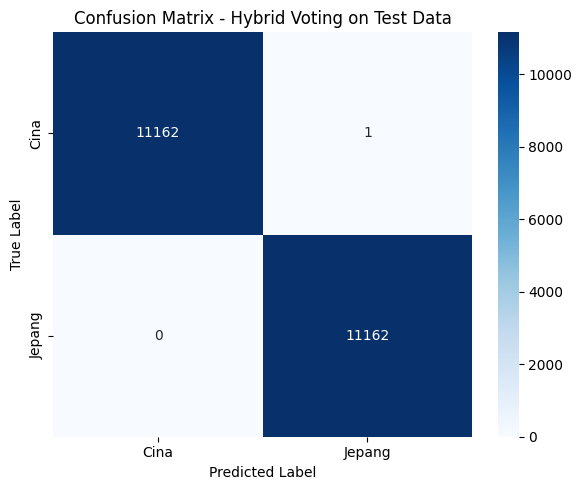


📊 Classification Report (Test Data - Hybrid Voting):
              precision    recall  f1-score       support
Cina           1.000000  0.999910  0.999955  11163.000000
Jepang         0.999910  1.000000  0.999955  11162.000000
accuracy       0.999955  0.999955  0.999955      0.999955
macro avg      0.999955  0.999955  0.999955  22325.000000
weighted avg   0.999955  0.999955  0.999955  22325.000000


In [ ]:
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import normalize
from sklearn.metrics.pairwise import cosine_distances

# ==== Load model, test set, dan clustering (SETELAH FILTERING) ====
svm_model = joblib.load("Hasil_NoPadding/svm_model_NoPadding.pkl")
test_data = joblib.load("Hasil_NoPadding/svm_testset_NoPadding.pkl")
clustering = joblib.load("Hasil_NoPadding/discriminative_clustering_nopadding.pkl")

X_test = test_data["X_test"]
y_test = test_data["y_test"]
centroids_norm = clustering["centroids"]

# ==== Konfigurasi baru ====
ALPHA = 0.4
BETA = 0.6
JEPANG_CLUSTERS = [0, 1, 3]  # klaster dominan Jepang
CINA_CLUSTERS = [2, 4]       # klaster dominan Cina

# ==== Fungsi Hybrid Voting: Perbandingan Jepang vs Cina ====
def hybrid_predict_feature(feat_norm):
    proba = svm_model.predict_proba(feat_norm)[0]
    dists = cosine_distances(feat_norm, centroids_norm)[0]

    japan_score = np.mean([1.0 / (dists[c] + 1e-8) for c in JEPANG_CLUSTERS])
    cina_score = np.mean([1.0 / (dists[c] + 1e-8) for c in CINA_CLUSTERS])

    # Versi baru: rasio langsung Jepang/Cina
    hybrid_score = ALPHA * (japan_score / (cina_score + 1e-8)) + BETA * proba[1]

    return 1 if hybrid_score > 0.5 else 0


# ==== Hybrid predict untuk semua X_test ====
predictions = []
for feat in X_test:
    feat_norm = normalize(feat.reshape(1, -1))
    pred = hybrid_predict_feature(feat_norm)
    predictions.append(pred)

# ==== Evaluation ====
report = classification_report(y_test, predictions, target_names=["Cina", "Jepang"], output_dict=True)
cm = confusion_matrix(y_test, predictions)

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Cina", "Jepang"], yticklabels=["Cina", "Jepang"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Hybrid Voting on Test Data")
plt.tight_layout()
plt.show()

print("\n📊 Classification Report (Test Data - Hybrid Voting):")
print(pd.DataFrame(report).T)

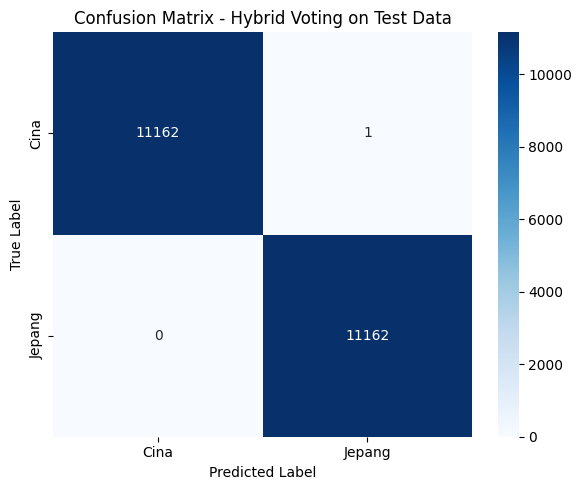


📊 Classification Report (Test Data - Hybrid Voting):
              precision    recall  f1-score       support
Cina           1.000000  0.999910  0.999955  11163.000000
Jepang         0.999910  1.000000  0.999955  11162.000000
accuracy       0.999955  0.999955  0.999955      0.999955
macro avg      0.999955  0.999955  0.999955  22325.000000
weighted avg   0.999955  0.999955  0.999955  22325.000000


In [ ]:
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import normalize
from sklearn.metrics.pairwise import cosine_distances

# ==== Load model, test set, dan clustering (SETELAH FILTERING) ====
svm_model = joblib.load("Hasil_NoPadding/svm_model_NoPadding.pkl")
test_data = joblib.load("Hasil_NoPadding/svm_testset_NoPadding.pkl")
clustering = joblib.load("Hasil_NoPadding/discriminative_clustering_nopadding.pkl")

X_test = test_data["X_test"]
y_test = test_data["y_test"]
centroids_norm = clustering["centroids"]

# ==== Konfigurasi baru ====
ALPHA = 0.39
BETA = 0.61
JEPANG_CLUSTERS = [0, 1, 3]  # klaster dominan Jepang
CINA_CLUSTERS = [2, 4]       # klaster dominan Cina

# ==== Fungsi Hybrid Voting: Perbandingan Jepang vs Cina ====
def hybrid_predict_feature(feat_norm):
    proba = svm_model.predict_proba(feat_norm)[0]
    dists = cosine_distances(feat_norm, centroids_norm)[0]

    japan_score = np.mean([1.0 / (dists[c] + 1e-8) for c in JEPANG_CLUSTERS])
    cina_score = np.mean([1.0 / (dists[c] + 1e-8) for c in CINA_CLUSTERS])

    # Versi baru: rasio langsung Jepang/Cina
    hybrid_score = ALPHA * (japan_score / (cina_score + 1e-8)) + BETA * proba[1]

    return 1 if hybrid_score > 0.5 else 0


# ==== Hybrid predict untuk semua X_test ====
predictions = []
for feat in X_test:
    feat_norm = normalize(feat.reshape(1, -1))
    pred = hybrid_predict_feature(feat_norm)
    predictions.append(pred)

# ==== Evaluation ====
report = classification_report(y_test, predictions, target_names=["Cina", "Jepang"], output_dict=True)
cm = confusion_matrix(y_test, predictions)

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Cina", "Jepang"], yticklabels=["Cina", "Jepang"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Hybrid Voting on Test Data")
plt.tight_layout()
plt.show()

print("\n📊 Classification Report (Test Data - Hybrid Voting):")
print(pd.DataFrame(report).T)

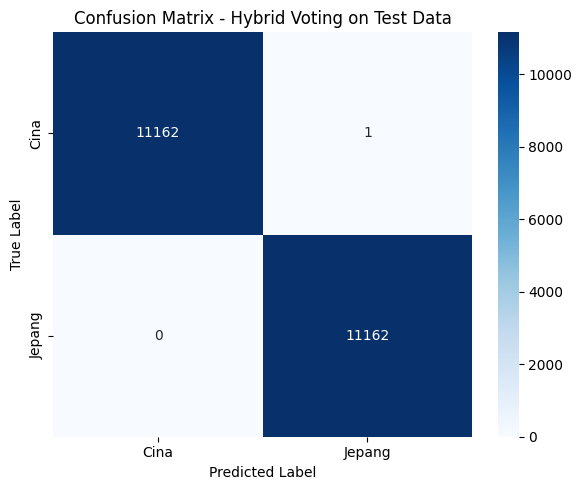


📊 Classification Report (Test Data - Hybrid Voting):
              precision    recall  f1-score       support
Cina           1.000000  0.999910  0.999955  11163.000000
Jepang         0.999910  1.000000  0.999955  11162.000000
accuracy       0.999955  0.999955  0.999955      0.999955
macro avg      0.999955  0.999955  0.999955  22325.000000
weighted avg   0.999955  0.999955  0.999955  22325.000000


In [ ]:
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import normalize
from sklearn.metrics.pairwise import cosine_distances

# ==== Load model, test set, dan clustering (SETELAH FILTERING) ====
svm_model = joblib.load("Hasil_NoPadding/svm_model_NoPadding.pkl")
test_data = joblib.load("Hasil_NoPadding/svm_testset_NoPadding.pkl")
clustering = joblib.load("Hasil_NoPadding/discriminative_clustering_nopadding.pkl")

X_test = test_data["X_test"]
y_test = test_data["y_test"]
centroids_norm = clustering["centroids"]

# ==== Konfigurasi baru ====
ALPHA = 0.38
BETA = 0.62
JEPANG_CLUSTERS = [0, 1, 3]  # klaster dominan Jepang
CINA_CLUSTERS = [2, 4]       # klaster dominan Cina

# ==== Fungsi Hybrid Voting: Perbandingan Jepang vs Cina ====
def hybrid_predict_feature(feat_norm):
    proba = svm_model.predict_proba(feat_norm)[0]
    dists = cosine_distances(feat_norm, centroids_norm)[0]

    japan_score = np.mean([1.0 / (dists[c] + 1e-8) for c in JEPANG_CLUSTERS])
    cina_score = np.mean([1.0 / (dists[c] + 1e-8) for c in CINA_CLUSTERS])

    # Versi baru: rasio langsung Jepang/Cina
    hybrid_score = ALPHA * (japan_score / (cina_score + 1e-8)) + BETA * proba[1]

    return 1 if hybrid_score > 0.5 else 0


# ==== Hybrid predict untuk semua X_test ====
predictions = []
for feat in X_test:
    feat_norm = normalize(feat.reshape(1, -1))
    pred = hybrid_predict_feature(feat_norm)
    predictions.append(pred)

# ==== Evaluation ====
report = classification_report(y_test, predictions, target_names=["Cina", "Jepang"], output_dict=True)
cm = confusion_matrix(y_test, predictions)

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Cina", "Jepang"], yticklabels=["Cina", "Jepang"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Hybrid Voting on Test Data")
plt.tight_layout()
plt.show()

print("\n📊 Classification Report (Test Data - Hybrid Voting):")
print(pd.DataFrame(report).T)

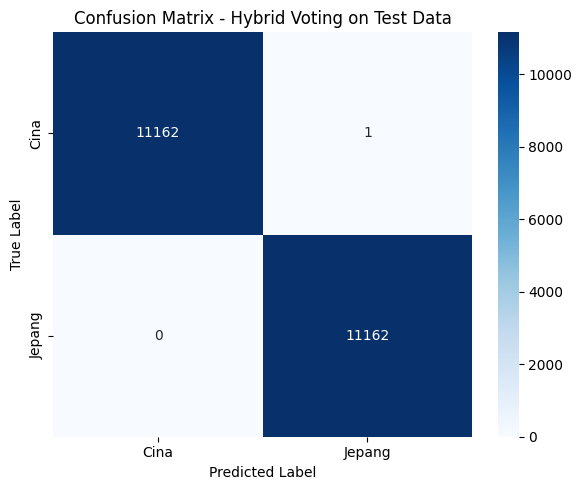


📊 Classification Report (Test Data - Hybrid Voting):
              precision    recall  f1-score       support
Cina           1.000000  0.999910  0.999955  11163.000000
Jepang         0.999910  1.000000  0.999955  11162.000000
accuracy       0.999955  0.999955  0.999955      0.999955
macro avg      0.999955  0.999955  0.999955  22325.000000
weighted avg   0.999955  0.999955  0.999955  22325.000000


In [ ]:
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import normalize
from sklearn.metrics.pairwise import cosine_distances

# ==== Load model, test set, dan clustering (SETELAH FILTERING) ====
svm_model = joblib.load("Hasil_NoPadding/svm_model_NoPadding.pkl")
test_data = joblib.load("Hasil_NoPadding/svm_testset_NoPadding.pkl")
clustering = joblib.load("Hasil_NoPadding/discriminative_clustering_nopadding.pkl")

X_test = test_data["X_test"]
y_test = test_data["y_test"]
centroids_norm = clustering["centroids"]

# ==== Konfigurasi baru ====
ALPHA = 0.37
BETA = 0.63
JEPANG_CLUSTERS = [0, 1, 3]  # klaster dominan Jepang
CINA_CLUSTERS = [2, 4]       # klaster dominan Cina

# ==== Fungsi Hybrid Voting: Perbandingan Jepang vs Cina ====
def hybrid_predict_feature(feat_norm):
    proba = svm_model.predict_proba(feat_norm)[0]
    dists = cosine_distances(feat_norm, centroids_norm)[0]

    japan_score = np.mean([1.0 / (dists[c] + 1e-8) for c in JEPANG_CLUSTERS])
    cina_score = np.mean([1.0 / (dists[c] + 1e-8) for c in CINA_CLUSTERS])

    # Versi baru: rasio langsung Jepang/Cina
    hybrid_score = ALPHA * (japan_score / (cina_score + 1e-8)) + BETA * proba[1]

    return 1 if hybrid_score > 0.5 else 0


# ==== Hybrid predict untuk semua X_test ====
predictions = []
for feat in X_test:
    feat_norm = normalize(feat.reshape(1, -1))
    pred = hybrid_predict_feature(feat_norm)
    predictions.append(pred)

# ==== Evaluation ====
report = classification_report(y_test, predictions, target_names=["Cina", "Jepang"], output_dict=True)
cm = confusion_matrix(y_test, predictions)

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Cina", "Jepang"], yticklabels=["Cina", "Jepang"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Hybrid Voting on Test Data")
plt.tight_layout()
plt.show()

print("\n📊 Classification Report (Test Data - Hybrid Voting):")
print(pd.DataFrame(report).T)

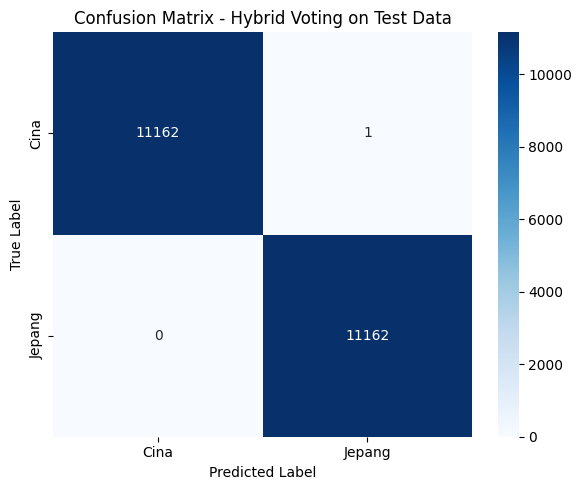


📊 Classification Report (Test Data - Hybrid Voting):
              precision    recall  f1-score       support
Cina           1.000000  0.999910  0.999955  11163.000000
Jepang         0.999910  1.000000  0.999955  11162.000000
accuracy       0.999955  0.999955  0.999955      0.999955
macro avg      0.999955  0.999955  0.999955  22325.000000
weighted avg   0.999955  0.999955  0.999955  22325.000000


In [ ]:
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import normalize
from sklearn.metrics.pairwise import cosine_distances

# ==== Load model, test set, dan clustering (SETELAH FILTERING) ====
svm_model = joblib.load("Hasil_NoPadding/svm_model_NoPadding.pkl")
test_data = joblib.load("Hasil_NoPadding/svm_testset_NoPadding.pkl")
clustering = joblib.load("Hasil_NoPadding/discriminative_clustering_nopadding.pkl")

X_test = test_data["X_test"]
y_test = test_data["y_test"]
centroids_norm = clustering["centroids"]

# ==== Konfigurasi baru ====
ALPHA = 0.36
BETA = 0.64
JEPANG_CLUSTERS = [0, 1, 3]  # klaster dominan Jepang
CINA_CLUSTERS = [2, 4]       # klaster dominan Cina

# ==== Fungsi Hybrid Voting: Perbandingan Jepang vs Cina ====
def hybrid_predict_feature(feat_norm):
    proba = svm_model.predict_proba(feat_norm)[0]
    dists = cosine_distances(feat_norm, centroids_norm)[0]

    japan_score = np.mean([1.0 / (dists[c] + 1e-8) for c in JEPANG_CLUSTERS])
    cina_score = np.mean([1.0 / (dists[c] + 1e-8) for c in CINA_CLUSTERS])

    # Versi baru: rasio langsung Jepang/Cina
    hybrid_score = ALPHA * (japan_score / (cina_score + 1e-8)) + BETA * proba[1]

    return 1 if hybrid_score > 0.5 else 0


# ==== Hybrid predict untuk semua X_test ====
predictions = []
for feat in X_test:
    feat_norm = normalize(feat.reshape(1, -1))
    pred = hybrid_predict_feature(feat_norm)
    predictions.append(pred)

# ==== Evaluation ====
report = classification_report(y_test, predictions, target_names=["Cina", "Jepang"], output_dict=True)
cm = confusion_matrix(y_test, predictions)

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Cina", "Jepang"], yticklabels=["Cina", "Jepang"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Hybrid Voting on Test Data")
plt.tight_layout()
plt.show()

print("\n📊 Classification Report (Test Data - Hybrid Voting):")
print(pd.DataFrame(report).T)

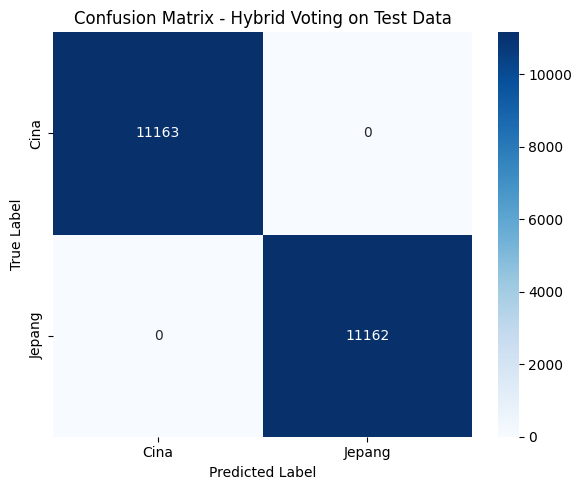


📊 Classification Report (Test Data - Hybrid Voting):
              precision  recall  f1-score  support
Cina                1.0     1.0       1.0  11163.0
Jepang              1.0     1.0       1.0  11162.0
accuracy            1.0     1.0       1.0      1.0
macro avg           1.0     1.0       1.0  22325.0
weighted avg        1.0     1.0       1.0  22325.0


In [ ]:
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import normalize
from sklearn.metrics.pairwise import cosine_distances

# ==== Load model, test set, dan clustering (SETELAH FILTERING) ====
svm_model = joblib.load("Hasil_NoPadding/svm_model_NoPadding.pkl")
test_data = joblib.load("Hasil_NoPadding/svm_testset_NoPadding.pkl")
clustering = joblib.load("Hasil_NoPadding/discriminative_clustering_nopadding.pkl")

X_test = test_data["X_test"]
y_test = test_data["y_test"]
centroids_norm = clustering["centroids"]

# ==== Konfigurasi baru ====
ALPHA = 0.35
BETA = 0.65
JEPANG_CLUSTERS = [0, 1, 3]  # klaster dominan Jepang
CINA_CLUSTERS = [2, 4]       # klaster dominan Cina

# ==== Fungsi Hybrid Voting: Perbandingan Jepang vs Cina ====
def hybrid_predict_feature(feat_norm):
    proba = svm_model.predict_proba(feat_norm)[0]
    dists = cosine_distances(feat_norm, centroids_norm)[0]

    japan_score = np.mean([1.0 / (dists[c] + 1e-8) for c in JEPANG_CLUSTERS])
    cina_score = np.mean([1.0 / (dists[c] + 1e-8) for c in CINA_CLUSTERS])

    # Versi baru: rasio langsung Jepang/Cina
    hybrid_score = ALPHA * (japan_score / (cina_score + 1e-8)) + BETA * proba[1]

    return 1 if hybrid_score > 0.5 else 0


# ==== Hybrid predict untuk semua X_test ====
predictions = []
for feat in X_test:
    feat_norm = normalize(feat.reshape(1, -1))
    pred = hybrid_predict_feature(feat_norm)
    predictions.append(pred)

# ==== Evaluation ====
report = classification_report(y_test, predictions, target_names=["Cina", "Jepang"], output_dict=True)
cm = confusion_matrix(y_test, predictions)

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Cina", "Jepang"], yticklabels=["Cina", "Jepang"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Hybrid Voting on Test Data")
plt.tight_layout()
plt.show()

print("\n📊 Classification Report (Test Data - Hybrid Voting):")
print(pd.DataFrame(report).T)

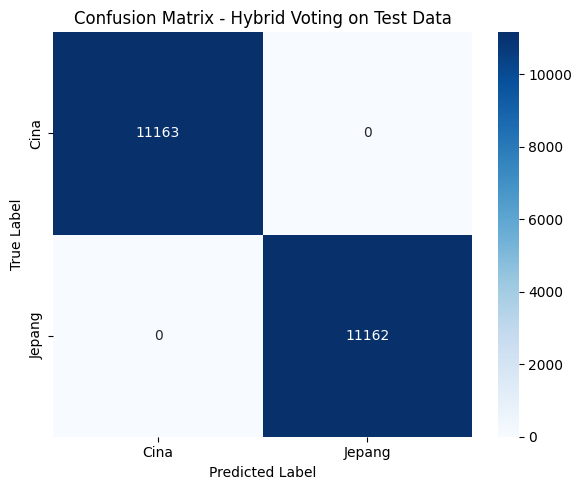


📊 Classification Report (Test Data - Hybrid Voting):
              precision  recall  f1-score  support
Cina                1.0     1.0       1.0  11163.0
Jepang              1.0     1.0       1.0  11162.0
accuracy            1.0     1.0       1.0      1.0
macro avg           1.0     1.0       1.0  22325.0
weighted avg        1.0     1.0       1.0  22325.0


In [ ]:
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import normalize
from sklearn.metrics.pairwise import cosine_distances

# ==== Load model, test set, dan clustering (SETELAH FILTERING) ====
svm_model = joblib.load("Hasil_NoPadding/svm_model_NoPadding.pkl")
test_data = joblib.load("Hasil_NoPadding/svm_testset_NoPadding.pkl")
clustering = joblib.load("Hasil_NoPadding/discriminative_clustering_nopadding.pkl")

X_test = test_data["X_test"]
y_test = test_data["y_test"]
centroids_norm = clustering["centroids"]

# ==== Konfigurasi baru ====
ALPHA = 0.3
BETA = 0.7
JEPANG_CLUSTERS = [0, 1, 3]  # klaster dominan Jepang
CINA_CLUSTERS = [2, 4]       # klaster dominan Cina

# ==== Fungsi Hybrid Voting: Perbandingan Jepang vs Cina ====
def hybrid_predict_feature(feat_norm):
    proba = svm_model.predict_proba(feat_norm)[0]
    dists = cosine_distances(feat_norm, centroids_norm)[0]

    japan_score = np.mean([1.0 / (dists[c] + 1e-8) for c in JEPANG_CLUSTERS])
    cina_score = np.mean([1.0 / (dists[c] + 1e-8) for c in CINA_CLUSTERS])

    # Versi baru: rasio langsung Jepang/Cina
    hybrid_score = ALPHA * (japan_score / (cina_score + 1e-8)) + BETA * proba[1]

    return 1 if hybrid_score > 0.5 else 0


# ==== Hybrid predict untuk semua X_test ====
predictions = []
for feat in X_test:
    feat_norm = normalize(feat.reshape(1, -1))
    pred = hybrid_predict_feature(feat_norm)
    predictions.append(pred)

# ==== Evaluation ====
report = classification_report(y_test, predictions, target_names=["Cina", "Jepang"], output_dict=True)
cm = confusion_matrix(y_test, predictions)

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Cina", "Jepang"], yticklabels=["Cina", "Jepang"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Hybrid Voting on Test Data")
plt.tight_layout()
plt.show()

print("\n📊 Classification Report (Test Data - Hybrid Voting):")
print(pd.DataFrame(report).T)

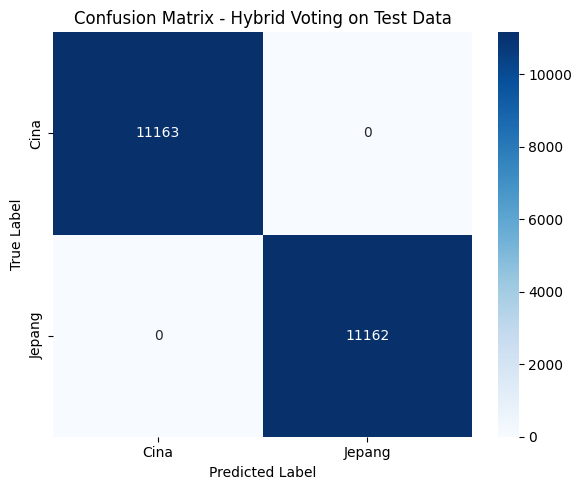


📊 Classification Report (Test Data - Hybrid Voting):
              precision  recall  f1-score  support
Cina                1.0     1.0       1.0  11163.0
Jepang              1.0     1.0       1.0  11162.0
accuracy            1.0     1.0       1.0      1.0
macro avg           1.0     1.0       1.0  22325.0
weighted avg        1.0     1.0       1.0  22325.0


In [ ]:
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import normalize
from sklearn.metrics.pairwise import cosine_distances

# ==== Load model, test set, dan clustering (SETELAH FILTERING) ====
svm_model = joblib.load("Hasil_NoPadding/svm_model_NoPadding.pkl")
test_data = joblib.load("Hasil_NoPadding/svm_testset_NoPadding.pkl")
clustering = joblib.load("Hasil_NoPadding/discriminative_clustering_nopadding.pkl")

X_test = test_data["X_test"]
y_test = test_data["y_test"]
centroids_norm = clustering["centroids"]

# ==== Konfigurasi baru ====
ALPHA = 0.29
BETA = 0.71
JEPANG_CLUSTERS = [0, 1, 3]  # klaster dominan Jepang
CINA_CLUSTERS = [2, 4]       # klaster dominan Cina

# ==== Fungsi Hybrid Voting: Perbandingan Jepang vs Cina ====
def hybrid_predict_feature(feat_norm):
    proba = svm_model.predict_proba(feat_norm)[0]
    dists = cosine_distances(feat_norm, centroids_norm)[0]

    japan_score = np.mean([1.0 / (dists[c] + 1e-8) for c in JEPANG_CLUSTERS])
    cina_score = np.mean([1.0 / (dists[c] + 1e-8) for c in CINA_CLUSTERS])

    # Versi baru: rasio langsung Jepang/Cina
    hybrid_score = ALPHA * (japan_score / (cina_score + 1e-8)) + BETA * proba[1]

    return 1 if hybrid_score > 0.5 else 0


# ==== Hybrid predict untuk semua X_test ====
predictions = []
for feat in X_test:
    feat_norm = normalize(feat.reshape(1, -1))
    pred = hybrid_predict_feature(feat_norm)
    predictions.append(pred)

# ==== Evaluation ====
report = classification_report(y_test, predictions, target_names=["Cina", "Jepang"], output_dict=True)
cm = confusion_matrix(y_test, predictions)

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Cina", "Jepang"], yticklabels=["Cina", "Jepang"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Hybrid Voting on Test Data")
plt.tight_layout()
plt.show()

print("\n📊 Classification Report (Test Data - Hybrid Voting):")
print(pd.DataFrame(report).T)

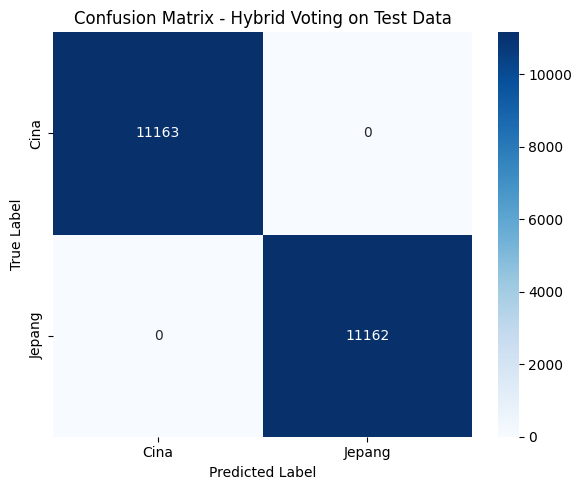


📊 Classification Report (Test Data - Hybrid Voting):
              precision  recall  f1-score  support
Cina                1.0     1.0       1.0  11163.0
Jepang              1.0     1.0       1.0  11162.0
accuracy            1.0     1.0       1.0      1.0
macro avg           1.0     1.0       1.0  22325.0
weighted avg        1.0     1.0       1.0  22325.0


In [ ]:
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import normalize
from sklearn.metrics.pairwise import cosine_distances

# ==== Load model, test set, dan clustering (SETELAH FILTERING) ====
svm_model = joblib.load("Hasil_NoPadding/svm_model_NoPadding.pkl")
test_data = joblib.load("Hasil_NoPadding/svm_testset_NoPadding.pkl")
clustering = joblib.load("Hasil_NoPadding/discriminative_clustering_nopadding.pkl")

X_test = test_data["X_test"]
y_test = test_data["y_test"]
centroids_norm = clustering["centroids"]

# ==== Konfigurasi baru ====
ALPHA = 0.28
BETA = 0.72
JEPANG_CLUSTERS = [0, 1, 3]  # klaster dominan Jepang
CINA_CLUSTERS = [2, 4]       # klaster dominan Cina

# ==== Fungsi Hybrid Voting: Perbandingan Jepang vs Cina ====
def hybrid_predict_feature(feat_norm):
    proba = svm_model.predict_proba(feat_norm)[0]
    dists = cosine_distances(feat_norm, centroids_norm)[0]

    japan_score = np.mean([1.0 / (dists[c] + 1e-8) for c in JEPANG_CLUSTERS])
    cina_score = np.mean([1.0 / (dists[c] + 1e-8) for c in CINA_CLUSTERS])

    # Versi baru: rasio langsung Jepang/Cina
    hybrid_score = ALPHA * (japan_score / (cina_score + 1e-8)) + BETA * proba[1]

    return 1 if hybrid_score > 0.5 else 0


# ==== Hybrid predict untuk semua X_test ====
predictions = []
for feat in X_test:
    feat_norm = normalize(feat.reshape(1, -1))
    pred = hybrid_predict_feature(feat_norm)
    predictions.append(pred)

# ==== Evaluation ====
report = classification_report(y_test, predictions, target_names=["Cina", "Jepang"], output_dict=True)
cm = confusion_matrix(y_test, predictions)

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Cina", "Jepang"], yticklabels=["Cina", "Jepang"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Hybrid Voting on Test Data")
plt.tight_layout()
plt.show()

print("\n📊 Classification Report (Test Data - Hybrid Voting):")
print(pd.DataFrame(report).T)

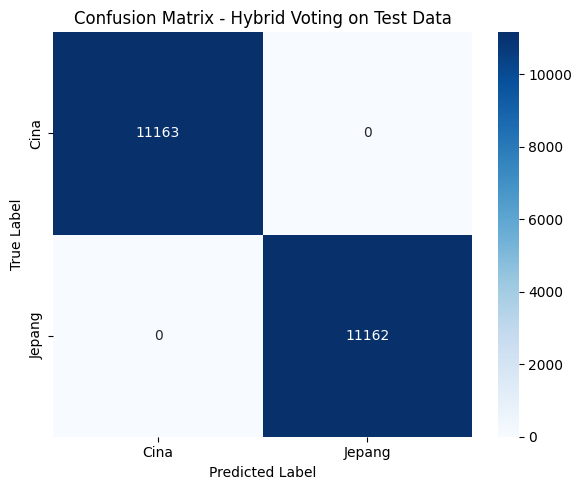


📊 Classification Report (Test Data - Hybrid Voting):
              precision  recall  f1-score  support
Cina                1.0     1.0       1.0  11163.0
Jepang              1.0     1.0       1.0  11162.0
accuracy            1.0     1.0       1.0      1.0
macro avg           1.0     1.0       1.0  22325.0
weighted avg        1.0     1.0       1.0  22325.0


In [ ]:
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import normalize
from sklearn.metrics.pairwise import cosine_distances

# ==== Load model, test set, dan clustering (SETELAH FILTERING) ====
svm_model = joblib.load("Hasil_NoPadding/svm_model_NoPadding.pkl")
test_data = joblib.load("Hasil_NoPadding/svm_testset_NoPadding.pkl")
clustering = joblib.load("Hasil_NoPadding/discriminative_clustering_nopadding.pkl")

X_test = test_data["X_test"]
y_test = test_data["y_test"]
centroids_norm = clustering["centroids"]

# ==== Konfigurasi baru ====
ALPHA = 0.27
BETA = 0.73
JEPANG_CLUSTERS = [0, 1, 3]  # klaster dominan Jepang
CINA_CLUSTERS = [2, 4]       # klaster dominan Cina

# ==== Fungsi Hybrid Voting: Perbandingan Jepang vs Cina ====
def hybrid_predict_feature(feat_norm):
    proba = svm_model.predict_proba(feat_norm)[0]
    dists = cosine_distances(feat_norm, centroids_norm)[0]

    japan_score = np.mean([1.0 / (dists[c] + 1e-8) for c in JEPANG_CLUSTERS])
    cina_score = np.mean([1.0 / (dists[c] + 1e-8) for c in CINA_CLUSTERS])

    # Versi baru: rasio langsung Jepang/Cina
    hybrid_score = ALPHA * (japan_score / (cina_score + 1e-8)) + BETA * proba[1]

    return 1 if hybrid_score > 0.5 else 0


# ==== Hybrid predict untuk semua X_test ====
predictions = []
for feat in X_test:
    feat_norm = normalize(feat.reshape(1, -1))
    pred = hybrid_predict_feature(feat_norm)
    predictions.append(pred)

# ==== Evaluation ====
report = classification_report(y_test, predictions, target_names=["Cina", "Jepang"], output_dict=True)
cm = confusion_matrix(y_test, predictions)

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Cina", "Jepang"], yticklabels=["Cina", "Jepang"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Hybrid Voting on Test Data")
plt.tight_layout()
plt.show()

print("\n📊 Classification Report (Test Data - Hybrid Voting):")
print(pd.DataFrame(report).T)

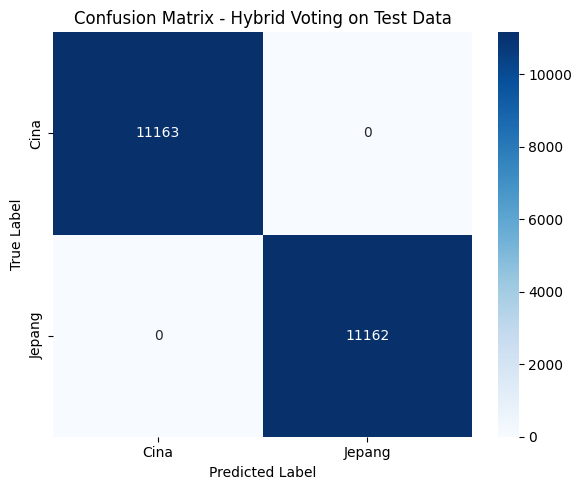


📊 Classification Report (Test Data - Hybrid Voting):
              precision  recall  f1-score  support
Cina                1.0     1.0       1.0  11163.0
Jepang              1.0     1.0       1.0  11162.0
accuracy            1.0     1.0       1.0      1.0
macro avg           1.0     1.0       1.0  22325.0
weighted avg        1.0     1.0       1.0  22325.0


In [ ]:
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import normalize
from sklearn.metrics.pairwise import cosine_distances

# ==== Load model, test set, dan clustering (SETELAH FILTERING) ====
svm_model = joblib.load("Hasil_NoPadding/svm_model_NoPadding.pkl")
test_data = joblib.load("Hasil_NoPadding/svm_testset_NoPadding.pkl")
clustering = joblib.load("Hasil_NoPadding/discriminative_clustering_nopadding.pkl")

X_test = test_data["X_test"]
y_test = test_data["y_test"]
centroids_norm = clustering["centroids"]

# ==== Konfigurasi baru ====
ALPHA = 0.26
BETA = 0.74
JEPANG_CLUSTERS = [0, 1, 3]  # klaster dominan Jepang
CINA_CLUSTERS = [2, 4]       # klaster dominan Cina

# ==== Fungsi Hybrid Voting: Perbandingan Jepang vs Cina ====
def hybrid_predict_feature(feat_norm):
    proba = svm_model.predict_proba(feat_norm)[0]
    dists = cosine_distances(feat_norm, centroids_norm)[0]

    japan_score = np.mean([1.0 / (dists[c] + 1e-8) for c in JEPANG_CLUSTERS])
    cina_score = np.mean([1.0 / (dists[c] + 1e-8) for c in CINA_CLUSTERS])

    # Versi baru: rasio langsung Jepang/Cina
    hybrid_score = ALPHA * (japan_score / (cina_score + 1e-8)) + BETA * proba[1]

    return 1 if hybrid_score > 0.5 else 0


# ==== Hybrid predict untuk semua X_test ====
predictions = []
for feat in X_test:
    feat_norm = normalize(feat.reshape(1, -1))
    pred = hybrid_predict_feature(feat_norm)
    predictions.append(pred)

# ==== Evaluation ====
report = classification_report(y_test, predictions, target_names=["Cina", "Jepang"], output_dict=True)
cm = confusion_matrix(y_test, predictions)

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Cina", "Jepang"], yticklabels=["Cina", "Jepang"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Hybrid Voting on Test Data")
plt.tight_layout()
plt.show()

print("\n📊 Classification Report (Test Data - Hybrid Voting):")
print(pd.DataFrame(report).T)

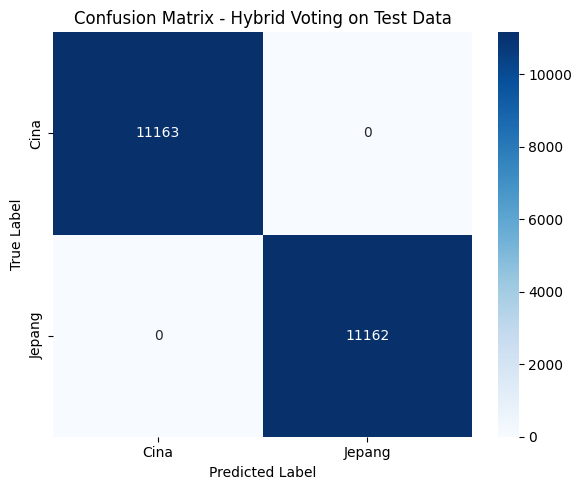


📊 Classification Report (Test Data - Hybrid Voting):
              precision  recall  f1-score  support
Cina                1.0     1.0       1.0  11163.0
Jepang              1.0     1.0       1.0  11162.0
accuracy            1.0     1.0       1.0      1.0
macro avg           1.0     1.0       1.0  22325.0
weighted avg        1.0     1.0       1.0  22325.0


In [ ]:
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import normalize
from sklearn.metrics.pairwise import cosine_distances

# ==== Load model, test set, dan clustering (SETELAH FILTERING) ====
svm_model = joblib.load("Hasil_NoPadding/svm_model_NoPadding.pkl")
test_data = joblib.load("Hasil_NoPadding/svm_testset_NoPadding.pkl")
clustering = joblib.load("Hasil_NoPadding/discriminative_clustering_nopadding.pkl")

X_test = test_data["X_test"]
y_test = test_data["y_test"]
centroids_norm = clustering["centroids"]

# ==== Konfigurasi baru ====
ALPHA = 0.25
BETA = 0.75
JEPANG_CLUSTERS = [0, 1, 3]  # klaster dominan Jepang
CINA_CLUSTERS = [2, 4]       # klaster dominan Cina

# ==== Fungsi Hybrid Voting: Perbandingan Jepang vs Cina ====
def hybrid_predict_feature(feat_norm):
    proba = svm_model.predict_proba(feat_norm)[0]
    dists = cosine_distances(feat_norm, centroids_norm)[0]

    japan_score = np.mean([1.0 / (dists[c] + 1e-8) for c in JEPANG_CLUSTERS])
    cina_score = np.mean([1.0 / (dists[c] + 1e-8) for c in CINA_CLUSTERS])

    # Versi baru: rasio langsung Jepang/Cina
    hybrid_score = ALPHA * (japan_score / (cina_score + 1e-8)) + BETA * proba[1]

    return 1 if hybrid_score > 0.5 else 0


# ==== Hybrid predict untuk semua X_test ====
predictions = []
for feat in X_test:
    feat_norm = normalize(feat.reshape(1, -1))
    pred = hybrid_predict_feature(feat_norm)
    predictions.append(pred)

# ==== Evaluation ====
report = classification_report(y_test, predictions, target_names=["Cina", "Jepang"], output_dict=True)
cm = confusion_matrix(y_test, predictions)

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Cina", "Jepang"], yticklabels=["Cina", "Jepang"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Hybrid Voting on Test Data")
plt.tight_layout()
plt.show()

print("\n📊 Classification Report (Test Data - Hybrid Voting):")
print(pd.DataFrame(report).T)

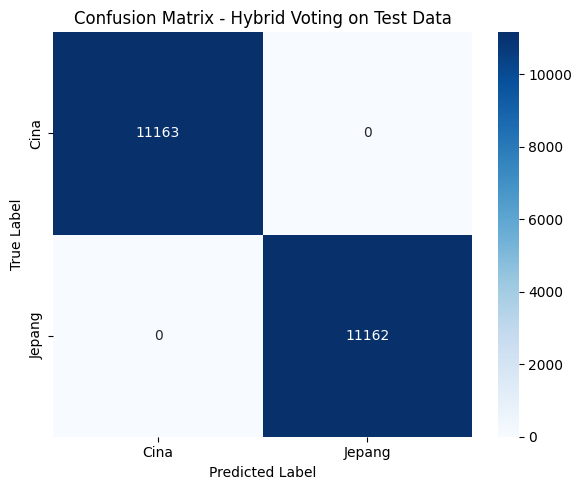


📊 Classification Report (Test Data - Hybrid Voting):
              precision  recall  f1-score  support
Cina                1.0     1.0       1.0  11163.0
Jepang              1.0     1.0       1.0  11162.0
accuracy            1.0     1.0       1.0      1.0
macro avg           1.0     1.0       1.0  22325.0
weighted avg        1.0     1.0       1.0  22325.0


In [ ]:
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import normalize
from sklearn.metrics.pairwise import cosine_distances

# ==== Load model, test set, dan clustering (SETELAH FILTERING) ====
svm_model = joblib.load("Hasil_NoPadding/svm_model_NoPadding.pkl")
test_data = joblib.load("Hasil_NoPadding/svm_testset_NoPadding.pkl")
clustering = joblib.load("Hasil_NoPadding/discriminative_clustering_nopadding.pkl")

X_test = test_data["X_test"]
y_test = test_data["y_test"]
centroids_norm = clustering["centroids"]

# ==== Konfigurasi baru ====
ALPHA = 0.24
BETA = 0.76
JEPANG_CLUSTERS = [0, 1, 3]  # klaster dominan Jepang
CINA_CLUSTERS = [2, 4]       # klaster dominan Cina

# ==== Fungsi Hybrid Voting: Perbandingan Jepang vs Cina ====
def hybrid_predict_feature(feat_norm):
    proba = svm_model.predict_proba(feat_norm)[0]
    dists = cosine_distances(feat_norm, centroids_norm)[0]

    japan_score = np.mean([1.0 / (dists[c] + 1e-8) for c in JEPANG_CLUSTERS])
    cina_score = np.mean([1.0 / (dists[c] + 1e-8) for c in CINA_CLUSTERS])

    # Versi baru: rasio langsung Jepang/Cina
    hybrid_score = ALPHA * (japan_score / (cina_score + 1e-8)) + BETA * proba[1]

    return 1 if hybrid_score > 0.5 else 0


# ==== Hybrid predict untuk semua X_test ====
predictions = []
for feat in X_test:
    feat_norm = normalize(feat.reshape(1, -1))
    pred = hybrid_predict_feature(feat_norm)
    predictions.append(pred)

# ==== Evaluation ====
report = classification_report(y_test, predictions, target_names=["Cina", "Jepang"], output_dict=True)
cm = confusion_matrix(y_test, predictions)

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Cina", "Jepang"], yticklabels=["Cina", "Jepang"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Hybrid Voting on Test Data")
plt.tight_layout()
plt.show()

print("\n📊 Classification Report (Test Data - Hybrid Voting):")
print(pd.DataFrame(report).T)

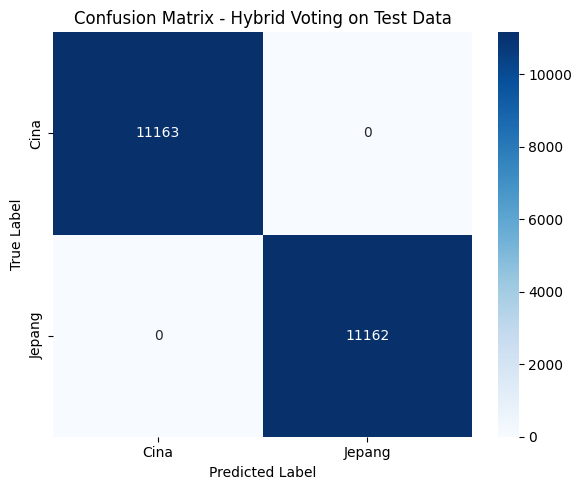


📊 Classification Report (Test Data - Hybrid Voting):
              precision  recall  f1-score  support
Cina                1.0     1.0       1.0  11163.0
Jepang              1.0     1.0       1.0  11162.0
accuracy            1.0     1.0       1.0      1.0
macro avg           1.0     1.0       1.0  22325.0
weighted avg        1.0     1.0       1.0  22325.0


In [ ]:
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import normalize
from sklearn.metrics.pairwise import cosine_distances

# ==== Load model, test set, dan clustering (SETELAH FILTERING) ====
svm_model = joblib.load("Hasil_NoPadding/svm_model_NoPadding.pkl")
test_data = joblib.load("Hasil_NoPadding/svm_testset_NoPadding.pkl")
clustering = joblib.load("Hasil_NoPadding/discriminative_clustering_nopadding.pkl")

X_test = test_data["X_test"]
y_test = test_data["y_test"]
centroids_norm = clustering["centroids"]

# ==== Konfigurasi baru ====
ALPHA = 0.23
BETA = 0.77
JEPANG_CLUSTERS = [0, 1, 3]  # klaster dominan Jepang
CINA_CLUSTERS = [2, 4]       # klaster dominan Cina

# ==== Fungsi Hybrid Voting: Perbandingan Jepang vs Cina ====
def hybrid_predict_feature(feat_norm):
    proba = svm_model.predict_proba(feat_norm)[0]
    dists = cosine_distances(feat_norm, centroids_norm)[0]

    japan_score = np.mean([1.0 / (dists[c] + 1e-8) for c in JEPANG_CLUSTERS])
    cina_score = np.mean([1.0 / (dists[c] + 1e-8) for c in CINA_CLUSTERS])

    # Versi baru: rasio langsung Jepang/Cina
    hybrid_score = ALPHA * (japan_score / (cina_score + 1e-8)) + BETA * proba[1]

    return 1 if hybrid_score > 0.5 else 0


# ==== Hybrid predict untuk semua X_test ====
predictions = []
for feat in X_test:
    feat_norm = normalize(feat.reshape(1, -1))
    pred = hybrid_predict_feature(feat_norm)
    predictions.append(pred)

# ==== Evaluation ====
report = classification_report(y_test, predictions, target_names=["Cina", "Jepang"], output_dict=True)
cm = confusion_matrix(y_test, predictions)

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Cina", "Jepang"], yticklabels=["Cina", "Jepang"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Hybrid Voting on Test Data")
plt.tight_layout()
plt.show()

print("\n📊 Classification Report (Test Data - Hybrid Voting):")
print(pd.DataFrame(report).T)

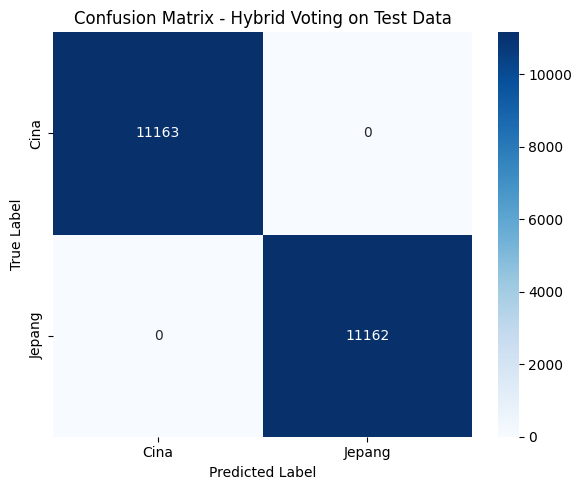


📊 Classification Report (Test Data - Hybrid Voting):
              precision  recall  f1-score  support
Cina                1.0     1.0       1.0  11163.0
Jepang              1.0     1.0       1.0  11162.0
accuracy            1.0     1.0       1.0      1.0
macro avg           1.0     1.0       1.0  22325.0
weighted avg        1.0     1.0       1.0  22325.0


In [ ]:
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import normalize
from sklearn.metrics.pairwise import cosine_distances

# ==== Load model, test set, dan clustering (SETELAH FILTERING) ====
svm_model = joblib.load("Hasil_NoPadding/svm_model_NoPadding.pkl")
test_data = joblib.load("Hasil_NoPadding/svm_testset_NoPadding.pkl")
clustering = joblib.load("Hasil_NoPadding/discriminative_clustering_nopadding.pkl")

X_test = test_data["X_test"]
y_test = test_data["y_test"]
centroids_norm = clustering["centroids"]

# ==== Konfigurasi baru ====
ALPHA = 0.22
BETA = 0.78
JEPANG_CLUSTERS = [0, 1, 3]  # klaster dominan Jepang
CINA_CLUSTERS = [2, 4]       # klaster dominan Cina

# ==== Fungsi Hybrid Voting: Perbandingan Jepang vs Cina ====
def hybrid_predict_feature(feat_norm):
    proba = svm_model.predict_proba(feat_norm)[0]
    dists = cosine_distances(feat_norm, centroids_norm)[0]

    japan_score = np.mean([1.0 / (dists[c] + 1e-8) for c in JEPANG_CLUSTERS])
    cina_score = np.mean([1.0 / (dists[c] + 1e-8) for c in CINA_CLUSTERS])

    # Versi baru: rasio langsung Jepang/Cina
    hybrid_score = ALPHA * (japan_score / (cina_score + 1e-8)) + BETA * proba[1]

    return 1 if hybrid_score > 0.5 else 0


# ==== Hybrid predict untuk semua X_test ====
predictions = []
for feat in X_test:
    feat_norm = normalize(feat.reshape(1, -1))
    pred = hybrid_predict_feature(feat_norm)
    predictions.append(pred)

# ==== Evaluation ====
report = classification_report(y_test, predictions, target_names=["Cina", "Jepang"], output_dict=True)
cm = confusion_matrix(y_test, predictions)

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Cina", "Jepang"], yticklabels=["Cina", "Jepang"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Hybrid Voting on Test Data")
plt.tight_layout()
plt.show()

print("\n📊 Classification Report (Test Data - Hybrid Voting):")
print(pd.DataFrame(report).T)

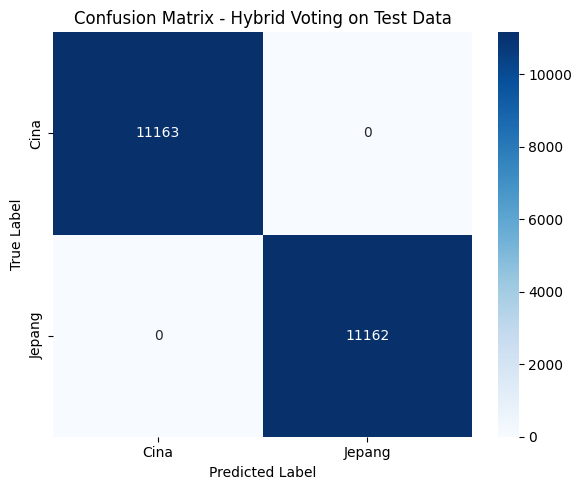


📊 Classification Report (Test Data - Hybrid Voting):
              precision  recall  f1-score  support
Cina                1.0     1.0       1.0  11163.0
Jepang              1.0     1.0       1.0  11162.0
accuracy            1.0     1.0       1.0      1.0
macro avg           1.0     1.0       1.0  22325.0
weighted avg        1.0     1.0       1.0  22325.0


In [ ]:
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import normalize
from sklearn.metrics.pairwise import cosine_distances

# ==== Load model, test set, dan clustering (SETELAH FILTERING) ====
svm_model = joblib.load("Hasil_NoPadding/svm_model_NoPadding.pkl")
test_data = joblib.load("Hasil_NoPadding/svm_testset_NoPadding.pkl")
clustering = joblib.load("Hasil_NoPadding/discriminative_clustering_nopadding.pkl")

X_test = test_data["X_test"]
y_test = test_data["y_test"]
centroids_norm = clustering["centroids"]

# ==== Konfigurasi baru ====
ALPHA = 0.21
BETA = 0.79
JEPANG_CLUSTERS = [0, 1, 3]  # klaster dominan Jepang
CINA_CLUSTERS = [2, 4]       # klaster dominan Cina

# ==== Fungsi Hybrid Voting: Perbandingan Jepang vs Cina ====
def hybrid_predict_feature(feat_norm):
    proba = svm_model.predict_proba(feat_norm)[0]
    dists = cosine_distances(feat_norm, centroids_norm)[0]

    japan_score = np.mean([1.0 / (dists[c] + 1e-8) for c in JEPANG_CLUSTERS])
    cina_score = np.mean([1.0 / (dists[c] + 1e-8) for c in CINA_CLUSTERS])

    # Versi baru: rasio langsung Jepang/Cina
    hybrid_score = ALPHA * (japan_score / (cina_score + 1e-8)) + BETA * proba[1]

    return 1 if hybrid_score > 0.5 else 0


# ==== Hybrid predict untuk semua X_test ====
predictions = []
for feat in X_test:
    feat_norm = normalize(feat.reshape(1, -1))
    pred = hybrid_predict_feature(feat_norm)
    predictions.append(pred)

# ==== Evaluation ====
report = classification_report(y_test, predictions, target_names=["Cina", "Jepang"], output_dict=True)
cm = confusion_matrix(y_test, predictions)

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Cina", "Jepang"], yticklabels=["Cina", "Jepang"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Hybrid Voting on Test Data")
plt.tight_layout()
plt.show()

print("\n📊 Classification Report (Test Data - Hybrid Voting):")
print(pd.DataFrame(report).T)

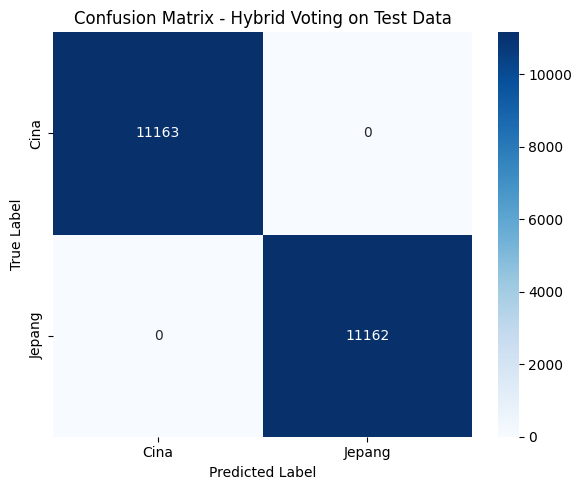


📊 Classification Report (Test Data - Hybrid Voting):
              precision  recall  f1-score  support
Cina                1.0     1.0       1.0  11163.0
Jepang              1.0     1.0       1.0  11162.0
accuracy            1.0     1.0       1.0      1.0
macro avg           1.0     1.0       1.0  22325.0
weighted avg        1.0     1.0       1.0  22325.0


In [ ]:
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import normalize
from sklearn.metrics.pairwise import cosine_distances

# ==== Load model, test set, dan clustering (SETELAH FILTERING) ====
svm_model = joblib.load("Hasil_NoPadding/svm_model_NoPadding.pkl")
test_data = joblib.load("Hasil_NoPadding/svm_testset_NoPadding.pkl")
clustering = joblib.load("Hasil_NoPadding/discriminative_clustering_nopadding.pkl")

X_test = test_data["X_test"]
y_test = test_data["y_test"]
centroids_norm = clustering["centroids"]

# ==== Konfigurasi baru ====
ALPHA = 0.2
BETA = 0.8
JEPANG_CLUSTERS = [0, 1, 3]  # klaster dominan Jepang
CINA_CLUSTERS = [2, 4]       # klaster dominan Cina

# ==== Fungsi Hybrid Voting: Perbandingan Jepang vs Cina ====
def hybrid_predict_feature(feat_norm):
    proba = svm_model.predict_proba(feat_norm)[0]
    dists = cosine_distances(feat_norm, centroids_norm)[0]

    japan_score = np.mean([1.0 / (dists[c] + 1e-8) for c in JEPANG_CLUSTERS])
    cina_score = np.mean([1.0 / (dists[c] + 1e-8) for c in CINA_CLUSTERS])

    # Versi baru: rasio langsung Jepang/Cina
    hybrid_score = ALPHA * (japan_score / (cina_score + 1e-8)) + BETA * proba[1]

    return 1 if hybrid_score > 0.5 else 0


# ==== Hybrid predict untuk semua X_test ====
predictions = []
for feat in X_test:
    feat_norm = normalize(feat.reshape(1, -1))
    pred = hybrid_predict_feature(feat_norm)
    predictions.append(pred)

# ==== Evaluation ====
report = classification_report(y_test, predictions, target_names=["Cina", "Jepang"], output_dict=True)
cm = confusion_matrix(y_test, predictions)

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Cina", "Jepang"], yticklabels=["Cina", "Jepang"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Hybrid Voting on Test Data")
plt.tight_layout()
plt.show()

print("\n📊 Classification Report (Test Data - Hybrid Voting):")
print(pd.DataFrame(report).T)

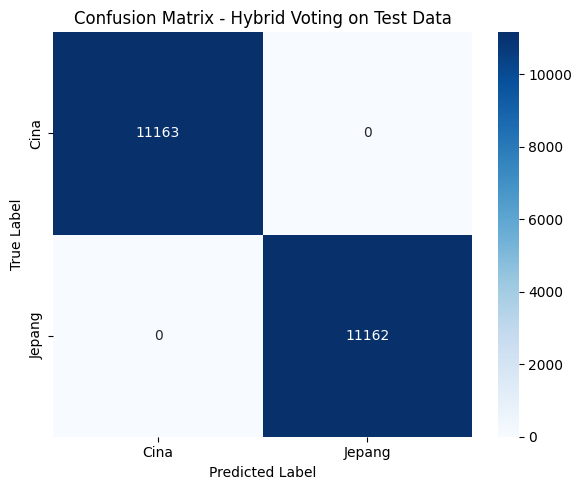


📊 Classification Report (Test Data - Hybrid Voting):
              precision  recall  f1-score  support
Cina                1.0     1.0       1.0  11163.0
Jepang              1.0     1.0       1.0  11162.0
accuracy            1.0     1.0       1.0      1.0
macro avg           1.0     1.0       1.0  22325.0
weighted avg        1.0     1.0       1.0  22325.0


In [ ]:
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import normalize
from sklearn.metrics.pairwise import cosine_distances

# ==== Load model, test set, dan clustering (SETELAH FILTERING) ====
svm_model = joblib.load("Hasil_NoPadding/svm_model_NoPadding.pkl")
test_data = joblib.load("Hasil_NoPadding/svm_testset_NoPadding.pkl")
clustering = joblib.load("Hasil_NoPadding/discriminative_clustering_nopadding.pkl")

X_test = test_data["X_test"]
y_test = test_data["y_test"]
centroids_norm = clustering["centroids"]

# ==== Konfigurasi baru ====
ALPHA = 0.1
BETA = 0.9
JEPANG_CLUSTERS = [0, 1, 3]  # klaster dominan Jepang
CINA_CLUSTERS = [2, 4]       # klaster dominan Cina

# ==== Fungsi Hybrid Voting: Perbandingan Jepang vs Cina ====
def hybrid_predict_feature(feat_norm):
    proba = svm_model.predict_proba(feat_norm)[0]
    dists = cosine_distances(feat_norm, centroids_norm)[0]

    japan_score = np.mean([1.0 / (dists[c] + 1e-8) for c in JEPANG_CLUSTERS])
    cina_score = np.mean([1.0 / (dists[c] + 1e-8) for c in CINA_CLUSTERS])

    # Versi baru: rasio langsung Jepang/Cina
    hybrid_score = ALPHA * (japan_score / (cina_score + 1e-8)) + BETA * proba[1]

    return 1 if hybrid_score > 0.5 else 0


# ==== Hybrid predict untuk semua X_test ====
predictions = []
for feat in X_test:
    feat_norm = normalize(feat.reshape(1, -1))
    pred = hybrid_predict_feature(feat_norm)
    predictions.append(pred)

# ==== Evaluation ====
report = classification_report(y_test, predictions, target_names=["Cina", "Jepang"], output_dict=True)
cm = confusion_matrix(y_test, predictions)

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Cina", "Jepang"], yticklabels=["Cina", "Jepang"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Hybrid Voting on Test Data")
plt.tight_layout()
plt.show()

print("\n📊 Classification Report (Test Data - Hybrid Voting):")
print(pd.DataFrame(report).T)

# MODEL HYBRID FINAL

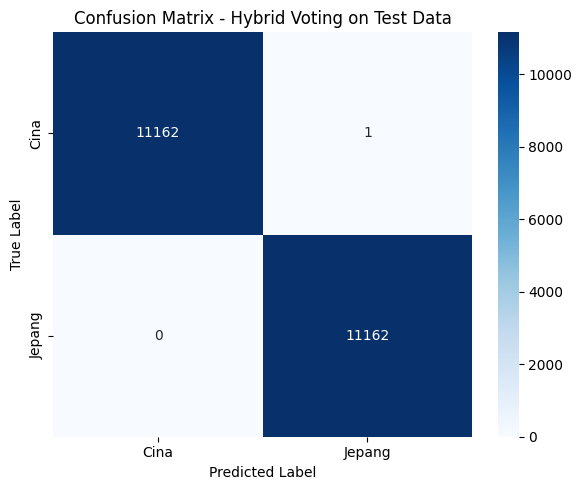


📊 Classification Report (Test Data - Hybrid Voting):
              precision    recall  f1-score       support
Cina           1.000000  0.999910  0.999955  11163.000000
Jepang         0.999910  1.000000  0.999955  11162.000000
accuracy       0.999955  0.999955  0.999955      0.999955
macro avg      0.999955  0.999955  0.999955  22325.000000
weighted avg   0.999955  0.999955  0.999955  22325.000000


In [ ]:
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import normalize
from sklearn.metrics.pairwise import cosine_distances

# ==== Load model, test set, dan clustering (SETELAH FILTERING) ====
svm_model = joblib.load("Hasil_NoPadding/svm_model_NoPadding.pkl")
test_data = joblib.load("Hasil_NoPadding/svm_testset_NoPadding.pkl")
clustering = joblib.load("Hasil_NoPadding/discriminative_clustering_nopadding.pkl")

X_test = test_data["X_test"]
y_test = test_data["y_test"]
centroids_norm = clustering["centroids"]

# ==== Konfigurasi baru ====
ALPHA = 0.4
BETA = 0.6
JEPANG_CLUSTERS = [0, 1, 3]  # klaster dominan Jepang
CINA_CLUSTERS = [2, 4]       # klaster dominan Cina

# ==== Fungsi Hybrid Voting: Perbandingan Jepang vs Cina ====
def hybrid_predict_feature(feat_norm):
    proba = svm_model.predict_proba(feat_norm)[0]
    dists = cosine_distances(feat_norm, centroids_norm)[0]

    japan_score = np.mean([1.0 / (dists[c] + 1e-8) for c in JEPANG_CLUSTERS])
    cina_score = np.mean([1.0 / (dists[c] + 1e-8) for c in CINA_CLUSTERS])

    # Versi baru: rasio langsung Jepang/Cina
    hybrid_score = ALPHA * (japan_score / (cina_score + 1e-8)) + BETA * proba[1]

    return 1 if hybrid_score > 0.5 else 0


# ==== Hybrid predict untuk semua X_test ====
predictions = []
for feat in X_test:
    feat_norm = normalize(feat.reshape(1, -1))
    pred = hybrid_predict_feature(feat_norm)
    predictions.append(pred)

# ==== Evaluation ====
report = classification_report(y_test, predictions, target_names=["Cina", "Jepang"], output_dict=True)
cm = confusion_matrix(y_test, predictions)

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Cina", "Jepang"], yticklabels=["Cina", "Jepang"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Hybrid Voting on Test Data")
plt.tight_layout()
plt.show()

print("\n📊 Classification Report (Test Data - Hybrid Voting):")
print(pd.DataFrame(report).T)

Evaluating dataset_negatif: 100%|██████████| 100/100 [00:15<00:00,  6.27it/s]


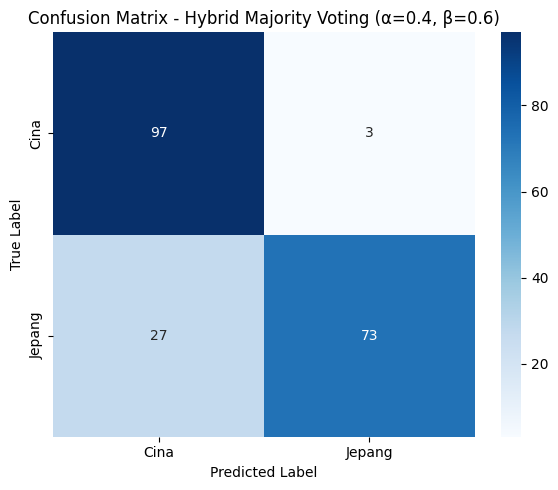


📊 Classification Report:
              precision  recall  f1-score  support
Cina           0.782258    0.97  0.866071   100.00
Jepang         0.960526    0.73  0.829545   100.00
accuracy       0.850000    0.85  0.850000     0.85
macro avg      0.871392    0.85  0.847808   200.00
weighted avg   0.871392    0.85  0.847808   200.00


In [ ]:
import os
import random
import cv2
import numpy as np
from collections import Counter
from tqdm import tqdm
from joblib import load
from sklearn.preprocessing import normalize
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics.pairwise import cosine_distances
from tensorflow.keras.applications.resnet50 import preprocess_input, ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# ==== Load model dan komponen ====
svm_model = joblib.load("Hasil_NoPadding/svm_model_NoPadding.pkl")
clustering = joblib.load("Hasil_NoPadding/discriminative_clustering_nopadding.pkl")
pca_model = load("Hasil_NoPadding/pca_1024_nopadding.pkl")
clustering = load("Hasil_NoPadding/discriminative_clustering_nopadding.pkl")
centroids_norm = clustering["centroids"]

# ==== CNN Feature Extractor ====
base_model = ResNet50(weights="imagenet", include_top=False)
gap = GlobalAveragePooling2D()(base_model.output)
feature_extractor = Model(inputs=base_model.input, outputs=gap)

# ==== Konfigurasi ====
PATCH_SIZE = 224
STRIDE = 112
COLOR_STD_THRESHOLD = 20
EDGE_THRESHOLD = 1200
PADDING_BLACK_RATIO_THRESHOLD = 0.2  # Maksimal 20% area hitam

ALPHA = 0.4
BETA = 0.6
JEPANG_CLUSTERS = [0, 1, 3]  # klaster dominan Jepang
CINA_CLUSTERS = [2, 4]       # klaster dominan Cina

# ==== Fungsi ====
def is_valid_patch(patch):
    gray = cv2.cvtColor(patch, cv2.COLOR_RGB2GRAY)

    # 1️⃣ Filter: Rasio area hitam (padding)
    black_ratio = np.sum(gray < 10) / gray.size
    if black_ratio > PADDING_BLACK_RATIO_THRESHOLD:
        return False

    # 2️⃣ Filter: Variasi warna
    std = np.std(gray)
    if std < COLOR_STD_THRESHOLD:
        return False

    # 3️⃣ Filter: Jumlah edge
    edge = np.sum(cv2.Canny(gray, 50, 150) > 0)
    if edge < EDGE_THRESHOLD:
        return False

    return True

def extract_valid_patches(image):
    h, w = image.shape[:2]
    patches = []
    for y in range(0, h - PATCH_SIZE + 1, STRIDE):
        for x in range(0, w - PATCH_SIZE + 1, STRIDE):
            patch = image[y:y+PATCH_SIZE, x:x+PATCH_SIZE]
            if patch.shape[:2] == (PATCH_SIZE, PATCH_SIZE) and is_valid_patch(patch):
                patches.append(patch)
    return patches

def classify_patch_hybrid(patch):
    resized = cv2.resize(patch, (224, 224))
    inp = preprocess_input(np.expand_dims(resized, axis=0))
    feat = feature_extractor.predict(inp, verbose=0)
    feat_pca = pca_model.transform(feat)
    feat_norm = normalize(feat_pca)

    # === Probabilitas dari SVM
    proba = svm_model.predict_proba(feat_norm)[0]

    # === Jarak ke semua centroid
    dists = cosine_distances(feat_norm, centroids_norm)[0]

    # === Hitung skor kedekatan ke cluster Jepang dan Cina
    japan_score = np.mean([1.0 / (dists[i] + 1e-8) for i in JEPANG_CLUSTERS])
    cina_score = np.mean([1.0 / (dists[i] + 1e-8) for i in CINA_CLUSTERS])

    # === Hybrid Score sebagai selisih (Jepang - Cina)
    hybrid_score = ALPHA * (japan_score / (cina_score + 1e-8)) + BETA * proba[1]

    return 1 if hybrid_score > 0.5 else 0

# 🔁 NEW: Mayoritas voting (bukan min_ratio)
def classify_image_majority(path):
    image = cv2.imread(path)
    if image is None:
        return 0
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    patches = extract_valid_patches(image_rgb)
    if not patches:
        return 0
    preds = [classify_patch_hybrid(p) for p in patches]
    count = Counter(preds)
    return count.most_common(1)[0][0]

def evaluate_random(folder_path, true_label, sample_size=100, seed=42):
    preds, labels = [], []
    files = [f for f in os.listdir(folder_path) if f.lower().endswith((".jpg", ".jpeg", ".png"))]
    random.seed(seed)
    selected = random.sample(files, min(sample_size, len(files)))
    for fname in tqdm(selected, desc=f"Evaluating {folder_path}"):
        pred = classify_image_majority(os.path.join(folder_path, fname))  # gunakan majority voting
        preds.append(pred)
        labels.append(true_label)
    return labels, preds

# ==== Evaluasi 100 gambar acak dari masing-masing kelas ====
true_pos, pred_pos = evaluate_random("dataset_positif", 1, sample_size=100)
true_neg, pred_neg = evaluate_random("dataset_negatif", 0, sample_size=100)

all_true = true_pos + true_neg
all_pred = pred_pos + pred_neg

# ==== Evaluasi ====
report = classification_report(all_true, all_pred, target_names=["Cina", "Jepang"], output_dict=True)
cm = confusion_matrix(all_true, all_pred)

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Cina", "Jepang"], yticklabels=["Cina", "Jepang"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title(f"Confusion Matrix - Hybrid Majority Voting (α={ALPHA}, β={BETA})")
plt.tight_layout()
plt.show()

print("\n📊 Classification Report:")
print(pd.DataFrame(report).T)

Evaluating dataset_negatif: 100%|██████████| 100/100 [00:13<00:00,  7.17it/s]


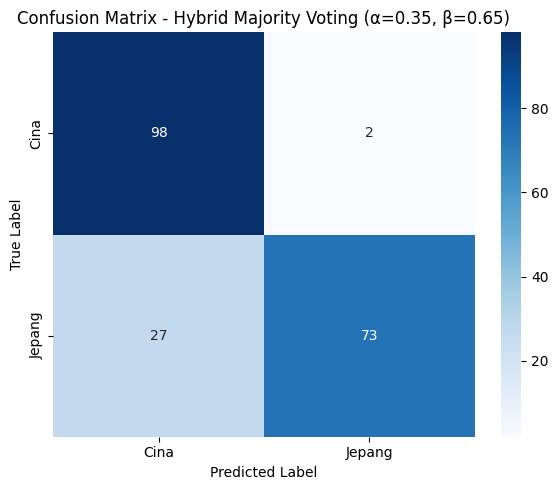


📊 Classification Report:
              precision  recall  f1-score  support
Cina           0.784000   0.980  0.871111  100.000
Jepang         0.973333   0.730  0.834286  100.000
accuracy       0.855000   0.855  0.855000    0.855
macro avg      0.878667   0.855  0.852698  200.000
weighted avg   0.878667   0.855  0.852698  200.000


In [ ]:
import os
import random
import cv2
import numpy as np
from collections import Counter
from tqdm import tqdm
from joblib import load
from sklearn.preprocessing import normalize
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics.pairwise import cosine_distances
from tensorflow.keras.applications.resnet50 import preprocess_input, ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# ==== Load model dan komponen ====
svm_model = joblib.load("Hasil_NoPadding/svm_model_NoPadding.pkl")
clustering = joblib.load("Hasil_NoPadding/discriminative_clustering_nopadding.pkl")
pca_model = load("Hasil_NoPadding/pca_1024_nopadding.pkl")
clustering = load("Hasil_NoPadding/discriminative_clustering_nopadding.pkl")
centroids_norm = clustering["centroids"]

# ==== CNN Feature Extractor ====
base_model = ResNet50(weights="imagenet", include_top=False)
gap = GlobalAveragePooling2D()(base_model.output)
feature_extractor = Model(inputs=base_model.input, outputs=gap)

# ==== Konfigurasi ====
PATCH_SIZE = 224
STRIDE = 112
COLOR_STD_THRESHOLD = 20
EDGE_THRESHOLD = 1200
PADDING_BLACK_RATIO_THRESHOLD = 0.2  # Maksimal 20% area hitam

ALPHA = 0.35
BETA = 0.65
JEPANG_CLUSTERS = [0, 1, 3]  # klaster dominan Jepang
CINA_CLUSTERS = [2, 4]       # klaster dominan Cina

# ==== Fungsi ====
def is_valid_patch(patch):
    gray = cv2.cvtColor(patch, cv2.COLOR_RGB2GRAY)

    # 1️⃣ Filter: Rasio area hitam (padding)
    black_ratio = np.sum(gray < 10) / gray.size
    if black_ratio > PADDING_BLACK_RATIO_THRESHOLD:
        return False

    # 2️⃣ Filter: Variasi warna
    std = np.std(gray)
    if std < COLOR_STD_THRESHOLD:
        return False

    # 3️⃣ Filter: Jumlah edge
    edge = np.sum(cv2.Canny(gray, 50, 150) > 0)
    if edge < EDGE_THRESHOLD:
        return False

    return True

def extract_valid_patches(image):
    h, w = image.shape[:2]
    patches = []
    for y in range(0, h - PATCH_SIZE + 1, STRIDE):
        for x in range(0, w - PATCH_SIZE + 1, STRIDE):
            patch = image[y:y+PATCH_SIZE, x:x+PATCH_SIZE]
            if patch.shape[:2] == (PATCH_SIZE, PATCH_SIZE) and is_valid_patch(patch):
                patches.append(patch)
    return patches

def classify_patch_hybrid(patch):
    resized = cv2.resize(patch, (224, 224))
    inp = preprocess_input(np.expand_dims(resized, axis=0))
    feat = feature_extractor.predict(inp, verbose=0)
    feat_pca = pca_model.transform(feat)
    feat_norm = normalize(feat_pca)

    # === Probabilitas dari SVM
    proba = svm_model.predict_proba(feat_norm)[0]

    # === Jarak ke semua centroid
    dists = cosine_distances(feat_norm, centroids_norm)[0]

    # === Hitung skor kedekatan ke cluster Jepang dan Cina
    japan_score = np.mean([1.0 / (dists[i] + 1e-8) for i in JEPANG_CLUSTERS])
    cina_score = np.mean([1.0 / (dists[i] + 1e-8) for i in CINA_CLUSTERS])

    # === Hybrid Score sebagai selisih (Jepang - Cina)
    hybrid_score = ALPHA * (japan_score / (cina_score + 1e-8)) + BETA * proba[1]

    return 1 if hybrid_score > 0.5 else 0

# 🔁 NEW: Mayoritas voting (bukan min_ratio)
def classify_image_majority(path):
    image = cv2.imread(path)
    if image is None:
        return 0
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    patches = extract_valid_patches(image_rgb)
    if not patches:
        return 0
    preds = [classify_patch_hybrid(p) for p in patches]
    count = Counter(preds)
    return count.most_common(1)[0][0]

def evaluate_random(folder_path, true_label, sample_size=100, seed=42):
    preds, labels = [], []
    files = [f for f in os.listdir(folder_path) if f.lower().endswith((".jpg", ".jpeg", ".png"))]
    random.seed(seed)
    selected = random.sample(files, min(sample_size, len(files)))
    for fname in tqdm(selected, desc=f"Evaluating {folder_path}"):
        pred = classify_image_majority(os.path.join(folder_path, fname))  # gunakan majority voting
        preds.append(pred)
        labels.append(true_label)
    return labels, preds

# ==== Evaluasi 100 gambar acak dari masing-masing kelas ====
true_pos, pred_pos = evaluate_random("dataset_positif", 1, sample_size=100)
true_neg, pred_neg = evaluate_random("dataset_negatif", 0, sample_size=100)

all_true = true_pos + true_neg
all_pred = pred_pos + pred_neg

# ==== Evaluasi ====
report = classification_report(all_true, all_pred, target_names=["Cina", "Jepang"], output_dict=True)
cm = confusion_matrix(all_true, all_pred)

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Cina", "Jepang"], yticklabels=["Cina", "Jepang"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title(f"Confusion Matrix - Hybrid Majority Voting (α={ALPHA}, β={BETA})")
plt.tight_layout()
plt.show()

print("\n📊 Classification Report:")
print(pd.DataFrame(report).T)

# MODEL SVM ONLY

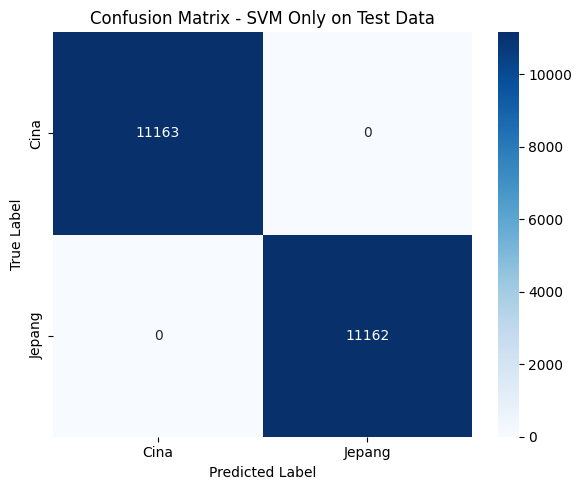


📊 Classification Report (SVM Only):
              precision  recall  f1-score  support
Cina                1.0     1.0       1.0  11163.0
Jepang              1.0     1.0       1.0  11162.0
accuracy            1.0     1.0       1.0      1.0
macro avg           1.0     1.0       1.0  22325.0
weighted avg        1.0     1.0       1.0  22325.0


In [ ]:
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix

# Load model dan test set
svm_model = joblib.load("Hasil_NoPadding/svm_model_NoPadding.pkl")
test_data = joblib.load("Hasil_NoPadding/svm_testset_NoPadding.pkl")

X_test = test_data["X_test"]
y_test = test_data["y_test"]

# Prediksi SVM langsung
y_pred = svm_model.predict(X_test)

# Evaluation
report = classification_report(y_test, y_pred, target_names=["Cina", "Jepang"], output_dict=True)
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Cina", "Jepang"], yticklabels=["Cina", "Jepang"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - SVM Only on Test Data")
plt.tight_layout()
plt.show()

print("\n📊 Classification Report (SVM Only):")
print(pd.DataFrame(report).T)


Evaluating dataset_negatif: 100%|██████████| 100/100 [00:14<00:00,  6.86it/s]
/Users/keysaanadea/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/keysaanadea/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/keysaanadea/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter t

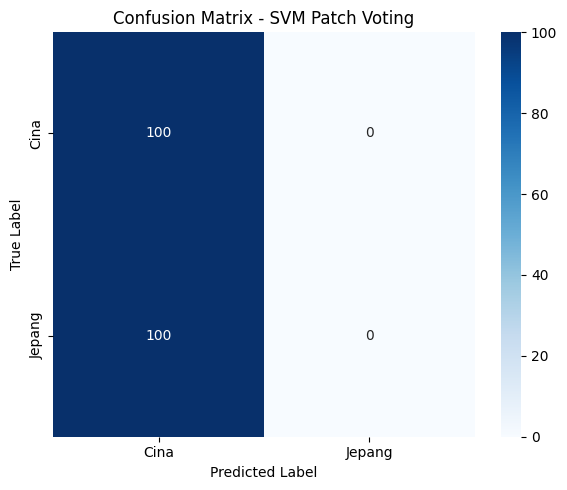


📊 Classification Report (SVM Only - Voting per Gambar):
              precision  recall  f1-score  support
Cina               0.50     1.0  0.666667    100.0
Jepang             0.00     0.0  0.000000    100.0
accuracy           0.50     0.5  0.500000      0.5
macro avg          0.25     0.5  0.333333    200.0
weighted avg       0.25     0.5  0.333333    200.0


In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
from tqdm import tqdm
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns
import joblib

from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D

# === Load model dan komponen ===
svm_model = joblib.load("Hasil_NoPadding/svm_model_NoPadding.pkl")
pca_model = joblib.load("Hasil_NoPadding/pca_1024_nopadding.pkl")

# === ResNet50 sebagai feature extractor ===
base_model = ResNet50(weights="imagenet", include_top=False)
gap_layer = GlobalAveragePooling2D()(base_model.output)
feature_extractor = Model(inputs=base_model.input, outputs=gap_layer)

# === Parameter patching ===
PATCH_SIZE = 224
STRIDE = 112
# === Thresholds ===
COLOR_STD_THRESHOLD = 20
EDGE_THRESHOLD = 1200
PADDING_BLACK_RATIO_THRESHOLD = 0.2  # Maksimal 20% area hitam

def is_valid_patch(patch):
    gray = cv2.cvtColor(patch, cv2.COLOR_RGB2GRAY)

    # 1️⃣ Filter: Rasio area hitam (padding)
    black_ratio = np.sum(gray < 10) / gray.size
    if black_ratio > PADDING_BLACK_RATIO_THRESHOLD:
        return False

    # 2️⃣ Filter: Variasi warna
    std = np.std(gray)
    if std < COLOR_STD_THRESHOLD:
        return False

    # 3️⃣ Filter: Jumlah edge
    edge = np.sum(cv2.Canny(gray, 50, 150) > 0)
    if edge < EDGE_THRESHOLD:
        return False

    return True


def extract_valid_patches(image):
    h, w = image.shape[:2]
    patches = []
    for y in range(0, h - PATCH_SIZE + 1, STRIDE):
        for x in range(0, w - PATCH_SIZE + 1, STRIDE):
            patch = image[y:y+PATCH_SIZE, x:x+PATCH_SIZE]
            if patch.shape[:2] == (PATCH_SIZE, PATCH_SIZE) and is_valid_patch(patch):
                patches.append(patch)
    return patches

def classify_patch_svm(patch):
    resized = cv2.resize(patch, (224, 224))
    input_tensor = preprocess_input(np.expand_dims(resized, axis=0))
    features = feature_extractor.predict(input_tensor, verbose=0)
    features_pca = pca_model.transform(features)
    prediction = svm_model.predict(features_pca)[0]
    return prediction

def classify_image_majority_vote(path):
    image = cv2.imread(path)
    if image is None:
        print(f"⚠️ Gagal membaca gambar: {path}")
        return 0
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    patches = extract_valid_patches(image_rgb)
    if not patches:
        return 0
    preds = [classify_patch_svm(p) for p in patches]
    vote = Counter(preds).most_common(1)[0][0]
    return vote

def evaluate_folder(folder_path, true_label, limit=100):
    preds, labels = [], []
    files = sorted([f for f in os.listdir(folder_path) if f.lower().endswith((".jpg", ".jpeg", ".png"))])[:limit]
    for fname in tqdm(files, desc=f"Evaluating {folder_path}"):
        pred = classify_image_majority_vote(os.path.join(folder_path, fname))
        preds.append(pred)
        labels.append(true_label)
    return labels, preds

# === Evaluasi di 100 gambar pertama ===
true_pos, pred_pos = evaluate_folder("dataset_positif", 1, limit=100)
true_neg, pred_neg = evaluate_folder("dataset_negatif", 0, limit=100)

all_true = true_pos + true_neg
all_pred = pred_pos + pred_neg

# === Classification Report dan Confusion Matrix ===
report = classification_report(all_true, all_pred, target_names=["Cina", "Jepang"], output_dict=True)
cm = confusion_matrix(all_true, all_pred)

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Cina", "Jepang"], yticklabels=["Cina", "Jepang"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - SVM Patch Voting")
plt.tight_layout()
plt.show()

print("\n📊 Classification Report (SVM Only - Voting per Gambar):")
print(pd.DataFrame(report).T)


# MODEL CENTROID-BASED

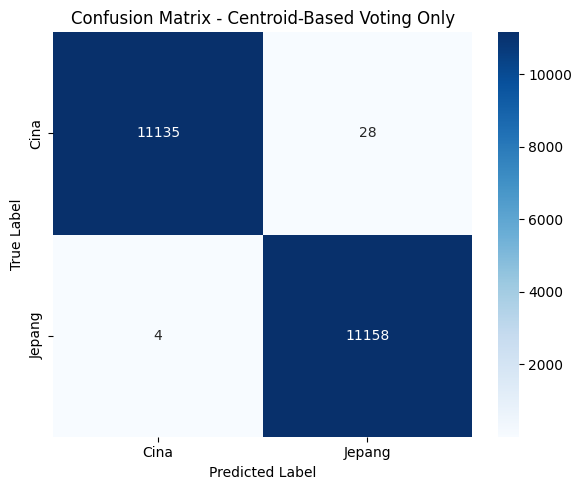


📊 Classification Report (Centroid-Based Only):
              precision    recall  f1-score       support
Cina           0.999641  0.997492  0.998565  11163.000000
Jepang         0.997497  0.999642  0.998568  11162.000000
accuracy       0.998567  0.998567  0.998567      0.998567
macro avg      0.998569  0.998567  0.998567  22325.000000
weighted avg   0.998569  0.998567  0.998567  22325.000000


In [ ]:
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import normalize
from sklearn.metrics.pairwise import cosine_distances

# Load test set dan centroid
test_data = joblib.load("Hasil_NoPadding/svm_testset_NoPadding.pkl")
clustering = joblib.load("Hasil_NoPadding/discriminative_clustering_nopadding.pkl")

X_test = test_data["X_test"]
y_test = test_data["y_test"]
centroids = clustering["centroids"]

# Cluster Jepang vs Cina
JEPANG_CLUSTERS = [0, 1, 3]  # klaster dominan Jepang
CINA_CLUSTERS = [2, 4]       # klaster dominan Cina


# Fungsi prediksi berdasarkan jarak ke centroid saja
def predict_centroid_only(feat_norm):
    dists = cosine_distances(feat_norm, centroids)[0]
    jepang_score = np.mean([1.0 / (dists[c] + 1e-8) for c in JEPANG_CLUSTERS])
    cina_score = np.mean([1.0 / (dists[c] + 1e-8) for c in CINA_CLUSTERS])
    return 1 if jepang_score > cina_score else 0

# Prediksi semua
predictions = []
for feat in X_test:
    feat_norm = normalize(feat.reshape(1, -1))
    pred = predict_centroid_only(feat_norm)
    predictions.append(pred)

# Evaluation
report = classification_report(y_test, predictions, target_names=["Cina", "Jepang"], output_dict=True)
cm = confusion_matrix(y_test, predictions)

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Cina", "Jepang"], yticklabels=["Cina", "Jepang"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Centroid-Based Voting Only")
plt.tight_layout()
plt.show()

print("\n📊 Classification Report (Centroid-Based Only):")
print(pd.DataFrame(report).T)


Evaluating dataset_negatif: 100%|██████████| 100/100 [00:15<00:00,  6.63it/s]


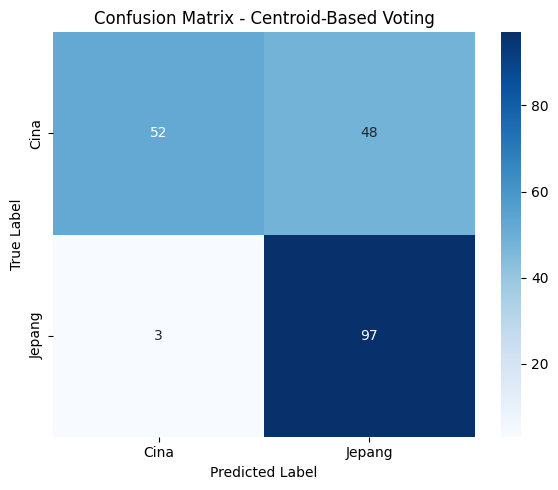


📊 Classification Report:
              precision  recall  f1-score  support
Cina           0.945455   0.520  0.670968  100.000
Jepang         0.668966   0.970  0.791837  100.000
accuracy       0.745000   0.745  0.745000    0.745
macro avg      0.807210   0.745  0.731402  200.000
weighted avg   0.807210   0.745  0.731402  200.000


In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
from collections import Counter
from tqdm import tqdm
from joblib import load
from sklearn.preprocessing import normalize
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics.pairwise import cosine_distances
from tensorflow.keras.applications.resnet50 import preprocess_input, ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D
import matplotlib.pyplot as plt
import seaborn as sns

# === Load komponen ===
pca_model = load("Hasil_NoPadding/pca_1024_nopadding.pkl")
clustering = joblib.load("Hasil_NoPadding/discriminative_clustering_nopadding.pkl")
centroids = clustering["centroids"]  # pastikan ini centroid 1024D dan belum dinormalisasi

# === CNN Feature Extractor ===
base_model = ResNet50(weights="imagenet", include_top=False)
gap = GlobalAveragePooling2D()(base_model.output)
feature_extractor = Model(inputs=base_model.input, outputs=gap)

# === Konfigurasi ===
PATCH_SIZE = 224
STRIDE = 112
COLOR_STD_THRESHOLD = 20
EDGE_THRESHOLD = 1200
PADDING_BLACK_RATIO_THRESHOLD = 0.2  # Maksimal 20% area hitam
JEPANG_CLUSTERS = [0, 1, 3]  # klaster dominan Jepang
CINA_CLUSTERS = [2, 4]       # klaster dominan Cina

def is_valid_patch(patch):
    gray = cv2.cvtColor(patch, cv2.COLOR_RGB2GRAY)

    # 1️⃣ Filter: Rasio area hitam (padding)
    black_ratio = np.sum(gray < 10) / gray.size
    if black_ratio > PADDING_BLACK_RATIO_THRESHOLD:
        return False

    # 2️⃣ Filter: Variasi warna
    std = np.std(gray)
    if std < COLOR_STD_THRESHOLD:
        return False

    # 3️⃣ Filter: Jumlah edge
    edge = np.sum(cv2.Canny(gray, 50, 150) > 0)
    if edge < EDGE_THRESHOLD:
        return False

    return True

def extract_valid_patches(image):
    h, w = image.shape[:2]
    patches = []
    for y in range(0, h - PATCH_SIZE + 1, STRIDE):
        for x in range(0, w - PATCH_SIZE + 1, STRIDE):
            patch = image[y:y+PATCH_SIZE, x:x+PATCH_SIZE]
            if patch.shape[:2] == (PATCH_SIZE, PATCH_SIZE) and is_valid_patch(patch):
                patches.append(patch)
    return patches

def classify_patch_centroid(patch):
    resized = cv2.resize(patch, (224, 224))
    inp = preprocess_input(np.expand_dims(resized, axis=0))
    feat = feature_extractor.predict(inp, verbose=0)
    feat_pca = pca_model.transform(feat)
    feat_norm = normalize(feat_pca)

    dists = cosine_distances(feat_norm, centroids)[0]
    jepang_score = np.mean([1.0 / (dists[c] + 1e-8) for c in JEPANG_CLUSTERS])
    cina_score = np.mean([1.0 / (dists[c] + 1e-8) for c in CINA_CLUSTERS])

    return 1 if jepang_score > cina_score else 0

def classify_image_centroid(path):
    image = cv2.imread(path)
    if image is None:
        print(f"⚠️ Gagal membaca gambar: {path}")
        return 0
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    patches = extract_valid_patches(image_rgb)
    if not patches:
        return 0
    preds = [classify_patch_centroid(p) for p in patches]
    return 1 if preds.count(1) > preds.count(0) else 0

def evaluate_folder(folder_path, true_label, limit=100):
    preds, labels = [], []
    files = sorted([f for f in os.listdir(folder_path) if f.lower().endswith((".jpg", ".jpeg", ".png"))])[:limit]
    for fname in tqdm(files, desc=f"Evaluating {folder_path}"):
        pred = classify_image_centroid(os.path.join(folder_path, fname))
        preds.append(pred)
        labels.append(true_label)
    return labels, preds

# === Evaluasi 100 gambar dari positif dan negatif ===
true_pos, pred_pos = evaluate_folder("dataset_positif", 1, limit=100)
true_neg, pred_neg = evaluate_folder("dataset_negatif", 0, limit=100)

all_true = true_pos + true_neg
all_pred = pred_pos + pred_neg

# === Classification Report dan Confusion Matrix ===
report = classification_report(all_true, all_pred, target_names=["Cina", "Jepang"], output_dict=True)
cm = confusion_matrix(all_true, all_pred)

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Cina", "Jepang"], yticklabels=["Cina", "Jepang"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Centroid-Based Voting")
plt.tight_layout()
plt.show()

print("\n📊 Classification Report:")
print(pd.DataFrame(report).T)


# GABUNGAN

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 636ms/step


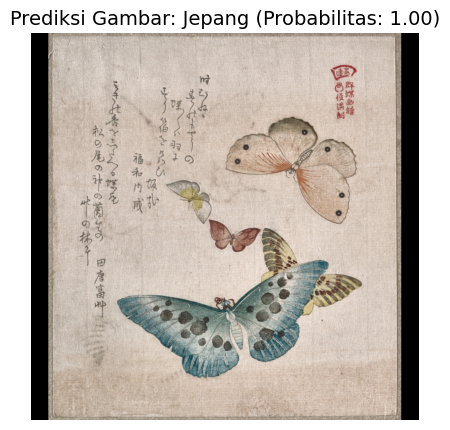

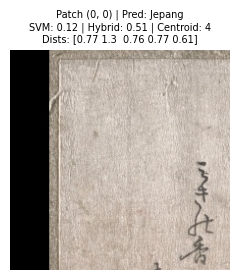

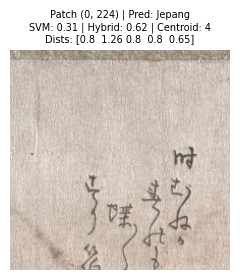

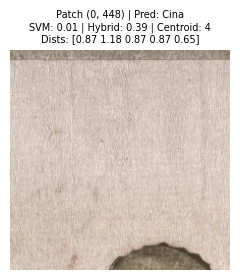

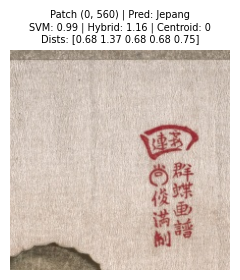

...

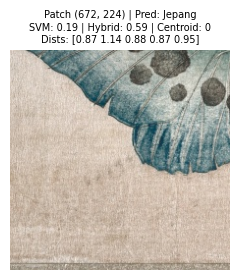

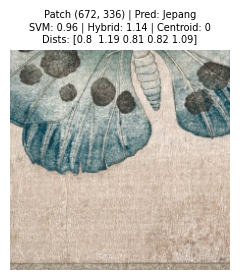

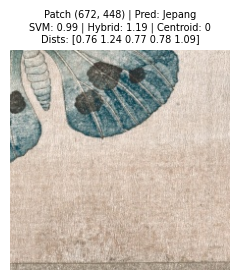

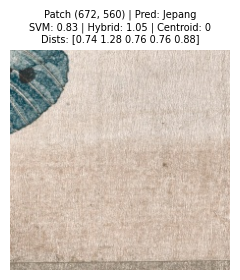

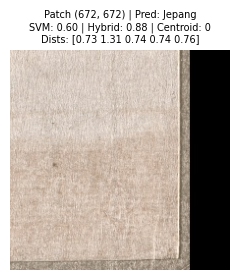


📌 Closest to Centroid: 0


In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter
from joblib import load
from sklearn.preprocessing import normalize
from sklearn.metrics.pairwise import cosine_distances
from tensorflow.keras.applications.resnet50 import preprocess_input, ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D

# ==== Load Model dan Komponen ====
svm_full = load("svm_models_fullimage/svm_fullimage_balanced.pkl")
pca_full = load("pca_1024_fullimages.pkl")

svm_patch = load("svm_models_filtered_padding/svm_balanced_filtered_cluster.pkl")
pca_patch = load("pca_1024_nopadding.pkl")
clustering = load("discriminative_clustering_results_nopadding/discriminative_clustering_nopadding.pkl")
centroids = clustering["centroids"]

# ==== Konfigurasi ====
PATCH_SIZE = 224
STRIDE = 112
COLOR_STD_THRESHOLD = 20
EDGE_THRESHOLD = 1200
BLACK_RATIO_THRESHOLD = 0.2
ALPHA = 0.4
BETA = 0.6
JEPANG_CLUSTERS = [0, 2, 3]
CINA_CLUSTERS = [1, 4]

# ==== Feature Extractor ====
base_model = ResNet50(weights="imagenet", include_top=False)
gap = GlobalAveragePooling2D()(base_model.output)
feature_extractor = Model(inputs=base_model.input, outputs=gap)

# ==== Preprocessing & Prediksi Utuh ====
def predict_full_image(img_path):
    image = cv2.imread(img_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    resized = cv2.resize(image_rgb, (224, 224))
    inp = preprocess_input(np.expand_dims(resized, axis=0))
    feat = feature_extractor.predict(inp)
    feat_pca = pca_full.transform(feat)
    pred = svm_full.predict(feat_pca)[0]
    proba = svm_full.predict_proba(feat_pca)[0]
    return pred, proba[1], image_rgb

# ==== Patch Utility ====
def is_valid_patch(patch):
    gray = cv2.cvtColor(patch, cv2.COLOR_RGB2GRAY)
    if np.sum(gray < 10) / gray.size > BLACK_RATIO_THRESHOLD:
        return False
    if np.std(gray) < COLOR_STD_THRESHOLD:
        return False
    if np.sum(cv2.Canny(gray, 50, 150) > 0) < EDGE_THRESHOLD:
        return False
    return True

def extract_valid_patches(image):
    h, w = image.shape[:2]
    patches, positions = [], []
    for y in range(0, h - PATCH_SIZE + 1, STRIDE):
        for x in range(0, w - PATCH_SIZE + 1, STRIDE):
            patch = image[y:y+PATCH_SIZE, x:x+PATCH_SIZE]
            if patch.shape[:2] == (PATCH_SIZE, PATCH_SIZE) and is_valid_patch(patch):
                patches.append(patch)
                positions.append((y, x))
    return patches, positions

# ==== Prediksi Patch Hybrid ====
def classify_patch_hybrid(patch):
    inp = preprocess_input(np.expand_dims(cv2.resize(patch, (224, 224)), axis=0))
    feat = feature_extractor.predict(inp, verbose=0)
    feat_pca = pca_patch.transform(feat)
    feat_norm = normalize(feat_pca)
    proba = svm_patch.predict_proba(feat_norm)[0]
    dists = cosine_distances(feat_norm, centroids)[0]
    jepang_score = np.mean([1.0 / (dists[c] + 1e-8) for c in JEPANG_CLUSTERS])
    cina_score = np.mean([1.0 / (dists[c] + 1e-8) for c in CINA_CLUSTERS])
    hybrid_score = ALPHA * (jepang_score / (cina_score + 1e-8)) + BETA * proba[1]
    centroid_pred = np.argmin(dists)
    return {
        "svm_proba": proba[1],
        "hybrid_score": hybrid_score,
        "centroid": centroid_pred,
        "dists": dists,
    }

# ==== Visualisasi Gambar ====
def analyze_image(img_path):
    pred, proba, img_rgb = predict_full_image(img_path)
    label_map = {0: "Cina", 1: "Jepang"}

    # Full Image Prediction
    plt.figure(figsize=(5, 6))
    plt.imshow(img_rgb)
    plt.axis("off")
    plt.title(f"Prediksi Gambar: {label_map[pred]} (Probabilitas: {proba:.2f})", fontsize=14)
    plt.show()

    # Patch Predictions
    patches, positions = extract_valid_patches(img_rgb)
    patch_results = [classify_patch_hybrid(p) for p in patches]

    for i, (patch, pos, res) in enumerate(zip(patches, positions, patch_results)):
        plt.figure(figsize=(2.5, 3.5))
        plt.imshow(patch)
        plt.axis("off")
        plt.title(
            f"Patch {pos} | Pred: {'Jepang' if res['hybrid_score'] > 0.5 else 'Cina'}\n"
            f"SVM: {res['svm_proba']:.2f} | Hybrid: {res['hybrid_score']:.2f} | "
            f"Centroid: {res['centroid']}\n"
            f"Dists: {np.round(res['dists'], 2)}",
            fontsize=7
        )
        plt.tight_layout()
        plt.show()

    # Majority Centroid
    centroid_counts = Counter([r["centroid"] for r in patch_results])
    most_common_centroid = centroid_counts.most_common(1)[0][0]
    print(f"\n📌 Closest to Centroid: {most_common_centroid}")

# ==== Contoh Eksekusi ====
image_path = "processed_dataset_positif/MET-54141.jpg"
analyze_image(image_path)
